In [4]:
import matplotlib.pyplot as plt
%matplotlib notebook

In [7]:
#zones 5,6,7 do not converge

import sys
from despotic import cloud,zonedcloud
from despotic.chemistry import NL99_GC,GOW,abundanceDict
import numpy as np
from astropy import units as u
from astropy import constants as constants
from astropy.cosmology import WMAP9 as cosmo
from scipy.integrate import quad

#returns Powerlaw density profile

def densityProfile(Mcloud,Rcloud,NZONES = 16):
    Radii = np.linspace(0*u.pc,Rcloud,NZONES+1)
    radii = (Radii[1:]+ Radii[:-1])/2
    dR = np.abs(Radii[1:] - Radii[:-1])
    
    alpha = 2
    n0 = Mcloud / (4. * np.pi *Rcloud**2 * Rcloud**(3. - alpha)/(3. - alpha))
    rho = n0 * (Rcloud/radii)**alpha
    density = ((rho /constants.m_p).cgs)[::-1]

    return density, dR.to(u.cm)

def despotic_test_func(Mcloud,Rcloud,Metallicity,RadField,NZONES=16):
    
    density, dR = densityProfile(Mcloud,Rcloud)
    density /=1.4 #atomic weight correction
    column_density_cgs = np.cumsum(density * dR)
        
    #set up the zoned cloud (a radially stratified cloud)
    gmc = zonedcloud(colDen = column_density_cgs.value)
    #Hard coded by hand to fix some weird zonedcloud issues. Because zonedcloud is not so good with non-fixed cloud profiles
    gmc._colDen[1:] = column_density_cgs.value
    gmc.colDen = gmc._colDen[1:] - (gmc._colDen[1:] - gmc._colDen[:-1])/2
    gmc._colDen[1:] = column_density_cgs.value 

    DGR = (10**(2.445*np.log10(Metallicity*0.0196/0.0134)-2.029))    #equation 9, Qi Li+2019
    DMR = DGR/(Metallicity*0.0196*0.44)    #dust-to-metal ratio
    
    #================================================================   
    #These lines are only for setting up initial properties to use gmc.setChemEq
    gmc.nH = density.value    #Volume density of H nuclei
    gmc.Td = 10.              #dust temperature
    gmc.Tg = 10.              #gas temperature
    gmc.rad.TradDust = 10.    #Temperature of the dust-trapped IR radiation field
    gmc.ionRate = 1.e-17*RadField          #primary cosmic ray ionization rate (in units of s^-1).
    gmc.rad.ionRate = 1.e-17*RadField      #RadField is the UV radiation field impinging on the cloud in Habing units
    gmc.chi = RadField                     #ISRF strength, normalized to Solar neighbourhood
    gmc.rad.chi = RadField        
    gmc.sigmaD10   = 2.0e-25  * Metallicity *DMR       # Cross section to 10K thermal radiation, cm^2 H^-1
    gmc.sigmaDPE   = 1.0e-21 * Metallicity*DMR       # Cross section to 8-13.6 eV photons, cm^2 H^-1
    gmc.sigmaDISRF = 3.0e-22  * Metallicity*DMR     # Cross section to ISRF photons, cm^2 H^-1
    gmc.Zd      = 1.0  * Metallicity*DMR       # Dust abundance relative to solar
    gmc.alphaGD	   = 3.2e-34 * Metallicity*DMR      # Dust-gas coupling coefficient, erg cm^3 K^-3/2
    gmc.dust.sigmaD10   = 2.0e-25  * Metallicity*DMR      # Cross section to 10K thermal radiation, cm^2 H^-1
    gmc.dust.sigmaDPE   = 1.0e-21 * Metallicity*DMR      # Cross section to 8-13.6 eV photons, cm^2 H^-1
    gmc.dust.sigmaDISRF = 3.0e-22  * Metallicity*DMR     # Cross section to ISRF photons, cm^2 H^-1
    gmc.dust.Zd      = 1.0  * Metallicity*DMR        # Dust abundance relative to Milky Way value
    gmc.dust.alphaGD	   = 3.2e-34 * Metallicity*DMR      # Dust-gas coupling coefficient, erg cm^3 K^-3/2
    #Initial abundance of elements
    gmc.addEmitter('c+',1.e-100*Metallicity)
    gmc.addEmitter('c',1.6e-4*Metallicity)
    gmc.addEmitter('o', 3.2e-4*Metallicity)
    gmc.addEmitter('co',1.e-100*Metallicity)
    gmc.TCMB = 2.73*2
    gmc.rad.TCMB = 2.73*2
    
    #initialise the abundances for H2 and He, and tell the code to
    #extrapolate from the collision tables if you hit a derived
    #temperature outside of the Leiden MolData
    for nz in range(NZONES):
        gmc.comp[nz].xH2 = 0.5
        gmc.comp[nz].xHe = 0.1
        gmc.emitters[nz]['co'].extrap = True
        gmc.emitters[nz]['c+'].extrap = True
        gmc.emitters[nz]['o'].extrap = True
        gmc.emitters[nz]['c'].extrap = True

    gmc.setVirial() #set the cloud to virial properties and calculates velocity dispersion which is important to find escape probabilities
    #================================================================
    
    #the problematic part of the code - the following line causes some zones to not converge
    gmc.setChemEq(network=GOW, evolveTemp = 'iterateDust', verbose=True, info = {'xC': 1.6e-4*Metallicity,'xO':3.2e-4*Metallicity,'xSi':1.7e-6*Metallicity}, tol = 1.e-3, maxTime=1e20)
    return gmc

Mcloud,Rcloud,Metallicity,RadField =  1e6*u.Msun, 60*u.pc, 1, 5    #in Msun,pc,dimensionless,Habing units respectively

gmc = despotic_test_func(Mcloud,Rcloud,Metallicity,RadField)

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8152930850400493 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6388421447959012 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.652959611268878 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.566687170961367 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5688092698246334 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.561028052946412 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3618908691793259 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3583906

setChemEquil: evolved from t = 4.294967295e+16 to 8.589934591e+16 sec, residual = 0.05864932493195707 for species H3+
setChemEquil: evolved from t = 8.589934591e+16 to 1.7179869183e+17 sec, residual = 0.058636957117469635 for species H3+
setChemEquil: evolved from t = 1.7179869183e+17 to 3.4359738367e+17 sec, residual = 0.05861223713044983 for species H3+
setChemEquil: evolved from t = 3.4359738367e+17 to 6.8719476735e+17 sec, residual = 0.058562859631987374 for species H3+
setChemEquil: evolved from t = 6.8719476735e+17 to 1.37438953471e+18 sec, residual = 0.05846435380176218 for species H3+
setChemEquil: evolved from t = 1.37438953471e+18 to 2.74877906943e+18 sec, residual = 0.058268332960219826 for species H3+
setChemEquil: evolved from t = 2.74877906943e+18 to 5.49755813887e+18 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H2': 3.2889318995484722e-06, 'H+': 0.008669426137542974, 'H2+': 7.297536663090805e-14, 'H3+': 9.124354358455506e-18, 'He+': 0.0002

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.669426e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.913240e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.070214e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9059.898207, Td = 22.148131, residual = 5.332168e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0006098854693481481 for species H2+
setChemEquil: abundances converged: {'H2': 3.2903979932459437e-06, 'H+': 0.008669349490245112, 'H2+': 7.284197379783506e-14, 'H3+': 9.109517712058797e-18, 'He+': 0.0002368604441362037, 'O+': 2.232547543114951e-06, 'C+': 0.00015999181193911426, 'CO': 6.852856856458688e-19, 'HCO+': 2.534294519207219e-19, 'Si+': 1.6999844932879995e-06, 'CHx': 7.604424371182526e-19, 'OHx': 3.7053707148593034e-16}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.669349e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.913241e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.070134e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9059.895688, Td = 22.148131, residual = 2.780551e-07
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8908090527749397 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5477651480477845 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6368283917561031 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5747896212593544 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5752883132885195 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4929343530079632 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

setChemEquil: evolved from t = 1.7179869183e+17 to 3.4359738367e+17 sec, residual = 33.63747695201537 for species H3+
setChemEquil: evolved from t = 3.4359738367e+17 to 6.8719476735e+17 sec, residual = 0.0004733818183892957 for species H2
setChemEquil: abundances converged: {'H2': 4.0663531364757055e-06, 'H+': 0.02126099463221581, 'H2+': 7.394764664183962e-14, 'H3+': 4.9002260367883364e-18, 'He+': 9.242798532138879e-05, 'O+': 5.503669713165099e-06, 'C+': 0.00015997690969923485, 'CO': 1.7686617860030947e-18, 'HCO+': 2.22384729032794e-19, 'Si+': 1.699963304346782e-06, 'CHx': 8.901227704321192e-19, 'OHx': 7.476147264816997e-16}
setChemEquil: updated temperatures to Tg = 52.119836, Td = 22.070391, residual = 2.830694e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12052239929353337 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9831288679721396 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, res

setChemEquil: evolved from t = 1.073741823e+16 to 2.147483647e+16 sec, residual = 0.2498131949743998 for species H3+
setChemEquil: evolved from t = 2.147483647e+16 to 4.294967295e+16 sec, residual = 0.24975020631616296 for species H3+
setChemEquil: evolved from t = 4.294967295e+16 to 8.589934591e+16 sec, residual = 0.24962432424456948 for species H3+
setChemEquil: evolved from t = 8.589934591e+16 to 1.7179869183e+17 sec, residual = 0.24937294040948732 for species H3+
setChemEquil: evolved from t = 1.7179869183e+17 to 3.4359738367e+17 sec, residual = 0.248871688620679 for species H3+
setChemEquil: evolved from t = 3.4359738367e+17 to 6.8719476735e+17 sec, residual = 0.24787520608135094 for species H3+
setChemEquil: evolved from t = 6.8719476735e+17 to 1.37438953471e+18 sec, residual = 0.24590599032177707 for species H3+
setChemEquil: evolved from t = 1.37438953471e+18 to 2.74877906943e+18 sec, residual = 0.24205995595978114 for species H3+
setChemEquil: evolved from t = 2.74877906943e+1

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.004764e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.969857e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.651770e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9239.036809, Td = 22.071316, residual = 4.058984e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0004738821449927766 for species H2+
setChemEquil: abundances converged: {'H2': 4.745953111717432e-06, 'H+': 0.003004749163272052, 'H2+': 1.0644229761110763e-13, 'H3+': 4.676986926926105e-17, 'He+': 0.00048453726814610786, 'O+': 7.721003229246345e-07, 'C+': 0.00015999540816315105, 'CO': 1.920497732824047e-18, 'HCO+': 1.305081570788868e-18, 'Si+': 1.6999903821929497e-06, 'CHx': 1.3094829486190784e-18, 'OHx': 7.892598384097823e-16}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.004749e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.969858e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.651754e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9239.035002, Td = 22.071316, residual = 1.955157e-07
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8308916711770477 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5504750502182477 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6369787870382566 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.583245403904958 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5764151276961735 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 10.394852502071886 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

setChemEquil: evolved from t = 3.4359738367e+17 to 6.8719476735e+17 sec, residual = 1.116229085911634 for species CO
setChemEquil: evolved from t = 6.8719476735e+17 to 1.37438953471e+18 sec, residual = 1.113797175512806 for species CO
setChemEquil: evolved from t = 1.37438953471e+18 to 2.74877906943e+18 sec, residual = 0.2485013959752096 for species H3+
setChemEquil: evolved from t = 2.74877906943e+18 to 5.49755813887e+18 sec, residual = 0.24842233429895066 for species H3+
setChemEquil: evolved from t = 5.49755813887e+18 to 1.099511627775e+19 sec, residual = 0.24826436177312172 for species H3+
setChemEquil: evolved from t = 1.099511627775e+19 to 2.1990232555509998e+19 sec, residual = 0.0016886631033270483 for species OHx
setChemEquil: evolved from t = 2.1990232555509998e+19 to 4.398046511103e+19 sec, residual = 0.0008464902057201407 for species OHx
setChemEquil: abundances converged: {'H2': 4.87095570474891e-06, 'H+': 0.05892995934743071, 'H2+': 7.428733980832984e-14, 'H3+': 2.17549729

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.892996e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.410603e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.913760e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 36.027701, Td = 21.982265, residual = 4.339923e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9976098261596592 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 22.231585241192697 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 23.39953796884821 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 23.48310387806271 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 23.475870483917202 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 23.52334005333728 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 23.623620412151197 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 23.565667008378146 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.615993e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.889611e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.662384e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13803.712530, Td = 21.984081, residual = 9.973900e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4750744059933816 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2669920586302823 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1976541466814915 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2612542569574501 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2217109797055451 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2562707258307406 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.36048637525095284 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.4476651519704182 for species O+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.083180e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.939040e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.495845e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7481.649606, Td = 21.983218, residual = 8.450092e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0012064277344936425 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.001983054405634066 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0034443229898990513 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.005840209707512756 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.00938891239391837 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.012015250014779433 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.008685231174298758 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.01548185623870768 for species H2
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.363162e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997366e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.192477e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8740.046255, Td = 21.983393, residual = 1.439805e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002666942011080309 for species H2+
setChemEquil: abundances converged: {'H2': 1.353492255118179e-05, 'H+': 0.00023631628662865975, 'H2+': 3.127383410587579e-13, 'H3+': 9.848943571817594e-16, 'He+': 0.0007944035003564084, 'O+': 6.037226328216135e-08, 'C+': 0.00015999707530177197, 'CO': 5.658945799394381e-18, 'HCO+': 6.0716352329762895e-18, 'Si+': 1.6999937692800822e-06, 'CHx': 8.663152318899607e-18, 'OHx': 1.5193014537637757e-15}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.363163e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.363163e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8740.046628, Td = 21.983393, residual = 4.273622e-08
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8467885470943278 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8295563038578945 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 5.900631023485528 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3.333634308894652 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.4238785898993422 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7292776961860381 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

setChemEquil: evolved from t = 6.8719476735e+17 to 1.37438953471e+18 sec, residual = 0.040273385226752834 for species H3+
setChemEquil: evolved from t = 1.37438953471e+18 to 2.74877906943e+18 sec, residual = 0.040271074473700375 for species H3+
setChemEquil: evolved from t = 2.74877906943e+18 to 5.49755813887e+18 sec, residual = 0.040266453763004306 for species H3+
setChemEquil: evolved from t = 5.49755813887e+18 to 1.099511627775e+19 sec, residual = 0.0402572155219697 for species H3+
setChemEquil: evolved from t = 1.099511627775e+19 to 2.1990232555509998e+19 sec, residual = 0.040238751751119795 for species H3+
setChemEquil: evolved from t = 2.1990232555509998e+19 to 4.398046511103e+19 sec, residual = 0.000740523408071514 for species OHx
setChemEquil: abundances converged: {'H2': 5.572535148424864e-06, 'H+': 0.14643847213603498, 'H2+': 7.20582482840697e-14, 'H3+': 9.823868337978807e-19, 'He+': 1.097368879508016e-05, 'O+': 3.8934236917072004e-05, 'C+': 0.0001597467599980047, 'CO': 1.036

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.464385e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.535504e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.466498e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 31.888118, Td = 21.880459, residual = 5.109648e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 37.922301398138295 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 30.95170133463567 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 19.989531275510682 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 10.999607404278956 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 5.590994650485916 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.8075167864333865 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1561145425188057 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.430115220566167 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5110000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.008876e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.746050e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.635057e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14557.828481, Td = 21.882783, residual = 9.978096e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4791766777981411 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.27056980493614746 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1671668085846154 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.21842715232705745 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1969072679433722 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23994381424290512 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2651755507230982 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2656889671754088 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.208287e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.879001e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.236542e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 50.124203, Td = 21.880463, residual = 2.894351e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1582674544741216 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9779872763820773 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9981944051201427 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9983296130202882 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9933091998265985 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9976079385136213 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9977462846114032 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9631068382849842 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.949921e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.392677e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.648527e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13855.460824, Td = 21.882667, residual = 9.963824e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46187494218073455 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26370943340573416 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15919431821297192 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2035985607970191 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.18974137873783392 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.24621321732106027 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.26648856818211253 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26651328066225743 for species CHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.552424e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.944275e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.949683e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 95.708816, Td = 21.880495, residual = 1.437668e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09508691685439796 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1347189246490652 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9126293111380597 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9717164156242177 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9773595869239533 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9772930491513928 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9946371770700729 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0012473686968322 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.826368e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.511521e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.685120e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 12775.179442, Td = 21.882499, residual = 9.925082e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34149817134161087 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2238593943257633 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1353812720211578 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1156358539965705 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.18889300858789282 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2535468898382476 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2670875072782801 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26605497560441393 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.825601e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.981477e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.504077e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2314.299813, Td = 21.880962, residual = 4.520106e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005799927223230972 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007864672174536569 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.011130850513013435 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.011751213430322371 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.020502075861227098 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03144141932708644 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.03267212778741113 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.023769377447619977 for species H2
setChemEquil: evolved from t =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.638197e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.963585e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.914321e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5250.310434, Td = 21.881336, residual = 5.592071e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01922147305871813 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.029649795078095176 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.046610985672435046 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07433807338384613 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0993897725865156 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07276333828645787 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.04242103843612255 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03204715988002671 for species CO
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.985602e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.580166e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.517334e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 3960.086659, Td = 21.881167, residual = 3.258070e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013572408562973481 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.018980192225437564 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.025404548056462084 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.040311293456718134 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0263090985159925 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.02544387169068596 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.008662075428191862 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.011808959536264041 for species HCO+
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.327675e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.161860e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.399865e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4813.396373, Td = 21.881277, residual = 1.772781e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006746198616216947 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.010014754402475567 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.014708867126898229 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.027296520363979004 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02128046058227362 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.01821174505487133 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.006233784040567292 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.01022165146301135 for species CHx
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.664328e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.383436e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.911361e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4352.590945, Td = 21.881217, residual = 1.058692e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004257846205071747 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.006116949411180794 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.008522799806650605 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.014398521147688137 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.010224099199189984 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.011901146526281492 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0031997650617358042 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.003982713004957339 for species CHx
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.437257e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.230059e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.555891e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4668.712354, Td = 21.881258, residual = 6.771062e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.002635314089020291 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.003864200137998708 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.005560867244779555 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.009931879909536478 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.00850614733664079 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.00818406130394278 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.021813755894640074 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.02200440284153271 for species O+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.578097e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.325955e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.771175e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4469.818023, Td = 21.881232, residual = 4.449719e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0017697513256599295 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0025612072791089124 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.003609462218910786 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0062148359904007355 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.009322020791337926 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.030095367873007595 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.013812526455903917 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0072054935494936245 for species O+
setChemEquil: evolved from 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.482379e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.260629e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.623104e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4604.810313, Td = 21.881250, residual = 2.931549e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.001149642458788902 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0016782756153492784 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.002397926309196441 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.004228234551225896 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.007056588460512492 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03189896103923262 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.015023927518128088 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.003214587589348894 for species O+
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.490371e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.261958e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.631480e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4601.819037, Td = 21.881249, residual = 6.500205e-04
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7765891885102895 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9408862375017458 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.695144466420897 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5998822056087554 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.55013230366571 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.4740972303415028 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1

setChemEquil: evolved from t = 1.37438953471e+18 to 2.74877906943e+18 sec, residual = 0.23104577124772607 for species H3+
setChemEquil: evolved from t = 2.74877906943e+18 to 5.49755813887e+18 sec, residual = 0.23101649893079546 for species H3+
setChemEquil: evolved from t = 5.49755813887e+18 to 1.099511627775e+19 sec, residual = 0.23095797654321348 for species H3+
setChemEquil: evolved from t = 1.099511627775e+19 to 2.1990232555509998e+19 sec, residual = 0.0008507059955713547 for species OHx
setChemEquil: abundances converged: {'H2': 6.546289901559913e-06, 'H+': 0.21720279359933625, 'H2+': 7.151137742381816e-14, 'H3+': 7.757014441509362e-19, 'He+': 6.373336495613444e-06, 'O+': 5.8593614979457915e-05, 'C+': 0.0001594835931936108, 'CO': 2.74552036184597e-17, 'HCO+': 1.4341469299817533e-19, 'Si+': 1.6996804333277605e-06, 'CHx': 1.8345759008358913e-18, 'OHx': 4.631174773390657e-15}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.172028e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.827841e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.174289e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 30.142702, Td = 21.761516, residual = 5.515181e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 376.52541784991917 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 369.09048646819986 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 347.7166265595534 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 312.2391709266671 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 253.78430167079188 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 187.1197333352269 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 132.24046918300164 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 64.94582825083134 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.403609e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.510815e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622198e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14986.682014, Td = 21.764455, residual = 9.979887e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4798465605520854 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.27094460904832796 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16781274848506322 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.17691779756500314 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.17026318389990258 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21508049055422274 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6853286890196855 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6875899726725976 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.737830e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.826000e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.761621e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 38.334389, Td = 21.761516, residual = 3.899462e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.983380218814931 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.999368859253174 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9996664422748295 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0105657391472858 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0101026318085746 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.003531207055038 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0150937067487378 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0153228559253336 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.091637e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.698819e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.626331e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14625.659639, Td = 21.764376, residual = 9.973790e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47673439891080194 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2691515115915847 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16492286964616787 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18005981628000967 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.17202429193260838 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.443626194652484 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.009968632911214 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5166003419982164 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.118135e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.887944e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.145392e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 43.823192, Td = 21.761519, residual = 3.327425e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9490072041996653 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9875818825026682 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.985717091788595 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9864306172272362 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9875552361843912 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.98741027770913 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9873020828207343 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.987297429107503 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.322545e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.813154e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.628779e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14421.722786, Td = 21.764333, residual = 9.969613e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47283592913977146 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2675967606087508 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16307496622883066 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.17975301645163366 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.17062457057311198 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22527330125601086 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2615920976357151 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26329813390354806 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.832032e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.911421e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.129808e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 48.248986, Td = 21.761521, residual = 2.979021e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1821933489797538 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9747125894865422 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 4.799692490358426 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.2185559607948355 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.2153620582264166 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9840559325922636 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8557153500629652 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9289361271562545 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.367019e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.899927e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.630655e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14273.295918, Td = 21.764302, residual = 9.966196e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4684053130421897 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26605401533716044 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16156890209973795 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.17615521098711917 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16779910537166864 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.579237653199782 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.26183739207110124 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2631749593864845 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.471962e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.925009e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.790934e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.309862, Td = 21.761524, residual = 2.718605e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.16903412648482719 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9563612347611637 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.551679262360624 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.144817456698799 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.196600832917467 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.2763281838056395 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4.521329521925085 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.10294517995367 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.361272e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.975882e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.632328e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14147.241190, Td = 21.764276, residual = 9.963025e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4632979984203557 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26438862973317856 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1601518873586244 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1705491020227795 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16395844497389078 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5210136969756298 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5678256931306278 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26286490829467457 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.498329e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.934733e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.837306e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.468468, Td = 21.761527, residual = 2.495335e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.15760275538284896 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.93023431592618 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.432296011279611 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 9.566430969392803 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.712186892712118 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9.648874772873539 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.751999864908472 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.573162887198379 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.041024e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.050451e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.634006e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14026.578129, Td = 21.764252, residual = 9.959742e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.45707467907899546 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2624315840590302 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.158655029303009 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16304470917242098 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1589714124380991 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.7775566662318 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34103017835178484 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.48461211026716 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.695512e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.942749e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.055421e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 61.237585, Td = 21.761532, residual = 2.280518e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.14649743491584877 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8927231178153764 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9754822489831823 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9508314146189932 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9511077649909285 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9501177250880696 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9555760650950327 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9557506609197496 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.164522e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.132398e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.635901e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13897.088411, Td = 21.764225, residual = 9.955935e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4488143516453147 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2598844990578959 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1568756254735435 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15300723187923937 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.15393708454506538 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 12.95918352669616 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.26136531770552796 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2623370828350913 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.952270e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.950168e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.336604e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 67.458288, Td = 21.761538, residual = 2.050101e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.13447608224978946 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8393902332257921 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.962036949872892 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0463570124832704 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 21.695768600210044 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 23.79978892832075 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 29.161068636707927 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 78.34881889354195 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.329572e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.234214e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.638334e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13740.130416, Td = 21.764194, residual = 9.950904e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.43652721963307695 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.256117659945595 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15445425396211387 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1389246984482937 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.15574109001066638 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.431626932087033 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6972449447206199 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.34339606287884705 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.188684e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.957785e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.605302e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 76.871463, Td = 21.761550, residual = 1.777416e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12301985422191208 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2900790880039471 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9342329907186667 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.021990491285936 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.82223855430124 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.839433909686291 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4.839096631094392 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.838283392205018 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.584685e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.378866e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.641948e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13523.321055, Td = 21.764151, residual = 9.943156e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4156274301587225 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24962411057787837 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15060019115782974 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11952801318387052 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1582610872846335 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.378945039030953 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.40546569940432864 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2635302148530787 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.334269e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966301e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.799944e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 94.302510, Td = 21.761572, residual = 1.424036e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.10667727250686942 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2904641879497284 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8659940723305563 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0150022585594458 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9847816754467319 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9023838056048131 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.659781487784812 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.47792456554759144 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.060715e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.622386e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.648429e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13170.255556, Td = 21.764083, residual = 9.928397e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3740069992164293 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23597659386669245 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14306672811383625 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1048102644693365 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1623887814449776 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7097551222187961 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.26344809864715457 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26580094058844983 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.315457e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.976432e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.869262e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 136.807021, Td = 21.761629, residual = 9.526886e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07765798050188577 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11129512381632045 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20785320368170768 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9802278248822016 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9243875503392686 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 14679.185913073563 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 484.84543471279534 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 57731.331969245395 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.158837e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.121586e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.662953e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 12466.087933, Td = 21.763949, residual = 9.890257e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28357165710727217 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20128348836977883 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12461818658243073 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10134534124377748 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.17039356281865525 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8069896769422911 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2637129407150651 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26235473181642543 for species CHx
setChemEquil: evolved from t = 25500000

setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.011727247000255847 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.005721896962152084 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0028266528346668762 for species H+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0014049045785217151 for species H+
setChemEquil: evolved from t = 1342177270000000.0 to 2684354550000000.0 sec, residual = 0.000700365573931494 for species H+
setChemEquil: abundances converged: {'H2': 0.47596209296517256, 'H+': 5.3410467396970606e-08, 'H2+': 8.735374904025546e-11, 'H3+': 2.089715571182798e-09, 'He+': 8.937585720824974e-07, 'O+': 2.2023013042350582e-15, 'C+': 0.00015478658861915056, 'CO': 7.780516377174499e-10, 'HCO+': 5.275773575805738e-13, 'Si+': 1.696891750662305e-06, 'CHx': 9.17331088314614e-09, 'OHx': 9.50641262614608

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.293517e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.706303e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.295560e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 29.103637, Td = 21.620709, residual = 5.602747e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 6792.849669652748 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5134.0267334039545 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2714.912324139723 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1331.7948137273077 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 694.0451859965901 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 357.0596623079292 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 404.52196636359463 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 404.384326198174 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 51100000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.117041e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.135287e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.611853e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14800.464992, Td = 21.624324, residual = 9.980336e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4786759807409383 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26835321269182755 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16190652492881985 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1133529544518097 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14770137688877683 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19804432902125257 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.25345785652507624 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2603629476284801 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.162428e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.883469e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.187668e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 37.551959, Td = 21.620711, residual = 3.931330e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9758308727165987 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.817837963614068 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 31.010658535347453 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 30.93058463278442 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 30.94381781787034 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 30.939965798355693 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 36.77041941231534 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 67.18862860607332 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.898691e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.200350e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.616627e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14439.588165, Td = 21.624223, residual = 9.973994e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4763974743387328 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2669991785977116 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15959032514872362 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11935032047932737 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.183102709212416 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20092588082311846 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.26926311335986475 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.284727482367498 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.585050e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.923823e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.878049e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 42.637610, Td = 21.620714, residual = 3.376585e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9321087176922344 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9827410385786938 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9854034796713786 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9876133901680989 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0454760361249313 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0453794928180011 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0452330713926161 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0445026108441582 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.399685e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.783262e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.618779e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14256.344405, Td = 21.624172, residual = 9.970092e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4737704145346381 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26594836993089466 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15829260987828586 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12055244592401282 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3012538110727805 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20247915843555364 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 31.33927555365996 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5446643735539012 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.166397e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.937987e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.485011e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 46.041282, Td = 21.620717, residual = 3.086426e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8931766112592072 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9694460712864726 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.0979902009740257 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9008229667129508 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9092934462442748 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7545314959332565 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7671044794974045 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8091305871795724 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.746581e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.015398e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.620037e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14144.062296, Td = 21.624142, residual = 9.967448e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47135405129760843 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2651005132054194 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15742441953113817 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12012790736089696 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.32593142345498527 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20344947986082018 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2547934339034872 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3544191656349456 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.444849e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.945188e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.780941e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 48.458478, Td = 21.620719, residual = 2.908800e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874588662250102 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.956475485312152 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.1077647623738172 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.116170143162948 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1388236386009825 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.1155653648436583 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8972356487250082 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5259387445414369 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51100

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.998041e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.040894e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.620863e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14068.544471, Td = 21.624121, residual = 9.965555e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46929939572147683 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2644200248279983 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15680051198506517 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11922346306906284 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.32731868762900485 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20411227087076989 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2561985501082331 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26137608224717446 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.012154e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.949504e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.360777e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 50.237322, Td = 21.620721, residual = 2.790417e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48744392192115316 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9448983813505621 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8785903774358248 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0075892314148776 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0050616286448966 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9977671037026626 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0190055666036717 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.077793785306053 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.185576e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.059249e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621442e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14014.967704, Td = 21.624107, residual = 9.964155e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4676063991515761 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2638761039831927 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.156335578071925 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1182523990754002 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3282882142977541 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20458512023957187 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2563043324904628 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5509475443130694 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.728064e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.952338e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.085957e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 51.565357, Td = 21.620723, residual = 2.707904e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874308010766598 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9350842698331745 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 14.304918989875983 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 13.723616333627529 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 13.32633619135516 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.329073544782974 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 13.272807514539428 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 13.308585484083268 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.326860e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.072740e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621859e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13975.989248, Td = 21.624096, residual = 9.963104e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46624325777342546 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26344588888440634 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1559847065166956 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11736823578018363 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.32898564826011123 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20513374602132872 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6632373027945764 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.531181224303028 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.532432e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.954288e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.897266e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.572932, Td = 21.620724, residual = 2.648400e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48741979861573836 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9270342269348736 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 17.43560702136722 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 20.121159766101805 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.884056340843674 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 19.828850811183198 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 19.677359899649588 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 123.86467044918149 for species CO
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.434739e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.082859e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622168e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13946.966331, Td = 21.624088, residual = 9.962305e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4651531978002683 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26310568865986317 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15571616842362468 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11661172342865667 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3295005068254717 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2053936191653698 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6067818897338522 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.508526880443287 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.392489e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.955683e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.762597e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.346157, Td = 21.620725, residual = 2.604428e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48741073081052977 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9205299147268762 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 23.47978704525289 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 19.452055338013537 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 17.44977518963911 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 17.450508051496996 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 16.853533530249553 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 35.233577478832125 for species CO
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.517910e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.090558e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622401e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13925.002316, Td = 21.624082, residual = 9.961690e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4642844260562933 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2628365560323125 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1555086569751487 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11598353993760635 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3298875867625384 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20559061370753406 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5679210317653061 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5067850446587401 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.289700e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.956708e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.663861e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.944487, Td = 21.620725, residual = 2.571358e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.487403337890978 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9153176242755628 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 34.20332289811784 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 81.23507563865769 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 73.44854670522152 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 74.36182633711843 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 69.47957921375999 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 74.13426806206776 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.582488e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.096477e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622578e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13908.184512, Td = 21.624078, residual = 9.961214e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46359317620424056 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2626235111711649 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1553472035516501 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11547028518648905 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.33018246601270995 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2057416308857849 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.538552660585921 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5062349360510627 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.212758e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.957475e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.590056e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 54.410336, Td = 21.620726, residual = 2.546166e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.487397353106501 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9111592375338295 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9626996135403428 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9152854768998238 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9153501032972559 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9150918494814626 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.916059488415684 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9160824057656947 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.632897e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.101063e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622715e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13895.195541, Td = 21.624074, residual = 9.960842e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4630436323580073 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26245475641169747 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15522095748640252 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11505486064449644 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3304093019291796 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20585836741624108 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5157524159937263 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.397227376721613 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.154356e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.958057e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.534097e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 54.774719, Td = 21.620726, residual = 2.526790e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48739253163565965 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9078494576281945 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9749868115109934 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9737193842117488 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.973714540675193 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9737233792303317 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.976257894476497 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9762939132690869 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.672402e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.104636e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622822e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13885.098664, Td = 21.624072, residual = 9.960551e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4626069211609587 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2623210057282449 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.155121874667298 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11472055930909408 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3305850884435151 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2059491698185998 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4979090894434972 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.39107026068764705 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.109562e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.958503e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.491214e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.060739, Td = 21.620727, residual = 2.511779e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48738866056180163 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9052182706527636 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9746304203107572 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9762203502575871 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.976230704449182 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9762116968385305 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9723948142552263 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9723436544246832 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.703458e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.107432e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622905e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13877.211364, Td = 21.624070, residual = 9.960323e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46225993835238877 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26221494477313445 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15504389286600428 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1144525371824141 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3307220761921552 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20602013541735387 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4839026923348486 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.37684221923287997 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.074933e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.958848e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.458087e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.285855, Td = 21.620727, residual = 2.500084e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48738556017189594 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9031277522987098 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9743145425549893 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9760378482354725 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9758483304251337 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9761519591878685 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9643255405803627 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9643217493650789 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.727930e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.109628e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622970e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13871.026868, Td = 21.624068, residual = 9.960143e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4619842632547705 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2621308047307159 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15498238670391729 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11423818172537636 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.33082927546499397 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20607580051113183 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.47288829454303305 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.35442707203657475 for species H2+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.048002e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959116e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.432336e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.463403, Td = 21.620727, residual = 2.490933e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4873830815049792 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9014672136906465 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9740424060201179 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9920763055437368 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.38814900381405415 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.38788298496864937 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3915727352531507 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3916628459584178 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.747247e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.111356e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623021e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13866.163583, Td = 21.624067, residual = 9.960001e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4617652477126406 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2620640331779719 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15493379664004825 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11406704050099437 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3309134553454409 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2061195860438283 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.46421426785900133 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.31238507221444967 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.026958e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959326e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.412225e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.603662, Td = 21.620727, residual = 2.483750e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4873811026027921 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9001483238276652 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9738125699176553 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9862848571694707 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.47419637718655794 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.47386947453406847 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4787295340667671 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.47883903513612847 for species HCO+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.762519e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.112720e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623061e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13862.330591, Td = 21.624066, residual = 9.959889e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4615912407711007 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26201102924955655 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1548953610430983 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11393056196785978 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3309797179938865 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20615410304467097 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4573737434389622 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3304769333616673 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.010456e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959491e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.396459e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.714604, Td = 21.620727, residual = 2.478096e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4873795243011283 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8991007664733459 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9736212281174381 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9842157987404949 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4845298117840413 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.48415599742069726 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4893240916977536 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.48943845588505586 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.774605e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.113797e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623093e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13859.304314, Td = 21.624065, residual = 9.959800e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46145298854012906 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26196894460102615 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15486492769203186 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11382181816788106 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3310319823010601 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20618135999027998 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.45197250544616296 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.39694827963986357 for species H2+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.997479e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959620e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.384064e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.802443, Td = 21.620728, residual = 2.473638e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48737826649054905 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8982686722863521 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9734636188967862 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9833056044805355 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4693494131693161 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4689389534283045 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.47440367685533447 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.47449077721602373 for species HCO+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.784178e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.114649e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623118e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13856.911677, Td = 21.624064, residual = 9.959730e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4613431403563719 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26193552363198236 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15484081185962006 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11373522671729008 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.33107327421789345 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20620291274696956 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.44770310895237286 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.378957523761293 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.987251e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959722e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.374297e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.872046, Td = 21.620728, residual = 2.470115e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48737726469764653 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8976076859254161 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9733348301374782 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9828868880970636 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.766419118660468 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.7667847793439142 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7607780844017413 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.761315866176818 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.791766e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.115324e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623138e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13855.017962, Td = 21.624064, residual = 9.959674e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46125585767870536 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26190897890893716 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15482169050852568 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1136663066493745 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3311059420210174 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20621997300405703 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4443251129261523 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3775391857070929 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.979176e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959802e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.366587e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.927231, Td = 21.620728, residual = 2.467330e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48737646718605987 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8970825847477363 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9732302321778278 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9827016289967114 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.851750738583875 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.8514620924572656 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.8497487953211222 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8494502156377277 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.797784e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.115859e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623154e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13853.517856, Td = 21.624063, residual = 9.959630e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46118650292523544 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2618878931899833 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15480652201318346 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11361147056496446 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3311318043342688 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20623348837459754 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4416501202734975 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.37622038540318603 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.972791e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959866e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.360492e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.971006, Td = 21.620728, residual = 2.465124e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4873758325318035 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8966654103023222 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.973145679300328 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9826340239755571 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2558289677797254 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21692382145765987 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2124628176289809 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2127065329924025 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.802559e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.116283e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623166e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13852.328750, Td = 21.624063, residual = 9.959595e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4611313922702188 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26187114224443364 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1547944846881557 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11356785179734286 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.331152298222964 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20624420244706876 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.43953054810761794 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3751240883326725 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.967739e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959916e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.355669e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.005747, Td = 21.620728, residual = 2.463376e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4873753276178491 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.896333944360666 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9730775761503115 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9826261497404629 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.2903526700672805 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.2909212948216238 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.2910230503619173 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.29158397506692 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.806349e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.116619e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623176e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13851.385608, Td = 21.624063, residual = 9.959567e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4610875965542808 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2618578331053142 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.154784928736727 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11353316049978335 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.33116854461175405 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20625270075891677 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.43784987879087356 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.37410859962273646 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.963736e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959956e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.351849e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.033321, Td = 21.620728, residual = 2.461991e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48737492599955023 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.896070581054546 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9730228797586588 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9826472959074944 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0335965336151187 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.034185816773083 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.035763209210869 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0362840947446057 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.809357e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.116886e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623184e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13850.637344, Td = 21.624063, residual = 9.959545e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46105279694882695 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26184725944764586 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1547773419339078 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11350557763459734 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.33118143002936007 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20625944335720559 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4365168613866748 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.37326668460381707 for species H2+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.960563e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959988e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.348821e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.055215, Td = 21.620728, residual = 2.460892e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48737460663523713 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8958613243572167 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9729790501976588 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9826808730053104 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9668902721706853 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9665774164492719 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9880926222199186 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9882920264865279 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.811746e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.117098e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623190e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13850.043447, Td = 21.624062, residual = 9.959527e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4610251429568387 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2618388579736727 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1547713169090863 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11348364753891194 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3311916624360902 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20626479513297236 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.435459198134982 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.37259318538382447 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.958047e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.960013e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.346419e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.072601, Td = 21.620728, residual = 2.460020e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48737435269708085 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8956950496755569 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9729439881806569 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9827056465882437 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2828405350616253 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2823462007168511 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.28946128444797414 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2893222259634385 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.813644e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.117266e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623195e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13849.571948, Td = 21.624062, residual = 9.959513e-01
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000241438754962 for species C+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6521584446782354 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 4.96669281173705 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.308574027437599 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 3.840592612446277 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.9732403562661363 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.3164541031061523 for sp

setChemEquil: evolved from t = 2.74877906943e+18 to 5.49755813887e+18 sec, residual = 0.23154619101702534 for species H3+
setChemEquil: evolved from t = 5.49755813887e+18 to 1.099511627775e+19 sec, residual = 0.21865299851505227 for species H3+
setChemEquil: evolved from t = 1.099511627775e+19 to 2.1990232555509998e+19 sec, residual = 0.19674255682454156 for species H3+
setChemEquil: evolved from t = 2.1990232555509998e+19 to 4.398046511103e+19 sec, residual = 0.00011562803103704056 for species CO
setChemEquil: abundances converged: {'H2': 2.0694516853345694e-05, 'H+': 0.004120582704504289, 'H2+': 1.9429261771662121e-13, 'H3+': 3.1107585319813374e-16, 'He+': 0.0001822668318228175, 'O+': 1.061974858499656e-06, 'C+': 0.0001599699046646053, 'CO': 1.0776381077260813e-15, 'HCO+': 1.0459192648250245e-16, 'Si+': 1.699918695385898e-06, 'CHx': 7.443695913560584e-18, 'OHx': 7.467391957121792e-14}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.120583e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.958380e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.465581e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 43.123038, Td = 21.451407, residual = 3.251391e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8765155833242974 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9631260809491006 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.2581556711071946 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8570612026585636 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8560824976921525 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8253395891487874 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8496510394158574 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.982494835517146 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.784303e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.167477e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.609335e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 12086.915732, Td = 21.455016, residual = 9.964323e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47116821121181374 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26021140439563706 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1438980241188056 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09039542603840467 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 6.9350714961155 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.42198513537919735 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.32371095497714086 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.25863607091211605 for species CHx
setChemEquil: evolved from t = 2550000000.

setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0017987316320315916 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0008960420074770603 for species H+
setChemEquil: abundances converged: {'H2': 0.4933821146654825, 'H+': 1.8520958659748084e-08, 'H2+': 5.6713232907314777e-11, 'H3+': 1.5351743110824969e-09, 'He+': 5.786815485246084e-07, 'O+': 1.6532173958337358e-15, 'C+': 0.00014177537780271665, 'CO': 4.234862763774576e-09, 'HCO+': 6.235252013630336e-13, 'Si+': 1.6928153180582363e-06, 'CHx': 2.045666021736094e-08, 'OHx': 1.1224507579965724e-10}
setChemEquil: updated temperatures to Tg = 4115.883485, Td = 21.245448, residual = 9.975704e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46735233145134303 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3330486253875692 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.

setChemEquil: updated temperatures to Tg = 409.370722, Td = 21.244388, residual = 5.480538e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.14509490038491568 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22034731318450307 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.126058522192825 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13339164209289522 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.151472265642365 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6692657066282488 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.713403859228197 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.2078754047298657 for species H2+
setChemEquil: evolved from t = 2550000000.0 to

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.3691732703682764 for species O+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.20373702675233374 for species O+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.10759601489417403 for species O+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.055520756191171805 for species O+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.028496137067622218 for species O+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.014944710252184579 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.008150330339702028 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.004308290363444711 for species O+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.0023768

setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.008617082402047171 for species O+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.004302758072332713 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0021320028704695515 for species O+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.001061134673952635 for species O+
setChemEquil: evolved from t = 1342177270000000.0 to 2684354550000000.0 sec, residual = 0.0005293582598259183 for species O+
setChemEquil: abundances converged: {'H2': 0.48774781282927654, 'H+': 2.0410064427749711e-07, 'H2+': 1.6712470283991516e-10, 'H3+': 2.1143263066479927e-08, 'He+': 4.751945849090594e-07, 'O+': 1.543134413035327e-11, 'C+': 0.00015918625275342387, 'CO': 6.261103607443289e-09, 'HCO+': 3.8692573282210285e-11, 'Si+': 1.6988796080709867e-06, 'CHx': 1.398535092423207e-09, 'OHx': 4.0024451141

setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.17738610869216143 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.14792683797465223 for species He+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.10817080612182717 for species He+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.062025343499303 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.03304944457817105 for species OHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.01776685815096113 for species OHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.00934065184452404 for species OHx
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.007095890755915102 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, resi

setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0006969386353776752 for species CHx
setChemEquil: abundances converged: {'H2': 0.4966185159767542, 'H+': 4.955756235665571e-08, 'H2+': 7.204120296231293e-11, 'H3+': 5.015597739848735e-09, 'He+': 2.4282198638057074e-07, 'O+': 1.9283736456617883e-13, 'C+': 0.00014764520210368433, 'CO': 1.4340463807651969e-08, 'HCO+': 5.170498232591232e-12, 'Si+': 1.6927532855642433e-06, 'CHx': 1.7514876177424926e-08, 'OHx': 6.870124789722185e-10}
setChemEquil: updated temperatures to Tg = 60.554309, Td = 20.647997, residual = 5.179163e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8148064023060324 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.0223931894724256 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20742014914588458 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual =

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.10963086698963442 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.0763635210463477 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.047421426923208276 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.02295423975740707 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.009795069585883609 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.005562832409335083 for species CHx
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0034532371167121934 for species CHx
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.0017611973952675886 for species CHx
setChemEquil: evolved from t = 41943030000000.0 to 8388

setChemEquil: evolved from t = 2684354550000000.0 to 5368709110000000.0 sec, residual = 0.002334262025364797 for species O+
setChemEquil: evolved from t = 5368709110000000.0 to 1.073741823e+16 sec, residual = 0.0011671244234947586 for species O+
setChemEquil: evolved from t = 1.073741823e+16 to 2.147483647e+16 sec, residual = 0.0005835605644646247 for species O+
setChemEquil: abundances converged: {'H2': 0.49887913156120905, 'H+': 5.730885724830737e-08, 'H2+': 4.3466530181703786e-11, 'H3+': 2.060064481733932e-08, 'He+': 1.7181040847031766e-07, 'O+': 6.598988770932464e-14, 'C+': 1.3395050788116578e-05, 'CO': 2.0235495127431262e-07, 'HCO+': 8.639736930444913e-11, 'Si+': 1.690745647676038e-06, 'CHx': 8.851359432222232e-09, 'OHx': 1.3828008024322611e-08}
setChemEquil: updated temperatures to Tg = 84.775205, Td = 20.197835, residual = 5.363018e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 3.598911317225367 for species H2+
setChemEquil: evolved from t = 10000000.0 to 3

setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.14111970802635687 for species O+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.06759053186509656 for species O+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.026151662943227127 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.03142566742021158 for species OHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.03532983730488937 for species OHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.02755791861710999 for species OHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.015524918010512812 for species OHx
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.00801780118137052 for species OHx
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, r

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.40321809714935397 for species O+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 1.648745462174646 for species H2+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.7406650519948891 for species H2+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.4187087273826722 for species O+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.24089867083157102 for species O+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.13080988205464006 for species O+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.0698681261917784 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.038118132722011144 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.02126625476837274 

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 1.007991851098386 for species O+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.956249501102503 for species O+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.8670342519938796 for species O+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.7304374299122826 for species O+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.5552210949282478 for species O+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.37521600285990375 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.2275840486243469 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.12730137787892604 for species O+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.06771983183990327 f

setChemEquil: updated temperatures to Tg = 69.368642, Td = 20.197729, residual = 5.938966e-07
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7900597326648491 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6119911428545148 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5558496137838465 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5222641448830238 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5386835105084853 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.101759933638657 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.14211817390127868 for species H2+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.06208573565484077 for species H2+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.029199409529266918 for species H2+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.014178709728775551 for species H2+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.549833565808755 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.1772057671518006 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.07524442744271109 for species O+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.03502030259006794 for species O+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.01

setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.4756091587237834 for species O+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.23595676658733677 for species O+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.1164268206271144 for species O+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.05749784235779032 for species O+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.028622495569711415 for species O+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.014289296850419797 for species O+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.007139612938165785 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.003568563402244429 for species O+
setChemEquil: evolved from t = 6710886300000

setChemEquil: evolved from t = 5368709110000000.0 to 1.073741823e+16 sec, residual = 0.0025115331671646812 for species O+
setChemEquil: evolved from t = 1.073741823e+16 to 2.147483647e+16 sec, residual = 0.0012554799355081192 for species O+
setChemEquil: evolved from t = 2.147483647e+16 to 4.294967295e+16 sec, residual = 0.0006276683302695041 for species O+
setChemEquil: abundances converged: {'H2': 0.49994426851324825, 'H+': 2.015575262554683e-10, 'H2+': 4.778675819625372e-12, 'H3+': 1.006929852577105e-08, 'He+': 2.745166899137895e-09, 'O+': 1.555056655022406e-14, 'C+': 4.2246107987422786e-08, 'CO': 0.00015328873441827285, 'HCO+': 1.7565155524591921e-09, 'Si+': 5.900947879598004e-07, 'CHx': 6.660809099115629e-09, 'OHx': 2.2407824833621546e-07}
setChemEquil: updated temperatures to Tg = 8.295182, Td = 16.961226, residual = 4.104200e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00499121249124812 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000

setChemEquil: evolved from t = 2684354550000000.0 to 5368709110000000.0 sec, residual = 0.0018370911147554958 for species O+
setChemEquil: evolved from t = 5368709110000000.0 to 1.073741823e+16 sec, residual = 0.0009183506201277947 for species O+
setChemEquil: abundances converged: {'H2': 0.4999829731689813, 'H+': 2.0388620380921727e-10, 'H2+': 1.7202456224046707e-12, 'H3+': 5.331138212954525e-09, 'He+': 9.72336603350177e-10, 'O+': 3.800220551712556e-15, 'C+': 2.6392081337226565e-08, 'CO': 0.00015683352668023642, 'HCO+': 1.0774071954267147e-08, 'Si+': 1.2881577134835353e-08, 'CHx': 3.434380643945308e-09, 'OHx': 1.5460791873819064e-07}
setChemEquil: updated temperatures to Tg = 7.130969, Td = 13.653521, residual = 4.023339e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007625556873431361 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02154879601820503 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.

setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0053274728867422905 for species CHx
setChemEquil: evolved from t = 1342177270000000.0 to 2684354550000000.0 sec, residual = 0.002694430624217148 for species CHx
setChemEquil: evolved from t = 2684354550000000.0 to 5368709110000000.0 sec, residual = 0.001355022259071026 for species CHx
setChemEquil: evolved from t = 5368709110000000.0 to 1.073741823e+16 sec, residual = 0.0006794798806859514 for species CHx
setChemEquil: abundances converged: {'H2': 0.49999814562495015, 'H+': 1.4782792205182396e-11, 'H2+': 1.9114000301726524e-13, 'H3+': 6.131378919539741e-10, 'He+': 1.0949438698510901e-10, 'O+': 5.0228679761330634e-17, 'C+': 2.834304034440568e-09, 'CO': 0.0001563588248274593, 'HCO+': 6.460808061957356e-09, 'Si+': 4.1720032815110837e-10, 'CHx': 4.824379989779576e-10, 'OHx': 1.8147060680371727e-08}
setChemEquil: updated temperatures to Tg = 8.908152, Td = 10.041939, residual = 1.225673e-01
setChemEquil

In [17]:
import pandas as pd

df = pd.DataFrame({"test":['0011'],"lum":[1]})
df.to_csv("test.csv",index=False)

In [27]:
df_new = pd.read_csv("test.csv",dtype={'test': object})

print(df_new,df_new["test"][0],type(df_new["test"][0]))

   test  lum
0  0011    1 0011 <class 'str'>


In [1]:
# %load SubmmLineCloudsDespotic.py
'''
This code will calculate the sub-mm emission line luminosity of a single molecular cloud. It is built on Despotic.

'''
import sys

# Import the despotic library and various standard python libraries
from despotic import cloud,zonedcloud
from despotic.chemistry import NL99_GC,GOW
import numpy as np
from astropy import units as u
from astropy import constants as constants
from astropy.cosmology import WMAP9 as cosmo
from scipy.integrate import quad

########################################################################
# User-settable options
########################################################################

#set number of radial zones in each cloud
#DMR = 1# Dust-to-metal ratio
muH_atom = 1.4 #atomic weight per H nuclei
kB = 1.3807 * 10**(-16)* u.cm * u.cm * u.g / (u.s * u.s * u.K) 
########################################################################
# Different density profiles for the molecular clouds
########################################################################
def densityProfile(mass,size,NZONES = 25, ProfileType = 'Plummer'):
    Radii = np.linspace(0*u.pc,size,NZONES+1)
    radii = (Radii[1:]+ Radii[:-1])/2
    dR = np.abs(Radii[1:] - Radii[:-1])
    
    #Plummer
    if ProfileType == 'Plummer':
        Rp = size/10
        density = (3 * mass / (4. * np.pi * Rp**3) * (1. + radii**2/Rp**2)**(-5./2))
        density = ((density /constants.m_p).cgs)[::-1]
    elif ProfileType == 'Powerlaw':
        #Powerlaws
        alpha = 2
        n0 = mass / (4. * np.pi *size**2 * size**(3. - alpha)/(3. - alpha))
        rho = n0 * (size/radii)**alpha
        density = ((rho /constants.m_p).cgs)[::-1]
    elif ProfileType == 'Logotropic':
        #Logotropic
        density = (mass / (4./3 * np.pi * size**3) / constants.m_p).cgs
        nHext = 2./3 * density
        density = nHext * (size / radii[::-1])

    return density, dR.to(u.cm)
    
########################################################################
# Code to calculate the sub-mm emission lumninosity of a single cloud
########################################################################
def submm_luminosity(INPUT, NZONES=25, ProfileType = 'Powerlaw',noClump = False):
    #Input[5] is irrelevant
    Mcloud,Pressure,Metallicity,RadField,redshift = INPUT[0], INPUT[1], INPUT[2], INPUT[3], INPUT[4]
    Mcloud *= u.Msun
    DGR = (10**(2.445*np.log10(Metallicity*0.0196/0.0134)-2.029))    #equation 9, Qi Li+2019
    DMR = DGR/(Metallicity*0.0196*0.44)
    #DMR = 0.4135505700139054
    #================================================================
    #SUBGRID MODEL STUFF FOR CLOUDS
    #================================================================
    #usually we import these via some *.desp file.  Here, we
    #explicitly say these values as they depend on the metallicity
    #as well, and can impact how the CRs and UV radiation can get
    #in.

    #The radius of the cloud, as a function of the external pressure
    Rcloud =  (Pressure/1.e4)**(-0.25) * (Mcloud.value/290)**0.5 * u.pc #specific way of setting sizes as outlined in Popping et al. 2019
        
    #================================================================
    #The cloud column densities are defined. This is either a cloud with fixed volume density or some distribution
    if ProfileType != 'Fixed':
        density, dR = densityProfile(Mcloud, Rcloud, NZONES, ProfileType = ProfileType)
        density /=muH_atom #atomic weight correction
        column_density_cgs = np.cumsum(density * dR)
        
        #set up the zoned cloud (a radially stratified cloud)
        gmc = zonedcloud(colDen = column_density_cgs.value)
        #Hard coded by hand to fix some weird zonedcloud issues. Because zonedcloud is not so good with non-fixed cloud profiles
        gmc._colDen[1:] = column_density_cgs.value
        gmc.colDen = gmc._colDen[1:] - (gmc._colDen[1:] - gmc._colDen[:-1])/2
        gmc._colDen[1:] = column_density_cgs.value #For some reason gmc._colDen gets changed in the previous line... Have to reset
    
    
    else:
        #a fixed average density
        density = (Mcloud / (4./3 * np.pi * Rcloud**3) / constants.m_p).cgs
        density /= muH_atom #atomic weight correction
        column_density_cgs = density * Rcloud.to(u.cm)
        gmc = zonedcloud(colDen = np.linspace(column_density_cgs.value/NZONES,column_density_cgs.value,NZONES))
        gmc._colDen = np.linspace(column_density_cgs.value/NZONES,column_density_cgs.value,NZONES+1)
        gmc.colDen = gmc._colDen[1:] - (gmc._colDen[1:] - gmc._colDen[:-1])/2

        
    #================================================================   
    #assign other properties of clouds. Temperatures will be solved for later

    gmc.nH = density.value    #Volume density of H nuclei
    gmc.Td = 10.              #dust temperature
    gmc.Tg = 10.              #gas temperature
    gmc.rad.TradDust = 10.    #Temperature of the dust-trapped IR radiation field
    gmc.ionRate = 1.e-17*RadField          #primary cosmic ray ionization rate (in units of s^-1).
    gmc.rad.ionRate = 1.e-17*RadField      #RadField is the UV radiation field impinging on the cloud in Habing units
    gmc.chi = RadField                     #ISRF strength, normalized to Solar neighbourhood
    gmc.rad.chi = RadField
    
    #================================================================
    
    gmc.sigmaD10   = 2.0e-25  * Metallicity * DMR       # Cross section to 10K thermal radiation, cm^2 H^-1
    gmc.sigmaDPE   = 1.0e-21 * Metallicity * DMR       # Cross section to 8-13.6 eV photons, cm^2 H^-1
    gmc.sigmaDISRF = 3.0e-22  * Metallicity  * DMR      # Cross section to ISRF photons, cm^2 H^-1
    gmc.Zd      = 1.0  * Metallicity * DMR        # Dust abundance relative to solar
    gmc.alphaGD	   = 3.2e-34 * Metallicity * DMR	      # Dust-gas coupling coefficient, erg cm^3 K^-3/2
    
    gmc.dust.sigmaD10   = 2.0e-25  * Metallicity * DMR       # Cross section to 10K thermal radiation, cm^2 H^-1
    gmc.dust.sigmaDPE   = 1.0e-21 * Metallicity * DMR       # Cross section to 8-13.6 eV photons, cm^2 H^-1
    gmc.dust.sigmaDISRF = 3.0e-22  * Metallicity  * DMR      # Cross section to ISRF photons, cm^2 H^-1
    gmc.dust.Zd      = 1.0  * Metallicity * DMR        # Dust abundance relative to Milky Way value
    gmc.dust.alphaGD	   = 3.2e-34 * Metallicity * DMR	      # Dust-gas coupling coefficient, erg cm^3 K^-3/2
    
    #Initial abundance of elements
    gmc.addEmitter('c+',1.e-100*Metallicity)
    gmc.addEmitter('c',2.e-4*Metallicity)
    gmc.addEmitter('o', 4.e-4*Metallicity)
    gmc.addEmitter('co',1.e-100*Metallicity)
    #gmc.addEmitter('c+',1.e-100*Metallicity)
    #gmc.addEmitter('c',1.6e-4*Metallicity)
    #gmc.addEmitter('o', 3.2e-4*Metallicity)
    #gmc.addEmitter('co',1.e-100*Metallicity)
    #gmc.addEmitter('Si',1.7e-6*Metallicity)

    #CMB temperature as a function of redshift
    gmc.TCMB = 2.73 * (1. + redshift)
    gmc.rad.TCMB = 2.73 * (1. + redshift)

    #================================================================
    
    #initialise the abundances for H2 and He, and tell the code to
    #extrapolate from the collision tables if you hit a derived
    #temperature outside of the Leiden MolData
    for nz in range(NZONES):

        gmc.comp[nz].xH2 = 0.5
        gmc.comp[nz].xHe = 0.1
        gmc.emitters[nz]['co'].extrap = True
        gmc.emitters[nz]['c+'].extrap = True
        gmc.emitters[nz]['o'].extrap = True
        gmc.emitters[nz]['c'].extrap = True

    #print((sum(gmc.mass())*u.g).to("Msun"))
    #print(gmc.mu,gmc.muH)   
    #================================================================
    
    #the first arrays that we're making space for are going to hold the
    #abundances of different species.  note that the abundances vary with
    #radial position in the clouds.
    gmc_xH_zones = np.zeros(NZONES)
    gmc_xHp_zones = np.zeros(NZONES)
    gmc_xH2_zones = np.zeros(NZONES)
    gmc_xCO_zones = np.zeros(NZONES)
    gmc_xCp_zones = np.zeros(NZONES)
    gmc_xC_zones = np.zeros(NZONES)
    gmc_xO_zones = np.zeros(NZONES)
    gmc_xOHx_zones = np.zeros(NZONES)
    gmc_radial_column_densities = np.zeros(NZONES)
    cumulative_gmc_masses = np.zeros(NZONES)
    gmc_radius = np.zeros(NZONES)
    H2_rates = []

    #================================================================

    #actually run the chemical equilibrium model.  this evolves
    #the temperature calculation in iteration with the chemistry
    #which is slower, but the most right thing to do as it
    #simultaneously solves for radiative transfer, chemistry and
    #temperature all at once. This is the hard of the codes and takes a while...
    gmc.setVirial() #set the cloud to virial properties and calculates velocity dispersion which is important to find escape probabilities
    #gmc.setDustTempEq()
    #conv_bool = gmc.setChemEq(network=NL99_GC, evolveTemp = 'iterate', verbose=True, info = {'xC': 2.e-4*Metallicity,'xO':4.e-4*Metallicity}, tol = 1.e-3, maxTime=1e18)
    conv_bool = gmc.setChemEq(network=GOW, evolveTemp = 'iterateDust', verbose=True, info = {'xC': 1.6e-4*Metallicity,'xO':3.2e-4*Metallicity,'xSi':1.7e-6*Metallicity}, tol = 1.e-3, maxTime=1e18)
    print(conv_bool,type(conv_bool))
    conv_str= ''.join([str(int(conv)+1) for conv in conv_bool])
    print(conv_str,type(conv_str))

    #save the abundances for each zone
    for nz in range(NZONES):
        gmc_xH_zones[nz] = gmc.chemabundances_zone[nz]['H']
        gmc_xHp_zones[nz] = gmc.chemabundances_zone[nz]['H+']
        gmc_xH2_zones[nz] = gmc.chemabundances_zone[nz]['H2']
        gmc_xCO_zones[nz] = gmc.chemabundances_zone[nz]['CO']
        gmc_xCp_zones[nz] = gmc.chemabundances_zone[nz]['C+']
        gmc_xC_zones[nz] = gmc.chemabundances_zone[nz]['C']
        gmc_xO_zones[nz] = gmc.chemabundances_zone[nz]['O']
        gmc_xOHx_zones[nz] = gmc.chemabundances_zone[nz]['OHx']
                        
        gmc_radial_column_densities[nz] = gmc.colDen[nz]
        cumulative_gmc_masses[nz] =  np.sum(gmc.mass()[0:nz+1])/np.sum(gmc.mass())
        gmc_radius[nz] = gmc.radius()[nz]
        gmc.comp[nz].computeDerived(density[nz].value)
        #print(gmc.mu[nz],gmc.muH[nz],gmc.comp[nz].mu,gmc.comp[nz].muH)
        #print(gmc.comp[nz].xHI,gmc.comp[nz].xH2,gmc.comp[nz].xHe,gmc.comp[nz].xHplus,gmc.comp[nz].xe)
        #print(gmc.emitters[nz]['o'].levPop)

    muH = np.array([c.muH for c in gmc.comp])
    print("muH list is:",muH,gmc.mu,gmc.muH)
    print(gmc.sigmaNT)
    #print(H2_n_h_nuclei,muH)
    print(gmc.mass(),sum((gmc.mass()*u.g).to('Msun')))
    #gmc.mass = (Mcloud.to('g').value)/NZONES*(np.ones(NZONES))
    #print(gmc.mass)
    
    #THe H2 fraction of the cloud
    fH2 = np.sum(gmc.mass() * (2. * gmc_xH2_zones))/np.sum(gmc.mass())  #H2mass/mass of all H atoms
    fH = np.sum(gmc.mass() * (gmc_xH_zones))/np.sum(gmc.mass())
    fHp = np.sum(gmc.mass() * (gmc_xHp_zones))/np.sum(gmc.mass())

    #Number of H2 nuclei

    H2_n_h_nuclei =  np.sum(gmc.mass()*u.g / (constants.m_p * muH ).to('g')) #Note that mass in zonedcloud is already only the hydrogen atoms
    
    #CII
    H2_rates.append(gmc.dEdt(fixedLevPop=False,noClump = noClump)) #get the cooling rates: note, I've already calculated the level populations before using LineLum, so take off the fixedlevpop if you haven't done that
    H2_LambdaCp = np.array([r['LambdaLine']['c+'] for r in H2_rates]) #just pull out the line cooling rate for C+
    H2_lcii = (H2_LambdaCp * H2_n_h_nuclei).decompose()*u.erg/u.s #LambdaCp was the cooling rate per h nucleon.   so i multiply by H2_n_h_nuclei which is my number of H per cloud, then by the number of the clouds in the galaxy. this is essentially CII luminosity

    print(H2_lcii)
    if np.isnan(H2_lcii): H2_lcii = 0.0 *u.erg/u.s

    #CO
    gmclines = gmc.lineLum('co', noClump = noClump)
    CO10 =  (gmclines[0]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    print(gmclines[0]['lumPerH'],H2_n_h_nuclei)
    CO21 =  (gmclines[1]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    CO32 =  (gmclines[2]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    CO43 =  (gmclines[3]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    CO54 =  (gmclines[4]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    CO65 =  (gmclines[5]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    CO76 =  (gmclines[6]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    CO87 =  (gmclines[7]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    CO98 =  (gmclines[8]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    #if CO10.value <0: CO10*=0
    #if CO21.value <0: CO21*=0
    #if CO32.value <0: CO32*=0
    #if CO43.value <0: CO43*=0
    #if CO54.value <0: CO54*=0
    #if CO65.value <0: CO65*=0
    #if CO76.value <0: CO76*=0
    #if CO87.value <0: CO87*=0
    #if CO98.value <0: CO98*=0


    gmclines = gmc.lineLum('c', noClump = noClump)
    CI10 =  (gmclines[0]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    CI21 =  (gmclines[1]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s

    gmclines = gmc.lineLum('o', noClump = noClump)
    OI1 =  (gmclines[0]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    OI2 =  (gmclines[1]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    OI3 =  (gmclines[2]['lumPerH'] * H2_n_h_nuclei).decompose()*u.erg/u.s
    
    print(np.median(gmc.nH),np.median(column_density_cgs.value),np.median(gmc.Tg),np.median(gmc.Td))
    
    gas_temp = gmc.Tg
    dust_temp = gmc.Td

    column_density = gmc.colDen
    density = gmc.nH
    
    #print(np.median(density),np.median(column_density_cgs.value),np.median(gmc.Tg),np.median(gmc.Td))#*Rcloud.to('cm').value) 
    
    print("DMR is:",DMR)
    print(gmc_xCO_zones)
    #print(sum(gmc.mass()))
    #print(gmc.mu,gmc.muH)
    #print(gmc.zones[0].comp.xHI,gmc.zones[0].comp.xHe,gmc.zones[0].comp.xH2,gmc.zones[0].comp.xHplus)
    #print(gmc_xH_zones[0],gmc_xH2_zones[0],gmc.chemabundances_zone[0]['He'],gmc.chemabundances_zone[0]['H+'])
    
    return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density, fH, fHp,conv_str])


########################################################################
#Example code
########################################################################
#Mcloud,Pressure,Metallicity,RadField,redshift =  1.e4, 1.e3, 1.0,1.0, 0.0
#print submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift])



In [2]:
Mcloud,Pressure,Metallicity,RadField,redshift =  2318579.979199806, 2.2107981828377094E-13/kB.value, 0.027031141775185, 2.7261677952333554, 1.03714

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])
print("Fraction of H:",output[25])
print("Fraction of H+:",output[26])
print(output[27])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7502784897243419 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5924221479451401 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.464535257543949 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.42905652123433213 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 3.7445415084867486 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.8784423077282657 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.429186512488781 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.54295

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.225325e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997775e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.430341e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 90.779535, Td = 10.063948, residual = 8.898430e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49701008759898146 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.27475554976095184 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.21100645285381792 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.17676929137292285 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1798271267589474 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22464274393254746 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12471673105754966 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1076434754431832 for species O+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.606132e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.992394e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.199724e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 70.009964, Td = 10.063948, residual = 2.966659e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006595813448268206 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.012377547160079327 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02192286692208878 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03768234663116621 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09082637967589768 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.47684209028718083 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11753459471243999 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03950606708621485 for species Si+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.562569e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.992437e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.152945e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 70.147846, Td = 10.063948, residual = 1.965599e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species H2+
setChemEquil: abundances converged: {'H2': 7.971637263638144e-10, 'H+': 0.0007562567553145658, 'H2+': 1.0647691464901224e-17, 'H3+': 2.314953458602519e-25, 'He+': 5.466730084442581e-05, 'O+': 3.383097021364477e-10, 'C+': 4.324014533104095e-06, 'CO': 8.056929040686529e-26, 'HCO+': 1.6606975441603695e-31, 'Si+': 4.5952615400997243e-08, 'CHx': 6.952328435565535e-21, 'OHx': 3.897494745876482e-27}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.562568e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.152944e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.562568e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 70.147850, Td = 10.063948, residual = 5.415711e-08
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7504325891855518 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5863917028159757 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4538282922062935 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4002483942994386 for species H+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3729169255602678 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6901083295077945 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.079412e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997921e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.273884e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 78.358909, Td = 10.063815, residual = 8.723821e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49643760277310656 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2728668631599023 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20724993664887992 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.17450821318590592 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.192713890175904 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.18494947583183297 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.06809583320623491 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07816414892340295 for species O+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.554793e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.993445e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.072221e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 63.599249, Td = 10.063815, residual = 2.320729e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007281589241543873 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013483845609451928 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.023393368102890832 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04053730113297527 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11545723920057105 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2122254288878349 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.012427679758161836 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1694963228277797 for species O+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.836200e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.994164e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.301333e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 65.623811, Td = 10.063815, residual = 3.085103e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0016805869483365043 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.002988797035666013 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.004832669632817699 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.007412785536226929 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.015695996023085357 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.018802309273029172 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0783490246061227 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.006755978243690786 for species O+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.836769e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.994163e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.301945e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 65.621804, Td = 10.063815, residual = 3.057579e-05
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6500149533128488 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5158833146209669 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 4.4157429749137735 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9603330703070996 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4927808508546747 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7906738112419545 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 6.056586896677555 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.5505929379905357 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.43910584860672675 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.38554875304748926 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.35579124151837815 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.5478987161949309 for species HCO+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.7721476468672201 for species HCO+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.7671732235345718 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 s

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.935044e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998065e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.119084e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 68.368878, Td = 10.063665, residual = 8.537346e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49571425554718074 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2703841648305828 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2029237510991857 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.17423886341282202 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20998721869395998 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2146213855859731 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7927694242307761 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03241348068246963 for species H2
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.654970e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.994345e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.107202e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 57.835984, Td = 10.063664, residual = 1.821166e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008049861705880179 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014655883950804194 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024838786383756473 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04442220085440218 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.23411142228209425 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5358594957378289 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8309377964104527 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.8865630479627793 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.152578e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.994847e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.568284e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 59.045764, Td = 10.063664, residual = 2.048885e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.017834463501517406 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02779686750051824 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03696884762989605 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.051185622674282505 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11428606568116528 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5531794694221348 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5039482314079327 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.104404642298608 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.152952e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.568687e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.152952e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 59.044633, Td = 10.063664, residual = 1.915186e-05
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6499212728030228 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5053354479137413 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4533967873241843 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.40532034754377766 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3708005062599502 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6653113235253083 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.789426e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998210e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.962944e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 60.083922, Td = 10.063492, residual = 8.335661e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4947832524426915 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2672646601301424 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19817934478620558 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1778239387288728 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.22671124506753804 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.007503026146503222 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6220740541977563 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.2427046083308553 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.870651e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995129e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.266151e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.673796, Td = 10.063491, residual = 1.406796e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008813079321755124 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015694424054984557 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02593500049926578 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04976084642083589 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20528984407569695 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4169292429980308 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.42299262208547317 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.069346783055752 for species O+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.868031e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995132e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.263335e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.680460, Td = 10.063491, residual = 1.264971e-04
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6496566361641909 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9142415166203985 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6229368219635645 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.630316694877958 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.7701542769257927 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7126651748601193 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.644706e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998355e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.807768e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.272548, Td = 10.063291, residual = 8.122861e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49356968586430994 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26333890792202075 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1934762117553962 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18773999795351992 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.22545161964024885 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5035465143531271 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.0482616868801617 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.025676745637028153 for species H2
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.188045e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995812e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.534238e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 47.960901, Td = 10.063291, residual = 1.107495e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009815767643317708 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01699926666953888 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.027514023669358068 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.060317295927869274 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.22936776073995802 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.46941271740110935 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0011832602988914864 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 15.768526036253341 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.179945e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995820e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.525539e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 47.976745, Td = 10.063291, residual = 3.302534e-04
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6491202012513333 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 55.15766065024397 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.6911634059815857 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.21416413970787 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.717929272303647 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.2672397863104878 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.52

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.499512e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998500e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.652084e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 47.447820, Td = 10.063055, residual = 7.892422e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4919453660094336 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25836125118056286 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18991576295407786 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.20599957450996442 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10554800333786762 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5022057859356942 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.836919028064008 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 67.00429184445781 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.582130e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996418e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.884607e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 43.662313, Td = 10.063055, residual = 8.669964e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010969854214494923 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01832751851417469 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.029491070939255515 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07939394811972789 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02493134875347125 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3768974624315954 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4558361344838122 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.43528656779634445 for species O+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.575806e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996424e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.877815e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 43.673260, Td = 10.063055, residual = 2.506706e-04
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6515217702155907 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.1370014081685147 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.263451587521091 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4936098931692229 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 13.810791597839437 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.36297640655573815 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.349395e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998650e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.491120e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 42.404114, Td = 10.062775, residual = 7.641738e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4897134799939241 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.252105511251398 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1900543225629665 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.22968052005675343 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0025775654478901178 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7902803772982279 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.01013762652589989 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9866583671649036 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.040970e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996959e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.304450e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.735998, Td = 10.062775, residual = 6.714607e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03308628538725156 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04433268216353481 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05548592565992072 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1114270738587746 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5711563502162971 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9167926412630115 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 12.034121738681172 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 19.858545167298793 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.038509e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996961e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.301806e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.739907, Td = 10.062775, residual = 9.835760e-05
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6737161962229283 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4445292413949642 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 5.313340972428492 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4190897695633624 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5105989719161967 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5737108214849329 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.209067e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998791e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.340650e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 37.996195, Td = 10.062436, residual = 7.368157e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4865490751219246 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24455988237989212 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19878898222937502 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23667628958208198 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5030286883178539 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0177745919654249 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.010923001830347001 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 262.1640212859615 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.555874e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997444e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.784397e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 36.173773, Td = 10.062436, residual = 5.037962e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.038200595245911795 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.048866540346568454 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06262597547746396 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1332190892925229 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.541207228751089 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9526304835819631 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.41799278361431 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5002985862223057 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.548862e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997451e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.776869e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 36.182830, Td = 10.062436, residual = 2.502860e-04
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7107469712181167 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5841968737014711 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.0628500600665283 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6842633383737589 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3699569137544868 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5807961297790061 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.062242e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998937e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.183207e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 34.106129, Td = 10.062017, residual = 7.067976e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4818833361576059 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23666204102145227 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.22220284552585623 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.025021632365249014 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5016008260098479 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.004871144069206412 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 186.6124890937325 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 35.12980999043793 for species O+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.119385e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997880e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.316481e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 32.859983, Td = 10.062017, residual = 3.792291e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015242943171669632 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.021726069279322413 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05200052222372453 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.024649565367832804 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0001 for species H2+
setChemEquil: abundances converged: {'H2': 1.0391874854091138e-08, 'H+': 0.00021193800813519724, 'H2+': -1.1591746012763535e-14, 'H3+': 6.878691994793473e-22, 'He+': 1.534437521737981e-05, 'O+': -1.2503342482757386e-11, 'C+': 4.319206928376069e-06, 'CO': 1.0573130260519329e-22, 'HCO+': 6.023359899428073e-31, 'Si+': 4.595143574597406e-08, 'CHx': 5.741730973664861e-19, 'OHx': 1.63323

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.119380e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.316475e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.119380e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 32.860008, Td = 10.062017, residual = 7.677407e-07
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6786803836006301 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 8.314403479449542 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5894893104839649 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.382487175198266 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.9442146283242043 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5816528140666255 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.185436e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999081e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.029101e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 30.578214, Td = 10.061488, residual = 6.729698e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4746267893777162 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23265952931913236 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25560896339984907 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49810650255740807 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5030890751451733 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 18.830959062738078 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.004626378880980164 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.36125904699249545 for species O+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.723742e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998276e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.892356e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 29.758035, Td = 10.061488, residual = 2.756162e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.016977469031744574 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.023669293661268576 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0782087855429261 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.36221680405190104 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5005981799489876 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 24.38579794939667 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0031289964734146913 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 23.27255713084822 for species O+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.722740e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998277e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.891278e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 29.759046, Td = 10.061488, residual = 3.400173e-05
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7790787009753074 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.6376781770669053 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 12.440106406657065 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.8089097865326318 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.435874050118901 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7029964973379688 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.650362e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999234e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.644362e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 27.350893, Td = 10.060798, residual = 6.343812e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46255039630555783 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2458673454324627 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1970863814633378 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5015701986059007 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9184534262037274 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.9667016077289372 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2697.7483551017426 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.006598140379842521 for species H2
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.365317e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998634e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.508114e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 26.830138, Td = 10.060798, residual = 1.940933e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01878655631140158 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.029747256323550575 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05200005846064726 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44638898189817877 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9748680131927311 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 5.724386733103324 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 314.340038535416 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 772.8323018532245 for species O+
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.364622e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998635e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.507365e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 26.830660, Td = 10.060798, residual = 1.946755e-05
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.5630993447083177 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 6.771628060137981 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4815858296492552 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.35237265535315343 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 28.150642688533328 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7502396075953418 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.236191e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999373e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.126193e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 24.336987, Td = 10.059861, residual = 5.891028e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.44035651806896825 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2989756930055172 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.00011230313822330196 for species H2
setChemEquil: abundances converged: {'H2': 1.6390368841112599e-07, 'H+': 6.236372058826831e-05, 'H2+': -2.595738070151003e-14, 'H3+': 2.4058286914361328e-20, 'He+': 4.576216226338552e-06, 'O+': -1.1927663725630283e-12, 'C+': 4.278371888264402e-06, 'CO': 2.9126877313863577e-20, 'HCO+': 8.755250583372342e-29, 'Si+': 4.594532191140374e-08, 'CHx': 1.4553744217029557e-17, 'OHx': 1.4261962338246991e-24}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.236372e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.126425e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.236372e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 24.337150, Td = 10.059861, residual = 6.697624e-06
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 110.21849787080015 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 6.3935409916260575 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41112491765830705 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.32303330553865695 for species H+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5911540286145205 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7502371720748573 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.830580e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.987506e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.609942e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 21.483341, Td = 10.058521, residual = 5.345230e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.42459570933980995 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3866501193788201 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9294293022603277 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 61.17623660853627 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 22484.18942703586 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1653.329158258789 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 485.4255597113479 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3157.613383339405 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.481121e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.994059e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.454590e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 21.346637, Td = 10.058521, residual = 6.403975e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015337107627327429 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09802638680098674 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.48751673413440966 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 94.69236948318282 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2589.7881659926516 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 524.0296380868186 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 11680.78530618669 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 10785.95703279237 for species O+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.480828e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.454241e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.480828e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 21.346469, Td = 10.058521, residual = 7.874405e-06
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 5.18162543830424 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.47018230602790534 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.48603617600919924 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44099533545677594 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34355494026625344 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 11.84379560214709 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.376689e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.946553e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.892538e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 18.783114, Td = 10.056456, residual = 4.676069e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8122674926210652 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 14.16140869323851 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.49541564046295605 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.34129929396671543 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 77.47788347550312 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 185.52566644361605 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.028866831401661575 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4975574995045178 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.929963e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.947184e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.442465e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 18.799492, Td = 10.056458, residual = 8.711530e-04
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7808122427835875 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.41047874469692314 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3667416435845934 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4624911739386822 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5734584895011635 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4699795700742144 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Repeated convergence failures (perhaps bad Jacobian or tolerances). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/chemistry/shielding.py:273: RuntimeWarning: overflow encountered in exp
  return np.exp(-1.6e-17*NC) * np.exp(-rH2)/(1.0+rH2)
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/chemistry/shielding.py:273: RuntimeWarning: overflow encountered in double_scalars
  return np.exp(-1.6e-17*NC) * np.exp(-rH2)/(1.0+rH2)


setChemEquil: evolved from t = 8.589934591e+16 to 1.7179869183e+17 sec, residual = 0.450912130415826 for species CO
 lsoda--  at t (=r1) and step size h (=r2), the      
       corrector convergence failed repeatedly       
       or with abs(h) = hmin     
      in above,  r1 =  0.8589934591000D+17   r2 =  0.5307284376698D+08
setChemEquil: evolved from t = 1.7179869183e+17 to 3.4359738367e+17 sec, residual = 0.45562128618533415 for species CO lsoda--  at t (=r1) and step size h (=r2), the      
       corrector convergence failed repeatedly       
       or with abs(h) = hmin     
      in above,  r1 =  0.1717986918300D+18   r2 =  0.6786955488233D+08

setChemEquil: evolved from t = 3.4359738367e+17 to 6.8719476735e+17 sec, residual = 0.450912130415826 for species CO
 lsoda--  at t (=r1) and step size h (=r2), the      
       corrector convergence failed repeatedly       
       or with abs(h) = hmin     
      in above,  r1 =  0.3435973836700D+18   r2 =  0.1982900705052D+09
 lsoda-- 

[5.82920094e+35] erg / s
6.406038503249414e-31 2.018764258941633e+63
7.641781148363233 9.388161824131564e+20 34.5214189968424 10.062226443237343
DMR is: 0.014898075083005682
[8.05692904e-26 1.51933521e-25 1.34542584e-17 6.10142219e-24
 1.68484840e-24 3.89271290e-24 4.55238210e-17 1.00000000e-15
 1.05731303e-22 3.14987185e-22 1.00000000e-15 2.91268773e-20
 1.20478866e-16 5.34916841e-12 1.29187768e-08 6.22772877e-07]
Mass of cloud: 2318579.979199806
Pressure of cloud: 1601.2154579834212
Metallicity of cloud: 0.027031141775185
Radiation field of cloud in Habing units: 2.7261677952333554
Redshift of cloud: 1.03714
H2_lcii: 5.8292009361657574e+35
Line Luminosity of CO(1-0): 1.293228157176387e+33
Line Luminosity of CO(2-1): 1.1735090889981305e+34
Line Luminosity of CO(3-2): 1.3755382345859644e+34
Line Luminosity of CO(4-3): 3.8313945918256595e+33
Line Luminosity of CO(5-4): 3.3821109449023295e+32
Line Luminosity of CI(1-0): 5.173715803495866e+34
Line Luminosity of CI(2-1): 1.291180011827112e

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.509622e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.829928e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.570988e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

In [3]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 1E-12/kB.value, 1, 1, 1

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])
print("Fraction of H:",output[25])
print("Fraction of H+:",output[26])
print(output[27])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8089621439188963 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5886485151920243 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.6216804173925592 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7270528250867023 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5579559531216086 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5383958817314476 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5075241334313774 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.40301

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.026328e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.400311e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.597592e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1930.514621, Td = 17.036787, residual = 9.948200e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48923698608639987 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25419627758128205 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18933097069286664 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15159261692679005 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.31234859344645527 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20864180582368164 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5766627539155889 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6273269807176434 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.592883e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.677843e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.832553e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 139.519813, Td = 17.036500, residual = 1.283685e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.29782513550880496 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23045099783013978 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19785152080481838 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16104560564788095 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.17227768822062073 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15962140171523287 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.6088731153985938 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.25133587258471035 for species H3+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.882925e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.037953e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.720640e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 181.406414, Td = 17.036508, residual = 2.308992e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.020851710083242603 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.028632980870391567 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.043739269383188395 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2891824549799913 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7057953921620239 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 7.938475229270211 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.140614998294662 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49594904627721137 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.027492e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.373546e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.753119e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 172.396014, Td = 17.036506, residual = 5.226571e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.002976552003902899 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.004490308139878607 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.007817639612126781 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.028172588223072892 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2721072307216371 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 5.706261216791 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 11.875919393332763 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.5712468107423456 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.025413e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.373506e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.752856e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 172.403866, Td = 17.036506, residual = 4.554692e-05
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8129129999832526 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6660493443353994 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11.94661258764781 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.603124561108132 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 50.31529917670763 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5390419273929901 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.180919e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.439664e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.582398e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6011.187178, Td = 16.987090, residual = 9.983364e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4896222246206787 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2552367156786426 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19858276335418146 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15418197047971882 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24747609100960766 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0933161570077625 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4866765132560438 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 8.04108417105575 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.407335e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.807842e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.656968e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 98.740628, Td = 16.985633, residual = 5.987856e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4673538563271973 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26930962272742176 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2099323312050988 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.21784781918606022 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35043796707592123 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.300672212419565 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.3089740150811462 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.374866559355348 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.062683e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.162623e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.642075e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 262.314134, Td = 16.985687, residual = 6.235787e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.15290697830142164 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1369954027933561 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17258460415738464 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 21.709060177520044 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.953245284312162 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 8.156495873933359 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.503449782141147 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 33.55970375521879 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.995678e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.925427e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.680020e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 173.072698, Td = 16.985662, residual = 5.156298e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02505586945050231 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0392872530739492 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11050646871633019 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.454315760457758 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11205627627841541 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.816852236280607 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.028165295965938197 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8895036104572815 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.587858e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.165351e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.661619e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 201.836510, Td = 16.985671, residual = 1.425104e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013593186767234977 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.018310614646035006 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03707301784409456 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0726357142592291 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.0200177713781353 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.051220000431993 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6816925262986142 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.01406261942051068 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.065091e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.447428e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.667824e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 189.888395, Td = 16.985668, residual = 6.292177e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004649644080467086 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.006707848940041616 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015496577536140865 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.27019759187550496 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13424392167941646 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.060087446274249 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.186854788853465 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.06321294605257288 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.044903e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.447279e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.667516e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 189.906336, Td = 16.985668, residual = 9.446885e-05
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6945172075575197 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.8506544392414686 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5359545751209961 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 42.370149476827564 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 8.0187593720254 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.540675324846784 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 7.545

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.555944e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.747819e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.565605e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4307.735801, Td = 16.928602, residual = 9.976786e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4882539157362241 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2522062744916117 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.23046648195698327 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1926750783106025 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.30789635758637135 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.70005477158585 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3851986507454388 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5968010473277989 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.405077e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.418832e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.800578e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 100.454995, Td = 16.927456, residual = 4.188225e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4456754046833765 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.34729775208159697 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3020314038608245 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6252868178092128 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36454466957730625 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9.116927379472669 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.25108249039796804 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.007485273333132 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.080107e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.369747e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.627294e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 267.337305, Td = 16.927531, residual = 6.242388e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.17702165156657146 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.149331646787232 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20696815647776257 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1117233938203341 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.19377643716103088 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9.351946004929713 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.15858263513829085 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 7.609503701164924 for species H2+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.992804e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.645664e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.643486e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 177.733682, Td = 16.927498, residual = 5.041454e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03332148154387382 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.059430850067911045 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2624541433122918 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.059712947189892396 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 5.1066088283546085 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 23.323804991688007 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.227998313753633 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.026714737470845407 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.515950e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.067957e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.636490e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 208.078037, Td = 16.927510, residual = 1.458316e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01777309393840909 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.023614924733937448 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2529616980507978 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7714863731869718 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9109525783485466 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.02130412730482112 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.013636181984636231 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.08164067200203706 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.565847e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.076568e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.637595e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 207.498099, Td = 16.927510, residual = 2.794906e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002932247925200304 for species O+
setChemEquil: abundances converged: {'H2': 0.3461708059604789, 'H+': 1.565846951479092e-06, 'H2+': 1.4086273600319077e-10, 'H3+': 1.2789974504766098e-08, 'He+': 5.923122980289293e-07, 'O+': 1.3990418974705352e-10, 'C+': 0.00015988836388965412, 'CO': 1.7254461407466104e-09, 'HCO+': 7.682179009072388e-11, 'Si+': 1.699842085284827e-06, 'CHx': 2.103128466924618e-10, 'OHx': 7.94297586093785e-09}
setChemEquil: updated temperatures to Tg = 207.498100, Td = 16.927510, residual = 3.987873e-09
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7363201608596059 for species OHx
setChemEquil: evolved f

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.998843e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.434729e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.541783e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 430.846860, Td = 16.860404, residual = 9.767899e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4737690565469046 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2626858222144107 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3557778858385465 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5149656277166637 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 38.658650740374654 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5734139302782992 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5960661014069812 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.48128548922618397 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.147969e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.631065e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.634301e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 140.166661, Td = 16.860281, residual = 2.073818e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09151412309138407 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8132562359774265 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5872589785663556 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.310921031635138 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.967369917537471 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 10.23791671511101 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7308703578468769 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.769572924030581 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.910374e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.593416e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623699e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 188.759709, Td = 16.860310, residual = 2.574334e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.053165864781212546 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06891139508892541 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11160069093179703 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.169829859576359 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07005969851700322 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9.237191054675657 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.692740534746815 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.3178526887403876 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.448102e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.599146e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.625555e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 188.182297, Td = 16.860310, residual = 3.068368e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0004631654261042506 for species O+
setChemEquil: abundances converged: {'H2': 0.42004233805731855, 'H+': 6.44810230681699e-07, 'H2+': 1.1487637951668414e-10, 'H3+': 1.2083441139773014e-08, 'He+': 3.8664600185818613e-07, 'O+': 4.786549564205076e-11, 'C+': 0.0001598119871167141, 'CO': 1.6703453222450523e-09, 'HCO+': 4.610593305426301e-11, 'Si+': 1.6997226258545726e-06, 'CHx': 4.910776067082817e-10, 'OHx': 4.83721325735757e-09}
setChemEquil: updated temperatures to Tg = 188.182298, Td = 16.860310, residual = 8.404815e-09
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8010227685463144 for species H2+
setChemEquil: evolved f

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.220607e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.574535e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.504463e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 188.297828, Td = 16.781819, residual = 9.468926e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4564413580539203 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.32951344779519365 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5803388230763076 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.990156603619862 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9486559554045871 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14761090946101996 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 13.504566458442863 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3368444361002154 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.649405e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.048054e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.620944e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 127.643565, Td = 16.781770, residual = 4.751846e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07603472195273153 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.39151808098532337 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7694265465536627 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 26.123149471925654 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 7.09562077163157 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6517550510800447 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 26.231577414657668 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 18.974885370853013 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.165222e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.042003e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.618160e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 128.058730, Td = 16.781770, residual = 3.241986e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0008661977471854376 for species O+
setChemEquil: abundances converged: {'H2': 0.44789967402721104, 'H+': 3.165222203331314e-07, 'H2+': 8.130835703408719e-11, 'H3+': 7.364902423491487e-09, 'He+': 2.629874398411834e-07, 'O+': 1.2340829855368435e-11, 'C+': 0.0001595297098980762, 'CO': 1.6796736586430967e-09, 'HCO+': 1.8632319711555325e-11, 'Si+': 1.6993145968065939e-06, 'CHx': 1.3465979605917748e-09, 'OHx': 2.118435963434203e-09}
setChemEquil: updated temperatures to Tg = 128.058726, Td = 16.781770, residual = 2.443125e-08
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8604102393351505 for species H2+
setChemEquil: evolved

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.988241e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.485303e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.440487e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 112.471089, Td = 16.688845, residual = 9.110883e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4421242806128496 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.34632388358785027 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 5.710995886630319 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 468.4617587780328 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 10.817068206333524 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.9070390559032075 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4.291251567213794 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.230071189498946 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.388703e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.590084e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.611544e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 91.615264, Td = 16.688816, residual = 2.276457e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08350880820801954 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.0587157699571668 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3006429984188759 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 13.370240861970217 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.536863387487193 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 26.601413293842775 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.025105714472511975 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.027009949189349625 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.204416e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.579579e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.608498e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 91.818024, Td = 16.688817, residual = 2.208277e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0010470453004561842 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.003965320686330376 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4268203784433744 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7151569438700802 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.31434794399061194 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.00027401947057481557 for species O+
setChemEquil: abundances converged: {'H2': 0.4771020603186083, 'H+': 1.2044208677130323e-07, 'H2+': 5.7669066413435045e-11, 'H3+': 4.663157813035265e-09, 'He+': 1.8232754626381634e-07, 'O+': 2.1897221754620698e-12, 'C+': 0.00015884415231448405, 'CO': 1.592368

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.204421e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.579574e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.608501e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 91.817835, Td = 16.688817, residual = 2.057590e-06
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9066579217841553 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 4.989064346122728 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5445084870283914 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 19.13392336933395 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6024859225130186 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5357672584528822 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.605090e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.421981e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.316950e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 77.075251, Td = 16.577107, residual = 8.702567e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.421585398450087 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.44593361536811515 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 16.019782522747995 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9672167142616859 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8821708209039212 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10604144645548186 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.15889819243106096 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.15450092283518813 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.838259e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.085556e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.594730e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 64.198102, Td = 16.577089, residual = 2.005846e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.15457840384435273 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49043552803854307 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 26.315689270232244 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.429538440702805 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.159911677252945 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.016917083348166218 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 34.68872513489148 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 31.52037488030182 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.964238e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.074019e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.588049e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 64.424511, Td = 16.577089, residual = 3.514334e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003156281067905331 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8160990165153781 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 16.507757667184194 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 15.67578640138266 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.062237747693262624 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.00034263675794610204 for species O+
setChemEquil: abundances converged: {'H2': 0.4896298842954634, 'H+': 4.9644524721331464e-08, 'H2+': 4.0011893821024534e-11, 'H3+': 2.7618455821577615e-09, 'He+': 1.3242836746107903e-07, 'O+': 3.001732724506245e-13, 'C+': 0.0001569247137989612, 'CO': 2.673010009

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.964452e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.074016e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.588059e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 64.424187, Td = 16.577089, residual = 5.023990e-06
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 3.626695828115075 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7946694244934608 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5432421367537053 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 62.25209616300507 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5958899547931873 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5477633956781612 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.294375e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.584579e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.033754e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 60.533890, Td = 16.440285, residual = 8.348033e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6365685302390713 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.1049162236070171 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 21.09865322807596 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.652580735229815 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4756021879346508 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1025754098429108 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1429033038465182 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.14911841416081184 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.955504e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.893212e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.557531e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 47.512307, Td = 16.440277, residual = 2.740676e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8009749160971971 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 7.741500131173119 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 14.71080595246763 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.46716727905134947 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.01580122634807679 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5717732449024127 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1277226778702016 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 94.777653963437 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.376915e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.848609e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.534712e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 47.900602, Td = 16.440277, residual = 8.106277e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.031022712127575458 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.31962200930334084 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.533269899297822 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3124229582166925 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0014311669422620854 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5519435247614057 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.03426515627299276 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.663133383351677 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.390130e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.847303e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.535528e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 47.886641, Td = 16.440277, residual = 2.915434e-04
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 110.60341712878025 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6157771154864897 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5416534513351627 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 11.392801700624617 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6964584277721206 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5028828691286806 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.007599e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.157455e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.765019e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.336382, Td = 16.268841, residual = 8.192871e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8044447816239159 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5573348513593033 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 10.559380210945735 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4256777632754086 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09471709105177617 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.4038753532524275 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 20.596360065163594 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.15885609434826287 for species O+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.821794e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.957398e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.469982e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 36.902221, Td = 16.268853, residual = 4.995407e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12700424535967292 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 21.152287087949517 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 6.804332880877869 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.48822409314457704 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.17329565991926477 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.47426807159253237 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 13832.708207023092 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3805738291184162 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.301185e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.918150e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.354382e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 37.983087, Td = 16.268849, residual = 2.845651e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.41605283470498255 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.2091427890241908 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 14.074661909062096 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44152486047729644 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0008033030119211082 for species OHx
setChemEquil: abundances converged: {'H2': 0.49754089478943575, 'H+': 1.3020076369855475e-08, 'H2+': 1.958417150258221e-11, 'H3+': 1.1957718494024709e-09, 'He+': 7.66411472042399e-08, 'O+': 6.593001808046725e-15, 'C+': 0.0001336752276542031, 'CO': 3.833184004449237e-08, 'HCO+': 1.3830876238627987e-12, 'Si+': 1.683646768124693e-06, 'CHx': 5.186278909240724e-08, 'OHx': 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.302008e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.918142e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.354498e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 37.981937, Td = 16.268849, residual = 3.026461e-05
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 51.71247970096616 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 83.5044591450119 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5409388422569306 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 129.35370539493564 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5830993556508384 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5534924035655129 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.475885e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.706544e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.368533e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 40.375961, Td = 16.047703, residual = 7.523279e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 6.389125688196337 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 9.199000140892633 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12506876106382492 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.061049627668287365 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 28.498329849269435 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 17.99077158138974 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 7.024131122250116 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.08200651614687382 for species H+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.190365e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.088546e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.057125e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 32.788012, Td = 16.047741, residual = 2.314245e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.230224908431249 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 6.464862956462307 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.48007602613191747 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.016360391564333332 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4915824328903021 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.49488742285599274 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34115835491007707 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.30793495472630017 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.117465e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.040242e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.110870e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 34.508996, Td = 16.047728, residual = 4.987059e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8429481343037895 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 4.33966909162419 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9112320740998887 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0819866900615136 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.002926928958501551 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.459694068739236 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2199491053796473 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 22.89000826620772 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.136494e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.011925e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.513678e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 34.112146, Td = 16.047731, residual = 1.163369e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.261458905817232 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.85674022979846 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.46915373463783105 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0008651133812167533 for species H3+
setChemEquil: abundances converged: {'H2': 0.4989940088296341, 'H+': 1.136306431890193e-08, 'H2+': 1.4007725159616571e-11, 'H3+': 1.939897269988853e-09, 'He+': 5.8925768693111907e-08, 'O+': 3.5149188956145165e-15, 'C+': 5.3388014796604444e-05, 'CO': 1.0999303238403039e-07, 'HCO+': 5.754812614319486e-12, 'Si+': 1.675520778838162e-06, 'CHx': 4.121376521871141e-08, 'OHx': 8.559660705420601e-10}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.136306e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.011923e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.513578e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 34.112241, Td = 16.047731, residual = 2.781253e-06
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 83.05142382592004 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7268061527399499 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5726018787304166 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5060583323704527 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.580839867411569 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5662860088460713 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.383497e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.256227e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.855178e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 23.321936, Td = 15.751802, residual = 5.712191e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 12.561266492079882 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4982483379920932 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1323774887717586 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.033075339991785246 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.038751859244040676 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.05512748955512814 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2365.0816421982026 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 70.18143456063784 for species O+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.352519e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.306586e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.756612e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 23.353407, Td = 15.751805, residual = 1.347610e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7550348214809931 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.0684677980688222 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 39.555120997169844 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2396000324019033 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0006954472276339274 for species H2+
setChemEquil: abundances converged: {'H2': 0.4997346410877423, 'H+': 1.352581017819689e-08, 'H2+': 8.460467785367473e-12, 'H3+': 5.906155121277161e-09, 'He+': 4.38623022421732e-08, 'O+': 8.723182564553453e-15, 'C+': 5.020440571594107e-06, 'CO': 1.0374657086357873e-06, 'HCO+': 5.6884928301285594e-11, 'Si+': 1.6728478163658093e-06, 'CHx': 1.6333355530304186e-08, 'OHx': 1.1

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.352581e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.756648e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.352581e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 23.353407, Td = 15.751805, residual = 5.641052e-09
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 11.187700669824247 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49026425327885415 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6608712528677407 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 23.977228845830055 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1063.8072701992596 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5243234359303655 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.760194e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.291169e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.079277e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14.174541, Td = 15.335640, residual = 3.479242e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 97.08667413090022 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4975828377394328 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01251686854894385 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4923416507193019 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.027482761004831158 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08494885810798958 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.025987724082892738 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 94873.11937521528 for species O+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.453158e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.335182e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.331599e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14.181367, Td = 15.335640, residual = 4.813662e-04
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7836168424276856 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4369513973676793 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.46861191596845964 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4558187716208558 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35206131900845294 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1090.5386631951199 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.060646e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.325794e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.487506e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.229344, Td = 14.708127, residual = 3.201038e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 271.7641789638703 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013152692633440544 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.007184027405047644 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.47032010474614494 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0034947823181119553 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4998750644987834 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.07274165998621962 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1804.887163952303 for species O+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.246775e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.303527e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.444985e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.229034, Td = 14.708127, residual = 3.360179e-05
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9741141236917038 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4925422768095775 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4373201896625514 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4105453760655452 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.708118487757192 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.39867383666530565 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.869708e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.653596e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.736657e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.679359, Td = 13.661386, residual = 4.971495e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00802302584646064 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0148345718872811 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024126511549726004 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13872819672410341 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.03698369919293998 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6163127458786422 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.27926109333649374 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.10370530684111978 for species H+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.706175e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.562891e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.694193e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.679460, Td = 13.661386, residual = 1.505575e-05
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7243046513735398 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5001521895688398 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5717418299066621 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.47213079281115333 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.48286481809959214 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4572361480385374 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.725778e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.296478e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.281823e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.153958, Td = 11.698100, residual = 6.249706e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00913021321098828 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014559809939851842 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.020737826761156875 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07390564475975347 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.030828506204348294 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 51.82974369196289 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4220.295106142188 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1441001256197989 for species H+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.675042e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.476770e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.345991e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.154033, Td = 11.698100, residual = 1.224594e-05
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6705339512253242 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5001526321831617 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5664063659619101 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 584.047495011601 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.42621184135250845 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.36175181829911285 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.140206e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.083367e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.984294e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8.027692, Td = 10.040853, residual = 2.456880e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02173376521776027 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23508608544267606 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05601793437790048 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5002212592363919 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0477922673048625 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.028704756497597073 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.03188447221194757 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.007363164808777967 for species Si+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.942212e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.672315e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.334684e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8.027739, Td = 10.040853, residual = 5.894231e-06
Temperature converged!
[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True] <class 'list'>
2222222222222222 <class 'str'>
muH list is: [1.39999999 1.39999997 1.39999995 1.39999996 1.39999997 1.39999998
 1.39999998 1.39999997 1.39999994 1.39999995 1.39999995 1.39999995
 1.39999995 1.39999993 1.39999996 1.39999999] [1.37409055 1.60452438 1.85678133 2.05845968 2.14637634 2.24697901
 2.2930937  2.31375429 2.32328696 2.32921412 2.33227569 2.33306469
 2.33320517 2.33328208 2.33331871 2.33333163] [1.39999999 1.39999997 1.39999995 1.39999996 1.39999997 1.39999998
 1.39999998 1.39999997 1.39999994 1.39999995 1.39999995 1.39999995
 1.39999995 1.39999993 1.39999996 1.39999999]
[371765.63864179 371765.63864179 371765.63864179 371765.63864179
 371765.63864179 371765.63864179 371765.63864179 371765.63864179
 371765.63864179 371765.63864179 371765.63864179 371765.63

/tmp/ipykernel_8312/727148871.py:281: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density, fH, fHp,conv_str])


In [5]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 1E-12/kB.value, 0.1, 10, 1

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])
print("Fraction of H:",output[25])
print("Fraction of H+:",output[26])
print(output[27])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000007099806012 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.47072817776923437 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.508778219707577 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.43048517737796077 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.32033050557755394 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5213045680159765 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8661012378109618 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.30701

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.474927e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998525e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.845477e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.967924, Td = 11.096829, residual = 8.112065e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008206285987245154 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015996802177554503 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.029939072832781077 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06509965407654561 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1263070779479991 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17218290458306118 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3002467857639357 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3999009325434516 for species C
setChemEquil: evolved from t = 2550000000.0 to 511000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.887667e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996112e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.523637e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 47.914821, Td = 11.096829, residual = 1.054601e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0011125084572353172 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0020575955267355672 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0035425410752844 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0055772926015851265 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.009261092555491346 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.02364619517070743 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5003217650088538 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.962824244515075 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.671538e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996328e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.283721e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 48.320163, Td = 11.096829, residual = 8.388660e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.0003671538315049599, 'H2': 1.494920771153849e-08, 'H3+': 7.2031552934772785e-16, 'He+': 4.102059361070487e-05, 'OHx': 2.6177137847343535e-19, 'CHx': 6.7767794229982875e-19, 'CO': 2.669276037185442e-19, 'C': 2.2667695271202983e-09, 'C+': 1.999773323222539e-05, 'HCO+': 2.1183143806071758e-23, 'O': 3.999999999996285e-05, 'M+': 1.9995592613245326e-07}
setChemEquil: updated temperatures to Tg = 48.320162, Td = 11.096829, residual = 1.476253e-08
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000003168585747 for species H+
setChemEquil: evolved from t = 10000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.368650e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998631e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.728161e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 47.462774, Td = 11.081311, residual = 7.893086e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007427863450186978 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014492125800828592 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02718486260610553 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.058529414226358156 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1129105379270543 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17785974994275744 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.23691942393878263 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.500412250873681 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.399879e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996600e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.983642e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 43.752882, Td = 11.081311, residual = 8.479195e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0008316665749704688 for species C
setChemEquil: abundances converged: {'H+': 0.000339987833592006, 'H2': 1.8806400068166467e-08, 'H3+': 8.411531531406241e-16, 'He+': 3.817897743398275e-05, 'OHx': 3.6833890646940475e-19, 'CHx': 1.0200671046031317e-18, 'CO': 2.332827638044413e-16, 'C': 2.6303830867334593e-09, 'C+': 1.9997369610767677e-05, 'HCO+': 7.660971133840352e-16, 'O': 4.00000000003486e-05, 'M+': 1.9995019168170211e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.399878e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.983641e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.399878e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 43.752888, Td = 11.081311, residual = 1.381130e-07
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7479249401181344 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6206438127247591 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5117100059436703 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4319115575672051 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.32257474522199836 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4645341426453429 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.262038e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998737e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.610526e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 42.698988, Td = 11.063711, residual = 7.658024e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0066734004737194486 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.012950199436379206 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024361585773446714 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08906770524600516 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09972277186526712 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16275438678652798 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19157640182846536 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9858725983135525 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.961592e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997038e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.498619e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.993097, Td = 11.063711, residual = 6.765896e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00061012555221307 for species C
setChemEquil: abundances converged: {'H+': 0.00029615908632195365, 'H2': 2.4608625893352433e-08, 'H3+': 9.77024888241192e-16, 'He+': 3.350602558424535e-05, 'OHx': 5.451286784896016e-19, 'CHx': 1.6910082943160227e-18, 'CO': 9.288807501391262e-22, 'C': 3.2561293441156255e-09, 'C+': 1.999674386027232e-05, 'HCO+': 3.0572739837194696e-23, 'O': 3.9999999999970134e-05, 'M+': 1.9993994784664095e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.961591e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.498618e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.961591e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 39.993101, Td = 11.063711, residual = 1.016269e-07
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7480557248279633 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6211353814680172 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5133464994005814 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4328163059410449 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3239603365878272 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.433929926567751 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.153813e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998845e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.491168e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 38.563852, Td = 11.043587, residual = 7.406898e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00585765791461057 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011389335934501643 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.021500936595204134 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08866280368013713 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09472920110315741 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14608771767117745 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16147096378676618 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.98996301654766 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.566697e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997433e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.061803e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 36.628185, Td = 11.043587, residual = 5.284637e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009808380711977538 for species H3+
setChemEquil: abundances converged: {'H+': 0.00025666968675699795, 'H2': 3.310961658094391e-08, 'H3+': 1.1625994773730676e-15, 'He+': 2.931472823759327e-05, 'OHx': 8.407515043526794e-19, 'CHx': 2.9295904434056975e-18, 'CO': 3.0162479917243562e-21, 'C': 4.101048329515865e-09, 'C+': 1.9995898954851013e-05, 'HCO+': 5.10170870096474e-23, 'O': 4.0000000000002734e-05, 'M+': 1.999267213778045e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.061802e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 36.628188, Td = 11.043587, residual = 7.382561e-08
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7481956624533725 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6216681408701101 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5147282800821715 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4342352824789264 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.332025103487262 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.40573027096858794 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.047839e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998951e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.374362e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 34.939213, Td = 11.020356, residual = 7.137886e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005028884314867588 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04322513447263765 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06195586712831913 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08762448752498997 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08904977244669465 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1277811578079895 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1461205107110386 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9928258474477166 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.208941e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997790e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.666258e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 33.543685, Td = 11.020356, residual = 4.160328e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.000875093530894544 for species H3+
setChemEquil: abundances converged: {'H+': 0.0002208940409997072, 'H2': 4.617171763249435e-08, 'H3+': 1.426855759577877e-15, 'He+': 2.553706345756412e-05, 'OHx': 1.366362641550201e-18, 'CHx': 5.368240244337367e-18, 'CO': 7.498455713977096e-21, 'C': 5.28080326791896e-09, 'C+': 1.9994719193937174e-05, 'HCO+': 9.02026411382256e-23, 'O': 4.000000000017851e-05, 'M+': 1.9990917726879995e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.208940e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.666257e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.208940e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 33.543687, Td = 11.020356, residual = 5.197402e-08
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.748340279638998 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6222465602629965 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5161991782562354 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.43630710371928805 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3426782630199252 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.37691707738925695 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.380994e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999060e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.253466e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 31.698975, Td = 10.993250, residual = 6.845324e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02766916402818098 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04444625864950491 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0619959718290235 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08623260654831999 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0818838799828504 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1090747820102076 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505275114168918 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9951929296763785 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.882059e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998117e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.305047e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 30.706059, Td = 10.993250, residual = 3.233614e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0007753023389538427 for species H3+
setChemEquil: abundances converged: {'H+': 0.00018820582939226593, 'H2': 6.753291808112999e-08, 'H3+': 1.8245260822323363e-15, 'He+': 2.2105964755514496e-05, 'OHx': 2.3776827829053455e-18, 'CHx': 1.0588164344505359e-17, 'CO': 2.0091989810035677e-20, 'C': 7.000358562586986e-09, 'C+': 1.999299979134515e-05, 'HCO+': 1.7196343399222573e-22, 'O': 3.999999999911183e-05, 'M+': 1.9988507330228294e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.882058e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.882058e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 30.706060, Td = 10.993250, residual = 3.461296e-08
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7484922930716984 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6228751630367346 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5178793497566854 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.43834509471259364 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3565562051012826 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.33358382381712937 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.320033e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999166e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.136663e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 28.773682, Td = 10.961225, residual = 6.524602e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.028874679287218097 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.045312432912938294 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06803310056031131 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08032647689398731 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06953516757210854 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08932845310528537 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7504088371869997 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 584.026440600517 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.582301e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998416e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.973986e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 28.085920, Td = 10.961225, residual = 2.448779e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0006741153148308587 for species H3+
setChemEquil: abundances converged: {'H+': 0.00015823007263747504, 'H2': 1.0562247658860936e-07, 'H3+': 2.4739859882290358e-15, 'He+': 1.897827783586663e-05, 'OHx': 4.542678339503872e-18, 'CHx': 2.3077443910575378e-17, 'CO': 9.091044425761497e-20, 'C': 9.638345838457264e-09, 'C+': 1.999036165683518e-05, 'HCO+': 3.630946749457945e-22, 'O': 4.0000000000291986e-05, 'M+': 1.9985058798800982e-07}
setChemEquil: updated temperatures to Tg = 28.085921, Td = 10.961225, residual = 2.032348e-08
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7486534400846485 for species CO
setChemEquil: evolved fr

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.155450e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999280e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.008474e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 26.129357, Td = 10.922838, residual = 6.172887e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03085635276420995 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.049306433306836484 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06803878746841896 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07625534417768043 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.056055868296224554 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07120648946863439 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.750337254159826 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0273547243296683 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.307439e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998689e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.670651e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 25.659145, Td = 10.922838, residual = 1.832531e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0005842870969707814 for species H3+
setChemEquil: abundances converged: {'H+': 0.00013074389210492122, 'H2': 1.8346571850302382e-07, 'H3+': 3.687850681176989e-15, 'He+': 1.6135353291995275e-05, 'OHx': 9.977806321549188e-18, 'CHx': 5.826806585807147e-17, 'CO': 9.94035524616169e-16, 'C': 1.39536156762935e-08, 'C+': 1.9986046396012342e-05, 'HCO+': 8.910615592069509e-22, 'O': 4.0000000000018055e-05, 'M+': 1.997987397358772e-07}
setChemEquil: updated temperatures to Tg = 25.659145, Td = 10.922838, residual = 9.603718e-09
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.748824673710059 for species CO
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.135116e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997065e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.962202e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 23.711047, Td = 10.876038, residual = 5.782556e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.031909886246859864 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04975621180735745 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06605974078795673 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06890429338406734 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.37538265692587147 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7505080965997682 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 12.886774896030742 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2497.176873572284 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.054772e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997325e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.391910e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 23.410148, Td = 10.876038, residual = 1.285332e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.000479950900501791 for species H3+
setChemEquil: abundances converged: {'H+': 0.00010547721789547068, 'H2': 8.099427189152273e-05, 'H3+': 1.3791318948723951e-12, 'He+': 1.3535694475491376e-05, 'OHx': 5.837045854800027e-15, 'CHx': 3.9557539724067094e-14, 'CO': 3.3463186366549336e-16, 'C': 2.164974885081001e-08, 'C+': 1.9978350190008523e-05, 'HCO+': 5.907693376869423e-19, 'O': 3.999999999395336e-05, 'M+': 1.9971538189416998e-07}
setChemEquil: updated temperatures to Tg = 23.410149, Td = 10.876038, residual = 1.410334e-09
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7490058800519596 for species CO
setChemEquil: evolved f

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.045340e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.980324e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.760902e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 21.517542, Td = 10.817830, residual = 5.352629e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.033565739949973694 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05061680787132694 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0637545187054881 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.05930923713155001 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.666494710409382 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8344503690427023 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 131.94402630643208 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9671.14904973353 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.233899e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.982136e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.136260e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 21.333688, Td = 10.817830, residual = 8.618045e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003818071302195136 for species H3+
setChemEquil: abundances converged: {'H+': 8.23389796773284e-05, 'H2': 0.0008520288266194217, 'H3+': 1.2096150348192995e-11, 'He+': 1.1124512556389366e-05, 'OHx': 8.694857897072742e-14, 'CHx': 6.912012963348935e-13, 'CO': 1.1509137202373435e-14, 'C': 3.7056616792654546e-08, 'C+': 1.9962942669865317e-05, 'HCO+': 1.0165286458767313e-17, 'O': 3.999999989981532e-05, 'M+': 1.9956923298077045e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.233898e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.233898e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 21.333688, Td = 10.817830, residual = 3.891925e-09
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7491950579831279 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6258938850429532 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5280268928162435 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45239865731749007 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.47981065896934705 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.70040694909115 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.928354e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.810758e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.512995e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 19.562592, Td = 10.743720, residual = 4.888203e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.034400535615960126 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.047357250481912305 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06063429959617772 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6883644882884161 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.500198365444262 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 12.36492991709587 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 93.01086998152999 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 92.10442734724838 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.104297e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.810906e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.966658e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 19.460768, Td = 10.743720, residual = 5.232293e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002782112288202132 for species H3+
setChemEquil: abundances converged: {'H+': 6.10429665778124e-05, 'H2': 0.009424181492121902, 'H3+': 1.0980133726380014e-10, 'He+': 8.49751947105435e-06, 'OHx': 1.5130503725399312e-12, 'CHx': 1.4225171451774876e-11, 'CO': 5.542071436389271e-13, 'C': 7.329279659730917e-08, 'C+': 1.9926692418755577e-05, 'HCO+': 2.1121562128383913e-16, 'O': 3.999999793254231e-05, 'M+': 1.9928218900457477e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.966657e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 19.460768, Td = 10.743720, residual = 6.269383e-09
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7493868485465389 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48426821876204285 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.531579247482116 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45809559731813165 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.49899689336716824 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.44726537127159305 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, resid

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.321900e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.129046e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.601270e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 18.260921, Td = 10.646832, residual = 4.523825e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06784358205298546 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1582426236052128 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06335954927917642 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5013127120002111 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.6230475414521974 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.2669313422001438 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12388630385376143 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 16354.689306492699 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.588526e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.129148e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.914723e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 18.212633, Td = 10.646832, residual = 2.651322e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003743081896276923 for species HCO+
setChemEquil: abundances converged: {'H+': 3.588525406883689e-05, 'H2': 0.14352465138913062, 'H3+': 1.4827228215134057e-09, 'He+': 3.2338054467531473e-06, 'OHx': 4.928167278669676e-11, 'CHx': 5.018329761849059e-10, 'CO': 9.273661840501647e-11, 'C': 1.7146243901141142e-07, 'C+': 1.982794300875026e-05, 'HCO+': 9.956640308302551e-15, 'O': 3.999985797196857e-05, 'M+': 1.9873685417796534e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.588525e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.914722e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.588525e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18.212633, Td = 10.646832, residual = 4.911932e-09
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7495677895605822 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4858740879997028 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5347268677322377 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4661438567913926 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4631773323638909 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6866101264529785 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.132439e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.205885e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.845654e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 17.327894, Td = 10.516818, residual = 4.228958e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06897519850058309 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18738976459345136 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07023700099327757 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.2871709475924438 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 774.8212965826472 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13201014921777565 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.107896814524201 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.416971794006632 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.255558e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.205937e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.319751e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 17.342216, Td = 10.516818, residual = 8.258826e-04
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.749710689560978 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48717422037072156 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5348852919141666 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4708592580839448 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4451743613095587 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5538146603807417 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.219108e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.332389e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.465460e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15.711845, Td = 10.341203, residual = 3.635375e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06652925448100144 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19151668559718016 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07797876153110261 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 31.86618325021751 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0049943524553843766 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15203130677046306 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.595990570493366 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0176904448154791 for species OHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.354167e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.967684e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.646683e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15.906861, Td = 10.341203, residual = 1.225990e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0020668309891617165 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0077301592407234 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0030152548930110212 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 19.08940590991737 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 833.1292082661497 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.024007542155600525 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0008584338626811405 for species H3+
setChemEquil: abundances converged: {'H+': 1.354323958004058e-06, 'H2': 0.4996508066418851, 'H3+': 3.924630556317094e-09, 'He+': 3.350701433320

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.354324e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.969926e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.646769e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15.906930, Td = 10.341203, residual = 4.365339e-06
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6496159090285696 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.45986110420529347 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.40626127236176046 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.37610800571921077 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.42817149805491717 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.34983731881947444 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.369955e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.883494e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.181963e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11.432291, Td = 10.131707, residual = 1.252847e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014280900104044036 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03804040438487999 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.013154962748823329 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.4327485550879717 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.00362215488066453 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 39.20103391423788 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1743815601288432 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2625403552809995 for species HCO+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.715535e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.884558e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.309337e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11.400425, Td = 10.131707, residual = 2.795180e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003387953046316561 for species HCO+
setChemEquil: abundances converged: {'H+': 3.7155342030035797e-07, 'H2': 0.47557694970771686, 'H3+': 6.533035703897713e-09, 'He+': 3.223721163785876e-08, 'OHx': 7.283579574141555e-08, 'CHx': 5.378094824001268e-08, 'CO': 2.393470226457777e-06, 'C': 1.5764354946640944e-05, 'C+': 1.7883635040930606e-06, 'HCO+': 3.037215630649314e-11, 'O': 3.7533663603991786e-05, 'M+': 1.1061651048862518e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.715534e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.309334e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.715534e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11.400425, Td = 10.131707, residual = 4.688028e-09
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6490299116192163 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4790736732893065 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4510012810099313 for species C+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5010993720669457 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.596677034382068 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 76.96190937100286 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.593274e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.895478e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.296632e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.786763, Td = 10.043798, residual = 7.293780e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005934034553447209 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.009279835908693967 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.014386641419696589 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.019140377699943256 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.26255825112368214 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0028640144718020677 for species C+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.003300523757541085 for species C+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.10221404635742903 for species HCO+
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.660565e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.895380e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.335858e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.786775, Td = 10.043798, residual = 1.115173e-06
Temperature converged!
[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True] <class 'list'>
2222222222222222 <class 'str'>
[1.24318723e+38 1.24324874e+38 1.24332442e+38 1.24341897e+38
 1.24353925e+38 1.24369552e+38 1.24390368e+38 1.24418957e+38
 1.24459729e+38 1.24520736e+38 1.24617974e+38 1.24787039e+38
 1.25121028e+38 1.25932622e+38 1.28878404e+38 1.65700823e+38] 1025376.6703512348 solMass
[1.98105076e+36] erg / s
4.390982044382901e-30 8.706899382605528e+62
36.09057591452377 1.996668734630993e+21 24.534646711742464 10.899437980870754
DMR is: 0.09864750706770388
Mass of cloud: 1000000.0
Pressure of cloud: 7242.702976750924
Metallicity of cloud: 0.1
Radiation field of cloud in Habing units: 10
Redshift of cloud: 1
H2_lcii: 1.9810507565703502e+36
Line Luminosity of CO(1-0): 3.823183885126944e+33
Line Luminosity of CO(2-1): 2.99999677489877e+34
Line Lum

/tmp/ipykernel_15279/3376781594.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density, fH, fHp,conv_str])


In [2]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 1E-12/kB.value, 0.1, 1, 1

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])
print("Fraction of H:",output[25])
print("Fraction of H+:",output[26])
print(output[27])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6440222551639636 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.05684190505117 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 5.566380922073037 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.9264101351114045 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5642600052457708 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5637610157160782 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5803222516583414 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5557768

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.947245e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999492e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.002604e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 22.809410, Td = 10.176320, residual = 5.615844e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4761554955436824 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23266516994919118 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1090582564894449 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2730529101923498 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7504990217005864 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 5.504640123218028 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.03343549468541185 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2102.3451380236975 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.354942e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999156e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.069092e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 22.571250, Td = 10.176320, residual = 1.055144e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008495203161067 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011712343487862764 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03240243245024432 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2082626358113493 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0001 for species H2+
setChemEquil: abundances converged: {'H2': 4.4112694077572394e-07, 'H+': 8.354939799326703e-05, 'H2+': -5.084349661361978e-13, 'H3+': 1.200923019843598e-18, 'He+': 7.213982413612441e-06, 'O+': -2.924918292475681e-11, 'C+': 1.5975787717934167e-05, 'CO': 9.858065730024662e-20, 'HCO+': -1.7010202604075676e-26, 'Si+': 1.6999269948764986e-07, 'CHx': 1.3794794421393633e-16, 'OHx': 1.844102444

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.354940e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.069091e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.354940e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 22.571241, Td = 10.176320, residual = 4.332127e-07
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6639862826878778 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.7638108567844477 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 24.459097701381765 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 35.14195446781438 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.46836099252824304 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7257612620319207 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.516335e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999530e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.541163e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 21.805536, Td = 10.173936, residual = 5.414009e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.472082096053259 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2335795675308977 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07265137317056747 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.037272122207594 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5008616608800591 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 8.864646117760396 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.500246428639978 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.9340456841150684 for species O+
setChemEquil: evolved from t = 2550000000.0 to 511000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.473032e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999241e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.745979e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 21.613514, Td = 10.173936, residual = 8.884372e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008600292624538763 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011061418816191493 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03883472383738851 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.327011355624099 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0001 for species H2+
setChemEquil: abundances converged: {'H2': 5.902007587743022e-07, 'H+': 7.473035052545923e-05, 'H2+': -1.8725051025592512e-12, 'H3+': 5.8369991096493265e-18, 'He+': 6.5886499102445265e-06, 'O+': -7.142462569035393e-11, 'C+': 1.597079469979356e-05, 'CO': 2.518710456975711e-19, 'HCO+': -3.614328297929e-25, 'Si+': 1.6999145120695625e-07, 'CHx': 1.9393219619162523e-16, 'OHx': 6.8127128237

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.473035e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.745971e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.473035e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 21.613504, Td = 10.173936, residual = 4.645809e-07
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6946546941395242 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.8458390169421302 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6154436355758612 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.70413934863028 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4576937551446615 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5592686559231996 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.127741e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999562e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.124644e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 20.814199, Td = 10.171248, residual = 5.195587e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46695089729611894 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23865633211027715 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.023438966059686872 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7472417100327902 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5011393074658359 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9.277703067675782 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5004113341266948 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 318.42234250705104 for species O+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.623433e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999321e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.835294e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 20.665074, Td = 10.171248, residual = 7.216300e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008452061127599553 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.009918640762237585 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04589388576546005 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.40901888298144673 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0001 for species H2+
setChemEquil: abundances converged: {'H2': 8.344494706522544e-07, 'H+': 6.623445707476835e-05, 'H2+': -8.592414341611664e-12, 'H3+': 3.7562754773324465e-17, 'He+': 5.984512283068165e-06, 'O+': -1.5244616450320412e-10, 'C+': 1.5964076301019998e-05, 'CO': 4.988276539543356e-19, 'HCO+': -1.8250470583316525e-24, 'Si+': 1.6998982494213646e-07, 'CHx': 2.8687194425689876e-16, 'OHx': 2.8962

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.623446e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.835287e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.623446e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 20.665064, Td = 10.171248, residual = 4.784452e-07
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7363950167204454 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 4.9825692862721045 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 39.80290577884204 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.346484798969315 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 8.888088170482805 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5823867323897246 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.714617e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.985532e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.678214e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 19.840197, Td = 10.168197, residual = 4.959728e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4602976972610576 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25028252807692775 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1876944546967635 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5013722128017479 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 48.05112768318927 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 22.336476366978673 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 146.42168192084796 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 831.6739474797481 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.808232e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999393e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.960893e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 19.723543, Td = 10.168197, residual = 5.914445e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008418603956461546 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008711642224563887 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.002660903710876794 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0001 for species H2+
setChemEquil: abundances converged: {'H2': 1.3032556924249089e-06, 'H+': 5.8082309009627006e-05, 'H2+': -3.2610312299387937e-15, 'H3+': 1.2931235565890993e-19, 'He+': 5.401846396772818e-06, 'O+': -3.629598721896603e-14, 'C+': 1.595476481987006e-05, 'CO': 1.117849804895934e-18, 'HCO+': 2.2971895773401494e-25, 'Si+': 1.6998767024704425e-07, 'CHx': 4.656646920602519e-16, 'OHx': 1.8222514239880867e-22}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.808231e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.960891e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.808231e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 19.723538, Td = 10.168197, residual = 2.478304e-07
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8010227685463325 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 115.11620173514062 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.2398788614302148 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.00103380127974 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 18.57960050118561 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5736076289862411 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.304853e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.951884e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.230485e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 18.878695, Td = 10.164703, residual = 4.703024e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.45500536403594194 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2828720939307783 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3066071533287611 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.5613572721326765 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 28.60283067704397 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 248.31017186489936 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 114.80956625813238 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1235.5730189305534 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.039445e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.975463e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.116591e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 18.791620, Td = 10.164703, residual = 4.633727e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008070504129963796 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.006866295818863222 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07135167900502459 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4926331948690422 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 68.91605876583469 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 44.11121410687578 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 326.5000248922118 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49397278518451126 for species H3+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.038837e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.115910e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.038837e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18.791505, Td = 10.164703, residual = 6.145392e-06
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8604102393351571 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 3.0822216175979937 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 10.474555823330945 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.5181565775798624 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 7.820842519616841 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5890378286401334 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.901741e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.853493e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.776891e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 17.932658, Td = 10.160665, residual = 4.423582e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4504338809029098 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3216132052723987 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4021007378283835 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 26.951670824330982 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1561.1010235760289 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 140.50958846445548 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 837.3327675796536 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.06270261984775538 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.315162e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.920215e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.304010e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 17.865592, Td = 10.160665, residual = 3.753886e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008025647036666639 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01919831370430769 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.21683737262071878 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.48938728203072823 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 6.5668419811176815 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 403.0048345031418 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 332.7263619300279 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 18313.765857288654 for species O+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.313328e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.302033e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.313328e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 17.865520, Td = 10.160665, residual = 4.032809e-06
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9066579217841713 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.035980759994105 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41475757242957223 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 19.897587081785062 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 66.50490468384132 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5747804959882381 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.498474e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.497551e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.291323e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 17.025419, Td = 10.155948, residual = 4.126430e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07142447510416661 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.361828979289308 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.43920492938381805 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.8128512995578605 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 240.05658250501295 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 334.39610684167803 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 597.2750944727404 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3527.441980029368 for species O+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.646965e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.714919e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.505827e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16.958938, Td = 10.155948, residual = 3.920109e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01030892444404996 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.037277283972819486 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4122162191566068 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.304150918072596 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 123.99211082353257 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 133.8976762943842 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5002343882733995 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.765991089239443 for species O+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.645060e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.714918e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.503811e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16.958776, Td = 10.155948, residual = 9.545387e-06
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 3.625394312369311 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 8.024278911384418 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6626749626140667 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3904173104640255 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 21.30512378050654 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5804314282359679 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.961067e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.071387e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.640850e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16.266720, Td = 10.150368, residual = 3.852479e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.18907032139487123 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3278548286829913 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 24.866568168818215 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 39.98892589540856 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.31368595996882387 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.024611150591901332 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4898383725868628 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9011127899131897 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.937458e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.794982e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.638445e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16.141928, Td = 10.150369, residual = 7.730898e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.002786426512649598 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.12656052192508427 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7731255139054444 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 31.205842615670853 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 139.67979640335238 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 33.81422169196961 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.49867895540692997 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.005801052343312074 for species H3+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.935563e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.794981e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.636428e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16.141214, Td = 10.150368, residual = 4.424803e-05
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 107.5983860560987 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 6.312494589574123 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7244948763039408 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3782606133392853 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5968090550726 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5784104925690914 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.069215e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.816911e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.675415e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15.764295, Td = 10.143677, residual = 3.656551e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7656740178106018 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 13.632783737302747 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.49590739106673176 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03182207458179276 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.27924303458190836 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.06162045422883011 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.818429626525256 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 13.834910665803195 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.544278e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.824026e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.151474e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15.793038, Td = 10.143677, residual = 1.819973e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.030901886343388862 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.29651568852889343 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.29117390884952676 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45287856484510136 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.00012461219865023132 for species H3+
setChemEquil: abundances converged: {'H2': 0.2587909775358285, 'H+': 1.5442789592180155e-05, 'H2+': 1.3214846291966785e-11, 'H3+': 1.1125068310391608e-09, 'He+': 2.2558166817885538e-07, 'O+': 6.681187256808092e-16, 'C+': 1.5675310761538503e-05, 'CO': 2.754657129126304e-10, 'HCO+': 2.192798570314328e-13, 'Si+': 1.6995282320945768e-07, 'CHx': 2.1122733503601293e-10, 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.544279e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.151476e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.544279e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 15.793046, Td = 10.143677, residual = 4.661388e-07
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 51.25675592721271 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.5793037142429664 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4094746059309924 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.40662125994363285 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6889981168434636 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.46797414064297393 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.232713e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.232753e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.966962e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14.947022, Td = 10.135522, residual = 3.309704e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 21.531001606493877 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.1212007420983454 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.39541671919377586 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.02574242857092135 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4737652334226644 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12422270722620155 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6535562906423111 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3100563441302484 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.159723e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.234903e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.172074e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15.039584, Td = 10.135522, residual = 6.154543e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6719748630238377 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.3430787127615031 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.050895135600608876 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0004013690252840929 for species H3+
setChemEquil: abundances converged: {'H2': 0.38825176516192034, 'H+': 6.15972810964759e-06, 'H2+': 1.0186218462440616e-11, 'H3+': 1.8079009027432186e-09, 'He+': 1.114694545520952e-07, 'O+': 5.48751810676067e-16, 'C+': 1.5277825528433308e-05, 'CO': 2.148509396905444e-09, 'HCO+': 8.257934698807134e-13, 'Si+': 1.6992906365093686e-07, 'CHx': 6.660134541348283e-10, 'OHx': 1.945650950602821e-10}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.159728e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.172077e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.159728e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 15.039597, Td = 10.135522, residual = 8.720981e-07
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 83.02802016044525 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.440225054242506 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 13.895171337509472 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5298342009614059 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7502316615432788 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6668413243738454 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.646465e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.015796e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.563152e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13.111015, Td = 10.125402, residual = 2.372826e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 13.69038204215372 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49473177772291477 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015476079819390032 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.434867780657889 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.024951643191510442 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 40.06212745402661 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.012333692997256951 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7025188087916432 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.193407e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.016840e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.639885e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13.276206, Td = 10.125403, residual = 1.244263e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9700425494232497 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 3.983342374938523 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 62.0171658850785 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.010074469224051308 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0010781277477789342 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.49646256363295416 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.02726640087727661 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 28.034623519343175 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.194251e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.016842e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.640427e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13.279523, Td = 10.125403, residual = 2.497867e-04
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 11.192774974703173 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4902674056847025 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6692288716535539 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45341021741639154 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5447554056926376 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 228.13771879537182 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.796910e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.962533e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.050120e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.473075, Td = 10.112615, residual = 5.562347e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 32.31854224494095 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.029177622012126814 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0031891901779133036 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49610457409663666 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0030734733599318 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.49965198352572116 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12346299807306604 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 29.591499723265745 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.288805e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.961590e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.040538e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.453398, Td = 10.112615, residual = 2.081397e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8861044719944968 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24240540983090775 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 63.03902481060767 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49931553569674547 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.00023316580733012682 for species HCO+
setChemEquil: abundances converged: {'H2': 0.4751916835943543, 'H+': 7.288786781203288e-07, 'H2+': 3.894166170421865e-12, 'H3+': 1.3553412364605195e-09, 'He+': 5.982970364687584e-08, 'O+': 5.475763504384935e-16, 'C+': 9.445702001511724e-06, 'CO': 8.27533813203609e-08, 'HCO+': 1.7515023216711232e-12, 'Si+': 1.6959990344788432e-07, 'CHx': 1.916457180669786e-09, 'OHx': 3.4

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.288787e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.040537e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.288787e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 9.453395, Td = 10.112615, residual = 3.792683e-07
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7845050048675533 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.408076533652605 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.47493863800868563 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4580483810115067 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3977732244208263 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1091.9849759662193 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.817864e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.281426e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.008123e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.989314, Td = 10.096234, residual = 4.307556e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1713.9785238117058 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05270162015451807 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01790278649537891 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4998681973609226 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.024742854046868157 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.2335165972052269 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4.850754086834799 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1723497262121988 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.375809e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.893527e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.034969e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7.136116, Td = 10.096235, residual = 2.057177e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 89.2148098859081 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49345547332365736 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.013341176268689248 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06169993217475889 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0019984593105001336 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6236730177679513 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7195351883798804 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 123.0172292898036 for species O+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.387502e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.893529e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.032811e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7.135805, Td = 10.096235, residual = 4.363996e-05
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8539910327759516 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49253675768321425 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.44875655274054405 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 92.12771591989022 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 156.60364785797384 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 460.85695238629773 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.307388e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.523958e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.920439e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.104635, Td = 10.075468, residual = 6.380996e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008541462139845857 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01508054975352957 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.021602809511848786 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49552115400849606 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02867281323677151 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.37121566383319615 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.37969973187557526 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03902106565160235 for species HCO+
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.813675e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.350844e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.434399e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.094056, Td = 10.075468, residual = 1.735895e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 76.2533456800532 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0007010098685751309 for species H3+
setChemEquil: abundances converged: {'H2': 0.4963245028419137, 'H+': 7.813677786558157e-08, 'H2+': -1.286977638007589e-11, 'H3+': 6.392080936852317e-09, 'He+': 4.606232126161813e-09, 'O+': -1.9101649683962553e-12, 'C+': 8.728425990719406e-08, 'CO': 1.4618223178717887e-05, 'HCO+': 2.0845113523513025e-10, 'Si+': 1.6682438007464712e-07, 'CHx': 1.1976530643402206e-10, 'OHx': 5.261030829895198e-08}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.813678e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.434374e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.813678e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6.094056, Td = 10.075468, residual = 2.158860e-10
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6655160516581569 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4792837304818065 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6249193029190729 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44733116863904276 for species CO


/home/ani_boi/miniconda3/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 23.4860284004171 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 251.57456829014632 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5514385752725843 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7534792824190414 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.4936213724982601 for species HCO+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.3784596640487675 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.2864017210510539 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.2723844114992924 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.22699334024728912 for species CO
se

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.355411e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.101392e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.459918e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.088559, Td = 10.052652, residual = 6.424247e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009638955890472811 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014704359359576591 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02316177019010035 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4781395307727946 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1863925481128127 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 64.1022972518701 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 302613.3065548855 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.020582832210434443 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.817660e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.331278e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.908531e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.088328, Td = 10.052652, residual = 3.791305e-05
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.683215931361451 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5001526336541682 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.42176767190141884 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 285.2567038646191 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7834226039658944 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.44934098498851394 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.535257e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.749235e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.500629e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.680553, Td = 10.043674, residual = 4.968821e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00767957564038424 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2573758678165202 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0235188374380797 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.019942241530628624 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.04602908922305882 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03696925516380878 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.015051498342758984 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.01563997796524652 for species H+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.971109e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.206886e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.038702e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.682471, Td = 10.043674, residual = 2.870526e-04
Temperature converged!
[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True] <class 'list'>
2222222222222222 <class 'str'>
[1.24318723e+38 1.24324874e+38 1.24332442e+38 1.24341897e+38
 1.24353925e+38 1.24369552e+38 1.24390368e+38 1.24418957e+38
 1.24459729e+38 1.24520736e+38 1.24617973e+38 1.24787039e+38
 1.25121028e+38 1.25932619e+38 1.28878402e+38 1.65700818e+38] 1025376.6647051942 solMass
[1.71661384e+35] erg / s
2.9279348510714302e-30 8.706899382605528e+62
36.09057591452377 1.996668734630993e+21 15.967129705834552 10.147022841710424
DMR is: 0.09864750706770388
[9.85806573e-20 2.51871046e-19 4.98827654e-19 1.11784980e-18
 1.69641768e-15 9.09983687e-15 7.54001742e-14 3.08623446e-12
 2.75465713e-10 2.14850940e-09 1.06487152e-08 8.27533813e-08
 1.19713314e-06 1.46182232e-05 1.59075767e-05 1.58685127e-05]
Mass of cloud: 1000000.0
Pressure of cloud: 7242

/tmp/ipykernel_14752/638345851.py:279: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density, fH, fHp,conv_str])


<IPython.core.display.Javascript object>


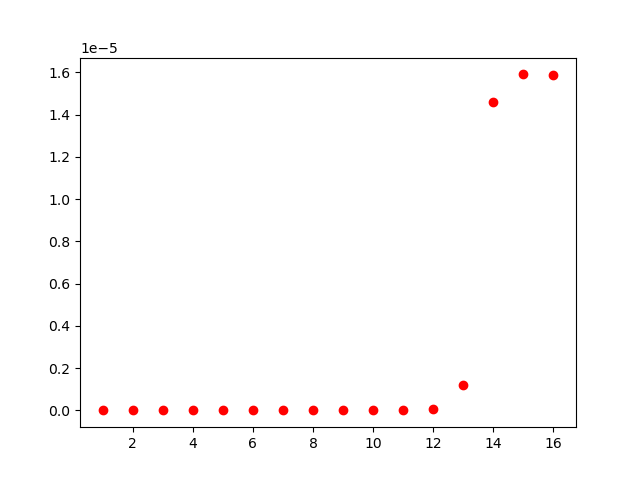

In [17]:
plt.scatter(np.linspace(1,16,16),(np.array([9.85806573e-20,2.51871046e-19,4.98827654e-19,1.11784980e-18,1.69641768e-15,9.09983687e-15,7.54001742e-14,3.08623446e-12,2.75465713e-10,2.14850940e-09,1.06487152e-08,8.27533813e-08,1.19713314e-06,1.46182232e-05,1.59075767e-05,1.58685127e-05])),color="red")
plt.show()

<IPython.core.display.Javascript object>


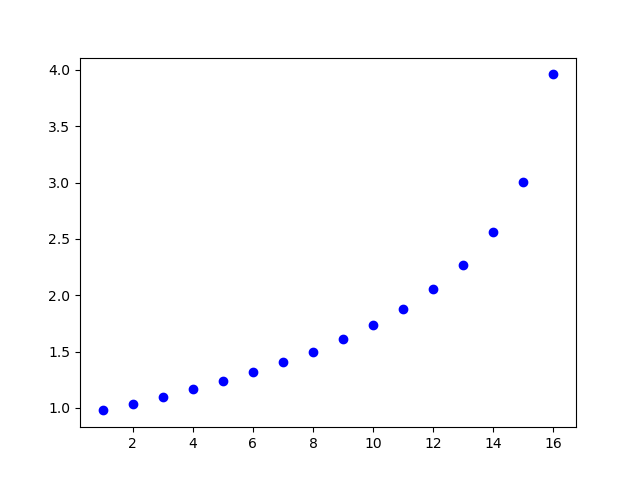

In [16]:
plt.scatter(np.linspace(1,16,16),np.log10(output[24]),color="blue")
plt.show()

In [17]:
#GOW

Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 1E-12/kB.value, 0.1, 1, 1

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])
print("Fraction of H:",output[25])
print("Fraction of H+:",output[26])
print(output[27])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6440222551639636 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.05684190505117 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 5.566380922073037 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.9264101351114045 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5642600052457708 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5637610157160782 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5803222516583414 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5557768

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5572484165873515 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.4522471289526112 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.3596443483373051 for species H+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.3586147238256887 for species H+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.3691722321599171 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.3560759280741933 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.31665270464483075 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.3196573811130726 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.31025246563221187 for s

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.30346616015738026 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.2747281645834925 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.2310824437535225 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.18830300425539015 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.14813894214784684 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.12054211233402334 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.14591414375394018 for species CHx
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.20872333917444208 for species CHx
setChemEquil: evolved from t = 83886070000000.0 to 167772150

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.09502739990656717 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.12791339804638802 for species CHx
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.1830161400138275 for species CHx
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.24759892189732224 for species CHx
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.4688320671326043 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 1.8370522187380365 for species HCO+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 135.36844096721802 for species H3+
setChemEquil: evolved from t = 1342177270000000.0 to 2684354550000000.0 sec, residual = 0.0001 for species O+
setChemEquil: abundances converged: {'H2': 0.

setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.1657018287222709 for species CHx
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.22176275718555294 for species CHx
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.29794881010583474 for species CHx
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.6815165862730406 for species HCO+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 6.150685601114724 for species OHx
setChemEquil: evolved from t = 1342177270000000.0 to 2684354550000000.0 sec, residual = 0.9848826006163642 for species CO
setChemEquil: evolved from t = 2684354550000000.0 to 5368709110000000.0 sec, residual = 0.0001 for species O+
setChemEquil: abundances converged: {'H2': 0.0023892951718953227, 'H+': 3.304852888803784e-05, 'H2+': 5.914933419470845e-13, 'H3+': 2.1482618394441528e-13, 'He+': 

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.2894327888935 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.27967583103935123 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.23164523810706328 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1868496016570662 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.12828852142060854 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.07012741178643023 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.06513687404076385 for species CHx
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.10484015400003122 for species CHx
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0

setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5589263536906668 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5551630218357082 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.4885965246014353 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.35840349552730166 for species H+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.35653009119672774 for species H+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.35285183592181946 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.34580711977012546 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.3576781729815729 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.30406368917113036 for spe

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 3755.700931904419 for species O+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.1902200659505573 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.0015918699895042243 for species H3+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.005506210418942059 for species H3+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.0001 for species HCO+
setChemEquil: abundances converged: {'H2': 0.014235863059270756, 'H+': 3.645060236486975e-05, 'H2+': 2.9468134107027175e-12, 'H3+': 8.15158505926725e-12, 'He+': 2.5303168040998814e-06, 'O+': 2.1832487998285864e-15, 'C+': 1.5887208913345877e-05, 'CO': 7.540017423686272e-14, 'HCO+': 6.639517653489163e-17, 'Si+': 1.699737668048151e-07, 'CHx': 5.735776955268398e-12, 'OHx': 3.737763112148643e-14}
setChemEquil: updated temperatures to Tg = 16

setChemEquil: evolved from t = 1342177270000000.0 to 2684354550000000.0 sec, residual = 0.10758918032325004 for species HCO+
setChemEquil: evolved from t = 2684354550000000.0 to 5368709110000000.0 sec, residual = 0.06477881350350145 for species HCO+
setChemEquil: evolved from t = 5368709110000000.0 to 1.073741823e+16 sec, residual = 0.010033261253906245 for species HCO+
setChemEquil: evolved from t = 1.073741823e+16 to 2.147483647e+16 sec, residual = 0.00025520135758005935 for species HCO+
setChemEquil: abundances converged: {'H2': 0.060236213621595085, 'H+': 2.9374583521238816e-05, 'H2+': 7.764938662458046e-12, 'H3+': 1.053022210586794e-10, 'He+': 1.0136616081926994e-06, 'O+': 9.75993165507515e-16, 'C+': 1.582613037830447e-05, 'CO': 3.086702122179021e-12, 'HCO+': 4.461929359803389e-15, 'Si+': 1.6996398878271883e-07, 'CHx': 2.716437535230857e-11, 'OHx': 2.139884330707075e-12}
setChemEquil: updated temperatures to Tg = 16.141928, Td = 10.150369, residual = 7.730898e-03
setChemEquil: evo

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.7810452285513184 for species CHx
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.027298069478033482 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.022910750027110294 for species CHx
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.007359466571613682 for species He+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.013037749186910252 for species He+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.019877941979868252 for species He+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.029809909678932156 for species He+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.02225256247547891 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.022215924147390265 for species He+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.01857925352942691 for species He+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.01613442241953611 for species He+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.024097203276910117 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.028917882842027565 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.02259940318736753 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.00798485678813421 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0005657406623391648 for species H+
setChemEquil: abundances converged: {'H2': 0.38825176673290845, 'H+

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.022048639931559366 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.012761063845765475 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0018933239219897091 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.00023895598808409968 for species H+
setChemEquil: abundances converged: {'H2': 0.4491568837986967, 'H+': 2.1934068053500017e-06, 'H2+': 6.758284565977983e-12, 'H3+': 1.703959742644949e-09, 'He+': 7.318563651847692e-08, 'O+': 4.612228461203016e-16, 'C+': 1.3960685984861106e-05, 'CO': 1.0650196769201883e-08, 'HCO+': 1.3445468288545933e-12, 'Si+': 1.6985525715669028e-07, 'CHx': 1.5289476312771158e-09, 'OHx': 2.6759998936447723e-10}
setChemEquil: updated temperatures to Tg = 13.276206, Td = 10.125403, residual = 1.244263e-02
setChemEquil: evolved from t = 0.0

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.00396559485592185 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.004326980547851855 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.0018889298047581882 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.00025337829860627714 for species CO
setChemEquil: abundances converged: {'H2': 0.4751916832997427, 'H+': 7.288804609497047e-07, 'H2+': 3.89773706899134e-12, 'H3+': 1.3579015087123194e-09, 'He+': 5.982908245880662e-08, 'O+': 5.471116123158136e-16, 'C+': 9.445707965186216e-06, 'CO': 8.275335381058929e-08, 'HCO+': 1.75254850991783e-12, 'Si+': 1.6960000675389347e-07, 'CHx': 1.918901441004849e-09, 'OHx': 3.435587056765591e-10}
setChemEquil: updated temperatures to Tg = 9.453398, Td = 10.112615, residual = 2.081397e-03
setChemEquil: evolved from t = 0.0 to 10000000

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.003591175695705884 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.004751289667720093 for species CHx
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.008383465160910597 for species CHx
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.012992837365589649 for species CHx
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.015351584363000548 for species CHx
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.010314281059587427 for species CHx
setChemEquil: evolved from t = 1342177270000000.0 to 2684354550000000.0 sec, residual = 0.002241416996086043 for species CHx
setChemEquil: evolved from t = 2684354550000000.0 to 5368709110000000.0 sec, residual = 6.0187484851259576e-05 for species CHx
setChemEquil: a

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.021221139894151753 for species O+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.03589142800625034 for species OHx
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.04456920739992021 for species OHx
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.03678868077413533 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.06983055503426949 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.08722373393204141 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.044718189544111775 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.014598473660792699 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.04314065877133766 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.08057757336320326 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.1054829333814935 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.045515627394484115 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.04095900194061608 for species CHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.038426734231829185 for species CHx
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.006866522232933825 for species CHx
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.005775578364453193 for species CHx
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 

setChemEquil: updated temperatures to Tg = 6.682471, Td = 10.043674, residual = 2.870526e-04
Temperature converged!
[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True] <class 'list'>
2222222222222222 <class 'str'>
[1.24318723e+38 1.24324874e+38 1.24332442e+38 1.24341897e+38
 1.24353925e+38 1.24369552e+38 1.24390368e+38 1.24418957e+38
 1.24459729e+38 1.24520736e+38 1.24617973e+38 1.24787039e+38
 1.25121028e+38 1.25932619e+38 1.28878402e+38 1.65700818e+38] 1025376.6647051942 solMass
2.9279348510714302e-30 8.706899382605528e+62
36.09057591452377 1.996668734630993e+21 15.967129705834552 10.147022841710424
DMR is: 0.09864750706770388
Mass of cloud: 1000000.0
Pressure of cloud: 7242.702976750924
Metallicity of cloud: 0.1
Radiation field of cloud in Habing units: 1
Redshift of cloud: 1
H2_lcii: 1.716613841475317e+35
Line Luminosity of CO(1-0): 2.5493234147103044e+33
Line Luminosity of CO(2-1): 1.3821455131411224e+34
Line Luminosity of CO(3-2): 1.47

/tmp/ipykernel_20640/3782414003.py:273: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density, fH, fHp,conv_str])


In [2]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 1E-12/kB.value, 1, 5, 1

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])
print("Fraction of H:",output[25])
print("Fraction of H+:",output[26])
print(output[27])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8085146124296434 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5177798915658631 for species H+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6506577791707845 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3.4424430112346402 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5721572246101831 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4867074140883395 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3606377249070717 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3569481

/home/ani_boi/miniconda3/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 4.990350808733847 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.5276787881444813 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.3254384416816376 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.22891925433617688 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.18052094064861124 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.1553982346116104 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1574974958264438 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.16511365360632257 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.1

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.791558e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.847097e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.711700e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14329.247613, Td = 22.152534, residual = 9.993021e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4813581072065346 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.37638315341551465 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.34482913197605725 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3143220854998079 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4904877743561493 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.6654193061917524 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.2735903753846487 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.054976179309484 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.647845e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.835161e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.680183e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8915.616613, Td = 22.152010, residual = 6.072077e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0005635483125880913 for species H2+
setChemEquil: abundances converged: {'H2': 2.6998687958459925e-06, 'H+': 0.01647828471962316, 'H2+': 6.787941555793686e-14, 'H3+': 3.787920627022001e-18, 'He+': 0.0001574322517187355, 'O+': 4.25305064721446e-06, 'C+': 0.00015998790804161087, 'CO': 3.5349540419215003e-19, 'HCO+': 8.075350628366062e-20, 'Si+': 1.6999809812253217e-06, 'CHx': 5.432630690130633e-19, 'OHx': 2.1650945432513545e-16}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.647828e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.835163e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.680166e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8915.613565, Td = 22.152010, residual = 3.418200e-07
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.812604132548994 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5944056727388088 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.65521585726324 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 26.401497726240596 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5755406254771358 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5015108683387459 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.595556e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.055570e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.666663e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14842.939755, Td = 22.084334, residual = 9.993263e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48273940486215483 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24083498917849155 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2678933878415083 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.29103144141176107 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.41791194799006404 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0280768629568722 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6079893455104066 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.121438379082852 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.613571e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.738576e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.639460e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.169263, Td = 22.082970, residual = 2.781639e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0970515624535957 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9729454675899405 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.5034701095693257 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 10.339765379846146 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.1030391075845642 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.035958197630337 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11117812327328258 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.39920727671058165 for species CO
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.230771e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.789336e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.858897e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13438.261955, Td = 22.084186, residual = 9.960434e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4259526213205683 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2226208892590914 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.21916559556612036 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2697800367252846 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4999735359987898 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9774947555957711 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.649532740470522 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26508348639753776 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.637690e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.943548e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.155953e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9349.400738, Td = 22.083733, residual = 4.373394e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0004367564352141251 for species H2+
setChemEquil: abundances converged: {'H2': 3.7465579419625992e-06, 'H+': 0.005637657453693825, 'H2+': 9.134901592260662e-14, 'H3+': 1.899092352009293e-17, 'He+': 0.0003551172268524501, 'O+': 1.4504260416319967e-06, 'C+': 0.0001599940037297629, 'CO': 9.065288468416548e-19, 'HCO+': 4.57539953096226e-19, 'Si+': 1.6999889899497708e-06, 'CHx': 8.949252703738083e-19, 'OHx': 4.59834820055422e-16}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.637657e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.155919e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.637657e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 9349.400107, Td = 22.083733, residual = 6.755131e-08
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8185972336670395 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5402941693529535 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.637250502114548 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5856057406676942 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8538635487311621 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5132328445999939 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.654411e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.701141e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.640600e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15570.493456, Td = 22.006327, residual = 9.993578e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48420812267713875 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2445131996070179 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1903940928464034 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2577746096692206 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0358996702885754 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8444539694976148 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9146750380330393 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.714488916075357 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.849384e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.414980e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.870749e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 37.600921, Td = 22.004606, residual = 4.130987e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9959391252814155 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9076831341933698 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 112.98301217109227 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9725592051754206 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4093040091674838 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23634069639679733 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16667042122186082 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.35349890865971023 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.924358e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.273418e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.701370e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13819.425426, Td = 22.006119, residual = 9.972791e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4734030957900017 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23310478436043436 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25803439576414133 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.28760049009917565 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4380235327527877 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0458556806931911 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.7188106990813825 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.25449083369702385 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.340557e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.926493e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.754684e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8585.862994, Td = 22.005493, residual = 6.095558e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009990930842644907 for species OHx
setChemEquil: abundances converged: {'H2': 5.081396719819041e-06, 'H+': 0.007340487770706313, 'H2+': 1.0416141065616639e-13, 'H3+': 2.3494205108398583e-17, 'He+': 0.00025054333591838804, 'O+': 1.88927892791486e-06, 'C+': 0.0001599905150146631, 'CO': 2.839990283030179e-18, 'HCO+': 8.795822078595076e-19, 'Si+': 1.699981759157399e-06, 'CHx': 1.3231114442659706e-18, 'OHx': 1.1026415167002268e-15}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.340488e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.754611e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.340488e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8585.852246, Td = 22.005493, residual = 1.251756e-06
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8273139476735003 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8113764451791181 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6387189381704017 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.593414082790838 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5724118999347181 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5307424613573103 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.617487e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.176200e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624364e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16243.891387, Td = 21.916207, residual = 9.993844e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4849630593054185 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2465652852841247 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15836046341443832 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.22185994517814356 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.30089301444931404 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6944813096151694 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6283103674434782 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.5159146055275166 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.404714e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.595191e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.406838e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 32.667062, Td = 21.914032, residual = 4.962560e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9996532737284889 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8971299532618747 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.521536920593904 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.583913965090831 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.615512294870636 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08856740646011152 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12399011758836231 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.23876318630284166 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.958389e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.813577e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.652100e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14471.262748, Td = 21.915948, residual = 9.977426e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47959933399584864 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23733817470979512 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2075225620918647 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.26547923754705927 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.4427124045735291 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8477676200256168 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.1443306502323383 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.230006720425159 for species O+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.295507e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.870312e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.325103e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.859722, Td = 21.914038, residual = 2.535081e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11986300692850049 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9436856889465746 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 8.361282613515954 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.683506315870085 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14.652678429639025 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 20.550728658502408 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1962177244954023 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 7.714357024909358 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.463209e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.833921e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.684213e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13653.176870, Td = 21.915842, residual = 9.958354e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.44181704724581106 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22656113255497778 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14005214875608474 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.22293387385258845 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.39644293477408743 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9428129399368537 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0130366208412926 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5365532872358756 for species O+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.320884e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.946633e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.769455e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7129.432237, Td = 21.914998, residual = 9.150441e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00119576873811722 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0023084181357380107 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.004536152610935318 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.008056855646568772 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.013432889515615276 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.01689245661240979 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.012851461438079137 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.032955947119243656 for species OHx
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.784757e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.960640e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.001425e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8444.774001, Td = 21.915178, residual = 1.557581e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005880212332484591 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.010155678655550338 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015906556107571745 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03385057314040285 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.01995635137519014 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.005592111975600278 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.031149671277637125 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.01253518985179447 for species HCO+
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.682627e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.988585e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.209783e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8325.415116, Td = 21.915161, residual = 1.433669e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CHx
setChemEquil: abundances converged: {'H2': 0.0004366367048212865, 'H+': 0.0002682626644543442, 'H2+': 1.023644923489537e-11, 'H3+': 1.0753270805934694e-12, 'He+': 0.0007797547346079178, 'O+': 6.860800076193185e-08, 'C+': 0.00015999701096292514, 'CO': 8.007881151727348e-15, 'HCO+': 7.985196664245026e-15, 'Si+': 1.6999939825285399e-06, 'CHx': 2.408190937245562e-16, 'OHx': 1.9265683257480437e-12}
setChemEquil: updated temperatures to Tg = 8325.415077, Td = 21.915161, residual = 4.735352e-09
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8403471121307674 for species OHx
setChemEquil: evolved from t = 1

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.755548e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.253109e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.610296e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16734.700705, Td = 21.810904, residual = 9.994024e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.484901884172131 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24673459648669815 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1592678718044116 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.19841056517151145 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2541987284371827 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5745575339412357 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.499645460955116 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.977733273780562 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.471054e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.528838e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.473405e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 30.658391, Td = 21.808149, residual = 5.448441e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 5098.025636516537 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2854491247457698 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.2186255503027565 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.3762803936556476 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 108.09888989127317 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0254399071540885 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8240123829030335 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16993188195558595 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.251314e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.179390e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.631890e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15021.810433, Td = 21.810582, residual = 9.979591e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48114381555668884 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23894121104290522 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14901970490679417 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23092199332531793 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2933842998717495 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9584122573499634 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7964690112888402 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6845114945609132 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.142662e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.785555e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.166386e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.419520, Td = 21.808151, residual = 3.800754e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9823244766474507 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.0004503825259266 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8873439257447436 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 15.872065118534273 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 5.584654938152449 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6896783547135186 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.535968789937838 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2473919213494109 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.184278e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.460954e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.637624e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14640.231227, Td = 21.810517, residual = 9.973075e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4766799696069346 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23663499671978017 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1558823981391555 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23534155043472316 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3051753820415508 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7054413604111947 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0884166153968082 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.0094933293304535 for species O+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.346933e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.865109e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.374241e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 46.118439, Td = 21.808154, residual = 3.164485e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9409583808543907 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9844323198539049 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8876661426129042 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 53.45911218031109 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08492234618801908 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.5984354533788383 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.36531298651067345 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.1766920044709286 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.489767e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.653370e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.642015e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14398.869185, Td = 21.810478, residual = 9.967971e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46993910567843156 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23447874625903353 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14910441551821074 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2303157584930008 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3132188657978152 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7258745284855026 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.06258976671724 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.7221402970827233 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.020566e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.897732e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.050905e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.790874, Td = 21.808157, residual = 2.717530e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.14376232056562332 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9577140078203205 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.00891109697049 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0565610993199184 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 6.877310752465248 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 19.17137375197205 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.354627596537189 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.922971951283715 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.811492e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.826758e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.646393e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14191.860614, Td = 21.810444, residual = 9.962802e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.45989880311470854 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2318515962176877 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13394706190305183 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.21854682936277747 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3204202291926348 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.744706716189077 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.046731964557158 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 13.921814001028968 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.101721e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.918758e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.436513e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 61.151122, Td = 21.808162, residual = 2.310785e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12743096838054835 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8939230810899844 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9812110157786731 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1561037139466883 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5799799231686107 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17373561584815223 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 76.80072907338523 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2694049390939015 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.242745e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.029317e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.652058e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13960.170777, Td = 21.810408, residual = 9.956196e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.44295469733914394 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2277939775313763 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.128423399524215 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.19790991173407502 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.32881337892598594 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7668710674950618 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8849213903129671 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9998042151539253 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.294402e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.936815e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.670825e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 76.029902, Td = 21.808174, residual = 1.826142e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1071845038410153 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26241815207483365 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9523296662495828 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 11.541711296990425 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7445823041018953 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16498463966131327 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7220007749112316 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.15050989382842284 for species OHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.050163e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.351719e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.662335e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13608.639700, Td = 21.810354, residual = 9.944131e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.40461226755751745 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2187711077099247 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12201096012581192 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16369818277702586 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3421205829687044 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7988264043946949 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9030502105495715 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.3649495887970544 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.331615e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.956415e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.784728e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 133.478400, Td = 21.808231, residual = 1.009539e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07021972223634076 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11690687335883387 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19060169765525803 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9238405430960616 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.8231092898679275 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 5278.114561784929 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19513814166889976 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3004614420425191 for species CO
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.114192e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.304996e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.700646e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 12633.430076, Td = 21.810209, residual = 9.894345e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.25888725289311 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.17620075180419037 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0977144261830899 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18206596841165634 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.37976805741922304 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8836732066137583 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.699993284530299 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17877123000929784 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.609256e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.983513e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.327977e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1495.828896, Td = 21.808611, residual = 7.445772e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008733083917721318 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.012896486174925448 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.019669185364213915 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.018068483390429657 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.03220306346619939 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0532634971689816 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.05276071617359124 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.031052163755690976 for species H2+
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.508852e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.180659e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.344707e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5809.706918, Td = 21.809161, residual = 7.425294e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02210498404363781 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04170817663129367 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07591677546185327 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1521800340499413 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.260236493893673 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12714948340591792 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.10392564386690495 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07669952923889256 for species CO
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.342661e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.752966e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.474261e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2718.185823, Td = 21.808764, residual = 1.137347e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04884278677555909 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0680812565973844 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08058312598151662 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11087600645442597 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.03837378527762869 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.02256158682805165 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.04736600889150977 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.06559135621534362 for species H2+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.300885e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.578716e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.706480e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4908.697564, Td = 21.809036, residual = 4.462511e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014908127513069358 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.027124978797033128 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04604864319963431 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07802123458957122 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09469455629230028 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.05937214604050389 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.13693751753558958 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.033989763737145795 for species O+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.531515e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.237994e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.673767e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 3610.061388, Td = 21.808870, residual = 3.597269e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014243456499013929 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02273073707518458 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03143573728505511 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.05169535606818054 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.025625851882302264 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.04836205547788919 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.03881015903070606 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.014296667228540727 for species HCO+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.524196e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.237381e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.666189e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 3611.403411, Td = 21.808870, residual = 3.716071e-04
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7715347924535794 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 3.1539181164906838 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6465621631666598 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6054423044813109 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5350177942916023 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5473426689924135 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.844506e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.037300e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.593106e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16861.166696, Td = 21.686186, residual = 9.994069e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48381572529788963 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24444571398755577 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15500835364048182 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3050846352747483 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.21527231616807607 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4826740969740102 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.575702683820265 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.872306820690168 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.727058e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.272808e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.729463e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 29.320801, Td = 21.682716, residual = 5.740582e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 77.28594645510093 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.31504697946117166 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 28.148706327302836 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.7912387881541814 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.095276893722396 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1454074734745605 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.30624876406584234 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2007763401295095 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.701324e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.198922e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.619992e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15250.155570, Td = 21.685792, residual = 9.980773e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4809102491590146 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23761496399758542 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13867062994882573 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.561803775552105 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2394802051547138 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.497820735996363 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.558716418017898 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.9357109233088923 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.458352e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.753939e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.480318e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 34.587265, Td = 21.682716, residual = 4.399182e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9930589606029105 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 13.297095761945213 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 82.62001208405616 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.542389238123791 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3301314529711946 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8521071665405617 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3445108380122057 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18963743949457101 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.602642e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.299555e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622803e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15008.438067, Td = 21.685738, residual = 9.976955e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4794706515996594 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23658537419925607 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1365917116588562 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5432988631977351 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24436815151082447 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5426999435486146 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4246466991158857 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.7220025820137836 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.784056e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.821351e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.807673e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 36.889496, Td = 21.682716, residual = 4.058486e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9848028266998708 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.0004198837038063 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8476118941743582 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 44.15364342801788 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07922497056862854 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 6.9541264447681055 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3481753380649628 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6798836914608187 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.016372e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.341063e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.623899e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14913.641964, Td = 21.685716, residual = 9.975265e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.478516678402769 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23611588194762556 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.135753220517432 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5352085003391438 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24638090812544977 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5443301700817289 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4295405786006143 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.6299956202168584 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.582399e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.841510e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.606794e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 37.983379, Td = 21.682717, residual = 3.916360e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9794839393738104 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.4250999278699212 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 12.753672284174499 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 11.586063724222347 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07939035372462255 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9910082157664761 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4.6056612248284035 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.27009783837014534 for species CO
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.217035e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.360321e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624399e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14870.532828, Td = 21.685707, residual = 9.974457e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47797911188488673 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23588461303457708 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13536530907937028 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5313857439972458 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.247314035725682 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5449289445885834 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.434694015009307 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.6119018310887805 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.499784e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.849768e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.524559e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 38.522244, Td = 21.682717, residual = 3.850246e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9765184160538232 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 172.9204813198656 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.2602511528288454 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 22.85382137886964 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 32.740884602424856 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3165629433699052 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.3880568921344298 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20484366676163712 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.316831e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.369704e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624641e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14849.721080, Td = 21.685702, residual = 9.974059e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47769295815735235 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23576838098285247 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13517632390762313 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5295092942452 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2477684954334305 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5451978145801375 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4402817420586542 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.7160416790772803 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.461742e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.853570e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.486706e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 38.792299, Td = 21.682717, residual = 3.818008e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9749459955176386 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 210.22262478973718 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 4.752209213051383 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.68744250425748 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.364449531748864 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5963041292788496 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3494867018292782 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20584987686943168 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.367078e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.374381e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624761e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14839.392914, Td = 21.685700, residual = 9.973859e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4775441034337303 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2357095182945379 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13508209494923262 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5285707370565584 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2479949876643821 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5452814746795287 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4476296612882806 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5232356888285246 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.443289e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.855415e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.468348e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 38.928794, Td = 21.682717, residual = 3.801932e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9741293568962828 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 205.52868755004752 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9778683637134805 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 722.4453668355143 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 34.582810126127534 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16473890559575066 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3495102686529452 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2014330574309524 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.392533e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.376738e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624822e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14834.198176, Td = 21.685699, residual = 9.973757e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47746746527704664 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23567960682236822 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13503458637652022 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5280968461891895 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2481091462786249 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5453550243277492 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.45008279705623 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.582173682639133 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.434112e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.856332e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.459219e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 38.998077, Td = 21.682717, residual = 3.793828e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9737092410961525 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 197.92677278381103 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.1953533073989466 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.3863071283463504 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 7.622770414370712 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5655854299072853 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.349543881884848 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20541352698144766 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.405469e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.377933e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624852e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14831.567832, Td = 21.685698, residual = 9.973706e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4774282026935742 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23566438227513953 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1350105009756225 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5278564320072954 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2481670115689978 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454353101823319 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4506260419048145 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.6357294791821766 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.429491e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.856794e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.454623e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.033317, Td = 21.682717, residual = 3.789720e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9734940896005175 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 193.5478896089414 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.6927528620636174 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 30.84602806985502 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07962001740696789 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9736424288664851 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.092308749624701 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20599022991702132 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.412052e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.378541e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624868e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14830.231584, Td = 21.685698, residual = 9.973680e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4774081380568167 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23565662749259297 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13499825759904072 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5277341796524522 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24819642366001227 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5453917833077759 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4503000106905373 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.4692639444687097 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.427151e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857028e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.452295e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.051260, Td = 21.682717, residual = 3.787632e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.973384161237891 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 191.2133371401016 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.3445521461244931 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1598061840700624 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07962585736359196 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7588323158645702 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.3048111165742 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.5052380465604633 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.415405e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.378850e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624876e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14829.551649, Td = 21.685698, residual = 9.973667e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47739789756991835 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23565267623224007 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13499202570006041 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5276719422172504 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24821139375241597 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5453981211037975 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4501144400977628 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5947227734961307 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.425961e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857147e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.451112e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.060406, Td = 21.682717, residual = 3.786569e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9733280534354763 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 189.9998891906531 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.6107520064881813 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 9.254284006162349 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.320214667579325 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5697965782217808 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34965742401597 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20576919483211942 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.417115e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.379008e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624880e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14829.205164, Td = 21.685698, residual = 9.973660e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47739267116916706 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2356506613474798 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1349888495032291 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5276402190236484 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2482190233370527 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454149305323552 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4501974710699401 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.590402277652072 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.425356e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857207e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.450510e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.065066, Td = 21.682717, residual = 3.786027e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732994247097309 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 189.3755862548859 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.433705391020203 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.869213971654652 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.0808517093571 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5575491019109624 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3496640900234269 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20572649307410806 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.417986e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.379088e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624882e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14829.028663, Td = 21.685698, residual = 9.973656e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4773900067181742 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2356496345896112 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13498723138920077 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.527624056906256 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2482229101824287 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.545454496541278 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4506265974518984 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.4642909583257584 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.425048e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857238e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.450203e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.067439, Td = 21.682717, residual = 3.785751e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732848328465394 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 189.05606126038737 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.352155298950337 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.179778074235437 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.267171294236652 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5598267555397904 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3496651480688233 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20573609012012706 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.418429e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.379129e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624883e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14828.938804, Td = 21.685698, residual = 9.973655e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47738864967697037 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23564911176255843 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13498640755429792 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5276158280787162 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24822488908927265 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454077384584328 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4499938621003294 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.550401762333572 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.424891e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857254e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.450047e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.068648, Td = 21.682717, residual = 3.785611e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732773993260836 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.89299017994804 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.3125815696090526 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.328828065238596 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.319570146057393 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5618238230405559 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3496657864825019 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20574453504150636 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.418655e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.379150e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.624884e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14828.893008, Td = 21.685698, residual = 9.973654e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47738795793298305 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23564884528427066 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1349859876854339 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5276116341518919 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24822589763990388 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454035570682914 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.449910218176477 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.538855746465349 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.424811e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857262e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.449967e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.069267, Td = 21.682717, residual = 3.785539e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732736060240105 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.80962577080325 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.2928684171767695 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.403584043990841 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.334759398548242 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5630954961934336 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34966613573287564 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20574988112993853 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.418771e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.379160e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.418771e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14828.869560, Td = 21.685698, residual = 9.973653e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4773876037147562 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23564870883770395 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1349857727047401 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5276094868050665 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2482264140353223 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454215582932249 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4501516198110496 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.567044069654584 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.424770e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857266e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.449927e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.069580, Td = 21.682717, residual = 3.785503e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732716696410794 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.76715279669452 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.2829207550310042 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.439801520636666 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.339440690237678 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5637658844198945 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34966632709182455 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20575272677000922 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.418830e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.379166e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.418830e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14828.857709, Td = 21.685698, residual = 9.973653e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4773874246755172 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23564863987292284 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13498566404825496 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5276084014572375 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24822667503423235 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454226582709047 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4501601313079844 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.56665755584399 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.424749e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857268e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.449906e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.069743, Td = 21.682717, residual = 3.785484e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732706844168801 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.745403894402 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.2779003212517375 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.4596815527175835 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.340996070028233 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5641672980094432 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34966641795811215 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2057544308311965 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.418860e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.379168e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.418860e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14828.851555, Td = 21.685698, residual = 9.973653e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.477387331703089 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.235648604061088 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1349856076256114 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5276078379028923 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24822681056360585 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454332546014342 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4502963864631453 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.58739923808181 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.424738e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857269e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.449895e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.069826, Td = 21.682717, residual = 3.785474e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732701751196253 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.73423393796622 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.2753017480993076 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.468674774884932 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.341605086928746 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5643446054170546 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34966646893726416 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2057551827567614 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.418875e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.379170e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.418875e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14828.848417, Td = 21.685698, residual = 9.973653e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47738728430437305 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23564858580381842 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13498557886122964 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5276075505714966 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24822687965785928 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454181779228426 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4500991580286544 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.560250167171736 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.424733e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.449890e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.424733e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 39.069869, Td = 21.682717, residual = 3.785469e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732699132914006 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.72842807653893 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.27397588904393 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.472754816648683 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.341848409188293 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5644226910301604 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34966649167679176 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20575547374005754 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.418884e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.379171e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.418884e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14828.846761, Td = 21.685698, residual = 9.973653e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47738725927858205 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23564857616430746 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1349855636738535 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.527607398859465 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2482269161381876 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454206795462013 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.450131744554771 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5642413030682083 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.424730e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857270e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.449887e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.069892, Td = 21.682717, residual = 3.785467e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.973269776201458 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.72543215246804 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.27327534820436 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.47623106587693 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.341967099810168 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.564500494475868 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34966650942350563 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20575583042214296 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.418888e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.418888e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14828.845916, Td = 21.685698, residual = 9.973653e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47738724651997666 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23564857124988536 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13498555593102457 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5276073215303703 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24822693473662039 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454444394532694 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4504402201885913 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.468977721748139 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.424728e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.449886e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.424728e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 39.069903, Td = 21.682717, residual = 3.785465e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732697059875467 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.7238764954324 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.2729217474646677 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.478599399895668 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.342020772375456 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5645566105649229 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3496665081885244 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20575600057896892 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.418890e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.418890e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14828.845478, Td = 21.685698, residual = 9.973653e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47738723989240717 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23564856869707462 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13498555190927541 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5276072813487542 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2482269443977494 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454341151508517 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.450311208603186 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5974942927114264 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.449885e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 39.069907, Td = 21.682717, residual = 3.785465e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.973269672669408 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.72316378591404 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.272757982152505 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.478292909386174 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.342036045826179 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5645441684727828 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3496665168050974 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20575594836755995 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.418891e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.418891e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14828.845329, Td = 21.685698, residual = 9.973653e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47738723764650337 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23564856783199717 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13498555054628403 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.527607267752132 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24822694767130016 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5454341213197607 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4503073051756457 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5916056416587097 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.424727e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.424727e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 39.069911, Td = 21.682717, residual = 3.785464e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732696575840406 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.7228211039814 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.2726742412485454 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.478406110645465 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.342058256380408 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5645453930813268 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34966651145271177 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2057559824689228 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.449884e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 39.069911, Td = 21.682717, residual = 3.785464e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9732696481340496 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 188.7226309870334 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.272630364555541 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.479216102651671 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.342056084298513 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5645662254922845 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3496665236734213 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2057560835367247 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.1608821278957873 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.36061239088426045 for species OHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.38272280607073883 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3894494409264525 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.37079220544485214 for species HCO+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.32263190049797486 for species HCO+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.2717701057808346 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.2344024089282989 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 838860

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.684633e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.818823e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.565683e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16101.478426, Td = 21.535951, residual = 9.993789e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4809336878801649 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23756058604281471 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16919345154641674 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18880496162517646 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3327920124258815 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3963259322522492 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9607721860125724 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5060110252299967 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.427006e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.157094e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.446656e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 28.759065, Td = 21.531759, residual = 5.588749e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 403.9819921976893 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.047095152711073 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.2210277537860974 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1480348145454173 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10450965298297354 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1384824652840997 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 5.384575561122712 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6117788982199288 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.828560e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.407304e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.608901e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14636.989501, Td = 21.535491, residual = 9.980352e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47891879823183214 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23258223476228945 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12664771935690655 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13032537064726024 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9135718028775006 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4312158029223112 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.026807764668428 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.8063770943251947 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.367866e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.905996e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.636894e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 38.081163, Td = 21.531762, residual = 3.833630e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9622369904282089 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2229.340981999962 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 5.19779753653364 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.820214574065159 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 21.64989252783396 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7692466277748496 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.48528126624283696 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6930438737194793 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.564542e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.326402e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.614702e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14255.060395, Td = 21.535379, residual = 9.973286e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47651589841473596 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23124999115066358 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12397898270798824 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1364024035145971 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0213116404993743 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.443670617725914 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0755320218424735 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.7850322897933406 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.042759e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.939200e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.361229e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 43.831968, Td = 21.531766, residual = 3.242206e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8979452042153215 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9712380595261644 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.945376063660588 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3.570943789054572 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3258977513709659 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 35.03237753519131 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3414027500969208 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.647672472918017 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.047236e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.837202e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.617231e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14059.170233, Td = 21.535322, residual = 9.968823e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47345698377533274 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23026257149401752 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12252544610038141 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13749093235754872 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0450968134180423 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4505656691987361 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1264981021251228 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.65446707245008 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.868659e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.950913e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.218427e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 47.675542, Td = 21.531770, residual = 2.938927e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8444409064328818 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.947519517393845 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 15.349235818221288 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.8049779765626806 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13912076999878653 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.977667638769458 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34344463333396225 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.656224557333567 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.380608e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.160139e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.618663e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13940.107896, Td = 21.535288, residual = 9.965800e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47057857045443696 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22948731955001878 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12158710261548189 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1368528626863157 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0603551064814125 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4549110098329827 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1362033792300812 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.6757150596984736 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.278904e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.956792e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.649733e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 50.343712, Td = 21.531773, residual = 2.758987e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48755224018897514 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9253244481379642 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 13.332882541155202 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1952.6214553134516 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.828266026124185 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1637728896344599 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3444772183065363 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5763069203231632 for species OHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.616449e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.376765e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.619567e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13862.057161, Td = 21.535266, residual = 9.963682e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4681716697962067 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22888794238612764 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12094293161338987 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1357700078321985 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0706895523320679 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4578193000491573 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.143947456442683 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.6399917286530172 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.934659e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.960221e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.320103e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.215129, Td = 21.531776, residual = 2.644797e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4875308036903274 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9071877327353818 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9718626765228139 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9928314862747398 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7878605999084911 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16438120249481414 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3703118628391172 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5594724706125267 for species OHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.783780e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.525318e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.620165e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13809.305988, Td = 21.535251, residual = 9.962188e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4662852152519661 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22843655057936108 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12049274892765116 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13471466778391716 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.077822933193941 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.45998775507862 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1365125883619833 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.4792754452761785 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.719002e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.962369e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.114675e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.541272, Td = 21.531777, residual = 2.569189e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48751343585856155 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8934063008341089 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9729039678708237 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9717478568453559 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.647488933854046 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 5.999685978263172 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.343074079319148 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.548342465439714 for species OHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.903223e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.628994e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.620573e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13772.841709, Td = 21.535241, residual = 9.961125e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46485138708996954 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22810107825611603 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12017404526782416 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13382821416570834 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0828237826708222 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4613839851528143 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1400395226032725 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.4746206607984047 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.577384e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.963779e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.980289e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 54.486420, Td = 21.531779, residual = 2.517757e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874999404282033 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8832391032793128 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.969997455802388 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.988978563965623 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.325966952893574 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9.337722577408464 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 12.500262016834434 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5369818673261675 for species OHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.988758e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.702108e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.620856e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13747.292922, Td = 21.535234, residual = 9.960366e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46378136681152704 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22785409429485592 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11994691717701655 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13313011714975842 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0863615944762532 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.46236803695024187 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1425965678317627 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5178435222355193 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.481615e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.964732e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.889666e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.162232, Td = 21.531780, residual = 2.482157e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874897163893661 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8758600307470868 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9677855297973619 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9985225518292372 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8962937366264588 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16472067378481547 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 177.5817281407989 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5337823158088462 for species OHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.050115e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.754002e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621054e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13729.240520, Td = 21.535228, residual = 9.959821e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46299213784463633 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2276734800503153 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11978447500961298 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13259863767899405 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.088878147074532 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4630661747152396 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1444642857986937 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5038104727815718 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.415604e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.965389e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.827326e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.646431, Td = 21.531780, residual = 2.457228e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48748209602004033 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.870527376175204 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9661327868179068 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.3800073632874574 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3599019539537768 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20052235180995037 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 47.35315105019216 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5288252336981734 for species OHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.094171e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.790988e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621195e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13716.414272, Td = 21.535225, residual = 9.959431e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46241448194167656 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22754202653985112 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11966805626240573 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13220186555208513 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.090674620502461 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.46356360347681047 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1458323115726925 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5404847207373273 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.369520e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.965847e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.783868e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.993744, Td = 21.531781, residual = 2.439633e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48747647748121614 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8666826938944114 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9649118802955643 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.212778941765344 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 6.95217964164982 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1649689220162016 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 12.360712104574525 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5254429904546347 for species OHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.125820e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.817422e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621295e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13707.268013, Td = 21.535222, residual = 9.959150e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4619939271495278 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22744668466717466 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11958452465270031 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.131909268063374 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0919598993242792 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4639190192398184 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1468329631338277 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.546976726377687 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.337064e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966170e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.753295e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.243072, Td = 21.531781, residual = 2.427148e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48747236554788875 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8639135966237463 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9640170510461841 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0000774221471573 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 73.11738199154541 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16892287389903582 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34303573692838674 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9868965471244604 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.148565e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.836346e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621366e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13700.730010, Td = 21.535220, residual = 9.958949e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46168885212645583 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22737770258251344 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11952454776747767 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1316951822415906 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0928808358634257 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4641734370777133 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1475605488713607 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.4463098870424287 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.314069e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966399e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.731650e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.422134, Td = 21.531781, residual = 2.418254e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874693718352473 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8619203415345111 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9633648667210044 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7397489704984842 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13013496107383526 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16512905214572315 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 90.37582969665826 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5627692199885634 for species OHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.164911e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.849912e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621417e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13696.048639, Td = 21.535219, residual = 9.958804e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46146812880176413 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22732788359964318 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11948146607340882 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13153938025915968 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0935413826408542 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4643557883859084 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.148088021192803 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.462703746135254 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.297708e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966562e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.716258e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.550776, Td = 21.531782, residual = 2.411903e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874672001697107 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8604860376953478 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9628913941471758 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9642623439801365 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.6692368387219296 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16506677518840984 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 66.79361694687793 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5165585527638092 for species OHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.176661e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.859645e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621454e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13692.692745, Td = 21.535218, residual = 9.958700e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46130872220510233 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22729194990540835 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11945051170941179 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13142640234793046 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.094015470663293 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.46448660202182634 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.148469613492919 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.3723498860306296 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.286033e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966678e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.705279e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.643213, Td = 21.531782, residual = 2.407358e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48746562888081835 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8594542018678106 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9625486225244766 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9868897995077048 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.3155741936770695 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16511964126949796 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 11.151868785982895 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5162694804614361 for species OHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.185107e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.866631e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621480e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13690.285017, Td = 21.535218, residual = 9.958625e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46119374945833613 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22726605562497915 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1194282667811476 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13134468532240273 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0943558923541086 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4645805036699955 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1487452255745412 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.3259467536820337 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.277683e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966761e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.697430e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.709645, Td = 21.531782, residual = 2.404102e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48746449404709624 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8587120186140378 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9623009605343957 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9886446404144646 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.2286933034210994 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1651096603462654 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5274859928851823 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5190821580802814 for species OHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.191179e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.871649e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621499e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13688.556555, Td = 21.535217, residual = 9.958571e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4611109001701922 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22724740804265364 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11941227876955662 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13128568226449877 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0946004421548774 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.464647938442035 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.148944044096825 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.273322502824831 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.271703e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966820e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.691809e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.757393, Td = 21.531782, residual = 2.401766e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874636755006957 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.858178242392059 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9621222710292847 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9869606766963606 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.2116125744769737 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0253024663134243 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 347.52816921440984 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6865436308389807 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.195544e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.875254e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621512e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13687.315211, Td = 21.535217, residual = 9.958533e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4610512383240797 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22723398550954765 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11940078681922184 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13124313246445318 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.094776145373575 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4646963812605205 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1490873347032098 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.4374516836520352 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.267416e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966863e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.687780e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.791714, Td = 21.531782, residual = 2.400090e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48746308563815455 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8577943975642752 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9619934760155027 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9849527883650876 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3788049669494029 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3087394839440111 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 353.96765080714744 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5554941514562821 for species OHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.198682e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.877844e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621522e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13686.423442, Td = 21.535216, residual = 9.958505e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4610082945488114 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2272243272685589 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11939252610050854 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13121247480590115 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.094902400478114 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4647311886060128 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1491905347305393 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.4241289488260347 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.264340e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966893e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.684889e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.816385, Td = 21.531782, residual = 2.398887e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48746266085348067 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8575183837433541 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9619007110878489 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9857341136431341 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.487973283573406 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0390894799275794 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 269.39743316558133 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.9396361839310567 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.200938e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.879705e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621529e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13685.782670, Td = 21.535216, residual = 9.958485e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46097739467390986 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22721737935504438 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11938658784531964 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13119039943686617 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0949931258420293 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.46475620244894955 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.149264824674347 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.425783953086809 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.262131e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966915e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.682814e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.834120, Td = 21.531782, residual = 2.398022e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874623550966425 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8573199255503273 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9618339324636859 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9875264294420241 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.8951230712664158 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0600068611449431 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3429955699589107 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.169454546589925 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.202560e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.881043e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621534e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13685.322193, Td = 21.535216, residual = 9.958471e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46095516694618077 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.227212382220908 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11938231911221786 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13117451141576175 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.095058365098502 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.46477417985692493 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.149318281965281 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.427005930702071 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.260545e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966931e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.681323e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.846869, Td = 21.531782, residual = 2.397401e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874621350911216 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8571772320621603 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9617858780716493 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9886156605258409 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.86643971099855 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0690954677126336 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34297318123222587 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.3041447292869703 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.203725e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.882005e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621538e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13684.991222, Td = 21.535216, residual = 9.958460e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.460939179142126 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2272087883428694 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11937925024011431 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13116307938155902 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0951052567490618 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4647871021252252 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1493567415695134 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.427895666337124 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.259405e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966943e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.680253e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.856035, Td = 21.531782, residual = 2.396955e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874619768196423 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8570746405725793 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9617513060468357 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9893481108467467 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.818861117601732 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0756832790621655 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 68.37493478709749 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5529282753218943 for species OHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.204564e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.882696e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621540e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13684.753326, Td = 21.535216, residual = 9.958453e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46092768144575513 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22720620401019442 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.119377044029355 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13115485581273545 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0951389559983817 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.46479639088670077 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1493844042372285 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.4285393226866185 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.258587e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966951e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.679483e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.862624, Td = 21.531782, residual = 2.396634e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48746186298319183 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8570008824985902 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9617264391650758 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9898497188199793 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.775953835897807 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0804412281761284 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 61.72115679968603 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5536310040016448 for species OHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.205166e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.883193e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621542e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13684.582322, Td = 21.535216, residual = 9.958448e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4609194135814716 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2272043457589782 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11937545797169002 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13114894121796217 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.095163192470761 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.46480306810742666 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1494042992242863 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.429003701201636 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.257998e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966957e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.678931e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.867363, Td = 21.531782, residual = 2.396404e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48746178110644767 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8569478395985994 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9617085521509299 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9901979169498535 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.7419271765758637 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.102903057810046 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 57.987637904401474 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5522730328332102 for species OHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.205600e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.883550e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621543e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13684.459336, Td = 21.535216, residual = 9.958444e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4609134657956919 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2272030090177286 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11937431719264768 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13114468575963156 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.095180610948264 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4648078704319951 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.149418612301996 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.429338266666187 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.257575e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.966961e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.678533e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.870768, Td = 21.531782, residual = 2.396238e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4874617222193971 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8569097004416879 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9616956889754873 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9904419415800823 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.7161955906401203 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.1195318274610027 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 55.92660305005332 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5525937403154457 for species OHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.205911e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.883807e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621544e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13684.370984, Td = 21.535216, residual = 9.958441e-01
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000211438705525 for species C+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6870829260771536 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 32.89489484054012 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 58.0881062964515 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5662772127372384 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5832974740053319 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4803782187398866 for 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.661775e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.989435e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.511038e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11801.333397, Td = 21.350340, residual = 9.991526e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4754194505480439 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22407579295520386 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20491062854538566 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18127687268874615 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2681811850940896 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3172653120717235 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7351470514492229 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.655812179138565 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.996564e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.994875e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.136262e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 67.634689, Td = 21.346664, residual = 1.734864e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48510320896742054 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.399130753235011 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.7622954045659385 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3.914227778762842 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9843801987052839 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1963851740648821 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6311.807807095772 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.691209417505247 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.538370e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.896144e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.615096e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8845.919465, Td = 21.349296, residual = 9.923541e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4431684177950984 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23770159906008614 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13004106537667837 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5647448805733752 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5313919481563918 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3614443846544828 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8508974976797523 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.004491472146027 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.677238e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.991098e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.981049e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 75.688126, Td = 21.346689, residual = 1.158733e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48345259234025384 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.35393547657215296 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3518839623333647 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.40769823861906296 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8647298684917272 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19317828926393754 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.15628390923537 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7764619927205914 for species OHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.863851e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.163004e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.616997e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8611.467720, Td = 21.349219, residual = 9.912108e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4297298397699164 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23551814201428967 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13468729843561356 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5806811419277755 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1917423955970115 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3633270839220384 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1840267053351471 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.944964890017811 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.621143e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.989278e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.774248e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 76.248320, Td = 21.346691, residual = 1.119398e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4832613034954075 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.35146940065896604 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3462506518461621 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3975345938161913 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8467141830434042 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.18055881711841737 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 26.545812316760692 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7727582672082163 for species OHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.886315e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.181043e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.617116e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8595.684754, Td = 21.349214, residual = 9.911295e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.42874408498795336 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23537061844857 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13500699506237512 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5817409502201345 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1718624535449278 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.36356731685056487 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18338158120725834 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.22043416562105933 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.620107e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.989137e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.759532e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 76.288530, Td = 21.346691, residual = 1.116734e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48324780698014713 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.35129341698860395 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.345862752156068 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.39669558228796 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8455316646136206 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17992313973861362 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 26.46738488795091 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7715636901762108 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.887927e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.182335e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.617125e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8594.554343, Td = 21.349213, residual = 9.911236e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.428673115709474 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23536004973836888 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1350299270953006 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5818167924214512 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1704516957871078 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.36358450158301303 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1833352229776818 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.22039941700347754 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.620046e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.989127e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.758474e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 76.291424, Td = 21.346691, residual = 1.116543e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48324683712322747 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3512807587443836 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3458349150471438 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3966347709364906 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8454457567694316 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17987825772542543 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 26.460402297157206 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7714777572920308 for species OHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.888043e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.182428e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.617126e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8594.473015, Td = 21.349213, residual = 9.911232e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4286680077845717 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23535928934239025 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13503157712892988 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.581822248603133 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.170350265102164 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.36358573785012505 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18333189697985797 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2203969104450031 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.620041e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.989126e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.758398e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 76.291632, Td = 21.346691, residual = 1.116529e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48324676732951244 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.35127984776317556 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3458329120983381 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.39663039213338425 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8454395724225022 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17987503225344836 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 26.462436413747625 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7714712170028766 for species OHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.888051e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.182435e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.888051e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8594.467161, Td = 21.349213, residual = 9.911232e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4286676401624855 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2353592346190665 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13503169590697017 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5818226413495708 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1703429641858207 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.36358582682205554 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1833316341950525 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.22039674332372639 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.758392e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 76.291647, Td = 21.346691, residual = 1.116528e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4832467623057699 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3512797821851914 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3458327672021482 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.39663007722501986 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8454391297737721 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17987480048767468 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 26.46169877113898 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7714708681684725 for species OHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.888052e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.888052e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8594.466740, Td = 21.349213, residual = 9.911232e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4286676136987836 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23535923067964903 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1350317044566114 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5818226696198512 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.170342438663051 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.363585833227307 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18333163086170345 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.22039672242823127 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.182436e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8594.466709, Td = 21.349213, residual = 9.911232e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4286676117938326 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23535923039679896 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13503170509365203 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5818226717158805 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1703423996555526 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3635858336899038 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1833316161445251 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.22039672894564588 for species HCO+
setChemEquil: evolved from t = 25500000

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.11075535648966406 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.05784441160868192 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.06081461216204376 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.12789105901279663 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.2421642067949803 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 1.0360348844443683 for species CHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 7.095914465560844 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 173.48009824821582 for species H3+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.2

setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.04718583778678109 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.002022911284799145 for species HCO+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0001 for species CHx
setChemEquil: abundances converged: {'H2': 0.0004956063719000019, 'H+': 9.620041417901805e-05, 'H2+': 6.2521694698868635e-12, 'H3+': 1.164900779327047e-12, 'He+': 0.0005179248547947337, 'O+': 2.460886417308874e-08, 'C+': 0.00015998926968583739, 'CO': 1.0162415094539606e-13, 'HCO+': 3.369461955932358e-14, 'Si+': 1.6999721005775255e-06, 'CHx': 3.852380378461603e-16, 'OHx': 5.175717360869053e-12}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.758391e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 76.291649, Td = 21.346691, residual = 1.116528e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.483246761861024 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3512797719801619 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.34583274698704414 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.396630006956214 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8454390788605625 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17987476893773913 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 26.461739712372683 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7714707900361064 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.36429841407558294 for species OHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.446657764986676 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.4924126552516126 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.5108424682471427 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.9355671810891837 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.4094930229198004 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.25159252376859464 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.2373018430781656 for species CHx
setChemEquil: evolved from t = 41943030000000.0 to 838860700

setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.01084799470015474 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 4.8324639730701335e-05 for species O+
setChemEquil: abundances converged: {'H2': 0.4740876571893531, 'H+': 2.8880515572374296e-07, 'H2+': 1.7433737035946768e-10, 'H3+': 1.2578702763660244e-08, 'He+': 5.745635459913564e-07, 'O+': 3.1242880556422812e-12, 'C+': 0.00015913745708822535, 'CO': 1.1052623487349932e-09, 'HCO+': 6.741993898521041e-12, 'Si+': 1.6989768387383739e-06, 'CHx': 2.768183292224668e-09, 'OHx': 8.511411402247367e-10}
setChemEquil: updated temperatures to Tg = 8594.466706, Td = 21.349213, residual = 9.911232e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.42866761163876965 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23535923037518558 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.11075535651937785 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.05784442744530649 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.0608146119937788 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.1278910587556108 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.24216420630434843 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.4211904553545306 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 7.096774431286821 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 4.583823262941125 for species H3+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 23.298

setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.17788189247748454 for species HCO+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.04717582395817743 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.002022353234993446 for species HCO+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0001 for species CHx
setChemEquil: abundances converged: {'H2': 0.0004956063707682777, 'H+': 9.620040952338266e-05, 'H2+': 6.252169729310586e-12, 'H3+': 1.1649007591495448e-12, 'He+': 0.0005179249039458287, 'O+': 2.4608862982150748e-08, 'C+': 0.00015998926968536543, 'CO': 1.016241384194172e-13, 'HCO+': 3.369461383289171e-14, 'Si+': 1.6999721005760055e-06, 'CHx': 3.852380367948079e-16, 'OHx': 5.175716777454904e-12}
setChemEquil: updated temperatures to Tg = 76.291648, Td = 21.346691, residual = 1.116528e+02
setChemEquil: evolved from t =

setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.33552514633358266 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.5177680424762072 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 8.30008511951403 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.7225537203295012 for species H3+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.32975712752872766 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.36429841582713673 for species OHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.44665776601413965 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.49241265589943184 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.51

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.23730188360426763 for species CHx
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.3346909092232584 for species O+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.19200541932323922 for species O+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.01084799355424515 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 4.8324669606580883e-05 for species O+
setChemEquil: abundances converged: {'H2': 0.47408765719051266, 'H+': 2.8880515569512633e-07, 'H2+': 1.743373703520664e-10, 'H3+': 1.257870276252689e-08, 'He+': 5.745635459764246e-07, 'O+': 3.1242880544475634e-12, 'C+': 0.00015913745708811953, 'CO': 1.105262348664342e-09, 'HCO+': 6.7419938972215705e-12, 'Si+': 1.6989768387382792e-06, 'CHx': 2.76818329262807e-09, 'OHx': 8.511411400755431e-10}
se

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.11075535652795732 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.05784442114469179 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.060814621931581714 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.12789105721989114 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.24216420639467007 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.42119090720357977 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 7.0970752731104785 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 4.576338746582209 for species H3+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 2

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.18072431496346453 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.21536852181536958 for species HCO+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.1687247838296313 for species HCO+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.04719499454912457 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.002023190360188165 for species HCO+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0001 for species CHx
setChemEquil: abundances converged: {'H2': 0.0004956063864825609, 'H+': 9.62004142090425e-05, 'H2+': 6.252169632966929e-12, 'H3+': 1.1649008475105308e-12, 'He+': 0.000517924851284323, 'O+': 2.460886418031914e-08, 'C+': 0.0001599892696858538, 'CO': 1.0162415748922357e-13, 'HCO+': 3

setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.3355251789204692 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.5175890641250296 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 8.300638170747629 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.7223687622178123 for species H3+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.3297570917144452 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.36429841564683196 for species OHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.4466577649875473 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.4924126551658662 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.51084

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.23730184271732802 for species CHx
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.33469096213839133 for species O+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.19200474259396882 for species O+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.010848020344190967 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 4.832469901794312e-05 for species O+
setChemEquil: abundances converged: {'H2': 0.4740876569962175, 'H+': 2.8880516053610507e-07, 'H2+': 1.7433737160271296e-10, 'H3+': 1.257870295602021e-08, 'He+': 5.745635484647103e-07, 'O+': 3.1242882590560937e-12, 'C+': 0.00015913745710618543, 'CO': 1.1052623609105488e-09, 'HCO+': 6.741994120293677e-12, 'Si+': 1.6989768387543512e-06, 'CHx': 2.768183223677982e-09, 'OHx': 8.511411656803247e-10}


setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.11075535647012147 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.05784441555891773 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.0608146120222145 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.12789105880036877 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.24216420630838287 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.4211901875694125 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 7.097051536388353 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 3.9705708411062774 for species H3+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.21

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.016243785642490516 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.00522853869009654 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.00030391183735611893 for species H+
setChemEquil: abundances converged: {'H2': 0.4950275686407222, 'H+': 1.6622698758601122e-08, 'H2+': 5.4265661295404853e-11, 'H3+': 1.55595380087093e-09, 'He+': 5.606939702724787e-07, 'O+': 1.8322640678806447e-15, 'C+': 0.00013409170385631327, 'CO': 6.241808713721522e-09, 'HCO+': 7.139168348663621e-13, 'Si+': 1.6915025537000449e-06, 'CHx': 2.3037882002593026e-08, 'OHx': 1.286114255632924e-10}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.662270e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.944818e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.363621e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 404.282186, Td = 21.114582, residual = 9.752648e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4385967360100995 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 9.780555596500095 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.2694901190230716 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18051213275109546 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.816800113850264 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2443602220470582 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5341538840351139 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.702674706479719 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.552163e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.320065e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.627995e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 207.599289, Td = 21.114418, residual = 9.474160e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5094169279126783 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7079489818256106 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.39240281877996297 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4308336110814921 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1752365861337719 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 32.21482189395209 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.032402193127840206 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.042143337796741065 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.727121e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.274415e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622455e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 208.698938, Td = 21.114420, residual = 5.269067e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.002308347768339325 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3612434777710356 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 7.83208077544133 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.218524558029357 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0901314720524544 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.00045054830416835223 for species CHx
setChemEquil: abundances converged: {'H2': 0.47362780096694357, 'H+': 3.7271653965626467e-07, 'H2+': 2.1101338214479115e-10, 'H3+': 2.643873384578656e-08, 'He+': 6.163705799321592e-07, 'O+': 3.018734779492759e-11, 'C+': 0.000159530932450308, 'CO': 4.7011524788822

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.727165e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.274394e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622461e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 208.697978, Td = 21.114420, residual = 4.600072e-06
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 17.70485884425463 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7303443834221401 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5436159685540194 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6188809940984923 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5768396682034407 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5224330110351515 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.370452e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.381413e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.068458e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 207.199918, Td = 20.813890, residual = 9.517374e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6698782619130161 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.4868546160188485 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.6027823914673065 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.582476999417874 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1475332822302814 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 5.687063980975396 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3105466883899577 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6536866466076031 for species O+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.696848e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.732209e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.611703e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 81.973275, Td = 20.813530, residual = 1.527652e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.2057224295246844 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.1354236805695295 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.44573224417403834 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08127279159231571 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 8.365527822732625 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 182.36748476557838 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.07854988259339102 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17560818516874543 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.777646e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.712245e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.581397e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 83.637167, Td = 20.813534, residual = 1.989417e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.24822751582503344 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 7.778112683991095 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.741210236396007 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23189834260640196 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0016507423907372587 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0432314758509893 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1448581384917078 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 14.611424041629943 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.856213e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.711647e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.582411e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 83.579856, Td = 20.813534, residual = 6.856996e-04
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 4.560167900366549 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 28.477194420483393 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5423998918005236 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6373409434715338 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.569120989724648 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5211521137823807 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.622881e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.674127e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.898753e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 132.262079, Td = 20.409771, residual = 9.243925e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.2425174845450373 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 4.203597121489789 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4764009621796491 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08191478660450724 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7334004446618949 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1257738129209125 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 165.33163261534344 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2029736502486652 for species O+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.367944e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.288693e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.549418e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 45.054672, Td = 20.409370, residual = 1.935591e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.18972346454203493 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 12.662183900383722 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.7603521884016575 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07715816526021901 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.5426876078298855 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0636335193672757 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14912582237825722 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.22257627020664472 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.015128e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.088860e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.356440e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 65.236415, Td = 20.409403, residual = 3.093632e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.9504588211653568 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.3082217699705256 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7175418242799054 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06297166032389845 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 60.00396529963034 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 18.07071910211241 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 455.00071782904973 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1237.4808394299891 for species O+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.567090e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.131762e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.385785e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 48.021114, Td = 20.409369, residual = 3.584944e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 24.637386137847276 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.7940918176688614 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4827312069321813 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.017887922453217353 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.9801858659507 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03592295598686457 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 11.263212029792086 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.760636867895834 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.909843e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.179547e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.057991e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.342213, Td = 20.409379, residual = 1.476885e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.4489485668982343 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.16928141473207647 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 20.75830679003676 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4303155083070995 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.009143583125662325 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 16.650819815739766 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.47954386798876636 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 17.54663255953763 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.171674e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.207484e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.292111e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 49.995403, Td = 20.409370, residual = 1.269479e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.336523904406372 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 3.1645398763633006 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 38.02025241283845 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49918272854162127 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.008012999442475577 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9.494855852931495 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.00895909924892102 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 77.11666046244503 for species O+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.940195e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.236172e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.146193e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.664539, Td = 20.409374, residual = 6.837171e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9150050934496208 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1856204593229145 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.023324795931872755 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.004870895167709111 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3755022335729191 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4166351047488799 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 22.276570613084466 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.570230561501956 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.063891e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.256750e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.245166e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 51.084949, Td = 20.409371, residual = 5.049608e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.18132651480719764 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3047582875323618 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.412321163637962 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0031467207972719624 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.40175868491233646 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.33678041136754366 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19172969143305107 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.9914826250183526 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.972431e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.271322e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.181985e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.683243, Td = 20.409373, residual = 3.033780e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8742629860723519 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9067300035874669 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.34030934455711226 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0020215030557080294 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.304108376265409 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19921899943784827 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 13.820968703127381 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 12.74972460608201 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.028343e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.288084e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.223820e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 51.606121, Td = 20.409371, residual = 2.087197e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08344595019521317 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.6774976999738498 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.45025301503792015 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.006421688373980716 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 11.636382467144799 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4997474671630229 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.06623198284310816 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07544537721715683 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.991133e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.301789e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.196788e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.292684, Td = 20.409372, residual = 1.312923e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7899206699654038 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 4.447361509660455 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.460994713066878 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.002463437604506513 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 3.930250650243373 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0868556837402783 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.9075014903043614 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0402436519262086 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.015590e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.302008e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.198705e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.243011, Td = 20.409372, residual = 9.508029e-04
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7522511422679848 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4941956647108722 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.46766794104769904 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4744449204294924 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5579601974387718 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5015729114319067 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.747629e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.536741e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.702592e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 60.346889, Td = 19.837226, residual = 8.342914e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 17.31781492003065 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.9807061277812097 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03411200263191627 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04827364318832683 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 8.874259012746405 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 67.53135702589748 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 157.7332950065072 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.09692556548476705 for species H+
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.045447e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.695378e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.218366e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.382154, Td = 19.837203, residual = 7.031897e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 6.459648567729173 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4959003061596542 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1168684830325547 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 12.806347229133001 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 10.685533229223884 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 548.651335873289 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6417.388593435631 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 7015.3927501083235 for species O+
setChemEquil: evolved from t = 2550000000.0 to 51100000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.004911e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.638557e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.845640e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.687510, Td = 19.837205, residual = 5.386661e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9096350597709184 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6607360933506599 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.47946518930867954 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.007734816624427987 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4991797411309361 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0011707948925376854 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12651894018419896 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0004803814410752061 for species CHx
setChemEquil: abundances converged: {'H

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.005482e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.846419e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.005482e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 56.687148, Td = 19.837205, residual = 6.384938e-06
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9214293098786146 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9659184024763484 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6687736389801531 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 15.193327385127784 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 250.2388856439269 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5130343361051404 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 7

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.575994e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.153353e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.036230e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 18.929829, Td = 18.964010, residual = 4.726854e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02046555323668009 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.35961612726373493 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03344592987669881 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04487991071615094 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.04665869092878816 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 15389.050608163483 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.06990840976587986 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.09400577968327095 for species H+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.503552e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.308392e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.366105e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 18.845757, Td = 18.964010, residual = 4.461092e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 5.478554852056508 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0014302315517802366 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0004822716212107281 for species O+
setChemEquil: abundances converged: {'H2': 0.4997844965412976, 'H+': 3.5031638883315208e-09, 'H2+': 1.539090315479674e-11, 'H3+': 2.0498392798010993e-08, 'He+': 1.424119859369303e-08, 'O+': 2.2376444493771266e-14, 'C+': 6.986818459374546e-07, 'CO': 8.87056104088282e-05, 'HCO+': 9.674118893391793e-10, 'Si+': 1.6281535540129823e-06, 'CHx': 1.7759087375270898e-08, 'OHx': 8.399631624320005e-08}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.503164e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.366061e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.503164e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18.845756, Td = 18.964010, residual = 5.601368e-09
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9791068485263462 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.46901501679324 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.43638613514942304 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4297359058592505 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.47610425551705915 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0971013241212857 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.279631e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.434530e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.614972e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.381771, Td = 17.466973, residual = 4.274909e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0018262354645171008 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0031888879403336734 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.005189734586252381 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12444512511555472 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.005572108754492655 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15255406199580646 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09219391728155135 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.011806615006584087 for species H+
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.889587e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.430843e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.343057e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.381811, Td = 17.466973, residual = 4.231046e-06
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7235174176793175 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5001522045835203 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5186615784023851 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5822432032598028 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 121.67262458778022 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.48444305447472624 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.269505e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.203496e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.843053e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7.095545, Td = 14.343851, residual = 4.093350e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006541963326415434 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01513591016596827 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.014240472148417282 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44187674798417476 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.041365192441787935 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 60193.508297958026 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09036532662400498 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.11043448269653089 for species H+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.289006e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.046444e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.175523e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7.095821, Td = 14.343851, residual = 3.895397e-05
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6682785823039891 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5001526327144574 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5675484379041691 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.47045160896849936 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4568400336055397 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2750349043686151 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.924602e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.532449e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.197642e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8.738953, Td = 10.042906, residual = 1.443018e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013150938362617604 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49974649030691076 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03128685427042677 for species H+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 318.84809603995103 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.03198554123124575 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.009834022033111456 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.00796129818002278 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.004790429951948338 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.260734e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.495589e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.096505e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8.739011, Td = 10.042906, residual = 6.588260e-06
Temperature converged!
[True, True, True, True, True, False, False, False, True, True, True, True, True, True, True, True] <class 'list'>
2222211122222222 <class 'str'>
[1.24318723e+38 1.24324874e+38 1.24332442e+38 1.24341897e+38
 1.24353922e+38 1.24369549e+38 1.24390365e+38 1.24418953e+38
 1.24459721e+38 1.24520733e+38 1.24617971e+38 1.24787022e+38
 1.25121015e+38 1.25932605e+38 1.28878400e+38 1.65700819e+38] 1025376.629453742 solMass
[5.9524163e+37] erg / s
4.864999224691364e-29 8.706899382605528e+62
36.09057591452377 1.996668734630993e+21 1910.0506942873221 21.231816482482035
DMR is: 2.748439076738844
[3.53495404e-19 9.06528847e-19 2.83999028e-18 8.00788115e-15
 1.44945649e-10 2.20710533e-10 4.68433380e-10 1.10526236e-09
 4.70115248e-09 6.50793690e-09 3.68423383e-08 2.43116475e-06
 8.87056104e-05 1.50078738e-04 1.56835960e-04 1.56382211e-04]
Mass of cloud: 1000000.0
Pressure of cloud: 7242.7

/tmp/ipykernel_10497/3926070851.py:279: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density, fH, fHp,conv_str])


In [4]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 1E-12/kB.value, 1, 5, 1

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])
print("Fraction of H:",output[25])
print("Fraction of H+:",output[26])
print(output[27])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999999970326464 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2857142481616186 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2352939488389847 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.26412560924088935 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.21563353431380305 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.38241062484476007 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.30320895284419636 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.917997e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.635952e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.830390e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14028.888933, Td = 22.152455, residual = 9.992872e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6385289364982274 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.45199836574079155 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.35910617238297604 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.39712561380089206 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5001922345562093 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.1944260358720573 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.472805930746239 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.845421245254906 for species O+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.232813e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.876666e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.270525e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9199.877570, Td = 22.151995, residual = 5.248995e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003819807482665638 for species O+
setChemEquil: abundances converged: {'H2': 2.6560251494861848e-06, 'H+': 0.0123280382178438, 'H2+': 7.084087970679438e-14, 'H3+': 5.113256909137123e-18, 'He+': 0.0002122469198005215, 'O+': 3.1784776294785437e-06, 'C+': 0.00015999103146100492, 'CO': 2.887890775509463e-19, 'HCO+': 9.681042309786212e-20, 'Si+': 1.6999857026820439e-06, 'CHx': 5.316255768481518e-19, 'OHx': 1.97436065720283e-16}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.232804e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.270515e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.232804e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 9199.877208, Td = 22.151995, residual = 3.935036e-08
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999999729263567 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28571425061658073 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.23529396304645156 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.25890329916827837 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24537037273692563 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3935682437643766 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, resi

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.134212e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.287812e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.768097e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13826.736403, Td = 22.084170, residual = 9.992768e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48054652371446116 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.38389475650280014 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3459489232514926 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.31522068931709735 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4775068377372331 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.1512166232553516 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.1954199969366672 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6179934736618642 for species O+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.778801e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.912141e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.196205e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9114.505948, Td = 22.083659, residual = 5.170034e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00041772888723934365 for species O+
setChemEquil: abundances converged: {'H2': 3.5360990587035554e-06, 'H+': 0.008778735719219133, 'H2+': 8.520021823993657e-14, 'H3+': 1.1267897401762733e-17, 'He+': 0.00025344848780931847, 'O+': 2.2609024531364754e-06, 'C+': 0.00015999167806293247, 'CO': 7.867198389422573e-19, 'HCO+': 2.8077089147201534e-19, 'Si+': 1.6999855736509678e-06, 'CHx': 8.011718121297304e-19, 'OHx': 4.1679954919914596e-16}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.778736e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.912142e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.196137e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9114.504382, Td = 22.083659, residual = 1.718769e-07
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999999975753423 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28571425343533496 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.23529397930369333 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2568119065693666 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.37283873635447906 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6245851707887788 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.079231e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.129816e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.708693e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14004.269149, Td = 22.006071, residual = 9.992859e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4810741799196343 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25366661928704026 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3091759961000159 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.30504078842417903 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.42525596475164495 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.018737335044293 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.305532859961137 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.91056488045173 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.271016e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.907193e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.646806e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8582.944303, Td = 22.005430, residual = 6.316393e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0005269022615201902 for species O+
setChemEquil: abundances converged: {'H2': 4.852604323932196e-06, 'H+': 0.009270922329059258, 'H2+': 1.0090191656708978e-13, 'H3+': 1.7505981828249338e-17, 'He+': 0.00021170983311818956, 'O+': 2.3877316018007894e-06, 'C+': 0.00015998884544277684, 'CO': 2.4459608926959034e-18, 'HCO+': 6.377720562377352e-19, 'Si+': 1.6999797076603583e-06, 'CHx': 1.2170107334281535e-18, 'OHx': 9.89599676399255e-16}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.270922e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.907194e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.646709e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8582.934935, Td = 22.005430, residual = 1.091496e-06
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999999978736539 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28571425654821647 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.23529399697198705 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.27361231145157805 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5777644315622632 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9047033911871308 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.519680e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.935733e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.668165e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14464.330956, Td = 21.915864, residual = 9.993086e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48209454031810406 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23929553819073923 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2539280605682823 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2862885886931875 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7345849618142173 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8414020602112837 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.0051169072977695 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.291012918332161 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.330452e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.866820e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.360193e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6955.575123, Td = 21.914907, residual = 1.079531e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.001440851740836857 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.002841335789734334 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.005498118835985055 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.010126231590216861 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.016731464005343755 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.021277947805521835 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.014494309317869325 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03601384476096592 for species OHx
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.070853e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.953327e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.016738e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9139.843568, Td = 21.915197, residual = 2.389831e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008532440137958952 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014968247646611088 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.023977994533131985 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.052340380294017885 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.023531779821349463 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.011766226227822196 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.01915777855230727 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.021187783247967995 for species HCO+
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.979529e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.992978e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.327029e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8958.116242, Td = 21.915171, residual = 2.028633e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CHx
setChemEquil: abundances converged: {'H2': 0.00020214476150174536, 'H+': 0.00029795292719022866, 'H2+': 5.133802310821677e-12, 'H3+': 2.345456253015426e-13, 'He+': 0.0008673024547674955, 'O+': 7.62380738823127e-08, 'C+': 0.00015999706756444164, 'CO': 1.5435357999780829e-15, 'HCO+': 1.6001758696391007e-15, 'Si+': 1.6999943459734877e-06, 'CHx': 9.67815824829214e-17, 'OHx': 4.0961174944737384e-13}
setChemEquil: updated temperatures to Tg = 8958.116203, Td = 21.915171, residual = 4.351650e-09
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999999981772357 for species He+
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.948983e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.325877e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.643701e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14928.345899, Td = 21.810464, residual = 9.993301e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4825908003135496 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24059875633523764 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19449444848461572 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2595928997317015 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2943417483884667 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.677686260887826 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9358260485078662 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 31918.896912264154 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.969099e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.802907e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.993619e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 46.562789, Td = 21.808152, residual = 3.196068e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07445682515993113 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8700802459276347 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9999058793245371 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 55.727967841164265 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5209413989382932 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16284317498605105 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9381326455278741 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.520130675918402 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.910727e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.662599e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.719479e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 12531.550720, Td = 21.810103, residual = 9.962844e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4632418865155675 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22679250971944642 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24001882961864218 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.282613925624832 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.38509568087190105 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8999654515298137 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.280713679833917 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2606729445991036 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.518387e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.984395e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.271057e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4243.158073, Td = 21.808898, residual = 1.953355e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0017806602230201474 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0034839811862548142 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.00654796851325723 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.012868895159693139 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.023150473019507567 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03496254022250933 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.033731987893614646 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.019598302550576374 for species H2+
setChemEquil: evolved from 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.462539e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.059639e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.548499e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6137.830624, Td = 21.809153, residual = 3.086877e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010426963288007851 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01857915832707646 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.030367289006205667 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.047730449435809064 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.050350463924863975 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07721370317207876 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.06290017914833257 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.060421247428845914 for species CHx
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.683737e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.847315e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.719229e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4846.518899, Td = 21.808980, residual = 2.664411e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010078347271485266 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.016369303302192106 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.023185331521855312 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03943856804064738 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.01718494780303148 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.012447207749715306 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.032593562712150415 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.019179603156417757 for species HCO+
setChemEquil: evolved from t =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.784737e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.295984e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.025732e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5731.116942, Td = 21.809097, residual = 1.543500e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005411502174426097 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.009416803944490404 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01479241122722419 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.029838772515287548 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.03413276956812772 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0056386895505696755 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.005585950756998415 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.22111461165033397 for species CHx
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.787166e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.298579e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.028229e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5726.896409, Td = 21.809096, residual = 7.369668e-04
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.500040087002975 for species C+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28582596323699716 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.34870240371632744 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7636529172253508 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9593956606958844 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9282847418577327 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.165876e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.308415e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.626108e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15142.330443, Td = 21.685643, residual = 9.993396e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48206933255920315 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2395048968405109 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14287179665922023 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3261197329750367 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2412547768438813 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5345530624627328 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.3969822216443983 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.6472648911519183 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.193759e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.780390e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.216444e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 38.832264, Td = 21.682716, residual = 3.889420e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9630953893981923 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.266964583049221 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9967590735823812 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 14.353830473218464 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 37.45762621971329 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14893793018525936 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9868949581248116 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20107395108784298 for species CO
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.278566e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.518959e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.656551e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13069.304272, Td = 21.685223, residual = 9.970287e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47501500781814043 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23109251168658285 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.21832767640001427 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.27212222193527413 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.29645353878625635 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.682905555884258 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7944944251646069 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8150116006496728 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.169231e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.977792e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.752517e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 594.133296, Td = 21.683095, residual = 2.099726e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009173792002759695 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01839521434322622 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03682933622957929 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.023884749432765418 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.04507385854648138 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08168956999722932 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12343774670667207 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.06533505384057836 for species OHx
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.536129e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.410973e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.952507e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5083.531023, Td = 21.683760, residual = 8.831259e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.033600841292438455 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04196877660495546 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08821626787223102 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16204235191310623 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3465782742135315 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5128218297472906 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.40328462232746465 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9104976302362344 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.215949e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.042180e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.221760e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1813.686263, Td = 21.683309, residual = 1.802872e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07003324715877346 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09183460935378618 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.10211349637675105 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12428692698270682 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05854167791195464 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.04003909132750083 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.045915257187750025 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.06517546844206856 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.909203e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.221266e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.134712e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 3718.135495, Td = 21.683556, residual = 5.122054e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01461072805728092 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02703443864825794 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04665514567791229 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08456748709107909 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10982458178423116 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14805394702616104 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12571427624636833 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12583813228730079 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.715702e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.497155e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.238000e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 3339.842017, Td = 21.683504, residual = 1.132669e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0037081917201853276 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.006303432780200735 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.009427799721567709 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.01579365404544575 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.042370636360095415 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1172304135715474 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09494336767338118 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18953065533231406 for species O+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.708785e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.497089e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.237190e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 3339.937367, Td = 21.683504, residual = 2.854824e-05
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000682117327508 for species C+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28590809598663625 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.48564273993874896 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8772251726700073 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.946312498800853 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.1960018625594442 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.481052e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.043901e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.607826e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14666.577906, Td = 21.535348, residual = 9.993182e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4802052104901048 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2352027070461502 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13300670002381 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16233596045240228 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1970701671273054 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4344321505099098 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0572893320084993 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.6739822103451716 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.004308e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.899245e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.030926e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 42.922938, Td = 21.531763, residual = 3.406956e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8835057362334218 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.940774694123678 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.007145117376182 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9565465237380315 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.9538551470459837 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13458662956036727 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0408342790767178 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 8.24606998242065 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.121768e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.424372e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.637458e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 12486.868016, Td = 21.534757, residual = 9.965626e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4725760423077089 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22852451426568432 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16523966100228726 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.24307325419872738 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3385237173453399 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5281378588209242 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.3172089159694025 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.7639985981025355 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.002158e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.989189e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.697722e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 189.760122, Td = 21.531995, residual = 6.480344e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.040188026829291346 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2649442028734521 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19780321887506236 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16230265189105642 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2717070159605153 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10976403793675149 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.20046106500545213 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.22520002474209178 for species OHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.340766e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.743891e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.693297e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8226.765799, Td = 21.533699, residual = 9.769338e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20789808654129438 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.16376982228238424 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.216152481558759 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.7293737447638873 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2773423729821771 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6496222101789855 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11092662131260156 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4265867614959553 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.424412e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.984338e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.675303e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 267.222142, Td = 21.532097, residual = 2.978624e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4414016806569019 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25871524606653495 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19628649049024494 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.14145206607088312 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13771255171217955 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19478736535723296 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2973153231393104 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2768841896269272 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.324424e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.117920e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.707527e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6753.019909, Td = 21.533358, residual = 9.604292e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.14122887365944625 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.12963043104981586 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.191871133389257 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.5317800027319604 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3568615624991065 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9661968529639247 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8131101478237037 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9757762033128301 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.673893e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.918520e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.061182e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 297.049950, Td = 21.532128, residual = 2.173362e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4155048709757907 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25363278682287005 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19461634936377092 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.14106476324940231 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13259226360602816 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1399952720958435 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.21813870590980633 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8191646412092823 for species H2+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.619755e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.233941e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.711956e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6338.219415, Td = 21.533268, residual = 9.531335e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12441414448087817 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11915282741681976 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18307675215753982 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.2869821902365626 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.41932470456348003 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.631918503013021 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7160082520020946 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.9314400712678954 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.728974e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.851724e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.127253e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 310.020613, Td = 21.532140, residual = 1.944451e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4040223820105814 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25127068508249983 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1968168418236833 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.14404814520998477 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12081940781524558 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1525975932558239 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19487211364681678 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18581513993781784 for species H3+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.738831e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.280610e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.713757e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6177.838172, Td = 21.533233, residual = 9.498173e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11811376948629071 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11498778555077926 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17938021453137265 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.2001543994652137 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.44542174417428115 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6261659754351332 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7149831079822407 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8983758231977679 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.715533e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.809674e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.779716e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 315.906791, Td = 21.532144, residual = 1.855589e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39876831500514043 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25016869170018186 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1964627031940951 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.14403472666027306 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11466213275175097 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1535613876440758 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18396434087179614 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1951308209195406 for species H3+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.791245e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.301097e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.714552e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6108.595531, Td = 21.533219, residual = 9.482849e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11542780221948623 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11316982512883866 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17772901995207036 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1639287259846274 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4569302448170187 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6233420085873731 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7144758014127288 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8833682888386623 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.700663e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.787324e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.632628e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 318.699018, Td = 21.532146, residual = 1.816729e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39630204261710633 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2496467838306098 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19629746740765153 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13790641922887725 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1048031156949818 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14913455302892942 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.5463684116512013 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.742352529838848 for species H2+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.815775e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.310671e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.714925e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6076.481572, Td = 21.533212, residual = 9.475520e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1141890387214678 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11232262955581918 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17695152761132438 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1473792604512156 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.46230631495205754 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6219576027713853 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7142261320962465 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.876240171479131 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.691671e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.775935e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.564945e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 320.060522, Td = 21.532147, residual = 1.798541e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3951096465590691 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24939335917373673 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19621777911686022 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13788344167597433 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10349474837298156 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1487670443071023 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17713239122347302 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7961122407008763 for species H2+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.827660e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.315306e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715106e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6060.989496, Td = 21.533208, residual = 9.471934e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11359302155054474 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11191301806326337 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17657377121389328 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1394520057288067 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4649072635371605 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6212759527404992 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7141046484034781 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8646438155975367 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.686837e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.770190e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.532404e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 320.734190, Td = 21.532148, residual = 1.789724e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3945224562273134 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24926829494138136 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19617857936384564 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13787202514074337 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10450487101836792 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14867019370791668 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17605333549215785 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.4505049115508744 for species H2+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.833522e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.317591e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715195e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6053.364031, Td = 21.533207, residual = 9.470155e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11330002794995109 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11171118151060866 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1763871865955292 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1355634824675636 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4661891306368142 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6209343225225372 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7140427975405426 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8628505775059834 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.684336e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.767300e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.516413e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.070015, Td = 21.532148, residual = 1.785372e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39423045919586386 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24920603718534384 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19615909590149494 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786633496180611 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10560494170800849 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14865233726040694 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1758006945381554 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6219298265519955 for species H2+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.836440e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.318729e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715239e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6049.572559, Td = 21.533206, residual = 9.469268e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11315443988304086 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.111610771907112 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1762942549289762 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1336333343122025 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.46682687711274284 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6229272724127024 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7178366042688311 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12223427340701254 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.683062e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.765847e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.508468e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.238067, Td = 21.532148, residual = 1.783205e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39408452726476695 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24917490596154912 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19614936088159107 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1378634893184154 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10616248943356177 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14865253905955145 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1756671290413252 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8553078524801374 for species H2+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.837899e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319297e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715262e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6047.677698, Td = 21.533206, residual = 9.468824e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1130817025537596 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11156057699126432 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17624777089919907 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1326695247640077 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4671456953479244 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6228294227271647 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7136013916943189 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12201713018935711 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.682418e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.765117e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.504499e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.322300, Td = 21.532148, residual = 1.782122e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39401141671409945 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2491593054234098 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1961444844255742 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786206354762953 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1064438175279081 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14866424986437488 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 11.025958514087028 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.994399126212042 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.838630e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319582e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715273e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6046.728547, Td = 21.533205, residual = 9.468601e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11304527362646088 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11153543062443805 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17622447673613062 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1321869494683074 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4673054168942554 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.622780372474576 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7114666228542688 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.10915055635615989 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.682094e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.764750e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.502511e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.364570, Td = 21.532148, residual = 1.781579e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39397474452434433 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24915147913681424 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19614203849032563 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786134834376185 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1065854000442954 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1486627830853393 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.588740973855444 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.0851357317423185 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.838997e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319725e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715278e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6046.252371, Td = 21.533205, residual = 9.468490e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11302700003936794 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11152281478299664 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17621278835888277 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1319449197225504 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4673855462914889 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227557560389887 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7103923944641733 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12231541856211658 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681930e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.764566e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.501514e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.385786, Td = 21.532148, residual = 1.781307e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3939563373507946 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24914755058051274 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19614081085497803 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1378609893586381 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1066566058305003 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14870454688387014 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17021680496388214 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.851987548809132 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.839181e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319797e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715281e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6046.013446, Td = 21.533205, residual = 9.468434e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11301783016227018 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1115164835652851 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17620692223432344 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1318234614405571 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4674257631354992 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227434012751922 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7098524232588999 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.14104647020330396 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681848e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.764474e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.501014e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.396443, Td = 21.532148, residual = 1.781170e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3939470955073 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2491455780498899 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1961401944531762 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1378608090474347 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.106692373357963 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14869332662462198 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17022815533736435 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8508181920845228 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.839274e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319833e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715283e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6045.893425, Td = 21.533205, residual = 9.468405e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11301322431361305 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11151330340012833 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17620397554863554 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1317624617172752 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4674459627188732 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227371947435183 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7095810080862512 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1509877065994948 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681807e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.764427e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.500763e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.401792, Td = 21.532148, residual = 1.781101e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39394245431352193 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.249144587456254 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1961398849321886 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786071856935123 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10671035245486571 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1486876903179537 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1702336967619067 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8502653764996079 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.839320e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319851e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.839320e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6045.833185, Td = 21.533205, residual = 9.468391e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11301091263873553 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11151170724613213 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17620249655217401 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1317318465363355 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4674561010623626 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227340795042831 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7094447308457736 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.15611646601645113 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681786e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.764404e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.500637e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.404482, Td = 21.532148, residual = 1.781067e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39394012284782887 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24914408982215108 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19613972942135427 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786067305260707 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1067193782913809 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14868485871188275 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17023644379543712 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8499793313865345 for species H2+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.839343e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319860e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715284e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6045.802894, Td = 21.533205, residual = 9.468384e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11300975022987736 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11151090462429336 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17620175283573658 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1317164520432632 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.46746119910410633 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227325129840313 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7093761907729758 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.15873123408813183 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681776e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.764392e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.500573e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.405833, Td = 21.532148, residual = 1.781050e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39393895138193924 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24914383978742105 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19613965129754807 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786065029794126 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10672391311266749 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14868343855857868 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17023779945799777 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8498329854308511 for species H2+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.839355e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319864e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.839355e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6045.787690, Td = 21.533205, residual = 9.468381e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11300916677117778 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11151050175499189 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1762013795320697 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.131708724922067 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4674637580402694 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.622731726677773 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7093417843662615 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16005279786421733 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681771e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.764386e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.500541e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.406512, Td = 21.532148, residual = 1.781041e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39393836286501516 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2491437141716354 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1961396120422747 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786063872675702 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10672619647979686 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1486827210061894 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17023849911287603 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8497588532214584 for species H2+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.839361e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319867e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.839361e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6045.780043, Td = 21.533205, residual = 9.468379e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11300887333265341 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1115102991396073 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17620119178452398 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1317048389250899 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.46746504494944674 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227313312065064 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7093244798265086 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16071975002272376 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681768e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.764383e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.500525e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.406853, Td = 21.532148, residual = 1.781036e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3939380670315802 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24914365102885272 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.196139592312236 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786063295731343 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10672734260589145 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1486823616743278 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17023884312400006 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8497217615843693 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.839364e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319868e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.839364e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6045.776202, Td = 21.533205, residual = 9.468378e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11300872593981237 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1115101973667727 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1762010974805045 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.131702886868831 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4674656914010996 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227311325711442 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7093157876122616 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16105534218222606 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681767e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.764382e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.500517e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.407024, Td = 21.532148, residual = 1.781034e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3939379184432723 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24914361931405204 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19613958240233675 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786063005912674 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10672791826654238 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1486821811874306 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17023901577573852 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8497031460985912 for species H2+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.839366e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.319869e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.839366e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6045.774264, Td = 21.533205, residual = 9.468377e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11300865185115971 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11151014620800104 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17620105005863496 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1317019084612694 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.46746601549580724 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227310325496698 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7093114294228895 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16122375859624916 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681766e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.764381e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.500513e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 321.407110, Td = 21.532148, residual = 1.781033e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3939378434509446 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24914360330752283 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19613957740061494 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786062859634518 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10672820872723321 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14868209011368405 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17023910279432908 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8496937706713658 for species H2+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.500511e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 321.407154, Td = 21.532148, residual = 1.781033e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39393780613379403 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24914359534264985 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19613957491205292 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13786062786852493 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10672835340714792 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14868204476320757 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17023914621651093 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8496890726954853 for species H2+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.839367e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.839367e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6045.772815, Td = 21.533205, residual = 9.468377e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11300859594582668 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11151010760749691 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17620101430766766 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1317011653487765 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4674662615113325 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227309573763515 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7093081214815802 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16135163862875812 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.500510e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 321.407175, Td = 21.532148, residual = 1.781032e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.393937787358584 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2491435913350587 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19613957365947887 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.137860627503832 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10672842588173903 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14868202204144265 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17023916762345692 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8496867557167764 for species H2+
setChemEquil: evolved from t = 2550000000

setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.015451756102383918 for species O+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.029963998629892963 for species O+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.05628705145577917 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.09825502355355153 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.14207008077052596 for species O+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.11894272470086364 for species O+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1335188145761046 for species H3+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.21446925678249396 for species HCO+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, resi

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.306468e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.614101e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.579663e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11432.885688, Td = 21.350044, residual = 9.991253e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4765526624913655 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22665075408126512 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1470967074494276 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15769236452535185 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2396415305610443 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.1637166765011564 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.013027795563712 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.0647192323846686 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.016503e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995604e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.076952e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 104.410034, Td = 21.346742, residual = 1.084999e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4851020124247639 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2636672336277913 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.21116136518286743 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.22615725182600177 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3464697887621333 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16175141037659713 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2588025992380827 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 164.4703026264614 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.385457e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.080838e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.640578e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6665.397989, Td = 21.348511, residual = 9.843355e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3614242273077235 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21513097092040445 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.2229656189247375 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5462171262426936 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.19800380775558146 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4426619940385108 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9784304966728834 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9730893507885576 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.289465e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.906503e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.000356e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 132.734752, Td = 21.346824, residual = 4.921592e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.469560875333802 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2613388192699163 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19290234790675975 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.14107032290891253 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16575446239324543 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4370338603295263 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.192363447694021 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.31524383464108285 for species OHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.687561e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.201153e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.645426e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6019.275404, Td = 21.348331, residual = 9.779484e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3047095349946607 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19962162893063184 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.2807498932066803 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5512155133602084 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1999538258619744 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.43396220344225045 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.7863443666515018 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6021574670289132 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.269462e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.740145e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.777864e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 141.643967, Td = 21.346848, residual = 4.149581e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4631568180190696 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2604923577582474 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1929183026379292 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1329054490018563 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.18839998992424078 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8974048048436158 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4.423784889776105 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 11.299398211244108 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.766702e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.235375e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.646708e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5845.144044, Td = 21.348284, residual = 9.757672e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.289006574631828 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19475769459217696 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.2182693334850434 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5533783928896119 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20123969445287604 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4297707710486347 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.015037665354909 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5870757059261729 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.192267e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.645653e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.477565e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 144.705239, Td = 21.346854, residual = 3.939345e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4608179355129358 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2602107499593538 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19312136833002402 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1333635832687733 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2386957986398195 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.3212435908226232 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 11.887229234697882 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 11.20809724661555 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.792342e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.246784e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647126e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5788.024297, Td = 21.348269, residual = 9.749992e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.283859050995085 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19310191560178003 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1906441645646018 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5541726282270314 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20165559774867137 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.43052249849717383 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0105150273163064 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5704043771618055 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.158189e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.606315e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.380170e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 145.851303, Td = 21.346857, residual = 3.868442e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.45994903307468793 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26010992539864264 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19641865452990204 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1317093694793987 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3271212223660134 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.0230598897061807 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 10.421430844664766 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24896121771426438 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.801747e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.251010e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647280e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5766.979018, Td = 21.348263, residual = 9.747092e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28196423750562505 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19248447461019969 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1796111849379844 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5544762100311242 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20180799775866576 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4307937721467554 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.008759399468114 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5644665765696919 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.144521e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.590560e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.344359e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.296139, Td = 21.346858, residual = 3.841990e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4596133403635152 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2600714685138612 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19649434689424394 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13178160012686302 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35566057140038 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6818068223453442 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.250747952110677 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24885316429854853 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.805369e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.252645e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647339e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5758.859303, Td = 21.348261, residual = 9.745963e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28123349216148874 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1922451963448505 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1752334195457967 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5545949356267332 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2018666711130621 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.43089758448843374 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0080689287610425 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5621951268238734 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.139088e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.584286e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.330550e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.471305, Td = 21.346858, residual = 3.831732e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4594814104953554 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2600564264016709 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19652475280761328 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13181097940378161 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36328933761555726 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.527446719176422 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5213810625392159 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.1046626754244526 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.806791e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.253287e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647362e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5755.669408, Td = 21.348260, residual = 9.745518e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28094646423660374 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19215103336827155 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1734952569836095 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5546418225757901 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2018897019394328 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.43093823659392516 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0077956592337225 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5613121305584716 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.136929e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.581792e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.325126e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.540676, Td = 21.346858, residual = 3.827694e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4594292025447799 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26005048479066206 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19653688568844474 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1318227643065033 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36577435517257273 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.4698465660483724 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5095442681871041 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.2766542603037174 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.807354e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.253542e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647372e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5754.407253, Td = 21.348260, residual = 9.745342e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2808329032958021 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19211375065218383 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.172804673151922 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5546604125861782 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20189881155214762 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4309543009321912 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0076872198549833 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5609617177142681 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.136071e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.580800e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.322980e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.568213, Td = 21.346858, residual = 3.826095e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4594084857280758 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2600481287826305 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654171585140967 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1318274659287143 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36667834793053333 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.4467860388096638 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5047087126025651 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.337327867669158 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.807577e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.253643e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647375e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5753.906432, Td = 21.348260, residual = 9.745272e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28078784439914795 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19209895320210124 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1725302496252805 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5546677945968972 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20190242568036432 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.43096067185029097 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.007644141958648 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5608274831089577 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.135730e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.580405e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.322128e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.579153, Td = 21.346858, residual = 3.825460e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.45940025587567246 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26004719311296076 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654363710815115 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13182933765506677 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36702463301004373 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.4375945157536436 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5027656734244885 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.3601364780857046 for species H2+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.807665e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.253683e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647377e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5753.707491, Td = 21.348260, residual = 9.745244e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28076994501195485 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1920930743147844 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1724211020330744 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5546707286072317 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20190386134678562 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.43096320226974427 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0076270219846424 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5607723780978837 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.135595e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.580248e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.321790e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.583501, Td = 21.346858, residual = 3.825208e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.45939698528158757 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26004682131525214 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654440102346882 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1318300821254632 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.367160231691845 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.433936946412551 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5019899837796793 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.3690076040097576 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.807701e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.253699e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.807701e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 5753.628422, Td = 21.348260, residual = 9.745233e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28076283179764716 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1920907379363912 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.172377775585158 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.554671894192956 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20190443183840845 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4309642076947846 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0076202168726347 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.560748521908407 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.135541e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.580186e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.321656e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.585229, Td = 21.346858, residual = 3.825108e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.45939568515357343 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2600466735246615 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654470475562869 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1318303781672362 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3672138166576566 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.432482251208074 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5016810718143065 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.372499618257489 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.807715e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.253705e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647378e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5753.596999, Td = 21.348260, residual = 9.745229e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.280760004215871 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19208980918365015 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1723605007010782 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5546723580080872 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2019046586420956 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4309646074256528 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0076175118854653 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5607350066024139 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.135519e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.580161e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.321602e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.585916, Td = 21.346858, residual = 3.825068e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4593951684208294 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26004661478658375 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654482548237873 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13183049584366302 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36723506349953694 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.4319039719407627 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5015582186510199 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.373888946028586 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.807720e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.253707e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.807720e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 5753.584510, Td = 21.348260, residual = 9.745227e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2807588803906539 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19208944004714834 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1723536380436563 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5546725423217371 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20190474878171316 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4309647662886651 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0076164367966371 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5607296444939476 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.135511e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.580151e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.321581e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.586189, Td = 21.346858, residual = 3.825052e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4593949630353614 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26004659144018893 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654487346942284 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13183054261907545 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3672435004801302 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.4316741030493105 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5015093730598326 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.374438493574914 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.807722e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.253708e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.807722e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 5753.579544, Td = 21.348260, residual = 9.745226e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28075843369704523 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1920892933237357 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1723509172575337 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5546726155212094 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20190478460797 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.43096482942623004 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0076160092761262 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5607325820533813 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.135507e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.580148e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.321573e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.586298, Td = 21.346858, residual = 3.825046e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.459394881375495 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2600465821578388 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654489254870033 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13183056121698955 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36724685380031374 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.431582707946772 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5014899447519512 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.374664898371202 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.807723e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.253709e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.807723e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 5753.577570, Td = 21.348260, residual = 9.745226e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2807582560962889 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19208923498793684 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1723498344777896 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.554672644631955 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20190479885100965 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.43096485452694155 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0076158393724004 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5607368166185995 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.135506e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.580146e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.321569e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.586341, Td = 21.346858, residual = 3.825043e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4593948489112698 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2600465784674727 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654490013328896 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13183056861029185 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36724818654834546 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.4315463759643627 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5014822269082886 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.3747303672122078 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.807724e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.807724e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 5753.576786, Td = 21.348260, residual = 9.745226e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2807581854833119 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1920892117940276 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.172349400580365 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5546726562373949 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20190480451618376 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4309648645125743 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0076157718063103 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5607313927395379 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.135505e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.580145e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.321568e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 146.586358, Td = 21.346858, residual = 3.825042e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4593948360147534 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2600465770015835 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654490314682016 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13183057154772992 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3672487161055762 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.4315319395996156 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5014791631104776 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.374764967443854 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.321567e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 146.586365, Td = 21.346858, residual = 3.825042e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4593948308775594 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26004657641778706 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654490434789862 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1318305727182515 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36724892709875445 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.4315261846235199 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.501477938629932 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.374769394239263 for species H2+
setChemEquil: evolved from t = 2550000000.0

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.20352794664814944 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.1641568264101776 for species O+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.07830758570677776 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1413518030451386 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.19569132457670768 for species HCO+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.27072969610907394 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.23835410256199652 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.22763001441654962 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 8388607

setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0002473569581105117 for species O+
setChemEquil: abundances converged: {'H2': 0.4373135793390811, 'H+': 1.8077239051854768e-06, 'H2+': 4.171227758731567e-10, 'H3+': 3.917115467532921e-08, 'He+': 1.366141786326931e-06, 'O+': 9.083936216435939e-11, 'C+': 0.00015982437858156479, 'CO': 1.8089384723274052e-09, 'HCO+': 4.543775139625479e-11, 'Si+': 1.6998052924776094e-06, 'CHx': 4.9118387638251e-10, 'OHx': 5.100237109630345e-09}
setChemEquil: updated temperatures to Tg = 5753.576277, Td = 21.348260, residual = 9.745226e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2807581397677603 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19208919677803105 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.1723491232801635 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.0986664749149071 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.04753969406745262 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.03483630113346292 for species O+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.035743821509156115 for species He+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.048940019813277 for species He+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.05197091431371248 for species He+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.037640438622938865 for species He+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.04373098553665622 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual

setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 1.4731408127799384e-06 for species He+
setChemEquil: abundances converged: {'H2': 0.02093596448869186, 'H+': 0.00011355051009597662, 'H2+': 1.498916888698438e-10, 'H3+': 2.3075853220154125e-09, 'He+': 5.68811939115729e-05, 'O+': 2.9609324764821274e-08, 'C+': 0.00015999277029605754, 'CO': 3.434700385397769e-10, 'HCO+': 1.7582417408815666e-10, 'Si+': 1.6999864632829577e-06, 'CHx': 3.052572605429376e-14, 'OHx': 1.361323157541446e-08}
setChemEquil: updated temperatures to Tg = 146.586369, Td = 21.346858, residual = 3.825042e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4593948275377824 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2600465760380024 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19654490512746592 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residua

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.07986662116028453 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.03955468827716557 for species O+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.07527034935975685 for species O+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.1353378281025499 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.20352793996003582 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.1641568208626567 for species O+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.07830757581014536 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.14135178523593883 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0

setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.19274691659545573 for species CHx
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.24668150882957995 for species O+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.1590032562676973 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.01824572190854723 for species O+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0002473569569036993 for species O+
setChemEquil: abundances converged: {'H2': 0.4373135792470234, 'H+': 1.8077239092514018e-06, 'H2+': 4.171227764304049e-10, 'H3+': 3.9171154792398756e-08, 'He+': 1.3661417880371607e-06, 'O+': 9.08393628969341e-11, 'C+': 0.00015982437858232524, 'CO': 1.8089384778831216e-09, 'HCO+': 4.543775170555779e-11, 'Si+': 1.6998052924783698e-06, 'CHx': 4.911838734911677e-10, 'OHx': 5.100237140833736e-09}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.921318e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.766208e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.517467e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2357.569720, Td = 21.115089, residual = 9.957583e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46884877572351724 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.31015760247421653 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.30893492839534764 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6860476808046352 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.796698915610845 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.25032143416591035 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.46660527904113436 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.3700084097444742 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.278166e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.295536e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.652750e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 366.589497, Td = 21.114546, residual = 5.431089e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12049252978348546 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.5085459412368376 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.0063982927525719 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3.6269091942485456 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.3898014229570599 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.257362182000092 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09664657224752293 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.14495005377981673 for species H3+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.091613e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.435021e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.640611e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 545.137144, Td = 21.114618, residual = 3.275279e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.034678378058790704 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08485916455068443 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015314000817515439 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3940107176200234 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 3.853531403101174 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3285993857911865 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.07793242629893415 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6508568382105064 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.083788e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.465995e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.642768e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 542.697994, Td = 21.114617, residual = 4.494489e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003236955419563259 for species O+
setChemEquil: abundances converged: {'H2': 0.45766932259715, 'H+': 1.0837880239085927e-06, 'H2+': 4.960918694209158e-10, 'H3+': 1.0065375888157633e-07, 'He+': 1.471607198350923e-06, 'O+': 2.0339797960838172e-10, 'C+': 0.00015991996747245402, 'CO': 3.5804748278400155e-09, 'HCO+': 1.674502210301025e-10, 'Si+': 1.6999051867716506e-06, 'CHx': 1.0438839392608174e-10, 'OHx': 1.3771043056969615e-08}
setChemEquil: updated temperatures to Tg = 542.697997, Td = 21.114617, residual = 5.378514e-09
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000177122231779 for species C+
setChemEquil: evolved

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.412776e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.310494e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.275955e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 191.764212, Td = 20.813747, residual = 9.478526e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4334830010872258 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.17442150306558224 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 4.440081728364591 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.075791358820064 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 3.6484589378244756 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16756751722006102 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3650883330864232 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.33365099197200276 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.122872e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.902467e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622634e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 128.583472, Td = 20.813621, residual = 4.913597e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.159861035545257 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5170672662492137 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09303042806572881 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 15.224527097746943 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1667864838815112 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03946650474076041 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.03911240272473826 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07612867520873534 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.514731e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.888808e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.616975e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 129.110209, Td = 20.813622, residual = 4.079754e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0016695297618670724 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10916419228361463 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 4.953969448466862 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.836116869238678 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.021824251557327257 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4263867225997051 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.00035286185171501394 for species HCO+
setChemEquil: abundances converged: {'H2': 0.48555581434583056, 'H+': 3.514870421114928e-07, 'H2+': 2.2738724465127017e-10, 'H3+': 2.24996020908712

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.514870e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.888795e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.616987e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 129.109091, Td = 20.813622, residual = 8.664939e-06
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000049791816572 for species C+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.715316644223758 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7507263908671171 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2213844224105197 for species H+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 650.0458451772166 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20394805847625708 for species C+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.089214e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.189959e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.898122e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 170.230128, Td = 20.409813, residual = 9.412560e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5670929178096278 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10009626049425191 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 10.133606011132564 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.8775233860756737 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14890723253445204 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12885062529231994 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6815444047080259 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12724101334332139 for species H3+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.997498e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.201779e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.600819e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 55.199948, Td = 20.409383, residual = 2.083882e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05966626064794578 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 3.4709775696527227 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5329674648751763 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16997508281035767 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09266066371299242 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7751778177254847 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.08915891844098134 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.32959686976755087 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.737865e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.176038e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.510172e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 57.487031, Td = 20.409386, residual = 3.978433e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2719939364449192 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 9.41151816662517 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.62844752146095 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.29265444546769936 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.002489247584991805 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1438419625923859 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.28013747567154246 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 28.18258870325751 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.004436e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.173077e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.516983e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 57.305503, Td = 20.409385, residual = 3.167722e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.033018128894378496 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.17007360654989157 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.2798792098793463 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.05553697971513849 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9309418406192099 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0002746614334987463 for species CHx
setChemEquil: abundances converged: {'H2': 0.49413460191814773, 'H+': 1.0043589599864654e-07, 'H2+': 1.1608301017039853e-10, 'H3+': 7.926339499813737e-09, 'He+': 3.932421262047314e-07, 'O+': 3.8932321362882667e-13, 'C+': 0.0001494997942272024, 'CO': 1.5979616

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.004359e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.173066e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.516965e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 57.305979, Td = 20.409385, residual = 8.308624e-06
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.500000536864908 for species C+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7508944542542848 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9740915087680966 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.1460541782079128 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5036561101641357 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 7.626246756065914 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 17

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.978920e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.268780e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.714461e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 77.686204, Td = 19.837329, residual = 8.712770e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.3781216091476245 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 3.8720403258727045 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4689619753336227 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08698018321829593 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 11.616337396388802 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08558782659364916 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2547362511146686 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.9172467073423123 for species O+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.233980e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.672900e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621020e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 65.473021, Td = 19.837250, residual = 1.865376e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.016045762928092122 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.47547972061259225 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4176563931706261 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.004140784622870042 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4452835589801798 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.011092136576714262 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.5424798908226824 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1109.1765866631713 for species O+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.197239e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.515157e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.357619e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 67.758493, Td = 19.837263, residual = 3.372968e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.63570448742966 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 17.897244819330705 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.1147064590502835 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.26672491573329127 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0012048710337908553 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.007006908564921144 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0038946145010325672 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 17.327051748282134 for species O+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.208627e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.488123e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.405155e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 67.341547, Td = 19.837261, residual = 6.191508e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6564659386383549 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.5513281254211488 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.10089648826792608 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0010056360542466392 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.42353616426991125 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0003767864212371741 for species H3+
setChemEquil: abundances converged: {'H2': 0.498255726133189, 'H+': 2.2084851643749584e-07, 'H2+': 8.298255179672422e-11, 'H3+': 5.5692035397128996e-08, 'He+': 2.6860792659260994e-07, 'O+': 1.6327792277082543e-12, 'C+': 1.1809033712272045e-05, 'CO': 4.966765457

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.208485e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.488120e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.405124e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 67.341673, Td = 19.837261, residual = 1.879399e-06
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000075552762555 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5003308800441171 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.23529410044678056 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 476.0041539769277 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20779180057636826 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20382040777211008 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.464853e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.862443e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.249860e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 22.347379, Td = 18.964016, residual = 5.525202e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 40.15032745618441 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49879018348603166 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.060702701482094 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03887045348016427 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05826303787345988 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7502060273180204 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.041558321210157234 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4796978730278152 for species O+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.937447e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.679508e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.785143e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 22.216578, Td = 18.964017, residual = 5.887536e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6224196927103516 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.012362080888254967 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3963028033061694 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.00026735460754823137 for species HCO+
setChemEquil: abundances converged: {'H2': 0.49956589043063476, 'H+': 1.9372681212181037e-08, 'H2+': 3.081548233995036e-11, 'H3+': 3.8868478996767026e-08, 'He+': 4.075043858938555e-08, 'O+': 7.680363594237433e-14, 'C+': 1.0074363385840334e-06, 'CO': 5.549442036145212e-05, 'HCO+': 1.1633121922222056e-09, 'Si+': 1.6774481660958668e-06, 'CHx': 2.242046416749178e-08, 'OHx': 1.0871414904868519e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.937268e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.785070e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.937268e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 22.216579, Td = 18.964017, residual = 1.800898e-08
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5001544826226639 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2857142834692219 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7479328167153032 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.21621615063613908 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19085.1156633138 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.25044322896056403 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.596121e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.781353e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.355657e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.085730, Td = 17.466984, residual = 4.274913e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 28.893823618851382 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4840303794568115 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08209466916265762 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 171.2223339575074 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.519868460304572 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0006556257305075919 for species H+
setChemEquil: abundances converged: {'H2': 0.49986078739414047, 'H+': 5.618699786058635e-10, 'H2+': 1.1006619935568246e-11, 'H3+': 1.6691051120593537e-08, 'He+': 6.6315111146779435e-09, 'O+': 3.778166007937162e-14, 'C+': 1.2306029857494885e-07, 'CO': 0.0001453046684

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.618700e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.781355e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.356213e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.085731, Td = 17.466984, residual = 7.027598e-08
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9947122855003809 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28571427022695994 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.500198391748955 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.7745973501201016 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20779146592990605 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.35019763084690936 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.601324e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.019254e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.342419e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.273260, Td = 14.343895, residual = 5.940674e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00536478891341341 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.00844070994772994 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.014359114571842246 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11725972615163327 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.04720566272897431 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 18365.334292896376 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0658122436375368 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13649039261419715 for species H+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.368601e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.304730e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.703541e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.277401, Td = 14.343895, residual = 6.595855e-04
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5538575202996092 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.0467563647425564 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.23529144309166838 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3913152413293117 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5156472247465997 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5441796093448925 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.201373e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.485769e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.845756e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7.967401, Td = 10.042570, residual = 2.551144e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013330103389453729 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.30173168918471927 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09094483166500644 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 37.98408870822436 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1380.3207647685 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.06645561533615219 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.03367843670689852 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.014695290045541265 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.009895e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.359752e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.588012e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7.967472, Td = 10.042570, residual = 8.817772e-06
Temperature converged!
[True, True, True, True, True, True, False, False, True, True, True, True, True, True, True, True] <class 'list'>
2222221122222222 <class 'str'>
[1.24318723e+38 1.24324874e+38 1.24332442e+38 1.24341897e+38
 1.24353922e+38 1.24369524e+38 1.24390347e+38 1.24418946e+38
 1.24459701e+38 1.24520730e+38 1.24617971e+38 1.24787021e+38
 1.25121007e+38 1.25932599e+38 1.28878389e+38 1.65700817e+38] 1025376.5775453623 solMass
[5.56127979e+37] erg / s
2.609581840338061e-29 8.706899382605528e+62
36.09057591452377 1.996668734630993e+21 1941.3176816852047 21.231438236752624
DMR is: 2.748439076738844
[2.88789078e-19 7.86719839e-19 2.44596089e-18 1.54353580e-15
 1.05880119e-10 5.23730615e-10 1.66661224e-09 1.80893848e-09
 3.58047483e-09 6.12105156e-09 1.59796166e-08 4.96676546e-07
 5.54944204e-05 1.45304668e-04 1.57450223e-04 1.56474814e-04]
Mass of cloud: 1000000.0
Pressure of cloud: 7242.

/tmp/ipykernel_10497/3413680435.py:279: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density, fH, fHp,conv_str])


In [6]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 1E-12/kB.value, 1, 5, 1

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])
print("Fraction of H:",output[25])
print("Fraction of H+:",output[26])
print(output[27])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8012507377287229 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5582427846009277 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4207751359131666 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 36.16562613486884 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.7217241162432186 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.464859575897431 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3375368173175449 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2007500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.869357e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.221467e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.746308e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14210.189165, Td = 22.152494, residual = 9.992963e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.481266321907703 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4214967388545736 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.35385861907839355 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3165723859337247 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.49504929463241765 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.1993706356846654 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.9850773430469717 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.435880529295908 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.471873e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.852759e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.506180e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9038.202961, Td = 22.151999, residual = 5.722361e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00041582058785571974 for species O+
setChemEquil: abundances converged: {'H2': 2.675200980289185e-06, 'H+': 0.014718599780630644, 'H2+': 6.904785041565155e-14, 'H3+': 4.249126484272871e-18, 'He+': 0.00017757467575188715, 'O+': 3.7972171206122817e-06, 'C+': 0.00015998928270151723, 'CO': 3.168429458159372e-19, 'HCO+': 8.597162868954943e-20, 'Si+': 1.6999830701708974e-06, 'CHx': 5.357384364384695e-19, 'OHx': 2.0705222914923582e-16}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.471860e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.852760e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.506166e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9038.201428, Td = 22.151999, residual = 1.695725e-07
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.801589282247697 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5515388726579515 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4835009304381017 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.593683827443188 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 25.22530019676566 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.735306300424277 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.477413e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.934847e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.693636e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14431.795538, Td = 22.084257, residual = 9.993071e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4818891851728222 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24557696750699953 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.306624993794286 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3037863604346268 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4459242820153162 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.8640173760022445 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.9204542764955357 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4580386590629284 for species O+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.660036e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.833928e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.690664e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8592.291036, Td = 22.083632, residual = 6.796214e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0005145882543595715 for species O+
setChemEquil: abundances converged: {'H2': 3.4399614930238974e-06, 'H+': 0.016600153350934798, 'H2+': 7.711875747743434e-14, 'H3+': 5.453371186032054e-18, 'He+': 0.00014030559306392167, 'O+': 4.284333675796418e-06, 'C+': 0.00015998504637634566, 'CO': 8.093715934700883e-19, 'HCO+': 1.5701985100311898e-19, 'Si+': 1.6999758823752e-06, 'CHx': 7.58513932740655e-19, 'OHx': 4.231844431691213e-16}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.660015e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.833930e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.690643e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8592.282411, Td = 22.083632, residual = 1.003793e-06
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8022465353590209 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5420989744247617 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.47478610115182673 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9430091846671018 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 13.27962220913519 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5316986387105358 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.264747e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.495968e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.657841e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14993.223463, Td = 22.006214, residual = 9.993330e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4831915870308968 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2419607437036677 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.23669694861002166 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2792365865593275 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3963611712265749 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.898918838633598 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4.705514804496779 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.612571392921041 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.800095e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.719903e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.824510e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 48.868129, Td = 22.004607, residual = 3.058099e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09002203969534106 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9758013863309858 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5370222870128587 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7276960791618976 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 83.74251949598421 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08213321158310793 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16409888282524854 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3403057042515527 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.111842e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.612582e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.798974e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13131.298615, Td = 22.006007, residual = 9.962785e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.44819492028565255 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22544468176337495 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.23356113806766954 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.27795284566515466 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.47354735961721794 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9525624703211502 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.6449908841110266 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24812991620017 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.663192e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.963261e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.269163e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9143.161930, Td = 22.005522, residual = 4.361879e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0008126735157771847 for species OHx
setChemEquil: abundances converged: {'H2': 5.353889153837973e-06, 'H+': 0.0036631730970669604, 'H2+': 1.2311208445993074e-13, 'H3+': 5.235053317067128e-17, 'He+': 0.00044333339445151753, 'O+': 9.416007475722221e-07, 'C+': 0.00015999455858071814, 'CO': 2.6927734226735467e-18, 'HCO+': 1.5063270234063458e-18, 'Si+': 1.6999893963433364e-06, 'CHx': 1.4506076567480198e-18, 'OHx': 1.0601163475708204e-15}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.663173e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.269143e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.663173e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 9143.159263, Td = 22.005522, residual = 2.916301e-07
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8034768984665837 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.0138410288778408 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5559962524552231 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6009857574404911 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.554622406849556 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5463722282914201 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.950875e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.697467e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.636467e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15616.635201, Td = 21.916061, residual = 9.993597e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4840918868162948 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24428000636645664 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.172610147886609 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.24778167589332 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.31671110744173214 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.15096799059512 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.7521324060767833 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.7969850544834314 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.619394e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.437951e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.640366e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 36.474112, Td = 21.914032, residual = 4.271567e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9953487849149523 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.0255758677763454 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.4730732227698002 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.946213789269333 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5622882212878157 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 217.2865229333765 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0953053230294723 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.29244138939189224 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.931578e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.831954e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.682514e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13735.525390, Td = 21.915807, residual = 9.973445e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47576344102820567 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23360785214884117 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2486433945138653 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2842371185024376 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3923354964453525 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9334251040031369 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0884305592084824 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0066483293045803 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.909447e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.940751e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.338950e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7609.783125, Td = 21.915020, residual = 8.049825e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0011514140199193612 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.002268518663603114 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.004369813379855092 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0077581714871306495 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.012914898919451412 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.016244208086734657 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.012207211912458993 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.06547871641868985 for species OHx
setChemEquil: evolved from

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.828378e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.975822e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.115687e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8822.565669, Td = 21.915187, residual = 1.374637e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00033098382184337805 for species OHx
setChemEquil: abundances converged: {'H2': 0.0010674366526570245, 'H+': 0.00028283781438707067, 'H2+': 2.404895163354478e-11, 'H3+': 6.4252521157987554e-12, 'He+': 0.0006710799862227999, 'O+': 7.23532087258508e-08, 'C+': 0.00015999717480430592, 'CO': 5.176509579760506e-14, 'HCO+': 5.235420045894818e-14, 'Si+': 1.6999944680551762e-06, 'CHx': 6.659433588099219e-16, 'OHx': 1.2171740072710791e-11}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.975823e-01) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8822.565771, Td = 21.915187, residual = 1.152441e-08
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8057224480455613 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48780193867457955 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.9381430768826662 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5980097151266948 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 20.016579666781077 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5603677801768254 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.812774e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.561614e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.621099e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16104.631277, Td = 21.810719, residual = 9.993791e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48415955942822664 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24466162764040678 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15438389733620295 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.21271794686211032 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.265714329589952 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.584190046517298 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.5780880400263966 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.3658159859549794 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.059146e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.940721e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.061194e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 32.088760, Td = 21.808150, residual = 5.008777e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9993078112874709 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26470091102101656 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.4451928431465353 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.2762692783421459 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.084263519170838 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16575808966209404 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11297161525448285 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.23691675208532015 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.487870e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.758823e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.644559e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14350.542041, Td = 21.810413, residual = 9.977639e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4798278411146917 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23672316869586407 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1935166705214868 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.258429956761967 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3146321486311465 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7301419646888443 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0786813395085666 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.142804588439957 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.833212e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.901454e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.014374e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 62.054178, Td = 21.808161, residual = 2.302583e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09866704419822447 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.820577086539382 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9798635203825761 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9992115411007684 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.4709325592364846 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9.784191292363309 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 48.598649673481965 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24808190252558981 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.959089e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.734380e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.675799e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13318.088310, Td = 21.810255, residual = 9.953406e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.43651972806857864 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2245098289876818 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1290977053886193 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.21427822458464518 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3539114527250651 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8293370782833889 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.599905135368187 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.2437367048090198 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.262849e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.967073e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.791590e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2663.620303, Td = 21.808722, residual = 3.999995e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003534163862895845 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.005483714085079638 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.008585415924256878 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.015966385517156567 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.028029579208034727 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.04387264794312107 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.04193902741893041 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.030739298626140776 for species H2+
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.954310e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.751631e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.928305e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5824.687725, Td = 21.809133, residual = 5.427016e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.017459985590827065 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.032151933511491926 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.055848440894080253 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0994361701846791 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1317126354988889 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07844155342496428 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.07076805575677136 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.034195365360940144 for species CO
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.467497e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.763040e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.713245e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4058.461806, Td = 21.808902, residual = 4.351959e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.017192881587039244 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.027084392592067297 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03684441560307228 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.059475840995146245 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.034137120825252554 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.009708820186591582 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.017073398112911642 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.10214211991215394 for species OHx
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.220645e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.909784e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.218897e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5517.990197, Td = 21.809091, residual = 2.645036e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009171003284613288 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01623668355456198 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.026258005695230624 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.040409628147731746 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0414834480094286 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.027510808331655867 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.01988419773411154 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03875495796004147 for species CHx
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.262030e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.642724e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.009323e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4252.602744, Td = 21.808926, residual = 2.975560e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.011540240920903333 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.018614913277196443 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.026130695346039068 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04403996572191393 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.040834682690101376 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.023566187291637508 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.018854354582149346 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.016911051092473484 for species HCO+
setChemEquil: evolved from t =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.274104e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.956990e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.291228e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5429.534998, Td = 21.809079, residual = 2.167648e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007601470373275632 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013359427494951115 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02133762263763428 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.044528793400595124 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.023703472828189298 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.02679504388382714 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.06299498832036898 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.021369964982159817 for species O+
setChemEquil: evolved from t = 25

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.183837e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.599409e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.817878e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4322.542677, Td = 21.808935, residual = 2.560975e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009870645088276953 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.016035650328713125 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022731282071752013 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03885043532259491 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.016510640688132572 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.034385412640990154 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.033074059147153556 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.014292794200934766 for species HCO+
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.298571e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.979065e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.324832e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5388.587082, Td = 21.809073, residual = 1.978338e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0069686227826162295 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01221103117651512 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.019407400726829227 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.040108272088045016 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02465516385479527 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.020418700209799412 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.015049302268284048 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26762008361966627 for species CHx
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.145495e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.578039e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.731476e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4357.156666, Td = 21.808939, residual = 2.367210e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009096279056266532 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014826883967188453 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.021115114984254002 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03633107161892746 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.01551535033858531 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03123086802482611 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.028113999885885033 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.013432625005909693 for species CHx
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.311994e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.991166e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.343389e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5366.244702, Td = 21.809070, residual = 1.880436e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006638901957749743 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011615361408854108 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.018413632873172325 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03786614391115983 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02761201850212258 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.06386216458954319 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.007793830921229317 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.011719873990259533 for species O+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.124096e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.566036e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.684984e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 4376.636960, Td = 21.808942, residual = 2.261115e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008673956155678675 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014164265581746771 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02022281816846927 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0349254043545143 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.014952506718936887 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.028285565783299216 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.02544219958574867 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.013219418968488106 for species CHx
setChemEquil: evolved from t = 25

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.319908e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.998296e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.354368e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5353.117206, Td = 21.809069, residual = 1.824134e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006448625832721211 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011272438308136845 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017843813691383215 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03659063796021056 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02960079723776532 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.007003685954170669 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0075337458408011315 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.014560702329867947 for species O+
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.322725e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.000108e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.357307e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5349.811943, Td = 21.809068, residual = 6.178280e-04
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8097489531480166 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6051175470529471 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.849500539902433 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 17.46080105477111 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.549945122250902 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.642491388805106 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.363934e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.760029e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.605340e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 16274.580955, Td = 21.685961, residual = 9.993855e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48321996944003376 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2426555607098061 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1504699288004775 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.46037459191262164 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2225520925940394 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5008415222052647 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.2442197583953303 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.0084768784489153 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.270403e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.729432e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.272461e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 30.179494, Td = 21.682715, residual = 5.382596e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9996006667402598 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28931482675801745 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.656058816413037 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 79.70363750033736 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 3.4604626578758664 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.148620873218557 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3129400878587296 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8954247987116706 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.217001e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.512224e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.627778e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14646.339551, Td = 21.685586, residual = 9.979395e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4803041232472435 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23643218580627912 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13749394677703008 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3866809037700818 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.25267847651263864 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6776651324305603 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4957587969467951 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.5229419764927243 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.163428e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.883383e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.190472e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 44.776542, Td = 21.682719, residual = 3.260985e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9245354717498026 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9778400449906174 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.4073077114345183 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9995825175785092 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9944307239084043 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1577528508467756 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9644858069374693 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6466942149549351 for species OHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.079264e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.829652e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.635785e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14056.481213, Td = 21.685463, residual = 9.968145e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4722997142119849 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23308068026651507 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14506642260687208 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3385220530748321 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.26758342070087004 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.141105514046946 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.587775614369555 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.684133608430593 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.980507e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.939857e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.335374e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 65.395545, Td = 21.682735, residual = 2.139455e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48944932844298106 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7849149039164204 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9596964773190497 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9963810770604437 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1181504328207938 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15446192951194804 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 58.88696178170687 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.441482895733738 for species OHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.838741e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.193980e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.646497e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13457.493813, Td = 21.685345, residual = 9.951406e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4401740728478949 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22526833149638126 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12301295344175134 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2862360430435036 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2845595443716631 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6491866534427007 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.6682558081222543 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7686380692547805 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.167061e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.967899e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.649312e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 132.496209, Td = 21.682824, residual = 1.005689e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06414933534754597 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2640111353135365 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19168971289024983 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8810152310315356 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9630767870451481 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.4224506373804346 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4.5368123307759545 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.19953010114978542 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.286671e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.049857e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.677896e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 12171.237697, Td = 21.685103, residual = 9.891140e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2880074718897708 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18490182939291078 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09926748414997955 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1872342023147755 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3234368307544706 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.518873326196411 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.6466302839507017 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16406971800622416 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.823902e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.990371e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.676067e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 392.777570, Td = 21.683054, residual = 2.998761e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02111984345614326 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03218728609634325 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1946689056918477 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13778751269977263 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14847829155683057 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22591921451843966 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1285164794959488 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4435619748318512 for species H3+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.007556e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.732258e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.755400e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8700.431377, Td = 21.684437, residual = 9.548554e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08318626452265632 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08934900796730494 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15592809501790206 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.20682465057554622 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3620943003679671 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7830489577922113 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6821243758504003 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.145631805752099 for species O+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.778936e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.989267e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.012077e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 521.321557, Td = 21.683111, residual = 1.568918e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3869378758981201 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24277906888732037 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1971148693807402 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.132592800915049 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12562760738276513 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13775095648368785 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1816019716049817 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13034224844019482 for species O+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.231392e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.181509e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.785844e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7274.952501, Td = 21.684165, residual = 9.283402e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05621759027668105 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0654790638994267 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1266034066809254 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16270286812841772 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35391503565237614 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6776834564760514 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09031530212237837 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.535059580408167 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.902525e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.959125e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.067085e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 560.731078, Td = 21.683127, residual = 1.197405e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.35090324120307703 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23392829191989306 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19374449242355363 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13139462083359021 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10121300091840824 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13997930033069927 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1614260742019804 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1333734641843467 for species H3+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.296371e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.293566e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.794647e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6930.539557, Td = 21.684102, residual = 9.190927e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05057746016686626 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05996046012969625 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11882157792315784 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1624526717165684 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3481555515216259 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6387352090199994 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.745975760291987 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.343193257977832 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.982746e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.938228e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.309486e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 577.181279, Td = 21.683133, residual = 1.100756e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.33828805388475014 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23057609379592348 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19551007480728488 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13418628178754666 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09278943244771987 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1386101303077154 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1515281758116438 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.15498270835119832 for species H3+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.323033e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.337494e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.798253e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6798.521493, Td = 21.684078, residual = 9.151019e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04847497704659509 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05785192712918674 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11573819817966957 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1622693614582047 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3654870854074739 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7159067021068966 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0427975324467227 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.7350894422355072 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.014511e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.926911e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.997055e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 584.529180, Td = 21.683136, residual = 1.063076e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3328884775807779 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2290970245264038 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19490707576720578 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1339891444101221 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08909980822671781 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13665724057933293 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14608337057523912 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1599476197766032 for species H3+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.334857e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.356611e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.799851e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6741.634966, Td = 21.684068, residual = 9.132956e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04757851335134611 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.056944185156379556 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11439141561127386 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16217318226140076 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36459713566976437 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7050971060112659 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9748301226859286 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6464156494764794 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.027565e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.921281e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.860080e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 587.893167, Td = 21.683137, residual = 1.046745e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3304560953175608 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2284217777127605 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1946308145340654 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13389960999770179 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08745177236794488 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13563692683661044 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.143608587359648 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1617764344720507 for species H3+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.340253e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.365262e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.800581e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6716.006885, Td = 21.684063, residual = 9.124639e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.047176473158795584 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05653538065243091 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11378103113681037 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16212625904472167 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36417811937799494 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7001599636052676 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9462507748385363 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6294496095297375 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.033242e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.918577e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.798002e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 589.450547, Td = 21.683137, residual = 1.039367e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.32933831796656476 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22810958101561074 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1945028810739673 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13385831583989904 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0866980693193109 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13514009055583975 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14246911035464005 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16249919926852363 for species H3+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.342747e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.369246e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.800918e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6704.229246, Td = 21.684061, residual = 9.120778e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04699208912174446 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.056347539381713774 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11349975818261804 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1621039258338708 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3639816915574847 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6978771765873937 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9335214930152287 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6208994902315275 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.035803e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.917297e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.769390e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.175550, Td = 21.683138, residual = 1.035972e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3288198605596009 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22796436766754613 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19444333055612628 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13383913066047182 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08634924682785838 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13490381721686084 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14194020190090662 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16281699974691644 for species H3+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.343908e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.371096e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.801074e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6698.765115, Td = 21.684060, residual = 9.118979e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.046906626017171216 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05626039796664406 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11336909972184628 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1620933980233774 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36388972442766576 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6968151437584358 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9277004698057416 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6167675455459523 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.036978e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.916696e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.756111e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.513734, Td = 21.683138, residual = 1.034396e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.32857835240994804 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22789663586757214 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1944155448229109 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13383018697695048 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08618699279981934 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13479251331476738 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14169386765937952 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16296112133086504 for species H3+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.344449e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.371958e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.801148e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6696.220359, Td = 21.684060, residual = 9.118139e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0468668415501694 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.056219815811274554 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11330821396271229 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16208845876296918 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3638467116227633 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6963198969945845 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9250076231389723 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.614807058660245 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.037520e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.916414e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.749938e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.671431, Td = 21.683138, residual = 1.033662e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3284657254928409 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22786503002488023 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19440257702327846 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13382601465351796 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0861114442419495 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13474034226791232 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1415791130709081 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16302732222022276 for species H3+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.344701e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.372360e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.801182e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6695.034610, Td = 21.684059, residual = 9.117747e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04684830742974577 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.056200906516717275 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1132798360391366 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1620861493901662 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36382662989752723 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6960889947183964 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9237567832566455 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6138856631049552 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.037773e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.916282e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.747055e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.745097, Td = 21.683138, residual = 1.033320e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.32841316993377223 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22785027746495423 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1943965236235249 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13382406737064034 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08607616627075076 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13471593727508435 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14152550792616636 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16305811561840233 for species H3+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.344819e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.372547e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.801198e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6694.480888, Td = 21.684059, residual = 9.117564e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04683965315878236 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05619207628781109 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11326658239317955 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16208506923752508 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36381724348136335 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6959811375920035 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9231735144714588 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.61345366586337 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.037891e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.916220e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.745708e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.779523, Td = 21.683138, residual = 1.033161e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3283886156802249 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22784338407095595 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1943936949658207 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1338231575176999 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08605968714068046 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13470452272786848 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14150046432013652 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16307246085475469 for species H3+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.344874e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.372635e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.801205e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6694.222165, Td = 21.684059, residual = 9.117478e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04683560969977418 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.056187950448273516 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11326038936658578 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16208456416853978 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3638128558666769 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6959307356396418 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9229011720932085 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6132514421148705 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.037946e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.916191e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.745079e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.795654, Td = 21.683138, residual = 1.033086e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.32837712835560773 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22784015890096487 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19439237151416355 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13382273183298532 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08605198098026867 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13469918179393647 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14148875030650165 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1630791547067738 for species H3+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.344900e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.372676e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.801208e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6694.100949, Td = 21.684059, residual = 9.117438e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04683371529427505 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0561860174095995 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11325748772535638 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16208432745286117 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3638107997717932 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6959071198658893 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9227736146898151 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6131566137364266 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.037970e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.916178e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.744793e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.803038, Td = 21.683138, residual = 1.033051e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.32837179810801886 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2278386623530636 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1943917574101781 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1338225343349575 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08604845253879478 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13469670358756347 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14148339631882867 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16308214544833222 for species H3+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.344911e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.372695e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.801210e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6694.045460, Td = 21.684059, residual = 9.117420e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04683284812468258 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05618513254759927 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11325615945992862 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16208421907519166 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36380985848549097 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6958963092473114 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9227152329525095 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6131131876379512 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.037984e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.916172e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.744649e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.806606, Td = 21.683138, residual = 1.033035e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3283693016095204 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22783796140356016 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19439146976627142 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1338224418071191 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08604672307730543 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1346955382571129 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14148076096437334 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16308373418237188 for species H3+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.344917e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.372704e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.801211e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6694.018645, Td = 21.684059, residual = 9.117411e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.046832429062501624 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05618470493371408 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11325551756486785 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16208416669672387 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36380940358270286 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6958910848858919 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.922687021607787 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6130921977625028 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.037989e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.916169e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.744584e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.808273, Td = 21.683138, residual = 1.033027e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3283681123024612 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22783762747896297 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19439133273858455 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1338223977348465 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08604592515916365 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13469498486897424 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1414795482658775 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16308442729500494 for species H3+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.344920e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.372708e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.344920e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6694.006117, Td = 21.684059, residual = 9.117407e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04683223326784325 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.056184505143182406 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11325521765724178 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16208414222494172 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3638091910426351 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6958886439516307 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9226738411261669 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6130823900657245 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.037992e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.916167e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.744553e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.809047, Td = 21.683138, residual = 1.033024e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.32836755809239615 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2278374718718874 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1943912688846493 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13382237719812817 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08604555481250298 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1346947269976937 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14147898570056539 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16308474638556003 for species H3+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.344921e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.372710e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.344921e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6694.000300, Td = 21.684059, residual = 9.117405e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.046832142357785544 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05618441237770233 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11325507840583149 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1620841308622094 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3638090923565158 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6958875105888873 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9226677213392181 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6130778360291615 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.037993e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.744539e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.037993e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 590.809662, Td = 21.683138, residual = 1.033021e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.32836722429784027 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2278373781316545 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19439123039799333 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13382236477325737 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08604535184752948 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1346945842028291 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14147866410956533 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1630848784849428 for species H3+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.344922e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.372712e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.344922e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6693.995683, Td = 21.684059, residual = 9.117404e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04683207020602875 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05618433875323581 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.113254967886108 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16208412184162269 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36380901402486776 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6958866110528314 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9226628642702365 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.6130742213901699 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.037994e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.916166e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.744528e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 590.809708, Td = 21.683138, residual = 1.033021e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3283670917877205 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22783734094497377 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19439121515722524 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13382235991595093 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08604524098721034 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1346945103363557 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1414785080798182 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16308501965294808 for species H3+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.744527e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 590.809723, Td = 21.683138, residual = 1.033021e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3283670780061526 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22783733707597498 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19439121357007405 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.13382235940668596 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08604523110161111 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13469450358785884 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14147849339014407 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16308502947313852 for species H3+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.744536e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 590.809571, Td = 21.683138, residual = 1.033021e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3283671208600619 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22783734911750253 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19439121852076124 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1338223610190209 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08604530984536729 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13469452514137426 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14147862202072825 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16308488330093285 for species H3+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.372711e-01) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6693.996310, Td = 21.684059, residual = 9.117404e-01
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8168588843210051 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5181629058410158 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5621604258595043 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.5273755836086123 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5635219927255672 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5410376464174169 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5003325681739701 for

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.907209e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.736802e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.582830e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15654.625856, Td = 21.535712, residual = 9.993612e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4807719190758073 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23690354257594992 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14929450418665624 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1767361615649592 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.32458161829243815 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4078625536871072 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9911066504041515 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.534707521393754 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.851580e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.614607e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.871555e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 30.718782, Td = 21.531759, residual = 5.086109e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9979477204727188 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.4691382836499216 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 139.34606024729172 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.6002205043268982 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 66.01270657753231 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13926147559384527 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2929135909100562 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.251605100072751 for species H3+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.044856e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.208303e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.616968e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14105.998424, Td = 21.535248, residual = 9.978223e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.47858496482220236 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23225437778777636 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12581534044008036 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15634466265493552 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9143458643127649 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4524205483767123 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.136919459564468 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.6922519998423113 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.215999e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.947445e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.558274e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 51.502744, Td = 21.531772, residual = 2.728883e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48900921058407143 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.902304221244091 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 6.359537999006263 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9916864883357787 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.27866508419493186 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4718665920324807 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.37135840871089987 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5818345453187659 for species OHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.921447e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.051682e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.626009e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13358.328600, Td = 21.535042, residual = 9.961445e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46633598196721404 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22835770444818781 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12022859033008626 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15890384228912036 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9726320546477623 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4833845529204035 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1998042019378516 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.3089421352574893 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.360610e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.975862e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.854712e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 80.931270, Td = 21.531818, residual = 1.640577e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48787368158790356 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2606424906282371 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.835511557578607 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0227038378276203 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8597403531430116 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.395742599729907 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.7187577604029545 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 41.0848979253266 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.045689e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.305403e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.634462e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 12626.605454, Td = 21.534849, residual = 9.935904e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4183380785930172 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21773910014038955 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11257576240108336 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1181525786442219 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0247949951991897 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5151074346410545 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.2980741305209373 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.476120989030592 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.126135e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.988003e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.789157e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 118.429320, Td = 21.531895, residual = 1.056172e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48527038738376804 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26160386775982347 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20031515271659162 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.36450688617760074 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.837933196130409 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.980193212211284 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 65.7053000384746 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.29306183571362343 for species OHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.584208e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.565032e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.642803e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11901.822164, Td = 21.534663, residual = 9.900495e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34368280747569047 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19957999499075807 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.10269636482955813 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11544802446235125 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.072131226056943 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5465033459506232 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3906417510976161 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 15.339111737612214 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.621885e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.993327e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.349503e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 143.654877, Td = 21.531947, residual = 8.185011e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4825101596157024 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26152069724696314 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18814296308537715 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2326198814139937 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3490844084475049 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12809832433634538 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2887273105919561 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.23509829663733783 for species OHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.891712e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.714132e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647396e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11472.843208, Td = 21.534554, residual = 9.874787e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.300556665934508 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1872009259208599 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09645901124269562 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11887516016646904 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0987203682410485 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5633678190356901 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1800483843539284 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5190960651108072 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.857477e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.994820e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.215613e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 152.401446, Td = 21.531964, residual = 7.428041e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4811156807898891 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26137686790124515 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18881586808298845 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.19801563875208594 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3299911902257473 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4089789158124566 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22697515791060008 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.23257693748439867 for species OHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.988404e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.762167e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.648840e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11330.067414, Td = 21.534518, residual = 9.865489e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2873928586578378 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18306644576875164 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09441008743682067 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11995653711492782 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.107649109635961 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.568528004158775 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0120421755918083 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7135521862312655 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.434112e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995134e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.182689e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 154.598616, Td = 21.531968, residual = 7.228699e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4806854271205975 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26132302193189916 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18937560333773573 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.20964533692043874 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.320876193536469 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 6.043694780914909 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9420467952396121 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49260414643921524 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.011960e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.773969e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.649192e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11294.551424, Td = 21.534509, residual = 9.863121e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2842254607006559 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1820439700650196 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09390517694391476 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12022031140515543 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1098914872294627 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5697717777830262 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.6000972596627285 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.7119387846443854 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.339077e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995200e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.175192e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 155.102783, Td = 21.531969, residual = 7.181979e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4805802213248096 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26130931251427125 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18943077183470158 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23405852945397432 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3073106052583795 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 11.182118491368321 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 337.26982789456656 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 143.81876397345158 for species H3+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.017325e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.776663e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.649272e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11286.419664, Td = 21.534507, residual = 9.862576e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2835063781379752 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18181029977543461 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09378987817776707 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12028040373453197 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1104063930095127 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5700542498407188 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4.845858085320577 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.507912328301796 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.317858e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995214e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.173511e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 155.215997, Td = 21.531969, residual = 7.171428e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4805562256168203 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26130615751271846 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18944328851875236 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2349854164030234 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.33710976585039687 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12467432443942283 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 11.956528314236031 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.749413956942228 for species H3+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.018528e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.777267e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.649290e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11284.594504, Td = 21.534506, residual = 9.862453e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.283345296727321 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18175787658952003 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0937640157369598 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12029387582664985 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1105220474593511 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5701175315765357 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 5.3413386696567615 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.991042393672753 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.313123e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995218e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.173136e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 155.241297, Td = 21.531970, residual = 7.169067e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48055084431526707 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26130544856956117 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18944609206142005 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23519344254521435 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3437622032038956 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16766712411906814 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 36.552893836692874 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 806.2363546441609 for species H3+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.018797e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.777402e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.649295e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11284.186688, Td = 21.534506, residual = 9.862426e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28330931966768025 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18174616409049282 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09375823774930225 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1202968852676749 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1105479225826063 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5701316653432642 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 12.596876003525958 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.478244039762012 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.312066e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.173052e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.312066e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 155.246929, Td = 21.531970, residual = 7.168541e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48054964370037945 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2613052901485743 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1894467176733925 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23523993743744587 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34524651921313 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23110770707513684 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 50.25861898952499 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 606.1585172356548 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.018857e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.777432e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.018857e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11284.095889, Td = 21.534506, residual = 9.862420e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28330131093107547 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1817435566020431 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09375695141190121 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12029755526622088 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1105536213072824 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5701348118827723 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.8509095526072814 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.27791201707276 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.311831e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995219e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.173033e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 155.248201, Td = 21.531970, residual = 7.168423e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48054937451675395 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26130525484268974 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18944685771365288 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23525028956065375 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3455769154903727 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.24556251260408035 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 54.03402838650878 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 613.81173905845 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.018870e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.777438e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.649296e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11284.075389, Td = 21.534506, residual = 9.862418e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28329950275501314 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18174296788747502 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09375666099073088 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12029770652739091 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1105549373904275 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5701355222457483 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 5.775686678363625 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.47599869602711586 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.311778e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.173029e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.311778e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 155.248485, Td = 21.531970, residual = 7.168396e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4805493140803466 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26130524687735845 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18944688907385387 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2352526116401119 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3456512379941826 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.24882875263024795 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 54.92481328095052 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 615.5874686612858 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.018873e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.777440e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.018873e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11284.070814, Td = 21.534506, residual = 9.862418e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28329909910766626 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18174283646502187 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09375659615696186 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12029774029533957 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.110555260537407 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5701356808308404 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 13.199596184455947 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4782520779522075 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.311766e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.173028e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.311766e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 155.248548, Td = 21.531970, residual = 7.168391e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48054930065679347 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26130524510068565 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18944689605815157 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23525313142466608 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.345667849054771 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2495589633610289 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 55.12591023199705 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 615.9876590378398 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.018874e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.018874e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11284.069809, Td = 21.534506, residual = 9.862418e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.28329900994881263 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.181742807445466 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09375658186433722 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12029774771172752 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1105552949070363 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5701357156417122 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.7349191817901373 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.526440543111864 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.311764e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.311764e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 155.248562, Td = 21.531970, residual = 7.168389e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4805492977200161 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2613052447106341 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18944689757085809 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2352532435085799 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3456714615158347 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.249717881055743 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 55.16976999150027 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 616.0748638980424 for species H2+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.311763e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.311763e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 155.248551, Td = 21.531970, residual = 7.168390e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.480549298482834 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26130524464498983 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18944689751376276 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23525329167775566 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3456726520712434 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2497578358378807 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 55.18075179276668 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 616.0966537903796 for species H2+
setChemEquil: evolved from t = 2550000000.0 

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.20643290896409572 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.2843142521331089 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.21573547592889186 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.3692932557785842 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.5577594344985193 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3505817517517078 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.4440228406178126 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.49005994428410327 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.25408780601139025 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.1946971591420228 for species CHx
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.21613101368674692 for species O+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.10817461189086575 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.009750998773578656 for species O+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0001356345587564256 for species O+
setChemEquil: abundances converged: {'H2': 0.41112692101964815, 'H+': 2.0188739065187673e-06, 'H2+': 3.759109378031064e-10, 'H3+': 3.421999628912564e-08, 'He+': 1.3138566665437483e-06, 'O+': 1.1404744495436012e-10, 'C+': 0.000159862263843814, 'CO': 1.3836288676150338e-09, '

setChemEquil: updated temperatures to Tg = 11284.069609, Td = 21.534506, residual = 9.862418e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2832989928373346 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18174280186479908 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09375657908807056 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12029774918554414 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.110555310068452 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5701357225824415 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4.285193429009199 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.655138013949658 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.11850667506107326 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.12395992210747386 for species CHx
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.3450357637945065 for species CHx
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.2238373462819139 for species H3+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 11.549158378557312 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 1.8892590974991954 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.20578233955254455 for species O+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.18500017395941415 for species O+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.19074020069947606 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.1839945001105483 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.16523314667889355 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.14082129665405718 for species HCO+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.04865694229033968 for species He+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.004674163664926234 for species He+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0001 for species HCO+
setChemEquil: abundances converged: {'H2': 7.348232566446699e-05, 'H+': 0.00033117634211377793, 'H2+': 1.2139300798253834e-12, 'H3+': 2.448166464973764e-14, 'He+':

setChemEquil: updated temperatures to Tg = 155.248553, Td = 21.531970, residual = 7.168390e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4805492987272516 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26130524474241856 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.189446897308566 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23525325981201517 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3456716311866068 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2497173237108059 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 55.16958630066567 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 616.0744328592624 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.20643291031435684 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.2851287613612452 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.215740957410003 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.3692932618018201 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.557759442128184 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3505817516593246 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.44402284264493974 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.4900599464951888 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.53

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.25408780825423427 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.19469715835498902 for species CHx
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.21613101230579024 for species O+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.10817461653635996 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.009751000462461024 for species O+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.00013563459094712016 for species O+
setChemEquil: abundances converged: {'H2': 0.41112691801044926, 'H+': 2.0188740263203697e-06, 'H2+': 3.759109495758756e-10, 'H3+': 3.4219998450459127e-08, 'He+': 1.3138567105285241e-06, 'O+': 1.1404746508909993e-10, 'C+': 0.00015986226385701958, 'CO': 1.383628954724716e-0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.734267e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.452432e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.540653e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11960.847098, Td = 21.350301, residual = 9.991639e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4761161875158685 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22569913794253804 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1836512524961238 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.17525758411569603 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2596012519618254 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.32350405671819416 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7501864791681607 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.1079515068517907 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.744315e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.994210e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.200391e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 78.757822, Td = 21.346685, residual = 1.508687e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48638177566380714 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.295310014088737 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.26318332640891784 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4258759462812649 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2645862430277274 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.772409090046549 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2646.706874196379 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6350780043246587 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.595301e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.512689e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.622745e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8611.281771, Td = 21.349144, residual = 9.908541e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.42279868338480187 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22923363262213015 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2542080206584647 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.40897239143976627 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.76532275743473 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.379550653645361 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3296812156194522 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2274195448041031 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.001212e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.989198e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.895440e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 91.643846, Td = 21.346725, residual = 9.296465e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4831594323334919 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2568303287517787 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2655123169171578 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9267886192788577 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3985369920832589 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.25516168082392676 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9513695842378371 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5207051079315823 for species OHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.394808e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.995586e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.625057e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8253.415200, Td = 21.349031, residual = 9.888963e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3977091940788514 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22393046821886475 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2523291940358342 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4153003892081082 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0275050890520372 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.38554794914023605 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4035441126534567 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2159948933190785 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.008135e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.985258e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.532487e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 92.965903, Td = 21.346729, residual = 8.777895e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48260172755207 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2567861904764781 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2589485067456081 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8165598804317731 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.39530627515304406 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22009116824602115 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1519136243662422 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5296871784685337 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.474470e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.043096e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.625271e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8218.517533, Td = 21.349020, residual = 9.886882e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3950832487109097 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22335107769398976 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25211239586575107 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4160054328581402 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.052430321102129 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3861239940332073 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.410016969948777 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.21481238896432275 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.009682e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.984777e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.493231e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 93.110972, Td = 21.346730, residual = 8.726583e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48254224117562816 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2567819734653084 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25825331590983525 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8014645291050471 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3947459902172985 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21703104888046965 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3432435892786865 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5249136698923118 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.483182e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.048288e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.625294e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8214.707556, Td = 21.349019, residual = 9.886653e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39479496104492073 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22328717884342975 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25208836709687255 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.416083285946084 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0551757500203884 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.38618677171248095 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4107123789194774 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.214682759700783 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.009861e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.984723e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.488899e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 93.127007, Td = 21.346730, residual = 8.720972e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48253568560589066 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25678151396280136 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25817674413727754 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7997842040252436 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3946817545805643 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21670059539434705 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.30165610811691446 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5244371613080308 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.484144e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.048861e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.625297e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8214.286650, Td = 21.349019, residual = 9.886628e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3947630938530682 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2232801119469815 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2520857082031628 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4160918973990956 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0554793477773068 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.38619370564499644 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4107847136555747 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.21466843039572048 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.009880e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.984717e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.488420e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 93.128781, Td = 21.346730, residual = 8.720352e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4825349606459197 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2567814632072901 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2581682770990785 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7995982055176609 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.394674620680564 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2166641212665663 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.29696795597810133 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5243966811101912 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.484251e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.048925e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.484251e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8214.240096, Td = 21.349018, residual = 9.886625e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3947595687520795 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22327933017399704 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2520854140460198 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4160928498648939 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.05551292683517 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3861944726108888 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4107956685075951 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2146668468542512 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.009883e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.984716e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.488367e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 93.128977, Td = 21.346730, residual = 8.720284e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48253488045407866 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25678145759331117 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25816734057396995 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.799577624979422 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3946738312016769 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2166600872750355 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.29688039688252466 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5243892919942539 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.484263e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.048932e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.484263e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8214.234942, Td = 21.349018, residual = 9.886625e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3947591788124759 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22327924369550922 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2520853815074138 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4160929555268865 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0555166507711928 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3861945574349588 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.41080018682188735 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.21466667352281688 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.488361e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 93.128999, Td = 21.346730, residual = 8.720276e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48253487157868913 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25678145697089305 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25816723720449986 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7995753727618036 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.39467374413569556 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21665964108668057 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2968381916962277 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5243887044161095 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.484264e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.048933e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.484264e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8214.234376, Td = 21.349018, residual = 9.886625e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39475913571662824 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22327923413777095 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2520853779104374 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4160929669227318 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0555170534764795 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3861945668252773 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4107959018635583 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.21466665181991396 for species HCO+
setChemEquil: evolved from t = 2550000000.

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.1107826296355301 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.055165289114533334 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.04581851632107725 for species He+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.07647231143364719 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.16953911489661266 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.31739481607003783 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 18.6117988629114 for species CHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 3.789334474194728 for species H2+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.488360e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 93.129001, Td = 21.346730, residual = 8.720275e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48253487050331845 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2567814568935294 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25816722473882825 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7995750926402521 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3946737334261414 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21665958741151115 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.29683279506909366 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5243886334528314 for species HCO+
setChemEquil: evolved from t = 2550000000

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.4468591114685527 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.2839163881838018 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.39883739317959377 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.455667592379582 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.4993565047412051 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.5750864425706306 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.9046827272297033 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.2722414345627606 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0

setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.04733237401661783 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0007041847570159465 for species O+
setChemEquil: abundances converged: {'H2': 0.46475503241308336, 'H+': 5.484264082379266e-07, 'H2+': 2.3689736291455e-10, 'H3+': 1.8628008267297577e-08, 'He+': 7.685677960055335e-07, 'O+': 1.0474157099050475e-11, 'C+': 0.00015949444950677993, 'CO': 1.1864470675302862e-09, 'HCO+': 1.1946802982774506e-11, 'Si+': 1.699401351896366e-06, 'CHx': 1.5962922727770596e-09, 'OHx': 1.4545565442630344e-09}
setChemEquil: updated temperatures to Tg = 8214.234308, Td = 21.349018, residual = 9.886625e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39475913051313305 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22327923298373575 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 s

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.11078262936560013 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.055165288988390904 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.04581851621348021 for species He+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.07647231005364408 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.16953913132658882 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3173947948010398 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.531369917238682 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 24.928455449989 for species H3+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 1.6

setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.04076527114751971 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0016063332619393744 for species HCO+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0001 for species CHx
setChemEquil: abundances converged: {'H2': 0.0007137057435012435, 'H+': 0.00010098828549111243, 'H2+': 8.871291991157013e-12, 'H3+': 2.4232613958830226e-12, 'He+': 0.0004861322134614425, 'O+': 2.5829758976013413e-08, 'C+': 0.00015998966868313586, 'CO': 2.1803775564949123e-13, 'HCO+': 7.351382940230722e-14, 'Si+': 1.6999737547681148e-06, 'CHx': 5.911805547541277e-16, 'OHx': 1.1107236457111369e-11}
setChemEquil: updated temperatures to Tg = 93.129004, Td = 21.346730, residual = 8.720275e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48253487027303965 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.08145941755614672 for species O+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.1641324750973887 for species O+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.31787479524402795 for species O+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.4468591119013572 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.28391638467983316 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3988373902280232 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.4556675901962831 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.49935650317150504 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual =

setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.2803569919335924 for species O+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.2688140781335142 for species O+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.047332373868789634 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0007041847589488448 for species O+
setChemEquil: abundances converged: {'H2': 0.46475503239312416, 'H+': 5.48426408905406e-07, 'H2+': 2.3689736304017253e-10, 'H3+': 1.8628008288524974e-08, 'He+': 7.685677962975785e-07, 'O+': 1.0474157143831851e-11, 'C+': 0.0001594944495075793, 'CO': 1.1864470691513097e-09, 'HCO+': 1.1946803016730427e-11, 'Si+': 1.6994013518971332e-06, 'CHx': 1.5962922696507913e-09, 'OHx': 1.4545565480618748e-09}
setChemEquil: updated temperatures to Tg = 8214.234305, Td = 21.349018, residual = 9.886625e-01
setChemEquil: evolved fr

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.11078262959299978 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.05516528937942655 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.04581851627607614 for species He+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.07647231079750916 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.16953913222877237 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.31739481292384686 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 14.872397248727111 for species CHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 3.7974885733064516 for species H2+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual =

setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.040765276498004877 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0015769088354884442 for species HCO+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0001 for species CHx
setChemEquil: abundances converged: {'H2': 0.0007137057423133046, 'H+': 0.00010098827896322646, 'H2+': 8.871292484917957e-12, 'H3+': 2.4232613449623435e-12, 'He+': 0.0004861322769362434, 'O+': 2.5829757306350822e-08, 'C+': 0.00015998966868253548, 'CO': 2.1803772068768393e-13, 'HCO+': 7.351381301851455e-14, 'Si+': 1.6999737547662073e-06, 'CHx': 5.911805535882825e-16, 'OHx': 1.1107234825404058e-11}
setChemEquil: updated temperatures to Tg = 93.129002, Td = 21.346730, residual = 8.720275e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4825348704790643 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.0814594179267123 for species O+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.164132463431361 for species O+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.317874797194448 for species O+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.4468591226853742 for species O+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.2839163879587918 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3988373931058544 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.4556675923035405 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.49935650473698534 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.57

setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.2803569920196598 for species O+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.2688140751127981 for species O+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.04733237416342573 for species O+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0007041847562274661 for species O+
setChemEquil: abundances converged: {'H2': 0.46475503240698846, 'H+': 5.48426408436386e-07, 'H2+': 2.3689736295155186e-10, 'H3+': 1.862800827354026e-08, 'He+': 7.685677960919542e-07, 'O+': 1.0474157112276158e-11, 'C+': 0.00015949444950701542, 'CO': 1.186447068009107e-09, 'HCO+': 1.1946802992792526e-11, 'Si+': 1.6994013518965921e-06, 'CHx': 1.5962922718528538e-09, 'OHx': 1.4545565453840138e-09}
setChemEquil: updated temperatures to Tg = 8214.234306, Td = 21.349018, residual = 9.886625e-01
setChemEquil: evolved from

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.11078262958075713 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.05516528961022105 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.04581851626541478 for species He+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.07647231072502225 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.1695391337078973 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3173947969874875 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.5313699644289143 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 25.962728773753735 for species H3+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0

setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.04076531028739416 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0015869525046765531 for species HCO+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0001 for species CHx
setChemEquil: abundances converged: {'H2': 0.0007137057442506008, 'H+': 0.00010098827884241074, 'H2+': 8.8712925166368e-12, 'H3+': 2.423261357171701e-12, 'He+': 0.0004861322779095925, 'O+': 2.5829757275436674e-08, 'C+': 0.00015998966868252483, 'CO': 2.1803772130040283e-13, 'HCO+': 7.35138131356786e-14, 'Si+': 1.6999737547661732e-06, 'CHx': 5.911805554945751e-16, 'OHx': 1.1107234857294492e-11}
setChemEquil: updated temperatures to Tg = 93.129002, Td = 21.346730, residual = 8.720275e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.48253487046764443 for species CHx
setChemEquil: evolved from t = 10000000.0 to 300000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.213502e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.216985e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.434188e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1303.535377, Td = 21.114846, residual = 9.923286e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.45958443617919864 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.35161442046598523 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.39675121302887795 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23952538431631032 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7934286527090317 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.24947131730793237 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5495712787663662 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.285048823079809 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.015699e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.776899e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.642095e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 257.839438, Td = 21.114471, residual = 4.055609e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.272176013771972 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4117785208286644 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.814569685478217 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.14792026338191167 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13112886329803497 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.09560687513802257 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14894279470989957 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.10263399627475556 for species H3+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.280266e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.298544e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.628050e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 350.105049, Td = 21.114526, residual = 2.635369e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0485537217039409 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11278738222407914 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8854478740413896 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.8500054296610866 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.035017571625246546 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.041187743650008324 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.4567190262857608 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.141019481431456 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.640463e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.330322e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.630380e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 348.585921, Td = 21.114525, residual = 4.357973e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0005973162375252361 for species O+
setChemEquil: abundances converged: {'H2': 0.47334802251628744, 'H+': 5.640463831228042e-07, 'H2+': 3.1704607637412163e-10, 'H3+': 5.2692014931256084e-08, 'He+': 9.124265185105037e-07, 'O+': 7.68939343975737e-11, 'C+': 0.00015980863795241585, 'CO': 4.2452967662894656e-09, 'HCO+': 9.355032985199343e-11, 'Si+': 1.6997363163069514e-06, 'CHx': 3.0715382033578314e-10, 'OHx': 8.53979510879349e-09}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.640464e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.640464e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 348.585934, Td = 21.114525, residual = 3.732956e-08
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.3453067159093968 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5173480106681735 for species OHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5477857936914097 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7429850119089089 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5914734754050113 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.540553244420057 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.622468e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.566604e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.671987e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 210.792868, Td = 20.813836, residual = 9.525601e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5308040373489196 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.631487414215509 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.8370366942645124 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.612712960034365 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.15412168267907334 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.14165415432749 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34508984278061217 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18799126294927837 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.383361e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.135235e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.616311e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 101.334361, Td = 20.813572, residual = 1.080172e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7882333428169297 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09758285798725286 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8441925128884905 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6610935027538052 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07026608229520492 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08104200479191226 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5935218995542522 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.39419603157778926 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.612739e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.105899e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.600208e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 102.497596, Td = 20.813575, residual = 1.134890e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03576222172136356 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.003003692227327437 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 21.588216607872933 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.2177062080668004 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35308533316609525 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0010801900933046227 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.01814057443589645 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.050249606491199916 for species HCO+
setChemEquil: evolved from t = 25

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.617483e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.105460e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.600530e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 102.474489, Td = 20.813575, residual = 2.254922e-04
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 303.0708386602388 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 76.68030037341124 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.898312073620895 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5003995982246818 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5856218366524499 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5427081006381549 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.053393e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.103668e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.229552e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 150.539332, Td = 20.409801, residual = 9.335722e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8030757205184075 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05939488201057097 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5808301980736876 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09439714237460117 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10815627392944072 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.7621612073210917 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12258710649560589 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12131076028258903 for species H3+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.078921e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.074469e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.577311e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 49.502841, Td = 20.409376, residual = 2.041024e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.082340030188921 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.669646001076388 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 5.313998132991715 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3.2063367785506363 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 27.226487682380135 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3430.7878271222116 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12260865809957155 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.549763782847174 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.193687e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.943083e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.351467e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 54.553455, Td = 20.409379, residual = 9.258101e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8420771923729549 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8845874481806598 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.027162984663467338 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.008201622155825095 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3362408628297371 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3165855076709626 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 13.26960900462166 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0069663820030829715 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.551587e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.886785e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.400881e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.309296, Td = 20.409378, residual = 2.333849e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.077906988540998 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 12.038664902086712 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0551932538318306 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.007952528494369338 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4939576603094362 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08493482402970032 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 14.336053788106582 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 164.83944394581752 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.460173e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.858357e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.390559e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.564066, Td = 20.409378, residual = 4.756358e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3152594583738383 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6511710720989381 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5053919315415536 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.00040475073125290084 for species H3+
setChemEquil: abundances converged: {'H2': 0.4960707889869464, 'H+': 5.4604431656392386e-08, 'H2+': 7.634607836704737e-11, 'H3+': 5.4810298091513464e-09, 'He+': 2.6338231709313165e-07, 'O+': 1.599002757405172e-13, 'C+': 0.0001370418606246226, 'CO': 2.6154606953650134e-08, 'HCO+': 6.198176310373599e-12, 'Si+': 1.69145141088595e-06, 'CHx': 1.9080377285935487e-08, 'OHx': 8.350514443719728e-10}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.460443e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.858331e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.390569e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.563825, Td = 20.409378, residual = 4.490955e-06
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 52.61514041477139 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 69.59597291086953 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.5602111823343177 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4920380784915551 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5718212104558259 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5312195787212943 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.382302e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.256947e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.983660e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 67.465008, Td = 19.837267, residual = 8.517750e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 5.795338633983433 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 3.993415444620924 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03136289690935079 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04473102664495243 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7074009167252965 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.8107633394443665 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.6110179217480753 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13684462624041327 for species O+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.436629e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.265872e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.540861e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 61.343437, Td = 19.837228, residual = 9.979178e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 2.730597587990717 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4938590702914609 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08469248701089627 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18548353144583352 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.022142545401110936 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4987173338954619 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.004180791011209717 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 367.1313139599201 for species O+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.386515e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.191574e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.782010e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 61.990811, Td = 19.837232, residual = 1.044307e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8382605566730217 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.5954883776596054 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4652986689375741 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.006037796532566975 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 13.05491486438136 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.38065062362695967 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0005009563784080795 for species H3+
setChemEquil: abundances converged: {'H2': 0.4989040444561808, 'H+': 1.387045519122511e-07, 'H2+': 5.44058230910776e-11, 'H3+': 5.0058684966238505e-08, 'H

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.387046e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.191570e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.782890e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 61.990436, Td = 19.837232, residual = 6.052006e-06
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 6.961669941836364 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4843597280704174 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.45740783555979203 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5190641195314818 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5957507610933294 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4896660349427171 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.025510e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.925342e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.109582e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 20.373057, Td = 18.964012, residual = 5.091556e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 2.8893705557949683 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4709329575417335 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.029678162638226757 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.044060388860428956 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.058460975189446374 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 254.6384061492771 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2047.8862791130837 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.08966053934376494 for species H+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.549280e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.550219e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.490046e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 20.218693, Td = 18.964013, residual = 7.634731e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 4.320468814822929 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0011709206745734724 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0007774552106465382 for species O+
setChemEquil: abundances converged: {'H2': 0.4997223895013488, 'H+': 6.548492018631312e-09, 'H2+': 1.9798244433257045e-11, 'H3+': 2.6128020011838037e-08, 'He+': 2.0465388988585784e-08, 'O+': 3.463543198391262e-14, 'C+': 7.827990004844779e-07, 'CO': 7.710988416054023e-05, 'HCO+': 1.082267880673609e-09, 'Si+': 1.6529420003285054e-06, 'CHx': 1.9527982787700455e-08, 'OHx': 9.347851749492071e-08}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.548492e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.489985e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.548492e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 20.218693, Td = 18.964013, residual = 5.961595e-10
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.782024458070683 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.44859897804809945 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.47850418673977346 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.48861424189596403 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7001508130323981 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4681682241814672 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.086858e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.816028e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.097975e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.614733, Td = 17.466978, residual = 4.274911e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 490.38021661896016 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.010049192838693433 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.002894838683599854 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49309609979254865 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.002518982441606976 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 45.91765731762663 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.04488708588109058 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1117429219385696 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.753397e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.813730e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.080348e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.614750, Td = 17.466978, residual = 1.779567e-06
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9624809940344671 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4879905443361118 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6659576895829794 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 419.54317926939086 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4966987271388069 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4497094499669395 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.910295e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.276271e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.486935e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.772536, Td = 14.343875, residual = 4.765518e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006246922637501706 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11034016785873657 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01405107377015602 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3563177979627654 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.04091751039311875 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 122723.10476198164 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09646991216698009 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07713764224647357 for species H+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.914756e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.089570e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.234709e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.772864, Td = 14.343875, residual = 4.835078e-05
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8068517174544516 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5583092598269974 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5096031051918251 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.510250104476985 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.413454065812208 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.30337088996534545 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.543054e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.657110e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.390412e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8.399000, Td = 10.042729, residual = 1.906179e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015075657693859323 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20131248905974042 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0329982579821082 for species H+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 69.81923726157034 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.03436257212139737 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.01497646377744477 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.010509877146938296 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.008617970576811462 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.458917e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.563305e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.239515e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8.399078, Td = 10.042729, residual = 9.212175e-06
Temperature converged!
[True, True, True, True, True, False, False, False, True, True, True, True, True, True, True, True] <class 'list'>
2222211122222222 <class 'str'>
[1.24318723e+38 1.24324874e+38 1.24332442e+38 1.24341897e+38
 1.24353918e+38 1.24369531e+38 1.24390358e+38 1.24418951e+38
 1.24459714e+38 1.24520733e+38 1.24617971e+38 1.24787021e+38
 1.25121012e+38 1.25932603e+38 1.28878397e+38 1.65700818e+38] 1025376.605749617 solMass
[5.97268058e+37] erg / s
3.939255018340856e-29 8.706899382605528e+62
36.09057591452377 1.996668734630993e+21 2849.1989383409214 21.231771595579595
DMR is: 2.748439076738844
[3.16842946e-19 8.09371593e-19 2.69277342e-18 5.17650958e-14
 1.69756895e-10 1.04771611e-09 1.38362895e-09 1.18644707e-09
 4.24529677e-09 6.24106568e-09 2.61546070e-08 1.39454786e-06
 7.71098842e-05 1.48653444e-04 1.56922063e-04 1.56410943e-04]
Mass of cloud: 1000000.0
Pressure of cloud: 7242.

/tmp/ipykernel_10497/1948670710.py:280: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density, fH, fHp,conv_str])


In [3]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 1E-12/kB.value, 1, 1, 1

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])
print("Fraction of H:",output[25])
print("Fraction of H+:",output[26])
print(output[27])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999977579837436 for species H+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.35921070972097047 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.23354418822783607 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.17273255371044927 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.1369440906165369 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.15918310877232156 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.1354110819573009 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.117672243439136

setChemEquil: evolved from t = 1110000000.0 to 1120000000.0 sec, residual = 0.008124437019181308 for species H3+
setChemEquil: evolved from t = 1120000000.0 to 1130000000.0 sec, residual = 0.008101770354246973 for species H3+
setChemEquil: evolved from t = 1130000000.0 to 1140000000.0 sec, residual = 0.008076378332500633 for species H3+
setChemEquil: evolved from t = 1140000000.0 to 1150000000.0 sec, residual = 0.00804825916320695 for species H3+
setChemEquil: evolved from t = 1150000000.0 to 1160000000.0 sec, residual = 0.008017414529974731 for species H3+
setChemEquil: evolved from t = 1160000000.0 to 1170000000.0 sec, residual = 0.007983849738516513 for species H3+
setChemEquil: evolved from t = 1170000000.0 to 1180000000.0 sec, residual = 0.007947573860512813 for species H3+
setChemEquil: evolved from t = 1180000000.0 to 1190000000.0 sec, residual = 0.00790859986833281 for species H3+
setChemEquil: evolved from t = 1190000000.0 to 1200000000.0 sec, residual = 0.0078669447548525 for

setChemEquil: evolved from t = 2190000000.0 to 2200000000.0 sec, residual = 0.010381852155597171 for species CO
setChemEquil: evolved from t = 2200000000.0 to 2210000000.0 sec, residual = 0.007152969031833933 for species CO
setChemEquil: evolved from t = 2210000000.0 to 2220000000.0 sec, residual = 0.04088260404771571 for species CO
setChemEquil: evolved from t = 2220000000.0 to 2230000000.0 sec, residual = 0.014586321403418534 for species CO
setChemEquil: evolved from t = 2230000000.0 to 2240000000.0 sec, residual = 0.01041496266830344 for species CO
setChemEquil: evolved from t = 2240000000.0 to 2250000000.0 sec, residual = 0.007195535979396039 for species CO
setChemEquil: evolved from t = 2250000000.0 to 2260000000.0 sec, residual = 0.04340563480163184 for species CO
setChemEquil: evolved from t = 2260000000.0 to 2270000000.0 sec, residual = 0.015223493259314713 for species CO
setChemEquil: evolved from t = 2270000000.0 to 2280000000.0 sec, residual = 0.010935414114421116 for specie

setChemEquil: evolved from t = 3120000000.0 to 3130000000.0 sec, residual = 0.004601406534042951 for species CO
setChemEquil: evolved from t = 3130000000.0 to 3140000000.0 sec, residual = 0.0034334005494185416 for species CO
setChemEquil: evolved from t = 3140000000.0 to 3150000000.0 sec, residual = 0.0024885341379821124 for species CO
setChemEquil: evolved from t = 3150000000.0 to 3160000000.0 sec, residual = 0.0017268683419799924 for species CO
setChemEquil: evolved from t = 3160000000.0 to 3170000000.0 sec, residual = 0.0012623818475654414 for species OHx
setChemEquil: evolved from t = 3170000000.0 to 3180000000.0 sec, residual = 0.0012617369864253991 for species OHx
setChemEquil: evolved from t = 3180000000.0 to 3190000000.0 sec, residual = 0.0012610864362934127 for species OHx
setChemEquil: evolved from t = 3190000000.0 to 3200000000.0 sec, residual = 0.0012604302240244447 for species OHx
setChemEquil: evolved from t = 3200000000.0 to 3210000000.0 sec, residual = 0.001259768375938

setChemEquil: evolved from t = 3970000000.0 to 3980000000.0 sec, residual = 0.0011934296304012548 for species OHx
setChemEquil: evolved from t = 3980000000.0 to 3990000000.0 sec, residual = 0.0011923841961476445 for species OHx
setChemEquil: evolved from t = 3990000000.0 to 4000000000.0 sec, residual = 0.0011913343837655077 for species OHx
setChemEquil: evolved from t = 4000000000.0 to 4010000000.0 sec, residual = 0.001190280204661276 for species OHx
setChemEquil: evolved from t = 4010000000.0 to 4020000000.0 sec, residual = 0.001189221670208962 for species OHx
setChemEquil: evolved from t = 4020000000.0 to 4030000000.0 sec, residual = 0.0011881587917506042 for species OHx
setChemEquil: evolved from t = 4030000000.0 to 4040000000.0 sec, residual = 0.0011870915805987092 for species OHx
setChemEquil: evolved from t = 4040000000.0 to 4050000000.0 sec, residual = 0.0011860200480402483 for species OHx
setChemEquil: evolved from t = 4050000000.0 to 4060000000.0 sec, residual = 0.001184944205

setChemEquil: evolved from t = 4960000000.0 to 4970000000.0 sec, residual = 0.001070456773961448 for species OHx
setChemEquil: evolved from t = 4970000000.0 to 4980000000.0 sec, residual = 0.001069033290479915 for species OHx
setChemEquil: evolved from t = 4980000000.0 to 4990000000.0 sec, residual = 0.001067606602228155 for species OHx
setChemEquil: evolved from t = 4990000000.0 to 5000000000.0 sec, residual = 0.0010661767228967722 for species OHx
setChemEquil: evolved from t = 5000000000.0 to 5010000000.0 sec, residual = 0.0010647436662301057 for species OHx
setChemEquil: evolved from t = 5010000000.0 to 5020000000.0 sec, residual = 0.0010633074460257852 for species OHx
setChemEquil: evolved from t = 5020000000.0 to 5030000000.0 sec, residual = 0.0010618680761356192 for species OHx
setChemEquil: evolved from t = 5030000000.0 to 5040000000.0 sec, residual = 0.0010604255704653731 for species OHx
setChemEquil: evolved from t = 5040000000.0 to 5050000000.0 sec, residual = 0.0010589799429

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.905868e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.208939e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.614842e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 21479.627527, Td = 17.043660, residual = 9.995344e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.032159038024751396 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.029324523655279378 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.026948815110152124 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.024928856239013863 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.02319030524722676 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.02167818525766496 for species H3+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.020350964480742695 for species H3+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.019176682883188523 for species H3+
setChemEquil: evolved from t = 80000000.

setChemEquil: evolved from t = 1300000000.0 to 1310000000.0 sec, residual = 0.003713331708438239 for species H+
setChemEquil: evolved from t = 1310000000.0 to 1320000000.0 sec, residual = 0.0037045494800639345 for species H+
setChemEquil: evolved from t = 1320000000.0 to 1330000000.0 sec, residual = 0.003695686221086625 for species H+
setChemEquil: evolved from t = 1330000000.0 to 1340000000.0 sec, residual = 0.0036867463080371143 for species H+
setChemEquil: evolved from t = 1340000000.0 to 1350000000.0 sec, residual = 0.0036777339729037184 for species H+
setChemEquil: evolved from t = 1350000000.0 to 1360000000.0 sec, residual = 0.00366865331576971 for species H+
setChemEquil: evolved from t = 1360000000.0 to 1370000000.0 sec, residual = 0.003659508302810366 for species H+
setChemEquil: evolved from t = 1370000000.0 to 1380000000.0 sec, residual = 0.003650302773468339 for species H+
setChemEquil: evolved from t = 1380000000.0 to 1390000000.0 sec, residual = 0.003641040446782484 for s

setChemEquil: evolved from t = 2580000000.0 to 2590000000.0 sec, residual = 0.002593456613220191 for species H+
setChemEquil: evolved from t = 2590000000.0 to 2600000000.0 sec, residual = 0.002586590764390384 for species H+
setChemEquil: evolved from t = 2600000000.0 to 2610000000.0 sec, residual = 0.0025797577651767156 for species H+
setChemEquil: evolved from t = 2610000000.0 to 2620000000.0 sec, residual = 0.00257295747973596 for species H+
setChemEquil: evolved from t = 2620000000.0 to 2630000000.0 sec, residual = 0.002566189770191518 for species H+
setChemEquil: evolved from t = 2630000000.0 to 2640000000.0 sec, residual = 0.0025594544977086686 for species H+
setChemEquil: evolved from t = 2640000000.0 to 2650000000.0 sec, residual = 0.0025527515219220254 for species H+
setChemEquil: evolved from t = 2650000000.0 to 2660000000.0 sec, residual = 0.0025460807021170373 for species H+
setChemEquil: evolved from t = 2660000000.0 to 2670000000.0 sec, residual = 0.002539441895676564 for 

setChemEquil: evolved from t = 3910000000.0 to 3920000000.0 sec, residual = 0.0019138009265562417 for species H+
setChemEquil: evolved from t = 3920000000.0 to 3930000000.0 sec, residual = 0.001910082860931528 for species H+
setChemEquil: evolved from t = 3930000000.0 to 3940000000.0 sec, residual = 0.0019063805520942445 for species H+
setChemEquil: evolved from t = 3940000000.0 to 3950000000.0 sec, residual = 0.0019026939100909024 for species H+
setChemEquil: evolved from t = 3950000000.0 to 3960000000.0 sec, residual = 0.0018990228455154634 for species H+
setChemEquil: evolved from t = 3960000000.0 to 3970000000.0 sec, residual = 0.001895367269607262 for species H+
setChemEquil: evolved from t = 3970000000.0 to 3980000000.0 sec, residual = 0.0018917270941327669 for species H+
setChemEquil: evolved from t = 3980000000.0 to 3990000000.0 sec, residual = 0.0018881022314729545 for species H+
setChemEquil: evolved from t = 3990000000.0 to 4000000000.0 sec, residual = 0.0018844925945675772 

setChemEquil: evolved from t = 5250000000.0 to 5260000000.0 sec, residual = 0.0015271779124849116 for species H+
setChemEquil: evolved from t = 5260000000.0 to 5270000000.0 sec, residual = 0.0015249589556184384 for species H+
setChemEquil: evolved from t = 5270000000.0 to 5280000000.0 sec, residual = 0.0015227477154203806 for species H+
setChemEquil: evolved from t = 5280000000.0 to 5290000000.0 sec, residual = 0.001520544154246295 for species H+
setChemEquil: evolved from t = 5290000000.0 to 5300000000.0 sec, residual = 0.0015183482346615707 for species H+
setChemEquil: evolved from t = 5300000000.0 to 5310000000.0 sec, residual = 0.001516159919432547 for species H+
setChemEquil: evolved from t = 5310000000.0 to 5320000000.0 sec, residual = 0.0015139791716054507 for species H+
setChemEquil: evolved from t = 5320000000.0 to 5330000000.0 sec, residual = 0.001511805954424017 for species H+
setChemEquil: evolved from t = 5330000000.0 to 5340000000.0 sec, residual = 0.0015096402313717894 f

setChemEquil: evolved from t = 6590000000.0 to 6600000000.0 sec, residual = 0.0012863383972885334 for species H+
setChemEquil: evolved from t = 6600000000.0 to 6610000000.0 sec, residual = 0.0012848911318615874 for species H+
setChemEquil: evolved from t = 6610000000.0 to 6620000000.0 sec, residual = 0.0012834480878141097 for species H+
setChemEquil: evolved from t = 6620000000.0 to 6630000000.0 sec, residual = 0.001282009247707494 for species H+
setChemEquil: evolved from t = 6630000000.0 to 6640000000.0 sec, residual = 0.0012805745942043867 for species H+
setChemEquil: evolved from t = 6640000000.0 to 6650000000.0 sec, residual = 0.0012791441100570289 for species H+
setChemEquil: evolved from t = 6650000000.0 to 6660000000.0 sec, residual = 0.0012777177781020388 for species H+
setChemEquil: evolved from t = 6660000000.0 to 6670000000.0 sec, residual = 0.0012762955812742893 for species H+
setChemEquil: evolved from t = 6670000000.0 to 6680000000.0 sec, residual = 0.001274877502600913 

setChemEquil: evolved from t = 7920000000.0 to 7930000000.0 sec, residual = 0.001125209677216965 for species H+
setChemEquil: evolved from t = 7930000000.0 to 7940000000.0 sec, residual = 0.001124199985755192 for species H+
setChemEquil: evolved from t = 7940000000.0 to 7950000000.0 sec, residual = 0.0011231928240367228 for species H+
setChemEquil: evolved from t = 7950000000.0 to 7960000000.0 sec, residual = 0.0011221881829979186 for species H+
setChemEquil: evolved from t = 7960000000.0 to 7970000000.0 sec, residual = 0.001121186053621659 for species H+
setChemEquil: evolved from t = 7970000000.0 to 7980000000.0 sec, residual = 0.0011201864269245743 for species H+
setChemEquil: evolved from t = 7980000000.0 to 7990000000.0 sec, residual = 0.0011191892939697023 for species H+
setChemEquil: evolved from t = 7990000000.0 to 8000000000.0 sec, residual = 0.0011181946458579395 for species H+
setChemEquil: evolved from t = 8000000000.0 to 8010000000.0 sec, residual = 0.0011172024737270414 f

setChemEquil: evolved from t = 9260000000.0 to 9270000000.0 sec, residual = 0.006916070995913626 for species HCO+
setChemEquil: evolved from t = 9270000000.0 to 9280000000.0 sec, residual = 0.006772303026370552 for species HCO+
setChemEquil: evolved from t = 9280000000.0 to 9290000000.0 sec, residual = 0.006634328638559617 for species HCO+
setChemEquil: evolved from t = 9290000000.0 to 9300000000.0 sec, residual = 0.006501804649587162 for species HCO+
setChemEquil: evolved from t = 9300000000.0 to 9310000000.0 sec, residual = 0.006374414455647681 for species HCO+
setChemEquil: evolved from t = 9310000000.0 to 9320000000.0 sec, residual = 0.006251865507756804 for species HCO+
setChemEquil: evolved from t = 9320000000.0 to 9330000000.0 sec, residual = 0.006133887069802002 for species HCO+
setChemEquil: evolved from t = 9330000000.0 to 9340000000.0 sec, residual = 0.0060202282227478365 for species HCO+
setChemEquil: evolved from t = 9340000000.0 to 9350000000.0 sec, residual = 0.005910656

setChemEquil: evolved from t = 10600000000.0 to 10610000000.0 sec, residual = 0.0017606298512217178 for species HCO+
setChemEquil: evolved from t = 10610000000.0 to 10620000000.0 sec, residual = 0.00175061644157537 for species HCO+
setChemEquil: evolved from t = 10620000000.0 to 10630000000.0 sec, residual = 0.0017407123384979295 for species HCO+
setChemEquil: evolved from t = 10630000000.0 to 10640000000.0 sec, residual = 0.001730915764388885 for species HCO+
setChemEquil: evolved from t = 10640000000.0 to 10650000000.0 sec, residual = 0.0017212249799529733 for species HCO+
setChemEquil: evolved from t = 10650000000.0 to 10660000000.0 sec, residual = 0.0017116382831742216 for species HCO+
setChemEquil: evolved from t = 10660000000.0 to 10670000000.0 sec, residual = 0.0017021540083230757 for species HCO+
setChemEquil: evolved from t = 10670000000.0 to 10680000000.0 sec, residual = 0.0016927705249935032 for species HCO+
setChemEquil: evolved from t = 10680000000.0 to 10690000000.0 sec, 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.462851e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.596833e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.030916e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10441.477372, Td = 17.039077, residual = 1.057144e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.001005942212042199 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.0010028881950863155 for species HCO+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.0009998488857979604 for species HCO+
setChemEquil: abundances converged: {'H+': 2.4628874982907355e-06, 'H2': 0.4620074820913444, 'H3+': 1.0543172013387745e-07, 'He+': 1.517552324389054e-06, 'OHx': 5.895047855874092e-10, 'CHx': 3.8554405262663903e-10, 'CO': 3.1668169436605426e-11, 'C': 1.1830726703879749e-06, 'C+': 0.00019881650764809648, 'HCO+': 2.4692939914617777e-12, 'O': 0.00039999937635775107, 'M+': 1.9998313987298474e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.462887e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.598226e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.031024e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10440.144952, Td = 17.039077, residual = 1.276247e-04
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999972686207169 for species H+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.35934056254269253 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.23367648595884494 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.172861095450619 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.13706978096339428 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.15907786556910408 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.1352

setChemEquil: evolved from t = 1320000000.0 to 1330000000.0 sec, residual = 0.06411476245749848 for species HCO+
setChemEquil: evolved from t = 1330000000.0 to 1340000000.0 sec, residual = 0.11456456606941923 for species HCO+
setChemEquil: evolved from t = 1340000000.0 to 1350000000.0 sec, residual = 0.2640513113106917 for species HCO+
setChemEquil: evolved from t = 1350000000.0 to 1360000000.0 sec, residual = 3.39719383186935 for species HCO+
setChemEquil: evolved from t = 1360000000.0 to 1370000000.0 sec, residual = 0.006373605400731286 for species H3+
setChemEquil: evolved from t = 1370000000.0 to 1380000000.0 sec, residual = 0.006992132026273357 for species CO
setChemEquil: evolved from t = 1380000000.0 to 1390000000.0 sec, residual = 0.008376359196115346 for species CO
setChemEquil: evolved from t = 1390000000.0 to 1400000000.0 sec, residual = 0.010442887916490062 for species CO
setChemEquil: evolved from t = 1400000000.0 to 1410000000.0 sec, residual = 0.013514479549198488 for sp

setChemEquil: evolved from t = 2370000000.0 to 2380000000.0 sec, residual = 0.0069881695621587525 for species CO
setChemEquil: evolved from t = 2380000000.0 to 2390000000.0 sec, residual = 0.004914927844243744 for species CO
setChemEquil: evolved from t = 2390000000.0 to 2400000000.0 sec, residual = 0.003300353508684628 for species CO
setChemEquil: evolved from t = 2400000000.0 to 2410000000.0 sec, residual = 0.00205283807864598 for species CO
setChemEquil: evolved from t = 2410000000.0 to 2420000000.0 sec, residual = 0.0012978485415964247 for species H+
setChemEquil: evolved from t = 2420000000.0 to 2430000000.0 sec, residual = 0.0012921952116650148 for species H+
setChemEquil: evolved from t = 2430000000.0 to 2440000000.0 sec, residual = 0.03137290317376118 for species CO
setChemEquil: evolved from t = 2440000000.0 to 2450000000.0 sec, residual = 0.006345960651275906 for species CO
setChemEquil: evolved from t = 2450000000.0 to 2460000000.0 sec, residual = 0.004494024420246268 for sp

setChemEquil: evolved from t = 3350000000.0 to 3360000000.0 sec, residual = 0.00129732294731566 for species CO
setChemEquil: evolved from t = 3360000000.0 to 3370000000.0 sec, residual = 0.0013365105886863349 for species CO
setChemEquil: evolved from t = 3370000000.0 to 3380000000.0 sec, residual = 0.001375057734934959 for species CO
setChemEquil: evolved from t = 3380000000.0 to 3390000000.0 sec, residual = 0.001413416189151806 for species CO
setChemEquil: evolved from t = 3390000000.0 to 3400000000.0 sec, residual = 0.0014520377677275098 for species CO
setChemEquil: evolved from t = 3400000000.0 to 3410000000.0 sec, residual = 0.0014913814232453415 for species CO
setChemEquil: evolved from t = 3410000000.0 to 3420000000.0 sec, residual = 0.0015319211795649101 for species CO
setChemEquil: evolved from t = 3420000000.0 to 3430000000.0 sec, residual = 0.001574154535920358 for species CO
setChemEquil: evolved from t = 3430000000.0 to 3440000000.0 sec, residual = 0.001618612227339944 for 

setChemEquil: evolved from t = 4390000000.0 to 4400000000.0 sec, residual = 0.001096476567194582 for species OHx
setChemEquil: evolved from t = 4400000000.0 to 4410000000.0 sec, residual = 0.0010954107800096313 for species OHx
setChemEquil: evolved from t = 4410000000.0 to 4420000000.0 sec, residual = 0.0010943413506601107 for species OHx
setChemEquil: evolved from t = 4420000000.0 to 4430000000.0 sec, residual = 0.001093268289907634 for species OHx
setChemEquil: evolved from t = 4430000000.0 to 4440000000.0 sec, residual = 0.0010921916085169237 for species OHx
setChemEquil: evolved from t = 4440000000.0 to 4450000000.0 sec, residual = 0.0010911113172551445 for species OHx
setChemEquil: evolved from t = 4450000000.0 to 4460000000.0 sec, residual = 0.0010900274268934584 for species OHx
setChemEquil: evolved from t = 4460000000.0 to 4470000000.0 sec, residual = 0.0010889399482099105 for species OHx
setChemEquil: evolved from t = 4470000000.0 to 4480000000.0 sec, residual = 0.001087848891

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.633875e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.296133e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.533108e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14203.018682, Td = 16.990275, residual = 9.992959e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03468764643658662 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.0314117887266826 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.028700732639250437 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.0264200012370136 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.02447466958397604 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.022795819675311746 for species H3+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.02133220485267029 for species H3+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.02004492709155492 for species H3+
setChemEquil: evolved from t = 80000000.0 to 9

setChemEquil: evolved from t = 780000000.0 to 790000000.0 sec, residual = 0.003767705048929537 for species H3+
setChemEquil: evolved from t = 790000000.0 to 800000000.0 sec, residual = 0.003724737850560267 for species H3+
setChemEquil: evolved from t = 800000000.0 to 810000000.0 sec, residual = 0.0036827294046082315 for species H3+
setChemEquil: evolved from t = 810000000.0 to 820000000.0 sec, residual = 0.0036416479661540713 for species H3+
setChemEquil: evolved from t = 820000000.0 to 830000000.0 sec, residual = 0.003601463176514663 for species H3+
setChemEquil: evolved from t = 830000000.0 to 840000000.0 sec, residual = 0.0035621459883891093 for species H3+
setChemEquil: evolved from t = 840000000.0 to 850000000.0 sec, residual = 0.0035236685958071057 for species H3+
setChemEquil: evolved from t = 850000000.0 to 860000000.0 sec, residual = 0.0034860043685199793 for species H3+
setChemEquil: evolved from t = 860000000.0 to 870000000.0 sec, residual = 0.0034491277905077666 for species

setChemEquil: evolved from t = 2060000000.0 to 2070000000.0 sec, residual = 0.0018774756140271798 for species CHx
setChemEquil: evolved from t = 2070000000.0 to 2080000000.0 sec, residual = 0.0018696109893403534 for species CHx
setChemEquil: evolved from t = 2080000000.0 to 2090000000.0 sec, residual = 0.0018617316503060088 for species CHx
setChemEquil: evolved from t = 2090000000.0 to 2100000000.0 sec, residual = 0.0018538379569141838 for species CHx
setChemEquil: evolved from t = 2100000000.0 to 2110000000.0 sec, residual = 0.00184593027196156 for species CHx
setChemEquil: evolved from t = 2110000000.0 to 2120000000.0 sec, residual = 0.001838008960824089 for species CHx
setChemEquil: evolved from t = 2120000000.0 to 2130000000.0 sec, residual = 0.0018300743916777051 for species CHx
setChemEquil: evolved from t = 2130000000.0 to 2140000000.0 sec, residual = 0.0018221269351197389 for species CHx
setChemEquil: evolved from t = 2140000000.0 to 2150000000.0 sec, residual = 0.0018141669641

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.860887e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.643890e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.814495e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 12734.139559, Td = 16.989617, residual = 1.153497e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009693536773280886 for species H3+
setChemEquil: abundances converged: {'H+': 5.864627269285981e-09, 'H2': 0.49976740942327025, 'H3+': 3.166324834377237e-08, 'He+': 1.322395535396026e-06, 'OHx': 1.8633010996287235e-10, 'CHx': 6.805018944504745e-10, 'CO': 1.5244696412810733e-10, 'C': 2.0054133316200454e-05, 'C+': 0.00017994504006000006, 'HCO+': -6.325058670270405e-12, 'O': 0.0003999996675479855, 'M+': 1.996678445362482e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.864627e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.650794e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.815046e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 12731.318701, Td = 16.989616, residual = 2.215685e-04
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499219016038849 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.35947357388483203 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.23381173338605754 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.1729921813481312 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.13719761630231975 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.1589744930505499 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.1351

setChemEquil: evolved from t = 1330000000.0 to 1340000000.0 sec, residual = 0.017383019805535582 for species CO
setChemEquil: evolved from t = 1340000000.0 to 1350000000.0 sec, residual = 0.04972069187378336 for species CO
setChemEquil: evolved from t = 1350000000.0 to 1360000000.0 sec, residual = 0.022507797207019342 for species CO
setChemEquil: evolved from t = 1360000000.0 to 1370000000.0 sec, residual = 0.017069600088823078 for species CO
setChemEquil: evolved from t = 1370000000.0 to 1380000000.0 sec, residual = 0.052540356021406054 for species CO
setChemEquil: evolved from t = 1380000000.0 to 1390000000.0 sec, residual = 0.02291845814670035 for species CO
setChemEquil: evolved from t = 1390000000.0 to 1400000000.0 sec, residual = 0.01737620633006598 for species CO
setChemEquil: evolved from t = 1400000000.0 to 1410000000.0 sec, residual = 0.012735703696853395 for species CO
setChemEquil: evolved from t = 1410000000.0 to 1420000000.0 sec, residual = 0.04663857284905082 for species

setChemEquil: evolved from t = 2340000000.0 to 2350000000.0 sec, residual = 0.0026325471410806323 for species CO
setChemEquil: evolved from t = 2350000000.0 to 2360000000.0 sec, residual = 0.0017798420850483332 for species CO
setChemEquil: evolved from t = 2360000000.0 to 2370000000.0 sec, residual = 0.001312611157345045 for species H+
setChemEquil: evolved from t = 2370000000.0 to 2380000000.0 sec, residual = 0.0013066985749186077 for species H+
setChemEquil: evolved from t = 2380000000.0 to 2390000000.0 sec, residual = 0.0013008235448556116 for species H+
setChemEquil: evolved from t = 2390000000.0 to 2400000000.0 sec, residual = 0.0012949879718753277 for species H+
setChemEquil: evolved from t = 2400000000.0 to 2410000000.0 sec, residual = 0.0012891932443783727 for species H+
setChemEquil: evolved from t = 2410000000.0 to 2420000000.0 sec, residual = 0.0012834403469700328 for species H+
setChemEquil: evolved from t = 2420000000.0 to 2430000000.0 sec, residual = 0.001277729948482298 

setChemEquil: evolved from t = 3360000000.0 to 3370000000.0 sec, residual = 0.0013758535523358262 for species CO
setChemEquil: evolved from t = 3370000000.0 to 3380000000.0 sec, residual = 0.0013706871053565939 for species CO
setChemEquil: evolved from t = 3380000000.0 to 3390000000.0 sec, residual = 0.0013655433501784664 for species CO
setChemEquil: evolved from t = 3390000000.0 to 3400000000.0 sec, residual = 0.0013604220882083018 for species CO
setChemEquil: evolved from t = 3400000000.0 to 3410000000.0 sec, residual = 0.0013553231245778674 for species CO
setChemEquil: evolved from t = 3410000000.0 to 3420000000.0 sec, residual = 0.0013502462674792604 for species CO
setChemEquil: evolved from t = 3420000000.0 to 3430000000.0 sec, residual = 0.0013451913279192151 for species CO
setChemEquil: evolved from t = 3430000000.0 to 3440000000.0 sec, residual = 0.0013401581195109369 for species CO
setChemEquil: evolved from t = 3440000000.0 to 3450000000.0 sec, residual = 0.00133514645835775 

setChemEquil: evolved from t = 4360000000.0 to 4370000000.0 sec, residual = 0.0010460179120945767 for species OHx
setChemEquil: evolved from t = 4370000000.0 to 4380000000.0 sec, residual = 0.0010451282062355904 for species OHx
setChemEquil: evolved from t = 4380000000.0 to 4390000000.0 sec, residual = 0.0010442350662718258 for species OHx
setChemEquil: evolved from t = 4390000000.0 to 4400000000.0 sec, residual = 0.001043338502592972 for species OHx
setChemEquil: evolved from t = 4400000000.0 to 4410000000.0 sec, residual = 0.0010424385255669577 for species OHx
setChemEquil: evolved from t = 4410000000.0 to 4420000000.0 sec, residual = 0.001041535145543282 for species OHx
setChemEquil: evolved from t = 4420000000.0 to 4430000000.0 sec, residual = 0.001040628372851904 for species OHx
setChemEquil: evolved from t = 4430000000.0 to 4440000000.0 sec, residual = 0.001039718217805241 for species OHx
setChemEquil: evolved from t = 4440000000.0 to 4450000000.0 sec, residual = 0.00103880469069

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.269079e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.324914e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.420407e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 7255.195649, Td = 16.929666, residual = 9.986217e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.036862148400940375 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.03318115870627869 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.030167639811004787 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.027655133891682282 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.02552828447037181 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.02370462473420054 for species H3+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.022123635840193057 for species H3+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.02073990080180832 for species H3+
setChemEquil: evolved from t = 80000000.0 t

setChemEquil: evolved from t = 1390000000.0 to 1400000000.0 sec, residual = 0.002196692323021443 for species CHx
setChemEquil: evolved from t = 1400000000.0 to 1410000000.0 sec, residual = 0.002190519258181478 for species CHx
setChemEquil: evolved from t = 1410000000.0 to 1420000000.0 sec, residual = 0.002184319117289002 for species CHx
setChemEquil: evolved from t = 1420000000.0 to 1430000000.0 sec, residual = 0.0021780920279705906 for species CHx
setChemEquil: evolved from t = 1430000000.0 to 1440000000.0 sec, residual = 0.002171838121959091 for species CHx
setChemEquil: evolved from t = 1440000000.0 to 1450000000.0 sec, residual = 0.002165557534363538 for species CHx
setChemEquil: evolved from t = 1450000000.0 to 1460000000.0 sec, residual = 0.0021592504040592875 for species CHx
setChemEquil: evolved from t = 1460000000.0 to 1470000000.0 sec, residual = 0.0021529168738165794 for species CHx
setChemEquil: evolved from t = 1470000000.0 to 1480000000.0 sec, residual = 0.002146557089678

setChemEquil: evolved from t = 2700000000.0 to 2710000000.0 sec, residual = 0.00124352899562985 for species CHx
setChemEquil: evolved from t = 2710000000.0 to 2720000000.0 sec, residual = 0.0012360412896446071 for species CHx
setChemEquil: evolved from t = 2720000000.0 to 2730000000.0 sec, residual = 0.0012285659612216726 for species CHx
setChemEquil: evolved from t = 2730000000.0 to 2740000000.0 sec, residual = 0.0012211033427806939 for species CHx
setChemEquil: evolved from t = 2740000000.0 to 2750000000.0 sec, residual = 0.0012136537645124346 for species CHx
setChemEquil: evolved from t = 2750000000.0 to 2760000000.0 sec, residual = 0.0012062175542175702 for species CHx
setChemEquil: evolved from t = 2760000000.0 to 2770000000.0 sec, residual = 0.0011987950373124612 for species CHx
setChemEquil: evolved from t = 2770000000.0 to 2780000000.0 sec, residual = 0.0011913865366626197 for species CHx
setChemEquil: evolved from t = 2780000000.0 to 2790000000.0 sec, residual = 0.001183992372

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.400788e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.242288e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.738399e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5529.099351, Td = 16.929011, residual = 3.121840e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009731094745105695 for species H3+
setChemEquil: abundances converged: {'H+': 5.404664490789578e-09, 'H2': 0.49998872728897725, 'H3+': 2.9667617859314146e-08, 'He+': 1.1465463666303761e-06, 'OHx': 2.2914937695850805e-10, 'CHx': 8.766788856854283e-10, 'CO': 1.9144436466180637e-10, 'C': 2.747098571185447e-05, 'C+': 0.0001725279526565397, 'HCO+': -6.4916437866761864e-12, 'O': 0.0003999995858979024, 'M+': 1.996225109843764e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.404664e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.244992e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.739092e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 5525.195856, Td = 16.929009, residual = 7.064899e-04
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499449206165858 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.3596196371550906 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.2339602707847489 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.17313605373003293 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.13733778291535104 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.1588783553420562 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.135072

setChemEquil: evolved from t = 1230000000.0 to 1240000000.0 sec, residual = 0.015685605498184874 for species CO
setChemEquil: evolved from t = 1240000000.0 to 1250000000.0 sec, residual = 0.0114405428684492 for species CO
setChemEquil: evolved from t = 1250000000.0 to 1260000000.0 sec, residual = 0.007954890442148255 for species CO
setChemEquil: evolved from t = 1260000000.0 to 1270000000.0 sec, residual = 0.04476394325241284 for species CO
setChemEquil: evolved from t = 1270000000.0 to 1280000000.0 sec, residual = 0.014163202149459542 for species CO
setChemEquil: evolved from t = 1280000000.0 to 1290000000.0 sec, residual = 0.010169080810249032 for species CO
setChemEquil: evolved from t = 1290000000.0 to 1300000000.0 sec, residual = 0.006927655148900591 for species CO
setChemEquil: evolved from t = 1300000000.0 to 1310000000.0 sec, residual = 0.04523939208602834 for species CO
setChemEquil: evolved from t = 1310000000.0 to 1320000000.0 sec, residual = 0.013610128246933195 for species

setChemEquil: evolved from t = 2220000000.0 to 2230000000.0 sec, residual = 0.0020314994970331846 for species CO
setChemEquil: evolved from t = 2230000000.0 to 2240000000.0 sec, residual = 0.002074339448622675 for species CO
setChemEquil: evolved from t = 2240000000.0 to 2250000000.0 sec, residual = 0.0021099222470628565 for species CO
setChemEquil: evolved from t = 2250000000.0 to 2260000000.0 sec, residual = 0.002139397331933357 for species CO
setChemEquil: evolved from t = 2260000000.0 to 2270000000.0 sec, residual = 0.002163728746201188 for species CO
setChemEquil: evolved from t = 2270000000.0 to 2280000000.0 sec, residual = 0.002183727109476674 for species CO
setChemEquil: evolved from t = 2280000000.0 to 2290000000.0 sec, residual = 0.002200076077041646 for species CO
setChemEquil: evolved from t = 2290000000.0 to 2300000000.0 sec, residual = 0.002213354606096063 for species CO
setChemEquil: evolved from t = 2300000000.0 to 2310000000.0 sec, residual = 0.0022240541647856604 for 

setChemEquil: evolved from t = 3260000000.0 to 3270000000.0 sec, residual = 0.0015284256825325304 for species CO
setChemEquil: evolved from t = 3270000000.0 to 3280000000.0 sec, residual = 0.001522871571579043 for species CO
setChemEquil: evolved from t = 3280000000.0 to 3290000000.0 sec, residual = 0.001517342565399371 for species CO
setChemEquil: evolved from t = 3290000000.0 to 3300000000.0 sec, residual = 0.0015118384447875277 for species CO
setChemEquil: evolved from t = 3300000000.0 to 3310000000.0 sec, residual = 0.001506358993388246 for species CO
setChemEquil: evolved from t = 3310000000.0 to 3320000000.0 sec, residual = 0.001500904359502786 for species CO
setChemEquil: evolved from t = 3320000000.0 to 3330000000.0 sec, residual = 0.0014954758218023168 for species CO
setChemEquil: evolved from t = 3330000000.0 to 3340000000.0 sec, residual = 0.0014900714103230905 for species CO
setChemEquil: evolved from t = 3340000000.0 to 3350000000.0 sec, residual = 0.0014846908612141663 fo

setChemEquil: evolved from t = 4250000000.0 to 4260000000.0 sec, residual = 0.0010742273476885833 for species CO
setChemEquil: evolved from t = 4260000000.0 to 4270000000.0 sec, residual = 0.001070411644098268 for species CO
setChemEquil: evolved from t = 4270000000.0 to 4280000000.0 sec, residual = 0.0010666080769666797 for species CO
setChemEquil: evolved from t = 4280000000.0 to 4290000000.0 sec, residual = 0.001062816570890579 for species CO
setChemEquil: evolved from t = 4290000000.0 to 4300000000.0 sec, residual = 0.0010590370511788239 for species CO
setChemEquil: evolved from t = 4300000000.0 to 4310000000.0 sec, residual = 0.001055269443761997 for species CO
setChemEquil: evolved from t = 4310000000.0 to 4320000000.0 sec, residual = 0.0010515136752171639 for species CO
setChemEquil: evolved from t = 4320000000.0 to 4330000000.0 sec, residual = 0.001047769672781973 for species CO
setChemEquil: evolved from t = 4330000000.0 to 4340000000.0 sec, residual = 0.0010440373642914835 fo

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.891472e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.157187e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.286465e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 522.972746, Td = 16.860446, residual = 9.808785e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03809941411123696 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.03410775553635348 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.030865310173193605 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.028179219835857028 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.025917589089652693 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.023987160705524202 for species H3+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.02232013252335774 for species H3+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.020866027130692744 for species H3+
setChemEquil: evolved from t = 80000000.0 t

setChemEquil: evolved from t = 750000000.0 to 760000000.0 sec, residual = 0.0035240517362965518 for species H3+
setChemEquil: evolved from t = 760000000.0 to 770000000.0 sec, residual = 0.0034766516299867822 for species H3+
setChemEquil: evolved from t = 770000000.0 to 780000000.0 sec, residual = 0.003430353056880109 for species H3+
setChemEquil: evolved from t = 780000000.0 to 790000000.0 sec, residual = 0.003385117945571392 for species H3+
setChemEquil: evolved from t = 790000000.0 to 800000000.0 sec, residual = 0.0033409099615921978 for species H3+
setChemEquil: evolved from t = 800000000.0 to 810000000.0 sec, residual = 0.003297694410046237 for species H3+
setChemEquil: evolved from t = 810000000.0 to 820000000.0 sec, residual = 0.00325543814349305 for species H3+
setChemEquil: evolved from t = 820000000.0 to 830000000.0 sec, residual = 0.00321410947705425 for species H3+
setChemEquil: evolved from t = 830000000.0 to 840000000.0 sec, residual = 0.003173678108311151 for species H3+


setChemEquil: evolved from t = 2110000000.0 to 2120000000.0 sec, residual = 0.0010301804942529635 for species H3+
setChemEquil: evolved from t = 2120000000.0 to 2130000000.0 sec, residual = 0.0010232212277736519 for species H3+
setChemEquil: evolved from t = 2130000000.0 to 2140000000.0 sec, residual = 0.0010163254686594847 for species H3+
setChemEquil: evolved from t = 2140000000.0 to 2150000000.0 sec, residual = 0.7043522328506882 for species HCO+
setChemEquil: evolved from t = 2150000000.0 to 2160000000.0 sec, residual = 0.22497956595379598 for species HCO+
setChemEquil: evolved from t = 2160000000.0 to 2170000000.0 sec, residual = 0.13331049822787733 for species HCO+
setChemEquil: evolved from t = 2170000000.0 to 2180000000.0 sec, residual = 0.09443536752090764 for species HCO+
setChemEquil: evolved from t = 2180000000.0 to 2190000000.0 sec, residual = 0.07294505024425413 for species HCO+
setChemEquil: evolved from t = 2190000000.0 to 2200000000.0 sec, residual = 0.0593099859380489

setChemEquil: evolved from t = 3410000000.0 to 3420000000.0 sec, residual = 0.0015383997301831043 for species HCO+
setChemEquil: evolved from t = 3420000000.0 to 3430000000.0 sec, residual = 0.0015224570702015994 for species HCO+
setChemEquil: evolved from t = 3430000000.0 to 3440000000.0 sec, residual = 0.0015068128201940478 for species HCO+
setChemEquil: evolved from t = 3440000000.0 to 3450000000.0 sec, residual = 0.001491459654186178 for species HCO+
setChemEquil: evolved from t = 3450000000.0 to 3460000000.0 sec, residual = 0.0014763904686468932 for species HCO+
setChemEquil: evolved from t = 3460000000.0 to 3470000000.0 sec, residual = 0.001461598374157047 for species HCO+
setChemEquil: evolved from t = 3470000000.0 to 3480000000.0 sec, residual = 0.0014470766874467023 for species HCO+
setChemEquil: evolved from t = 3480000000.0 to 3490000000.0 sec, residual = 0.00143281892380831 for species HCO+
setChemEquil: evolved from t = 3490000000.0 to 3500000000.0 sec, residual = 0.001418

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.875359e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.521557e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715439e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 272.661666, Td = 16.860345, residual = 9.180281e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0013845149008888669 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.0013286475299816303 for species HCO+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.0012739044376972597 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.0012202132134817578 for species HCO+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.0011675786821514489 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.0011189020414367201 for species OHx
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.0011058549724822786 for species OHx
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.0010929867499304136 for species OHx
setChemEquil: evolved from 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.027365e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.550634e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.726029e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 269.350305, Td = 16.860343, residual = 1.229388e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009977072238190887 for species OHx
setChemEquil: abundances converged: {'H+': 7.036900984044803e-09, 'H2': 0.4999922002280618, 'H3+': 2.1943192180860363e-08, 'He+': 9.825094749030862e-07, 'OHx': 4.849785464715867e-10, 'CHx': 1.6739789783933558e-09, 'CO': 2.3174089158856808e-10, 'C': 2.8541452885437445e-05, 'C+': 0.0001714566397131012, 'HCO+': 1.6815911143656024e-12, 'O': 0.0003999992815989707, 'M+': 1.9968004601258414e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.036901e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.552452e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.726678e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 269.149396, Td = 16.860343, residual = 7.464570e-04
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499694887658652 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.35977559401916004 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.23411882669717443 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.17328946407698465 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.13748702993447892 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.15879784889267512 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.1349

setChemEquil: evolved from t = 1220000000.0 to 1230000000.0 sec, residual = 0.0062323617569686185 for species H3+
setChemEquil: evolved from t = 1230000000.0 to 1240000000.0 sec, residual = 0.0061322817025535326 for species H3+
setChemEquil: evolved from t = 1240000000.0 to 1250000000.0 sec, residual = 0.006031502968054214 for species H3+
setChemEquil: evolved from t = 1250000000.0 to 1260000000.0 sec, residual = 0.03939799867557858 for species CO
setChemEquil: evolved from t = 1260000000.0 to 1270000000.0 sec, residual = 0.007345269508451269 for species CO
setChemEquil: evolved from t = 1270000000.0 to 1280000000.0 sec, residual = 0.005727735086840102 for species H3+
setChemEquil: evolved from t = 1280000000.0 to 1290000000.0 sec, residual = 0.005625629303188884 for species H3+
setChemEquil: evolved from t = 1290000000.0 to 1300000000.0 sec, residual = 0.005523560483800427 for species H3+
setChemEquil: evolved from t = 1300000000.0 to 1310000000.0 sec, residual = 0.005421667281071629 

setChemEquil: evolved from t = 2180000000.0 to 2190000000.0 sec, residual = 0.004246184750918536 for species CO
setChemEquil: evolved from t = 2190000000.0 to 2200000000.0 sec, residual = 0.004542051613407927 for species CO
setChemEquil: evolved from t = 2200000000.0 to 2210000000.0 sec, residual = 0.004901396141863246 for species CO
setChemEquil: evolved from t = 2210000000.0 to 2220000000.0 sec, residual = 0.005339029810210394 for species CO
setChemEquil: evolved from t = 2220000000.0 to 2230000000.0 sec, residual = 0.004497356708773825 for species CO
setChemEquil: evolved from t = 2230000000.0 to 2240000000.0 sec, residual = 0.003747572323254511 for species CO
setChemEquil: evolved from t = 2240000000.0 to 2250000000.0 sec, residual = 0.0032536412658381586 for species CO
setChemEquil: evolved from t = 2250000000.0 to 2260000000.0 sec, residual = 0.0029320497207606655 for species CO
setChemEquil: evolved from t = 2260000000.0 to 2270000000.0 sec, residual = 0.002723323062749472 for s

setChemEquil: evolved from t = 3190000000.0 to 3200000000.0 sec, residual = 0.001670627360846333 for species CO
setChemEquil: evolved from t = 3200000000.0 to 3210000000.0 sec, residual = 0.0016647471789803525 for species CO
setChemEquil: evolved from t = 3210000000.0 to 3220000000.0 sec, residual = 0.0016588941441334493 for species CO
setChemEquil: evolved from t = 3220000000.0 to 3230000000.0 sec, residual = 0.001653068017966941 for species CO
setChemEquil: evolved from t = 3230000000.0 to 3240000000.0 sec, residual = 0.0016472685653008412 for species CO
setChemEquil: evolved from t = 3240000000.0 to 3250000000.0 sec, residual = 0.00164149555406512 for species CO
setChemEquil: evolved from t = 3250000000.0 to 3260000000.0 sec, residual = 0.0016357487551568184 for species CO
setChemEquil: evolved from t = 3260000000.0 to 3270000000.0 sec, residual = 0.0016300279425381925 for species CO
setChemEquil: evolved from t = 3270000000.0 to 3280000000.0 sec, residual = 0.0016243328930701795 fo

setChemEquil: evolved from t = 4210000000.0 to 4220000000.0 sec, residual = 0.0011796838904590823 for species CO
setChemEquil: evolved from t = 4220000000.0 to 4230000000.0 sec, residual = 0.0011757190708688858 for species CO
setChemEquil: evolved from t = 4230000000.0 to 4240000000.0 sec, residual = 0.0011717671130671015 for species CO
setChemEquil: evolved from t = 4240000000.0 to 4250000000.0 sec, residual = 0.001167827937493704 for species CO
setChemEquil: evolved from t = 4250000000.0 to 4260000000.0 sec, residual = 0.0011639014652399249 for species CO
setChemEquil: evolved from t = 4260000000.0 to 4270000000.0 sec, residual = 0.0011599876181118685 for species CO
setChemEquil: evolved from t = 4270000000.0 to 4280000000.0 sec, residual = 0.0011560863185611225 for species CO
setChemEquil: evolved from t = 4280000000.0 to 4290000000.0 sec, residual = 0.001152197489721507 for species CO
setChemEquil: evolved from t = 4290000000.0 to 4300000000.0 sec, residual = 0.0011483210553822065 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.944784e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.860294e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.236719e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 203.798176, Td = 16.781847, residual = 9.509318e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04163923518401835 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.036767616848078055 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.03289096912891365 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.029732663463739595 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.027109953252682728 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.024897234653981637 for species H3+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.02300533110218861 for species H3+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.021369180375825025 for species H3+
setChemEquil: evolved from t = 80000000.0 t

setChemEquil: evolved from t = 1370000000.0 to 1380000000.0 sec, residual = 0.003683546803294191 for species HCO+
setChemEquil: evolved from t = 1380000000.0 to 1390000000.0 sec, residual = 0.0035371830862838127 for species HCO+
setChemEquil: evolved from t = 1390000000.0 to 1400000000.0 sec, residual = 0.003398654867444284 for species HCO+
setChemEquil: evolved from t = 1400000000.0 to 1410000000.0 sec, residual = 0.0032674398498422352 for species HCO+
setChemEquil: evolved from t = 1410000000.0 to 1420000000.0 sec, residual = 0.00314305993327757 for species HCO+
setChemEquil: evolved from t = 1420000000.0 to 1430000000.0 sec, residual = 0.0030250766472190715 for species HCO+
setChemEquil: evolved from t = 1430000000.0 to 1440000000.0 sec, residual = 0.0029130870662432695 for species HCO+
setChemEquil: evolved from t = 1440000000.0 to 1450000000.0 sec, residual = 0.002806720292492626 for species HCO+
setChemEquil: evolved from t = 1450000000.0 to 1460000000.0 sec, residual = 0.0027056

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.847757e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.083190e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.475049e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 164.475543, Td = 16.781806, residual = 2.390789e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0007669857817069747 for species HCO+
setChemEquil: abundances converged: {'H+': 5.858802545713378e-09, 'H2': 0.49999593291174127, 'H3+': 9.663875501796303e-09, 'He+': 8.302156329964012e-07, 'OHx': 3.8693317237823337e-10, 'CHx': 3.427863272903343e-09, 'CO': 4.2087280400643196e-10, 'C': 5.342810192287669e-05, 'C+': 0.00014656804836853956, 'HCO+': 9.72505581972209e-13, 'O': 0.00039999919122151676, 'M+': 1.9926145338109897e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.858803e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.095510e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.476130e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 164.320486, Td = 16.781806, residual = 9.436237e-04
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499950794832625 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.35993811758980576 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.2342839985856171 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.17344907294734047 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.19244167891327824 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.1587459933156674 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.1349

setChemEquil: evolved from t = 1160000000.0 to 1170000000.0 sec, residual = 0.06855023855128528 for species HCO+
setChemEquil: evolved from t = 1170000000.0 to 1180000000.0 sec, residual = 0.0656536264060068 for species HCO+
setChemEquil: evolved from t = 1180000000.0 to 1190000000.0 sec, residual = 0.06240419757160298 for species HCO+
setChemEquil: evolved from t = 1190000000.0 to 1200000000.0 sec, residual = 0.05881712664110861 for species HCO+
setChemEquil: evolved from t = 1200000000.0 to 1210000000.0 sec, residual = 0.4174248370983821 for species HCO+
setChemEquil: evolved from t = 1210000000.0 to 1220000000.0 sec, residual = 0.07091200214012439 for species HCO+
setChemEquil: evolved from t = 1220000000.0 to 1230000000.0 sec, residual = 0.06883701785451479 for species HCO+
setChemEquil: evolved from t = 1230000000.0 to 1240000000.0 sec, residual = 0.06651104352182413 for species HCO+
setChemEquil: evolved from t = 1240000000.0 to 1250000000.0 sec, residual = 0.06392478302328342 fo

setChemEquil: evolved from t = 2130000000.0 to 2140000000.0 sec, residual = 0.00287685395492554 for species CO
setChemEquil: evolved from t = 2140000000.0 to 2150000000.0 sec, residual = 0.002864469691602811 for species CO
setChemEquil: evolved from t = 2150000000.0 to 2160000000.0 sec, residual = 0.002852172165066058 for species CO
setChemEquil: evolved from t = 2160000000.0 to 2170000000.0 sec, residual = 0.0028399749269011343 for species CO
setChemEquil: evolved from t = 2170000000.0 to 2180000000.0 sec, residual = 0.0028278856294922106 for species CO
setChemEquil: evolved from t = 2180000000.0 to 2190000000.0 sec, residual = 0.0028159082560226256 for species CO
setChemEquil: evolved from t = 2190000000.0 to 2200000000.0 sec, residual = 0.0028040445191241936 for species CO
setChemEquil: evolved from t = 2200000000.0 to 2210000000.0 sec, residual = 0.002792294735223022 for species CO
setChemEquil: evolved from t = 2210000000.0 to 2220000000.0 sec, residual = 0.0027806583702743026 for

setChemEquil: evolved from t = 3140000000.0 to 3150000000.0 sec, residual = 0.002030946799890132 for species CO
setChemEquil: evolved from t = 3150000000.0 to 3160000000.0 sec, residual = 0.0020252901451589533 for species CO
setChemEquil: evolved from t = 3160000000.0 to 3170000000.0 sec, residual = 0.002019668780796513 for species CO
setChemEquil: evolved from t = 3170000000.0 to 3180000000.0 sec, residual = 0.0020140823838090682 for species CO
setChemEquil: evolved from t = 3180000000.0 to 3190000000.0 sec, residual = 0.002008530635721817 for species CO
setChemEquil: evolved from t = 3190000000.0 to 3200000000.0 sec, residual = 0.002003013222664385 for species CO
setChemEquil: evolved from t = 3200000000.0 to 3210000000.0 sec, residual = 0.0019975298351435633 for species CO
setChemEquil: evolved from t = 3210000000.0 to 3220000000.0 sec, residual = 0.001992080168078836 for species CO
setChemEquil: evolved from t = 3220000000.0 to 3230000000.0 sec, residual = 0.001986663920605425 for 

setChemEquil: evolved from t = 4010000000.0 to 4020000000.0 sec, residual = 0.0024007882794936375 for species HCO+
setChemEquil: evolved from t = 4020000000.0 to 4030000000.0 sec, residual = 0.002427160082904223 for species HCO+
setChemEquil: evolved from t = 4030000000.0 to 4040000000.0 sec, residual = 0.00245363512353447 for species HCO+
setChemEquil: evolved from t = 4040000000.0 to 4050000000.0 sec, residual = 0.002480213686735677 for species HCO+
setChemEquil: evolved from t = 4050000000.0 to 4060000000.0 sec, residual = 0.002506896057492547 for species HCO+
setChemEquil: evolved from t = 4060000000.0 to 4070000000.0 sec, residual = 0.0025336825206405678 for species HCO+
setChemEquil: evolved from t = 4070000000.0 to 4080000000.0 sec, residual = 0.0025605733606928194 for species HCO+
setChemEquil: evolved from t = 4080000000.0 to 4090000000.0 sec, residual = 0.002587568862229439 for species HCO+
setChemEquil: evolved from t = 4090000000.0 to 4100000000.0 sec, residual = 0.00261466

setChemEquil: evolved from t = 5020000000.0 to 5030000000.0 sec, residual = 0.005632761788915364 for species HCO+
setChemEquil: evolved from t = 5030000000.0 to 5040000000.0 sec, residual = 0.0056709843781632685 for species HCO+
setChemEquil: evolved from t = 5040000000.0 to 5050000000.0 sec, residual = 0.005709338623364424 for species HCO+
setChemEquil: evolved from t = 5050000000.0 to 5060000000.0 sec, residual = 0.005747824805964807 for species HCO+
setChemEquil: evolved from t = 5060000000.0 to 5070000000.0 sec, residual = 0.005786443208240399 for species HCO+
setChemEquil: evolved from t = 5070000000.0 to 5080000000.0 sec, residual = 0.0058251941126827855 for species HCO+
setChemEquil: evolved from t = 5080000000.0 to 5090000000.0 sec, residual = 0.0058640778015244255 for species HCO+
setChemEquil: evolved from t = 5090000000.0 to 5100000000.0 sec, residual = 0.005903094557182298 for species HCO+
setChemEquil: evolved from t = 5100000000.0 to 5110000000.0 sec, residual = 0.0059422

setChemEquil: evolved from t = 6340000000.0 to 6350000000.0 sec, residual = 0.01398082109907417 for species HCO+
setChemEquil: evolved from t = 6350000000.0 to 6360000000.0 sec, residual = 0.014036368141380207 for species HCO+
setChemEquil: evolved from t = 6360000000.0 to 6370000000.0 sec, residual = 0.014092087231902806 for species HCO+
setChemEquil: evolved from t = 6370000000.0 to 6380000000.0 sec, residual = 0.014147984643783751 for species HCO+
setChemEquil: evolved from t = 6380000000.0 to 6390000000.0 sec, residual = 0.014204055278938421 for species HCO+
setChemEquil: evolved from t = 6390000000.0 to 6400000000.0 sec, residual = 0.014260304247324607 for species HCO+
setChemEquil: evolved from t = 6400000000.0 to 6410000000.0 sec, residual = 0.014316727481287206 for species HCO+
setChemEquil: evolved from t = 6410000000.0 to 6420000000.0 sec, residual = 0.014373329183981376 for species HCO+
setChemEquil: evolved from t = 6420000000.0 to 6430000000.0 sec, residual = 0.01443010609

setChemEquil: evolved from t = 7520000000.0 to 7530000000.0 sec, residual = 0.021823654016273508 for species HCO+
setChemEquil: evolved from t = 7530000000.0 to 7540000000.0 sec, residual = 0.021901960518483587 for species HCO+
setChemEquil: evolved from t = 7540000000.0 to 7550000000.0 sec, residual = 0.021980479431341626 for species HCO+
setChemEquil: evolved from t = 7550000000.0 to 7560000000.0 sec, residual = 0.02205921104863351 for species HCO+
setChemEquil: evolved from t = 7560000000.0 to 7570000000.0 sec, residual = 0.02213815579736611 for species HCO+
setChemEquil: evolved from t = 7570000000.0 to 7580000000.0 sec, residual = 0.022217313959789653 for species HCO+
setChemEquil: evolved from t = 7580000000.0 to 7590000000.0 sec, residual = 0.022296685968917096 for species HCO+
setChemEquil: evolved from t = 7590000000.0 to 7600000000.0 sec, residual = 0.022376272103018735 for species HCO+
setChemEquil: evolved from t = 7600000000.0 to 7610000000.0 sec, residual = 0.022456072800

setChemEquil: evolved from t = 8790000000.0 to 8800000000.0 sec, residual = 0.033594177826480776 for species HCO+
setChemEquil: evolved from t = 8800000000.0 to 8810000000.0 sec, residual = 0.033702558676802497 for species HCO+
setChemEquil: evolved from t = 8810000000.0 to 8820000000.0 sec, residual = 0.033811203292379854 for species HCO+
setChemEquil: evolved from t = 8820000000.0 to 8830000000.0 sec, residual = 0.033920112426055304 for species HCO+
setChemEquil: evolved from t = 8830000000.0 to 8840000000.0 sec, residual = 0.034029286237779344 for species HCO+
setChemEquil: evolved from t = 8840000000.0 to 8850000000.0 sec, residual = 0.0341387255045571 for species HCO+
setChemEquil: evolved from t = 8850000000.0 to 8860000000.0 sec, residual = 0.03424843037443526 for species HCO+
setChemEquil: evolved from t = 8860000000.0 to 8870000000.0 sec, residual = 0.034358401641048975 for species HCO+
setChemEquil: evolved from t = 8870000000.0 to 8880000000.0 sec, residual = 0.0344686394296

setChemEquil: evolved from t = 10090000000.0 to 10100000000.0 sec, residual = 0.05007399860732642 for species HCO+
setChemEquil: evolved from t = 10100000000.0 to 10110000000.0 sec, residual = 0.05022095736717436 for species HCO+
setChemEquil: evolved from t = 10110000000.0 to 10120000000.0 sec, residual = 0.050368232028571436 for species HCO+
setChemEquil: evolved from t = 10120000000.0 to 10130000000.0 sec, residual = 0.05051585883806764 for species HCO+
setChemEquil: evolved from t = 10130000000.0 to 10140000000.0 sec, residual = 0.05066380087499378 for species HCO+
setChemEquil: evolved from t = 10140000000.0 to 10150000000.0 sec, residual = 0.05081209830191469 for species HCO+
setChemEquil: evolved from t = 10150000000.0 to 10160000000.0 sec, residual = 0.05096071006166025 for species HCO+
setChemEquil: evolved from t = 10160000000.0 to 10170000000.0 sec, residual = 0.05110968069528421 for species HCO+
setChemEquil: evolved from t = 10170000000.0 to 10180000000.0 sec, residual = 0

setChemEquil: evolved from t = 11380000000.0 to 11390000000.0 sec, residual = 0.0720230540639093 for species HCO+
setChemEquil: evolved from t = 11390000000.0 to 11400000000.0 sec, residual = 0.07219582891614817 for species HCO+
setChemEquil: evolved from t = 11400000000.0 to 11410000000.0 sec, residual = 0.07241613029651228 for species HCO+
setChemEquil: evolved from t = 11410000000.0 to 11420000000.0 sec, residual = 0.07258638464792644 for species HCO+
setChemEquil: evolved from t = 11420000000.0 to 11430000000.0 sec, residual = 0.0728111551198185 for species HCO+
setChemEquil: evolved from t = 11430000000.0 to 11440000000.0 sec, residual = 0.0729783810465705 for species HCO+
setChemEquil: evolved from t = 11440000000.0 to 11450000000.0 sec, residual = 0.07320817318310291 for species HCO+
setChemEquil: evolved from t = 11450000000.0 to 11460000000.0 sec, residual = 0.0733717837047001 for species HCO+
setChemEquil: evolved from t = 11460000000.0 to 11470000000.0 sec, residual = 0.0736

setChemEquil: evolved from t = 12650000000.0 to 12660000000.0 sec, residual = 0.026174154159117835 for species HCO+
setChemEquil: evolved from t = 12660000000.0 to 12670000000.0 sec, residual = 0.23459439908439195 for species HCO+
setChemEquil: evolved from t = 12670000000.0 to 12680000000.0 sec, residual = 0.045080041933381665 for species HCO+
setChemEquil: evolved from t = 12680000000.0 to 12690000000.0 sec, residual = 0.25488654257770826 for species HCO+
setChemEquil: evolved from t = 12690000000.0 to 12700000000.0 sec, residual = 0.06623042875391238 for species HCO+
setChemEquil: evolved from t = 12700000000.0 to 12710000000.0 sec, residual = 0.2771794059727688 for species HCO+
setChemEquil: evolved from t = 12710000000.0 to 12720000000.0 sec, residual = 0.0895042359461965 for species HCO+
setChemEquil: evolved from t = 12720000000.0 to 12730000000.0 sec, residual = 0.3012341508749785 for species HCO+
setChemEquil: evolved from t = 12730000000.0 to 12740000000.0 sec, residual = 0.1

setChemEquil: evolved from t = 13890000000.0 to 13900000000.0 sec, residual = 0.3028604793723422 for species HCO+
setChemEquil: evolved from t = 13900000000.0 to 13910000000.0 sec, residual = 0.5421771798189132 for species HCO+
setChemEquil: evolved from t = 13910000000.0 to 13920000000.0 sec, residual = 0.30249311875518603 for species HCO+
setChemEquil: evolved from t = 13920000000.0 to 13930000000.0 sec, residual = 0.5428137634228332 for species HCO+
setChemEquil: evolved from t = 13930000000.0 to 13940000000.0 sec, residual = 0.30212208888176406 for species HCO+
setChemEquil: evolved from t = 13940000000.0 to 13950000000.0 sec, residual = 0.5434487247957382 for species HCO+
setChemEquil: evolved from t = 13950000000.0 to 13960000000.0 sec, residual = 0.3017473998499891 for species HCO+
setChemEquil: evolved from t = 13960000000.0 to 13970000000.0 sec, residual = 0.544082082178404 for species HCO+
setChemEquil: evolved from t = 13970000000.0 to 13980000000.0 sec, residual = 0.3013690

setChemEquil: evolved from t = 15120000000.0 to 15130000000.0 sec, residual = 0.5786380097870807 for species HCO+
setChemEquil: evolved from t = 15130000000.0 to 15140000000.0 sec, residual = 0.2734743657160814 for species HCO+
setChemEquil: evolved from t = 15140000000.0 to 15150000000.0 sec, residual = 0.5792050921378205 for species HCO+
setChemEquil: evolved from t = 15150000000.0 to 15160000000.0 sec, residual = 0.27289516521900403 for species HCO+
setChemEquil: evolved from t = 15160000000.0 to 15170000000.0 sec, residual = 0.5797714742075895 for species HCO+
setChemEquil: evolved from t = 15170000000.0 to 15180000000.0 sec, residual = 0.2723127618766086 for species HCO+
setChemEquil: evolved from t = 15180000000.0 to 15190000000.0 sec, residual = 0.5803371684057763 for species HCO+
setChemEquil: evolved from t = 15190000000.0 to 15200000000.0 sec, residual = 0.27172716128690255 for species HCO+
setChemEquil: evolved from t = 15200000000.0 to 15210000000.0 sec, residual = 0.580902

setChemEquil: evolved from t = 16360000000.0 to 16370000000.0 sec, residual = 0.6129019028294473 for species HCO+
setChemEquil: evolved from t = 16370000000.0 to 16380000000.0 sec, residual = 0.23170015926314758 for species HCO+
setChemEquil: evolved from t = 16380000000.0 to 16390000000.0 sec, residual = 0.6134463273782362 for species HCO+
setChemEquil: evolved from t = 16390000000.0 to 16400000000.0 sec, residual = 0.23093174804047067 for species HCO+
setChemEquil: evolved from t = 16400000000.0 to 16410000000.0 sec, residual = 0.6139906874190737 for species HCO+
setChemEquil: evolved from t = 16410000000.0 to 16420000000.0 sec, residual = 0.23016042504045542 for species HCO+
setChemEquil: evolved from t = 16420000000.0 to 16430000000.0 sec, residual = 0.6145349910605977 for species HCO+
setChemEquil: evolved from t = 16430000000.0 to 16440000000.0 sec, residual = 0.22938619433145924 for species HCO+
setChemEquil: evolved from t = 16440000000.0 to 16450000000.0 sec, residual = 0.6150

setChemEquil: evolved from t = 17550000000.0 to 17560000000.0 sec, residual = 0.18150996846756828 for species HCO+
setChemEquil: evolved from t = 17560000000.0 to 17570000000.0 sec, residual = 0.6456964871723969 for species HCO+
setChemEquil: evolved from t = 17570000000.0 to 17580000000.0 sec, residual = 0.1805764490730839 for species HCO+
setChemEquil: evolved from t = 17580000000.0 to 17590000000.0 sec, residual = 0.6462489775351206 for species HCO+
setChemEquil: evolved from t = 17590000000.0 to 17600000000.0 sec, residual = 0.1796402452058583 for species HCO+
setChemEquil: evolved from t = 17600000000.0 to 17610000000.0 sec, residual = 0.6468017632794845 for species HCO+
setChemEquil: evolved from t = 17610000000.0 to 17620000000.0 sec, residual = 0.17870136059520592 for species HCO+
setChemEquil: evolved from t = 17620000000.0 to 17630000000.0 sec, residual = 0.6473548480894433 for species HCO+
setChemEquil: evolved from t = 17630000000.0 to 17640000000.0 sec, residual = 0.177759

setChemEquil: evolved from t = 18750000000.0 to 18760000000.0 sec, residual = 0.12087476190827051 for species HCO+
setChemEquil: evolved from t = 18760000000.0 to 18770000000.0 sec, residual = 0.6794537210253027 for species HCO+
setChemEquil: evolved from t = 18770000000.0 to 18780000000.0 sec, residual = 0.11978676983925052 for species HCO+
setChemEquil: evolved from t = 18780000000.0 to 18790000000.0 sec, residual = 0.6800275400105014 for species HCO+
setChemEquil: evolved from t = 18790000000.0 to 18800000000.0 sec, residual = 0.11869631730787455 for species HCO+
setChemEquil: evolved from t = 18800000000.0 to 18810000000.0 sec, residual = 0.6806017219879226 for species HCO+
setChemEquil: evolved from t = 18810000000.0 to 18820000000.0 sec, residual = 0.11760340809547065 for species HCO+
setChemEquil: evolved from t = 18820000000.0 to 18830000000.0 sec, residual = 0.6811762652712505 for species HCO+
setChemEquil: evolved from t = 18830000000.0 to 18840000000.0 sec, residual = 0.1165

setChemEquil: evolved from t = 20000000000.0 to 20010000000.0 sec, residual = 0.7155981822239366 for species HCO+
setChemEquil: evolved from t = 20010000000.0 to 20020000000.0 sec, residual = 0.04767988379457844 for species HCO+
setChemEquil: evolved from t = 20020000000.0 to 20030000000.0 sec, residual = 0.7161875876997139 for species HCO+
setChemEquil: evolved from t = 20030000000.0 to 20040000000.0 sec, residual = 0.04644455807888914 for species HCO+
setChemEquil: evolved from t = 20040000000.0 to 20050000000.0 sec, residual = 0.716777065099113 for species HCO+
setChemEquil: evolved from t = 20050000000.0 to 20060000000.0 sec, residual = 0.04520702826951506 for species HCO+
setChemEquil: evolved from t = 20060000000.0 to 20070000000.0 sec, residual = 0.7173666066579922 for species HCO+
setChemEquil: evolved from t = 20070000000.0 to 20080000000.0 sec, residual = 0.043967299041442476 for species HCO+
setChemEquil: evolved from t = 20080000000.0 to 20090000000.0 sec, residual = 0.7179

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.146094e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.766244e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.932948e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 73.005031, Td = 16.688786, residual = 8.630231e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06648571152352756 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.053681916877090674 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.049575917212240306 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.04800482025851549 for species HCO+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.0461127231490277 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.04392011855761768 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.041459294301428695 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.038774177866891524 for species HCO+
setChemEquil: evolved from t = 80000000.

setChemEquil: evolved from t = 800000000.0 to 810000000.0 sec, residual = 0.038778096264344475 for species HCO+
setChemEquil: evolved from t = 810000000.0 to 820000000.0 sec, residual = 0.03792260674014125 for species HCO+
setChemEquil: evolved from t = 820000000.0 to 830000000.0 sec, residual = 0.1829002467021541 for species HCO+
setChemEquil: evolved from t = 830000000.0 to 840000000.0 sec, residual = 0.04043187121466585 for species HCO+
setChemEquil: evolved from t = 840000000.0 to 850000000.0 sec, residual = 0.03975789680372266 for species HCO+
setChemEquil: evolved from t = 850000000.0 to 860000000.0 sec, residual = 0.03901421994865184 for species HCO+
setChemEquil: evolved from t = 860000000.0 to 870000000.0 sec, residual = 0.038196787341392646 for species HCO+
setChemEquil: evolved from t = 870000000.0 to 880000000.0 sec, residual = 0.03730217152744153 for species HCO+
setChemEquil: evolved from t = 880000000.0 to 890000000.0 sec, residual = 0.18214460873631455 for species HCO+


setChemEquil: evolved from t = 1960000000.0 to 1970000000.0 sec, residual = 0.018789828778055462 for species HCO+
setChemEquil: evolved from t = 1970000000.0 to 1980000000.0 sec, residual = 0.01816435553102358 for species HCO+
setChemEquil: evolved from t = 1980000000.0 to 1990000000.0 sec, residual = 0.01752759484865285 for species HCO+
setChemEquil: evolved from t = 1990000000.0 to 2000000000.0 sec, residual = 0.01688159026027125 for species HCO+
setChemEquil: evolved from t = 2000000000.0 to 2010000000.0 sec, residual = 0.01622851418304383 for species HCO+
setChemEquil: evolved from t = 2010000000.0 to 2020000000.0 sec, residual = 0.015570655666509614 for species HCO+
setChemEquil: evolved from t = 2020000000.0 to 2030000000.0 sec, residual = 0.014910363220893563 for species HCO+
setChemEquil: evolved from t = 2030000000.0 to 2040000000.0 sec, residual = 0.014250047384259501 for species HCO+
setChemEquil: evolved from t = 2040000000.0 to 2050000000.0 sec, residual = 0.20744422641678

setChemEquil: evolved from t = 2900000000.0 to 2910000000.0 sec, residual = 0.016154319621716873 for species HCO+
setChemEquil: evolved from t = 2910000000.0 to 2920000000.0 sec, residual = 0.01564019671423411 for species HCO+
setChemEquil: evolved from t = 2920000000.0 to 2930000000.0 sec, residual = 0.015120539148246293 for species HCO+
setChemEquil: evolved from t = 2930000000.0 to 2940000000.0 sec, residual = 0.014596746562590912 for species HCO+
setChemEquil: evolved from t = 2940000000.0 to 2950000000.0 sec, residual = 0.014070274412452566 for species HCO+
setChemEquil: evolved from t = 2950000000.0 to 2960000000.0 sec, residual = 0.013542603878086368 for species HCO+
setChemEquil: evolved from t = 2960000000.0 to 2970000000.0 sec, residual = 0.013015240088420255 for species HCO+
setChemEquil: evolved from t = 2970000000.0 to 2980000000.0 sec, residual = 0.012489680929185232 for species HCO+
setChemEquil: evolved from t = 2980000000.0 to 2990000000.0 sec, residual = 0.01196742142

setChemEquil: evolved from t = 3840000000.0 to 3850000000.0 sec, residual = 0.007629149196402452 for species HCO+
setChemEquil: evolved from t = 3850000000.0 to 3860000000.0 sec, residual = 0.1720634415922453 for species HCO+
setChemEquil: evolved from t = 3860000000.0 to 3870000000.0 sec, residual = 0.013455685982135313 for species HCO+
setChemEquil: evolved from t = 3870000000.0 to 3880000000.0 sec, residual = 0.013046766183711922 for species HCO+
setChemEquil: evolved from t = 3880000000.0 to 3890000000.0 sec, residual = 0.012636348567413691 for species HCO+
setChemEquil: evolved from t = 3890000000.0 to 3900000000.0 sec, residual = 0.012225308322704409 for species HCO+
setChemEquil: evolved from t = 3900000000.0 to 3910000000.0 sec, residual = 0.011814531517470472 for species HCO+
setChemEquil: evolved from t = 3910000000.0 to 3920000000.0 sec, residual = 0.011404902438687081 for species HCO+
setChemEquil: evolved from t = 3920000000.0 to 3930000000.0 sec, residual = 0.010997298318

setChemEquil: evolved from t = 4820000000.0 to 4830000000.0 sec, residual = 0.005438103998103516 for species HCO+
setChemEquil: evolved from t = 4830000000.0 to 4840000000.0 sec, residual = 0.15647836801111292 for species HCO+
setChemEquil: evolved from t = 4840000000.0 to 4850000000.0 sec, residual = 0.01058934118483057 for species HCO+
setChemEquil: evolved from t = 4850000000.0 to 4860000000.0 sec, residual = 0.010280981766441544 for species HCO+
setChemEquil: evolved from t = 4860000000.0 to 4870000000.0 sec, residual = 0.009973812374141078 for species HCO+
setChemEquil: evolved from t = 4870000000.0 to 4880000000.0 sec, residual = 0.009668302289297825 for species HCO+
setChemEquil: evolved from t = 4880000000.0 to 4890000000.0 sec, residual = 0.009364910543540272 for species HCO+
setChemEquil: evolved from t = 4890000000.0 to 4900000000.0 sec, residual = 0.009064083410569301 for species HCO+
setChemEquil: evolved from t = 4900000000.0 to 4910000000.0 sec, residual = 0.008766252206

setChemEquil: evolved from t = 5780000000.0 to 5790000000.0 sec, residual = 0.004081335099928474 for species HCO+
setChemEquil: evolved from t = 5790000000.0 to 5800000000.0 sec, residual = 0.003926775343508382 for species HCO+
setChemEquil: evolved from t = 5800000000.0 to 5810000000.0 sec, residual = 0.0037767582040049152 for species HCO+
setChemEquil: evolved from t = 5810000000.0 to 5820000000.0 sec, residual = 0.14065019362130704 for species HCO+
setChemEquil: evolved from t = 5820000000.0 to 5830000000.0 sec, residual = 0.008115926021841746 for species HCO+
setChemEquil: evolved from t = 5830000000.0 to 5840000000.0 sec, residual = 0.007900009193762658 for species HCO+
setChemEquil: evolved from t = 5840000000.0 to 5850000000.0 sec, residual = 0.007686053262239367 for species HCO+
setChemEquil: evolved from t = 5850000000.0 to 5860000000.0 sec, residual = 0.007474252606154863 for species HCO+
setChemEquil: evolved from t = 5860000000.0 to 5870000000.0 sec, residual = 0.0072647970

setChemEquil: evolved from t = 6710000000.0 to 6720000000.0 sec, residual = 0.0030165035799885054 for species HCO+
setChemEquil: evolved from t = 6720000000.0 to 6730000000.0 sec, residual = 0.002921852251017265 for species HCO+
setChemEquil: evolved from t = 6730000000.0 to 6740000000.0 sec, residual = 0.002829731365574739 for species HCO+
setChemEquil: evolved from t = 6740000000.0 to 6750000000.0 sec, residual = 0.002740106326466485 for species HCO+
setChemEquil: evolved from t = 6750000000.0 to 6760000000.0 sec, residual = 0.0026529399458707914 for species HCO+
setChemEquil: evolved from t = 6760000000.0 to 6770000000.0 sec, residual = 0.0025681937638488694 for species HCO+
setChemEquil: evolved from t = 6770000000.0 to 6780000000.0 sec, residual = 0.0024858274630377153 for species HCO+
setChemEquil: evolved from t = 6780000000.0 to 6790000000.0 sec, residual = 0.12212123361097038 for species HCO+
setChemEquil: evolved from t = 6790000000.0 to 6800000000.0 sec, residual = 0.0059322

setChemEquil: evolved from t = 7660000000.0 to 7670000000.0 sec, residual = 0.0016886158267843676 for species HCO+
setChemEquil: evolved from t = 7670000000.0 to 7680000000.0 sec, residual = 0.10840459041153527 for species HCO+
setChemEquil: evolved from t = 7680000000.0 to 7690000000.0 sec, residual = 0.004391687828893209 for species HCO+
setChemEquil: evolved from t = 7690000000.0 to 7700000000.0 sec, residual = 0.0043091263358729925 for species HCO+
setChemEquil: evolved from t = 7700000000.0 to 7710000000.0 sec, residual = 0.004227721423677222 for species HCO+
setChemEquil: evolved from t = 7710000000.0 to 7720000000.0 sec, residual = 0.0041474787703785765 for species HCO+
setChemEquil: evolved from t = 7720000000.0 to 7730000000.0 sec, residual = 0.004068403853368707 for species HCO+
setChemEquil: evolved from t = 7730000000.0 to 7740000000.0 sec, residual = 0.003990499684581206 for species HCO+
setChemEquil: evolved from t = 7740000000.0 to 7750000000.0 sec, residual = 0.00391376

setChemEquil: evolved from t = 8620000000.0 to 8630000000.0 sec, residual = 0.0022149172311880516 for species HCO+
setChemEquil: evolved from t = 8630000000.0 to 8640000000.0 sec, residual = 0.0021825163869655384 for species HCO+
setChemEquil: evolved from t = 8640000000.0 to 8650000000.0 sec, residual = 0.0021506708854972523 for species HCO+
setChemEquil: evolved from t = 8650000000.0 to 8660000000.0 sec, residual = 0.002119372995624813 for species HCO+
setChemEquil: evolved from t = 8660000000.0 to 8670000000.0 sec, residual = 0.0020886149535537246 for species HCO+
setChemEquil: evolved from t = 8670000000.0 to 8680000000.0 sec, residual = 0.0020583894890942034 for species HCO+
setChemEquil: evolved from t = 8680000000.0 to 8690000000.0 sec, residual = 0.002028688259813727 for species HCO+
setChemEquil: evolved from t = 8690000000.0 to 8700000000.0 sec, residual = 0.0019995042983802502 for species HCO+
setChemEquil: evolved from t = 8700000000.0 to 8710000000.0 sec, residual = 0.0019

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.736600e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.543149e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.991103e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 70.855997, Td = 16.688784, residual = 3.032960e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008695273688410499 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.007431467457220453 for species HCO+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.006312698154809393 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.005323300657631869 for species HCO+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.00446044580256344 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.00371702505210858 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.003083182774095583 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.002547597380590405 for species HCO+
setChemEquil: evolved from t = 8000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.747869e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.554072e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.991421e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 70.844665, Td = 16.688784, residual = 1.599490e-04
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500218176112325 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.3601075381070038 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.23445681603359536 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.1736160991281427 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.19243327012318223 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.15873430056183546 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.13490

setChemEquil: evolved from t = 1180000000.0 to 1190000000.0 sec, residual = 0.042214852150076254 for species HCO+
setChemEquil: evolved from t = 1190000000.0 to 1200000000.0 sec, residual = 0.040081844950495604 for species HCO+
setChemEquil: evolved from t = 1200000000.0 to 1210000000.0 sec, residual = 0.03791064008618261 for species HCO+
setChemEquil: evolved from t = 1210000000.0 to 1220000000.0 sec, residual = 0.035712205832606925 for species HCO+
setChemEquil: evolved from t = 1220000000.0 to 1230000000.0 sec, residual = 0.03349756867597131 for species HCO+
setChemEquil: evolved from t = 1230000000.0 to 1240000000.0 sec, residual = 0.031278218090764476 for species HCO+
setChemEquil: evolved from t = 1240000000.0 to 1250000000.0 sec, residual = 0.029065025489301455 for species HCO+
setChemEquil: evolved from t = 1250000000.0 to 1260000000.0 sec, residual = 0.026867963918281612 for species HCO+
setChemEquil: evolved from t = 1260000000.0 to 1270000000.0 sec, residual = 0.024696206977

setChemEquil: evolved from t = 2210000000.0 to 2220000000.0 sec, residual = 0.002851680309204574 for species CO
setChemEquil: evolved from t = 2220000000.0 to 2230000000.0 sec, residual = 0.0028401436073969277 for species CO
setChemEquil: evolved from t = 2230000000.0 to 2240000000.0 sec, residual = 0.0028287149748865703 for species CO
setChemEquil: evolved from t = 2240000000.0 to 2250000000.0 sec, residual = 0.0028173926707858454 for species CO
setChemEquil: evolved from t = 2250000000.0 to 2260000000.0 sec, residual = 0.002806174994704036 for species CO
setChemEquil: evolved from t = 2260000000.0 to 2270000000.0 sec, residual = 0.0027950602857144125 for species CO
setChemEquil: evolved from t = 2270000000.0 to 2280000000.0 sec, residual = 0.002784046920939587 for species CO
setChemEquil: evolved from t = 2280000000.0 to 2290000000.0 sec, residual = 0.0027731333148139914 for species CO
setChemEquil: evolved from t = 2290000000.0 to 2300000000.0 sec, residual = 0.002762317917576085 fo

setChemEquil: evolved from t = 3220000000.0 to 3230000000.0 sec, residual = 0.0020476506331604805 for species CO
setChemEquil: evolved from t = 3230000000.0 to 3240000000.0 sec, residual = 0.0020421344886589754 for species CO
setChemEquil: evolved from t = 3240000000.0 to 3250000000.0 sec, residual = 0.002036651077787721 for species CO
setChemEquil: evolved from t = 3250000000.0 to 3260000000.0 sec, residual = 0.0020312001194753293 for species CO
setChemEquil: evolved from t = 3260000000.0 to 3270000000.0 sec, residual = 0.002025781336336241 for species CO
setChemEquil: evolved from t = 3270000000.0 to 3280000000.0 sec, residual = 0.00202039445472868 for species CO
setChemEquil: evolved from t = 3280000000.0 to 3290000000.0 sec, residual = 0.002015039204681379 for species CO
setChemEquil: evolved from t = 3290000000.0 to 3300000000.0 sec, residual = 0.0020097153197949913 for species CO
setChemEquil: evolved from t = 3300000000.0 to 3310000000.0 sec, residual = 0.0020044225371413926 for

setChemEquil: evolved from t = 4230000000.0 to 4240000000.0 sec, residual = 0.0031806747838460936 for species HCO+
setChemEquil: evolved from t = 4240000000.0 to 4250000000.0 sec, residual = 0.0032117963771824964 for species HCO+
setChemEquil: evolved from t = 4250000000.0 to 4260000000.0 sec, residual = 0.003243042064076551 for species HCO+
setChemEquil: evolved from t = 4260000000.0 to 4270000000.0 sec, residual = 0.003274412178301489 for species HCO+
setChemEquil: evolved from t = 4270000000.0 to 4280000000.0 sec, residual = 0.003305907053310131 for species HCO+
setChemEquil: evolved from t = 4280000000.0 to 4290000000.0 sec, residual = 0.0033375270223037212 for species HCO+
setChemEquil: evolved from t = 4290000000.0 to 4300000000.0 sec, residual = 0.0033692724185490075 for species HCO+
setChemEquil: evolved from t = 4300000000.0 to 4310000000.0 sec, residual = 0.0034011435752761 for species HCO+
setChemEquil: evolved from t = 4310000000.0 to 4320000000.0 sec, residual = 0.00343314

setChemEquil: evolved from t = 5360000000.0 to 5370000000.0 sec, residual = 0.01005022667594102 for species HCO+
setChemEquil: evolved from t = 5370000000.0 to 5380000000.0 sec, residual = 0.009993673823128546 for species HCO+
setChemEquil: evolved from t = 5380000000.0 to 5390000000.0 sec, residual = 0.010129319636583478 for species HCO+
setChemEquil: evolved from t = 5390000000.0 to 5400000000.0 sec, residual = 0.010089897333006137 for species HCO+
setChemEquil: evolved from t = 5400000000.0 to 5410000000.0 sec, residual = 0.010210765648682507 for species HCO+
setChemEquil: evolved from t = 5410000000.0 to 5420000000.0 sec, residual = 0.010185311372746808 for species HCO+
setChemEquil: evolved from t = 5420000000.0 to 5430000000.0 sec, residual = 0.01029422365438526 for species HCO+
setChemEquil: evolved from t = 5430000000.0 to 5440000000.0 sec, residual = 0.010280221386814947 for species HCO+
setChemEquil: evolved from t = 5440000000.0 to 5450000000.0 sec, residual = 0.010379427717

setChemEquil: evolved from t = 6570000000.0 to 6580000000.0 sec, residual = 0.016623208335593276 for species HCO+
setChemEquil: evolved from t = 6580000000.0 to 6590000000.0 sec, residual = 0.016693272851724394 for species HCO+
setChemEquil: evolved from t = 6590000000.0 to 6600000000.0 sec, residual = 0.016756569553077583 for species HCO+
setChemEquil: evolved from t = 6600000000.0 to 6610000000.0 sec, residual = 0.016827239908316027 for species HCO+
setChemEquil: evolved from t = 6610000000.0 to 6620000000.0 sec, residual = 0.016890754470382685 for species HCO+
setChemEquil: evolved from t = 6620000000.0 to 6630000000.0 sec, residual = 0.016962053731462534 for species HCO+
setChemEquil: evolved from t = 6630000000.0 to 6640000000.0 sec, residual = 0.017025764823208167 for species HCO+
setChemEquil: evolved from t = 6640000000.0 to 6650000000.0 sec, residual = 0.01709771847375019 for species HCO+
setChemEquil: evolved from t = 6650000000.0 to 6660000000.0 sec, residual = 0.01716160218

setChemEquil: evolved from t = 7790000000.0 to 7800000000.0 sec, residual = 0.02224426895178011 for species HCO+
setChemEquil: evolved from t = 7800000000.0 to 7810000000.0 sec, residual = 0.031083047481691217 for species HCO+
setChemEquil: evolved from t = 7810000000.0 to 7820000000.0 sec, residual = 0.02154513131576774 for species HCO+
setChemEquil: evolved from t = 7820000000.0 to 7830000000.0 sec, residual = 0.03225970719040783 for species HCO+
setChemEquil: evolved from t = 7830000000.0 to 7840000000.0 sec, residual = 0.020646071579937697 for species HCO+
setChemEquil: evolved from t = 7840000000.0 to 7850000000.0 sec, residual = 0.03366158740223835 for species HCO+
setChemEquil: evolved from t = 7850000000.0 to 7860000000.0 sec, residual = 0.019499592437049573 for species HCO+
setChemEquil: evolved from t = 7860000000.0 to 7870000000.0 sec, residual = 0.03534207400991063 for species HCO+
setChemEquil: evolved from t = 7870000000.0 to 7880000000.0 sec, residual = 0.018046564098402

setChemEquil: evolved from t = 9000000000.0 to 9010000000.0 sec, residual = 0.5597000886676808 for species HCO+
setChemEquil: evolved from t = 9010000000.0 to 9020000000.0 sec, residual = 0.43719821881559406 for species HCO+
setChemEquil: evolved from t = 9020000000.0 to 9030000000.0 sec, residual = 0.5614005084809945 for species HCO+
setChemEquil: evolved from t = 9030000000.0 to 9040000000.0 sec, residual = 0.43822310303843937 for species HCO+
setChemEquil: evolved from t = 9040000000.0 to 9050000000.0 sec, residual = 0.5630928767016801 for species HCO+
setChemEquil: evolved from t = 9050000000.0 to 9060000000.0 sec, residual = 0.43924011565312837 for species HCO+
setChemEquil: evolved from t = 9060000000.0 to 9070000000.0 sec, residual = 0.5647773030153291 for species HCO+
setChemEquil: evolved from t = 9070000000.0 to 9080000000.0 sec, residual = 0.4402493567371649 for species HCO+
setChemEquil: evolved from t = 9080000000.0 to 9090000000.0 sec, residual = 0.5664538949613798 for sp

setChemEquil: evolved from t = 10200000000.0 to 10210000000.0 sec, residual = 0.6504297015036149 for species HCO+
setChemEquil: evolved from t = 10210000000.0 to 10220000000.0 sec, residual = 0.48737383393107714 for species HCO+
setChemEquil: evolved from t = 10220000000.0 to 10230000000.0 sec, residual = 0.6517887047083457 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 10240000000.0 sec, residual = 0.4880501411617577 for species HCO+
setChemEquil: evolved from t = 10240000000.0 to 10250000000.0 sec, residual = 0.6531437948027181 for species HCO+
setChemEquil: evolved from t = 10250000000.0 to 10260000000.0 sec, residual = 0.48872207916168964 for species HCO+
setChemEquil: evolved from t = 10260000000.0 to 10270000000.0 sec, residual = 0.6544950142531325 for species HCO+
setChemEquil: evolved from t = 10270000000.0 to 10280000000.0 sec, residual = 0.4893896781782028 for species HCO+
setChemEquil: evolved from t = 10280000000.0 to 10290000000.0 sec, residual = 0.655842

setChemEquil: evolved from t = 11430000000.0 to 11440000000.0 sec, residual = 0.5214574743595106 for species HCO+
setChemEquil: evolved from t = 11440000000.0 to 11450000000.0 sec, residual = 0.7286543379381161 for species HCO+
setChemEquil: evolved from t = 11450000000.0 to 11460000000.0 sec, residual = 0.5219051204692121 for species HCO+
setChemEquil: evolved from t = 11460000000.0 to 11470000000.0 sec, residual = 0.7298355904438862 for species HCO+
setChemEquil: evolved from t = 11470000000.0 to 11480000000.0 sec, residual = 0.5223494084712881 for species HCO+
setChemEquil: evolved from t = 11480000000.0 to 11490000000.0 sec, residual = 0.7310148540348322 for species HCO+
setChemEquil: evolved from t = 11490000000.0 to 11500000000.0 sec, residual = 0.522790344026806 for species HCO+
setChemEquil: evolved from t = 11500000000.0 to 11510000000.0 sec, residual = 0.7321921516138015 for species HCO+
setChemEquil: evolved from t = 11510000000.0 to 11520000000.0 sec, residual = 0.523227932

setChemEquil: evolved from t = 12730000000.0 to 12740000000.0 sec, residual = 0.5436408809455968 for species HCO+
setChemEquil: evolved from t = 12740000000.0 to 12750000000.0 sec, residual = 0.802202588959998 for species HCO+
setChemEquil: evolved from t = 12750000000.0 to 12760000000.0 sec, residual = 0.5438708352164595 for species HCO+
setChemEquil: evolved from t = 12760000000.0 to 12770000000.0 sec, residual = 0.8032962552391718 for species HCO+
setChemEquil: evolved from t = 12770000000.0 to 12780000000.0 sec, residual = 0.5440972773336923 for species HCO+
setChemEquil: evolved from t = 12780000000.0 to 12790000000.0 sec, residual = 0.8043891593744805 for species HCO+
setChemEquil: evolved from t = 12790000000.0 to 12800000000.0 sec, residual = 0.5443201971271873 for species HCO+
setChemEquil: evolved from t = 12800000000.0 to 12810000000.0 sec, residual = 0.8054813172634918 for species HCO+
setChemEquil: evolved from t = 12810000000.0 to 12820000000.0 sec, residual = 0.544539584

setChemEquil: evolved from t = 13990000000.0 to 14000000000.0 sec, residual = 0.5511985896431341 for species HCO+
setChemEquil: evolved from t = 14000000000.0 to 14010000000.0 sec, residual = 0.8702503738893159 for species HCO+
setChemEquil: evolved from t = 14010000000.0 to 14020000000.0 sec, residual = 0.5512373852114243 for species HCO+
setChemEquil: evolved from t = 14020000000.0 to 14030000000.0 sec, residual = 0.8713293606037555 for species HCO+
setChemEquil: evolved from t = 14030000000.0 to 14040000000.0 sec, residual = 0.5512752506774677 for species HCO+
setChemEquil: evolved from t = 14040000000.0 to 14050000000.0 sec, residual = 0.8724087449854487 for species HCO+
setChemEquil: evolved from t = 14050000000.0 to 14060000000.0 sec, residual = 0.5513121931147007 for species HCO+
setChemEquil: evolved from t = 14060000000.0 to 14070000000.0 sec, residual = 0.8734885413226596 for species HCO+
setChemEquil: evolved from t = 14070000000.0 to 14080000000.0 sec, residual = 0.55134821

setChemEquil: evolved from t = 15200000000.0 to 15210000000.0 sec, residual = 0.9361669279238758 for species HCO+
setChemEquil: evolved from t = 15210000000.0 to 15220000000.0 sec, residual = 0.5520967840587316 for species HCO+
setChemEquil: evolved from t = 15220000000.0 to 15230000000.0 sec, residual = 0.9372940206183005 for species HCO+
setChemEquil: evolved from t = 15230000000.0 to 15240000000.0 sec, residual = 0.5520903686656033 for species HCO+
setChemEquil: evolved from t = 15240000000.0 to 15250000000.0 sec, residual = 0.9384223177366386 for species HCO+
setChemEquil: evolved from t = 15250000000.0 to 15260000000.0 sec, residual = 0.5520833836434463 for species HCO+
setChemEquil: evolved from t = 15260000000.0 to 15270000000.0 sec, residual = 0.9395518320834175 for species HCO+
setChemEquil: evolved from t = 15270000000.0 to 15280000000.0 sec, residual = 0.5520758337535228 for species HCO+
setChemEquil: evolved from t = 15280000000.0 to 15290000000.0 sec, residual = 0.94068257

setChemEquil: evolved from t = 16460000000.0 to 16470000000.0 sec, residual = 1.0100299499040988 for species HCO+
setChemEquil: evolved from t = 16470000000.0 to 16480000000.0 sec, residual = 0.5507456090241987 for species HCO+
setChemEquil: evolved from t = 16480000000.0 to 16490000000.0 sec, residual = 1.011257685206071 for species HCO+
setChemEquil: evolved from t = 16490000000.0 to 16500000000.0 sec, residual = 0.5507110083836808 for species HCO+
setChemEquil: evolved from t = 16500000000.0 to 16510000000.0 sec, residual = 1.01248742480594 for species HCO+
setChemEquil: evolved from t = 16510000000.0 to 16520000000.0 sec, residual = 0.5506760571919835 for species HCO+
setChemEquil: evolved from t = 16520000000.0 to 16530000000.0 sec, residual = 1.0137191816469846 for species HCO+
setChemEquil: evolved from t = 16530000000.0 to 16540000000.0 sec, residual = 0.5506407574294464 for species HCO+
setChemEquil: evolved from t = 16540000000.0 to 16550000000.0 sec, residual = 1.01495296869

setChemEquil: evolved from t = 17570000000.0 to 17580000000.0 sec, residual = 0.5483534949587145 for species HCO+
setChemEquil: evolved from t = 17580000000.0 to 17590000000.0 sec, residual = 1.0822396967305523 for species HCO+
setChemEquil: evolved from t = 17590000000.0 to 17600000000.0 sec, residual = 0.5483009425918942 for species HCO+
setChemEquil: evolved from t = 17600000000.0 to 17610000000.0 sec, residual = 1.0836005194882437 for species HCO+
setChemEquil: evolved from t = 17610000000.0 to 17620000000.0 sec, residual = 0.5482480534791678 for species HCO+
setChemEquil: evolved from t = 17620000000.0 to 17630000000.0 sec, residual = 1.08496412910594 for species HCO+
setChemEquil: evolved from t = 17630000000.0 to 17640000000.0 sec, residual = 0.5481948257608735 for species HCO+
setChemEquil: evolved from t = 17640000000.0 to 17650000000.0 sec, residual = 1.0863305411643562 for species HCO+
setChemEquil: evolved from t = 17650000000.0 to 17660000000.0 sec, residual = 0.5481412574

setChemEquil: evolved from t = 18680000000.0 to 18690000000.0 sec, residual = 1.1616643025414661 for species HCO+
setChemEquil: evolved from t = 18690000000.0 to 18700000000.0 sec, residual = 0.544804373774922 for species HCO+
setChemEquil: evolved from t = 18700000000.0 to 18710000000.0 sec, residual = 1.1632041248590368 for species HCO+
setChemEquil: evolved from t = 18710000000.0 to 18720000000.0 sec, residual = 0.5447272951108817 for species HCO+
setChemEquil: evolved from t = 18720000000.0 to 18730000000.0 sec, residual = 1.164747748566489 for species HCO+
setChemEquil: evolved from t = 18730000000.0 to 18740000000.0 sec, residual = 0.5446496117333531 for species HCO+
setChemEquil: evolved from t = 18740000000.0 to 18750000000.0 sec, residual = 1.1662951959579866 for species HCO+
setChemEquil: evolved from t = 18750000000.0 to 18760000000.0 sec, residual = 0.5445713152091638 for species HCO+
setChemEquil: evolved from t = 18760000000.0 to 18770000000.0 sec, residual = 1.1678464895

setChemEquil: evolved from t = 19960000000.0 to 19970000000.0 sec, residual = 1.2689340334952446 for species HCO+
setChemEquil: evolved from t = 19970000000.0 to 19980000000.0 sec, residual = 0.5381891690043543 for species HCO+
setChemEquil: evolved from t = 19980000000.0 to 19990000000.0 sec, residual = 1.27077086447485 for species HCO+
setChemEquil: evolved from t = 19990000000.0 to 20000000000.0 sec, residual = 0.5380487869388608 for species HCO+
setChemEquil: evolved from t = 20000000000.0 to 20010000000.0 sec, residual = 1.2726133766247387 for species HCO+
setChemEquil: evolved from t = 20010000000.0 to 20020000000.0 sec, residual = 0.5379068691295215 for species HCO+
setChemEquil: evolved from t = 20020000000.0 to 20030000000.0 sec, residual = 1.2744616085015283 for species HCO+
setChemEquil: evolved from t = 20030000000.0 to 20040000000.0 sec, residual = 0.5377633931251986 for species HCO+
setChemEquil: evolved from t = 20040000000.0 to 20050000000.0 sec, residual = 1.2763155990

setChemEquil: evolved from t = 21220000000.0 to 21230000000.0 sec, residual = 1.4079641470931579 for species HCO+
setChemEquil: evolved from t = 21230000000.0 to 21240000000.0 sec, residual = 0.26954039022582166 for species HCO+
setChemEquil: evolved from t = 21240000000.0 to 21250000000.0 sec, residual = 1.3343300441218333 for species HCO+
setChemEquil: evolved from t = 21250000000.0 to 21260000000.0 sec, residual = 0.6470378946626186 for species HCO+
setChemEquil: evolved from t = 21260000000.0 to 21270000000.0 sec, residual = 1.4136771905114371 for species HCO+
setChemEquil: evolved from t = 21270000000.0 to 21280000000.0 sec, residual = 0.19182189645397796 for species HCO+
setChemEquil: evolved from t = 21280000000.0 to 21290000000.0 sec, residual = 1.3114213783861564 for species HCO+
setChemEquil: evolved from t = 21290000000.0 to 21300000000.0 sec, residual = 0.6237335988843866 for species HCO+
setChemEquil: evolved from t = 21300000000.0 to 21310000000.0 sec, residual = 1.416696

setChemEquil: evolved from t = 22440000000.0 to 22450000000.0 sec, residual = 0.8610155766654313 for species HCO+
setChemEquil: evolved from t = 22450000000.0 to 22460000000.0 sec, residual = 0.5646473125211078 for species HCO+
setChemEquil: evolved from t = 22460000000.0 to 22470000000.0 sec, residual = 0.97894881951869 for species HCO+
setChemEquil: evolved from t = 22470000000.0 to 22480000000.0 sec, residual = 0.34416761798022 for species HCO+
setChemEquil: evolved from t = 22480000000.0 to 22490000000.0 sec, residual = 1.1848522439829927 for species HCO+
setChemEquil: evolved from t = 22490000000.0 to 22500000000.0 sec, residual = 0.13467736874717717 for species HCO+
setChemEquil: evolved from t = 22500000000.0 to 22510000000.0 sec, residual = 1.4532899564756385 for species HCO+
setChemEquil: evolved from t = 22510000000.0 to 22520000000.0 sec, residual = 0.7307379935106555 for species HCO+
setChemEquil: evolved from t = 22520000000.0 to 22530000000.0 sec, residual = 1.09676779230

setChemEquil: evolved from t = 23650000000.0 to 23660000000.0 sec, residual = 0.9161253831176908 for species HCO+
setChemEquil: evolved from t = 23660000000.0 to 23670000000.0 sec, residual = 0.7165142419045956 for species HCO+
setChemEquil: evolved from t = 23670000000.0 to 23680000000.0 sec, residual = 1.0119072883743527 for species HCO+
setChemEquil: evolved from t = 23680000000.0 to 23690000000.0 sec, residual = 0.5425969077566657 for species HCO+
setChemEquil: evolved from t = 23690000000.0 to 23700000000.0 sec, residual = 1.2077536934086703 for species HCO+
setChemEquil: evolved from t = 23700000000.0 to 23710000000.0 sec, residual = 0.0919134158116579 for species HCO+
setChemEquil: evolved from t = 23710000000.0 to 23720000000.0 sec, residual = 1.5450968330137327 for species HCO+
setChemEquil: evolved from t = 23720000000.0 to 23730000000.0 sec, residual = 0.05434270711512512 for species HCO+
setChemEquil: evolved from t = 23730000000.0 to 23740000000.0 sec, residual = 0.6237293

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.935862e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.377308e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.917794e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.586133, Td = 16.577070, residual = 8.098358e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07351466349348201 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.0571148726277807 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.046175553579851925 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.03836402638718128 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.03251503130194788 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.7801886207383062 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.19232460020041853 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.0932086830486547 for species HCO+
setChemEquil: evolved from t = 80000000.0 to 900

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.020858e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.437614e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.929966e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.360937, Td = 16.577070, residual = 4.300853e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009934503093789182 for species OHx
setChemEquil: abundances converged: {'H+': 8.030729756098098e-09, 'H2': 0.4999927946124591, 'H3+': 1.6231675407961643e-09, 'He+': 5.452684184859748e-07, 'OHx': 1.4895401331101923e-10, 'CHx': 1.594335334051328e-08, 'CO': 9.140326891638075e-09, 'C': 7.717782383075177e-06, 'C+': 0.00019225713552140309, 'HCO+': -1.584710667912189e-12, 'O': 0.00039999071230380814, 'M+': 1.949780774256575e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.030730e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.438178e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.930070e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 52.359012, Td = 16.577070, residual = 3.676142e-05
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500496913711396 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.36028443374599795 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.23463777468039715 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.17379119369008744 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.19251862010707255 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.1588106195305028 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.1349

setChemEquil: evolved from t = 1170000000.0 to 1180000000.0 sec, residual = 0.009974968285077157 for species HCO+
setChemEquil: evolved from t = 1180000000.0 to 1190000000.0 sec, residual = 0.01271870140337128 for species HCO+
setChemEquil: evolved from t = 1190000000.0 to 1200000000.0 sec, residual = 0.015591658992852864 for species HCO+
setChemEquil: evolved from t = 1200000000.0 to 1210000000.0 sec, residual = 0.018607207905142364 for species HCO+
setChemEquil: evolved from t = 1210000000.0 to 1220000000.0 sec, residual = 0.02177675475292873 for species HCO+
setChemEquil: evolved from t = 1220000000.0 to 1230000000.0 sec, residual = 0.02510904018551352 for species HCO+
setChemEquil: evolved from t = 1230000000.0 to 1240000000.0 sec, residual = 0.02861000803122915 for species HCO+
setChemEquil: evolved from t = 1240000000.0 to 1250000000.0 sec, residual = 0.03228245607593927 for species HCO+
setChemEquil: evolved from t = 1250000000.0 to 1260000000.0 sec, residual = 0.036124015709472

setChemEquil: evolved from t = 2210000000.0 to 2220000000.0 sec, residual = 0.0029086697418602148 for species CO
setChemEquil: evolved from t = 2220000000.0 to 2230000000.0 sec, residual = 0.0028971210473947018 for species CO
setChemEquil: evolved from t = 2230000000.0 to 2240000000.0 sec, residual = 0.0028856778152518414 for species CO
setChemEquil: evolved from t = 2240000000.0 to 2250000000.0 sec, residual = 0.0028743383817486645 for species CO
setChemEquil: evolved from t = 2250000000.0 to 2260000000.0 sec, residual = 0.0028631011212362223 for species CO
setChemEquil: evolved from t = 2260000000.0 to 2270000000.0 sec, residual = 0.0028519644448251613 for species CO
setChemEquil: evolved from t = 2270000000.0 to 2280000000.0 sec, residual = 0.002840926799297039 for species CO
setChemEquil: evolved from t = 2280000000.0 to 2290000000.0 sec, residual = 0.0028299866664618367 for species CO
setChemEquil: evolved from t = 2290000000.0 to 2300000000.0 sec, residual = 0.0028191425618349086

setChemEquil: evolved from t = 3220000000.0 to 3230000000.0 sec, residual = 0.002097105348326078 for species CO
setChemEquil: evolved from t = 3230000000.0 to 3240000000.0 sec, residual = 0.0020914865474368494 for species CO
setChemEquil: evolved from t = 3240000000.0 to 3250000000.0 sec, residual = 0.0020859002762251277 for species CO
setChemEquil: evolved from t = 3250000000.0 to 3260000000.0 sec, residual = 0.002080346258250043 for species CO
setChemEquil: evolved from t = 3260000000.0 to 3270000000.0 sec, residual = 0.002074824220732019 for species CO
setChemEquil: evolved from t = 3270000000.0 to 3280000000.0 sec, residual = 0.002069333894500147 for species CO
setChemEquil: evolved from t = 3280000000.0 to 3290000000.0 sec, residual = 0.0020638750139531092 for species CO
setChemEquil: evolved from t = 3290000000.0 to 3300000000.0 sec, residual = 0.002058447316981904 for species CO
setChemEquil: evolved from t = 3300000000.0 to 3310000000.0 sec, residual = 0.002053050544912338 for 

setChemEquil: evolved from t = 4220000000.0 to 4230000000.0 sec, residual = 0.0032715686499895646 for species HCO+
setChemEquil: evolved from t = 4230000000.0 to 4240000000.0 sec, residual = 0.003304658138688188 for species HCO+
setChemEquil: evolved from t = 4240000000.0 to 4250000000.0 sec, residual = 0.003337885770782645 for species HCO+
setChemEquil: evolved from t = 4250000000.0 to 4260000000.0 sec, residual = 0.003371251935922581 for species HCO+
setChemEquil: evolved from t = 4260000000.0 to 4270000000.0 sec, residual = 0.0034047570241084735 for species HCO+
setChemEquil: evolved from t = 4270000000.0 to 4280000000.0 sec, residual = 0.003438401425151172 for species HCO+
setChemEquil: evolved from t = 4280000000.0 to 4290000000.0 sec, residual = 0.0034721855293478043 for species HCO+
setChemEquil: evolved from t = 4290000000.0 to 4300000000.0 sec, residual = 0.003506109726000073 for species HCO+
setChemEquil: evolved from t = 4300000000.0 to 4310000000.0 sec, residual = 0.0035401

setChemEquil: evolved from t = 5320000000.0 to 5330000000.0 sec, residual = 0.350683767180759 for species HCO+
setChemEquil: evolved from t = 5330000000.0 to 5340000000.0 sec, residual = 0.3099755462809062 for species HCO+
setChemEquil: evolved from t = 5340000000.0 to 5350000000.0 sec, residual = 0.35632510894440883 for species HCO+
setChemEquil: evolved from t = 5350000000.0 to 5360000000.0 sec, residual = 0.3145880931661106 for species HCO+
setChemEquil: evolved from t = 5360000000.0 to 5370000000.0 sec, residual = 0.3619378620423155 for species HCO+
setChemEquil: evolved from t = 5370000000.0 to 5380000000.0 sec, residual = 0.3191585331924348 for species HCO+
setChemEquil: evolved from t = 5380000000.0 to 5390000000.0 sec, residual = 0.3675210810289362 for species HCO+
setChemEquil: evolved from t = 5390000000.0 to 5400000000.0 sec, residual = 0.32368627369488323 for species HCO+
setChemEquil: evolved from t = 5400000000.0 to 5410000000.0 sec, residual = 0.3730738426392486 for spec

setChemEquil: evolved from t = 6580000000.0 to 6590000000.0 sec, residual = 0.44266691230393085 for species HCO+
setChemEquil: evolved from t = 6590000000.0 to 6600000000.0 sec, residual = 0.3660154663496452 for species HCO+
setChemEquil: evolved from t = 6600000000.0 to 6610000000.0 sec, residual = 0.4460892681882951 for species HCO+
setChemEquil: evolved from t = 6610000000.0 to 6620000000.0 sec, residual = 0.36841848008310163 for species HCO+
setChemEquil: evolved from t = 6620000000.0 to 6630000000.0 sec, residual = 0.4494705647281332 for species HCO+
setChemEquil: evolved from t = 6630000000.0 to 6640000000.0 sec, residual = 0.3707821556108888 for species HCO+
setChemEquil: evolved from t = 6640000000.0 to 6650000000.0 sec, residual = 0.45281222470476834 for species HCO+
setChemEquil: evolved from t = 6650000000.0 to 6660000000.0 sec, residual = 0.37310781395708215 for species HCO+
setChemEquil: evolved from t = 6660000000.0 to 6670000000.0 sec, residual = 0.45611558513801254 for 

setChemEquil: evolved from t = 7840000000.0 to 7850000000.0 sec, residual = 0.6093992228058496 for species HCO+
setChemEquil: evolved from t = 7850000000.0 to 7860000000.0 sec, residual = 0.47012133723265503 for species HCO+
setChemEquil: evolved from t = 7860000000.0 to 7870000000.0 sec, residual = 0.6115502189216446 for species HCO+
setChemEquil: evolved from t = 7870000000.0 to 7880000000.0 sec, residual = 0.4712894828420937 for species HCO+
setChemEquil: evolved from t = 7880000000.0 to 7890000000.0 sec, residual = 0.6136916208228702 for species HCO+
setChemEquil: evolved from t = 7890000000.0 to 7900000000.0 sec, residual = 0.47244808297595664 for species HCO+
setChemEquil: evolved from t = 7900000000.0 to 7910000000.0 sec, residual = 0.6158235973057813 for species HCO+
setChemEquil: evolved from t = 7910000000.0 to 7920000000.0 sec, residual = 0.4735972949247703 for species HCO+
setChemEquil: evolved from t = 7920000000.0 to 7930000000.0 sec, residual = 0.6179463136329457 for spe

setChemEquil: evolved from t = 9100000000.0 to 9110000000.0 sec, residual = 0.7313112888215489 for species HCO+
setChemEquil: evolved from t = 9110000000.0 to 9120000000.0 sec, residual = 0.5297393752927422 for species HCO+
setChemEquil: evolved from t = 9120000000.0 to 9130000000.0 sec, residual = 0.7330902936689325 for species HCO+
setChemEquil: evolved from t = 9130000000.0 to 9140000000.0 sec, residual = 0.5305150872611775 for species HCO+
setChemEquil: evolved from t = 9140000000.0 to 9150000000.0 sec, residual = 0.7348660802735716 for species HCO+
setChemEquil: evolved from t = 9150000000.0 to 9160000000.0 sec, residual = 0.5312868395064534 for species HCO+
setChemEquil: evolved from t = 9160000000.0 to 9170000000.0 sec, residual = 0.7366387082748511 for species HCO+
setChemEquil: evolved from t = 9170000000.0 to 9180000000.0 sec, residual = 0.5320546772708548 for species HCO+
setChemEquil: evolved from t = 9180000000.0 to 9190000000.0 sec, residual = 0.7384082365728009 for speci

setChemEquil: evolved from t = 10360000000.0 to 10370000000.0 sec, residual = 0.8391229994307301 for species HCO+
setChemEquil: evolved from t = 10370000000.0 to 10380000000.0 sec, residual = 0.5722726739186139 for species HCO+
setChemEquil: evolved from t = 10380000000.0 to 10390000000.0 sec, residual = 0.840793836524734 for species HCO+
setChemEquil: evolved from t = 10390000000.0 to 10400000000.0 sec, residual = 0.5728618584633884 for species HCO+
setChemEquil: evolved from t = 10400000000.0 to 10410000000.0 sec, residual = 0.8424642382549601 for species HCO+
setChemEquil: evolved from t = 10410000000.0 to 10420000000.0 sec, residual = 0.5734487754250521 for species HCO+
setChemEquil: evolved from t = 10420000000.0 to 10430000000.0 sec, residual = 0.8441342386912034 for species HCO+
setChemEquil: evolved from t = 10430000000.0 to 10440000000.0 sec, residual = 0.5740334378705809 for species HCO+
setChemEquil: evolved from t = 10440000000.0 to 10450000000.0 sec, residual = 0.845803871

setChemEquil: evolved from t = 11510000000.0 to 11520000000.0 sec, residual = 0.6030317758782806 for species HCO+
setChemEquil: evolved from t = 11520000000.0 to 11530000000.0 sec, residual = 0.9366342465160893 for species HCO+
setChemEquil: evolved from t = 11530000000.0 to 11540000000.0 sec, residual = 0.6035400981331506 for species HCO+
setChemEquil: evolved from t = 11540000000.0 to 11550000000.0 sec, residual = 0.9383537132371305 for species HCO+
setChemEquil: evolved from t = 11550000000.0 to 11560000000.0 sec, residual = 0.6040474703123199 for species HCO+
setChemEquil: evolved from t = 11560000000.0 to 11570000000.0 sec, residual = 0.9400750499794577 for species HCO+
setChemEquil: evolved from t = 11570000000.0 to 11580000000.0 sec, residual = 0.6045538758669222 for species HCO+
setChemEquil: evolved from t = 11580000000.0 to 11590000000.0 sec, residual = 0.9417982719140305 for species HCO+
setChemEquil: evolved from t = 11590000000.0 to 11600000000.0 sec, residual = 0.60505929

setChemEquil: evolved from t = 12600000000.0 to 12610000000.0 sec, residual = 1.032604472253729 for species HCO+
setChemEquil: evolved from t = 12610000000.0 to 12620000000.0 sec, residual = 0.6291245696379784 for species HCO+
setChemEquil: evolved from t = 12620000000.0 to 12630000000.0 sec, residual = 1.0344519345412793 for species HCO+
setChemEquil: evolved from t = 12630000000.0 to 12640000000.0 sec, residual = 0.6295544255256633 for species HCO+
setChemEquil: evolved from t = 12640000000.0 to 12650000000.0 sec, residual = 1.036302399082544 for species HCO+
setChemEquil: evolved from t = 12650000000.0 to 12660000000.0 sec, residual = 0.6299823179385067 for species HCO+
setChemEquil: evolved from t = 12660000000.0 to 12670000000.0 sec, residual = 1.0381558933921036 for species HCO+
setChemEquil: evolved from t = 12670000000.0 to 12680000000.0 sec, residual = 0.6304082256500223 for species HCO+
setChemEquil: evolved from t = 12680000000.0 to 12690000000.0 sec, residual = 1.0400124452

setChemEquil: evolved from t = 13710000000.0 to 13720000000.0 sec, residual = 0.6492528047128796 for species HCO+
setChemEquil: evolved from t = 13720000000.0 to 13730000000.0 sec, residual = 1.1415531877009948 for species HCO+
setChemEquil: evolved from t = 13730000000.0 to 13740000000.0 sec, residual = 0.6495507712850166 for species HCO+
setChemEquil: evolved from t = 13740000000.0 to 13750000000.0 sec, residual = 1.1436211130308673 for species HCO+
setChemEquil: evolved from t = 13750000000.0 to 13760000000.0 sec, residual = 0.6498488913738698 for species HCO+
setChemEquil: evolved from t = 13760000000.0 to 13770000000.0 sec, residual = 1.145694577610528 for species HCO+
setChemEquil: evolved from t = 13770000000.0 to 13780000000.0 sec, residual = 0.6501471669778347 for species HCO+
setChemEquil: evolved from t = 13780000000.0 to 13790000000.0 sec, residual = 1.1477736285402003 for species HCO+
setChemEquil: evolved from t = 13790000000.0 to 13800000000.0 sec, residual = 0.650445600

setChemEquil: evolved from t = 14780000000.0 to 14790000000.0 sec, residual = 1.2600017044255036 for species HCO+
setChemEquil: evolved from t = 14790000000.0 to 14800000000.0 sec, residual = 0.6656082702844525 for species HCO+
setChemEquil: evolved from t = 14800000000.0 to 14810000000.0 sec, residual = 1.2624373288322537 for species HCO+
setChemEquil: evolved from t = 14810000000.0 to 14820000000.0 sec, residual = 0.6659170054776415 for species HCO+
setChemEquil: evolved from t = 14820000000.0 to 14830000000.0 sec, residual = 1.26488155735868 for species HCO+
setChemEquil: evolved from t = 14830000000.0 to 14840000000.0 sec, residual = 0.6662259736263771 for species HCO+
setChemEquil: evolved from t = 14840000000.0 to 14850000000.0 sec, residual = 1.2673344612174513 for species HCO+
setChemEquil: evolved from t = 14850000000.0 to 14860000000.0 sec, residual = 0.6665351751766108 for species HCO+
setChemEquil: evolved from t = 14860000000.0 to 14870000000.0 sec, residual = 1.2697961122

setChemEquil: evolved from t = 15870000000.0 to 15880000000.0 sec, residual = 0.6826055351046946 for species HCO+
setChemEquil: evolved from t = 15880000000.0 to 15890000000.0 sec, residual = 1.4088403696077032 for species HCO+
setChemEquil: evolved from t = 15890000000.0 to 15900000000.0 sec, residual = 0.6829259703401647 for species HCO+
setChemEquil: evolved from t = 15900000000.0 to 15910000000.0 sec, residual = 1.411873653973101 for species HCO+
setChemEquil: evolved from t = 15910000000.0 to 15920000000.0 sec, residual = 0.683246571714343 for species HCO+
setChemEquil: evolved from t = 15920000000.0 to 15930000000.0 sec, residual = 1.4149205853986286 for species HCO+
setChemEquil: evolved from t = 15930000000.0 to 15940000000.0 sec, residual = 0.6835673360203787 for species HCO+
setChemEquil: evolved from t = 15940000000.0 to 15950000000.0 sec, residual = 1.4179812823670783 for species HCO+
setChemEquil: evolved from t = 15950000000.0 to 15960000000.0 sec, residual = 0.6838882599

setChemEquil: evolved from t = 16960000000.0 to 16970000000.0 sec, residual = 1.59554607576678 for species HCO+
setChemEquil: evolved from t = 16970000000.0 to 16980000000.0 sec, residual = 0.7003668799768751 for species HCO+
setChemEquil: evolved from t = 16980000000.0 to 16990000000.0 sec, residual = 1.5995218458132814 for species HCO+
setChemEquil: evolved from t = 16990000000.0 to 17000000000.0 sec, residual = 0.700689763394696 for species HCO+
setChemEquil: evolved from t = 17000000000.0 to 17010000000.0 sec, residual = 1.6035198850634003 for species HCO+
setChemEquil: evolved from t = 17010000000.0 to 17020000000.0 sec, residual = 0.7010125289057687 for species HCO+
setChemEquil: evolved from t = 17020000000.0 to 17030000000.0 sec, residual = 1.6075404081270461 for species HCO+
setChemEquil: evolved from t = 17030000000.0 to 17040000000.0 sec, residual = 0.7013351694731254 for species HCO+
setChemEquil: evolved from t = 17040000000.0 to 17050000000.0 sec, residual = 1.61158363218

setChemEquil: evolved from t = 18080000000.0 to 18090000000.0 sec, residual = 1.8589232010732002 for species HCO+
setChemEquil: evolved from t = 18090000000.0 to 18100000000.0 sec, residual = 0.7199556452385061 for species HCO+
setChemEquil: evolved from t = 18100000000.0 to 18110000000.0 sec, residual = 1.86245353349829 for species HCO+
setChemEquil: evolved from t = 18110000000.0 to 18120000000.0 sec, residual = 0.7136338277297338 for species HCO+
setChemEquil: evolved from t = 18120000000.0 to 18130000000.0 sec, residual = 1.8710112838628494 for species HCO+
setChemEquil: evolved from t = 18130000000.0 to 18140000000.0 sec, residual = 0.7238032821917899 for species HCO+
setChemEquil: evolved from t = 18140000000.0 to 18150000000.0 sec, residual = 1.8719244023415413 for species HCO+
setChemEquil: evolved from t = 18150000000.0 to 18160000000.0 sec, residual = 0.7087796148221251 for species HCO+
setChemEquil: evolved from t = 18160000000.0 to 18170000000.0 sec, residual = 1.8845990736

setChemEquil: evolved from t = 19240000000.0 to 19250000000.0 sec, residual = 0.20574323463098054 for species HCO+
setChemEquil: evolved from t = 19250000000.0 to 19260000000.0 sec, residual = 2.035699096931495 for species HCO+
setChemEquil: evolved from t = 19260000000.0 to 19270000000.0 sec, residual = 0.9043138321687585 for species HCO+
setChemEquil: evolved from t = 19270000000.0 to 19280000000.0 sec, residual = 1.5430944944476432 for species HCO+
setChemEquil: evolved from t = 19280000000.0 to 19290000000.0 sec, residual = 0.0728298401485602 for species HCO+
setChemEquil: evolved from t = 19290000000.0 to 19300000000.0 sec, residual = 1.8823446544015936 for species HCO+
setChemEquil: evolved from t = 19300000000.0 to 19310000000.0 sec, residual = 0.8250349353935722 for species HCO+
setChemEquil: evolved from t = 19310000000.0 to 19320000000.0 sec, residual = 1.5190505285092684 for species HCO+
setChemEquil: evolved from t = 19320000000.0 to 19330000000.0 sec, residual = 0.36106113

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.541807e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.442887e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.791697e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 41.396403, Td = 16.440264, residual = 7.584331e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07829527446511886 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.05864609045658753 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.0460169826748037 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.037229024472103855 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.8101126752033304 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.16723001769611334 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.06569567130905907 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.024587931219426262 for species HCO+
setChemEquil: evolved from t = 80000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.109971e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.666901e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.806062e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 41.244601, Td = 16.440264, residual = 3.680545e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009941549450438458 for species OHx
setChemEquil: abundances converged: {'H+': 6.119055145156713e-09, 'H2': 0.4999961480306528, 'H3+': 1.0885339141716445e-09, 'He+': 4.387302263630083e-07, 'OHx': 1.4585188326583106e-10, 'CHx': 2.3820846672775088e-08, 'CO': 1.2833864411832786e-08, 'C': 1.9973587406499523e-05, 'C+': 0.0001799897605513734, 'HCO+': -2.6689586296724864e-12, 'O': 0.00039998702295266617, 'M+': 1.932005954375143e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.119055e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.670590e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.806289e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 41.242222, Td = 16.440264, residual = 5.767158e-05
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500770209201006 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.3604683214052593 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.23482742445993687 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.17397535487078253 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.19272248251118163 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.15901253527560988 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.1351

setChemEquil: evolved from t = 720000000.0 to 730000000.0 sec, residual = 0.015052152089667148 for species HCO+
setChemEquil: evolved from t = 730000000.0 to 740000000.0 sec, residual = 0.013404904295843734 for species HCO+
setChemEquil: evolved from t = 740000000.0 to 750000000.0 sec, residual = 0.011865132247483867 for species HCO+
setChemEquil: evolved from t = 750000000.0 to 760000000.0 sec, residual = 0.010437020783282014 for species HCO+
setChemEquil: evolved from t = 760000000.0 to 770000000.0 sec, residual = 0.009121090175343127 for species HCO+
setChemEquil: evolved from t = 770000000.0 to 780000000.0 sec, residual = 0.008318289774298382 for species CO
setChemEquil: evolved from t = 780000000.0 to 790000000.0 sec, residual = 0.008179669344673735 for species CO
setChemEquil: evolved from t = 790000000.0 to 800000000.0 sec, residual = 0.008047798972745657 for species CO
setChemEquil: evolved from t = 800000000.0 to 810000000.0 sec, residual = 0.007921950625081942 for species CO


setChemEquil: evolved from t = 1740000000.0 to 1750000000.0 sec, residual = 0.0036454135504163654 for species CO
setChemEquil: evolved from t = 1750000000.0 to 1760000000.0 sec, residual = 0.003626118363096009 for species CO
setChemEquil: evolved from t = 1760000000.0 to 1770000000.0 sec, residual = 0.0036070745807423865 for species CO
setChemEquil: evolved from t = 1770000000.0 to 1780000000.0 sec, residual = 0.0035882767592743114 for species CO
setChemEquil: evolved from t = 1780000000.0 to 1790000000.0 sec, residual = 0.003569719609685884 for species CO
setChemEquil: evolved from t = 1790000000.0 to 1800000000.0 sec, residual = 0.0035513979928206707 for species CO
setChemEquil: evolved from t = 1800000000.0 to 1810000000.0 sec, residual = 0.0035333069143440587 for species CO
setChemEquil: evolved from t = 1810000000.0 to 1820000000.0 sec, residual = 0.0035154415203003664 for species CO
setChemEquil: evolved from t = 1820000000.0 to 1830000000.0 sec, residual = 0.003497797091853938 f

setChemEquil: evolved from t = 2780000000.0 to 2790000000.0 sec, residual = 0.002415360084619844 for species CO
setChemEquil: evolved from t = 2790000000.0 to 2800000000.0 sec, residual = 0.002407934398376721 for species CO
setChemEquil: evolved from t = 2800000000.0 to 2810000000.0 sec, residual = 0.0024005580061975396 for species CO
setChemEquil: evolved from t = 2810000000.0 to 2820000000.0 sec, residual = 0.0023932303725537896 for species CO
setChemEquil: evolved from t = 2820000000.0 to 2830000000.0 sec, residual = 0.0023859509708111792 for species CO
setChemEquil: evolved from t = 2830000000.0 to 2840000000.0 sec, residual = 0.0023787192829867188 for species CO
setChemEquil: evolved from t = 2840000000.0 to 2850000000.0 sec, residual = 0.002371534799703201 for species CO
setChemEquil: evolved from t = 2850000000.0 to 2860000000.0 sec, residual = 0.002364397019867792 for species CO
setChemEquil: evolved from t = 2860000000.0 to 2870000000.0 sec, residual = 0.002357305450560787 for

setChemEquil: evolved from t = 3820000000.0 to 3830000000.0 sec, residual = 0.002039706954279241 for species HCO+
setChemEquil: evolved from t = 3830000000.0 to 3840000000.0 sec, residual = 0.0020684942807225326 for species HCO+
setChemEquil: evolved from t = 3840000000.0 to 3850000000.0 sec, residual = 0.0020974139637308653 for species HCO+
setChemEquil: evolved from t = 3850000000.0 to 3860000000.0 sec, residual = 0.002126466446327857 for species HCO+
setChemEquil: evolved from t = 3860000000.0 to 3870000000.0 sec, residual = 0.002155652171559108 for species HCO+
setChemEquil: evolved from t = 3870000000.0 to 3880000000.0 sec, residual = 0.0021849715828234917 for species HCO+
setChemEquil: evolved from t = 3880000000.0 to 3890000000.0 sec, residual = 0.0022144251234590406 for species HCO+
setChemEquil: evolved from t = 3890000000.0 to 3900000000.0 sec, residual = 0.002244013236410991 for species HCO+
setChemEquil: evolved from t = 3900000000.0 to 3910000000.0 sec, residual = 0.002273

setChemEquil: evolved from t = 4870000000.0 to 4880000000.0 sec, residual = 0.004245660900318748 for species CO
setChemEquil: evolved from t = 4880000000.0 to 4890000000.0 sec, residual = 0.001606061119376223 for species CO
setChemEquil: evolved from t = 4890000000.0 to 4900000000.0 sec, residual = 0.004242788006985854 for species CO
setChemEquil: evolved from t = 4900000000.0 to 4910000000.0 sec, residual = 0.0016141725590375078 for species CO
setChemEquil: evolved from t = 4910000000.0 to 4920000000.0 sec, residual = 0.004239570370571988 for species CO
setChemEquil: evolved from t = 4920000000.0 to 4930000000.0 sec, residual = 0.0016218890992183432 for species CO
setChemEquil: evolved from t = 4930000000.0 to 4940000000.0 sec, residual = 0.004236023328086036 for species CO
setChemEquil: evolved from t = 4940000000.0 to 4950000000.0 sec, residual = 0.0016292263170130106 for species CO
setChemEquil: evolved from t = 4950000000.0 to 4960000000.0 sec, residual = 0.004232161771844489 for 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.402081e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.248905e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.301750e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 40.229252, Td = 16.268808, residual = 7.514247e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05020358636825495 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.041421843861733865 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.03494629248651371 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.02997550928228976 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.02604397902103961 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.022860310387145866 for species H3+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.020232779117229316 for species H3+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.018030067091890256 for species H3+
setChemEquil: evolved from t = 80000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.865061e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.339626e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.757526e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.656007, Td = 16.268810, residual = 1.445543e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009025948717825694 for species H+
setChemEquil: abundances converged: {'H+': 3.875546104118581e-09, 'H2': 0.4999993175796068, 'H3+': 1.5930536013060525e-09, 'He+': 3.5245305110654146e-07, 'OHx': 6.861375171279027e-10, 'CHx': 1.3710741689404931e-08, 'CO': 2.4831153055148923e-09, 'C': 0.00011286043086139276, 'C+': 8.712337546981604e-05, 'HCO+': -1.8820387066218046e-13, 'O': 0.00039999683093538035, 'M+': 1.9776879915124754e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.875546e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.341789e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.767907e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 39.643332, Td = 16.268810, residual = 3.197351e-04
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7501092388524434 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.3606623473005136 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.2350294601473466 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.17417265223862843 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.13834649542582877 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.15940827163752147 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.135573

setChemEquil: evolved from t = 770000000.0 to 780000000.0 sec, residual = 0.016314761008407563 for species HCO+
setChemEquil: evolved from t = 780000000.0 to 790000000.0 sec, residual = 0.008222372266229905 for species CO
setChemEquil: evolved from t = 790000000.0 to 800000000.0 sec, residual = 0.00801410070981734 for species CO
setChemEquil: evolved from t = 800000000.0 to 810000000.0 sec, residual = 0.010496945256730839 for species HCO+
setChemEquil: evolved from t = 810000000.0 to 820000000.0 sec, residual = 0.0151955414884265 for species HCO+
setChemEquil: evolved from t = 820000000.0 to 830000000.0 sec, residual = 0.020372572629714925 for species HCO+
setChemEquil: evolved from t = 830000000.0 to 840000000.0 sec, residual = 0.026120314409375234 for species HCO+
setChemEquil: evolved from t = 840000000.0 to 850000000.0 sec, residual = 0.03252850288909814 for species HCO+
setChemEquil: evolved from t = 850000000.0 to 860000000.0 sec, residual = 0.03967576669302397 for species HCO+
s

setChemEquil: evolved from t = 1790000000.0 to 1800000000.0 sec, residual = 0.003551523400768475 for species CO
setChemEquil: evolved from t = 1800000000.0 to 1810000000.0 sec, residual = 0.003533381590373863 for species CO
setChemEquil: evolved from t = 1810000000.0 to 1820000000.0 sec, residual = 0.0035154660673604177 for species CO
setChemEquil: evolved from t = 1820000000.0 to 1830000000.0 sec, residual = 0.003497772225211193 for species CO
setChemEquil: evolved from t = 1830000000.0 to 1840000000.0 sec, residual = 0.0034802955799211333 for species CO
setChemEquil: evolved from t = 1840000000.0 to 1850000000.0 sec, residual = 0.0034630317660809817 for species CO
setChemEquil: evolved from t = 1850000000.0 to 1860000000.0 sec, residual = 0.0034459765330407954 for species CO
setChemEquil: evolved from t = 1860000000.0 to 1870000000.0 sec, residual = 0.003429125741479133 for species CO
setChemEquil: evolved from t = 1870000000.0 to 1880000000.0 sec, residual = 0.003412475360028644 for

setChemEquil: evolved from t = 2750000000.0 to 2760000000.0 sec, residual = 0.0024389725337581325 for species CO
setChemEquil: evolved from t = 2760000000.0 to 2770000000.0 sec, residual = 0.0024314447839650644 for species CO
setChemEquil: evolved from t = 2770000000.0 to 2780000000.0 sec, residual = 0.002423968096511464 for species CO
setChemEquil: evolved from t = 2780000000.0 to 2790000000.0 sec, residual = 0.0024165418900435887 for species CO
setChemEquil: evolved from t = 2790000000.0 to 2800000000.0 sec, residual = 0.002409165593017959 for species CO
setChemEquil: evolved from t = 2800000000.0 to 2810000000.0 sec, residual = 0.002401838643459553 for species CO
setChemEquil: evolved from t = 2810000000.0 to 2820000000.0 sec, residual = 0.002394560488824915 for species CO
setChemEquil: evolved from t = 2820000000.0 to 2830000000.0 sec, residual = 0.002387330585710057 for species CO
setChemEquil: evolved from t = 2830000000.0 to 2840000000.0 sec, residual = 0.002380148399722004 for 

setChemEquil: evolved from t = 3780000000.0 to 3790000000.0 sec, residual = 0.39829222923862884 for species HCO+
setChemEquil: evolved from t = 3790000000.0 to 3800000000.0 sec, residual = 0.11036645245775734 for species CO
setChemEquil: evolved from t = 3800000000.0 to 3810000000.0 sec, residual = 0.05637505423283118 for species CO
setChemEquil: evolved from t = 3810000000.0 to 3820000000.0 sec, residual = 0.0215123910829893 for species CO
setChemEquil: evolved from t = 3820000000.0 to 3830000000.0 sec, residual = 0.6524956774535609 for species HCO+
setChemEquil: evolved from t = 3830000000.0 to 3840000000.0 sec, residual = 0.40685175161847664 for species HCO+
setChemEquil: evolved from t = 3840000000.0 to 3850000000.0 sec, residual = 0.40684677500115507 for species HCO+
setChemEquil: evolved from t = 3850000000.0 to 3860000000.0 sec, residual = 0.40506772814732406 for species HCO+
setChemEquil: evolved from t = 3860000000.0 to 3870000000.0 sec, residual = 0.10452827661850939 for spec

setChemEquil: evolved from t = 4820000000.0 to 4830000000.0 sec, residual = 0.4408201754254488 for species HCO+
setChemEquil: evolved from t = 4830000000.0 to 4840000000.0 sec, residual = 0.5046392129221755 for species HCO+
setChemEquil: evolved from t = 4840000000.0 to 4850000000.0 sec, residual = 0.44267350582125686 for species HCO+
setChemEquil: evolved from t = 4850000000.0 to 4860000000.0 sec, residual = 0.5074197664150175 for species HCO+
setChemEquil: evolved from t = 4860000000.0 to 4870000000.0 sec, residual = 0.444453067145112 for species HCO+
setChemEquil: evolved from t = 4870000000.0 to 4880000000.0 sec, residual = 0.5101343810375025 for species HCO+
setChemEquil: evolved from t = 4880000000.0 to 4890000000.0 sec, residual = 0.44616791407231393 for species HCO+
setChemEquil: evolved from t = 4890000000.0 to 4900000000.0 sec, residual = 0.5127826429078941 for species HCO+
setChemEquil: evolved from t = 4900000000.0 to 4910000000.0 sec, residual = 0.4478206955559787 for spec

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.776873e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.176858e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.717879e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 29.768798, Td = 16.047708, residual = 6.640778e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.041317198583127435 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.03439383690066278 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.029139224916188478 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.02501678154665221 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 6.910645919692859 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.267186648853195 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.10680452948414154 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.05461229625544728 for species HCO+
setChemEquil: evolved from t = 80000000.0 to 90

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.092772e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.589913e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.039703e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 29.627594, Td = 16.047711, residual = 4.765939e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0415264748836501 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.2089668691584472 for species HCO+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.09445095344344523 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.050365465762266526 for species HCO+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.02867652032118395 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.01685201214392329 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.010030987411872139 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.005908190869635677 for species HCO+
setChemEquil: evolved from t = 80000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.188169e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.725262e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.139284e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 29.584578, Td = 16.047711, residual = 1.453998e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005828300837867784 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.0039015077000077447 for species HCO+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.00252379152326887 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.0015658669040838902 for species HCO+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.0009343988574905815 for species HCO+
setChemEquil: abundances converged: {'H+': 3.230933140914049e-09, 'H2': 0.4999996497003345, 'H3+': 1.2900355184465465e-09, 'He+': 2.650652864798006e-07, 'OHx': 1.0878573133071006e-09, 'CHx': 1.3707795967642692e-08, 'CO': 2.9140152711458127e-09, 'C': 0.0001386079060316009, 'C+': 6.13754712750501e-05, 'HCO+': 8.821105972771995e-13, 'O': 0.00039999599724530656, 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.230933e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.787018e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.184307e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 29.565233, Td = 16.047712, residual = 6.543209e-04
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7501436176247174 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.3608835335476043 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.23525953282091205 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.17439828573112726 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.13856828838607416 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.16009153630179795 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.13627

setChemEquil: evolved from t = 780000000.0 to 790000000.0 sec, residual = 0.00830694921608277 for species CO
setChemEquil: evolved from t = 790000000.0 to 800000000.0 sec, residual = 0.008179527555753685 for species CO
setChemEquil: evolved from t = 800000000.0 to 810000000.0 sec, residual = 0.008056878984648908 for species CO
setChemEquil: evolved from t = 810000000.0 to 820000000.0 sec, residual = 0.007938462219806874 for species CO
setChemEquil: evolved from t = 820000000.0 to 830000000.0 sec, residual = 0.00782378574548237 for species CO
setChemEquil: evolved from t = 830000000.0 to 840000000.0 sec, residual = 0.00771238898106219 for species CO
setChemEquil: evolved from t = 840000000.0 to 850000000.0 sec, residual = 0.007603822633550084 for species CO
setChemEquil: evolved from t = 850000000.0 to 860000000.0 sec, residual = 0.007497626605635355 for species CO
setChemEquil: evolved from t = 860000000.0 to 870000000.0 sec, residual = 0.007393303231223558 for species CO
setChemEquil:

setChemEquil: evolved from t = 1890000000.0 to 1900000000.0 sec, residual = 0.0033322361298727676 for species CO
setChemEquil: evolved from t = 1900000000.0 to 1910000000.0 sec, residual = 0.0033158283545761114 for species CO
setChemEquil: evolved from t = 1910000000.0 to 1920000000.0 sec, residual = 0.0032996144108228265 for species CO
setChemEquil: evolved from t = 1920000000.0 to 1930000000.0 sec, residual = 0.0032835907024268973 for species CO
setChemEquil: evolved from t = 1930000000.0 to 1940000000.0 sec, residual = 0.003267753719066957 for species CO
setChemEquil: evolved from t = 1940000000.0 to 1950000000.0 sec, residual = 0.003252100033810601 for species CO
setChemEquil: evolved from t = 1950000000.0 to 1960000000.0 sec, residual = 0.0032366263008174467 for species CO
setChemEquil: evolved from t = 1960000000.0 to 1970000000.0 sec, residual = 0.003221329252991234 for species CO
setChemEquil: evolved from t = 1970000000.0 to 1980000000.0 sec, residual = 0.0032062056998567456 f

setChemEquil: evolved from t = 2910000000.0 to 2920000000.0 sec, residual = 0.18316876809097893 for species CO
setChemEquil: evolved from t = 2920000000.0 to 2930000000.0 sec, residual = 2.6850189545050323 for species HCO+
setChemEquil: evolved from t = 2930000000.0 to 2940000000.0 sec, residual = 0.18199014806026803 for species CO
setChemEquil: evolved from t = 2940000000.0 to 2950000000.0 sec, residual = 2.66921685949596 for species HCO+
setChemEquil: evolved from t = 2950000000.0 to 2960000000.0 sec, residual = 0.18083119181302132 for species CO
setChemEquil: evolved from t = 2960000000.0 to 2970000000.0 sec, residual = 2.652444401202603 for species HCO+
setChemEquil: evolved from t = 2970000000.0 to 2980000000.0 sec, residual = 0.17969041280160158 for species CO
setChemEquil: evolved from t = 2980000000.0 to 2990000000.0 sec, residual = 2.634999126542543 for species HCO+
setChemEquil: evolved from t = 2990000000.0 to 3000000000.0 sec, residual = 0.17856637315702273 for species CO
s

setChemEquil: evolved from t = 3910000000.0 to 3920000000.0 sec, residual = 0.029431736333076497 for species CO
setChemEquil: evolved from t = 3920000000.0 to 3930000000.0 sec, residual = 0.011041630447175432 for species CO
setChemEquil: evolved from t = 3930000000.0 to 3940000000.0 sec, residual = 0.008016320753596373 for species CO
setChemEquil: evolved from t = 3940000000.0 to 3950000000.0 sec, residual = 0.031100123306297522 for species CO
setChemEquil: evolved from t = 3950000000.0 to 3960000000.0 sec, residual = 0.013825831668881516 for species CO
setChemEquil: evolved from t = 3960000000.0 to 3970000000.0 sec, residual = 0.008572811836384364 for species CO
setChemEquil: evolved from t = 3970000000.0 to 3980000000.0 sec, residual = 0.0026597338167616558 for species CO
setChemEquil: evolved from t = 3980000000.0 to 3990000000.0 sec, residual = 0.6140791875503473 for species HCO+
setChemEquil: evolved from t = 3990000000.0 to 4000000000.0 sec, residual = 0.3799145705150162 for spec

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.196405e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.852016e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.463914e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 20.624142, Td = 15.751813, residual = 5.151313e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.027200043954994646 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.02358903155301917 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.020191774344806568 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.017423241138654566 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.015130706369268943 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.295664430297676 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.09041635811994664 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.021770070730788182 for species HCO+
setChemEquil: evolved from t = 80000000.0 t

setChemEquil: evolved from t = 1210000000.0 to 1220000000.0 sec, residual = 0.04522705088426082 for species CO
setChemEquil: evolved from t = 1220000000.0 to 1230000000.0 sec, residual = 1.3927035829817767 for species HCO+
setChemEquil: evolved from t = 1230000000.0 to 1240000000.0 sec, residual = 0.045167584664464244 for species CO
setChemEquil: evolved from t = 1240000000.0 to 1250000000.0 sec, residual = 1.360521220808582 for species HCO+
setChemEquil: evolved from t = 1250000000.0 to 1260000000.0 sec, residual = 0.045111239725875496 for species CO
setChemEquil: evolved from t = 1260000000.0 to 1270000000.0 sec, residual = 1.3281412999315871 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 1280000000.0 sec, residual = 0.04505824165716965 for species CO
setChemEquil: evolved from t = 1280000000.0 to 1290000000.0 sec, residual = 1.29563883528238 for species HCO+
setChemEquil: evolved from t = 1290000000.0 to 1300000000.0 sec, residual = 0.04500884096239566 for species C

setChemEquil: evolved from t = 2200000000.0 to 2210000000.0 sec, residual = 0.04051401848766434 for species CO
setChemEquil: evolved from t = 2210000000.0 to 2220000000.0 sec, residual = 2.8815182602659446 for species HCO+
setChemEquil: evolved from t = 2220000000.0 to 2230000000.0 sec, residual = 0.04043625527793249 for species CO
setChemEquil: evolved from t = 2230000000.0 to 2240000000.0 sec, residual = 2.870807398371056 for species HCO+
setChemEquil: evolved from t = 2240000000.0 to 2250000000.0 sec, residual = 0.04035888787990938 for species CO
setChemEquil: evolved from t = 2250000000.0 to 2260000000.0 sec, residual = 2.858888871755574 for species HCO+
setChemEquil: evolved from t = 2260000000.0 to 2270000000.0 sec, residual = 0.04028190909664742 for species CO
setChemEquil: evolved from t = 2270000000.0 to 2280000000.0 sec, residual = 2.845883081734069 for species HCO+
setChemEquil: evolved from t = 2280000000.0 to 2290000000.0 sec, residual = 0.04020531103345837 for species CO


setChemEquil: evolved from t = 3200000000.0 to 3210000000.0 sec, residual = 1.0748847791758633 for species HCO+
setChemEquil: evolved from t = 3210000000.0 to 3220000000.0 sec, residual = 0.2958330705030934 for species HCO+
setChemEquil: evolved from t = 3220000000.0 to 3230000000.0 sec, residual = 0.03669303745783992 for species CO
setChemEquil: evolved from t = 3230000000.0 to 3240000000.0 sec, residual = 0.011538688866689517 for species CO
setChemEquil: evolved from t = 3240000000.0 to 3250000000.0 sec, residual = 1.0786100645500496 for species HCO+
setChemEquil: evolved from t = 3250000000.0 to 3260000000.0 sec, residual = 0.2972487531255332 for species HCO+
setChemEquil: evolved from t = 3260000000.0 to 3270000000.0 sec, residual = 0.03655833358515015 for species CO
setChemEquil: evolved from t = 3270000000.0 to 3280000000.0 sec, residual = 0.011543881131205413 for species CO
setChemEquil: evolved from t = 3280000000.0 to 3290000000.0 sec, residual = 1.0793202303849556 for species

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.667860e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.621727e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.899750e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 20.878148, Td = 15.751829, residual = 1.216610e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0004942945570688417 for species CO
setChemEquil: abundances converged: {'H+': 3.6698686354740093e-09, 'H2': 0.49999970510364894, 'H3+': 6.755886493479791e-10, 'He+': 1.8924916213551938e-07, 'OHx': 1.4564319809067347e-09, 'CHx': 1.9733179412176548e-08, 'CO': 7.74507843216206e-09, 'C': 0.00014130965148975908, 'C+': 5.8662872130171976e-05, 'HCO+': -1.877776348451878e-12, 'O': 0.00039999080036736486, 'M+': 1.9738737296183693e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.669869e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.629083e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.905385e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 20.878578, Td = 15.751829, residual = 2.061218e-05
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7501904208306467 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.36118246903267437 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.23556932204196002 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.17470176353311906 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.13886667177774625 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.16115594415757306 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.1373

setChemEquil: evolved from t = 800000000.0 to 810000000.0 sec, residual = 0.010993641514056574 for species HCO+
setChemEquil: evolved from t = 810000000.0 to 820000000.0 sec, residual = 0.009505612790960072 for species HCO+
setChemEquil: evolved from t = 820000000.0 to 830000000.0 sec, residual = 0.008125126078669886 for species HCO+
setChemEquil: evolved from t = 830000000.0 to 840000000.0 sec, residual = 0.007892895531055766 for species CO
setChemEquil: evolved from t = 840000000.0 to 850000000.0 sec, residual = 0.007782560093453683 for species CO
setChemEquil: evolved from t = 850000000.0 to 860000000.0 sec, residual = 0.007675973753250354 for species CO
setChemEquil: evolved from t = 860000000.0 to 870000000.0 sec, residual = 0.007572844425971503 for species CO
setChemEquil: evolved from t = 870000000.0 to 880000000.0 sec, residual = 0.007472915727682716 for species CO
setChemEquil: evolved from t = 880000000.0 to 890000000.0 sec, residual = 0.007375961797152386 for species CO
setC

setChemEquil: evolved from t = 2110000000.0 to 2120000000.0 sec, residual = 0.0028985310741679315 for species CO
setChemEquil: evolved from t = 2120000000.0 to 2130000000.0 sec, residual = 0.0028850234081269077 for species CO
setChemEquil: evolved from t = 2130000000.0 to 2140000000.0 sec, residual = 0.0028716587267836324 for species CO
setChemEquil: evolved from t = 2140000000.0 to 2150000000.0 sec, residual = 0.0028584347825185707 for species CO
setChemEquil: evolved from t = 2150000000.0 to 2160000000.0 sec, residual = 0.01514338821960548 for species CO
setChemEquil: evolved from t = 2160000000.0 to 2170000000.0 sec, residual = 0.639607841431497 for species HCO+
setChemEquil: evolved from t = 2170000000.0 to 2180000000.0 sec, residual = 8.144795806291743 for species HCO+
setChemEquil: evolved from t = 2180000000.0 to 2190000000.0 sec, residual = 0.9603137472089327 for species HCO+
setChemEquil: evolved from t = 2190000000.0 to 2200000000.0 sec, residual = 3.3919070873500434 for spec

setChemEquil: evolved from t = 3140000000.0 to 3150000000.0 sec, residual = 0.0941761889910504 for species CO
setChemEquil: evolved from t = 3150000000.0 to 3160000000.0 sec, residual = 1.3913052414075537 for species HCO+
setChemEquil: evolved from t = 3160000000.0 to 3170000000.0 sec, residual = 0.0937425150898723 for species CO
setChemEquil: evolved from t = 3170000000.0 to 3180000000.0 sec, residual = 1.3584079850832111 for species HCO+
setChemEquil: evolved from t = 3180000000.0 to 3190000000.0 sec, residual = 0.0933186421109512 for species CO
setChemEquil: evolved from t = 3190000000.0 to 3200000000.0 sec, residual = 1.326772182195536 for species HCO+
setChemEquil: evolved from t = 3200000000.0 to 3210000000.0 sec, residual = 0.09290380206252169 for species CO
setChemEquil: evolved from t = 3210000000.0 to 3220000000.0 sec, residual = 1.296477595946146 for species HCO+
setChemEquil: evolved from t = 3220000000.0 to 3230000000.0 sec, residual = 0.09249716661838736 for species CO
se

setChemEquil: evolved from t = 4170000000.0 to 4180000000.0 sec, residual = 0.003377837465485811 for species CO
setChemEquil: evolved from t = 4180000000.0 to 4190000000.0 sec, residual = 0.6021229805376329 for species HCO+
setChemEquil: evolved from t = 4190000000.0 to 4200000000.0 sec, residual = 0.3049968631666107 for species HCO+
setChemEquil: evolved from t = 4200000000.0 to 4210000000.0 sec, residual = 0.30320644445469136 for species HCO+
setChemEquil: evolved from t = 4210000000.0 to 4220000000.0 sec, residual = 0.6168850832109298 for species HCO+
setChemEquil: evolved from t = 4220000000.0 to 4230000000.0 sec, residual = 0.004546672619054948 for species CO
setChemEquil: evolved from t = 4230000000.0 to 4240000000.0 sec, residual = 1.7026224562814822 for species HCO+
setChemEquil: evolved from t = 4240000000.0 to 4250000000.0 sec, residual = 0.005832682727873961 for species CO
setChemEquil: evolved from t = 4250000000.0 to 4260000000.0 sec, residual = 1.7779722427783915 for spec

setChemEquil: evolved from t = 5040000000.0 to 5050000000.0 sec, residual = 0.004908025760878343 for species CO
setChemEquil: evolved from t = 5050000000.0 to 5060000000.0 sec, residual = 2.2763959684687824 for species HCO+
setChemEquil: evolved from t = 5060000000.0 to 5070000000.0 sec, residual = 0.004888589046522562 for species CO
setChemEquil: evolved from t = 5070000000.0 to 5080000000.0 sec, residual = 2.2767911646038677 for species HCO+
setChemEquil: evolved from t = 5080000000.0 to 5090000000.0 sec, residual = 0.004869297331496214 for species CO
setChemEquil: evolved from t = 5090000000.0 to 5100000000.0 sec, residual = 2.2772506385346736 for species HCO+
setChemEquil: evolved from t = 5100000000.0 to 5110000000.0 sec, residual = 0.004850148905525042 for species CO
setChemEquil: evolved from t = 5110000000.0 to 5120000000.0 sec, residual = 2.2777715222239245 for species HCO+
setChemEquil: evolved from t = 5120000000.0 to 5130000000.0 sec, residual = 0.004831142089985807 for spe

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.661556e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.644845e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.086896e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14.052467, Td = 15.335647, residual = 3.479245e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013807258314069482 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.010757847202015891 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.4819649605410351 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.007266522629065686 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.5714378685830328 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.013734117311196892 for species CO
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.009913297561712664 for species CO
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.5332642985529819 for species HCO+
setChemEquil: evolved from t = 80000000.0 to 9

setChemEquil: evolved from t = 1160000000.0 to 1170000000.0 sec, residual = 0.03181068905466844 for species CO
setChemEquil: evolved from t = 1170000000.0 to 1180000000.0 sec, residual = 2.1073711726069346 for species HCO+
setChemEquil: evolved from t = 1180000000.0 to 1190000000.0 sec, residual = 0.03173511792071382 for species CO
setChemEquil: evolved from t = 1190000000.0 to 1200000000.0 sec, residual = 2.10777758736233 for species HCO+
setChemEquil: evolved from t = 1200000000.0 to 1210000000.0 sec, residual = 0.03165981115539496 for species CO
setChemEquil: evolved from t = 1210000000.0 to 1220000000.0 sec, residual = 2.108318273528689 for species HCO+
setChemEquil: evolved from t = 1220000000.0 to 1230000000.0 sec, residual = 0.03158477172888097 for species CO
setChemEquil: evolved from t = 1230000000.0 to 1240000000.0 sec, residual = 2.1089806796494726 for species HCO+
setChemEquil: evolved from t = 1240000000.0 to 1250000000.0 sec, residual = 0.031510002297241546 for species CO

setChemEquil: evolved from t = 2170000000.0 to 2180000000.0 sec, residual = 2.1803128833663576 for species HCO+
setChemEquil: evolved from t = 2180000000.0 to 2190000000.0 sec, residual = 0.02830301651926903 for species CO
setChemEquil: evolved from t = 2190000000.0 to 2200000000.0 sec, residual = 2.182009697922755 for species HCO+
setChemEquil: evolved from t = 2200000000.0 to 2210000000.0 sec, residual = 0.028240917284598988 for species CO
setChemEquil: evolved from t = 2210000000.0 to 2220000000.0 sec, residual = 2.18370713932692 for species HCO+
setChemEquil: evolved from t = 2220000000.0 to 2230000000.0 sec, residual = 0.028179051267206656 for species CO
setChemEquil: evolved from t = 2230000000.0 to 2240000000.0 sec, residual = 2.1854051289197063 for species HCO+
setChemEquil: evolved from t = 2240000000.0 to 2250000000.0 sec, residual = 0.02811741710857507 for species CO
setChemEquil: evolved from t = 2250000000.0 to 2260000000.0 sec, residual = 2.187103592464398 for species HCO

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.987743e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.738375e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.026308e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14.244952, Td = 15.335649, residual = 1.351250e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2748343618947462 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 13.243794309550056 for species HCO+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.6215814695269484 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.00785843779973594 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.007662121981761638 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.004003216911295238 for species CO
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 1.2190750482525163 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.00775967336216854 for species CO
setChemEquil: evolved from t = 80000000.0 to 900000

setChemEquil: evolved from t = 1090000000.0 to 1100000000.0 sec, residual = 0.02380592305766549 for species CO
setChemEquil: evolved from t = 1100000000.0 to 1110000000.0 sec, residual = 2.0641771402766587 for species HCO+
setChemEquil: evolved from t = 1110000000.0 to 1120000000.0 sec, residual = 0.023761558840478925 for species CO
setChemEquil: evolved from t = 1120000000.0 to 1130000000.0 sec, residual = 2.0656122429558383 for species HCO+
setChemEquil: evolved from t = 1130000000.0 to 1140000000.0 sec, residual = 0.023717317266310545 for species CO
setChemEquil: evolved from t = 1140000000.0 to 1150000000.0 sec, residual = 2.06704556137049 for species HCO+
setChemEquil: evolved from t = 1150000000.0 to 1160000000.0 sec, residual = 0.023673198649011518 for species CO
setChemEquil: evolved from t = 1160000000.0 to 1170000000.0 sec, residual = 2.068477101847173 for species HCO+
setChemEquil: evolved from t = 1170000000.0 to 1180000000.0 sec, residual = 0.023629203236252838 for species

setChemEquil: evolved from t = 2120000000.0 to 2130000000.0 sec, residual = 0.00920900566002869 for species CO
setChemEquil: evolved from t = 2130000000.0 to 2140000000.0 sec, residual = 0.0024632122256305067 for species CO
setChemEquil: evolved from t = 2140000000.0 to 2150000000.0 sec, residual = 0.001057145862724429 for species CO
setChemEquil: evolved from t = 2150000000.0 to 2160000000.0 sec, residual = 0.001917586374070468 for species CO
setChemEquil: evolved from t = 2160000000.0 to 2170000000.0 sec, residual = 0.0008572905198747094 for species CO
setChemEquil: abundances converged: {'H+': 2.049317929854151e-09, 'H2': 0.49999979748166334, 'H3+': 4.809409303188885e-10, 'He+': 1.269938304974476e-07, 'OHx': 2.502486520227746e-09, 'CHx': 2.5078899699435914e-08, 'CO': 1.8470510148154906e-08, 'C': 0.00016285756507368663, 'C+': 3.709886169583525e-05, 'HCO+': 2.382063158315285e-11, 'O': 0.0003999790031827006, 'M+': 1.960037659877494e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.049318e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.739393e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.742441e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14.392832, Td = 15.335652, residual = 1.027453e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3785927583896882 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.0009904279445630548 for species CO
setChemEquil: abundances converged: {'H+': 2.049668526671791e-09, 'H2': 0.49999979697451846, 'H3+': 4.817024125382037e-10, 'He+': 1.2699073141956748e-07, 'OHx': 2.498850066275442e-09, 'CHx': 2.512964576250428e-08, 'CO': 1.8574605675182885e-08, 'C': 0.00016279312062954427, 'C+': 3.716318866404128e-05, 'HCO+': -1.3545022147384894e-11, 'O': 0.0003999789400892812, 'M+': 1.9599273209376108e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.049669e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.749412e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.748869e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 14.394160, Td = 15.335652, residual = 9.227918e-05
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7502792975728394 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.391261634474927 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.2579850174646251 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.18995822231828263 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.20236220916946168 for species HCO+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.16523826981380918 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.13806

setChemEquil: evolved from t = 850000000.0 to 860000000.0 sec, residual = 0.03135590686776679 for species HCO+
setChemEquil: evolved from t = 860000000.0 to 870000000.0 sec, residual = 0.042046377810439295 for species HCO+
setChemEquil: evolved from t = 870000000.0 to 880000000.0 sec, residual = 0.05681324450050129 for species HCO+
setChemEquil: evolved from t = 880000000.0 to 890000000.0 sec, residual = 0.0760712396739156 for species HCO+
setChemEquil: evolved from t = 890000000.0 to 900000000.0 sec, residual = 0.09931226337591403 for species HCO+
setChemEquil: evolved from t = 900000000.0 to 910000000.0 sec, residual = 0.01969844209464311 for species HCO+
setChemEquil: evolved from t = 910000000.0 to 920000000.0 sec, residual = 0.018558265296211296 for species HCO+
setChemEquil: evolved from t = 920000000.0 to 930000000.0 sec, residual = 0.017388303840586206 for species HCO+
setChemEquil: evolved from t = 930000000.0 to 940000000.0 sec, residual = 0.01619894969864033 for species HCO+

setChemEquil: evolved from t = 2050000000.0 to 2060000000.0 sec, residual = 0.0016078772470636826 for species C+
setChemEquil: evolved from t = 2060000000.0 to 2070000000.0 sec, residual = 0.0015997926080282276 for species C+
setChemEquil: evolved from t = 2070000000.0 to 2080000000.0 sec, residual = 0.579021550378659 for species HCO+
setChemEquil: evolved from t = 2080000000.0 to 2090000000.0 sec, residual = 0.07968870095178926 for species HCO+
setChemEquil: evolved from t = 2090000000.0 to 2100000000.0 sec, residual = 0.08940432809556187 for species HCO+
setChemEquil: evolved from t = 2100000000.0 to 2110000000.0 sec, residual = 0.10584195876605818 for species HCO+
setChemEquil: evolved from t = 2110000000.0 to 2120000000.0 sec, residual = 0.13680840351807788 for species HCO+
setChemEquil: evolved from t = 2120000000.0 to 2130000000.0 sec, residual = 0.20967431492415423 for species HCO+
setChemEquil: evolved from t = 2130000000.0 to 2140000000.0 sec, residual = 0.4962693757534209 for

setChemEquil: evolved from t = 3110000000.0 to 3120000000.0 sec, residual = 0.0038859108565213463 for species CO
setChemEquil: evolved from t = 3120000000.0 to 3130000000.0 sec, residual = 1.88270766994744 for species HCO+
setChemEquil: evolved from t = 3130000000.0 to 3140000000.0 sec, residual = 0.003701142470960539 for species CO
setChemEquil: evolved from t = 3140000000.0 to 3150000000.0 sec, residual = 1.5796623605629525 for species HCO+
setChemEquil: evolved from t = 3150000000.0 to 3160000000.0 sec, residual = 0.003840640714382171 for species CO
setChemEquil: evolved from t = 3160000000.0 to 3170000000.0 sec, residual = 1.966574175237076 for species HCO+
setChemEquil: evolved from t = 3170000000.0 to 3180000000.0 sec, residual = 0.003689360952338183 for species CO
setChemEquil: evolved from t = 3180000000.0 to 3190000000.0 sec, residual = 1.7685233415800847 for species HCO+
setChemEquil: evolved from t = 3190000000.0 to 3200000000.0 sec, residual = 0.0037983015707776513 for spec

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.077278e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.210288e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.219367e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.589380, Td = 14.708134, residual = 3.201041e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09045606373134163 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.08156413335406576 for species HCO+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.11789133861261303 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.14271918289167074 for species HCO+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.001506037214378031 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.001506079685646311 for species CO
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.002711240763884737 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.009221750048192368 for species HCO+
setChemEquil: evolved from t = 80000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.069401e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.836153e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.635928e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.593456, Td = 14.708134, residual = 4.247785e-04
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6515936312191615 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.3663193361435728 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.25415571173554785 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.19016578407655016 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.15125620437399023 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.1253722485838773 for species CO
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.106954898

setChemEquil: evolved from t = 840000000.0 to 850000000.0 sec, residual = 0.011936580538810526 for species HCO+
setChemEquil: evolved from t = 850000000.0 to 860000000.0 sec, residual = 0.011579581632704339 for species HCO+
setChemEquil: evolved from t = 860000000.0 to 870000000.0 sec, residual = 0.011242692159203926 for species HCO+
setChemEquil: evolved from t = 870000000.0 to 880000000.0 sec, residual = 0.010924690994636 for species HCO+
setChemEquil: evolved from t = 880000000.0 to 890000000.0 sec, residual = 0.010622428088614577 for species HCO+
setChemEquil: evolved from t = 890000000.0 to 900000000.0 sec, residual = 0.010340525369238018 for species HCO+
setChemEquil: evolved from t = 900000000.0 to 910000000.0 sec, residual = 0.010054778091070693 for species HCO+
setChemEquil: evolved from t = 910000000.0 to 920000000.0 sec, residual = 0.009857619466141831 for species HCO+
setChemEquil: evolved from t = 920000000.0 to 930000000.0 sec, residual = 0.009346865418883854 for species 

setChemEquil: evolved from t = 2020000000.0 to 2030000000.0 sec, residual = 0.002510529287231611 for species CO
setChemEquil: evolved from t = 2030000000.0 to 2040000000.0 sec, residual = 0.002497829526115769 for species CO
setChemEquil: evolved from t = 2040000000.0 to 2050000000.0 sec, residual = 0.0024852341609232775 for species CO
setChemEquil: evolved from t = 2050000000.0 to 2060000000.0 sec, residual = 0.0024727421942075667 for species CO
setChemEquil: evolved from t = 2060000000.0 to 2070000000.0 sec, residual = 0.002460352634834684 for species CO
setChemEquil: evolved from t = 2070000000.0 to 2080000000.0 sec, residual = 0.002448064499774971 for species CO
setChemEquil: evolved from t = 2080000000.0 to 2090000000.0 sec, residual = 0.0024358768101819805 for species CO
setChemEquil: evolved from t = 2090000000.0 to 2100000000.0 sec, residual = 0.002423788601975674 for species CO
setChemEquil: evolved from t = 2100000000.0 to 2110000000.0 sec, residual = 0.002411798898387385 for 

setChemEquil: evolved from t = 3090000000.0 to 3100000000.0 sec, residual = 0.13781557137464007 for species HCO+
setChemEquil: evolved from t = 3100000000.0 to 3110000000.0 sec, residual = 0.23481938074906816 for species HCO+
setChemEquil: evolved from t = 3110000000.0 to 3120000000.0 sec, residual = 0.28973897323979636 for species HCO+
setChemEquil: evolved from t = 3120000000.0 to 3130000000.0 sec, residual = 0.002900584368317083 for species CO
setChemEquil: evolved from t = 3130000000.0 to 3140000000.0 sec, residual = 0.001222859285409772 for species CO
setChemEquil: evolved from t = 3140000000.0 to 3150000000.0 sec, residual = 0.0012380407302833296 for species CO
setChemEquil: evolved from t = 3150000000.0 to 3160000000.0 sec, residual = 0.0012581240282606432 for species CO
setChemEquil: evolved from t = 3160000000.0 to 3170000000.0 sec, residual = 0.001293935265496815 for species CO
setChemEquil: evolved from t = 3170000000.0 to 3180000000.0 sec, residual = 0.5525503516013459 for 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.971430e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.937588e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.165968e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.922797, Td = 13.661391, residual = 4.445029e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006603619265976857 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.005815900054060963 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.005087685942937625 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.004572847228036192 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.004233012563126248 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.004037408008334076 for species H3+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.003959732746616318 for species H3+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.7528259721042074 for species HCO+
setChemEquil: evolved from t = 80000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.583292e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.168272e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.597069e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 6.922866, Td = 13.661391, residual = 1.000082e-05
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6534089529699112 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.3715929407045162 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.259996082438982 for species CO
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.19419377764371382 for species CO
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.15344488541154488 for species CO
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.12598413290195132 for species CO
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.1061941014

setChemEquil: evolved from t = 750000000.0 to 760000000.0 sec, residual = 0.1248522080910417 for species HCO+
setChemEquil: evolved from t = 760000000.0 to 770000000.0 sec, residual = 0.005454563952657976 for species CO
setChemEquil: evolved from t = 770000000.0 to 780000000.0 sec, residual = 0.0067307487501063745 for species CO
setChemEquil: evolved from t = 780000000.0 to 790000000.0 sec, residual = 0.679864672220005 for species HCO+
setChemEquil: evolved from t = 790000000.0 to 800000000.0 sec, residual = 0.144270475402275 for species HCO+
setChemEquil: evolved from t = 800000000.0 to 810000000.0 sec, residual = 0.1489141967373473 for species HCO+
setChemEquil: evolved from t = 810000000.0 to 820000000.0 sec, residual = 0.15385071942910855 for species HCO+
setChemEquil: evolved from t = 820000000.0 to 830000000.0 sec, residual = 0.007670902336972096 for species CO
setChemEquil: evolved from t = 830000000.0 to 840000000.0 sec, residual = 0.006629871374194574 for species H3+
setChemEq

setChemEquil: evolved from t = 1860000000.0 to 1870000000.0 sec, residual = 0.030349032483712568 for species HCO+
setChemEquil: evolved from t = 1870000000.0 to 1880000000.0 sec, residual = 0.008162167587488334 for species HCO+
setChemEquil: evolved from t = 1880000000.0 to 1890000000.0 sec, residual = 0.00788176512580363 for species HCO+
setChemEquil: evolved from t = 1890000000.0 to 1900000000.0 sec, residual = 0.007708089393749451 for species HCO+
setChemEquil: evolved from t = 1900000000.0 to 1910000000.0 sec, residual = 0.00737184785277456 for species HCO+
setChemEquil: evolved from t = 1910000000.0 to 1920000000.0 sec, residual = 0.005993963006429848 for species HCO+
setChemEquil: evolved from t = 1920000000.0 to 1930000000.0 sec, residual = 0.027872825789618028 for species HCO+
setChemEquil: evolved from t = 1930000000.0 to 1940000000.0 sec, residual = 0.004371925384795805 for species H3+
setChemEquil: evolved from t = 1940000000.0 to 1950000000.0 sec, residual = 0.0041553536394

setChemEquil: evolved from t = 2910000000.0 to 2920000000.0 sec, residual = 0.0013840282177746133 for species CO
setChemEquil: evolved from t = 2920000000.0 to 2930000000.0 sec, residual = 0.0013857166174492397 for species CO
setChemEquil: evolved from t = 2930000000.0 to 2940000000.0 sec, residual = 0.0013876281854320327 for species CO
setChemEquil: evolved from t = 2940000000.0 to 2950000000.0 sec, residual = 0.001390254975319194 for species CO
setChemEquil: evolved from t = 2950000000.0 to 2960000000.0 sec, residual = 0.0014014945122314826 for species CO
setChemEquil: evolved from t = 2960000000.0 to 2970000000.0 sec, residual = 0.0014257079266196682 for species CO
setChemEquil: evolved from t = 2970000000.0 to 2980000000.0 sec, residual = 0.7823793919289557 for species HCO+
setChemEquil: evolved from t = 2980000000.0 to 2990000000.0 sec, residual = 0.07394846173181135 for species HCO+
setChemEquil: evolved from t = 2990000000.0 to 3000000000.0 sec, residual = 0.09247765762931093 fo

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.859609e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance -4.330603e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.193827e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spe

setChemEquil: updated temperatures to Tg = 6.359600, Td = 11.698121, residual = 5.724259e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.012138848434547489 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.009486582900829044 for species H3+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.007892095089495177 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 0.007493717901461805 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.007793409176611643 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.008325091264001161 for species H3+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 0.00859291003092455 for species H3+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 0.00814148395662162 for species H3+
setChemEquil: evolved from t = 80000000.0 to

setChemEquil: evolved from t = 1310000000.0 to 1320000000.0 sec, residual = 0.006943683226755204 for species H3+
setChemEquil: evolved from t = 1320000000.0 to 1330000000.0 sec, residual = 0.005919013672120221 for species H3+
setChemEquil: evolved from t = 1330000000.0 to 1340000000.0 sec, residual = 0.08346696261099695 for species HCO+
setChemEquil: evolved from t = 1340000000.0 to 1350000000.0 sec, residual = 0.1288187154066165 for species HCO+
setChemEquil: evolved from t = 1350000000.0 to 1360000000.0 sec, residual = 0.13900746872071945 for species HCO+
setChemEquil: evolved from t = 1360000000.0 to 1370000000.0 sec, residual = 0.12550340150478867 for species HCO+
setChemEquil: evolved from t = 1370000000.0 to 1380000000.0 sec, residual = 0.13724479046652105 for species HCO+
setChemEquil: evolved from t = 1380000000.0 to 1390000000.0 sec, residual = 0.013626725747459045 for species HCO+
setChemEquil: evolved from t = 1390000000.0 to 1400000000.0 sec, residual = 0.01208621245291741 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.582244e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance -1.133291e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.211201e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spe

setChemEquil: updated temperatures to Tg = 6.358706, Td = 11.698120, residual = 1.405555e-04
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.643650162414412 for species CO
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 0.37128297965744206 for species CO
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.36991643717973244 for species CHx
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 1.497867965212646 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.4750905445329575 for species CHx
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 4.7765095514757006 for species OHx
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 26.5031126

setChemEquil: evolved from t = 1090000000.0 to 1100000000.0 sec, residual = 1.5494046671600543 for species HCO+
setChemEquil: evolved from t = 1100000000.0 to 1110000000.0 sec, residual = 1.4875803117543787 for species H3+
setChemEquil: evolved from t = 1110000000.0 to 1120000000.0 sec, residual = 1.551186488775711 for species HCO+
setChemEquil: evolved from t = 1120000000.0 to 1130000000.0 sec, residual = 1.4881941332306463 for species H3+
setChemEquil: evolved from t = 1130000000.0 to 1140000000.0 sec, residual = 1.5529202377428195 for species HCO+
setChemEquil: evolved from t = 1140000000.0 to 1150000000.0 sec, residual = 1.488809650516352 for species H3+
setChemEquil: evolved from t = 1150000000.0 to 1160000000.0 sec, residual = 1.5546084758218393 for species HCO+
setChemEquil: evolved from t = 1160000000.0 to 1170000000.0 sec, residual = 1.489426878873405 for species H3+
setChemEquil: evolved from t = 1170000000.0 to 1180000000.0 sec, residual = 1.5562535880284967 for species HCO+

setChemEquil: evolved from t = 2070000000.0 to 2080000000.0 sec, residual = 0.6068956926572424 for species HCO+
setChemEquil: evolved from t = 2080000000.0 to 2090000000.0 sec, residual = 0.3919501755009742 for species H3+
setChemEquil: evolved from t = 2090000000.0 to 2100000000.0 sec, residual = 0.6171563614348929 for species HCO+
setChemEquil: evolved from t = 2100000000.0 to 2110000000.0 sec, residual = 0.39215649961013754 for species HCO+
setChemEquil: evolved from t = 2110000000.0 to 2120000000.0 sec, residual = 0.6211026362310754 for species HCO+
setChemEquil: evolved from t = 2120000000.0 to 2130000000.0 sec, residual = 0.3940542717288398 for species HCO+
setChemEquil: evolved from t = 2130000000.0 to 2140000000.0 sec, residual = 0.6221577002473848 for species HCO+
setChemEquil: evolved from t = 2140000000.0 to 2150000000.0 sec, residual = 0.3946631494766131 for species HCO+
setChemEquil: evolved from t = 2150000000.0 to 2160000000.0 sec, residual = 0.6219395675188466 for speci

setChemEquil: evolved from t = 2930000000.0 to 2940000000.0 sec, residual = 0.5783650461187559 for species HCO+
setChemEquil: evolved from t = 2940000000.0 to 2950000000.0 sec, residual = 0.3824959027620183 for species H3+
setChemEquil: evolved from t = 2950000000.0 to 2960000000.0 sec, residual = 0.5772890507557507 for species HCO+
setChemEquil: evolved from t = 2960000000.0 to 2970000000.0 sec, residual = 0.38238526643117177 for species H3+
setChemEquil: evolved from t = 2970000000.0 to 2980000000.0 sec, residual = 0.5762162857695425 for species HCO+
setChemEquil: evolved from t = 2980000000.0 to 2990000000.0 sec, residual = 0.3822746885005921 for species H3+
setChemEquil: evolved from t = 2990000000.0 to 3000000000.0 sec, residual = 0.5751467607267764 for species HCO+
setChemEquil: evolved from t = 3000000000.0 to 3010000000.0 sec, residual = 0.38216416978470247 for species H3+
setChemEquil: evolved from t = 3010000000.0 to 3020000000.0 sec, residual = 0.5740804846339984 for species

setChemEquil: evolved from t = 3820000000.0 to 3830000000.0 sec, residual = 0.19280972031803567 for species HCO+
setChemEquil: evolved from t = 3830000000.0 to 3840000000.0 sec, residual = 0.5824013570970286 for species H3+
setChemEquil: evolved from t = 3840000000.0 to 3850000000.0 sec, residual = 0.25767912388175385 for species H3+
setChemEquil: evolved from t = 3850000000.0 to 3860000000.0 sec, residual = 0.7919908333633381 for species HCO+
setChemEquil: evolved from t = 3860000000.0 to 3870000000.0 sec, residual = 0.3254431406588608 for species HCO+
setChemEquil: evolved from t = 3870000000.0 to 3880000000.0 sec, residual = 0.5120499803955239 for species H3+
setChemEquil: evolved from t = 3880000000.0 to 3890000000.0 sec, residual = 0.22391426228946365 for species H3+
setChemEquil: evolved from t = 3890000000.0 to 3900000000.0 sec, residual = 0.8319493160254003 for species HCO+
setChemEquil: evolved from t = 3900000000.0 to 3910000000.0 sec, residual = 0.3408301003893348 for specie

setChemEquil: evolved from t = 4690000000.0 to 4700000000.0 sec, residual = 0.7498583829470471 for species HCO+
setChemEquil: evolved from t = 4700000000.0 to 4710000000.0 sec, residual = 0.3127321221338618 for species HCO+
setChemEquil: evolved from t = 4710000000.0 to 4720000000.0 sec, residual = 0.4972143861773479 for species H3+
setChemEquil: evolved from t = 4720000000.0 to 4730000000.0 sec, residual = 0.2165548040594698 for species H3+
setChemEquil: evolved from t = 4730000000.0 to 4740000000.0 sec, residual = 0.746004636967927 for species HCO+
setChemEquil: evolved from t = 4740000000.0 to 4750000000.0 sec, residual = 0.3113640566234196 for species HCO+
setChemEquil: evolved from t = 4750000000.0 to 4760000000.0 sec, residual = 0.496811954436831 for species H3+
setChemEquil: evolved from t = 4760000000.0 to 4770000000.0 sec, residual = 0.21636343652493173 for species H3+
setChemEquil: evolved from t = 4770000000.0 to 4780000000.0 sec, residual = 0.7421938388615026 for species HC

setChemEquil: evolved from t = 5660000000.0 to 5670000000.0 sec, residual = 0.2946418652623348 for species H3+
setChemEquil: evolved from t = 5670000000.0 to 5680000000.0 sec, residual = 0.06036359374134681 for species H3+
setChemEquil: evolved from t = 5680000000.0 to 5690000000.0 sec, residual = 1.020843072424289 for species HCO+
setChemEquil: evolved from t = 5690000000.0 to 5700000000.0 sec, residual = 0.40742185540683173 for species HCO+
setChemEquil: evolved from t = 5700000000.0 to 5710000000.0 sec, residual = 0.07585396007314926 for species HCO+
setChemEquil: evolved from t = 5710000000.0 to 5720000000.0 sec, residual = 0.66783113327385 for species H3+
setChemEquil: evolved from t = 5720000000.0 to 5730000000.0 sec, residual = 0.29412318253245817 for species H3+
setChemEquil: evolved from t = 5730000000.0 to 5740000000.0 sec, residual = 0.06029666804301437 for species H3+
setChemEquil: evolved from t = 5740000000.0 to 5750000000.0 sec, residual = 1.0101428155533636 for species 

setChemEquil: evolved from t = 6640000000.0 to 6650000000.0 sec, residual = 0.8745717005538292 for species HCO+
setChemEquil: evolved from t = 6650000000.0 to 6660000000.0 sec, residual = 0.36520461162326345 for species HCO+
setChemEquil: evolved from t = 6660000000.0 to 6670000000.0 sec, residual = 0.07076564830514653 for species HCO+
setChemEquil: evolved from t = 6670000000.0 to 6680000000.0 sec, residual = 0.6448504863061766 for species H3+
setChemEquil: evolved from t = 6680000000.0 to 6690000000.0 sec, residual = 0.2858264394184682 for species H3+
setChemEquil: evolved from t = 6690000000.0 to 6700000000.0 sec, residual = 0.059233247762107144 for species H3+
setChemEquil: evolved from t = 6700000000.0 to 6710000000.0 sec, residual = 0.8669257968798922 for species HCO+
setChemEquil: evolved from t = 6710000000.0 to 6720000000.0 sec, residual = 0.36284319222679484 for species HCO+
setChemEquil: evolved from t = 6720000000.0 to 6730000000.0 sec, residual = 0.07047094935026621 for sp

setChemEquil: evolved from t = 7630000000.0 to 7640000000.0 sec, residual = 0.07706712124866644 for species HCO+
setChemEquil: evolved from t = 7640000000.0 to 7650000000.0 sec, residual = 0.020722162047473458 for species HCO+
setChemEquil: evolved from t = 7650000000.0 to 7660000000.0 sec, residual = 0.770720415562588 for species H3+
setChemEquil: evolved from t = 7660000000.0 to 7670000000.0 sec, residual = 0.3340344224122017 for species H3+
setChemEquil: evolved from t = 7670000000.0 to 7680000000.0 sec, residual = 0.06635300562060775 for species H3+
setChemEquil: evolved from t = 7680000000.0 to 7690000000.0 sec, residual = 0.018060302801861994 for species HCO+
setChemEquil: evolved from t = 7690000000.0 to 7700000000.0 sec, residual = 1.0037898613424976 for species HCO+
setChemEquil: evolved from t = 7700000000.0 to 7710000000.0 sec, residual = 0.4094155060543445 for species HCO+
setChemEquil: evolved from t = 7710000000.0 to 7720000000.0 sec, residual = 0.07686945663296474 for sp

setChemEquil: evolved from t = 8630000000.0 to 8640000000.0 sec, residual = 0.06499186903756538 for species H3+
setChemEquil: evolved from t = 8640000000.0 to 8650000000.0 sec, residual = 0.017474867715193687 for species HCO+
setChemEquil: evolved from t = 8650000000.0 to 8660000000.0 sec, residual = 0.8828324868314399 for species HCO+
setChemEquil: evolved from t = 8660000000.0 to 8670000000.0 sec, residual = 0.37386359515023326 for species HCO+
setChemEquil: evolved from t = 8670000000.0 to 8680000000.0 sec, residual = 0.07291344497478991 for species HCO+
setChemEquil: evolved from t = 8680000000.0 to 8690000000.0 sec, residual = 0.019858520381740852 for species HCO+
setChemEquil: evolved from t = 8690000000.0 to 8700000000.0 sec, residual = 0.7318511032233828 for species H3+
setChemEquil: evolved from t = 8700000000.0 to 8710000000.0 sec, residual = 0.3213341574997143 for species H3+
setChemEquil: evolved from t = 8710000000.0 to 8720000000.0 sec, residual = 0.06487749835455225 for 

setChemEquil: evolved from t = 9630000000.0 to 9640000000.0 sec, residual = 0.06864823464142 for species HCO+
setChemEquil: evolved from t = 9640000000.0 to 9650000000.0 sec, residual = 0.01884294239282025 for species HCO+
setChemEquil: evolved from t = 9650000000.0 to 9660000000.0 sec, residual = 0.6989496599153977 for species H3+
setChemEquil: evolved from t = 9660000000.0 to 9670000000.0 sec, residual = 0.30964016600332434 for species H3+
setChemEquil: evolved from t = 9670000000.0 to 9680000000.0 sec, residual = 0.06347244299263799 for species H3+
setChemEquil: evolved from t = 9680000000.0 to 9690000000.0 sec, residual = 0.01694283020649645 for species H3+
setChemEquil: evolved from t = 9690000000.0 to 9700000000.0 sec, residual = 0.7732265044575752 for species HCO+
setChemEquil: evolved from t = 9700000000.0 to 9710000000.0 sec, residual = 0.3371861195068715 for species HCO+
setChemEquil: evolved from t = 9710000000.0 to 9720000000.0 sec, residual = 0.06830671664412147 for specie

setChemEquil: evolved from t = 10620000000.0 to 10630000000.0 sec, residual = 0.2979412836686073 for species H3+
setChemEquil: evolved from t = 10630000000.0 to 10640000000.0 sec, residual = 0.06200895811709439 for species H3+
setChemEquil: evolved from t = 10640000000.0 to 10650000000.0 sec, residual = 0.016635457143739374 for species H3+
setChemEquil: evolved from t = 10650000000.0 to 10660000000.0 sec, residual = 0.6948586762384525 for species HCO+
setChemEquil: evolved from t = 10660000000.0 to 10670000000.0 sec, residual = 0.30808673974494716 for species HCO+
setChemEquil: evolved from t = 10670000000.0 to 10680000000.0 sec, residual = 0.06439099491790168 for species HCO+
setChemEquil: evolved from t = 10680000000.0 to 10690000000.0 sec, residual = 0.01781704640058679 for species HCO+
setChemEquil: evolved from t = 10690000000.0 to 10700000000.0 sec, residual = 0.6661967377250995 for species H3+
setChemEquil: evolved from t = 10700000000.0 to 10710000000.0 sec, residual = 0.296967

setChemEquil: evolved from t = 11620000000.0 to 11630000000.0 sec, residual = 2.095908181280589 for species HCO+
setChemEquil: evolved from t = 11630000000.0 to 11640000000.0 sec, residual = 0.8406209292181885 for species HCO+
setChemEquil: evolved from t = 11640000000.0 to 11650000000.0 sec, residual = 0.3123056151970802 for species H3+
setChemEquil: evolved from t = 11650000000.0 to 11660000000.0 sec, residual = 0.2516751297619575 for species HCO+
setChemEquil: evolved from t = 11660000000.0 to 11670000000.0 sec, residual = 0.2172084545673172 for species HCO+
setChemEquil: evolved from t = 11670000000.0 to 11680000000.0 sec, residual = 0.16924081321294548 for species HCO+
setChemEquil: evolved from t = 11680000000.0 to 11690000000.0 sec, residual = 0.27093120254640746 for species H3+
setChemEquil: evolved from t = 11690000000.0 to 11700000000.0 sec, residual = 0.14418348419479043 for species H3+
setChemEquil: evolved from t = 11700000000.0 to 11710000000.0 sec, residual = 0.051871977

setChemEquil: evolved from t = 12610000000.0 to 12620000000.0 sec, residual = 1.096786347289331 for species HCO+
setChemEquil: evolved from t = 12620000000.0 to 12630000000.0 sec, residual = 0.2861443143408451 for species HCO+
setChemEquil: evolved from t = 12630000000.0 to 12640000000.0 sec, residual = 0.28532706601180324 for species HCO+
setChemEquil: evolved from t = 12640000000.0 to 12650000000.0 sec, residual = 0.2836888869141041 for species HCO+
setChemEquil: evolved from t = 12650000000.0 to 12660000000.0 sec, residual = 0.28182202024206915 for species HCO+
setChemEquil: evolved from t = 12660000000.0 to 12670000000.0 sec, residual = 0.14748732417653398 for species H3+
setChemEquil: evolved from t = 12670000000.0 to 12680000000.0 sec, residual = 0.07370870415078756 for species H3+
setChemEquil: evolved from t = 12680000000.0 to 12690000000.0 sec, residual = 0.023853740982976435 for species H3+
setChemEquil: evolved from t = 12690000000.0 to 12700000000.0 sec, residual = 0.007248

setChemEquil: evolved from t = 13600000000.0 to 13610000000.0 sec, residual = 0.006056229172226368 for species H3+
setChemEquil: evolved from t = 13610000000.0 to 13620000000.0 sec, residual = 1.2045109352233023 for species HCO+
setChemEquil: evolved from t = 13620000000.0 to 13630000000.0 sec, residual = 0.2853051601978853 for species HCO+
setChemEquil: evolved from t = 13630000000.0 to 13640000000.0 sec, residual = 0.28439233230650873 for species HCO+
setChemEquil: evolved from t = 13640000000.0 to 13650000000.0 sec, residual = 0.28430498574320184 for species HCO+
setChemEquil: evolved from t = 13650000000.0 to 13660000000.0 sec, residual = 0.13555933771809303 for species H3+
setChemEquil: evolved from t = 13660000000.0 to 13670000000.0 sec, residual = 0.06457420128363367 for species H3+
setChemEquil: evolved from t = 13670000000.0 to 13680000000.0 sec, residual = 0.020682629405287756 for species H3+
setChemEquil: evolved from t = 13680000000.0 to 13690000000.0 sec, residual = 0.0062

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.739076e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.653633e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.954888e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8.426886, Td = 10.041538, residual = 1.866780e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.024017635459449016 for species H3+
setChemEquil: evolved from t = 10000000.0 to 20000000.0 sec, residual = 5.75660175964974 for species HCO+
setChemEquil: evolved from t = 20000000.0 to 30000000.0 sec, residual = 0.27223234259404183 for species H3+
setChemEquil: evolved from t = 30000000.0 to 40000000.0 sec, residual = 2.9339208645154904 for species H3+
setChemEquil: evolved from t = 40000000.0 to 50000000.0 sec, residual = 0.613455047205723 for species H3+
setChemEquil: evolved from t = 50000000.0 to 60000000.0 sec, residual = 0.654628157400631 for species HCO+
setChemEquil: evolved from t = 60000000.0 to 70000000.0 sec, residual = 31.09168646220295 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 80000000.0 sec, residual = 1.3632588649315123 for species HCO+
setChemEquil: evolved from t = 80000000.0 to 90000000.0 

setChemEquil: evolved from t = 960000000.0 to 970000000.0 sec, residual = 1.5586802702853104 for species H3+
setChemEquil: evolved from t = 970000000.0 to 980000000.0 sec, residual = 1.5559830311303813 for species HCO+
setChemEquil: evolved from t = 980000000.0 to 990000000.0 sec, residual = 1.5592364495471018 for species H3+
setChemEquil: evolved from t = 990000000.0 to 1000000000.0 sec, residual = 1.5563736220711561 for species HCO+
setChemEquil: evolved from t = 1000000000.0 to 1010000000.0 sec, residual = 1.5597945066532257 for species H3+
setChemEquil: evolved from t = 1010000000.0 to 1020000000.0 sec, residual = 1.5567660930096405 for species HCO+
setChemEquil: evolved from t = 1020000000.0 to 1030000000.0 sec, residual = 1.5603544610847282 for species H3+
setChemEquil: evolved from t = 1030000000.0 to 1040000000.0 sec, residual = 1.5571604562202461 for species HCO+
setChemEquil: evolved from t = 1040000000.0 to 1050000000.0 sec, residual = 1.5609163310248804 for species H3+
setC

setChemEquil: evolved from t = 1930000000.0 to 1940000000.0 sec, residual = 0.5402531445762444 for species HCO+
setChemEquil: evolved from t = 1940000000.0 to 1950000000.0 sec, residual = 0.49497415608721806 for species H3+
setChemEquil: evolved from t = 1950000000.0 to 1960000000.0 sec, residual = 0.5397963173982769 for species HCO+
setChemEquil: evolved from t = 1960000000.0 to 1970000000.0 sec, residual = 0.49470527390016117 for species H3+
setChemEquil: evolved from t = 1970000000.0 to 1980000000.0 sec, residual = 0.5392224526895846 for species HCO+
setChemEquil: evolved from t = 1980000000.0 to 1990000000.0 sec, residual = 0.49449119102857053 for species H3+
setChemEquil: evolved from t = 1990000000.0 to 2000000000.0 sec, residual = 0.5386109044560665 for species HCO+
setChemEquil: evolved from t = 2000000000.0 to 2010000000.0 sec, residual = 0.4942953575331934 for species H3+
setChemEquil: evolved from t = 2010000000.0 to 2020000000.0 sec, residual = 0.5379880410747238 for specie

setChemEquil: evolved from t = 2790000000.0 to 2800000000.0 sec, residual = 0.5147821337079432 for species HCO+
setChemEquil: evolved from t = 2800000000.0 to 2810000000.0 sec, residual = 0.48689665749726885 for species H3+
setChemEquil: evolved from t = 2810000000.0 to 2820000000.0 sec, residual = 0.5142195052188714 for species HCO+
setChemEquil: evolved from t = 2820000000.0 to 2830000000.0 sec, residual = 0.48671436550839653 for species H3+
setChemEquil: evolved from t = 2830000000.0 to 2840000000.0 sec, residual = 0.5136584111479168 for species HCO+
setChemEquil: evolved from t = 2840000000.0 to 2850000000.0 sec, residual = 0.4865322192017749 for species H3+
setChemEquil: evolved from t = 2850000000.0 to 2860000000.0 sec, residual = 0.5130988450776233 for species HCO+
setChemEquil: evolved from t = 2860000000.0 to 2870000000.0 sec, residual = 0.48635021944980394 for species H3+
setChemEquil: evolved from t = 2870000000.0 to 2880000000.0 sec, residual = 0.5125408006126269 for specie

setChemEquil: evolved from t = 3640000000.0 to 3650000000.0 sec, residual = 0.3084472673550904 for species HCO+
setChemEquil: evolved from t = 3650000000.0 to 3660000000.0 sec, residual = 0.7180002494138862 for species H3+
setChemEquil: evolved from t = 3660000000.0 to 3670000000.0 sec, residual = 0.2978160135425194 for species H3+
setChemEquil: evolved from t = 3670000000.0 to 3680000000.0 sec, residual = 0.7470919607068227 for species HCO+
setChemEquil: evolved from t = 3680000000.0 to 3690000000.0 sec, residual = 0.30766234597458075 for species HCO+
setChemEquil: evolved from t = 3690000000.0 to 3700000000.0 sec, residual = 0.7171481578007297 for species H3+
setChemEquil: evolved from t = 3700000000.0 to 3710000000.0 sec, residual = 0.297546112472054 for species H3+
setChemEquil: evolved from t = 3710000000.0 to 3720000000.0 sec, residual = 0.7446507278439511 for species HCO+
setChemEquil: evolved from t = 3720000000.0 to 3730000000.0 sec, residual = 0.3068814123467749 for species H

setChemEquil: evolved from t = 4490000000.0 to 4500000000.0 sec, residual = 0.7003150412441981 for species H3+
setChemEquil: evolved from t = 4500000000.0 to 4510000000.0 sec, residual = 0.29215476831914433 for species H3+
setChemEquil: evolved from t = 4510000000.0 to 4520000000.0 sec, residual = 0.6993760248098957 for species HCO+
setChemEquil: evolved from t = 4520000000.0 to 4530000000.0 sec, residual = 0.2920476584031406 for species HCO+
setChemEquil: evolved from t = 4530000000.0 to 4540000000.0 sec, residual = 0.6994845382400141 for species H3+
setChemEquil: evolved from t = 4540000000.0 to 4550000000.0 sec, residual = 0.29188556840167856 for species H3+
setChemEquil: evolved from t = 4550000000.0 to 4560000000.0 sec, residual = 0.697275989140757 for species HCO+
setChemEquil: evolved from t = 4560000000.0 to 4570000000.0 sec, residual = 0.2913427267685502 for species HCO+
setChemEquil: evolved from t = 4570000000.0 to 4580000000.0 sec, residual = 0.6986551492336055 for species 

setChemEquil: evolved from t = 5350000000.0 to 5360000000.0 sec, residual = 0.3941714140151985 for species HCO+
setChemEquil: evolved from t = 5360000000.0 to 5370000000.0 sec, residual = 0.06750639933679059 for species HCO+
setChemEquil: evolved from t = 5370000000.0 to 5380000000.0 sec, residual = 1.067219531019957 for species H3+
setChemEquil: evolved from t = 5380000000.0 to 5390000000.0 sec, residual = 0.4073218520805494 for species H3+
setChemEquil: evolved from t = 5390000000.0 to 5400000000.0 sec, residual = 0.06882673553374141 for species H3+
setChemEquil: evolved from t = 5400000000.0 to 5410000000.0 sec, residual = 1.0090454765451304 for species HCO+
setChemEquil: evolved from t = 5410000000.0 to 5420000000.0 sec, residual = 0.392518860016834 for species HCO+
setChemEquil: evolved from t = 5420000000.0 to 5430000000.0 sec, residual = 0.06732472968903014 for species HCO+
setChemEquil: evolved from t = 5430000000.0 to 5440000000.0 sec, residual = 1.0633238643609766 for species

setChemEquil: evolved from t = 6190000000.0 to 6200000000.0 sec, residual = 0.3720921904478002 for species HCO+
setChemEquil: evolved from t = 6200000000.0 to 6210000000.0 sec, residual = 0.06503886219562716 for species HCO+
setChemEquil: evolved from t = 6210000000.0 to 6220000000.0 sec, residual = 1.0148210439334417 for species H3+
setChemEquil: evolved from t = 6220000000.0 to 6230000000.0 sec, residual = 0.396646069737401 for species H3+
setChemEquil: evolved from t = 6230000000.0 to 6240000000.0 sec, residual = 0.0677335012194138 for species H3+
setChemEquil: evolved from t = 6240000000.0 to 6250000000.0 sec, residual = 0.9202850331050401 for species HCO+
setChemEquil: evolved from t = 6250000000.0 to 6260000000.0 sec, residual = 0.3705972109558894 for species HCO+
setChemEquil: evolved from t = 6260000000.0 to 6270000000.0 sec, residual = 0.06486854560689193 for species HCO+
setChemEquil: evolved from t = 6270000000.0 to 6280000000.0 sec, residual = 1.0112486795173417 for species

setChemEquil: evolved from t = 7120000000.0 to 7130000000.0 sec, residual = 0.07565750921911074 for species H3+
setChemEquil: evolved from t = 7130000000.0 to 7140000000.0 sec, residual = 0.01774280261507366 for species H3+
setChemEquil: evolved from t = 7140000000.0 to 7150000000.0 sec, residual = 1.1095779273037976 for species HCO+
setChemEquil: evolved from t = 7150000000.0 to 7160000000.0 sec, residual = 0.4246842414088524 for species HCO+
setChemEquil: evolved from t = 7160000000.0 to 7170000000.0 sec, residual = 0.07124918649019041 for species HCO+
setChemEquil: evolved from t = 7170000000.0 to 7180000000.0 sec, residual = 0.017002451983819444 for species HCO+
setChemEquil: evolved from t = 7180000000.0 to 7190000000.0 sec, residual = 1.288272378500809 for species H3+
setChemEquil: evolved from t = 7190000000.0 to 7200000000.0 sec, residual = 0.46772407332923904 for species H3+
setChemEquil: evolved from t = 7200000000.0 to 7210000000.0 sec, residual = 0.07552361989481249 for spe

setChemEquil: evolved from t = 8080000000.0 to 8090000000.0 sec, residual = 0.07406553590387499 for species H3+
setChemEquil: evolved from t = 8090000000.0 to 8100000000.0 sec, residual = 0.017627579313174824 for species HCO+
setChemEquil: evolved from t = 8100000000.0 to 8110000000.0 sec, residual = 1.2348488066984173 for species HCO+
setChemEquil: evolved from t = 8110000000.0 to 8120000000.0 sec, residual = 0.46587018668076663 for species HCO+
setChemEquil: evolved from t = 8120000000.0 to 8130000000.0 sec, residual = 0.0782871665597723 for species HCO+
setChemEquil: evolved from t = 8130000000.0 to 8140000000.0 sec, residual = 0.01964702713669364 for species HCO+
setChemEquil: evolved from t = 8140000000.0 to 8150000000.0 sec, residual = 1.1888836471234963 for species H3+
setChemEquil: evolved from t = 8150000000.0 to 8160000000.0 sec, residual = 0.45001746161548883 for species H3+
setChemEquil: evolved from t = 8160000000.0 to 8170000000.0 sec, residual = 0.07393412350673956 for s

setChemEquil: evolved from t = 9050000000.0 to 9060000000.0 sec, residual = 0.04952211246658367 for species HCO+
setChemEquil: evolved from t = 9060000000.0 to 9070000000.0 sec, residual = 0.28433737938239845 for species H3+
setChemEquil: evolved from t = 9070000000.0 to 9080000000.0 sec, residual = 0.175992078308431 for species H3+
setChemEquil: evolved from t = 9080000000.0 to 9090000000.0 sec, residual = 0.2997458370381577 for species HCO+
setChemEquil: evolved from t = 9090000000.0 to 9100000000.0 sec, residual = 0.0739951202069028 for species HCO+
setChemEquil: evolved from t = 9100000000.0 to 9110000000.0 sec, residual = 1.1027771935908346 for species H3+
setChemEquil: evolved from t = 9110000000.0 to 9120000000.0 sec, residual = 0.4326380587896467 for species H3+
setChemEquil: evolved from t = 9120000000.0 to 9130000000.0 sec, residual = 0.12697461215535522 for species HCO+
setChemEquil: evolved from t = 9130000000.0 to 9140000000.0 sec, residual = 0.05741720008533169 for specie

setChemEquil: evolved from t = 10020000000.0 to 10030000000.0 sec, residual = 0.29022331483050423 for species H3+
setChemEquil: evolved from t = 10030000000.0 to 10040000000.0 sec, residual = 0.173640985364806 for species H3+
setChemEquil: evolved from t = 10040000000.0 to 10050000000.0 sec, residual = 0.057249226377090956 for species H3+
setChemEquil: evolved from t = 10050000000.0 to 10060000000.0 sec, residual = 0.015931488378876812 for species H3+
setChemEquil: evolved from t = 10060000000.0 to 10070000000.0 sec, residual = 1.0275766183598063 for species H3+
setChemEquil: evolved from t = 10070000000.0 to 10080000000.0 sec, residual = 0.4155994678556558 for species H3+
setChemEquil: evolved from t = 10080000000.0 to 10090000000.0 sec, residual = 0.3053511671941973 for species HCO+
setChemEquil: evolved from t = 10090000000.0 to 10100000000.0 sec, residual = 0.25560175054358814 for species HCO+
setChemEquil: evolved from t = 10100000000.0 to 10110000000.0 sec, residual = 0.290723125

setChemEquil: evolved from t = 11000000000.0 to 11010000000.0 sec, residual = 0.09595176071985079 for species H3+
setChemEquil: evolved from t = 11010000000.0 to 11020000000.0 sec, residual = 0.028219090030584315 for species H3+
setChemEquil: evolved from t = 11020000000.0 to 11030000000.0 sec, residual = 0.0076936597820664865 for species H3+
setChemEquil: evolved from t = 11030000000.0 to 11040000000.0 sec, residual = 0.9267496656287348 for species HCO+
setChemEquil: evolved from t = 11040000000.0 to 11050000000.0 sec, residual = 0.3468722629687704 for species HCO+
setChemEquil: evolved from t = 11050000000.0 to 11060000000.0 sec, residual = 0.3445606178488472 for species HCO+
setChemEquil: evolved from t = 11060000000.0 to 11070000000.0 sec, residual = 0.3450442773403595 for species HCO+
setChemEquil: evolved from t = 11070000000.0 to 11080000000.0 sec, residual = 0.1459628141546655 for species H3+
setChemEquil: evolved from t = 11080000000.0 to 11090000000.0 sec, residual = 0.080132

setChemEquil: evolved from t = 11970000000.0 to 11980000000.0 sec, residual = 0.00453992617671739 for species H3+
setChemEquil: evolved from t = 11980000000.0 to 11990000000.0 sec, residual = 0.0012036970981021966 for species H3+
setChemEquil: evolved from t = 11990000000.0 to 12000000000.0 sec, residual = 0.985904347689529 for species HCO+
setChemEquil: evolved from t = 12000000000.0 to 12010000000.0 sec, residual = 0.3517637208433133 for species HCO+
setChemEquil: evolved from t = 12010000000.0 to 12020000000.0 sec, residual = 0.34933461222297835 for species HCO+
setChemEquil: evolved from t = 12020000000.0 to 12030000000.0 sec, residual = 0.3436426672525359 for species HCO+
setChemEquil: evolved from t = 12030000000.0 to 12040000000.0 sec, residual = 0.027595392501960414 for species H3+
setChemEquil: evolved from t = 12040000000.0 to 12050000000.0 sec, residual = 0.01451010786585094 for species H3+
setChemEquil: evolved from t = 12050000000.0 to 12060000000.0 sec, residual = 0.00389

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.300896e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.053406e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.905790e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8.398499, Td = 10.041492, residual = 3.380041e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.000672039800391655 for species H3+
setChemEquil: abundances converged: {'H+': 1.3001412874751574e-11, 'H2': 0.4999999603908946, 'H3+': 7.304323338652984e-11, 'He+': 1.1550302145064318e-09, 'OHx': 8.05373173909397e-09, 'CHx': 3.749535595866579e-10, 'CO': 2.2318446519866445e-07, 'C': 0.00019977262347030397, 'C+': 3.818262261500285e-09, 'HCO+': -1.151321235426606e-12, 'O': 0.00039976876295438207, 'M+': 1.8551862077426642e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.300141e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.055855e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.905768e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 8.398477, Td = 10.041492, residual = 2.537575e-06
Temperature converged!
[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True] <class 'list'>
1111111111111111 <class 'str'>
[1.24318695e+38 1.24324865e+38 1.24332434e+38 1.24341891e+38
 1.24353923e+38 1.24369550e+38 1.24390366e+38 1.24418954e+38
 1.24459727e+38 1.24520735e+38 1.24617972e+38 1.24787037e+38
 1.25121028e+38 1.25932623e+38 1.28878415e+38 1.65700822e+38] 1025376.6424973406 solMass
2.4082237984359217e-31 8.706899382605528e+62
DMR is: 2.748439076738844
Mass of cloud: 1000000.0
Pressure of cloud: 7242.702976750924
Metallicity of cloud: 1
Radiation field of cloud in Habing units: 1
Redshift of cloud: 1
H2_lcii: 2.1881142118078316e+37
Line Luminosity of CO(1-0): 2.0968162303777667e+32
Line Luminosity of CO(2-1): 1.7477825079726252e+33
Line Luminosity of CO(3-2): 2.0516636438980244e+33
Line Luminosity of CO(4-3): 6.0903652812349634e+32
Line Lumino

/tmp/ipykernel_27118/3441115489.py:266: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density, fH, fHp,conv_str])


In [115]:
Rcloud =  (Pressure/1.e4)**(-0.25) * (Mcloud/290)**0.5 * u.pc
print(Rcloud)

53.52643674328112 pc


In [118]:
density, dR = densityProfile(1e6*u.Msun, Rcloud, 16, ProfileType = 'Powerlaw')
print(density/1.4,dR.to('pc'))

[   15.98049248    18.26070543    21.06619104    24.57160523
    29.03072452    34.82370356    42.54086778    53.13928467
    68.25445897    90.87132112   126.91944851   189.59571937
   313.41333203   614.29013077  1706.36147437 15357.25326934] 1 / cm3 [3.3454023 3.3454023 3.3454023 3.3454023 3.3454023 3.3454023 3.3454023
 3.3454023 3.3454023 3.3454023 3.3454023 3.3454023 3.3454023 3.3454023
 3.3454023 3.3454023] pc


In [122]:
new_dR = [0*u.pc]
for i in range(len(dR)-1):
    new_dR.append(dR[i])

<Quantity 3.3454023 pc>

In [142]:
sum([4/3*np.pi*output[24][15-i]*(((i+1)*dR[i].value)**3-((i)*dR[i].value)**3)*constants.m_p.value/1.989e30 for i in range(16)])

732194.6100909469

In [136]:
1372399.4872347396/1e6

1.3723994872347396

In [110]:
massstr = "1.13010711e+38 1.13224468e+38 1.13958407e+38 1.16176485e+38 1.23591061e+38 1.47895813e+38 1.72796439e+38 1.90474919e+38 2.00261035e+38 2.04677323e+38 2.06461587e+38 2.07721049e+38 2.08519395e+38 2.09885625e+38 2.14797142e+38 2.76157940e+38"
masslist = [float(i) for i in massstr.split()]
print(masslist)

[1.13010711e+38, 1.13224468e+38, 1.13958407e+38, 1.16176485e+38, 1.23591061e+38, 1.47895813e+38, 1.72796439e+38, 1.90474919e+38, 2.00261035e+38, 2.04677323e+38, 2.06461587e+38, 2.07721049e+38, 2.08519395e+38, 2.09885625e+38, 2.14797142e+38, 2.7615794e+38]


In [111]:
sum(masslist)/(1.989e39)

1.417601507792861

In [70]:
1.5253598318782275e+39*u.g.to('Msun')/1e6*2.33/1.4

1.276715940083812

In [50]:
constants.m_p.to('g').value*6.676155618186741e+62*1.4/1.989*10**(-39)

0.7859908473666882

In [38]:
constants.m_p.to('g').value*6.668085353602385*10**(62)*1.4/1.989*10**(-39)

0.7850407265993036

In [34]:
1/0.78599

1.2722808178221097

In [47]:
1.5253598318782275e+39/(1.989*10**(39))

0.7668978541368665

In [19]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 2.1E-12/kB.value, 5, 0.1, 2

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])
print("Fraction of H:",output[25])
print("Fraction of H+:",output[26])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8199424092305848 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 13.37088746102564 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.3826073600455073 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 27.028273124319316 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5463978466342865 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4964396466705081 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.47014709388067555 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.44169

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.230940e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.981030e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.636625e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 3301.173530, Td = 22.243701, residual = 9.969708e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.46891873031528775 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2462763278588571 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1643108476324443 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2553926175617701 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 5.914557482316459 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9451068437349907 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.9067696999378199 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17668408863882235 for species H3+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.504964e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.792036e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.899594e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 153.847068, Td = 22.230420, residual = 2.045750e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.289310220698225 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.31959200344873184 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.6427566647619871 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3613210096830808 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0903366024801748 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3723680817510848 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1780265897599037 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1693068592076128 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.770002e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.134374e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.303277e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2124.446406, Td = 22.238016, residual = 9.275825e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20901353023278235 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.17115659848549636 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11655133612985225 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23697613760127456 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.891208096563748 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.700003231696444 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 17.88193434411876 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.5482448724777584 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.241243e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.345070e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.797329e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 166.046209, Td = 22.230460, residual = 1.179431e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.23799310423406772 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2794280211339819 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24751045683358508 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.52671998859217 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6167268229422047 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5671652279516313 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.23027602882284548 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16405494473308369 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.865525e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.174979e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.493041e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2048.750699, Td = 22.237678, residual = 9.189525e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1915670869653905 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.16300920214635928 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11213407829917321 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23903937107594597 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.995734704518814 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8878914368049581 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6508263400551477 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1219406206470045 for species H3+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.217481e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.307282e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.786382e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 167.456084, Td = 22.230464, residual = 1.123456e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.23332715678745664 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.27543679575349955 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24671267331598856 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.443240435680487 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6202524322064131 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.297161853632619 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1742231369389584 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16345281169770076 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.876511e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.179562e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.514026e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2040.197321, Td = 22.237640, residual = 9.179216e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1896979181533962 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.16209600850433248 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11162937376208326 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23929214224740514 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.996660099388466 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8992504007887911 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4729067426892266 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12026683173761787 for species H3+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.214731e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.302919e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.785090e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 167.623909, Td = 22.230465, residual = 1.117128e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.23278457325986812 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2749684148081015 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2466078220097091 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.43528413835931 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6206362428936537 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.488861701496158 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16526328408017643 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16335847844961782 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.877818e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.180106e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.516512e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2039.181786, Td = 22.237636, residual = 9.177984e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1894773187926866 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.16198769460136475 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11156937911808029 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2393224280255717 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.996603621301634 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.900506644206848 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4467365136467376 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13572377470281627 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.214404e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.302400e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.784936e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 167.643955, Td = 22.230465, residual = 1.116377e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.23271993907309207 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.27491255999524644 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24659516207176535 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.434369561652602 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6206817753217984 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.5098321198905236 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16524175301935173 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1633471433114122 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.877974e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.180171e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.516808e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2039.060518, Td = 22.237635, residual = 9.177837e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.18945099507119167 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.16197476206488803 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11156221396657995 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23932604845597805 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.996594483486087 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.900655417331982 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4435564311383531 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13767061184260676 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.214365e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.302338e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.784917e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 167.646351, Td = 22.230465, residual = 1.116287e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2327122178652108 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.27490588671972516 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24659364729494582 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.43426078335704 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6206872120714864 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.5123106861565145 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16523917985174097 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16334578768309338 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.877993e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.180179e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.516844e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2039.046027, Td = 22.237635, residual = 9.177820e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.18944784979154572 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1619732167168879 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1115613577541823 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23932648113435329 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.996593357342208 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9006731772810534 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4431756738364818 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13790393803867418 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.214360e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.302331e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.784915e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 167.646637, Td = 22.230465, residual = 1.116276e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.23271129517820066 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.27490508924836177 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24659346624268585 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.434247789010477 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6206878617090806 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.51260653338849 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16523887236178303 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16334562569756084 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.877995e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.180180e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.516848e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 2039.044295, Td = 22.237635, residual = 9.177818e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.18944747392035166 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.16197303204118374 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.111561255432718 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23932653284040195 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.996593222330638 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9006752994779532 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.44313016154964124 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1379318284733615 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.302330e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 167.646671, Td = 22.230465, residual = 1.116275e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.23271118491237508 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2749049939466077 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24659344460578003 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.434246239889944 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6206879393769743 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.51264180605518 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16523883557125107 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16334560631251682 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.214359e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.214359e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 167.646675, Td = 22.230465, residual = 1.116275e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.23271117172585787 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2749049825491805 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24659344201945954 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.434246053223866 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6206879486524517 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.5126460622918767 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16523883124847627 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16334560402786613 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.516849e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 2039.044063, Td = 22.237635, residual = 9.177817e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.18944742362977363 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.16197300733199882 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11156124174230464 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23932653976370444 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.99659320411422 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9006755834573028 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.44312407187371927 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13793647969138612 for species H2+
setChemEquil: evolved from t = 2550000000.

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.00014109141274554204 for species CHx
setChemEquil: abundances converged: {'H2': 0.49834883028669363, 'H+': 1.2143594527021593e-09, 'H2+': 2.2557545271796866e-11, 'H3+': 2.1017297937170044e-09, 'He+': 6.051392471465351e-08, 'O+': 2.140524410415609e-12, 'C+': 0.0007701136691734845, 'CO': 2.4483263789961427e-09, 'HCO+': 1.808395836936015e-11, 'Si+': 8.313930926155288e-06, 'CHx': 1.1084283408007633e-09, 'OHx': 9.927022661981868e-10}
setChemEquil: updated temperatures to Tg = 167.646676, Td = 22.230465, residual = 1.116275e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.23271116997165175 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.27490498103309613 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24659344167491604 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual

setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.012709870287062275 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.007331729501607542 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.001170861207138718 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 1.6833036401764367e-05 for species CO
setChemEquil: abundances converged: {'H2': 0.49940988839069894, 'H+': 1.877995278049082e-10, 'H2+': 8.469799130271967e-12, 'H3+': 3.489697891931029e-10, 'He+': 2.3192362366350286e-08, 'O+': 5.5258726441202576e-14, 'C+': 0.0004447753669898959, 'CO': 2.9922129809684544e-08, 'HCO+': 1.1855282738189076e-12, 'Si+': 6.885745767310103e-06, 'CHx': 4.1784803778793525e-08, 'OHx': 1.2740533687207416e-10}
setChemEquil: updated temperatures to Tg = 2039.044060, Td = 22.237635, residual = 9.177817e-01
setChemEquil: evolved from t =

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.3248336911746248 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.2688092388242309 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.06580635334517204 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.04672897436400769 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.015744103583067215 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.009447112320849937 for species CHx
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.007445063230161475 for species CHx
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0024267760125815663 for species CHx
setChemEquil: evolved from t = 20971510000000.0 to 419430300000

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.2018183242397018 for species HCO+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.3158669914658008 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.1527107654518648 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.1433500289624451 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.1001221725273761 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.06280286061864593 for species He+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.08986570640194458 for species He+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.07397729566356914 for species He+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.017730464

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.34733257967976505 for species CHx
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.5243485330971469 for species CHx
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.1791715020416047 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.3248336911891847 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.2688092388331502 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.0658063690947609 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.04672896062203691 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.015744117183780326 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.00

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16334560371136642 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.20181832233651242 for species HCO+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.31586698716128025 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.15271076427813401 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.1433500295018857 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.10012217249342126 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.0628028606173745 for species He+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.0898657062514372 for species He+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.073977278909

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.3473325795960225 for species CHx
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.5243485334120235 for species CHx
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.17917150220373856 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.32483369124762196 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.26880923892868336 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.06580633541042635 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.04672895941137811 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.015744103889653638 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16334560368573137 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.2018183214450613 for species HCO+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.3158669781652177 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.15271076503756653 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.14335002901184113 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.10012217253426614 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.06280286061566143 for species He+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.0898657063563224 for species He+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.073977278689

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.3473325793551536 for species CHx
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.5243485328363966 for species CHx
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.17917150197208187 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.3248336911829064 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.26880923880683416 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.06580634859126311 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.046728948942942106 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.0157441142580953 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0

setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.31586698614388764 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.15271076595995392 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.14335002867506141 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.1001221725441388 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.06280286062174834 for species He+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.08986570630701274 for species He+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.07397729601995962 for species He+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.017730464978779947 for species O+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.39460644635899944 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.359140569161882 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.30959413300545646 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.2399501401156483 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.18203644376301975 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.16103827035813278 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.12468518041879639 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.07135456981312349 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.01862025021278

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.181590e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.108404e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.846205e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1969.142529, Td = 22.139370, residual = 9.949216e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4470766017924912 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2303383585082298 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24066532333589974 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4700076875420265 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 3.1331332922261366 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 81.90065775984078 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.8113524870454087 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.7122686971526804 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.554211e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.220644e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.625047e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 88.482305, Td = 22.130970, residual = 2.125465e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.35104789803342085 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6205111513044814 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8112626650416812 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.358367737541591 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4013659530441869 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17367341601687336 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17519612060602208 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20025085501198348 for species OHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.631228e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.292679e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.314300e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1606.868400, Td = 22.137557, residual = 9.449349e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.35598423969390003 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2133190874961104 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24434188075281638 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.447100951092149 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.69830960874711 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 14.25602586094405 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1687796599654382 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13433290177335244 for species H3+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.483948e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.139366e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.509502e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 92.200291, Td = 22.130985, residual = 1.642802e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0563789138927664 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10425781977174942 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.260266045336886 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.4432745600715915 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 49.046739732999775 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 257.0294941594406 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6881264094480781 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.47684270907907533 for species O+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.664491e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.357158e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.368126e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1587.987406, Td = 22.137465, residual = 9.419389e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34516726236950146 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21051813555461596 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.24966010048646092 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4558208140732245 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.302680395349682 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.612861176526238 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16058999875404723 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13307339489453585 for species H3+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.422324e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.134842e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.501835e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 92.459843, Td = 22.130986, residual = 1.617489e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.038275564260743 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1035300762070206 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.218801675456927 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.478416339715739 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 572.3150207962647 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 8.389566987242954 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1700638746907991 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4813813273448091 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.666772e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.361605e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.371887e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1586.662522, Td = 22.137459, residual = 9.417268e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34441924590635864 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2103208367843149 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25003762656461215 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4564412299550613 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.273262868216808 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.56378727743244 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.15891568208157814 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13298291632589565 for species H3+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.417977e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.134522e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.501289e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 92.478382, Td = 22.130986, residual = 1.615712e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0370064522547966 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10347856830140012 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.215841344537639 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.481211783951048 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 707.2181508179385 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.266961284358505 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.749520846067607 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18792578014928463 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.666935e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.361922e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.372155e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1586.567856, Td = 22.137458, residual = 9.417117e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3443658564904559 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21030673647427345 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25006462352050673 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4564856019838248 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.271152408595135 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.560259754287964 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.15878941043567452 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13297643029859307 for species H3+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.417666e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.134499e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.501250e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 92.479708, Td = 22.130986, residual = 1.615585e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0369157770964232 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10347488568777607 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.215629562343558 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.4814132926498695 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 716.7524504862575 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.066928727678228 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7494896402113191 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18792097098068106 for species OHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.666947e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.361945e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.372175e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1586.561083, Td = 22.137458, residual = 9.417106e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34436203708657287 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21030572766492606 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25006655510718756 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4564887767577184 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.271001373938194 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.560007272468797 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1587803455168616 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13297596615878826 for species H3+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.417644e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.134498e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.501247e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 92.479803, Td = 22.130986, residual = 1.615576e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0369092898510308 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10347462220641912 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.215614409242791 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.481427718604481 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 717.4299075413223 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.052958437228961 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7494872963539349 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1879206241106799 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.666948e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.361947e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.372176e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 1586.560598, Td = 22.137458, residual = 9.417105e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3443617638070212 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21030565548382296 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25006669331451337 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45648900391636116 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.270990567057723 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.55998920859001 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.158779698002262 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13297593295079557 for species H3+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.417643e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.417643e-10) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 92.479810, Td = 22.130986, residual = 1.615575e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0369088256842254 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10347460335439385 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.215613325017733 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.481428750751787 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 717.4783504798423 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.0519604313225495 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7494871293926892 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18792059934683114 for species OHx
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.417642e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.417642e-10) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 92.479811, Td = 22.130986, residual = 1.615575e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.036908792472873 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10347460200501168 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.215613247434352 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.481428825405455 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 717.4818657078323 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.051888119478028 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7494871154529514 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18792059754940094 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: updated temperatures to Tg = 1586.560561, Td = 22.137458, residual = 9.417105e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3443617427543234 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21030564992318845 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2500667039622698 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4564890214166446 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.270989734490065 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.559987815793448 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.15877963875655443 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13297593038316313 for species H3+
setChemEquil: evolved from t = 2550000000.

setChemEquil: updated temperatures to Tg = 92.479811, Td = 22.130986, residual = 1.615575e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0369087899113674 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10347460190068625 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.215613241455538 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.481428829406756 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 717.4820290552303 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.051885268354268 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7494871138711694 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1879205976367877 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: updated temperatures to Tg = 1586.560561, Td = 22.137458, residual = 9.417105e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3443617427465805 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21030564992114353 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2500667039653983 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45648902142241765 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.27098973422475 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.559987813998077 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.15877963432765596 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13297593037137267 for species H3+
setChemEquil: evolved from t = 2550000000.

setChemEquil: updated temperatures to Tg = 92.479811, Td = 22.130986, residual = 1.615575e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0369087899097966 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1034746019016779 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.215613241457158 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.481428831462682 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 717.4821550407806 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.051882545662714 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7494871140547048 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18792059752629497 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: updated temperatures to Tg = 1586.560561, Td = 22.137458, residual = 9.417105e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34436174274667286 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21030564992116785 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2500667039660025 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45648902142290204 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.27098973419386 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.559987816545744 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.15877963698250486 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13297593037002975 for species H3+
setChemEquil: evolved from t = 2550000000

setChemEquil: updated temperatures to Tg = 92.479811, Td = 22.130986, residual = 1.615575e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0369087899107439 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10347460190124735 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.2156132414535 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.481428830777977 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 717.482113250791 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.0518830082566195 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7494871175133546 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1879205972875968 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 51

setChemEquil: updated temperatures to Tg = 1586.560561, Td = 22.137458, residual = 9.417105e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3443617427464588 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21030564992111112 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25006670396660025 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4564890214235211 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.270989734160015 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.559987816108949 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.15877963701312203 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13297593037207556 for species H3+
setChemEquil: evolved from t = 2550000000

setChemEquil: updated temperatures to Tg = 92.479811, Td = 22.130986, residual = 1.615575e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.036908789912129 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10347460190192992 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.215613241456504 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.481428829406875 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 717.4820293822416 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.051884919597789 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7494871167144753 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1879205973473148 for species OHx
setChemEquil: evolved from t = 2550000000.0 to 5

setChemEquil: updated temperatures to Tg = 1586.560561, Td = 22.137458, residual = 9.417105e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34436174274665676 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21030564992116352 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25006670396659336 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4564890214234475 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.270989734160363 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.559987816118065 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.15877962834773784 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13297593034596256 for species H3+
setChemEquil: evolved from t = 255000000

setChemEquil: updated temperatures to Tg = 92.479811, Td = 22.130986, residual = 1.615575e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0369087899129452 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1034746019018804 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.215613241459415 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 4.4814288300920815 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 717.4820710996105 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.051884133767621 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7494871160372447 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18792059730795407 for species OHx
setChemEquil: evolved from t = 2550000000.0 to

setChemEquil: updated temperatures to Tg = 1586.560561, Td = 22.137458, residual = 9.417105e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3443617427466068 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2103056499211502 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25006670396601083 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4564890214229135 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.27098973418886 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.559987816136804 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1587796459584765 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13297593039163358 for species H3+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.393334e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.422268e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.341832e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 760.151200, Td = 22.020914, residual = 9.868447e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.42572316735650106 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3289104583211139 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3578018699446045 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.43144949786028697 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.7641144026824884 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.45833916190728163 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14075318513615365 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1517976523834026 for species H3+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.906154e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.249244e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.807337e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 152.144111, Td = 22.017908, residual = 3.996258e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.324631833527226 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.44452445946040253 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6390322926888905 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.960856409089648 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 22.62023785413898 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 124.25603403383008 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9108551159154744 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12143250571566078 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.755636e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.100582e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.953478e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 635.014151, Td = 22.020292, residual = 7.604083e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.19374692411041394 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23636393771317954 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1892968243091332 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 12.251319233513463 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20013491668875016 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0672518065917671 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 5.68714508467127 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.08008923155170644 for species H3+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.859491e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.432385e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.777005e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 227.405184, Td = 22.018294, residual = 1.792435e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12783672006968083 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1095269549634732 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14344322768495343 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.733857356153811 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7342077733123593 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.09479439084996244 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 44.54609978036928 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07504362227172678 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.290833e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.642689e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.041065e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 568.135845, Td = 22.019962, residual = 5.997345e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.10301381256269748 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1942463273316022 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16454837759661944 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 14.322196442338086 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 76.36977418245978 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 5.1282213248373685 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.05051062841779519 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.05720639199164057 for species H3+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.875228e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.478749e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.207328e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 277.889227, Td = 22.018546, residual = 1.044469e+00
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0772545568325742 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8490669539329834 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5000379923352842 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 14.625119181746943 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16.775272603315308 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 53.36748826042661 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.057909014320679075 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0475301801627539 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.514492e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.878351e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.292117e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 522.997554, Td = 22.019741, residual = 4.686606e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06578143392544278 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.15957559079958006 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14427021949585672 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.112653617959577 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.152048236826186 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 15.79685516167435 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 83.81397788132843 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 116.54926726660007 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.880275e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.456241e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.845224e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 314.759812, Td = 22.018727, residual = 6.615767e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05121268957403835 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.45051997318415404 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.0769535041894036 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4584024162689231 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.31990683775389406 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 67.2844652858245 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 184.85893383128362 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03658985069797682 for species O+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.633842e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.018569e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.487315e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 490.752462, Td = 22.019584, residual = 3.586180e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04438867971553917 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1282876094321227 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12331200284051924 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 8.843820104477677 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.25565438969657206 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.803648964577175 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 189.64702926950278 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.031187808337237888 for species H3+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.875844e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.424027e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.601599e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 342.023316, Td = 22.018860, residual = 4.348509e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03501057200122748 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2531877546577965 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5937845887980937 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5522958881581168 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.436805914242169 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 20.35793456515681 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 63.52168850338399 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 10879.631623699666 for species O+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.703060e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.108232e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.638956e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 468.110173, Td = 22.019474, residual = 2.693530e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0306574451978896 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1006545627654778 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.10205672485489692 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 11.935206841823346 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.019424293294340367 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 152.08098486211472 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 213.43755648706923 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17345784799629116 for species O+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.867256e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.394552e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.438363e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 361.300927, Td = 22.018954, residual = 2.956241e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.024529291625978944 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.15614111246235463 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.49339936919015337 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 24.004955148311062 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8443982294646982 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 213.96647020424047 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 11.134626785721188 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.016131887089406716 for species H3+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.743605e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.165761e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.750273e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 451.973467, Td = 22.019395, residual = 2.006147e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.021602600302923936 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07771999800354068 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0824082997564829 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 15.428211605757198 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.413497949481464 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.9561437303285056 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.43207205892914 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 11.120788504232072 for species H2+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.857925e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.369601e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.325932e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 375.064993, Td = 22.019021, residual = 2.050537e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.017578147385822307 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10181055726943788 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4886154075891952 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.23215946817226407 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6674768598804306 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.9820460159691171 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.014731627908612044 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.09128160732750512 for species O+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.770079e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.256343e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.832028e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 440.366130, Td = 22.019339, residual = 1.482883e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01537488520255903 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05912506239627735 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06502614032022269 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 17.89136698347919 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 118.97221733581742 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.34842772273524625 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.011604942075295055 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.956235187402549 for species O+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.848328e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.327253e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.246831e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 384.996959, Td = 22.019070, residual = 1.438172e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.012662845801932665 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06855548539266376 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.48194482971145347 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5484526767663971 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 39.06581979399894 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4968717361223527 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19385012515952182 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0653626868854984 for species H2+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.785867e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.257574e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.892163e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 431.992470, Td = 22.019298, residual = 1.087878e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010984525070584672 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04435892756830184 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05023106505363362 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 18.63485354973884 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 423.0703616089966 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3730759992307362 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.00884031676763819 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 23.08908911465305 for species O+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.841452e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.313422e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.190971e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 392.127290, Td = 22.019104, residual = 1.016639e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009129182405560377 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.047148757707241584 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.47286168662742 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9817219454064028 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 49.99802240838881 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5009285142683854 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.005674995470191124 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 174.69091839821508 for species H2+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.796308e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.265548e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.935971e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 425.964923, Td = 22.019269, residual = 7.943760e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007872998935338438 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03294773498001635 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03816589315035401 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 17.80136160517432 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1662705312483048 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4909871854324316 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.011074459286287475 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 302.7201703494035 for species O+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.835999e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.306635e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.151264e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 397.256309, Td = 22.019129, residual = 7.226723e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006583373235125922 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03288965520331755 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.46072790054981716 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.6005812652270768 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 73.65384323840374 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6500903288640998 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.040763688147948396 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 314.4532993789414 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.803346e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.272510e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.967812e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 421.623034, Td = 22.019248, residual = 5.779268e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005652683826504412 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024278137537367628 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02861524605905852 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 13.911495876350111 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.1511077772990097 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5571834967621807 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.023311066096962874 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0025026031953225836 for species H3+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.831784e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.302186e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.122918e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 400.948969, Td = 22.019147, residual = 5.156283e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004746672347952785 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.023161023428550642 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4448214376517995 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.032211765524524 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 97.74083236090082 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4838400709780062 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0029780624448336734 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.815800363977481 for species O+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.808178e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.277613e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.990937e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 418.490534, Td = 22.019233, residual = 4.191628e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004061441208891181 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.017776151584711353 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.021227693354493926 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 10.243989818759758 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.51038023902296 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.49255019202866335 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.012256467586932884 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 30.396954475267183 for species H2+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.828611e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.298937e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.102579e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 403.614961, Td = 22.019160, residual = 3.685585e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0034187288421299034 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.016402698996422327 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.42437686946432185 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.58085041712761 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 97.14436897870199 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4746601207861719 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0021699677865398836 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.039524085620135 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.811571e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.281220e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.007677e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 416.233832, Td = 22.019222, residual = 3.031678e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0029177870309510245 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.012946887770815207 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015611933204416562 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 10.161614212572113 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.8409003834717668 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4868195697749276 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.001814879638454392 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.748594460277421 for species O+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.826208e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.296523e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.088039e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 405.529164, Td = 22.019170, residual = 2.639679e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0024620936646109204 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011671489494424758 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.39888600461375356 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1661929459674112 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 85.96047520487005 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6680505892986669 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.003241198111146648 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 13.650442252560454 for species O+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.005648819854866316 for species O+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.006386215069013934 for species OHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.0070361007022947675 for species O+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.002025044248401997 for species OHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.0001753803323005787 for species He+
setChemEquil: abundances converged: {'H2': 0.4998357858102075, 'H+': 4.813948448623735e-10, 'H2+': 9.376170235896635e-12, 'H3+': 1.2841764542651708e-09, 'He+': 2.5341128970860488e-08, 'O+': 3.641839788842624e-13, 'C+': 0.00019418035689729976, 'CO': 1.2552795925048817e-08, 'HCO+': 1.420940690706108e-11, 'Si+': 7.771676330416419e-06, 'CHx': 7.491683261115843e-09, 'OHx': 1.2757799714109817e-09}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.813948e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.284152e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.019792e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 414.606412, Td = 22.019214, residual = 2.189365e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.002096997597321626 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.009397503501203608 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.011413819782617352 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 10.007501723835297 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.3428245129917347 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4775592950822112 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0013247075287609045 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.395199692571095 for species H2+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.824448e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.294917e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.077572e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 406.911353, Td = 22.019176, residual = 1.891090e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0017709257710840642 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008322777007757631 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.36803395639055025 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.853945757437331 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 74.34192059500275 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6377072430751403 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.012807096823567732 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 39.43717842190147 for species O+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.816561e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.289430e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.029118e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 413.355650, Td = 22.019208, residual = 1.559020e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0014880755481831986 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.006717836159875312 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.008206366911303165 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 9.76227080334317 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 18347.076715529223 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4624108319039003 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0016978148670860893 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49083892639499616 for species O+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.822342e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.292765e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.069076e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 408.036339, Td = 22.019182, residual = 1.303637e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0013467606968387003 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.00535754070154959 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.32028725005968695 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.563571186339205 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 59.193498166518324 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5887277185664029 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.04206914372586179 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 292.1023714426566 for species H2+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.817504e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.289205e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.036083e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 412.424883, Td = 22.019203, residual = 1.064083e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0011130372098828722 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.004304241438040868 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0052881495433777514 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 9.275333446025154 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 228.92408771918755 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.43358441659814506 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0056662268062172005 for species O+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49717732112599733 for species O+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.821504e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.291594e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.063302e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 408.801954, Td = 22.019185, residual = 8.862308e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009175305390474175 for species O+
setChemEquil: abundances converged: {'H2': 0.49983541377088847, 'H+': 4.821454899333552e-10, 'H2+': 9.41637118513932e-12, 'H3+': 1.2804930608662152e-09, 'He+': 2.55021727301636e-08, 'O+': 3.6836595799176233e-13, 'C+': 0.00019852907536285365, 'CO': 1.240174533050324e-08, 'HCO+': 1.4080936835587833e-11, 'Si+': 7.773685397349785e-06, 'CHx': 7.44220739107356e-09, 'OHx': 1.258000623072789e-09}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.821455e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.063300e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.821455e-10) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 408.802164, Td = 22.019185, residual = 5.125808e-07
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9238816602300128 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 9.465093347630138 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7470705327607137 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.837307378469153 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4981357417672123 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5340799886410601 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.774026e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.815514e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.249548e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 342.177474, Td = 21.888409, residual = 9.707754e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.40497177744876867 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.15993507107485083 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.49773506737660866 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.7163177841708 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5931715349534965 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2835883974358764 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18648950945867893 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1565346259532029 for species O+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.992695e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.550220e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.932310e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 319.324277, Td = 21.888269, residual = 7.156736e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009190164812989954 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026130890004098406 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4771832064274978 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1747646110803207 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14.75795634941568 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4782629119834101 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.002670054109824571 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 13.381584044689987 for species H2+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.864889e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.538096e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.713729e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 320.906867, Td = 21.888279, residual = 4.931616e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.000737669757940207 for species O+
setChemEquil: abundances converged: {'H2': 0.4999230843784203, 'H+': 8.864904186058205e-10, 'H2+': 7.285283862185326e-12, 'H3+': 3.041506862819653e-09, 'He+': 1.989129772706919e-08, 'O+': 5.528853466828014e-13, 'C+': 2.8949190514394042e-05, 'CO': 2.3648047493573132e-08, 'HCO+': 5.8144050539188187e-11, 'Si+': 8.164231691569557e-06, 'CHx': 4.691897357444855e-09, 'OHx': 6.821931145167388e-09}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.864904e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.713731e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.864904e-10) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 320.906858, Td = 21.888279, residual = 2.609330e-08
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9458786452715932 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 50.42943068223579 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7491852703788038 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.529936274732395 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 227.27665134771425 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5317518252542461 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.236822e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.469587e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.143262e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 206.060792, Td = 21.735247, residual = 9.514706e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.38788500040419804 for species O+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3602003767455614 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 16.771959852207427 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9822639714931531 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09091041713146841 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 247.61677443580652 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 411.5128184640879 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0356811292608317 for species H2+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.042050e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.482662e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.096809e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 204.955030, Td = 21.735237, residual = 5.395147e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.001470683772353043 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.049589935803609486 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.25879264870926066 for species O+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 10.324534708319376 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4977548207550162 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 19.506492601251882 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.00019247329837290827 for species H3+
setChemEquil: abundances converged: {'H2': 0.4999675734064545, 'H+': 1.0419465636756218e-09, 'H2+': 5.088747162740826e-12, 'H3+': 3.082803128804467

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.041947e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.482669e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.096724e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 204.955105, Td = 21.735237, residual = 3.690609e-07
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9627368682252769 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 7.095327146027266 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4758088098014437 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.38582624527973175 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 63.28398148712632 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4291749309519435 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.496405e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.461257e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.370600e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 136.396518, Td = 21.554537, residual = 9.266843e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5752397867083021 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6262050889808048 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 27.50576946437088 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7485026961986673 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10542635905208086 for species O+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 546.9470109406741 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.270620373078701 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1867617214427688 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.160191e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.711584e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.004915e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 136.338504, Td = 21.554536, residual = 4.255126e-04
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 66.70461251041847 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4948423429170822 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 10.93383029687075 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4365323483508602 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.45381229547999136 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8452789988560563 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.744068e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.606463e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.636721e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 92.058634, Td = 21.337788, residual = 8.913736e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7898676183990816 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 2.719076622298054 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 126.92411198203303 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5391324476700521 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3763669347695371 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1444109319005763 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5234959271033892 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.15730480017050108 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.756558e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.086494e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.893807e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 92.039540, Td = 21.337788, residual = 2.074537e-04
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 47.96519575924314 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48946111586939967 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6238642927694189 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7502244945040897 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.43457582553637963 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9669.931607325467 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.414000e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.633566e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.941207e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 58.164698, Td = 21.072941, residual = 8.280744e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.9669355431881654 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 4.66981204410015 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.49983912096706995 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09654869655575715 for species H+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 614.7584522542187 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1173.603351958516 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14378569853874745 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.14849687373827525 for species O+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.684865e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.964821e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.044530e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 58.121112, Td = 21.072941, residual = 7.499110e-04
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 95.53298947250022 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49073769668268574 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5854638922138167 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 898.0271844177163 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 725.5735331179709 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 6780.646298790188 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.38

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.339383e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.968679e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.323148e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 33.928232, Td = 20.742234, residual = 7.052602e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9701590809000599 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 11.608594363998572 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.32253991110472946 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09926198768632977 for species H+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1250223116569391 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13583724750626847 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11918431025344256 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0976726684777196 for species H2+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.276688e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.280852e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.857519e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 33.928033, Td = 20.742234, residual = 5.886180e-06
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 422.0716321181562 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.499115649942905 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6545656993867011 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4447975689197896 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.39156932909214603 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7502384877108879 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.58

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.035239e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.975939e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.158516e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 22.005620, Td = 20.317607, residual = 5.455706e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 46.70085250726908 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49870685480413735 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15883286092825588 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 884.7900989810443 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 795.1001847622022 for species H2+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5155974041510434 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09912262179236664 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.05545483690092867 for species C+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.059745e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.713667e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.399004e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 22.005619, Td = 20.317607, residual = 4.451314e-08
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 2360.978539882355 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4997317610294706 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5190517608667378 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4512035034331302 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.46265875693256964 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7502384802310124 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.812409e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.419178e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.378041e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 17.126851, Td = 19.752170, residual = 4.937265e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 249.942201684032 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.564918546618284 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05164378020021121 for species H+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5002005924497422 for species O+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10309636338777861 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2153.637888245211 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.05246754899275652 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.039421331098321466 for species C+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.885275e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.714111e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.433537e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 17.126828, Td = 19.752170, residual = 1.304644e-06
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 10690.34501779529 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4997043097631062 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4201471085767202 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4513730431034013 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.40989821552294814 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7502384771067042 for species O+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.574531e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.842016e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.907071e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13.357156, Td = 18.961961, residual = 4.726284e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 851.355942438644 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.499675623066247 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.10204206020413675 for species H2+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45730159638025325 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07170052134436267 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.06460891268931601 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3557.0201795730704 for species H2+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6607876947133576 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.428182e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.873976e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.360002e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 13.357144, Td = 18.961961, residual = 9.064858e-07
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9692376383549631 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4949927759125663 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3986949470659388 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 151.6966886054122 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4731695551465718 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.397296337809268 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.36

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.757419e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.503506e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.865231e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11.125681, Td = 17.781440, residual = 4.376158e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1921.4112624183144 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.499950957318564 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.012706078833132461 for species H+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0385746284771753 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0261058104016878 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6556253286176346 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8798681512115754 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 13.768955447706626 for species H2+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.386341e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.697445e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.353709e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 11.125675, Td = 17.781440, residual = 5.233920e-07
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8674371779310497 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48848249750481587 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5615556429632108 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.541788325515957 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6133093590226553 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6150045535857718 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.563625e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.281909e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.016798e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.823707, Td = 15.841947, residual = 3.687645e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 11265.812304035737 for species H2+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.500143112628187 for species O+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.006874629095664164 for species H+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4613665020900608 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.04359899666721323 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.5612255728971438 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.696560639894097 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.35168123938829243 for species H3+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.230586e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.354823e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.078056e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.823693, Td = 15.841947, residual = 1.296906e-06
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8866193957516244 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49659629309209286 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6897163444620404 for species OHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.104449867780739 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4154722285867316 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 248.31134219022962 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.173012e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.212279e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.885033e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.839547, Td = 12.374278, residual = 1.918721e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007552039099936847 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4364269042221868 for species H2+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.014735638329109069 for species H+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.051219926258341375 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5325193905319558 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2744.3424755455308 for species H2+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0898251901380217 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.012568994220218288 for species H3+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.499103e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.533913e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.033142e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.839535, Td = 12.374278, residual = 1.100709e-06
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8150007267899664 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4975877008756987 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.0448963264897118 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.297744902004127 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.22645358903269652 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21366911139542877 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.566130e-15) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.109795e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.276502e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.387953, Td = 10.442885, residual = 4.241020e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.028889817235398407 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2847292250820277 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09874766699262638 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 91627.17434738413 for species H2+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0044886628811875 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.006677200538004802 for species C+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0019449889165248369 for species Si+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0009467147015789212 for species Si+
setChemEquil: abundances converged: {'

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.144117e-15) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.263104e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.475124e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.387959, Td = 10.442892, residual = 6.712912e-07
Temperature converged!
[False, False, True, True, True, True, True, True, True, True, True, True, True, True, True, True] <class 'list'>
1122222222222222 <class 'str'>
[1.24318719e+38 1.24324870e+38 1.24332441e+38 1.24341895e+38
 1.24353923e+38 1.24369550e+38 1.24390367e+38 1.24418956e+38
 1.24459728e+38 1.24520736e+38 1.24617974e+38 1.24787039e+38
 1.25121029e+38 1.25932625e+38 1.28878417e+38 1.65700822e+38] 1025376.6697270802 solMass
[1.54136511e+37] erg / s
1.6689120150628994e-28 8.706899382605528e+62
62.959066983570715 2.8934478870875073e+21 46.02457235428032 20.907587491818283
DMR is: 28.125339330506804
[2.99221298e-08 5.52464181e-08 1.24017453e-08 2.36480475e-08
 6.39430607e-08 1.52781643e-07 4.72988415e-07 2.69280575e-06
 3.88025581e-05 2.59478495e-04 6.70274766e-04 7.56419075e-04
 7.66542370e-04 7.67710541e-04 7.67856698e-04 7.67593536e-04]
Mass of cloud: 1000000.0
Pressure of cloud: 1

/tmp/ipykernel_14752/638345851.py:279: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density, fH, fHp,conv_str])


<IPython.core.display.Javascript object>


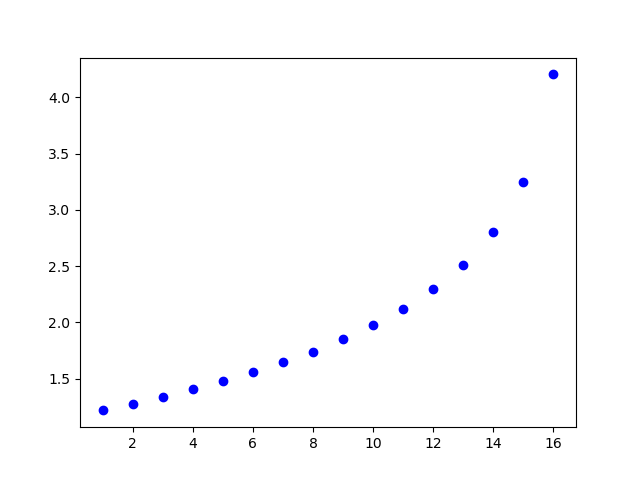

In [20]:
plt.scatter(np.linspace(1,16,16),np.log10(output[24]),color="blue")
plt.show()

<IPython.core.display.Javascript object>


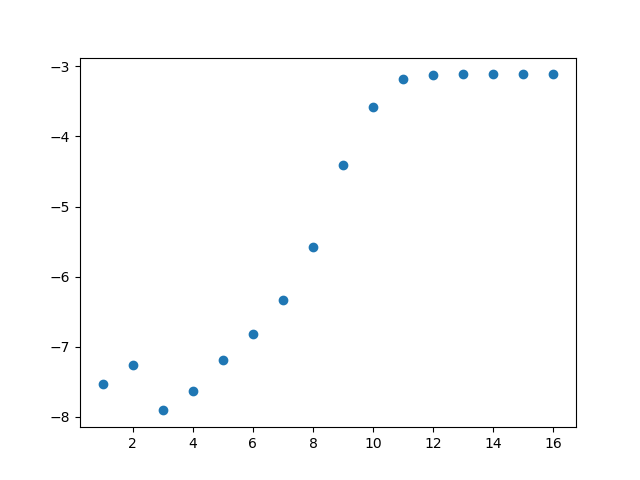

In [23]:
plt.scatter(np.linspace(1,16,16),np.log10(np.array([2.99221298e-08,5.52464181e-08,1.24017453e-08,2.36480475e-08,6.39430607e-08,1.52781643e-07,4.72988415e-07,2.69280575e-06,3.88025581e-05,2.59478495e-04,6.70274766e-04,7.56419075e-04,7.66542370e-04,7.67710541e-04,7.67856698e-04,7.67593536e-04])))
plt.show()

In [3]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 2.1E-12/kB.value, 0.5, 4, 2

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=4)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])

Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
[2.33333333 2.33333333 2.33333333 2.33333333] [2.33333333 2.33333333 2.33333333 2.33333333]
Finding equilibrium for zone 1 / 4
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7492093428076766 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6288399924675129 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5302534405113951 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4440247041552877 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 3100000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/chemistry/NL99_GC.py:257: RuntimeWarning: divide by zero encountered in log
  (n/ncr) / (1.0+n/ncr) * np.log(kHh) +
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/chemistry/NL99_GC.py:258: RuntimeWarning: divide by zero encountered in log
  1.0 / (1.0+n/ncr) * np.log(kHl))
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/chemistry/NL99_GC.py:263: RuntimeWarning: divide by zero encountered in log
  (n/ncr) / (1.0+n/ncr) * np.log(kH2h) +
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/chemistry/NL99_GC.py:264: RuntimeWarning: divide by zero encountered in log
  1.0 / (1.0+n/ncr) * np.log(kH2l))


setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 69.50394788402194 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 1.3836986915773024 for species C
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 9.871598946299924 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.1808960682334414 for species H+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.16517172632000698 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.16763564251072716 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.13034996716979153 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.06927653800157973 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.038144959070531614 fo

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.935641e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.947581e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.154026e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 95.724817, Td = 16.168633, residual = 8.955339e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02277542773662844 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.040427530433171266 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06581094032795709 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09508895575262288 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1195203865623714 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12981942110595057 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2885491989067567 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7473719577339122 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.156372e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.980355e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.186412e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 91.078523, Td = 16.168630, residual = 5.101416e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002924024412440662 for species CHx
setChemEquil: abundances converged: {'H+': 7.156369038614949e-05, 'H2': 0.0009464522090861724, 'H3+': 4.884849080070702e-11, 'He+': 4.6888643923802675e-05, 'OHx': 2.463060980347999e-13, 'CHx': 5.918664179682616e-13, 'CO': 4.9055598029587514e-15, 'C': 1.1160968661395854e-08, 'C+': 9.998883843256298e-05, 'HCO+': 1.826496387036381e-16, 'O': 0.00019999999974946626, 'M+': 1.9995979646839966e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.156369e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.156369e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 91.078529, Td = 16.168630, residual = 6.420689e-08
Temperature converged!
Finding equilibrium for zone 2 / 4
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7494451966553459 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6291888063812987 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5285557118532802 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4410977876704968 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.40960423905164256 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9309864091976977 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.063006e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.169890e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.048756e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 47.250271, Td = 15.895958, residual = 7.883610e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07112840710707913 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08478806726794119 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08479296336943065 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10288707029729316 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.617628049589181 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.09262921242983424 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8977051846211261 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 170.93278036682634 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.136199e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.840454e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.180594e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 45.745241, Td = 15.895957, residual = 3.290026e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0011334809043028748 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0015453329856160991 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0030028882536028423 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.005723004464780912 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1787668955600784 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2936800552138611 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 13.379132654294521 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 96.25897198662754 for species CO
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.096279e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.840201e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.176047e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 45.754794, Td = 15.895957, residual = 2.088010e-04
Temperature converged!
Finding equilibrium for zone 3 / 4
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7497560146680834 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6300997093005786 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5338410744105673 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4484374038334946 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6285301994149113 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9372922215985339 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.730866e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.890304e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.864244e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 26.507529, Td = 15.244296, residual = 6.227487e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11856402524985343 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24268537909476218 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11247179818517639 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.210681689598278 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.027191151482240716 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2901.3867906309656 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.04441952428154461 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.04945428174311961 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.473879e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.892668e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.001432e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 26.454315, Td = 15.244298, residual = 2.011537e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00027129854503260553 for species HCO+
setChemEquil: abundances converged: {'H+': 1.473877736335627e-07, 'H2': 0.48053658087122036, 'H3+': 2.0532414343577763e-09, 'He+': 5.738937334103843e-07, 'OHx': 3.061916496069756e-10, 'CHx': 8.58666172755357e-09, 'CO': 6.569098778452625e-09, 'C': 7.634393926622256e-07, 'C+': 9.92214046110107e-05, 'HCO+': 2.3227532589782536e-13, 'O': 0.00019999312447725525, 'M+': 1.9848288111705488e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.473878e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.473878e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 26.454315, Td = 15.244298, residual = 5.824391e-09
Temperature converged!
Finding equilibrium for zone 4 / 4
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6511751663299034 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4315632592921821 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3893229331434481 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.39173225327010053 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35257938086342044 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6014615889915556 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.068176e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.455665e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.945095e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 8.846068, Td = 11.853499, residual = 1.563673e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005751011698338804 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.00898147916047276 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.019342032751317406 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.055115921011321234 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.006905040190446021 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2747777492415482 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.30211883713498255 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16564933371363466 for species H3+
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.279744e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.462979e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.580535e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 8.845962, Td = 11.853499, residual = 1.202421e-05
Temperature converged!
Calculating mu to be 1.2735699257061763
Calculating muH to be 1.399999999852616
1.2735699257061763 1.2735699257061763 1.2735699257061763 1.399999999852616
0.9980355317440576 0.0009464522090861724 0.1 7.156369038614949e-05 0.000218641181387657
Calculating mu to be 1.411100965135062
Calculating muH to be 1.3999999925271882
1.411100965135062 1.411100965135062 1.411100965135062 1.3999999925271882
0.7840200602679541 0.10798448473467932 0.1 1.0962789875421246e-05 0.0001176046621261094
Calculating mu to be 2.259655189611749
Calculating muH to be 1.39999998494719
2.259655189611749 2.259655189611749 2.259655189611749 1.39999998494719
0.03892667581697567 0.48053658087122036 0.1 1.473877736335627e-07 0.00010014322247288138
Calculating mu to be 2.3326573345550337
Calculating muH to be 1.3999996019451568
2.3326573345550337 2.3326573345550337 2.3326573345550337 1.3999996019451568
0.000

/tmp/ipykernel_12060/2662135538.py:251: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density])


In [9]:
#DMR=10
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 2.1E-12/kB.value, 0.5, 4, 2

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=4)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])

Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
[2.33333333 2.33333333 2.33333333 2.33333333] [2.33333333 2.33333333 2.33333333 2.33333333]
Finding equilibrium for zone 1 / 4
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7492093428076791 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6288399924768171 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5302534408620749 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4440247011820827 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 3100000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.326414e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.205461e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.055713e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17076.356797, Td = 23.467989, residual = 9.994144e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.025414024010144587 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.045047219342121414 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07337667102314871 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10693772775978172 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1870278326870385 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.32689900320519394 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.26710053995200056 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.555026080906545 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.041206e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.958793e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.042300e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 55.264506, Td = 23.465504, residual = 3.079932e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9993585289777194 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 4.8379045257811555 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.9531606039141616 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.094598260002456 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.19983389245647742 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.34999172334895057 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.44199807231182753 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2788372578938667 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.824819e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.046510e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.156107e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16458.161605, Td = 23.467869, residual = 9.966421e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0104041004197033 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020738252037838745 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0412275475721231 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08148197772659227 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1517788021444857 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20920647406482895 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24392288518725147 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5121576085634769 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.106599e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.893400e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.107766e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 61.706655, Td = 23.465504, residual = 2.657162e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9340052957073347 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.38300481391946417 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 10.592699832810595 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.577730921891812 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 92.28271555699578 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.36326041761306893 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.30236867315928784 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.22635498156312894 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.609794e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.126180e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.169620e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16396.757793, Td = 23.467857, residual = 9.962367e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01028713141592874 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020493195059162472 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.040690148334124654 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08019705388535536 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14877670701352153 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.200747147021773 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24301222267020473 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5077955219118533 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.038349e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.961650e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.039527e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 62.750576, Td = 23.465504, residual = 2.603005e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9245113854366709 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 295.3626092643568 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 30.787619261352727 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.906201774421484 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.4094029163527364 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.28994442991406044 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9455896305176267 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.31130826251807076 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.739992e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.138860e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.171853e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16386.918848, Td = 23.467856, residual = 9.961707e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010268760807242039 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020454733497328403 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04060592466808277 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07999632420276037 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14834532667623934 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19945432719438672 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24285412025000253 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5071647344382151 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.027798e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.972202e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.028977e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 62.928023, Td = 23.465504, residual = 2.594073e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9228901229896778 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 325.208293934222 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 25.17830938216971 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3.9489076496884983 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 86.67786578575287 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 583.5651182706323 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9408613270412405 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2405573345065244 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.762202e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.141009e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.172234e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16385.249424, Td = 23.467855, residual = 9.961595e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010265653369043948 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020448228315752992 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.040591682766101256 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07996239890593149 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1482395917213355 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19924498385564626 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24282681487878732 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5070602414359 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.026018e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.973982e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.027197e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 62.958425, Td = 23.465504, residual = 2.592551e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9226122847093082 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 331.98382786110756 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 24.379037587880543 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.291111654429053 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 91.33914868289548 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3043189820277641 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0717240985418093 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 43.52909441319459 for species H3+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.766010e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.141377e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.172300e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16384.963487, Td = 23.467855, residual = 9.961575e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01026512140627478 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020447114713010528 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04058924483095816 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07995659206070882 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14823539626701376 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19920108256339297 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24282216189046069 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5070396027714625 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.025713e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.974286e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.026892e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 62.963641, Td = 23.465504, residual = 2.592290e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9225646168920506 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 333.2042352606784 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 24.24563691570997 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.2704716048683937 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 91.46538564572367 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.303911375477943 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0705102638967632 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.973684916885325 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.766663e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.141440e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.172311e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16384.914435, Td = 23.467855, residual = 9.961572e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010265030153873811 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02044692368722134 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04058882663388297 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07995559598431035 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14823365067108574 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19919687047058954 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24282138838658196 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5070361712252478 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.025661e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.974338e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.026840e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 62.964536, Td = 23.465504, residual = 2.592245e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9225564374521995 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 333.4153889299048 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 24.222851632319617 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.2669089302239662 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 91.48546433659513 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.30383374184876644 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0703009938159342 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.21905454529297474 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.766776e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.141451e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.172313e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16384.906017, Td = 23.467855, residual = 9.961572e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010265014496448455 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020446890910323923 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04058875487818914 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07995542507450049 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14821423834538416 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19920958817229328 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2428210648486384 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.507037416089668 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.025652e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.974347e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.026831e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 62.964682, Td = 23.465504, residual = 2.592238e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9225550472255888 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 333.4513030598344 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 24.218989141259776 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.266553608466232 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 91.51070760899445 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.30380496146899894 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0701695500657589 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 44.84263376094579 for species H3+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.766794e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.141453e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.766794e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 16384.904635, Td = 23.467855, residual = 9.961572e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010265011926801737 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020446885531084202 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04058874310187499 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0799553970253426 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14824015561198367 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19919345875669348 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2428208375225933 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5070359384172585 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.025650e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.974349e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.026830e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 62.964714, Td = 23.465504, residual = 2.592236e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9225548029384469 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 333.45764384505304 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 24.218302191008718 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.2663597501211212 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.395885439743579 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1985.3184994114324 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.28682527387915147 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.21535781799839437 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.766798e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.766798e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 16384.904335, Td = 23.467855, residual = 9.961572e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01026501136764435 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02044688436055697 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.040588740539339696 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07995539092182535 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14822434537658502 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19920634169372708 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24282088025000292 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5070365506713519 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.026829e-01) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 62.964720, Td = 23.465504, residual = 2.592236e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.922554753095821 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 333.458932908833 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 24.218164250209412 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.2664243620131153 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 91.49006655392454 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3038181322177932 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0702819464539093 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 10.019080184802075 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.766799e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.766799e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 16384.904284, Td = 23.467855, residual = 9.961572e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010265011272091451 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0204468841605292 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04058874010143798 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07995538987882655 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14822288400076222 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19920063110121022 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2428204031176424 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5070380047862639 for species C
setChemEquil: evolved from t = 255000000

setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.6760012711371997 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 1.025238046847382 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.005155011025077538 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0016128370128740688 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.10256499555641745, 'H2': 3.8394491111540734e-08, 'H3+': 2.7585324306805765e-16, 'He+': 1.7791926542350252e-05, 'OHx': 3.109306516299945e-19, 'CHx': 5.356245844423778e-18, 'CO': 5.2942772063379554e-21, 'C': 5.342263969067582e-08, 'C+': 9.994657730277376e-05, 'HCO+': 1.3927636175902548e-23, 'O': 0.00019999999993198294, 'M+': 1.9985120506299298e-07}
setChemEquil: updated temp

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.3574973084768991 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9975401687226187 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.9965917851969097 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.9879774020534418 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.951125125104737 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.6346238785552902 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.22870049721327734 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1855797307295033 for species CHx
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.17

setChemEquil: updated temperatures to Tg = 16384.904275, Td = 23.467855, residual = 9.961572e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010265011252100553 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02044688411868334 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0405887400098377 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07995538966069393 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14822288342663326 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1992069957330771 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24282103868781602 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5070373371212666 for species C
setChemEquil: evolved from t = 255000000

setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 1.117188834553252 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 1.0048290651467537 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.005154775718977378 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0018275281044903835 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.1025649986341403, 'H2': 3.8394490829447925e-08, 'H3+': 2.7585323294158683e-16, 'He+': 1.7791969162011094e-05, 'OHx': 3.109306402135915e-19, 'CHx': 5.356245707632985e-18, 'CO': 5.2942886074160166e-21, 'C': 5.342264028527067e-08, 'C+': 9.99465754943572e-05, 'HCO+': 1.3927635012782732e-23, 'O': 0.00019999999994749557, 'M+': 1.9985120505866009e-07}
setChemEquil: updated temper

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.3574964989434992 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9975400301862085 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.9965885059238948 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.987963081038317 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.9533777879605285 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.6346238776518889 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.22870048695694667 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1855796925823724 for species CHx
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.17

setChemEquil: updated temperatures to Tg = 16384.904310, Td = 23.467855, residual = 9.961572e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010265011239214195 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020446884091756656 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04058873995110601 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07995538952184189 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1482231747415328 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19920020839493024 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2428209897374558 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5070379980322555 for species C
setChemEquil: evolved from t = 25500000

setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 1.0130681516652589 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.005154921368034637 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.001574138389081714 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.1025650060243073, 'H2': 3.839449014162048e-08, 'H3+': 2.758532090563412e-16, 'He+': 1.77918849766663e-05, 'OHx': 3.1093061322487308e-19, 'CHx': 5.356245605067868e-18, 'CO': 5.294275630202963e-21, 'C': 5.342264388341455e-08, 'C+': 9.994657539495273e-05, 'HCO+': 1.392763285432778e-23, 'O': 0.00019999999995255955, 'M+': 1.9985120504853055e-07}
setChemEquil: updated temperatures to Tg = 62.964437, Td = 23.465504, residual = 2.592247e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.766763e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.141450e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.172312e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16384.906989, Td = 23.467855, residual = 9.961572e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01026501622620457 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020446894531405357 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04058876280573398 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07995544395759024 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1482239015135085 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19920283265867145 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24282106968460204 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5070361251161799 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.025653e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.974346e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.026832e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 62.964673, Td = 23.465504, residual = 2.592238e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9225551931560769 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 333.4475606997501 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 24.219387546373113 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.2665376761876037 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 91.49817033862797 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.30381484363608624 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0702254188574323 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 10.016328227968883 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.766793e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.141452e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.766793e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 16384.904769, Td = 23.467855, residual = 9.961572e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010265012096208226 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02044688588576582 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.040588743878569034 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07995539887633862 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14821475120810934 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19920511723504664 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24282117166036388 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5070376826132077 for species C
setChemEquil: evolved from t = 255000

setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.9995720571340616 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.8453204102262619 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.005155042443361069 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0015424257516860607 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.00010700309133793162 for species He+
setChemEquil: abundances converged: {'H+': 0.10256500744425771, 'H2': 3.839449001494209e-08, 'H3+': 2.758532042394309e-16, 'He+': 1.7791964924734322e-05, 'OHx': 3.1093060779259175e-19, 'CHx': 5.356245600636484e-18, 'CO': 5.294277492354016e-21, 'C': 5.3422644771197724e-08, 'C+': 9.994657564634316e-05, 'HCO+': 1.392763245301874e-23, 'O': 0.00019999999995975104, 'M+': 1.9985120504643904e-07}
setChemEqui

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.3574970778558787 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.997539739493007 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.9965828625591813 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.9879384470018524 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.9582220898013218 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.6346239402394367 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.22870045214993362 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.18557964269095184 for species CHx
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.1

setChemEquil: updated temperatures to Tg = 16384.904305, Td = 23.467855, residual = 9.961572e-01
Finding equilibrium for zone 2 / 4
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7494451966553604 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.629188806426183 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5285557135867488 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4410977926876837 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4096040152463152 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9309861618009144 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1933336891728465

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.303174e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.305657e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.014338e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 19094.235300, Td = 23.046976, residual = 9.994763e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05359675494943317 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08447688597972025 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11861950360769169 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.14853181235164759 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16961104952707762 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2903714548562959 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3733552523565731 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3302236761160733 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.771299e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.228701e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.772311e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 40.108468, Td = 23.040731, residual = 4.750649e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 262.4396739756698 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8500961035731691 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.8419982907368904 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3971283454682617 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9125005230478406 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7268862189410314 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7275311027264434 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0289788765922092 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.785251e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.730203e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.020402e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18558.253219, Td = 23.046737, residual = 9.978388e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014204058865840197 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026502190166531547 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04672676174959489 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07552074802374353 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1341675303512737 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23156888139932064 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22795212207685545 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3163196142816691 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.740116e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.259883e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.741133e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 40.313038, Td = 23.040727, residual = 4.593536e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 15.66221875305105 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.012250935409566 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.065928072504332 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6617089234197258 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9403949051496634 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2951839046583924 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7507573163020689 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2808219822718858 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.796922e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.737238e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.020421e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18555.869797, Td = 23.046736, residual = 9.978275e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014132785934570125 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026377976801961633 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04653323959193312 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0752668652401135 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13408026165267262 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23132207748589728 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2274787557183866 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.31622886160016206 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.735057e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.264943e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.736074e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 40.314178, Td = 23.040727, residual = 4.592815e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 15.456223959691378 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 3.447457436929417 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8910373579618915 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9896376840800025 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5721393867067563 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.065327632607762 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7577320714046191 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.28053309715284225 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.796987e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.737277e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.796987e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18555.856472, Td = 23.046736, residual = 9.978274e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014132390777362613 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026377287897655144 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04653216638762325 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07526545533183171 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1340797671500915 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2313207083863824 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22747652644070082 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.31622835558833917 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.735028e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.264971e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.736045e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 40.314185, Td = 23.040727, residual = 4.592811e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 15.512121217206172 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.481462146327557 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.29750200046326114 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 13.557511950067058 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9530350157885699 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.2701557518402724 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6359401794081204 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.007128475916891 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.1951132149522934 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18024975001528765 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.19050425008052163 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.1891725878465993 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.11162991972421699 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.008262274657885316 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 7.305619787745243e-05 for species H+
setChemEquil: abundances converged: {'H+': 1.7969863377266548e-07, 'H2': 0.4513135115762042, 'H3+': 8.225552769131663e-09, 'He+': 1.7143415531893192e-06, 'OHx':

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.796986e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.796986e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18555.856583, Td = 23.046736, residual = 9.978274e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014132392354093137 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02637729064653871 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0465321700911 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07526546116237764 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1340800836369176 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23132053036440614 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22747636763846746 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3162283579024687 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.735029e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.736046e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.735029e-01) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 40.314169, Td = 23.040727, residual = 4.592813e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 15.44419475341683 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 17.753954064374838 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.5139899600946205 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4869763762173416 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9396788981182758 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2883379982448242 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7578503990033784 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.28070944102307205 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.11162991863914185 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.008443394196505416 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 7.307721380911403e-05 for species H+
setChemEquil: abundances converged: {'H+': 1.7969862465397552e-07, 'H2': 0.45131351118602936, 'H3+': 8.225552330362146e-09, 'He+': 1.7143415816589512e-06, 'OHx': 2.031495805378804e-10, 'CHx': 1.3555587526420184e-09, 'CO': 7.505475048201483e-11, 'C': 5.854492361920579e-08, 'C+': 9.994002436452183e-05, 'HCO+': 1.9638345493359587e-13, 'O': 0.00019999972165613285, 'M+': 1.9983189436266737e-07}
setChemEquil: updated temperatures to Tg = 18555.856558, Td = 23.046736, residual = 9.978274e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014132393078850836 for species H3+
setChemEquil: evolved from t = 10000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.796982e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.737275e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.796982e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18555.857408, Td = 23.046736, residual = 9.978274e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014132419673533958 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02637733827433464 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.046532244588464056 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07526555819909664 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13408035577321198 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2313208161567708 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22747658605358945 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.31622839282017945 for species C
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.735030e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.264969e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.736047e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 40.314173, Td = 23.040727, residual = 4.592812e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 15.443815630458257 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.584650572050704 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7747423346332744 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7592423652059834 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4209590654069162 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0680732218110718 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7576848407878127 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.28054651146339005 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.1802497294904316 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.1905050308917372 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.18917263016594377 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.11162987955731118 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.008443377480711556 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 7.307321155680668e-05 for species H+
setChemEquil: abundances converged: {'H+': 1.7969819826533847e-07, 'H2': 0.4513135233708183, 'H3+': 8.225537094782653e-09, 'He+': 1.714341423043473e-06, 'OHx': 2.0314938992213024e-10, 'CHx': 1.3555600411738406e-09, 'CO': 7.50548526867873e-11, 'C': 5.854503621945481e-08, 'C+': 9

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 52.46838737289767 for species H3+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 24.047732131067693 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 1.000011230832023 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.05488632743183741 for species He+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.017128883482769197 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0010170934401534382 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.47350284836495654, 'H2': 3.6134238589879284e-08, 'H3+': 3.084450391914909e-17, 'He+': 2.1933735704229054e-06, 'OHx': 8.68819510572059e-20, 'CHx': 1.21641

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 1.017849739455162 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9870150219716097 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 4.434262168033184 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.263580017533338 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 3.241390367735627 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.35619667414212186 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.19667958382578565 for species CHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.20374721782250194 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.19

setChemEquil: updated temperatures to Tg = 18555.856540, Td = 23.046736, residual = 9.978274e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01413239221620255 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02637729040608705 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04653216992032183 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07526546030058157 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1340798139378243 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23132053632370053 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.227476291648963 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3162283577628342 for species C
setChemEquil: evolved from t = 255000000

setChemEquil: updated temperatures to Tg = 40.314169, Td = 23.040727, residual = 4.592813e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 15.471272647018228 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 3.44850757791924 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8911600144739933 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9910357816223092 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5720362124376521 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.065348207354561 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7576991006273152 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2805327168032442 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 511

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18024973822037405 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.19050443617216473 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.18917257843004354 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.1116299207567839 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.008253021871522659 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 7.306666346940105e-05 for species H+
setChemEquil: abundances converged: {'H+': 1.7969869660046598e-07, 'H2': 0.4513135096927058, 'H3+': 8.225555015148199e-09, 'He+': 1.7143415774555629e-06, 'OHx': 2.0314961624113266e-10, 'CHx': 1.3555585394871777e-09, 'CO': 7.505473404285643e-11, 'C': 5.8544903717755455e-08, 'C+

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 6.776444378388163 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.9973733385876404 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.9993942240264507 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.0548863654402294 for species He+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.017124910767426726 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.00124260977187296 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.47350283257044323, 'H2': 3.613423958313224e-08, 'H3+': 3.084450572710443e-17, 'He+': 2.1933446889062593e-06, 'OHx': 8.68819561676765e-20, 'CHx': 1.2164112

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.737278e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18555.856411, Td = 23.046736, residual = 9.978274e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014132388374869187 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026377283709218324 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.046532159092687486 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0752654466173851 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.134080063596979 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23132020807502163 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22747615196043047 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3162283530824683 for species C
setChemEquil: evolved from t = 255000

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.47350287306584044, 'H2': 3.61342370363844e-08, 'H3+': 3.084450109165108e-17, 'He+': 2.19341823166757e-06, 'OHx': 8.688194306781501e-20, 'CHx': 1.2164111833933477e-17, 'CO': 3.533813225960975e-20, 'C': 6.884922917430525e-07, 'C+': 9.931150755176478e-05, 'HCO+': 9.23418553043938e-25, 'O': 0.00019999999989106786, 'M+': 1.9838116445809283e-07}
setChemEquil: updated temperatures to Tg = 40.314169, Td = 23.040727, residual = 4.592813e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 15.512080672048935 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.5847039218219878 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7749845037258403 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7617585996932512 for spec

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.1993183098045188 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.20370896293975083 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.1981001264134873 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.19511324119424445 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18024975592065517 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.19050501646463558 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.18917179952400587 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.11162990586773192 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 199.78958505621554 for species H3+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.64757239051682 for species C
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.9992922616026738 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.054886283044675466 for species He+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.017139536542458256 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0012219174059702187 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.47350303318139225, 'H2': 3.6134226956195606e-08, 'H3+': 3.084448277903919e-17, 'He+': 2.19334633798449e-06, 'OHx': 8.688189129009178e-20, 'CHx': 1.216410

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 1.0171501086786916 for species H3+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 1.0582236261505678 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 1.0142058460975696 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.917747249844115 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 1.1178795754506963 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.2635911949539023 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.9891642126289115 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.2108746434009089 for species OHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.397870762217

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.914974e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.876747e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.853839e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 194.385959, Td = 22.013413, residual = 9.485560e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.13544989051360867 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.14549199912779243 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.15962230512576847 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16006806510867977 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1448463291807237 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12558117445167916 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1864350416609356 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 20.04135085409092 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.587831e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.546357e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.009454e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 187.518068, Td = 22.013399, residual = 3.662522e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0008140106538252478 for species HCO+
setChemEquil: abundances converged: {'H+': 8.587696508571737e-08, 'H2': 0.49772675259126353, 'H3+': 1.5342570679298218e-08, 'He+': 7.580292329669186e-07, 'OHx': 9.290596796205376e-10, 'CHx': 3.4659940500495684e-09, 'CO': 1.6339686669026327e-09, 'C': 1.0862956414368661e-07, 'C+': 9.98862679931511e-05, 'HCO+': 2.4850226011775685e-12, 'O': 0.00019999743448664142, 'M+': 1.9983858817180314e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.587697e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.546359e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.587697e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 187.518096, Td = 22.013399, residual = 1.500795e-07
Temperature converged!
Finding equilibrium for zone 4 / 4
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6511751675282891 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4315632642693268 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3893231156880088 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3919058382140507 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3525887175459954 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5994148234538462 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.061333e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.454934e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.938837e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.288315, Td = 15.877589, residual = 3.701815e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003338778686578392 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.005203579992286045 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.010537135984820756 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.016004860263700627 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7327799090966922 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.3959068841186304 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.823920318093797 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9916888510275654 for species HCO+
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.649761e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.522164e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.717074e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.288218, Td = 15.877589, residual = 1.041222e-05
Temperature converged!
Calculating mu to be 1.4626102900981144
Calculating muH to be 1.3999999745149816
1.4626102900981144 1.4626102900981144 1.4626102900981144 1.3999999745149816
0.7141453080588619 0.14292444982857272 0.1 5.76679897422162e-06 0.00011723130128985404
Calculating mu to be 2.15786803340128
Calculating muH to be 1.399999973764437
2.15786803340128 2.15786803340128 2.15786803340128 1.399999973764437
0.0973727707978634 0.45131351163397077 0.1 1.7969863214268068e-07 0.00010204212191178692
Calculating mu to be 2.3241368630685235
Calculating muH to be 1.3999999495747493
2.3241368630685235 2.3241368630685235 2.3241368630685235 1.3999999495747493
0.00454635851525705 0.49772675259126353 0.1 8.587696508571737e-08 0.00010094535783507744
Calculating mu to be 2.333261959333463
Calculating muH to be 1.3999995987918976
2.333261959333463 2.333261959333463 2.333261959333463 1.3999995987918976
3.522

/tmp/ipykernel_12060/317941001.py:251: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density])


In [15]:
#DMR=10
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 2.1E-12/kB.value, 0.5, 4, 2

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])

Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculatin

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.276631e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.497072e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.105324e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16712.589166, Td = 23.583029, residual = 9.994016e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.019536485277999116 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03555279993630167 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.060233752103157845 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10003734996405789 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20164808910540888 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.313644223501123 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2861110371453275 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6449946062960743 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.664548e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.335452e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.665686e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 65.805702, Td = 23.581124, residual = 2.529687e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9452161844362217 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8220849533546088 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 83.46925511780236 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9155274052423723 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 22.079105869046664 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19318618702292756 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18564101577526226 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.935191541877714 for species H3+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.036833e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999233e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.637430e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15666.825564, Td = 23.582863, residual = 9.957997e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010622645254003915 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02113900991534834 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04188569920197649 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08219494464389854 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.15275203742626253 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13756453780921318 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2971843560772802 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7470971591640869 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.034119e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.396587e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.047712e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 8591.482242, Td = 23.581882, residual = 8.235300e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0019487916885169154 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0037920099586953304 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.007186291518631593 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.012953862382219294 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.021315483110321054 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.036618209163133186 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7278422270021924 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9868041040453474 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.206493e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996791e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.357765e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 12163.010667, Td = 23.582343, residual = 2.936385e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0008291661551507179 for species C
setChemEquil: abundances converged: {'H+': 0.0003206510338432131, 'H2': 1.1492923181754045e-07, 'H3+': 5.202984034565569e-14, 'He+': 0.0009369164030489175, 'OHx': 4.6607540786412854e-17, 'CHx': 1.2859468577580628e-17, 'CO': 8.217091209868998e-20, 'C': 7.844628276471559e-10, 'C+': 9.999921530986811e-05, 'HCO+': 4.818228495234396e-20, 'O': 0.00019999999999876359, 'M+': 1.9999764348467304e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.206510e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.357767e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.206510e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12163.008984, Td = 23.582343, residual = 1.383844e-07
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7491741375471255 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6288091321784727 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5306832830237131 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44570775634117343 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3488085879932773 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4499001218941274 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.201769e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.818129e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.074893e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16726.496902, Td = 23.519792, residual = 9.994021e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02247606638167088 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04036344235133671 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0670209309915143 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09997832401887985 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.19791230703943374 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21910408977833207 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2721417657953027 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6030162112249169 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.539083e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.460917e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.540214e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 61.315856, Td = 23.517579, residual = 2.717924e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9564349066561713 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.8711885491082848 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 40.941824122034625 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.20214570492058004 for species H2
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 38.312841022362576 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7042211284416113 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.244542237255463 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.007158190331019 for species H3+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.736979e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.477301e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.274875e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16082.430097, Td = 23.519675, residual = 9.961874e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010439257062317742 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020780844485990935 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04119799773788846 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08091024895947418 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.15030109175006623 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19202260199607712 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2605216623772577 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5487279755718388 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.054779e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.194521e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.067194e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 76.314875, Td = 23.517580, residual = 2.097378e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8401741685275084 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.751182854312098 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.0015189807544151 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 56.49742864690423 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.261281800872942 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 18.181155458089695 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1929085740993377 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.2212834170245843 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.018793e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.592236e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.328497e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15951.437059, Td = 23.519651, residual = 9.952158e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010170481514765628 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020218793860256268 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.039970589965751646 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07800617470958904 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14270473717497145 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17652639601191566 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2587299046404705 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5383889708295726 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.051844e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.294815e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.064581e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 82.880135, Td = 23.517581, residual = 1.914639e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7885898682502734 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.751916050001276 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.929928761500604 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.48440229431027 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.578996404695841 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9515661560288848 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 81.65115092297552 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.486252453667682 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.128515e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.639171e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.352506e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15896.301045, Td = 23.519641, residual = 9.947862e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010061700617411518 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01999174054875108 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03947670665084102 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07684790606549852 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1397598772491062 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17079812156679686 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2579819026458725 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5337858914019911 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.668936e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.333106e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.681820e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 86.499179, Td = 23.517582, residual = 1.827740e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7464929393914352 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7523648310228291 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.2105560890979805 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.66838134376101 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 59.420415844108184 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.193282379556307 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.1487636145441744 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3020498802215137 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.189429e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.664249e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.365877e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15866.444191, Td = 23.519636, residual = 9.945483e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01000370026826114 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01987077872164056 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.039214049334533874 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07623428940469235 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1382279286541772 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16784504483717666 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.25757750010007374 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.528104466832362 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.470617e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.352938e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.483584e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 88.762252, Td = 23.517582, residual = 1.777522e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.21208538196059967 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7526487735504843 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 10.151613681275112 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0961401934117978 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 20.39637521926153 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.75400561028679 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 7.977415967973469 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.19240509517062 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.227645e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.679656e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.374285e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15847.962799, Td = 23.519633, residual = 9.943991e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00996809170159385 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019796550046629946 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03905302568796243 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07585891917231735 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13729117842995175 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16608626561569295 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.257326633383405 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5265423402007219 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.350927e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.364906e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.363947e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 90.294244, Td = 23.517582, residual = 1.745147e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.21065319731713383 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7528382643006092 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.338952261444312 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1083645024954478 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 32.46522321248524 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9320156204418111 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 71.28608360260891 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2973582628804867 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.253562e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.689968e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.379998e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15835.533072, Td = 23.519630, residual = 9.942980e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009944263330671443 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019746892610392752 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038945370792517364 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07560830240966543 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1366718438017953 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16491079482365256 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2571590869534188 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5254984048926319 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.271723e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.372827e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.284778e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 91.389034, Td = 23.517582, residual = 1.722761e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.21003331920811807 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7529707886038145 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.460974637304725 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1286102368649322 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 32.580964865399395 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9288763294160807 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 76.30150868292108 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 56.5589744542548 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.272103e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.697281e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.384091e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15826.690415, Td = 23.519629, residual = 9.942256e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009927368596197583 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01971169168109932 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03886908919175158 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07543088759715144 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13623171176876991 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16408974894959005 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2570394729117622 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5247540312910679 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.216000e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.378399e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.229081e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 92.202497, Td = 23.517583, residual = 1.706514e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20958048018046138 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7530670634608938 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 8.606742837769525 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1482980183336504 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 31.208018760381837 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.753565755546349 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.4085473040109533 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8202078232441189 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.285890e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.702684e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.387137e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15820.141420, Td = 23.519628, residual = 9.941718e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009914886013577817 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019685687431678867 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038812754302909314 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07529995289726088 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13589134274755188 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.163501249144814 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.256950847036022 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5242054572107315 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.175062e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.382493e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.188162e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 92.824819, Td = 23.517583, residual = 1.694301e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20923832767793604 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.753139167961127 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 7.4899997413077575 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1662506094784892 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 29.95508145926622 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9.04179259167093 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19871839976183858 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.34487090273545 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.296443e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.706800e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.389471e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15815.143513, Td = 23.519627, residual = 9.941306e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009905376689346657 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019665879348168325 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03876985241734654 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0752002897269124 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13565082141713836 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1630409337392198 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.25688269875788494 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5237843637226731 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.144008e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.385598e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.157123e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 93.311722, Td = 23.517583, residual = 1.684872e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20897313867054235 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7531945098832233 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 6.401833795120127 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.2146567527145566 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 28.92985526421873 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9619881960280601 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 48.59418624072601 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.29060357196473685 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.304702e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.710010e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.391298e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15811.240552, Td = 23.519626, residual = 9.940984e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009897960685649076 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019650432975206966 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038736403342312764 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07512261602877524 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13546942432327458 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16267046430286958 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.25683013657772436 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5234591895067802 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.119871e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.388012e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.132997e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 93.699446, Td = 23.517583, residual = 1.677442e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20876350363044116 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7532378376544109 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.550012467529151 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.26038979651236127 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 11.773341943817492 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9634046765429405 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.33654152050927744 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7126727929372673 for species H3+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.311281e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.712560e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.392755e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15808.137212, Td = 23.519626, residual = 9.940727e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00989207024603056 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019638164917480605 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03870984056930493 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07506095214021258 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13529660845600056 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16240255956468763 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.25678748874012824 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.523200061373476 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.100749e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.389924e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.113884e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 94.012579, Td = 23.517583, residual = 1.671492e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2085951759065734 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7532723136431954 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.6834708674559011 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3017878714422956 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.148359176034651 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9640965792443809 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.392613434166609 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 19.672085834604715 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.316596e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.714615e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.393932e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15805.633890, Td = 23.519625, residual = 9.940520e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009887322673137966 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019628277634169855 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03868843500796815 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07501127251306339 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13518439499109558 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16217876075137005 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2567540898831613 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5229907917239347 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.085369e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.391462e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.098512e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 94.268384, Td = 23.517583, residual = 1.666663e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20845830494317075 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7533001154977985 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.8545750580461329 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.33388262628779397 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.32859315805508 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9644438701449382 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4336742144433523 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2991375760766257 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.320939e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.716291e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.394894e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15803.590848, Td = 23.519625, residual = 9.940350e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009883450637907965 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01962021408586212 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03867097931957342 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07497076803945957 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13509037110389288 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16198620197850921 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2567261573126014 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5228190862699043 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.072847e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.392714e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.085996e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 94.479313, Td = 23.517583, residual = 1.662704e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20834587026986118 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7533227846584453 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.9825597552729288 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.35922370223662603 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.408498619092308 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9645989175272356 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.45790205087925173 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2992871414926892 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.324520e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.717671e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.395687e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15801.907552, Td = 23.519624, residual = 9.940210e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009880262163837417 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01961357429082833 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03865660677584626 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07493742313541829 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1350178761528973 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16182083535426894 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2567035607325563 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5226794594648276 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.062550e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.393744e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.075704e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 94.654594, Td = 23.517583, residual = 1.659428e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20825272891843638 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7533414401209215 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.0793215123776294 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.37953856314550993 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.435340033584888 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9646478778170702 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4730665259035365 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2993821937651244 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.327496e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.718816e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.396347e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15800.509662, Td = 23.519624, residual = 9.940094e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009877615500087478 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019608062939878934 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038644677591942234 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07490975062374439 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13494358568280873 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16170038967923595 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2566852280279419 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5225614120972875 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.054013e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.394598e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.067171e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 94.801194, Td = 23.517583, residual = 1.656699e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20817502905706164 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7533569122389854 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.1531800097426403 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3960300439924411 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.433996665281692 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.964633090483245 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 39.49519749816245 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2899760922176622 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.329986e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.719773e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.396899e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15799.341143, Td = 23.519624, residual = 9.939997e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009875403945156735 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019603457759632903 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038634710294788155 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07488663173372112 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13486702331842548 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16160667575254983 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2566694513087495 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5224647779943088 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.046886e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.395311e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.060048e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 94.924470, Td = 23.517583, residual = 1.654412e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20810983202109012 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7533698284017425 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.2100497437945235 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4095573405265649 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.418043097829722 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9645856646734147 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 38.393069995310825 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2899490104355098 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.332079e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.720578e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.397363e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15798.358989, Td = 23.519624, residual = 9.939915e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00987354569214216 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01959958834704678 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038626335822053326 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07486720916742251 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13483447605549292 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.161509870066868 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2566558714336671 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5223827824520937 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.040903e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.395909e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.054067e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 95.028603, Td = 23.517583, residual = 1.652485e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20805485815765146 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7533806704435602 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.254193804872923 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.42074886167624936 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.395060861443314 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9645192633035148 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 37.57948654227954 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2894829121681066 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.333848e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.721257e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.397755e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15797.529664, Td = 23.519624, residual = 9.939846e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009871977012106514 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019596321963111007 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03861926672047589 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07485081537920513 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1348099963481264 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1614211820741498 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.25664446388979445 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5223128194536995 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.035855e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.396414e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.049022e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 95.116906, Td = 23.517583, residual = 1.650854e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2080083124946409 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7533898143705425 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.288723062525829 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4300745998092963 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.369329230535916 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9644458342540775 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 36.940641886954936 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2892001182196058 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.335348e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.721832e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.398088e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15796.826642, Td = 23.519623, residual = 9.939787e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00987064752951361 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01959355368757043 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03861327580425322 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0748369229064123 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13474557833435563 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16138131089079955 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2566347613287061 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5222558247080522 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.031579e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.396841e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.044749e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 95.192030, Td = 23.517583, residual = 1.649469e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20796876480472004 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7533975570075804 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.3159289479339584 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.43789229990174106 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.34325556644163 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9643703738484888 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 36.442765955462214 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.28902601146618156 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.336624e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.722321e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.398371e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15796.228709, Td = 23.519623, residual = 9.939737e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009869516997438765 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019591199699349637 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03860818159087143 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07482511048292362 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13473543922431763 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1613244523110351 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2566267813342371 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5222043953705813 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.027946e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.397205e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.041117e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 95.256119, Td = 23.517583, residual = 1.648290e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20793506321062527 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7534041354239556 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.337514617605287 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44447883980622294 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.318162684140686 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9642970460215021 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 36.047394451215375 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2889121535110686 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.337712e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.722739e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.398613e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15795.718729, Td = 23.519623, residual = 9.939695e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009868552914593431 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019589192311595838 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03860383754222885 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07481503801823242 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13469662860231457 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16129101006053248 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2566199274314265 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5221622159578194 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.024848e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.397514e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.038021e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 95.310925, Td = 23.517583, residual = 1.647283e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2079062705616439 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7534097410926204 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.3547567588332 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45005182758338824 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.29473593852723 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9642284411559782 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 35.720117147259835 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2888470009745616 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.338643e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.723095e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.398819e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15795.282710, Td = 23.519623, residual = 9.939659e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009867728764200612 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019587476302604934 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03860012411505287 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07480642811586602 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13470061881743534 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16124135381133975 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2566141088312859 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5221251064721795 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.022201e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.397779e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.035375e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 95.357886, Td = 23.517583, residual = 1.646421e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20788161838211483 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7534145298239185 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.368618701628807 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4547842452110772 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.27328530565458 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9641638536884334 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 35.44685476918416 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2888020399711537 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.339441e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.723401e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.398996e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15794.909157, Td = 23.519623, residual = 9.939627e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009867022769610712 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019586006323410343 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03859694314451989 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07479905301837841 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1346706780078757 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16121534065719345 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2566084190220077 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5220943695549543 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.019934e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.398006e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.033109e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 95.398197, Td = 23.517583, residual = 1.645682e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20786047202883173 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7534186294951863 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.3798325795421467 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45881521378359846 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.25389978660794 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9641055169113613 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 35.22281928897346 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.28877332328040395 for species CO
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.340126e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.723663e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.399148e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15794.588556, Td = 23.519623, residual = 9.939601e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009866416910599751 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019584744848607505 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038594213405497735 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07479272429340811 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13463574374525833 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16119115316420984 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2566050614691864 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5220679969426225 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.017989e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.398200e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.031166e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 95.432851, Td = 23.517583, residual = 1.645047e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.20784230407754312 for species H2
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7534221457224952 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.3889582797512965 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.46225764297938154 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.236541736092738 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9640524728302606 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 35.035317234634924 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2887454278586288 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.340714e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.723888e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.399279e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15794.312984, Td = 23.519623, residual = 9.939578e-01
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7492226044239773 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6288547766906742 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5301122031469042 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4434467684735909 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34920091201500336 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.48622055487024185 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 438.46065847808

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.466566e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.601046e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.049963e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17085.543948, Td = 23.447485, residual = 9.994147e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.026651711231130193 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04698372831981201 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07593310328011593 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10964397001214632 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1835614240614296 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.31988614028431717 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2677470261127919 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5407139681550945 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.985273e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.014726e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.986363e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 54.398676, Td = 23.444814, residual = 3.130801e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9993955599253499 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 22.654127376483807 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.9104398787665207 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 17.759202817266235 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1999193363593953 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.37317069229957 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.26039799955384635 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.1976046505772202 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.036450e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.457632e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.129365e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16463.946175, Td = 23.447356, residual = 9.966959e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010276914361804224 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020483737800623958 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.040716714315196745 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08045325415922067 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14790106553617566 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21056593734807016 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2369753660480498 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49721693511313614 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.055107e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.944892e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.056271e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 60.721643, Td = 23.444813, residual = 2.701380e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9349216631279806 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.5180047207026242 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8510171467906922 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.161427298594414 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 250.90900502920485 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.827536817674328 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1191669831333892 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4571018526876962 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.703952e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.541027e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.140203e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16402.494078, Td = 23.447343, residual = 9.962980e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010160348434776756 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020239694030073085 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.040182277454302806 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07917884663154218 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14486917458671567 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20253577890931318 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.23614376237058043 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4919295236683314 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.886278e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.011371e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.898016e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 61.743101, Td = 23.444813, residual = 2.646571e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9253576189875481 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2837278440402975 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 27.718730916469692 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.4849641197878372 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 3.1672155304590563 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3022887532056998 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9521697826956034 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3071753872613525 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.814664e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.554303e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.141995e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16392.672719, Td = 23.447341, residual = 9.962335e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01014209119638676 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020201496213886116 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04009874682541925 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07898030077954243 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1444038276671984 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2013084251735302 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.23601220207221907 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4910938994846199 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.783914e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.021608e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.795670e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 61.916219, Td = 23.444813, residual = 2.637557e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9237274847230791 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4658293451253588 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 27.156689413494476 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0718403357589956 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.538581446601949 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.30206004780100226 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9264307002030266 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.21359966488254867 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.833504e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.556548e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.142300e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16391.011023, Td = 23.447341, residual = 9.962226e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010139011808100618 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020195054200457863 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04008466267469002 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07894684081283598 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1443337060688108 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20110144403309116 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.23599009870979737 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49095266032335494 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.766699e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.023329e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.778458e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 61.945792, Td = 23.444813, residual = 2.636025e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.923448902335753 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4987984444144875 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 26.903458989002914 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8647595639368231 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 93.58246496094556 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 158.3866911244621 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.28489731761194625 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.41469108558124845 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.836725e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.556931e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.142352e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16390.727242, Td = 23.447341, residual = 9.962207e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01013848618897395 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020193954636454237 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.040082258793678216 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07894113035911898 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14431631655071597 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2010650512759815 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2359862061118867 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49092855940484226 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.763762e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.023623e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.775521e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 61.950851, Td = 23.444813, residual = 2.635763e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9234012463589075 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5044927429382522 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 26.857384946458293 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.823059654308318 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 5.244934925719578 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3058158794148187 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9397965198505025 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.35115154133565163 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.837276e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.556997e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.142361e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16390.678704, Td = 23.447341, residual = 9.962204e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010138396289514517 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020193766572703664 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04008184764897327 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07894015369332918 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1443090157047937 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2010608106648457 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.23598548928526908 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.490924546598251 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.763260e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.023673e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.775019e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 61.951716, Td = 23.444813, residual = 2.635718e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9233930928742611 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5054685777790282 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 26.849428241181545 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8156929950654963 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 93.11810243446168 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 174.9916196051393 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.288511792665586 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.25976400921880693 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.837370e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.557008e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.142363e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16390.670400, Td = 23.447341, residual = 9.962203e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010138380909072264 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020193734397848218 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.040081777308428324 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07893998660122281 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14432295657347227 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20106035055862836 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.23598558901811062 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49092380090915966 for species C
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.763174e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.023682e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.774933e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 61.951864, Td = 23.444813, residual = 2.635711e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9233916979763562 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5056355667800823 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 26.848065100331596 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.814431503132242 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 5.191494954738949 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.29282346082039734 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9262009682390206 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 13.086250612809497 for species H3+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.837386e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.557010e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.837386e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 16390.668976, Td = 23.447341, residual = 9.962203e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01013837827911468 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020193728896149787 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.040081765280621795 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07893995802942744 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14431222952496525 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20106160522945715 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.23598531101950293 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4909236964136019 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.763159e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.023683e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.774918e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 61.951890, Td = 23.444813, residual = 2.635709e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9233914589091535 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5056641901868117 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 26.847831322800758 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.81421456372871 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 93.11602905394557 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 175.54522644888277 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2856479439636783 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3289953494192974 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.837389e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.837389e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 16390.668732, Td = 23.447341, residual = 9.962203e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010138377828496692 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020193727953486285 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04008176321977075 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.078939953133915 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14432180296031882 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20106121584000092 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2359853193321242 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49092368504075345 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.763157e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.023684e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.774916e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 61.951894, Td = 23.444813, residual = 2.635709e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9233914176142094 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5056691348369717 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 26.847790874474736 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8141724114458594 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 93.10242583478312 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 175.52975932711223 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2856657521133853 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 30.5879922014187 for species H3+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.763156e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 9.763156e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 61.951895, Td = 23.444813, residual = 2.635709e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.923391411633277 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5056698501767265 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 26.847787094840456 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8141637140495721 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 93.09344434154029 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 175.48883188670132 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.28567860859077554 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4176141348403355 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.774915e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 61.951895, Td = 23.444813, residual = 2.635709e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9233914098094048 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.505670070670901 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 26.84778319488089 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8141708049321008 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 93.12127506413724 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 175.6605132672459 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2885126812619544 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.25990157135564274 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.17088629118125975 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.295686001128581 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.10232413702833232 for species HCO+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.04625044078718532 for species HCO+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0084377115204054 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.00036935363846990477 for species HCO+
setChemEquil: abundances converged: {'H+': 4.837389445845075e-06, 'H2': 0.1721470635596386, 'H3+': 9.715143382758516e-09, 'He+': 9.200690828094786e-06, 'OHx': 6.8877559200971e-11, 'CHx': 1.513579635228155e-10, 'CO': 2.051755776548324e-12, 'C': 1.130262672720642e-08, 'C+'

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 2.7800891734499054 for species H2
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 62.37763737791045 for species CHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 8.122032866150404 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 1.5203852566639675 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.0236150418538787 for species CHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.999972165885916 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.9997405387368098 for species H3+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.00659970993743364 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, resi

setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2856416334190037 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.41751778820973273 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 1.3297826989344772 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 1.5663903191732724 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.3619475441740698 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9966210984688098 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.9948159964406864 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.9902178159012579 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.6438420655567296 for

setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.10232413718417643 for species HCO+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.04625044085421548 for species HCO+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.00843771143345906 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.00036935363710732805 for species HCO+
setChemEquil: abundances converged: {'H+': 4.837389517452565e-06, 'H2': 0.17214706328883458, 'H3+': 9.715143489554789e-09, 'He+': 9.200690866833834e-06, 'OHx': 6.887755955043766e-11, 'CHx': 1.5135796161517237e-10, 'CO': 2.0517557520142544e-12, 'C': 1.13026264967787e-08, 'C+': 9.998854317981152e-05, 'HCO+': 7.407910324915613e-14, 'O': 0.0001999999283789172, 'M+': 1.9996068411265109e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.837390e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.837390e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 16390.668702, Td = 23.447341, residual = 9.962203e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01013837772649162 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02019372774012762 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04008176275345532 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07893995202679682 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14433195695151735 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20105706296799397 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.23598555819053746 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49092365722878717 for species C
setChemEquil: evolved from t = 2550000

setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.9990548639467816 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.009393475922996108 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.006597278795690831 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0019235101663963583 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.00010752235053712589 for species He+
setChemEquil: abundances converged: {'H+': 0.09763156446259241, 'H2': 4.107565002522524e-08, 'H3+': 2.8938932314409894e-16, 'He+': 1.7447680809511937e-05, 'OHx': 3.537261107533281e-19, 'CHx': 6.205381268466338e-18, 'CO': 6.729619689343132e-21, 'C': 5.565202768828487e-08, 'C+': 9.994434715015358e-05, 'HCO+': 1.6658891600268108e-23, 'O': 0.00019999999934720353, 'M+': 1.9984620727373038e-07}
setChemE

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.3619475435076541 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9966211376809049 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.9948159762254716 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.990217786258043 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.6438420265316791 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.7926237272485097 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 8.46469146115032 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.18667946916246403 for species CHx
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.

setChemEquil: updated temperatures to Tg = 16390.668708, Td = 23.447341, residual = 9.962203e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01013837773016868 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02019372774782391 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04008176277029829 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0789399520668943 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14432233380195236 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20106017208941251 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2359851274620881 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49092369284209214 for species C
setChemEquil: evolved from t = 255000000

setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.9999788763793971 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.9751225142306925 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.006593437236534827 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0018431149791678925 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.00011765945927977306 for species He+
setChemEquil: abundances converged: {'H+': 0.09763156435796111, 'H2': 4.107565003565767e-08, 'H3+': 2.893893235283174e-16, 'He+': 1.7447676710944605e-05, 'OHx': 3.537261108734262e-19, 'CHx': 6.205381296476853e-18, 'CO': 6.729619647838652e-21, 'C': 5.565202786561831e-08, 'C+': 9.994434757557993e-05, 'HCO+': 1.6658891694340487e-23, 'O': 0.0001999999991495899, 'M+': 1.9984620727389428e-07}
setChemEqui

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.36193968451220493 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9965829618539082 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.9943867509224229 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.9903889033283436 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.2090386725891213 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.6489538067802649 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 4.899957123760729 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.18667946163814608 for species CHx
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual =

setChemEquil: updated temperatures to Tg = 16390.668704, Td = 23.447341, residual = 9.962203e-01
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7492751463454062 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6289082955592833 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5295266287252876 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44148238866415346 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3538333092311804 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5242433018908883 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 174.718116861933

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.204895e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.605161e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.034078e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17660.461176, Td = 23.363983, residual = 9.994338e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.032129401205886476 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05530887544553531 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08648922655059321 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12032697897576727 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.17710262327970394 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3206929156316498 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.29873517011125017 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.48703490126752524 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.034387e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.965613e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.035438e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 49.006587, Td = 23.360666, residual = 3.593691e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.999850457686658 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 6.636526531685768 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 8.132792795332112 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3948991849211525 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5488787561573458 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.1820687717291751 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8210952603686685 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9557783624341852 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.752205e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.277511e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.066137e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17033.748359, Td = 23.363828, residual = 9.971230e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010034120173310734 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020021787087755705 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.039888793572772085 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07865892590542578 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14630275945933424 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22365207159127132 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.21379102895702107 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.45152512982092996 for species C
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.722553e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.277446e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.723642e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 51.366815, Td = 23.360663, residual = 3.306100e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9994819008669739 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 20.950670510681263 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 7.629315831127413 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.505482835617829 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20052733299331205 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.8019611951270222 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.28728010040407803 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.672556347816815 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.873605e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.307139e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.067919e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17007.895334, Td = 23.363822, residual = 9.969798e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009991690550547272 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019932924660606144 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03969398683549663 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0782036207925334 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14509363341421522 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22045592991549 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.21339671495484036 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4495821244079423 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.676823e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.323176e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.677914e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 51.515704, Td = 23.360663, residual = 3.291497e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9994494964156967 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 43.81003285577529 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.051084582435017 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 24.50549209589597 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.48131895397231284 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6311253866059303 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24405464691825907 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.004009387718427 for species H3+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.881365e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.309003e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.068033e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17006.270912, Td = 23.363821, residual = 9.969708e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009989045806255037 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019927386905872035 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03968185268849167 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07817636856193633 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1450190407426699 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22025767659018736 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.21337200648480126 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4494604170986125 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.673979e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.326020e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.675070e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 51.525245, Td = 23.360663, residual = 3.290571e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9994473818610169 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 45.9140781204771 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.054129954364125 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 24.155391730625613 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5702382113879376 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6595488820512752 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2619826578469421 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7905864292141274 for species H3+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.881862e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.309123e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.068041e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17006.166860, Td = 23.363821, residual = 9.969702e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009988876464094965 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019927032330199212 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.039681075777388 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07817191059198403 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1450147272112816 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2202469472971067 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2133704196996309 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4494526290388434 for species C
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.673797e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.326202e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.674888e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 51.525857, Td = 23.360663, residual = 3.290511e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9994472460871197 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 46.05359135505626 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.0543246267755195 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 24.13300008641675 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5738030688644125 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6612412582092895 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24394092401478018 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0042810055619709 for species H3+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.881894e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.309131e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.881894e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 17006.160185, Td = 23.363821, residual = 9.969702e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009988865604101171 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01992700959111149 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03968102595383827 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07817435250162874 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14501418767337548 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22024407867643747 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.21337029682914443 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.44945212381459565 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.673786e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.326214e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.674877e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 51.525896, Td = 23.360663, residual = 3.290507e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9994472373747666 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 46.06256127570773 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.054337636351165 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 24.12862015880023 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.573140375093639 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6615505063838274 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2439399553755982 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0039652174723923 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.881896e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.881896e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 17006.159753, Td = 23.363821, residual = 9.969702e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009988864904485917 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019927008126229273 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.039681022744143535 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07817293206745513 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14501437015396657 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22024549237484847 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.21337031060776845 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.44945209412769627 for species C
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.673785e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.674876e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.673785e-01) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 51.525899, Td = 23.360663, residual = 3.290507e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9994472368113526 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 46.063143322100636 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.0543380296258216 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 24.13219590672454 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5741661400535853 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.661579670683674 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2439405747789125 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0042817075471364 for species H3+
setChemEquil: evolved from t = 2550000000.0 t

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.17704314680432476 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.1863735064963048 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.16039449885368184 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.1157252994043747 for species HCO+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.05841833782543371 for species HCO+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.012764672700759205 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0006971928148186146 for species HCO+
setChemEquil: abundances converged: {'H+': 1.8818955898240736e-06, 'H2': 0.28454249567675793, 'H3+': 1.1492076906866009e-08, 'He+': 4.7291291903795914

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 5.673467782983743 for species H2
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 2.147694561811745 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1049.8426859756778 for species CHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.9391701689276057 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.0609330312588945 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 1.05773016922088 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.006191408535660914 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0017184873085636099 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, resi

setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24394188187702037 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0039657694091315 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.3124519445304461 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 5.491213968577707 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 1.8495292473216123 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9978178269852841 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.8766387684825562 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.0797764783817634 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.7768654339187784 for sp

setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0006971929223391626 for species HCO+
setChemEquil: abundances converged: {'H+': 1.8818962346303503e-06, 'H2': 0.284542487932475, 'H3+': 1.1492079325169888e-08, 'He+': 4.729129488818257e-06, 'OHx': 1.1604650772047219e-10, 'CHx': 3.5478985859829393e-10, 'CO': 6.514568696809244e-12, 'C': 1.7975289074051313e-08, 'C+': 9.998166335507267e-05, 'HCO+': 1.2157754774293872e-13, 'O': 0.000199999877283732, 'M+': 1.9994053357426227e-07}
setChemEquil: updated temperatures to Tg = 17006.159727, Td = 23.363821, residual = 9.969702e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009988864859911795 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019927008032897042 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.039681022539636235 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, resid

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 5.673429302406738 for species H2
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 2.1476340000250946 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 52.994571606012975 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.9999653719934039 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.7502797086796709 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 52.08532278110988 for species OHx
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.006191642624945537 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0016894523269963546 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 se

setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24394099614373033 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.004281880436514 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.8350354309628676 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.3445235085803503 for species H3+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 1.8606629991629955 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9978655642483383 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.9728593156915624 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.690061140336641 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.1908399891089514 fo

setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.05841834005598057 for species HCO+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.012764673966492945 for species HCO+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0006971929233274832 for species HCO+
setChemEquil: abundances converged: {'H+': 1.8818962378752613e-06, 'H2': 0.2845424879118852, 'H3+': 1.1492079342524222e-08, 'He+': 4.72912948865277e-06, 'OHx': 1.1604650785466436e-10, 'CHx': 3.547898581747752e-10, 'CO': 6.514568690368802e-12, 'C': 1.797528903484709e-08, 'C+': 9.998166327570719e-05, 'HCO+': 1.215775479537755e-13, 'O': 0.00019999987727921959, 'M+': 1.9994053357432754e-07}
setChemEquil: updated temperatures to Tg = 17006.159729, Td = 23.363821, residual = 9.969702e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009988864859338253 for species CHx
setChemEquil: evolved from t = 10000000.

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 5.673473218739919 for species H2
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 39.96740242985526 for species CHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 53.62057048637351 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 9.935875158996664 for species OHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 4.147139924984109 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 1.0557877361915797 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 77.71389371870886 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0017149939034888373 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual

setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24394095826026063 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0039657481197144 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.31354321825878806 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 5.523454085846771 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 1.8496789848733042 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9978197762656048 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.8760459194577737 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.0839365201890105 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.7768655131983326 for s

setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.000697192797870283 for species HCO+
setChemEquil: abundances converged: {'H+': 1.8818955618624407e-06, 'H2': 0.28454249608845333, 'H3+': 1.1492076828108053e-08, 'He+': 4.729129185842341e-06, 'OHx': 1.1604649736749209e-10, 'CHx': 3.5478991273384034e-10, 'CO': 6.514569814549945e-12, 'C': 1.797529363458879e-08, 'C+': 9.998166287263878e-05, 'HCO+': 1.2157751983462145e-13, 'O': 0.00019999987727631777, 'M+': 1.9994053355764338e-07}
setChemEquil: updated temperatures to Tg = 17006.159881, Td = 23.363821, residual = 9.969702e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009988865091177468 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01992700851713991 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03968102360070347 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, resid

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 2.1476087687971077 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 52.99464695275173 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.9999662247632642 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.8210824036235103 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.03656431432808338 for species C
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.006191671381601482 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0018326531550347802 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.00018132460190667388 for species He+
setChemEquil: abundances converged: {'H+': 0.16737848425677

setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.243940860416185 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0039657390695562 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.3130614706795041 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 5.511568786323078 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 1.8499154989709028 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9978180860149528 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.876302612286503 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.0821420749921704 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.7768655416678136 for speci

setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0006971929278313249 for species HCO+
setChemEquil: abundances converged: {'H+': 1.8818962468686876e-06, 'H2': 0.2845424878674022, 'H3+': 1.1492079389196465e-08, 'He+': 4.729129498990832e-06, 'OHx': 1.1604650823343855e-10, 'CHx': 3.547898565629452e-10, 'CO': 6.514568667031479e-12, 'C': 1.797528888827314e-08, 'C+': 9.998166290815327e-05, 'HCO+': 1.2157754834664362e-13, 'O': 0.00019999987725694175, 'M+': 1.999405335746534e-07}
setChemEquil: updated temperatures to Tg = 17006.159737, Td = 23.363821, residual = 9.969702e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009988864858128776 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019927008029172688 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.039681022531517396 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, resid

setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.021951762744091496 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.010952734588879576 for species He+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.020962570250625978 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.03289322979463938 for species He+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.041177021018319104 for species He+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.027562795086288228 for species He+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.02720458056056463 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.05121449938879774 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec,

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.068806e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.185407e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.024392e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18259.933860, Td = 23.266425, residual = 9.994524e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.038861894017855336 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06501953397154858 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09796826312626083 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1310939442120691 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1713459327262774 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3053651764396532 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3241736673963902 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4313232528543012 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.263186e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.736813e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.264217e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 45.280817, Td = 23.262234, residual = 4.022598e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9999654493644458 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22884732820428721 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 4.683848332259458 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 70.68186183147301 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8871706708239102 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22818904263929884 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0114675090080036 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.3145168699834784 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.338879e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.600476e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.038953e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17651.653225, Td = 23.266239, residual = 9.974348e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009672122084909196 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019314528623456173 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038540489543126055 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07644581951554286 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1440756862382433 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23010381754246745 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19110592733387888 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.40384469901499465 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.853711e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.146289e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.854756e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 46.136715, Td = 23.262229, residual = 3.815945e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9998943152667257 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2281295980382534 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 52.731118489766466 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8268013410092092 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 189.25240653748253 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.884578538486653 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.41847745017472104 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.239318448583839 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.532389e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.607919e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.039236e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17641.745248, Td = 23.266236, residual = 9.973848e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009657615317259838 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01928416786534415 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038474010945292125 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07628134209606308 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14365571088308626 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22896407066732571 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.190964408178399 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4032241069284006 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.830550e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.169449e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.831596e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 46.156593, Td = 23.262229, residual = 3.812151e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9998924737670972 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22811127905798145 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 90.32170109860975 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8940494511051016 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34856823378969926 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7333366533243515 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.42936922427236757 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.1738770217538148 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.536905e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.608092e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.039242e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17641.515519, Td = 23.266236, residual = 9.973836e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009657279977909772 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01928346609716014 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038472474584217764 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07628058817086436 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14364606193206275 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22893601873820257 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1909611416652348 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4032097195620503 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.830013e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.169986e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.831060e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 46.157057, Td = 23.262229, residual = 3.812062e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9998924305309481 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22811085203458514 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 43.99460505401074 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8944420454980724 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 314.70694186320276 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7358439685723379 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4290838504732417 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2471289237450509 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.537011e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.608096e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.039243e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17641.510156, Td = 23.266236, residual = 9.973836e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0096572721513839 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019283449718535017 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03847243872709205 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07628306001132157 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14364499850905377 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22893605190769706 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19096106906352617 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.40320938253148286 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.830001e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.169998e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.831047e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 46.157071, Td = 23.262229, residual = 3.812060e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9998924295046288 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22811083906120055 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 90.19851800062779 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8940105337437431 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35461273164110574 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.740960467845603 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.43376839404870915 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.1731992301526932 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.537014e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.537014e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 17641.509995, Td = 23.266236, residual = 9.973836e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009657271916195365 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019283449226354277 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03847243764957842 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0762808645323263 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14364577855765504 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2289356860371079 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19096107017967112 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4032093713325635 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.169999e-01) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 46.157068, Td = 23.262229, residual = 3.812060e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9998924294906564 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22811084177007301 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 90.1972840367057 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8940104399523771 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2038679336050344 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9033249887392559 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6050095141769254 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.1731839154974966 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.537013e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.537013e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 17641.510027, Td = 23.266236, residual = 9.973836e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009657271963140257 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019283449324596136 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.038472437864654596 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07628104729391438 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14364534506357085 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22893740570155585 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1909610563735329 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.40320937579036475 for species C
setChemEquil: evolved from t = 25500

setChemEquil: updated temperatures to Tg = 46.157068, Td = 23.262229, residual = 3.812060e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9998924294952439 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2281108419404837 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 43.99893970509356 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.894450636448219 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 381.73130855848683 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6669026438815113 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.40538562852674165 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.1731923812244023 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.18786048265195976 for species CHx
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.19104868030157984 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18930959026302796 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.15938493972615742 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.114018175565191 for species HCO+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.08009854475647438 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.01679911631931419 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0006136287063820411 for species H+
setChemEquil: abundances converged: {'H

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 30.122118951663783 for species H2
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 9.701460110491082 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.5308992116848836 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.603066716768569 for species C
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.634191243141521 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.037563850229677787 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.013195120562508045 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0007398186945293261 for species He+
setChemEquil: abundances converged: {'H+': 0.283000051892467, 'H2': 3.91315

setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 1.0952445727882907 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.4851759175142405 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9944867513177672 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.979432822899619 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 2.015463719668288 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.5061608334827972 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.5847980249324052 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.195292879200625 for species H2
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.2071699715

setChemEquil: updated temperatures to Tg = 17641.509971, Td = 23.266236, residual = 9.973836e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009657271970822112 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019283449340635306 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03847243789960553 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07628311914100361 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.14364495064930938 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22893448514652293 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1909610749477484 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4032093751924417 for species C
setChemEquil: evolved from t = 2550000

setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.013220595250406308 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0007225982268703746 for species He+
setChemEquil: abundances converged: {'H+': 0.28300005204143736, 'H2': 3.913154444943998e-08, 'H3+': 7.204584829569363e-17, 'He+': 4.660740500656955e-06, 'OHx': 1.3453379774447538e-19, 'CHx': 8.90317476693592e-18, 'CO': 1.511613848069043e-20, 'C': 2.5533268372016445e-07, 'C+': 9.974466924881126e-05, 'HCO+': 2.320252192444724e-24, 'O': 0.00020000000177328726, 'M+': 1.9934444536974318e-07}
setChemEquil: updated temperatures to Tg = 46.157067, Td = 23.262229, residual = 3.812060e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9998924294886812 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2281108422945478 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual 

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.1952928792226255 for species H2
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.20728766424313816 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.18786048264592403 for species CHx
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.1910486826418496 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.1893095909164939 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.15938493927564013 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.11401840983129186 for species HCO+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.08009854445971354 for species H+
setChemEquil: evolved from t = 167772150000000.0 to

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 30.122120400605855 for species H2
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 9.701446611113422 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.5308992155578757 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 6.099125862664454 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.5871669418108358 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.037564238158594776 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.013183614589733272 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0007310472880546204 for species He+
setChemEquil: abundances converged: {'H+': 0.2830000520963622, 'H2': 3.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.830000e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.831046e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.830000e-01) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 46.157070, Td = 23.262229, residual = 3.812060e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.999892429466649 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2281108395787632 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 43.992614257971795 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8944384389525432 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 312.0989419513976 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7350282878642018 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4286607410034069 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24711845974494084 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.19104870164967702 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18930959973416173 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.15938494017033844 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.11402113743515885 for species HCO+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.08009854459858778 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.01679911635698894 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0006136287037796784 for species H+
setChemEquil: abundances converged: {'H+': 7.537013094818511e-07, 'H2': 0.3695947975241162, 'H3+': 1.1006580760226982e-08, 'He+': 2.988036725938186e-06, 'O

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 9.70178950882134 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.5308991218807064 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.9552374580551696 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.1797926516991926 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 5.477365439066709 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.013319191806250963 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0005938197275325852 for species He+
setChemEquil: abundances converged: {'H+': 0.28300004395647904, 'H2': 3.913154494759402e-08, 'H3+': 7.204585118552349e-17, 'He+': 4.660754053371046e-06, 'OHx': 1.345338038197385e-19, 'CHx

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.9632426842681338 for species H3+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 1.095259072828997 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.48527118799695756 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9944866976861458 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.9794328327812815 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 2.0152523916316554 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.50729069842963 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.5838805122715245 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.19529287919177

setChemEquil: updated temperatures to Tg = 17641.509924, Td = 23.266236, residual = 9.973836e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009657271977184356 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019283449353918236 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03847243792855126 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07628220377279882 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1436456254415932 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22893560498989118 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1909610692167114 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.40320937500081766 for species C
setChemEquil: evolved from t = 2550000

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.021738976953495248 for species He+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.020859017015811276 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.03809335340012365 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.05687825207633501 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.07085440571155643 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.06812318763354874 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.04310174474700035 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.012254250299808644 for species H+
setChemEquil: evolved from t = 167772150000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.290919e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.269736e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.017884e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18726.571193, Td = 23.150888, residual = 9.994660e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04705480359651626 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07612370124045909 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11010755097257519 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.14161942494230528 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16490927700971347 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3000289053414489 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35213045963132483 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3743480022033674 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.137406e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.862593e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.138425e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 42.277936, Td = 23.145545, residual = 4.419396e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.0790784972855787 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.736786418232012 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9461091018730089 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 46.64140413640708 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8075929691154702 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8902207293364838 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9927449678168334 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.28127050462067915 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.157718e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.500006e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.025874e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18155.982261, Td = 23.150667, residual = 9.976714e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.011692116118471874 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0220723499575064 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03968584060473812 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07275403459087859 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1390776329341512 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23217871339797336 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.20247060341275191 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3552164931271029 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.903265e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.096734e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.904291e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 42.655419, Td = 23.145534, residual = 4.246430e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.996479543442473 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 17.997232133429534 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.7078582085999203 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 8.0295683229096 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.101812705792072 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8348753524575103 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.699569194698288 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9683851496183121 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.195243e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.501979e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.025932e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18151.576919, Td = 23.150665, residual = 9.976500e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.011589262004260026 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02188880535924842 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03938832789533331 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07269055416123216 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13890740878541585 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23168900663863168 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.20168852156580463 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3549949613714021 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.892960e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.107039e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.893986e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 42.659244, Td = 23.145534, residual = 4.245016e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9964921855091202 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 17.99611842745501 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.501087742940634 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.718445840493711 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1025207635848748 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8368726206649355 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8776423890054716 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2628982668828689 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.195625e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.501999e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.025933e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18151.532316, Td = 23.150665, residual = 9.976498e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01158822900054779 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.021886961045222364 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.039385335898920126 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07269091670372063 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1389056965638067 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23168409019747238 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2016807853158158 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.35499268656689065 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.892856e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.107144e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.893882e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 42.659282, Td = 23.145534, residual = 4.245002e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9964922945589048 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 17.996279604503027 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.498840489524873 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.715956785941047 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.102520434682092 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8368950075169943 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8790587702726103 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.262896745441657 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.195628e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.502000e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.195628e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18151.531856, Td = 23.150665, residual = 9.976498e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.011588218562458619 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02188694240907907 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0393853056656116 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07269031501193268 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13890565284187772 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23168402347950678 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2016802473095507 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.35499267767651355 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.892855e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.107145e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.893881e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 42.659283, Td = 23.145534, residual = 4.245002e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9964922957092427 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 17.654686902334692 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.4997555785383487 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.448702254641977 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.102517647673231 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8368975149671494 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8405471847971864 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26289672832480926 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.15300730168226717 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.1495911816723563 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.1064690221274065 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.013361495450744831 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.00022589765040592624 for species H+
setChemEquil: abundances converged: {'H+': 3.195628434470666e-07, 'H2': 0.42489984425463656, 'H3+': 9.487042542890317e-09, 'He+': 2.1078697457993065e-06, 'OHx': 1.8465526663926418e-10, 'CHx': 1.0106270549488896e-09, 'CO': 4.016516758838265e-11, 'C': 4.2484983168894536e-08, 'C+': 9.995646343787044e-05, 'HCO+': 1.83097258459031e-13, 'O': 0.00019999977583632628, 'M+': 1.9987293994301578e-07}
setC

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.4710792965030953 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 35.56996690091253 for species CHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.7102228812527627 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.9635718254863979 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.03051861638281328 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0034530270810697594 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.38928545848629165, 'H2': 3.806357359098666e-08, 'H3+': 4.3170312954119034e-17, 'He+': 2.895180481410897e-06, 'OHx': 1.0342911792437053e-19, 'CHx': 1.100

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 1.038420368803554 for species HCO+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.4045209544122552 for species H3+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.9976838122761311 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.7943181492431082 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 1.0350150149472475 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.1582689613333703 for species CO
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.9833378034191387 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 1.0248523317892146 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.1962191092876

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.195629e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.195629e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18151.531910, Td = 23.150665, residual = 9.976498e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.011588218084524371 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.021886941555744444 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.039385304281132294 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07269060123020687 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13890566853497677 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23168409111604604 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.20168032557006454 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3549926927757807 for species C
setChemEquil: evolved from t = 255

setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.003444271766372964 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.00015359247618840222 for species He+
setChemEquil: abundances converged: {'H+': 0.3892854509979023, 'H2': 3.8063574049156464e-08, 'H3+': 4.317031426123703e-17, 'He+': 2.8951739958790165e-06, 'OHx': 1.0342912106366188e-19, 'CHx': 1.1001101582789226e-17, 'CO': 2.5524647681721593e-20, 'C': 4.6610976967774e-07, 'C+': 9.953388816502611e-05, 'HCO+': 1.3203464785047463e-24, 'O': 0.00020000000071778768, 'M+': 1.9885754150544367e-07}
setChemEquil: updated temperatures to Tg = 42.659289, Td = 23.145534, residual = 4.245001e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9964922965907926 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 17.996270302305888 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, resid

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.9833956399664854 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.19795320753550072 for species H2
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.6352149123950181 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1936660208293769 for species CHx
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.1965864832244988 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.19320641713138154 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18513557007291892 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.15300927848245904 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 838860700000

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.4710789399803258 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.0001332436208987 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.9780716442978558 for species OHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.9816106709633495 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.03047012084602052 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0034775583012902622 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.38928546829175303, 'H2': 3.8063572992299765e-08, 'H3+': 4.317031123818501e-17, 'He+': 2.8952334139159003e-06, 'OHx': 1.0342911381644961e-19, 'CHx': 1.1001

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 1.0384130184636078 for species HCO+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.4045209558114681 for species H3+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.997683824358015 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 2.4609516458536382 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 1.5182687519329363 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.0325501616379396 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.9835435806117789 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.6153793243479844 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.458523484161721

setChemEquil: updated temperatures to Tg = 18151.531891, Td = 23.150665, residual = 9.976498e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01158821820885303 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.021886941777732538 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.039385304641307184 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0726922594054149 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13890562311517263 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23168393988485336 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.20168035121438832 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3549926797252996 for species C
setChemEquil: evolved from t = 25500

setChemEquil: updated temperatures to Tg = 42.659283, Td = 23.145534, residual = 4.245002e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9964922956382645 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 17.65470087615352 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.4981758503063 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.447741764347177 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1025159363366077 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8368945013780144 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8406563223986451 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26289673146094805 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 51

setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.19658648266233625 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.19320645265996184 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18513497334071016 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.1530072985458728 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.14959157498303344 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.10646902344520348 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.013361495638161358 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.00022589785350612956 for species H+
setChemEquil: abundances converged: {'H

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 507.1822276035164 for species H3+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.6314358367429382 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 1.0881880024020387 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.999981262252142 for species OHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.030469649623600548 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0031450882904113797 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0001394567373826927 for species He+
setChemEquil: abundances converged: {'H+': 0.3892854592986216, 'H2': 3.8063573540677544e-08, 'H3+': 4.317031281290324e-17, 'He+': 2.895166662209336e-06, 'OHx': 1.0342911758745506e-19, 

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 1.0384208081428377 for species HCO+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.404520955078982 for species H3+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.9976849687595786 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9774551285642429 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 6.749069616431676 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.0325500277413049 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.9835319359403831 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.40314266002466437 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.4963860320574

setChemEquil: updated temperatures to Tg = 18151.531890, Td = 23.150665, residual = 9.976498e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.011588218236440295 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02188694182698947 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03938530472122648 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07269163916557986 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13890559210309417 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23168370024315044 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.20168055909102622 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3549927001550808 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.892854e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.892854e-01) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 42.659282, Td = 23.145534, residual = 4.245002e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9964922956585606 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 17.996273173730653 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.4997994637296457 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.716066983049894 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.102514531740999 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8368972512199957 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8788127195823885 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.26289672792788077 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.734294e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.055226e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.012855e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18832.869738, Td = 23.011781, residual = 9.994690e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.057135581990748086 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08881598315019656 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12284064654110438 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.151810262956925 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.17174630010840541 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.28391059617574066 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.37062435204920074 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3162680817904442 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.259306e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.740694e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.260317e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 39.559687, Td = 23.004979, residual = 4.750622e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1072117.3385368364 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7250592399962057 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.546777627636595 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0911855921430598 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8459228000109429 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8866462049912898 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8583098663012299 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0286509171251892 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.429145e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.241244e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.018494e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18329.407400, Td = 23.011539, residual = 9.978417e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015449376344136234 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.028659308753526846 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.050054216318809464 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07982529863024712 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13147547305293172 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22759374102085794 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22774898223291018 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3032866177930018 for species C
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.187100e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.812899e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.188117e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 39.781058, Td = 23.004963, residual = 4.597572e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 5.020218500367804 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23141797163285527 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.939217993962757 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.0048844223526168 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.31945238703611234 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.827312709765015 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8388245615070627 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0373719699623316 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.439222e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.247677e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.018512e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18326.943822, Td = 23.011538, residual = 9.978294e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015364615971221185 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.028513282323965106 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04983095670839255 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07954009894364289 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13138292945099983 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22732528365443994 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22723289735290253 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3031930626949779 for species C
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.181402e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.818597e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.182419e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 39.782411, Td = 23.004963, residual = 4.596796e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 4.910350666239914 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23141520735968713 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9784702491378273 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.217357321732121 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9287014453319601 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0348228366126055 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7681552590807506 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.27507675798569653 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.439284e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.247716e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.439284e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18326.928764, Td = 23.011538, residual = 9.978293e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015364100704622352 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.028512394263702334 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04982959783058816 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07953836198941266 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1313826136712406 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2273235977125745 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22722973349235365 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3031924910570636 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.181367e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.818632e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.182384e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 39.782420, Td = 23.004963, residual = 4.596791e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 4.894108845145948 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23141519023121038 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.978468094561463 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.209881505703474 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9287089632179858 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0350520090931787 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7661699443580725 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.275076314968166 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.247717e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18326.928690, Td = 23.011538, residual = 9.978293e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015364097232659302 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.028512388279793077 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04982958845201646 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07953835028319267 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13138263419586882 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22732350376886346 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22722959278424293 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3031924873878633 for species C
setChemEquil: evolved from t = 2550

setChemEquil: updated temperatures to Tg = 39.782419, Td = 23.004963, residual = 4.596791e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 4.860073194608473 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2314151887705881 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9784583460322663 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.206217347364047 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9287051540817494 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0350463424416925 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7661631182255607 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.27507619724976295 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.1742061285603681 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.20399011025299285 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.10450761485685356 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.005941471280333177 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 3.643578045986473e-05 for species H+
setChemEquil: abundances converged: {'H+': 1.4392794980512193e-07, 'H2': 0.4587613471797662, 'H3+': 7.670735015755218e-09, 'He+': 1.5677708517314876e-06, 'OHx': 2.0955183342922545e-10, 'CHx': 1.5222720834156795e-09, 'CO': 9.567890772927484e-11, 'C': 6.639949826808142e-08, 'C+': 9.993198201174905e-05, 'HCO+': 2.0157796791602334e-13, 'O': 0.00019999969458557717, 'M+': 1.998120295825157e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.439279e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.247714e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.439279e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18326.929787, Td = 23.011538, residual = 9.978293e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015364136879609025 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.028512456611254455 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04982969343776544 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07953848392570129 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1313827923519617 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22732378214815996 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2272301024148169 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3031925310406465 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.181369e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.818630e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.182386e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 39.782435, Td = 23.004963, residual = 4.596789e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 4.911551464892669 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 9.243392741118 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.26242153491466 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.295426013236163 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.30778896747564866 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0277645352559577 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7889831858636097 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.27490738950718385 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5110000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.439285e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.439285e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18326.928507, Td = 23.011538, residual = 9.978293e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015364091412229386 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.028512378248267467 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04982957359701368 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07953833058287196 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13138282031505732 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22732362274353002 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22722982520727886 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3031924805165276 for species C
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.181366e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.818633e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.182383e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 39.782423, Td = 23.004963, residual = 4.596790e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 4.885899316838138 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2314150035391812 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9792660746304324 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6969573439949417 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9740356348959125 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.6980411468319137 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2583323401502854 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2749594661222716 for species CHx
setChemEquil: evolved from t = 2550000000.0 

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.17767272442435245 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.17420614027210468 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.20399004527987485 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.1045076871405981 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0059414825011512296 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 3.718941372410356e-05 for species H+
setChemEquil: abundances converged: {'H+': 1.4392845289592323e-07, 'H2': 0.45876133190390445, 'H3+': 7.670756329457968e-09, 'He+': 1.5677710308139724e-06, 'OHx': 2.095521297840128e-10, 'CHx': 1.522269936021321e-09, 'CO': 9.5678709894268e-11, 'C': 6.639930753895157e-08, 'C+': 9.

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 4.261729442868489 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 2.757993253042965 for species CHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.0491488451632165 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 19.902319882365738 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.7443292467240397 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.01622038525491276 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0005602799474047071 for species He+
setChemEquil: abundances converged: {'H+': 0.418136618202903, 'H2': 4.1336975447910794e-08, 'H3+': 3.5926472930453754e-17, 'He+': 2.225489671651568e-06, 'OHx': 1.142075504785273e-19, 'CHx': 1.5

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 1.0027965560278571 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9769445895639957 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 52.39474835262505 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.398670646237551 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.0975689839925526 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.19847411674560456 for species CHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.19676036877388736 for species CHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.20316141900842866 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.19851

setChemEquil: updated temperatures to Tg = 18326.928635, Td = 23.011538, residual = 9.978293e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015364095891820084 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.028512385968844867 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04982958519192582 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07953834575233987 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.13138256371140256 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.22732355476375687 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.22722971707592343 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.30319248568273416 for species C
setChemEquil: evolved from t = 255

setChemEquil: updated temperatures to Tg = 39.782438, Td = 23.004963, residual = 4.596789e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 4.885989573656392 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 6.5068046550144425 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.2537392997261962 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.29386305197931273 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.31006370928707294 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0355343498500211 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7885848448834919 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.27490614188206786 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.17420615129951256 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.2039878842129066 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.10450774239327809 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.005941484952504128 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 3.643597538771637e-05 for species H+
setChemEquil: abundances converged: {'H+': 1.4392844015778122e-07, 'H2': 0.458761332203734, 'H3+': 7.67075578394588e-09, 'He+': 1.567771026566008e-06, 'OHx': 2.095521221846557e-10, 'CHx': 1.5222699900683827e-09, 'CO': 9.567871489187768e-11, 'C': 6.639931237374065e-08, 'C+': 9.993198256564921e-05, 'HCO+': 2.0157858571144672e-13, 'O': 0.00019999969459769557, 'M+': 1.998120301654738e-07}
setChemEqu

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 2.7573724239514856 for species CHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.9263311668836662 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 49.157944388194615 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.04942565447515701 for species He+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.01622058296464224 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0005602662786163837 for species He+
setChemEquil: abundances converged: {'H+': 0.41813667207349464, 'H2': 4.133697195817663e-08, 'H3+': 3.5926465528403786e-17, 'He+': 2.2254893981503708e-06, 'OHx': 1.142075268212667e-19, 'CHx': 1.566597515980113e-17, 'CO': 5.25572195610359e-20, 'C': 7.027252428491959e-07, 'C+': 9.929727474480741e-05, '

setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9769446431875433 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 3.363491759728812 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 12.42076965989626 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.36863214617984463 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.19844340789584092 for species CHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.1967602559637348 for species CHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.20316178511005334 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.1985148171914326 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 2.7575262714697626 for species CHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.0531493146349318 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.8636076107338663 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.8397397856549356 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.016220058603396925 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0005603309223165542 for species He+
setChemEquil: abundances converged: {'H+': 0.418136627896604, 'H2': 4.133697481994786e-08, 'H3+': 3.592647159916945e-17, 'He+': 2.225489626948073e-06, 'OHx': 1.1420754616823794e-19, 'CHx': 1.5665976251146955e-17, 'CO': 5.263612091043872e-20, 'C': 7.027251733546128e-07, 'C+': 9.929727473858988e-05, 'HCO+

setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9769446109782989 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 52.39639311650455 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.3986701837129853 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.0985277863108944 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.19847411589165254 for species CHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.19676036992045787 for species CHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.20316145062345825 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.19851481247734326 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 4.261733740113882 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 2.7576382467216196 for species CHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.0528181896764317 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 8.772570004251868 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.756663904739733 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.01622006491051242 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0005603292823741501 for species He+
setChemEquil: abundances converged: {'H+': 0.41813666694177426, 'H2': 4.133697229055273e-08, 'H3+': 3.592646623441325e-17, 'He+': 2.2254894393216155e-06, 'OHx': 1.142075290012312e-19, 'CHx': 1

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.492944e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.693386e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.008232e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18041.803394, Td = 22.840729, residual = 9.994457e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06991928431407102 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10354744513312397 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1362827731358136 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16172797304770037 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.17802831122305152 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2619552197011279 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3772921771598343 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2784083349871932 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.362375e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.637624e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.363390e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 37.110368, Td = 22.832339, residual = 4.851661e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 3.0937078536009306 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.8073739505137878 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9956197006587243 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.3600433295982435 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8457213238062671 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8595598035775068 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8402389682027154 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9080694322224233 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.896311e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.262012e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.013526e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17657.630141, Td = 22.840486, residual = 9.978983e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02059577071299523 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03731748782869537 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06280776780219655 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09533369362456079 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12845292448275114 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21702391288787304 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24875101950980283 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24937386378468163 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.361633e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.638366e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.362659e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 37.386183, Td = 22.832333, residual = 4.713036e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9912113141071066 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23692014617106405 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6217750842521375 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.647038454620138 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2984963664183581 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3676287190777563 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0870425098929224 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0793949873048405 for species H3+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.957116e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.266149e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.013542e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 17655.090930, Td = 22.840484, residual = 9.978824e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.020447682622228625 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.037074038861417136 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06246203197176803 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09493355975537199 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12808671631665525 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21672124061772302 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24806493106135563 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24929215489163203 for species C
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.355078e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.644921e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.356105e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 37.388588, Td = 22.832333, residual = 4.712053e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9912329265045001 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2369181147998859 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.21772822945290593 for species H2
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.002908239977703 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.37814033156833426 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8319828197683113 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0086730329659306 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7794507033757268 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.957647e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.266185e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.957647e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 17655.068806, Td = 22.840484, residual = 9.978823e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02044640084603999 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03707193026225586 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06245903429896127 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09493008581485718 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.128083532675343 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21671854231213317 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2480589229772181 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24929144290835725 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.355021e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.644978e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.356047e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 37.388609, Td = 22.832333, residual = 4.712045e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9912331094426253 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23691810933318902 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.21772808976020497 for species H2
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.21013319260330554 for species H2
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4265445989315789 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9180570946740618 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.25043942277992126 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5595658048137107 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.957651e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.957651e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 17655.068613, Td = 22.840484, residual = 9.978823e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02044638965364831 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.037071911849988926 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06245900785066849 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09493005555513734 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1280835048792256 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21671852389356427 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24805876954311112 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24929143690540823 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.355020e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.355020e-01) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 37.388611, Td = 22.832333, residual = 4.712045e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9912331140999132 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23691810920256995 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.21772816753728463 for species H2
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.0903871081736662 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3625371004392336 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8320034468251998 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.062066111817025 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0361905420908772 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.957652e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.957652e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 17655.068592, Td = 22.840484, residual = 9.978823e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02044638839230495 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.037071909774993084 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0624590051075099 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09493005205452532 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12808350167167737 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2167185553840909 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24805886137760425 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24929143597191472 for species C
setChemEquil: evolved from t = 255000

setChemEquil: updated temperatures to Tg = 37.388611, Td = 22.832333, residual = 4.712045e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9912331142901537 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.23691812329981554 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.21772817062238659 for species H2
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.09260093253713 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36657719324590676 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2617844603652222 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24619450388569397 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.994162500011883 for species H3+
setChemEquil: evolved from t = 2550000000.0 

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.20503261951857976 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.18478448782192025 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.24561333352692505 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.06792890755473757 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.001332516176150822 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 2.299270738026493e-06 for species H+
setChemEquil: abundances converged: {'H+': 6.957660990088446e-08, 'H2': 0.47866902555312096, 'H3+': 5.953136410376006e-09, 'He+': 1.1892480693430758e-06, 'OHx': 2.34162038898842e-10, 'CHx': 2.272460563415693e-09, 'CO': 2.369852971182264e-10, 'C': 1.0776045540638583e-07, 'C+': 9

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.957661e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.266186e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.957661e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 17655.068216, Td = 22.840484, residual = 9.978823e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02044636665141575 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03707187400969969 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.062458954119745225 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09492999319120721 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12808344774872005 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.21671840661882236 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24805868522157204 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2492914240684443 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.355019e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.644979e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.356046e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 37.388609, Td = 22.832333, residual = 4.712045e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9912331134115346 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2369181104985143 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.21772816677158802 for species H2
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.0907230642229493 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36280795845128366 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.832000492829511 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.092205621958701 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.794440006238323 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.20503261835593767 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.18478558312878546 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.2456133353615504 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.06792885928457304 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0013325165524327165 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 2.299280046580421e-06 for species H+
setChemEquil: abundances converged: {'H+': 6.957660503729839e-08, 'H2': 0.4786690257184146, 'H3+': 5.953136057794358e-09, 'He+': 1.1892480683792968e-06, 'OHx': 2.341620317139545e-10, 'CHx': 2.2724606302901708e-09, 'CO': 2.3698530801073973e-10, 'C': 1.077604619615843e-07, 'C+': 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.957654e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.957654e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 17655.068492, Td = 22.840484, residual = 9.978823e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.020446382534472063 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03707190013844974 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06245899150368406 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09493003620067963 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12808348708732342 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.216718548181144 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24805890263979236 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2492914325566835 for species C
setChemEquil: evolved from t = 2550000

setChemEquil: updated temperatures to Tg = 37.388622, Td = 22.832333, residual = 4.712043e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9912331289518874 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.236918106862397 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2177281662964733 for species H2
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.0902961653678664 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36245012328738935 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8319941870016574 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0605386827506067 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.25187437743033514 for species CHx
setChemEquil: evolved from t = 2550000000.0 

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.2050326107173165 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.18478452232103004 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.24561334659083922 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.06792909595484264 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0013325149566372207 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 2.2992398513999035e-06 for species H+
setChemEquil: abundances converged: {'H+': 6.957651368956847e-08, 'H2': 0.47866902882470824, 'H3+': 5.953129438285285e-09, 'He+': 1.1892480503958448e-06, 'OHx': 2.3416189703756687e-10, 'CHx': 2.2724618846760792e-09, 'CO': 2.369855126060266e-10, 'C': 1.0776058493769473e-07, 'C+

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 45.74571807257658 for species CHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 5.607342493877007 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.9007304961546615 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.755190766502263 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.0010122866858501833 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.00011801063270100443 for species He+
setChemEquil: abundances converged: {'H+': 0.23550201191786369, 'H2': 5.864761939240007e-08, 'H3+': 7.09122480189534e-17, 'He+': 3.061340487707291e-06, 'OHx': 3.1257891607639543e-19, 'CHx': 3.049523980890092e-17, 'CO': 1.6075576648652619e-19, 'C': 6.085757846197109e-07, 'C+': 9.939142409501532e-05, '

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 1.3795498133279245 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.5614243778178567 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.2143614097933879 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.19849944670226194 for species CHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.1991607721533596 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.20159882962023934 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.1995980023949543 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.19261041815624047 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, resi

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 45.743151063840585 for species CHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 5.6098198998379285 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.9007159759521612 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.7514755186292184 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.001012273766245242 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0001179970428433208 for species He+
setChemEquil: abundances converged: {'H+': 0.23550194496901386, 'H2': 5.8647624593128736e-08, 'H3+': 7.091227386225143e-17, 'He+': 3.0613412660852016e-06, 'OHx': 3.1257903022122543e-19, 'CHx': 3.0495242582967715e-17, 'CO': 1.607542356068886e-19, 'C': 6.085756184505551e-07, 'C+': 9.939142425070658e-0

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 1.3795517017921388 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.5614662943659248 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.20022521252337655 for species CHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.1984994422663523 for species CHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.19917213921804733 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.20159883215812313 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.19959788262590095 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.1926104085185979 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, resi

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 45.75291961834968 for species CHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 5.607572341425532 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.900725340795077 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.8108141925679642 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.0010122737135425108 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.00011793675845517271 for species He+
setChemEquil: abundances converged: {'H+': 0.23550194499283522, 'H2': 5.864762459109509e-08, 'H3+': 7.091227385293592e-17, 'He+': 3.0613411917977393e-06, 'OHx': 3.1257903017750807e-19, 'CHx': 3.0495242594898496e-17, 'CO': 1.6072258928773935e-19, 'C': 6.085756187698643e-07, 'C+': 9.93914242930648e-05,

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 1.379552391470519 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.5591855508251817 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.19960778506585297 for species CHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.198499396273063 for species CHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.19921946332475715 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.2015988330461037 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.19959799607981188 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.19261041639700482 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residu

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 45.74601283351403 for species CHx
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 5.610841266578523 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.9007150465837065 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.7705004429870868 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.0010122915614612094 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.00011796852148915349 for species He+
setChemEquil: abundances converged: {'H+': 0.23550203691117533, 'H2': 5.864761745077783e-08, 'H3+': 7.091223837098169e-17, 'He+': 3.0613401191272495e-06, 'OHx': 3.125788734597689e-19, 'CHx': 3.0495238785801993e-17, 'CO': 1.6071179485012435e-19, 'C': 6.085758469056202e-07, 'C+': 9.939142407783146e-05

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.671716e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.787257e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.003007e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14578.143592, Td = 22.623789, residual = 9.993140e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08654621558672626 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.12073386233316896 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1503871364031315 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.17127901303196014 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1836882216714808 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23554080051881243 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.36325602080120056 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3007260326692215 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.779512e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.962201e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.998517e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 63.136842, Td = 22.615307, residual = 2.298976e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5816035771753598 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7509330097150977 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7523639216665822 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.7082596043959288 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0754385246182765 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.035355866626005 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.0970948648448644 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.045987202523309 for species H3+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.952433e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.231714e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.011075e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14280.445096, Td = 22.623560, residual = 9.955788e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01564899162550637 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02900362684231439 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05058278417024631 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08050982513450322 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11418100110687457 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1783082924074615 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.20689355319644287 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18885547376264866 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.811101e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.971885e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.063569e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 72.973938, Td = 22.615331, residual = 1.946924e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3635702776778238 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19421529469941212 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504208820364591 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 307.062293893112 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 134.2264540225566 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7607067055106334 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.28350490295392 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.0773089779339564 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.252410e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.301878e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.011589e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14238.720462, Td = 22.623529, residual = 9.948750e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013567823136563795 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.025391274329569558 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04499159296375055 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07324130393008554 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1066249114629797 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17247202851010313 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19534740394537176 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1870102659963846 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.697341e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973023e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.955004e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 74.493723, Td = 22.615336, residual = 1.901399e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34056575721899707 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19295858462479676 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504599978225459 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 43.71943558930732 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1190.4608189374947 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.30987332753728736 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.1982159888184425 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8336199463399356 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.458618e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.312785e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.011667e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14232.305210, Td = 22.623524, residual = 9.947659e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013294344735652275 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024911351364803158 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04423526680810108 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07223257606144917 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10554449296181256 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17162581119209563 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1937241801217835 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18672889161600192 for species C
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.680270e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973193e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938742e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 74.730133, Td = 22.615336, residual = 1.894493e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3371802176612304 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19276386939013213 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504665403867615 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 59.768892144058746 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 708.2750435053415 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5236273903864599 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.061796117021238 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.085353858077068 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.490824e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.314484e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.011679e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14231.307964, Td = 22.623523, residual = 9.947489e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013252784113045424 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024838309589352736 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0441198750875329 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07207812740906394 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10537836252430832 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17149519734510776 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19347493595547505 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18668521144633599 for species C
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.677626e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973220e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.936224e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 74.766932, Td = 22.615336, residual = 1.893423e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3366575727240557 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19273356859418578 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504675704698506 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 62.87165436659361 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 699.8845409312587 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6069574419574877 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.0405985891207665 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0255005600314324 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.495840e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.314748e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.011681e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14231.152692, Td = 22.623523, residual = 9.947462e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013246338195317398 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024826978497912044 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.044101967467593206 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0720541454866297 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10535254955804774 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17147488586704274 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19383690258220443 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18668634935846828 for species C
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.677215e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973224e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.935832e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 74.772666, Td = 22.615336, residual = 1.893256e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3365762495282174 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19272884923698963 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504677312421477 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 63.37072949125131 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 698.3820927561434 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6202754344138663 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.0372948938045585 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0139617305420905 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.496622e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.314789e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.496622e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14231.128504, Td = 22.623523, residual = 9.947458e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013245334272554588 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024825213669651403 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04409917817649267 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07205040962148679 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10534852839726483 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17147198506692174 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19383057940875448 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18668529031866488 for species C
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.677150e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.935771e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.677150e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 74.773559, Td = 22.615336, residual = 1.893230e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3365635921525174 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19272811416175306 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504677562770997 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 63.44880575525241 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 698.2355710424006 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6223872837041696 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.036782249198912 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0120852005138525 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.496744e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.314796e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.011682e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14231.124739, Td = 22.623523, residual = 9.947458e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013245177997848745 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024824938947804576 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0440987439777919 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07204982814468852 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1053479021731738 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1714715151404047 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19382972957138733 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.186685125312958 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.677140e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973225e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.935762e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 74.773698, Td = 22.615336, residual = 1.893226e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3365616151910158 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19272799964782816 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504677601876479 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 63.46101079706628 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 698.0536861479035 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6226680229888664 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.036702957757482 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0118092785986637 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.496763e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.314797e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.496763e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14231.124151, Td = 22.623523, residual = 9.947458e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013245153585560665 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024824896032387578 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04409867614976015 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0720497372734018 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1053478043892252 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17147127444825916 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19382978377697113 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18668509953156898 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.677139e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.935760e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.677139e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 74.773720, Td = 22.615336, residual = 1.893225e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3365613066371764 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19272798177523243 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504677607979964 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 63.462915968735544 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 698.009115622847 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227068148011955 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.0366877135717925 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0117722960751285 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.496766e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.496766e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14231.124059, Td = 22.623523, residual = 9.947458e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01324514977377722 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024824889331488964 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.044098665558957584 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07204972324115921 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10534778917859966 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17147151619958945 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19382955698083948 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18668509631159225 for species C
setChemEquil: evolved from t = 255

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 7.65285315850962 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 5.778581490733781 for species CHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.5661562791440234 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.2873622881573705 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.17628211566723506 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.18060183910632754 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.17663952357697765 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.1616069122182947 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 s

setChemEquil: updated temperatures to Tg = 74.773723, Td = 22.615336, residual = 1.893225e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.33656125644616663 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19272797871180314 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504677608967742 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 63.463221779347975 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 698.0950738372779 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227420252966099 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.036685813342418 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.011753389520631 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 3.3295860026485706 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.24305174947387032 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.2392295149868543 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.26735150609394254 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.30913716905196 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.5462623703893772 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.4555673500329931 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.1998492387895573 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0

setChemEquil: updated temperatures to Tg = 14231.124099, Td = 22.623523, residual = 9.947458e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01324514917469799 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024824888278402457 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.044098663894757806 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07204972075401239 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10534778690946889 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17147144006345494 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1938296615274464 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18668509463687766 for species C
setChemEquil: evolved from t = 2550

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 7.64738922717436 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 5.778826761303381 for species CHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.5655445403485678 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.28736229000957236 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1762821156809269 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.1806018390839933 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.1766395160681269 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.1616072505055136 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec

setChemEquil: updated temperatures to Tg = 74.773722, Td = 22.615336, residual = 1.893225e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.33656127006073877 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1927279788937153 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504677608697596 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 63.46313647526359 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 698.1382460734327 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227530941843467 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.036687036157209 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0117489125745616 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.24294171114116192 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.23922919312946322 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.2673478595978158 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.30913717017020903 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.5462623668233979 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.4555673440304795 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.19984924001952675 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.216056041447104 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 8388607000

setChemEquil: updated temperatures to Tg = 14231.124095, Td = 22.623523, residual = 9.947458e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013245149099818332 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024824888146761204 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.044098663686674366 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07204972058931336 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10534778659577182 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17147121570624502 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19382969839949737 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.18668509525398336 for species C
setChemEquil: evolved from t = 25

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 7.681335155131336 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 5.777778610177771 for species CHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.5692001203587861 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.2873622736892766 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.176282114895148 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.18060183841144528 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.17663953206077765 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.16160594915590076 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 s

setChemEquil: updated temperatures to Tg = 74.773732, Td = 22.615336, residual = 1.893225e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.33656122760342155 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1927279784049274 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504677609600561 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 63.46344962488093 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 698.0518046028012 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227344218729506 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.036684148396154 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0117543436304839 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.496767e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.496767e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14231.124005, Td = 22.623523, residual = 9.947458e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013245147615772446 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024824885537826913 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04409865956301373 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07204971507325042 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10534778063193273 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17147172462285853 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19382980962833352 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1866850934088824 for species C
setChemEquil: evolved from t = 2550

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 7.676862446365288 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 5.777920661650197 for species CHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.5687257411685069 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.287362275805911 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.17628211485898837 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.1806018384210447 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.17663951724218951 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.16160671031796792 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 s

setChemEquil: updated temperatures to Tg = 74.773724, Td = 22.615336, residual = 1.893225e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.336561253990489 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19272797866378288 for species H2
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7504677609020748 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 63.463240341000095 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 698.1812744509834 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6227692990931745 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6.036686891782278 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0117410363327197 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.301798e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.847066e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.953436e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 5368.943989, Td = 22.337519, residual = 9.981374e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.10854004247087257 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1405202510782727 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1646345228668794 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.17969483444722334 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.18744875290338958 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2112586058144681 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.21614538868275635 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3081814243116672 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.842136e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.957824e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.749192e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 80.820774, Td = 22.334185, residual = 6.543025e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.19315741851050316 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0846523773458785 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20465251849513244 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7241859524172355 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7125015429458124 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 43.44796127070701 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1191.630702492427 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2298.532881650716 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.955601e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.012982e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.008282e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 5193.659094, Td = 22.337397, residual = 9.844386e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01604902075873127 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.029626074859837592 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0513071793267017 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08078352567564773 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11282699535757712 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23312955236244481 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16177810132694848 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17842023564395493 for species HCO+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.973381e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.935349e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.422119e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 81.816070, Td = 22.334189, residual = 6.247969e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.17357934449246581 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.482503902367752 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18211563633645245 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6510940242619945 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9074733028256573 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 51.185983117177095 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 943.2073557615103 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 911.1143169150023 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.023584e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.015986e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.008326e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 5192.004356, Td = 22.337396, residual = 9.842419e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015855155471265814 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.029294406547149543 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.050805766180131884 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08015244425281642 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11219356161837091 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23236615259700844 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1614279858399167 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17762834445252218 for species HCO+
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.974912e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.935081e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.418699e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 81.826744, Td = 22.334190, residual = 6.245119e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.17337913546991413 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.308750913151554 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18188493406207007 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6496758359544765 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9073002069578193 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 53.426085581383596 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 943.9467832133284 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 882.9859782862857 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.024314e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.016018e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.008327e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 5191.986608, Td = 22.337396, residual = 9.842398e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015853101298371475 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02929088904805366 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.050800440717861606 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08014572816191734 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11218680536164172 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23235800662155226 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1614242383280401 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17761990207709388 for species HCO+
setChemEquil: evolved from t = 25

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.974928e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.935078e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.418662e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 81.826859, Td = 22.334190, residual = 6.245088e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.17337698665792578 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.306942802250053 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18188245801656877 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6496605007233867 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9072983455706332 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 53.450822009761985 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 943.9539355336802 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 882.6727121135655 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.024322e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.016019e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.024322e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 5191.986417, Td = 22.337396, residual = 9.842398e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015853079240186307 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02929085127595965 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05080038353033034 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08014565603946877 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11218673280587022 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23235791913507997 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16142419808116126 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1776198114173213 for species HCO+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.418661e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 81.826860, Td = 22.334190, residual = 6.245088e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.173376963549301 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.306923363875 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18188243138832472 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6496603357933737 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9072983255524897 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 53.45108808309459 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 943.9540117235083 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 882.6691984389885 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51100000

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.29108798870921226 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.35913434679906286 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.8762504551740549 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.2687295029666674 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18177070196672263 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.2716859196065067 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.1945798056890029 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.011275753057827353 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 3

setChemEquil: updated temperatures to Tg = 5191.986414, Td = 22.337396, residual = 9.842398e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015853079006845627 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02929085087635297 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05080038292519051 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08014565527591533 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11218673203677576 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2323579181852795 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16142419765213323 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17761981046678388 for species HCO+
setChemEquil: evolved from t = 255

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.19639495121066353 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.13387491054296585 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.053048994526941784 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.03671199098005795 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.1010235195897271 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.25625990750676164 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 2.296249676744171 for species CO
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.6814948216827057 for species OHx
setChemEquil: evolved from t = 167772150000000.0 to 33554

setChemEquil: updated temperatures to Tg = 81.826860, Td = 22.334190, residual = 6.245088e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.17337696252132395 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.306922498059193 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1818824301915345 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6496603284664233 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.907298324659521 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 53.45109924732533 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 943.9540111766017 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 882.6689355775762 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51100

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.2910879859593969 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3591343467274275 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.8762504525320896 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.2687294828619968 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18177070190739142 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.271685919636649 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.1945945096369921 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.011274308713619341 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 3355

setChemEquil: updated temperatures to Tg = 5191.986411, Td = 22.337396, residual = 9.842398e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015853079010343718 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02929085088228711 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0508003829339827 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08014565528644235 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11218673204594476 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23235791816900742 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1614241976536286 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17761981048719488 for species HCO+
setChemEquil: evolved from t = 2550

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.19639495157647624 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.13387491028910692 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0530489932371111 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0367119908361373 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.10102351901640838 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.25625990677415866 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 2.295691433792399 for species CO
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.6321452537164451 for species OHx
setChemEquil: evolved from t = 167772150000000.0 to 3355443

setChemEquil: updated temperatures to Tg = 81.826860, Td = 22.334190, residual = 6.245088e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.17337696285986892 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.306922782683374 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1818824305800577 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6496603308838829 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9072983249524538 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 53.4510952572618 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 943.954008605071 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 882.6687766682805 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511000

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.291087981989845 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3591343449955726 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.8762504491449874 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.26872951824622593 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.1817709096509318 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.27168591948371357 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.1945795378845352 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.01132201807326827 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 3355

setChemEquil: updated temperatures to Tg = 5191.986408, Td = 22.337396, residual = 9.842398e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01585307890549781 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.029290850702714977 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.050800382661984944 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08014565494305292 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11218673169958715 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23235791730641986 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1614241974592161 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17761981049542963 for species HCO+
setChemEquil: evolved from t = 25

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.1963949518735988 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.13387491023246645 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.053048994143430006 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.03671199088218058 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.10102343009019632 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.25625990680189403 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 2.2957077161857837 for species CO
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.680391874746858 for species OHx
setChemEquil: evolved from t = 167772150000000.0 to 33554

setChemEquil: updated temperatures to Tg = 81.826860, Td = 22.334190, residual = 6.245088e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1733769629311297 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.306922842569117 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18188243066175835 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6496603313927649 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9072983250140708 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 53.451094445382836 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 943.9540095725808 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 882.6692408600034 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.2910879883741977 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.35913434890232443 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.8762504537415723 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.26872952433791597 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18177090966006615 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.2716859196268724 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.19458081272105043 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.01132236502398043 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 3

setChemEquil: updated temperatures to Tg = 5191.986411, Td = 22.337396, residual = 9.842398e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015853079005854087 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02929085087459571 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.050800382922327136 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08014565527171236 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1121867320310489 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2323579181486759 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16142419764517035 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17761981046998543 for species HCO+
setChemEquil: evolved from t = 255

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.19639495565681464 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1338749089372745 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.05304899609601876 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.036711991146951894 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.10102343020805193 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.25625990823146383 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 2.295753920224586 for species CO
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.6804725173497672 for species OHx
setChemEquil: evolved from t = 167772150000000.0 to 33554

setChemEquil: updated temperatures to Tg = 81.826860, Td = 22.334190, residual = 6.245088e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.17337696303834993 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 5.306922933176816 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18188243078991695 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6496603321544818 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9072983251078767 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 53.45109346046753 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 943.9540101111531 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 882.6686907874295 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.279517e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.137735e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.800591e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 133.174210, Td = 21.955373, residual = 9.249104e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.15652594998153802 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1462775218835104 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1648895838146014 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1737310508560651 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12026304679963917 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13060248645479788 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 41.50122111384131 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 8.903791274247498 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.386178e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.258655e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.006360e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 129.075206, Td = 21.955361, residual = 3.175671e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0011915454870445874 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.001621657517166586 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0032771099434911743 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0035391658290073735 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.15043100450670932 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.06365204724538354 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 21.64026630595058 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.14068164624877133 for species CO
setChemEquil: evolved from 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.266188e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.265631e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.006262e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 129.082700, Td = 21.955361, residual = 5.805345e-05
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7498759885293975 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6306471775390017 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5371521199373377 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4505693306867815 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6138962479543395 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.6265675957911245 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.709365e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.262682e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.373800e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 51.618360, Td = 21.416694, residual = 8.062705e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.17915152305174453 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2438275508378338 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14154855817178236 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8926968785078634 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.048224265212988726 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4617.7623640599095 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.066569411294596 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0891257525581336 for species H+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.269979e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.272340e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.917596e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 49.934096, Td = 21.416691, residual = 3.372972e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003626769120494533 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013219066225974574 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2733973828343954 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.011226902336085809 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 71.23828459711476 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 550.7065365037289 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 46.16424855252686 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 19.436600569433175 for species HCO+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.015819e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.273185e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.913003e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 49.947461, Td = 21.416691, residual = 2.675697e-04
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499879457939701 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48960612721628194 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5440773487778394 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.46332117735412615 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5407062300236367 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7833691913312065 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.836349e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.448357e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.039616e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 30.718731, Td = 20.590117, residual = 6.744657e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.19419445118916234 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21525218139718494 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.17815161727076834 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 48.83644953793958 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.055149131196441825 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.210777231724834 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09695600210787847 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.11000804511053042 for species H+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.377850e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.712420e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.893636e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 28.405370, Td = 20.590140, residual = 8.144097e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.041174106308593084 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4187947466523029 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0027651089587084066 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 239.7727685707208 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.49998619053933935 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.005029156664653867 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.004600819426632929 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7492526381391071 for species HCO+
setChemEquil: evolved from t = 25

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.160103e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.732342e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.804200e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 28.464007, Td = 20.590140, residual = 2.060038e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009798066317820986 for species HCO+
setChemEquil: abundances converged: {'H+': 1.1601265906788224e-09, 'H2': 0.4997133579224065, 'H3+': 9.019572896531747e-10, 'He+': 7.074725382581573e-08, 'OHx': 6.226835069823989e-10, 'CHx': 4.5480408722049734e-08, 'CO': 3.993740219690784e-06, 'C': 8.182026533796833e-06, 'C+': 8.777875227878846e-05, 'HCO+': 5.549209776058297e-13, 'O': 0.0001960056365448066, 'M+': 1.9044285153381117e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.160127e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.804201e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.160127e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 28.464006, Td = 20.590140, residual = 2.068407e-08
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6506840496039169 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4304561907226857 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4408831703950703 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3618614050163774 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3462218824125892 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8290374288851708 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.980637e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.303031e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.690170e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14.945680, Td = 19.157155, residual = 4.780018e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05729550404073391 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11614692275709326 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.050051119551483 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 8.951081232791942 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.037506473624637326 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 10.952849186545562 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.6556508299640686 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.026336604219686 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.536862e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.431524e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.176346e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14.982747, Td = 19.157156, residual = 2.473944e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00044436304572548213 for species HCO+
setChemEquil: abundances converged: {'H+': 1.5369667097300886e-11, 'H2': 0.4999284033813689, 'H3+': 1.6979511794164735e-09, 'He+': 1.3991398407985485e-09, 'OHx': 5.148024951731053e-09, 'CHx': 3.053469648381832e-08, 'CO': 8.408761942355564e-05, 'C': 4.305976385309023e-06, 'C+': 1.1575855829765727e-05, 'HCO+': 1.3669184096595915e-11, 'O': 0.00011590721888295794, 'M+': 1.8447738421321117e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.536967e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.536967e-11) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14.982747, Td = 19.157156, residual = 9.595406e-10
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6518421104710699 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.43306725684914704 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.39217813320312067 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.36794233242735885 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.33549881395097847 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 5.336003864724856 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.283754e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.604552e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.936616e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.393466, Td = 16.069859, residual = 3.777170e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0030032266571402566 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.004678977090418979 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.00909013294960781 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.021484319672811614 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.2709768425602754 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08369521972924643 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.5175822211639947 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03841498923085396 for species HCO+
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.074192e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.605676e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.920474e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.393462, Td = 16.069859, residual = 4.048968e-07
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6511033601176555 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4817186788067255 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.1076223075362224 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.9047338924728283 for species H+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 15.554922775406926 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8016117403924661 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.536

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.033028e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.001165e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.991752e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.915338, Td = 10.454270, residual = 4.345310e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0021664394436691214 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.010949268592649775 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6067409186683164 for species C+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 26.269758631626747 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 11.132780657250551 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4040842200132817 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0014303475213135464 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7365490391887213 for species H+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.033024e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.002772e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.989535e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.915348, Td = 10.454270, residual = 9.658769e-07
Temperature converged!
Calculating mu to be 1.2711583724077313
Calculating muH to be 1.399999999999844
1.2711583724077313 1.2711583724077313 1.2711583724077313 1.399999999999844
0.999679119107537 1.1492923181754045e-07 0.1 0.0003206510338432131 0.0013577666498975132
Calculating mu to be 1.3509066246123516
Calculating muH to be 1.399999983398866
1.3509066246123516 1.3509066246123516 1.3509066246123516 1.399999983398866
0.8723888442154709 0.06379886601953602 0.1 1.3407144323194714e-05 0.00013992788025769256
Calculating mu to be 1.5086740735852258
Calculating muH to be 1.3999999706342603
1.5086740735852258 1.5086740735852258 1.5086740735852258 1.3999999706342603
0.6557010065057757 0.17214706336949018 0.1 4.837389504113365e-06 0.0001142362994385273
Calculating mu to be 1.7166028443012007
Calculating muH to be 1.3999999650528037
1.7166028443012007 1.7166028443012007 1.7166028443012007 1.399999965052

/tmp/ipykernel_12060/793334695.py:251: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density])


In [18]:
#DMR=0.1
Mcloud,Pressure,Metallicity,RadField,redshift =  1e6, 2.1E-12/kB.value, 0.5, 4, 2

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])

Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculating mu to be 2.3333333333333335
Calculating muH to be 1.4
Calculatin

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.227838e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999572e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.496406e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 28.347621, Td = 12.014841, residual = 6.472367e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.016937375474918914 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.029990553569555822 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04829471598899038 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0673599682437398 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07659834747902805 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07420140977811229 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7501948245528891 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9811462050981667 for species CO
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.858251e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999010e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.146593e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 27.805622, Td = 12.014841, residual = 1.949243e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00026218070711814256 for species H3+
setChemEquil: abundances converged: {'H+': 9.858250184071572e-05, 'H2': 2.3319281979117395e-07, 'H3+': 4.577598695526807e-15, 'He+': 1.5905647266393753e-05, 'OHx': 3.0733466541041585e-17, 'CHx': 1.9579548292709397e-16, 'CO': 1.3019780766908705e-18, 'C': 2.8777651617033322e-08, 'C+': 9.997122037598184e-05, 'HCO+': 1.1134046821979379e-20, 'O': 0.00019999999999981626, 'M+': 1.9988493637516426e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.858250e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 9.858250e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 27.805622, Td = 12.014841, residual = 5.419600e-09
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7491741375471234 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6288091321704385 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5306832827233154 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44570775912688065 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3488085877324735 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.44990026837178365 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.699995e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999624e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.436993e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 26.727377, Td = 11.996388, residual = 6.258518e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01794834558961589 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03143269871106802 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04971006589457172 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0674388789997229 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07316055199879723 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0672823743027322 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505840144047414 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9537368381887964 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.365486e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999158e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.979606e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 26.311778, Td = 11.996388, residual = 1.579514e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00023716815224483767 for species H3+
setChemEquil: abundances converged: {'H+': 8.365485614601363e-05, 'H2': 2.945527550603159e-07, 'H3+': 5.16889405088315e-15, 'He+': 1.4140353922625977e-05, 'OHx': 4.2317071073088316e-17, 'CHx': 3.004825033650616e-16, 'CO': 2.4816133004784817e-18, 'C': 3.4518460942184644e-08, 'C+': 9.996548039495218e-05, 'HCO+': 1.607842818169448e-20, 'O': 0.00019999999999944539, 'M+': 1.9986485668007516e-07}
setChemEquil: updated temperatures to Tg = 26.311779, Td = 11.996388, residual = 2.504416e-09
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7492226044239743 for species CO
setChemEquil: evolved fr

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.207808e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999671e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.381315e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 25.169891, Td = 11.975390, residual = 6.026999e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01900595827092122 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.032860878184358344 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05089106905763241 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06683201626290713 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0681830403015018 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.060088661171235236 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505310581793894 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1312.682812854516 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.983697e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999294e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.824387e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 24.859494, Td = 11.975390, residual = 1.248608e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00021130029355331814 for species H3+
setChemEquil: abundances converged: {'H+': 6.983696412956321e-05, 'H2': 3.836402072298935e-07, 'H3+': 5.957796137056703e-15, 'He+': 1.2444109681697547e-05, 'OHx': 6.039625999101211e-17, 'CHx': 4.826481737340657e-16, 'CO': 5.041192966166208e-18, 'C': 4.223550988107248e-08, 'C+': 9.995776413283808e-05, 'HCO+': 2.4057272206324855e-20, 'O': 0.00019999999999989078, 'M+': 1.9983865407482457e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.983696e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.983696e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 24.859494, Td = 11.975390, residual = 1.989789e-11
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7492751463454015 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6289082955432413 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5295266281137687 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4414823889422773 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35383331718768374 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.524243623880096 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.705402e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999718e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.324084e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 23.671000, Td = 11.951284, residual = 5.775421e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.020568741913631783 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03496268885856568 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05268969013744862 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06634659583494207 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06194934922254669 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.05338062014070033 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 5.084874522023317 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.821276128781571 for species CO
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.718727e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999418e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.681455e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 23.443382, Td = 11.951284, residual = 9.709282e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00018736712391720367 for species H3+
setChemEquil: abundances converged: {'H+': 5.718726278356894e-05, 'H2': 5.218264428244773e-07, 'H3+': 7.082591510384133e-15, 'He+': 1.0811372358858574e-05, 'OHx': 9.052736169499304e-17, 'CHx': 8.240103015814938e-16, 'CO': 1.2597290202339311e-17, 'C': 5.296459789705754e-08, 'C+': 9.994703595726674e-05, 'HCO+': 3.775350102998818e-20, 'O': 0.00020000000000049207, 'M+': 1.9980343332221235e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.718726e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.718726e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 23.443382, Td = 11.951284, residual = 1.963346e-09
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7493347855887817 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6289738479775712 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5289548324280173 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.440847975861287 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36233063202872906 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8475785678138228 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.286308e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999755e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.275952e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 22.216188, Td = 11.923329, residual = 5.498778e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.021775786663042584 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03632879675850864 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05311743615333764 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06363497995950718 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.051673107586877376 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.745405923292606 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7503524564734878 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.36322597267454 for species HCO+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.575529e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999527e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.551346e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 22.058279, Td = 11.923329, residual = 7.158705e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00015989689063666823 for species H3+
setChemEquil: abundances converged: {'H+': 4.575528686387886e-05, 'H2': 7.603004362572507e-07, 'H3+': 8.876120537534572e-15, 'He+': 9.248055342271785e-06, 'OHx': 1.4619888979265217e-16, 'CHx': 1.539360016070502e-15, 'CO': 2.78615438699627e-17, 'C': 6.852959122564757e-08, 'C+': 9.993146998437339e-05, 'HCO+': 6.366393606045971e-20, 'O': 0.00019999999999916853, 'M+': 1.9975426746647533e-07}
setChemEquil: updated temperatures to Tg = 22.058279, Td = 11.923329, residual = 3.457374e-09
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7493970317513388 for species CO
setChemEquil: evolved from 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.872178e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.989365e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.227830e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 20.806673, Td = 11.890529, residual = 5.193850e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.023517397703363807 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03826485386238987 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.053764042311304716 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06014543420167062 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12108257635962794 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7501673047570826 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6377623666112593 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 85.20919199367897 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.561036e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.990845e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.434539e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 20.701200, Td = 11.890529, residual = 5.095013e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001341491998110289 for species H3+
setChemEquil: abundances converged: {'H+': 3.5610355328538375e-05, 'H2': 0.00043992186572005794, 'H3+': 4.330945516725079e-12, 'He+': 7.736127093296735e-06, 'OHx': 9.439416920162669e-14, 'CHx': 1.1720666810108345e-12, 'CO': 3.047613170297899e-14, 'C': 9.224167481541378e-08, 'C+': 9.99077568725979e-05, 'HCO+': 4.2746036948459106e-17, 'O': 0.0001999999998754046, 'M+': 1.99682700705743e-07}
setChemEquil: updated temperatures to Tg = 20.701200, Td = 11.890529, residual = 4.474110e-09
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7494631090028395 for species CO
setChemEquil: evolved from t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.494074e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.963464e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.183170e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 19.433031, Td = 11.851517, residual = 4.854122e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.025569001600326713 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0402572382275338 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05367523372877403 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.05418360787133081 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4615503590409544 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7741057401441661 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 21.97268533980558 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1145.5986418911232 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.682004e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.967139e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.331741e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 19.367344, Td = 11.851517, residual = 3.391636e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00010760383774677251 for species H3+
setChemEquil: abundances converged: {'H+': 2.68200346129043e-05, 'H2': 0.0016296252581576639, 'H3+': 1.319113969517151e-11, 'He+': 6.285141044649541e-06, 'OHx': 3.9313937489653893e-13, 'CHx': 5.901266640304027e-12, 'CO': 2.2494103518730529e-13, 'C': 1.306860556316182e-07, 'C+': 9.986930770777982e-05, 'HCO+': 1.839962300561855e-16, 'O': 0.00019999999938081266, 'M+': 1.995728061858057e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.682003e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.682003e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 19.367344, Td = 11.851517, residual = 4.927698e-09
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7495338698721936 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6293287576576021 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5280066311589333 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4487216139700395 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4887096308322707 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9286995699681929 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.152618e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.874307e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.141753e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18.094565, Td = 11.804366, residual = 4.473479e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0279549965674043 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04211535929212862 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05228036257076829 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.044070440666946875 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7146796624418935 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 21.24691327124887 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 5039.442890548032 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 65.04119860634235 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.938742e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.885780e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.242690e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 18.057569, Td = 11.804366, residual = 2.048741e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species HCO+
setChemEquil: abundances converged: {'H+': 1.93874231205328e-05, 'H2': 0.005701293228599019, 'H3+': 3.6755830090459814e-11, 'He+': 4.880147751736214e-06, 'OHx': 1.5620350313192277e-12, 'CHx': 2.9257859863309124e-11, 'CO': 1.7431326365982863e-12, 'C': 1.9800844967544916e-07, 'C+': 9.980196058185381e-05, 'HCO+': 7.496823085633264e-16, 'O': 0.0001999999966944392, 'M+': 1.9939291589373824e-07}
setChemEquil: updated temperatures to Tg = 18.057569, Td = 11.804366, residual = 4.777444e-09
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7496099260187115 for species CO
setChemEquil: evolved from t = 10000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.303832e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.459001e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.100814e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16.814383, Td = 11.746273, residual = 4.052711e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05920219646133407 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.14964494398309758 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.056291833654000034 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.31769130729260353 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.27852968368869757 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 83.08842942050585 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 21.031640089721453 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07099425681242688 for species CO
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.302876e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.460734e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.162844e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16.801687, Td = 11.746274, residual = 7.556701e-04
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7496917089637214 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6294600217159861 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5297153687508629 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4502556481102644 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6043716442611774 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8524651082049364 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.497313e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.203284e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.049241e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15.742566, Td = 11.673018, residual = 3.647795e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06449475862619747 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19314187881494216 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07427592564925645 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 12.662454916954117 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16965487084093822 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 5969.848200023862 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7173204062986434 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1235.536169696291 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.672374e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.204065e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.078916e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15.750253, Td = 11.673019, residual = 4.880779e-04
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.749779737160358 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6299513376742216 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5324173597677295 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4493743923325978 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6380920229708367 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9509643925622686 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.351903e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.141280e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.979920e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14.790638, Td = 11.577981, residual = 3.238966e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.10289919490031951 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05136923037897678 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.500907808675413 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06479098400054761 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 6.751262931022475 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 9.973163103958486 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 31656.26516731633 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 18.133210243748767 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.903918e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.141336e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.012166e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 14.825371, Td = 11.577982, residual = 2.342816e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00044391771549390224 for species HCO+
setChemEquil: abundances converged: {'H+': 1.9039180842411734e-06, 'H2': 0.34293226611287403, 'H3+': 7.714340277831156e-10, 'He+': 6.728541909900424e-07, 'OHx': 1.5944050466648964e-10, 'CHx': 8.66631262663781e-09, 'CO': 8.401056384716612e-09, 'C': 1.5406012506984979e-06, 'C+': 9.844233122345314e-05, 'HCO+': 8.197879441667315e-14, 'O': 0.00019999143942092863, 'M+': 1.9678138210864791e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.012167e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14.825371, Td = 11.577982, residual = 2.579928e-08
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7498759885284282 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6306471755301019 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5371520510764474 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45056907948195823 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6139029627159107 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.631490775447038 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.997693e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.246580e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.452849e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 13.306237, Td = 11.450316, residual = 2.484727e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.37854939271457444 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07131842044394143 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.019274149692812936 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 202.11862369056834 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11956836839065388 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.008969001450462089 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 49.457494850966846 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5215673890054608 for species HCO+
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.222502e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.246541e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.620874e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 13.387952, Td = 11.450320, residual = 6.103605e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.016972047339700813 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0017856196835129845 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 72.94039036141852 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.008836375568207933 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.184327339390217 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2827.699879135751 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 38.22971234615495 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1247.5666690685107 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.226074e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.622824e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.226074e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13.388979, Td = 11.450320, residual = 7.667395e-05
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499879457913647 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48960612692101557 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5440771294551394 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.46331924644760525 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5407369926473202 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7834934307746815 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.241088e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.433762e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.434377e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.980609, Td = 11.271593, residual = 1.128139e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06124731050172483 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49761711221572735 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 372.50801366683027 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3.239665010726313 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1304.727517780518 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.001646663835088269 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0001389152535269389 for species He+
setChemEquil: abundances converged: {'H+': 8.240714111089788e-08, 'H2': 0.4728311214126592, 'H3+': 4.1179183013677867e-10, 'He+': 6.743849108387359

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.240714e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.434236e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.240714e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 9.980574, Td = 11.271593, residual = 3.526980e-06
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6506840493830868 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.43045618976889233 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.44088117487302136 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.36186091571521395 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34621808111413344 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8293665943225776 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.322489e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.302053e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.894139e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 8.795391, Td = 11.011878, residual = 1.369591e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03198220486637804 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08831879638650342 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.044826249108824934 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3.012436730710966 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.26021477409412386 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.05615109696385567 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.10654336270902409 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 11.821948509946525 for species HCO+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.227360e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.298251e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.073509e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 8.793581, Td = 11.011878, residual = 2.058760e-04
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6518421063145723 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.43306724095395954 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3921776077163035 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.36793800268979926 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3354806092590299 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7723490526589225 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.272512e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.607262e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.958739e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 8.757594, Td = 10.652263, residual = 1.418662e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0067240376378172595 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01051626760689861 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022457692143706298 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09139480886248608 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9135498318448939 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.738199211471224 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.0924282761140898 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.715405267763289 for species HCO+
setChemEquil: evolved from t = 25

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.426838e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.607629e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.739308e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 8.757554, Td = 10.652263, residual = 4.587029e-06
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6511029379823201 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48171855398940766 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.1035704374792403 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.957196325318864 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 15.821058711553558 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 138.24408336794556 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.032827e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.001713e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.992926e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.386019, Td = 10.449468, residual = 6.541447e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01725893658890576 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08974130910739975 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4920413621490154 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 8.614521477537838 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6101931429861608 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2738995825917162 for species C+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.007556624288069136 for species C+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.7181117896621938 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.032689e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.002881e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.950022e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 3401.950219, Td = 10.449470, residual = 9.972410e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.24683963483722415 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2191608232126302 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20565099799106323 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1960140219842762 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.23608060750736992 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2993671092904914 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3126393012608073 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.28828523041495235 for species H+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.476724e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999518e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.363873e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.870262, Td = 10.449544, residual = 3.436667e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9226179915541022 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 7.7175073854350345 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7502090543395992 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2828683546090791 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 87.76060705110376 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6046337798246955 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.420821899578929 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.29878873792459526 for species H+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.032424e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.006849e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.955171e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.386020, Td = 10.449468, residual = 5.159181e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013679720244185178 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06838873963201708 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.489305576348929 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.1307710044012222 for species C+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.20090620365775969 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.27234895370222656 for species C+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0060770126746806374 for species C+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.44998945363601 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.032382e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.007096e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.937598e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.386026, Td = 10.449468, residual = 5.851363e-07
Temperature converged!
Calculating mu to be 1.272479224810322
Calculating muH to be 1.3999999999999861
1.272479224810322 1.272479224810322 1.272479224810322 1.3999999999999861
0.9999009511125058 2.3319281979117398e-07 0.1 9.858250184071572e-05 0.00021465925442404408
Calculating mu to be 1.2724986093514703
Calculating muH to be 1.3999999999999841
1.2724986093514703 1.2724986093514703 1.2724986093514703 1.3999999999999841
0.9999157560383279 2.945527550603159e-07 0.1 8.365485614601363e-05 0.00019796055532544078
Calculating mu to be 1.272516665392883
Calculating muH to be 1.3999999999999817
1.272516665392883 1.272516665392883 1.272516665392883 1.3999999999999817
0.9999293957554376 3.836402072298935e-07 0.1 6.983696412956321e-05 0.0001824386766041315
Calculating mu to be 1.2725333575602602
Calculating muH to be 1.399999999999978
1.2725333575602602 1.2725333575602602 1.2725333575602602 1.399999999999

/tmp/ipykernel_12060/462508816.py:251: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density])


In [39]:
Mcloud,Pressure,Metallicity,RadField,redshift =  2640744.83044062, 1.597850838554179E-12/kB.value, 0.869618652730572, 2.6989964577481147, 2.2620999761958926

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=4)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])

[2.33333333 2.33333333 2.33333333 2.33333333 2.33333333 2.33333333
 2.33333333 2.33333333 2.33333333 2.33333333 2.33333333 2.33333333
 2.33333333 2.33333333 2.33333333 2.33333333] [2.33333333 2.33333333 2.33333333 2.33333333 2.33333333 2.33333333
 2.33333333 2.33333333 2.33333333 2.33333333 2.33333333 2.33333333
 2.33333333 2.33333333 2.33333333 2.33333333]
Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7494336752268916 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4847070903298717 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5413012839201334 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.46213442500599755 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.086635e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999854e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.864296e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 173.855526, Td = 16.680976, residual = 9.424810e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.018997562341029783 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03449463634150429 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05817929020082169 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08824032308889274 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11767950083643541 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14744702147127198 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17731366864538223 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6012894934868973 for species CHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.126277e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998826e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.648850e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 160.278496, Td = 16.680974, residual = 8.470900e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003435347800353483 for species CHx
setChemEquil: abundances converged: {'H+': 0.00011262763188032587, 'H2': 2.382452281714008e-06, 'H3+': 1.8606129631432857e-13, 'He+': 7.814441435751702e-05, 'OHx': 8.202833031589158e-16, 'CHx': 1.313301814936851e-15, 'CO': 1.0657902043763451e-17, 'C': 1.0791576462690818e-08, 'C+': 0.0001739129390001116, 'HCO+': 8.812288588086096e-19, 'O': 0.0003478474610909153, 'M+': 1.9997730218942285e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.126276e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.126276e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 160.278507, Td = 16.680974, residual = 6.876162e-08
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7494664328655704 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4849945521021062 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5407437656296439 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45946369250987074 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.383878806198767 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3373758855034932 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.991200e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999826e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.845682e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 126.740946, Td = 16.644233, residual = 9.210989e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.020937955542332243 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.037594375520591305 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06229937598485613 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0922303372242177 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11945080257393226 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13474411294966104 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16031916133439017 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.540746584153394 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.930760e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999232e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.014280e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 119.943119, Td = 16.644231, residual = 5.667542e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00022830221150760277 for species CHx
setChemEquil: abundances converged: {'H+': 6.930758166736523e-05, 'H2': 3.732125849806658e-06, 'H3+': 2.2536362270586714e-13, 'He+': 5.8011863218168065e-05, 'OHx': 1.3611193618619088e-15, 'CHx': 2.8097642234882066e-15, 'CO': 2.818365228557123e-17, 'C': 1.5146890348269704e-08, 'C+': 0.00017390858385726485, 'HCO+': 1.4967357312436325e-18, 'O': 0.0003478474610911249, 'M+': 1.999683048367469e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.930758e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.930758e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 119.943125, Td = 16.644231, residual = 5.085985e-08
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7494994230360126 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4852822385466047 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5401332874454887 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4563495606048299 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.38318281242243546 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.36197813487430963 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.978040e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.842970e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.827529e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 97.763659, Td = 16.602168, residual = 8.977125e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.023251946182234695 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.041189414488383314 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06685295194371021 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0962551027105345 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12059657276710578 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1307188504143485 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.143404426129234 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4639287185572759 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.338913e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.925032e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.585112e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 93.678887, Td = 16.602165, residual = 4.360397e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00046447808808403046 for species HCO+
setChemEquil: abundances converged: {'H+': 4.338911625476813e-05, 'H2': 0.0037267158453548953, 'H3+': 1.7506216184978603e-10, 'He+': 4.101943511814394e-05, 'OHx': 1.4346887018971556e-12, 'CHx': 3.794309394881572e-12, 'CO': 4.939490420346674e-14, 'C': 2.1230193629913327e-08, 'C+': 0.0001739024964677471, 'HCO+': 1.5969465176712436e-15, 'O': 0.00034784745960643535, 'M+': 1.9995609106410537e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.338912e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.338912e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 93.678891, Td = 16.602165, residual = 4.274347e-08
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7495348140240596 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4855898436457551 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.539473419931891 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45291357196988324 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.38481436012161807 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.40379550959563093 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.087464e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.586003e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.810612e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 77.902153, Td = 16.553539, residual = 8.716338e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.044761916784382905 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06672634814693734 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08443344795423513 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09961859660056849 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.119450600679743 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1218740325446448 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14681372300487872 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7005494064430584 for species CO
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.688001e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.763036e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.284627e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 75.369216, Td = 16.553536, residual = 3.360705e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0004799202851875073 for species HCO+
setChemEquil: abundances converged: {'H+': 2.687999777447523e-05, 'H2': 0.011834769157718032, 'H3+': 4.2763522221461757e-10, 'He+': 2.7488981796724444e-05, 'OHx': 4.7729808775833434e-12, 'CHx': 1.6350104155771182e-11, 'CO': 2.72945869150699e-13, 'C': 3.035703836433783e-08, 'C+': 0.00017389335695356292, 'HCO+': 5.29657258663585e-15, 'O': 0.0003478474560389291, 'M+': 1.9993832675830041e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.688000e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.688000e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 75.369218, Td = 16.553536, residual = 3.520702e-08
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7495760577505356 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48594882821667484 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5387753812572833 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44986478187161105 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3914362151181602 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6315889635273495 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.251851e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.965802e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.793598e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 64.555218, Td = 16.496686, residual = 8.450939e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05388344993075489 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07514402714132862 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08714898187359887 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10275496363657743 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11665172014700986 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.370131999839859 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.14376779745098123 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7501792411215893 for species CO
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.635162e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.341813e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.069506e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 62.488197, Td = 16.496684, residual = 3.307858e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0006304549494104972 for species HCO+
setChemEquil: abundances converged: {'H+': 1.6351608995138955e-05, 'H2': 0.0329011876637659, 'H3+': 9.101848201275787e-10, 'He+': 1.6518636168966342e-05, 'OHx': 1.3936210272708412e-11, 'CHx': 6.210194873363521e-11, 'CO': 1.370687323494991e-12, 'C': 4.4144982201113114e-08, 'C+': 0.00017387952230844023, 'HCO+': 1.5339263604277343e-14, 'O': 0.0003478474457702061, 'M+': 1.9991268421746215e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.635161e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.635161e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 62.488200, Td = 16.496684, residual = 3.793961e-08
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7496204786058775 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48633431098969226 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5380640979278777 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44990423513875866 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4061000902135742 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.807549020939663 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.433942e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.559400e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.775710e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 56.029130, Td = 16.429335, residual = 8.215214e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06524294703130751 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0836562494588734 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08696357725370008 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10596374666072339 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11196811203040191 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.09040642208149652 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6316759783083188 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 97.7290954136794 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.243762e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.257473e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.916729e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.855291, Td = 16.429333, residual = 4.036443e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0010232550800426399 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0015043764528051007 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0023783333712483756 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.007239397102507095 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07119686174807227 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07133512135342579 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9458435587935536 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.997155918201674 for species CO
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.833384e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.254839e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.910924e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 53.875777, Td = 16.429333, residual = 3.802426e-04
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7496683526269539 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48674869662041353 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5373887317854651 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44752948983774343 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.43935343667923077 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.8381999734683898 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.292339e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.254790e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.758793e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 50.719294, Td = 16.348281, residual = 8.028364e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08023563449193127 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09214761380786252 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0931187603387782 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10872987680428814 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.4741819702760313 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07953152556725629 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8587920872477655 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 16.478682266604505 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.273349e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.075615e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.820785e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 48.523888, Td = 16.348279, residual = 4.524381e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.001550662368550837 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.002135281888785201 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.004083193062283552 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.008133644235421178 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.21445293775454866 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.24509050184616288 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6947883323193779 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 69.68471532130017 for species HCO+
setChemEquil: evolved from t =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.069900e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.075280e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.818290e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 48.531256, Td = 16.348279, residual = 1.518233e-04
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7497204988696189 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4871997028547651 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5368409789141191 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44713329542754154 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4963839274564219 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8632871596063435 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.085757e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.008043e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.745682e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 45.537717, Td = 16.248867, residual = 7.804018e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09412502837804704 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09884326086543149 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.101156597804962 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10714280061141779 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08485952620382953 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.46442941674255467 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 204.60815754475817 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.0153394385881906 for species CO
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.326241e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.029805e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.770135e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 45.340659, Td = 16.248866, residual = 4.346158e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00021334682597751176 for species HCO+
setChemEquil: abundances converged: {'H+': 1.3262407195620656e-06, 'H2': 0.3485090982361713, 'H3+': 3.640282400008279e-09, 'He+': 1.7493889326319808e-06, 'OHx': 1.7621061688725768e-10, 'CHx': 2.0594071246944688e-09, 'CO': 2.099764785053225e-10, 'C': 1.86914930416224e-07, 'C+': 0.00017373454721038593, 'HCO+': 1.8580850698819643e-13, 'O': 0.0003478470747190741, 'M+': 1.996896489214191e-07}
setChemEquil: updated temperatures to Tg = 45.340659, Td = 16.248866, residual = 8.377313e-09
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7497776257583293 for species CO
setChemEquil: evolved from

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.230649e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.514598e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.734313e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 38.928040, Td = 16.124058, residual = 7.431158e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.110217435277153 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1199498925154584 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16381860239614632 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.12523472180123085 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.18199708750927834 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3852404529833726 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.183386253786321 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 56.74819143594601 for species HCO+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.423597e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.520660e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.752779e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 38.793871, Td = 16.124058, residual = 3.458513e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.000252318092700321 for species HCO+
setChemEquil: abundances converged: {'H+': 4.423595341240185e-07, 'H2': 0.4239667828306474, 'H3+': 2.8198964280013254e-09, 'He+': 1.0802207991540315e-06, 'OHx': 2.1961485571213837e-10, 'CHx': 4.034420927907946e-09, 'CO': 8.17447156558805e-10, 'C': 3.657772984076958e-07, 'C+': 0.00017355310119910854, 'HCO+': 2.1214540779217322e-13, 'O': 0.0003478464238179916, 'M+': 1.9943514726505002e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.423595e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.423595e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 38.793872, Td = 16.124058, residual = 9.958947e-09
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7498403976428318 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4882453403783178 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5368902679952827 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4479015158907842 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5928497654023156 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7507506072663812 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.013708e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.888195e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.719331e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 31.991525, Td = 15.962707, residual = 6.874172e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12144185942160157 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18691377746816507 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.10252939548246698 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5021146519010034 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0691187697970701 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2026294635800886 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.05462406574633638 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8890384526580477 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.536670e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.901237e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.741795e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 31.880007, Td = 15.962707, residual = 3.498028e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003796184695277205 for species HCO+
setChemEquil: abundances converged: {'H+': 1.5366689460960046e-07, 'H2': 0.46549373318334436, 'H3+': 1.8587684434346943e-09, 'He+': 7.162369625535505e-07, 'OHx': 2.4573038145672304e-10, 'CHx': 7.585045994024266e-09, 'CO': 3.3444945340726767e-09, 'C': 8.039609093010598e-07, 'C+': 0.00017310883986485393, 'HCO+': 2.1058000762182417e-13, 'O': 0.0003478438706564149, 'M+': 1.9886137253533607e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.536669e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.536669e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 31.880008, Td = 15.962707, residual = 1.324146e-08
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499097307928988 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4888558922433788 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5383066777410028 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4490745553244513 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6231969599450119 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9287970925944493 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.214811e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.873621e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.690223e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 25.826956, Td = 15.746020, residual = 6.128076e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1293035882248209 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2710668727428822 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.13623386985073216 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 12.164090741401571 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02213395635976223 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1725333411288591 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.044069459184264304 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 22.677455857525675 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.887419e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.876445e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.725964e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 25.735689, Td = 15.746022, residual = 3.546312e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0005433767294920067 for species HCO+
setChemEquil: abundances converged: {'H+': 5.887409306835834e-08, 'H2': 0.48561773698609323, 'H3+': 1.1094500125102138e-09, 'He+': 4.780219601405829e-07, 'OHx': 2.642770679622967e-10, 'CHx': 1.4650449603703072e-08, 'CO': 1.7419382820571484e-08, 'C': 2.0307405883399153e-06, 'C+': 0.00017186091994206542, 'HCO+': 1.980812341852605e-13, 'O': 0.00034782977723409904, 'M+': 1.9744353297879152e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.887409e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.887409e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.735690, Td = 15.746022, residual = 1.451901e-08
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499853402946655 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4895606242475752 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5415802725086076 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45260634298852864 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6065099338512505 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9204667931865662 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.232443e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.195514e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.612869e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 20.640563, Td = 15.439699, residual = 5.155171e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2225890949353434 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10392427145054739 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9350210361044865 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.008745734034328323 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 339.0098489749342 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1075.032892371465 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1241.6484530229854 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.08601256594791007 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.314177e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.191719e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.679726e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 20.598720, Td = 15.439705, residual = 2.031326e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0004103318223791508 for species HCO+
setChemEquil: abundances converged: {'H+': 2.3141732547487925e-08, 'H2': 0.4940413785754883, 'H3+': 6.140216225241524e-10, 'He+': 2.844866899720167e-07, 'OHx': 2.812695397812836e-10, 'CHx': 3.067022715043519e-08, 'CO': 1.8058983465957078e-07, 'C': 6.241467694724531e-06, 'C+': 0.00016747100246587924, 'HCO+': 1.8366536653586938e-13, 'O': 0.00034766658980407315, 'M+': 1.933833732363418e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.314173e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.314173e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 20.598720, Td = 15.439705, residual = 4.911371e-09
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500878727000033 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49046737106674754 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5475806001474244 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.46542552604950027 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5475914714893159 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7945549284142885 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.973427e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.409007e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.696732e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15.100602, Td = 14.973959, residual = 3.377748e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2632266534783836 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08082999514770572 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 35.96752254397777 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.009910619829579193 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10520732208576644 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.021878034504828614 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 29.014952256864984 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.026690421999841063 for species HCO+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.506030e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.731977e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.121845e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15.460167, Td = 14.973979, residual = 2.325746e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07144055089608958 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007865041346318824 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 100.87354801103757 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 865.7981082514971 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09099370639547044 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0009215917931202355 for species He+
setChemEquil: abundances converged: {'H+': 9.523514923720882e-10, 'H2': 0.4976339829729224, 'H3+': 4.153079107118837e-10, 'He+': 5.407912011103777e-09, 'OHx': 3.8641685678377316e-10, 'CHx': 5.511909454048226e-08, 'CO': 4.67101550371979e-05, 'C': 1.515332982

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.523515e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.731976e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.121951e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 15.460319, Td = 14.973979, residual = 9.848237e-06
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6509425844547032 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4310396016145511 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.44587985235745753 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.36493489995778416 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35017466116107676 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8543147338600353 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.668990e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.254006e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.665315e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.309534, Td = 14.184323, residual = 2.949963e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0043205288956061905 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013381533809755708 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.004156034020005528 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.410101031510378 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0027279028008238004 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 15.405905450077785 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4743171977398303 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0053832949011034525 for species He+
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.884469e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.254945e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.707026e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 10.309799, Td = 14.184323, residual = 2.573397e-05
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6522812292339277 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.43399257590514984 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.39436164296907306 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3871157801678531 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3369796802793027 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7032106989297531 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.066583e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.163382e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.637062e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.222587, Td = 12.615299, residual = 2.073117e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0040735814230463685 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.006093358109349856 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.011187970192622299 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.027346193081567716 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3351497278568578 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.780646090519518 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.8112744041156765 for species He+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.478242392760798 for species He+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.537235e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.164072e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.620878e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.222587, Td = 12.615299, residual = 7.298862e-08
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6515660349723412 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48203637419974443 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.1858159833829767 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.0146578073828785 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 6.71367983750882 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.580200964220364 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.39

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.253622e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.308699e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.081175e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.525390, Td = 10.699985, residual = 6.541921e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014180390829702016 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0522850587130026 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4880945313656897 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 15.659421372271654 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4915213895234135 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.416273923378079 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.03064142883093346 for species He+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 34.491011362671344 for species He+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.253619e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.310584e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.064135e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.2-py3.9.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with spec

setChemEquil: updated temperatures to Tg = 9.525399, Td = 10.699985, residual = 9.514151e-07
Temperature converged!
1.2723079865099856 1.2723079865099856 1.2723079865099856 1.3999999999994397
0.9998826074629958 2.382452281714008e-06 0.1 0.00011262763188032587 0.0003648849627262061
1.2723829244151976 1.2723829244151976 1.2723829244151976 1.3999999999993198
0.9999232281659528 3.732125849806658e-06 0.1 6.930758166736523e-05 0.000301427997273
1.276752763672318 1.276752763672318 1.276752763672318 1.3999999994695829
0.9925031786626184 0.0037267158453548953 0.1 4.338911625476813e-05 0.000258511178995482
1.2862992579584909 1.2862992579584909 1.2862992579584909 1.399999998695966
0.9763035803827553 0.011834769157718032 0.1 2.687999777447523e-05 0.0002284627024920397
1.3117140837279921 1.3117140837279921 1.3117140837279921 1.399999997193392
0.9341812702568651 0.0329011876637659 0.1 1.6351608995138955e-05 0.00020695059035692238
1.3821189017694457 1.3821189017694457 1.3821189017694457 1.39999999441

/tmp/ipykernel_13680/2662135538.py:251: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density])


In [41]:
Rcloud =  (Pressure/1.e4)**(-0.25) * (Mcloud/290)**0.5 * u.pc
print(Rcloud)

92.00363633790573 pc


In [89]:
mass = 0
for i in range(0,len(output[24])):
    
    mass = mass+4/3*np.pi*(output[24][15-i])*(((i+1)*1.7743347378972512e+19)**3-((i)*1.7743347378972512e+19)**3)
    
mass = (mass*u.g).to('Msun')
print(mass)

6.947941743115097e+29 solMass


In [44]:
#HI He H2 H+
0.9998826074629958+4*0.1+2*2.382452281714008e-06+0.00011262763188032587

1.3999999999994395

In [34]:
0.9998826074629958+2*2.382452281714008e-06+4*0.09992185558564248+0.00011262763188032587

1.3996874223420095

In [18]:
a = 5.391835687914233e+39*u.g
print(a.to("Msun"))

2711631.9262795527 solMass


In [19]:
(2711631.9262795527-2640744.83044062)/2640744.83044062

0.026843599207995027

In [20]:
dictionary={'H+': 3.4234247578691846e-05, 'H2': 0.01350175129588979, 'H3+': 5.537461482128524e-10, 'He+': 3.0371972250723016e-05, 'OHx': 5.405037653765961e-12, 'CHx': 1.6226440773740853e-11, 'CO': 2.6194890791680754e-13, 'C': 2.6515986233172827e-08, 'C+': 0.00016114828536507297, 'HCO+': 5.719896398840312e-15, 'O': 0.00032234962994592706, 'M+': 1.999434394571346e-07}

In [ ]:
[9.99709175e-01 9.99896186e-01 9.72962261e-01 7.89850929e-01
 2.34140779e-01 3.97194553e-02 4.96229980e-03 1.60465254e-05]

In [134]:
2*dictionary['H2']+dictionary['H+']+9.72962261e-01+3*dictionary['H3+']+dictionary['HCO+']+dictionary['OHx']+dictionary['CHx']

0.9999999995222341

In [103]:
print(dictionary['H+']+dictionary['H2']+dictionary['H3+']+dictionary['He+']+dictionary['OHx']+dictionary['CHx']+dictionary['CO']+dictionary['C']+dictionary['C+']+dictionary['HCO+']+dictionary['O']+dictionary['M+'])

0.5003091575957466


In [6]:
Mcloud,Pressure,Metallicity,RadField,redshift =  3677159.410846584, 9.492588206557477E-13/kB.value, 0.7423343688097536, 4.792929145130667, 2.2620999761958926

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.748905158536793 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48018373639365797 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5329308132628957 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4560212092809155 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3591803627155351 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.31512831692051757 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8470995811117681 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 86.26

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.600179e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999617e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.024060e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 14340.338719, Td = 17.811896, residual = 9.993027e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01289920666038158 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024138519917594414 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04274601022684099 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06941138160877813 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10026823869715473 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17268567963477777 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6964348267802707 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.81394640229448 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.088217e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.911783e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.090090e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.042339, Td = 17.811613, residual = 5.954619e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9635756334154797 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.2974604110750891 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 3.868472393325782 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 23.49530864896657 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.2323515840796015 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9044576220792501 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 73.11184952711152 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6681145325431104 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.426101e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999137e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.682177e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13841.991152, Td = 17.811882, residual = 9.982631e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007073548115120398 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013608074834724704 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.025279183709338016 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.044197721508484 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08041909178611673 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1721841330446534 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3542482787606429 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7904347391861862 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.399710e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.600290e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.401754e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.858607, Td = 17.811613, residual = 5.558289e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9214421190683392 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2638836911198379 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 10.273545955875585 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.540902145587266 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.1335562512315627 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.190555451782232 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8530363835487014 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4226865453746349 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.690829e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999110e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.717250e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13819.838948, Td = 17.811882, residual = 9.982012e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006928247331481341 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013337865352536116 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024808393322142797 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04346435978368157 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08040941048459294 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17215346891247463 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3541115282431264 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7907532752039577 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.373323e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.626677e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.375378e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.906140, Td = 17.811613, residual = 5.538768e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9187643331026734 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2638370735837188 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.6952092834418411 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.924972112809829 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5687116261447748 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19053550038726896 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1110689029908938 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4288774386141805 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.706192e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999109e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.719284e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13818.565278, Td = 17.811882, residual = 9.981976e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006920056785872486 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01332262246913829 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02478179998037222 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04342284369684846 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08040884540265902 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17215167920697239 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3541035485952715 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7907716347158951 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.371817e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.628183e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.373872e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.908909, Td = 17.811613, residual = 5.537640e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9186081168772047 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 14.803716440756444 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8329923728938067 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.959383362444958 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5527221498045745 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19053440010342693 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1534965511475828 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.420567487072884 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.707087e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.719402e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.707087e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13818.491179, Td = 17.811882, residual = 9.981974e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006919580581582041 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013321736199726764 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024780253642980088 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04342042933875179 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08040881248914578 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17215157496499 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35410308382387234 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7907727619599417 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.371730e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.628270e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.373785e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.909070, Td = 17.811613, residual = 5.537574e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9185990209794381 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 14.78540150146716 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8640950535819284 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.9588237235424366 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5496233590068287 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19053406724432087 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9018081564318005 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4212551112052658 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.707139e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.719409e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.707139e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13818.486861, Td = 17.811882, residual = 9.981974e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006919552873692281 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01332168463211858 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02478016366889657 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04342028885758886 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08040881057285709 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17215156889580485 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3541030567642842 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.790772793532275 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.371724e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.628276e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.373779e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.909079, Td = 17.811613, residual = 5.537570e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.918598490968737 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.26383418382409674 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8664703262129811 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.9587175710776128 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5626102210949424 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19053434002433234 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1530763336135703 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.415717610597976 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.707144e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.707144e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13818.487018, Td = 17.811882, residual = 9.981974e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006919549628531585 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013321678592781327 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024780153132640703 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04342027241047275 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0804088104665206 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1721515685590389 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3541030552624098 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7907727782674967 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.371725e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.628275e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.373780e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.909079, Td = 17.811613, residual = 5.537570e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9185985102282261 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2638341841624895 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8663920283062879 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.9588485647499825 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5599310398834203 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19053406515889038 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9017438535905338 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 17.875311707190672 for species H3+
setChemEquil: evolved from t = 2550000000.0 t

setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 4.467777458027988 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.12943854264616728 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.06031626766203213 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.009374922880877379 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0001 for species OHx
setChemEquil: abundances converged: {'H+': 8.707141617318299e-05, 'H2': 1.032588367540524e-06, 'H3+': 4.676559213345217e-14, 'He+': 3.6221245931978095e-05, 'OHx': 1.4853173544779157e-16, 'CHx': 4.100014058254983e-16, 'CO': 1.7644891141526674e-18, 'C': 1.8532546560187128e-08, 'C+': 0.00014844834127764883, 'HCO+': 5.634733419500449e-20, 'O': 0.00029693374752633807, 'M+': 1.9994957608534033e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.707142e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.719410e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.707142e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13818.486619, Td = 17.811882, residual = 9.981974e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0069195512914348445 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013321681687355369 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024780158530942398 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.043420280835461345 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08040881046424175 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17215156855180247 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35410305523049335 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.790772783128175 for species CHx
setChemEquil: evolved from t = 255000

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.4686856500301858 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.89196271959035 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.22461216607419376 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.0019591726169272405 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.13717241100511177, 'H2': 1.6941059714018373e-09, 'H3+': 4.087423819233643e-17, 'He+': 5.68545241487603e-05, 'OHx': 1.2958903139486688e-20, 'CHx': 6.704875684828609e-20, 'CO': 2.1801592713875772e-23, 'C': 2.1055097507696027e-08, 'C+': 0.00014844581865263402, 'HCO+': 5.509557694492462e-25, 'O': 0.0002969337475265043, 'M+': 1.999582285279602e-07}
setChemEquil: update

setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9680316659653361 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.2225536279140845 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.1045160716197637 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.01184684088845 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.35397250407757364 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.9154844067308441 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3585297221597583 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.22725034228502206 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.707183e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.719399e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.707183e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13818.493233, Td = 17.811882, residual = 9.981974e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006919526058416059 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013321634730294796 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024780076618010405 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04342015299919466 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08040881054116111 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17215156879527238 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3541030563140959 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7907727833330832 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.371732e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.628268e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.373787e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.909065, Td = 17.811613, residual = 5.537576e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9185992732285351 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2638341974555244 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8629657947711367 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.9589094229880522 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5627144627168438 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19053434463817653 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0875600737016347 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.560669974781459 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.707149e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.719406e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.707149e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13818.488849, Td = 17.811882, residual = 9.981974e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006919546180419234 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013321672176461297 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024780141941352696 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04342025495012314 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08040881065041927 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17215156914139085 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3541030578589537 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7907727988022841 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.371727e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.628273e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.373782e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.909075, Td = 17.811613, residual = 5.537572e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.918598734980707 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2638341880757177 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8654334610189901 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.9587346349388493 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5626052766686127 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19053433977023182 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1530603632573349 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.418084110950739 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.12943836265281905 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.060316153403027095 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.009375079491159566 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0001 for species OHx
setChemEquil: abundances converged: {'H+': 8.707149832986298e-05, 'H2': 1.0325883683575322e-06, 'H3+': 4.676562891420993e-14, 'He+': 3.6220946935303514e-05, 'OHx': 1.485318529161517e-16, 'CHx': 4.1000140769821373e-16, 'CO': 1.7646200567813826e-18, 'C': 1.8532531942332324e-08, 'C+': 0.0001484483411965981, 'HCO+': 5.634742079829258e-20, 'O': 0.0002969337475269571, 'M+': 1.9994957612505278e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.707150e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.719407e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.707150e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13818.487976, Td = 17.811882, residual = 9.981974e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0069195459300278594 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01332167171009535 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024780141126317545 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.043420253672923015 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0804088104844789 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.172151568615875 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35410305551584176 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7907727977723142 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.371726e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.628274e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.373781e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.909077, Td = 17.811613, residual = 5.537571e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9185986278684852 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2638341862055754 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8660189726948735 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.9588469426030197 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5626774955019271 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19053434085693033 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0875411539047963 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.563906812789131 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.707141e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.707141e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13818.486678, Td = 17.811882, residual = 9.981974e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006919551663569834 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013321682379942579 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024780159739354768 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04342028272222109 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08040881049010506 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17215156863370873 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35410305559578403 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7907727881498864 for species CHx
setChemEquil: evolved from t = 2550000

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.70427033568066 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.4441458022402518 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.9769405619320588 for species H3+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.0019605348383346932 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.13717245219027502, 'H2': 1.6941058196628493e-09, 'H3+': 4.08742229132276e-17, 'He+': 5.685450797262908e-05, 'OHx': 1.2958898265927426e-20, 'CHx': 6.704875068050589e-20, 'CO': 2.1801588631820123e-23, 'C': 2.105510344787618e-08, 'C+': 0.00014844581863032315, 'HCO+': 5.50955415867274e-25, 'O': 0.00029693374752642063, 'M+': 1.9995822851622423e-07}
setChemEquil: updated t

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.8952173299878783 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9678230599952367 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.22255362869376616 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.1040331994115287 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.0093508303172412 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.35397248442934437 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.9040920032121724 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3585203718622134 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 4.44

setChemEquil: updated temperatures to Tg = 13818.486597, Td = 17.811882, residual = 9.981974e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006919551150162517 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01332168142443102 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.024780158072197578 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04342028011919996 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08040881045450265 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17215156852096847 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35410305509274154 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7907727927820121 for species CHx
setChemEquil: evolved from t = 25500000

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.4164702182147284 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.9996942185311285 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.4441398058558286 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.22461131711435312 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.0019605035346248467 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.13717245220725444, 'H2': 1.6941058196002785e-09, 'H3+': 4.0874222906936687e-17, 'He+': 5.6854507914817763e-05, 'OHx': 1.2958898263916278e-20, 'CHx': 6.704875069391995e-20, 'CO': 2.1801588635322153e-23, 'C': 2.1055103455339153e-08, 'C+': 0.000148445

setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9018278201713953 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 17.900150141020596 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 1.0090844888058061 for species H3+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.9865104150536047 for species H3+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.8014124732399078 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9675924739354839 for species CO
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 1.3340243588239953 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.26502032006488974 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.31020206573468667 f

setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0001 for species OHx
setChemEquil: abundances converged: {'H+': 8.707143966038939e-05, 'H2': 1.0325883641025463e-06, 'H3+': 4.6765602398470186e-14, 'He+': 3.622117074952236e-05, 'OHx': 1.4853176562874935e-16, 'CHx': 4.1000139766806973e-16, 'CO': 1.758037343034576e-18, 'C': 1.85325423604849e-08, 'C+': 0.00014844834124497737, 'HCO+': 5.63473567926581e-20, 'O': 0.00029693374752719144, 'M+': 1.999495760968353e-07}
setChemEquil: updated temperatures to Tg = 13818.486943, Td = 17.811882, residual = 9.981974e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006919549769919819 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013321678855879648 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02478015359153518 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.043420273

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.24113007808328368 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.12363696366190002 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.17428489123339463 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.2355520773915737 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.41670402156044406 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.45810623946149476 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.9984236457365384 for species OHx
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.22461176104923042 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 1677721

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.707145e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.707145e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13818.487167, Td = 17.811882, residual = 9.981974e-01
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7489461058499725 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4805385751000014 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5324630492675565 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4547822757663924 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35489144574002995 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3140911210737847 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9149600087458065 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.987918e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999673e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.946763e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13960.711653, Td = 17.780932, residual = 9.992837e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014143086168423635 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026319265152190185 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04618243226259677 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0740189407018037 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10532519950387487 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1642741018177576 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6882132802992036 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7768934559490912 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.481296e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.518704e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.483248e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.176699, Td = 17.780613, residual = 5.764449e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.945825790636396 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 1.5006844224491709 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 19.103732764428102 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8566639699626041 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 23.793224269698324 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19123459093749273 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.1967285079653367 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.5367080968496625 for species H3+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.137177e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999261e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.529829e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13519.433494, Td = 17.780919, residual = 9.982117e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007574596969940339 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014540419273242455 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02690703248392068 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04675164490940387 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07675761444418061 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16380110602965825 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3440192934363373 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7806104659128368 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.972665e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.002733e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.994236e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.136099, Td = 17.780613, residual = 5.368493e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8913867274515014 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.750598250012537 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 51.3377882921948 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 17.776723214467538 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 5.337186421510224 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19066699949832633 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 7.079045846761723 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.403031170127393 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.404957e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999234e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.566275e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13496.150686, Td = 17.780918, residual = 9.981375e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007387629339550061 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01419424242840861 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.026308599272504174 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04583135166587682 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07674676486594478 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16376744639206553 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34387019474638425 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7809990523383461 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.756655e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.024334e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.778363e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.201004, Td = 17.780613, residual = 5.345402e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8877014002496072 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7506292417630962 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 73.39155947029901 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 119.20047287044386 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.499412487420391 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19067351235248853 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2593503625305269 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.0412411998099653 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.423020e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999232e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.568727e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13494.599189, Td = 17.780918, residual = 9.981325e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007375452475668953 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014171674931924394 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.026269520073250452 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04577108606757618 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07674602890873672 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16376516332271174 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3438600841390198 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7810250788749201 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.742395e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.025760e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.764112e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.205390, Td = 17.780613, residual = 5.343855e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8874533334259028 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7506313853869355 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 75.37346905587636 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 102.62159451973 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5057553729666209 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19067204401604498 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.38426267683101956 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.0352563315281103 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.424239e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.568893e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.424239e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13494.494372, Td = 17.780918, residual = 9.981322e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0073746321336704 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01417015448912129 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02626688688996026 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.045767024585807836 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07674597916953085 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16376500902358337 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3438594008342841 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7810268363077484 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.741432e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.025857e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.763150e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.205687, Td = 17.780613, residual = 5.343750e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8874365633998849 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.75063153056853 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 75.51048108660625 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 101.66662321250578 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.506189422567271 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19067194552092592 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.37705186954674264 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.135975626351346 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51100

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.424322e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.568904e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.424322e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13494.487285, Td = 17.780918, residual = 9.981321e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007374576671010602 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014170051692777963 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02626670886046978 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04576674998568864 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0767459758061182 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1637649985897811 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3438593546288493 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7810269718899012 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.741367e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.025863e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.763085e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.205707, Td = 17.780613, residual = 5.343743e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8874354293885706 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7506315403871213 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 75.5196820874464 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 101.60200262232324 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5062072633455492 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1906719392736198 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3769058441625135 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.171921799661039 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51100

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.424327e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.568905e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.424327e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13494.486806, Td = 17.780918, residual = 9.981321e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007374572918222189 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014170044737233156 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.026266696814395196 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04576673140531429 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07674597557870144 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16376499788427767 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34385935150452696 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.781026959218989 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.741362e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.025864e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.763081e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.205708, Td = 17.780613, residual = 5.343742e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8874353529033926 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7506315410493578 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 75.52040516251714 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 101.5985975851927 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5062092485396241 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19067193902046042 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3771052934308179 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.1363668518080514 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.424329e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.424329e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13494.487062, Td = 17.780918, residual = 9.981321e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007374571381576378 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014170041889431273 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.026266691883369497 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04576672380289237 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07674597556733587 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16376499784901566 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34385935134819534 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7810269537705951 for species CHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.741365e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.763083e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 9.741365e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.205707, Td = 17.780613, residual = 5.343743e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8874353939133085 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7506315406942785 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 75.51998052720883 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 101.60076178218243 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5062004203942663 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19067193901022128 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.37714028080505857 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.0359070782209017 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.424328e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.424328e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13494.486788, Td = 17.780918, residual = 9.981321e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007374572814690339 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014170044545342764 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.026266696482061813 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.045766730892692786 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07674597557177965 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16376499786280663 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3438593514094719 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7810269538265266 for species CHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.763080e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.205708, Td = 17.780613, residual = 5.343742e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8874353501155581 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.750631541073496 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 75.5203729888183 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 101.59810278827833 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5062174728672044 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19067193874745103 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.37690123454355584 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.03569808386254 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51100

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.11686824564331166 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.05120951519347039 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.007171237583749046 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.00012680605850401427 for species He+
setChemEquil: abundances converged: {'H+': 7.424327784709805e-05, 'H2': 1.280872113294782e-06, 'H3+': 5.437839205853105e-14, 'He+': 3.400102875252247e-05, 'OHx': 2.010748959803171e-16, 'CHx': 5.905274767596028e-16, 'CO': 2.9750462644989585e-18, 'C': 2.0632840865368642e-08, 'C+': 0.00014844624180956217, 'HCO+': 8.18035101957175e-20, 'O': 0.00029693374752149423, 'M+': 1.9994479108509972e-07}
setChemEquil: updated temperatures to Tg = 13494.486769, Td = 17.780918, residual = 9.981321e-01
setChemEquil: evolved from 

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 153.33031802943415 for species CHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.12502699218423363 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.17249887362769778 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.9938727600777869 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.37094032792205245 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.4222326394333551 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.8953383907589881 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 14.208157805922047 for species H3+
setChemEquil: evolved from t = 83886070000000.0 to 167772150

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.035384719366469 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.9542640664332644 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 1.009209090075631 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.7969281721654407 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9115568998679381 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.21638480787690573 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.2651075648439063 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.31725757416141054 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.36651138910772807

setChemEquil: updated temperatures to Tg = 13494.486768, Td = 17.780918, residual = 9.981321e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0073745726651985866 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014170044268268511 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02626669600220133 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.045766730152520196 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07674597556245488 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16376499783387843 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.343859351281699 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7810269697388204 for species CHx
setChemEquil: evolved from t = 25500000

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.42223342361053073 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 1.0939513950024164 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.2578900721475972 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.006573442101449833 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.0974136200492244, 'H2': 2.2120228382316543e-09, 'H3+': 6.477007508510561e-17, 'He+': 6.853275427632788e-05, 'OHx': 2.410709409824494e-20, 'CHx': 1.0248058826589575e-19, 'CO': 4.3297185522275787e-23, 'C': 1.8161254903905106e-08, 'C+': 0.00014844871316848808, 'HCO+': 1.4054826533258965e-24, 'O': 0.0002969337475180334, 'M+': 1.9996450241666514e-07}
setChemEquil: updat

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.954365903983011 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 1.0091939738576678 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.7966583168529959 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9115568073999333 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.6032809702937638 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 1.9521408641625928 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.3172578481103723 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.36651124006171365 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.25010875389

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.424323e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.568906e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.424323e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13494.485818, Td = 17.780918, residual = 9.981321e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00737457690397425 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014170052123673504 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02626670960346389 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04576675112048756 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07674597555003082 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16376499779537879 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.343859351111371 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7810270070042588 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.741353e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.025865e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.763071e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.205711, Td = 17.780613, residual = 5.343741e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8874351947009385 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7506315424191327 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 75.52163390879583 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 101.58948405369512 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5062168926792554 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1906719376403595 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3770544340969497 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.004094543383904 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.568907e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13494.485514, Td = 17.780918, residual = 9.981321e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007374577464782206 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.014170053162870677 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.026266711402395226 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04576675389241247 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0767459755161084 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16376499769013497 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3438593506453831 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7810269267456253 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.741351e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.763069e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 9.741351e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.205712, Td = 17.780613, residual = 5.343741e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8874351459911034 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7506315428408808 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 75.52202174781347 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 101.58632931356111 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5062227895699132 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19067193710801 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3811976452346255 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.1082965686751467 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51100

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.741361e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.763079e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 9.741361e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.205708, Td = 17.780613, residual = 5.343742e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8874353338258509 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7506315412145378 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 75.52054002498943 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 101.59575003882375 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5062134936774787 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19067193875517385 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.381372883350638 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.145819391063518 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.11686824708115817 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.05120948343393861 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.00717105787230321 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.00012684577738875102 for species He+
setChemEquil: abundances converged: {'H+': 7.424327807192023e-05, 'H2': 1.2808721130963066e-06, 'H3+': 5.4378392201725324e-14, 'He+': 3.400102875945069e-05, 'OHx': 2.010748963605414e-16, 'CHx': 5.905274739953456e-16, 'CO': 2.975046252190894e-18, 'C': 2.063284072702197e-08, 'C+': 0.0001484462412468785, 'HCO+': 8.180351021075491e-20, 'O': 0.00029693374751647877, 'M+': 1.999447910852646e-07}
setChemEquil: updated temperatures to Tg = 13494.486772, Td = 17.780918, residual = 9.981321e-01
setChemEquil: evolved from t 

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 153.64609072332016 for species CHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.1250273113587419 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.17249608142296513 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 13.751397992364275 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.375575723244441 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.42223370889245926 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 1.125575808969087 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.25788812260412053 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.147093601041129 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.9535637487674151 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 1.0091665439081916 for species HCO+
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.7955395721421984 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.9118767709221479 for species HCO+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.39831687354904777 for species H3+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.2651075652070971 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.31725757439712665 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.366511389222487

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.741352e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.763070e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 9.741352e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.205711, Td = 17.780613, residual = 5.343741e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8874351741407873 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7506315425971506 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 75.52184282244731 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 101.58802711605631 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.5062253702291262 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19067193728937004 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.37696027423883294 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.0041360582609884 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.427441e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999721e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.874155e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13515.416473, Td = 17.745463, residual = 9.992601e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01570102888846614 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02901634299858613 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05762975694218242 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07944367565418642 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11109474261111463 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15515922567188234 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6776045168195307 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7341154515948671 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.351952e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.064805e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.373014e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 24.602207, Td = 17.745094, residual = 5.483579e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.9059882666225914 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2624853155145277 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.7830895999693634 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.3312125470797347 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9108361278309702 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1911869681531696 for species H2
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.0658867827734015 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.088455879522575 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.002677e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999367e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.394511e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13126.839930, Td = 17.745450, residual = 9.981258e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008118132644960974 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01554763961594463 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.028652990625857466 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04946096443234915 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07733557750470033 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15470596116321067 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6581125856935325 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7731555940515702 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.359606e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.364039e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.383333e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.824209, Td = 17.745094, residual = 5.073153e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8370124231217806 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7512389224001007 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9895155944655769 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 109.96598352523873 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9188593110696355 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.30236167280149 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 269.9275243056605 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.1500449024445543 for species H3+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.290352e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999338e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.434915e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13101.122696, Td = 17.745449, residual = 9.980289e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00786114859224063 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015074004106928163 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02784089049236682 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.048228515442074626 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07577581954128176 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15466612047623252 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6567793716184491 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7736024539825743 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.194509e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.380549e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.218456e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.925734, Td = 17.745094, residual = 5.043328e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8312588973808506 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7513264032599902 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9896294029999684 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 222.74427603858126 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9428358955225911 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.01911231624493 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18147519920108868 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 13.991583538568097 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.314175e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999336e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.438250e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13099.022993, Td = 17.745449, residual = 9.980208e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007840814799989992 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015036477881994803 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02777639517578878 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04813026262845588 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07565081420479458 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1546627997584904 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6566699376930174 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7736390591544271 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.181197e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.381880e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.205161e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.934156, Td = 17.745094, residual = 5.040877e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8307737685562593 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7513338371495726 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9897533017906557 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 424.71389037655933 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9458949566439883 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.9028046080166305 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18147361987730914 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.36564364734026866 for species CO
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.316144e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999335e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.438529e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 13098.847652, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007839141832081897 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015033390073902364 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02777108723665067 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04812217397504259 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07564051872225275 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15466252416984183 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6566608681773574 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7736421490133183 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.180086e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.381991e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.204052e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.934860, Td = 17.745094, residual = 5.040672e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8307331417809382 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7513344599631742 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9897644368630386 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 460.8347673170073 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9461599821811911 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.8925108149817547 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18147349040989302 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.36554345158871837 for species CO
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.316309e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.438552e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.316309e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13098.833098, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007839001466519724 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015033130998124866 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.027770641879238833 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0481214952892387 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0756396548456384 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15466250113028557 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6566601099488277 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7736423802114969 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.179994e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.382001e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.203960e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.934919, Td = 17.745094, residual = 5.040655e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8307297683630536 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7513345116798766 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9897653666248712 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 464.1182024682272 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9461787890861408 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.892001405230392 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18147347765670918 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 19.26798501417701 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.316329e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.316329e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13098.833197, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007838983252931975 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015033097382623373 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.027770584099653828 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04812140725953007 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07563954286155716 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15466249926971742 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6566600476567777 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7736423957633627 for species CHx
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.316323e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.438554e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.316323e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13098.831902, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00783898987483167 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015033109603082573 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.027770605100623236 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04812143924178203 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07563958350466793 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15466249923085318 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6566600474350205 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7736424419197385 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.179986e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.203952e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.179986e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.934924, Td = 17.745094, residual = 5.040654e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8307294923415517 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7513345159114759 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.989765442746829 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 464.369635333399 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9461880761342809 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.8913772603351138 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18147347103039535 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 19.264770285216713 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.316330e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.316330e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13098.833101, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007838982284516516 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015033095595199275 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.027770581027037444 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04812140257716213 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07563953690163772 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15466249911323904 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6566600425040903 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7736424066889988 for species CHx
setChemEquil: evolved from t = 2550

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.3623823891810338 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.3761833705166777 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.8791410416330763 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.7171701311904539 for species H3+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.02300516425004373 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.06179994395603087, 'H2': 2.9502265057379424e-09, 'H3+': 1.156925886569824e-16, 'He+': 9.100780928952993e-05, 'OHx': 5.125465174460232e-20, 'CHx': 1.6215569342701327e-19, 'CO': 9.516647686139248e-23, 'C': 1.429413592591034e-08, 'C+': 0.0001484525802593

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 19.266357618282 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 1.0294220489070587 for species CO
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.0881304836876372 for species H2
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.09910967986384112 for species H+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.14884581042184553 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.20350597627741607 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.2607613373719937 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.3222765138923176 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3785328377483699 for sp

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.316326e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.316326e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13098.832342, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007838986079819477 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01503310259927193 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02777059306355467 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04812142090735061 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07563956019520601 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15466249908220409 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6566600420988893 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7736424181764502 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.179989e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.203955e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.179989e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.934922, Td = 17.745094, residual = 5.040654e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8307295934282171 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7513345143617535 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9897654148636157 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 464.28555704974946 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9461897996552862 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.891006973018828 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1814734683871405 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3655658808014397 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.09769715985499305 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0407027986047751 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.004330518074945666 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.00012334616879439153 for species He+
setChemEquil: abundances converged: {'H+': 6.31632849570734e-05, 'H2': 1.6466980706401911e-06, 'H3+': 6.569766840118003e-14, 'He+': 3.204814406504301e-05, 'OHx': 2.842136362366268e-16, 'CHx': 8.854893884769688e-16, 'CO': 5.264098553184075e-18, 'C': 2.3031736874278545e-08, 'C+': 0.0001484438484474482, 'HCO+': 1.2466672067277443e-19, 'O': 0.0002969337475670367, 'M+': 1.999395877352808e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.316328e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.316328e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13098.833165, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007838983478652084 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015033097799219686 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.027770584815719923 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04812140835050027 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07563954424941433 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15466249928429865 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6566600481708437 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7736424073777025 for species CHx
setChemEquil: evolved from t = 2550

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 1.0621728726016961 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.43102433079004077 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.22326850600061943 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.02300455823636338 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.06179985950711393, 'H2': 2.950227290227035e-09, 'H3+': 1.1569276938267274e-16, 'He+': 9.100792522959164e-05, 'OHx': 5.1254732300667197e-20, 'CHx': 1.621557442536093e-19, 'CO': 9.516655895812375e-23, 'C': 1.429411804914027e-08, 'C+': 0.00014845258589475568, 'HCO+': 4.5204905970181286e-24, 'O': 0.0002969337475668309, 'M+': 1.9997253153094874e-07}
setChemEquil: update

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.316324e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.316324e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13098.831754, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00783898900775093 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015033108002668993 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.027770602349387552 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04812143504884403 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07563957816669775 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1546624990644938 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6566600419964266 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7736424297042226 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.179985e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.203951e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.179985e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.934924, Td = 17.745094, residual = 5.040654e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8307294594677372 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7513345164155281 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9897654517388599 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 464.4085812059331 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9461850168746775 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.8912318102990344 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18147347509127154 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 19.26164534808978 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.179993e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.179993e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.934919, Td = 17.745094, residual = 5.040655e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8307297604244726 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7513345118016512 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9897653686711971 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 464.10210046071467 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.946183994309163 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.891920595775902 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18147347542107384 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 13.731222392210308 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.09769214820298577 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.040708079676932796 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.004934313250088751 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0001 for species OHx
setChemEquil: abundances converged: {'H+': 6.316323812438903e-05, 'H2': 1.646698033960317e-06, 'H3+': 6.569761984087411e-14, 'He+': 3.204841577258107e-05, 'OHx': 2.8421339819434015e-16, 'CHx': 8.854892815214929e-16, 'CO': 5.264095344459046e-18, 'C': 2.3031753098136107e-08, 'C+': 0.0001484438484515339, 'HCO+': 1.2466652125928222e-19, 'O': 0.0002969337475656127, 'M+': 1.999395876933416e-07}
setChemEquil: updated temperatures to Tg = 13098.831752, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 10000

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.09385504471347339 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.125163615900029 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1690312025013042 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.216817375825321 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.31876417914518074 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 1.0411490700992445 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.4310243398452075 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.22326850493044637 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.36555603791315283 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 542.5595084763484 for species H3+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.08813001716750479 for species H2
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.09910966039496172 for species H+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.14884578943642968 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.20350595809992478 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.26076132410555086 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.3222765049288203 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3785328320077326 f

setChemEquil: updated temperatures to Tg = 13098.833046, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007838982375046322 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015033095762267412 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.027770581314140008 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04812140301436607 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07563953745714302 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15466249910133434 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6566600421530288 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.773642406645288 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.203959e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.934919, Td = 17.745094, residual = 5.040655e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8307297592833964 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7513345118191523 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9897653690525618 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 464.1201481206895 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9461843811491351 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.8917061143492937 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18147347430253802 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 19.275995106423892 for species H3+
setChemEquil: evolved from t = 2550000000.0 to

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.09769174219647314 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0407079326827583 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.0049342132718275256 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0001 for species OHx
setChemEquil: abundances converged: {'H+': 6.316323789977791e-05, 'H2': 1.646698034109535e-06, 'H3+': 6.569761959322882e-14, 'He+': 3.204841564793557e-05, 'OHx': 2.842133972306106e-16, 'CHx': 8.854892884845967e-16, 'CO': 5.264095379043837e-18, 'C': 2.303175335870577e-08, 'C+': 0.0001484438495461686, 'HCO+': 1.2466652133387197e-19, 'O': 0.0002969337475657512, 'M+': 1.9993958769310132e-07}
setChemEquil: updated temperatures to Tg = 13098.831744, Td = 17.745449, residual = 9.980201e-01
setChemEquil: evolved from t = 0.0 to 1000000

setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.18056650392834328 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.17867292591953776 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.16429428145973068 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.12490677056732469 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.06617544816017262 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.05534791801094885 for species He+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.05103508656932143 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.09815231717419293 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residu

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.947238e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999755e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.810066e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 12966.363121, Td = 17.704426, residual = 9.992288e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.017576264682226173 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03221415225299584 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05589512692537202 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1144928160633456 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11736651753698024 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14526725132687912 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6632558483764056 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.685361553081532 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.957771e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.504223e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.982264e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 25.776173, Td = 17.703991, residual = 5.020368e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.818290420027063 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7515253360540761 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9976638413078072 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 10.864781437049926 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.4796969241609068 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.9002168439953717 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.207113015592378 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6402723007407348 for species H3+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.086517e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999446e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.286147e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 12623.409125, Td = 17.704412, residual = 9.979581e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013211533767913952 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026442534189770273 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05305533445917532 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0519050690164794 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08057697375618844 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14481482983680793 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6389387761987251 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7737058365892266 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.424050e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.657595e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.452474e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 27.547091, Td = 17.703991, residual = 4.572484e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3758386188504731 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7536806294754423 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 85.53391510849691 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5602599558636175 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 70.5527536858503 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9752833227506084 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7704898550516108 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 7.738108892951988 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.429501e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999412e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.336061e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 12592.602664, Td = 17.704411, residual = 9.978124e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013159520729765894 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026331807649859762 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.052804278557764706 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.050111114314618455 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07833961044888538 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14476130660978526 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6367410378308949 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7740757149154285 for species CHx
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.310508e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.668949e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.339359e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 27.742693, Td = 17.703991, residual = 4.529070e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3749597133111481 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7539063353258966 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 5.589572719667238 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 36.947140291090086 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 25594.809981307768 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9413046568285168 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0361037231186765 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.35876594987296206 for species CO
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.467230e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999409e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.341535e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 12589.273400, Td = 17.704411, residual = 9.977963e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013153881551486002 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026319806379205835 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05277708489610222 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04992417928403825 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0781046416879061 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14475536850792858 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6365025174926042 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7741160186151236 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.298453e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.670155e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.327351e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 27.764246, Td = 17.703991, residual = 4.524347e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.374863226935093 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7539298190632862 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 7.879286008289934 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 45.112730055616105 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 3.910293677356596 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.347007576958439 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1826196312505085 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3521539790321986 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51100000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.471386e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999408e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.342137e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 12588.907488, Td = 17.704411, residual = 9.977945e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013153261435089547 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026318486692907372 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05277409482880269 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04990370835782032 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07807888953276565 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14475471390164008 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.636476285512205 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7741203908071842 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.297130e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.670287e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.326034e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 27.766620, Td = 17.703991, residual = 4.523828e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.37485260423567424 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7539323862188577 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 8.257122402721881 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 46.22350472622524 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.8827945079016528 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.484600800880023 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.182619341291256 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3523774757866345 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51100

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.471843e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.342203e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.471843e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12588.867198, Td = 17.704411, residual = 9.977944e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013153193150764686 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026318341375720422 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05277376558022007 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04990145525428613 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07807605490300373 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14475464179982045 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6364733969336155 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7741209311971582 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.296985e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.670301e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.325889e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 27.766881, Td = 17.703991, residual = 4.523771e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3748514343219522 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.753932668716754 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 8.300985128778903 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 46.34909712562426 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.7472508795161408 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.501716012104958 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1826193026628916 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3528230555857337 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.471896e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.342210e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.471896e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12588.863217, Td = 17.704411, residual = 9.977943e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013153185635839115 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026318325383174468 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05277372934603308 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04990119488186762 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07807572736014978 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1447546338775061 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6364730790916955 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7741209983952487 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.296970e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.670303e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.325875e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 27.766907, Td = 17.703991, residual = 4.523765e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3748513187195527 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7539326966276089 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 8.305344316308178 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 46.362057613478235 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.7344604002516806 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.503438515457458 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1826193074017216 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.40320282419182196 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.471901e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.342211e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.471901e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12588.862776, Td = 17.704411, residual = 9.977943e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013153184892666037 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02631832380161403 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.052773725762655266 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04990117041202191 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07807569657417912 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14475463309268188 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6364730476533955 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7741210306034475 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.296969e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.325873e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.296969e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 27.766910, Td = 17.703991, residual = 4.523764e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.37485130595448213 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7539326997184892 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 8.305827860924332 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 46.36304092889077 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.733052698525524 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.503617474009742 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18261930705487728 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4032003623166147 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.471899e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.342212e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.471899e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12588.862272, Td = 17.704411, residual = 9.977943e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013153184805035467 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026318323615019512 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05277372533941249 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04990117991619769 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07807570849661594 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1447546329871945 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6364730438902482 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7741210422105145 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.296967e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.325871e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.296967e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 27.766913, Td = 17.703991, residual = 4.523764e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3748512913265246 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7539327032498466 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 8.30637903054275 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 46.365043890665824 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.7314403100011244 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.5038441887279728 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18261930667141357 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.40320056042701147 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.471902e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.471902e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12588.862676, Td = 17.704411, residual = 9.977943e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013153184716681698 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026318323427098722 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05277372491411336 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04990116451760884 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07807568915855967 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1447546329069873 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6364730402092655 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7741209448086892 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.296968e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.296968e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 27.766910, Td = 17.703991, residual = 4.523764e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.37485130304640024 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7539327004120019 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 8.305934085998858 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 46.363362876868266 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.7327314190816732 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.503657534397897 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.182619299228849 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3911121226191936 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.471900e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.471900e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12588.862263, Td = 17.704411, residual = 9.977943e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013153184786352856 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026318323575261315 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05277372524933388 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.049901179277100804 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07807570769259731 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1447546329675129 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6364730431000799 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7741210299901564 for species CHx
setChemEquil: evolved from t = 25500

setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.20298703616964298 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.26183036844459506 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.3194009172689649 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.3768977930015478 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.9936364298367596 for species CO
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.054834100751904424 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0011490293690319398 for species He+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.0329696846

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4031937714036202 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.888340256981768 for species H3+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 2.26700016140274 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.18789195289208804 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.11844883368127523 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.1770240923994415 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.24466164739211327 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.3187234629684339 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3849506217455354 for 

setChemEquil: updated temperatures to Tg = 12588.862261, Td = 17.704411, residual = 9.977943e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01315318478596339 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0263183235744322 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05277372524745361 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04990117928205895 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07807570769880556 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14475463296707614 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6364730430831371 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7741209694061417 for species CHx
setChemEquil: evolved from t = 25500000

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.08419293026165486 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.12292937283116834 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.16286361715740016 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.20298594694891825 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.26201426494170454 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.31940133729934084 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.9823702665301626 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.15484710934262824 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 16777215

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3528237232400917 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.9894368923433332 for species OHx
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 2.165254363605582 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.07245029550060811 for species H+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.1184489172360248 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.17702419309477468 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.2446617316867743 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 1.087887311024665 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 1.0905517446684998 for 

setChemEquil: updated temperatures to Tg = 12588.862724, Td = 17.704411, residual = 9.977943e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01315318480081884 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026318323606152605 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.052773725319796405 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.049901167325651974 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07807569269132286 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14475463299578717 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6364730437684477 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7741209695100908 for species CHx
setChemEquil: evolved from t = 2550

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.08419312900801745 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.12292965934585343 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1628633922877717 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.20298639430995546 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.2527686622226055 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 4.20978476420858 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.3768992653500878 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.9959015155238067 for species CO
setChemEquil: evolved from t = 83886070000000.0 to 16777215000000

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4031980382683231 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.888250136521083 for species H3+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 2.267017761839272 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.18783687849017539 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.11844886634303564 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.1770241266459167 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.244661677848802 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.3187234883714194 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.38495064158674297 for 

setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0001 for species OHx
setChemEquil: abundances converged: {'H+': 5.471899460552882e-05, 'H2': 2.236294773239898e-06, 'H3+': 8.53277376946636e-14, 'He+': 3.086073932434158e-05, 'OHx': 4.3007595970386065e-16, 'CHx': 1.396095392860191e-15, 'CO': 9.879505163236241e-18, 'C': 2.5385923961841982e-08, 'C+': 0.0001484414876250095, 'HCO+': 2.0596233919737424e-19, 'O': 0.0002969337475394784, 'M+': 1.9993504840098988e-07}
setChemEquil: updated temperatures to Tg = 12588.862265, Td = 17.704411, residual = 9.977943e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013153184794363781 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026318323592309234 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.052773725287956985 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.049901179

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.08419397423156061 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.12293067882410047 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1628640849369597 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.20298699414336663 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.25422663217324915 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.31940158866819246 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 1.3592116982931255 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.9885829637430631 for species HCO+
setChemEquil: evolved from t = 83886070000000.0 to 1677721

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4032043358022859 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.8883583461851475 for species H3+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 2.26699414625253 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.18787274858424197 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.11844883347747004 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.17702409219390325 for species H+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.24466164722239991 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.31872346286631026 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3849506217405143 f

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.514203e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.955400e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.750016e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 491.789844, Td = 17.656037, residual = 9.796661e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.019641951352248777 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03570538243368426 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06038149727894526 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09398442093199577 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.17398886428436877 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15007430368647057 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5697565651017533 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.1152206025595741 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.079667e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.994905e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.389662e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 354.946018, Td = 17.656010, residual = 3.855342e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0015346386334166295 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0029942009648394885 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.005703657709886567 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.010378960545059712 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.017357912398899944 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.024967058113504637 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.02655384742458966 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.018297289421083995 for species H2
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.002435e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995976e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.007908e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 378.132371, Td = 17.656016, residual = 6.131809e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.000244544415846093 for species C
setChemEquil: abundances converged: {'H+': 0.00040024356524908376, 'H2': 1.090376214728354e-06, 'H3+': 1.5038627053745162e-13, 'He+': 0.00015188655178458986, 'OHx': 2.742644337673384e-16, 'CHx': 2.447913351647857e-16, 'CO': 1.4040644551153465e-18, 'C': 6.127765020358724e-09, 'C+': 0.00014846074592759752, 'HCO+': 1.9395783358533906e-19, 'O': 0.0002969337475242314, 'M+': 1.9998654155786938e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.002436e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.002436e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 378.132341, Td = 17.656016, residual = 7.956886e-08
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7491386757573716 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6284341261207772 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5297653331722144 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44619439124681315 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34635733102418087 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.449667368573609 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.143855e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.881293e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.696252e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 218.040054, Td = 17.598915, residual = 9.541369e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.022170612486097863 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03973253703327084 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06571506612255795 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09731226500781764 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1410803428715417 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14665900000900978 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.47527653429827155 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7495843866911827 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.226164e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.971975e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.765053e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 9878.000848, Td = 17.599347, residual = 9.779267e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009456143549988916 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01809821959123048 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03675428618270571 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0693192900688333 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11626942807557139 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.11671600476637711 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4166782718761224 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7492318529567961 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.671259e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973287e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.559440e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 56.817404, Td = 17.598779, residual = 1.728552e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2492003036966327 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2196832514546163 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2050918440167201 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.41996058779719114 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7503443562230963 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.698458997302819 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 114.61319277391037 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.50940176469029 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.744312e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999203e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.597425e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 206.318012, Td = 17.598908, residual = 7.246125e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006238751467498638 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011640492339652253 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022879778940380735 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04041789505600968 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05985065035901749 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07802591705414486 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.246976042940929 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6736615965406858 for species CHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.122772e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997824e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.648345e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 9888.455190, Td = 17.599348, residual = 9.791355e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003441602094906404 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.006892270793406263 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.013823258227127821 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.027819614457820885 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05646864222057624 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.11708340616884039 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2472158539633471 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7496852318280887 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.679854e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973201e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.567151e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 56.732124, Td = 17.598779, residual = 1.733008e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2495015418811004 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21980206234179633 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2051451898783463 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4243028976835457 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7503431674075396 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.151565439879523 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0908625084385777 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.181546790688635 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.734615e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999204e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.595966e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 206.330566, Td = 17.598908, residual = 7.250426e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006244365014687503 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011651259694136495 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022902170544675027 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04046158397382915 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05992588587095016 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07809053947326161 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24724182953536233 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.673831871736252 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.122865e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.997823e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.648513e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 9888.419661, Td = 17.599348, residual = 9.791341e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0034415952766966296 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.006892256902476301 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01382322939417735 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.027819552310098583 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05646849752405281 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.11708301109406483 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24721440874229494 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7496851546533364 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.679826e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973202e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.567124e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 56.732422, Td = 17.598779, residual = 1.732993e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.24950049828642828 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21980165101266957 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20514500524363133 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4242877686103549 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7503431715443405 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.160400410195802 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.090873028636473 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.184432325311892 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.734649e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.595971e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.734649e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 206.330523, Td = 17.598908, residual = 7.250411e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006244345419473829 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011651222107623482 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02290209237629992 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04046143144206926 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05992562315534666 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07809031395121435 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24724090161522738 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6738312777757618 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.122878e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.648489e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.122878e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 430.5016512962849 for species CHx
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.9562504081866552 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 1.4257778862744686 for species H2
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.44970995761569843 for species H3+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.16062508213740267 for species C
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.052712739345766035 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.022502610838973314 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.5957979160538209 for species H3+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.06721

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.679830e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.567128e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.679830e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 56.732380, Td = 17.598779, residual = 1.732995e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.24950064628000113 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.219801709343997 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20514503142718032 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.42428992651031683 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7503431709543331 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.159140398596076 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.090871528691432 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.184020799611059 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.734646e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.595970e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.734646e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 206.330535, Td = 17.598908, residual = 7.250413e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006244348302148595 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011651227637319517 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02290210387685576 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.040461453886549315 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05992566182685288 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07809034715305097 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24724103807500553 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6738313652241587 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.679829e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.679829e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 56.732379, Td = 17.598779, residual = 1.732995e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.24950064794438498 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21980171000013915 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20514503172196563 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.42428996864682467 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7503431709428372 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.159114798184985 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.090871498568248 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.184012339851378 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.15103911932613023 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.42282082333481386 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.16438066884917701 for species H3+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.09086511594432023 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.05411498320818542 for species He+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.014084053893465565 for species He+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0005685475995458322 for species He+
setChemEquil: abundances converged: {'H+': 0.0026798255935890545, 'H2': 1.070990300005165e-08, 'H3+': 3.68517077489533e-15, 'He+': 0.00073863344981159

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.734650e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.734650e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 206.330528, Td = 17.598908, residual = 7.250411e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0062443455534346715 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011651222364843061 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02290209291166767 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04046143248953049 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05992562497158982 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0780903155148156 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24724090791723874 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6738312818973013 for species CHx
setChemEquil: evolved from t = 255000

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 2.2136962588095472 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.3831699630155274 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.365224060199292 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.1496798960019099 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.20495297035783477 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.19222855144060658 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.05592673177109897 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0017332731833721304 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 1677721

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.679825e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.567125e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.679825e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 56.732412, Td = 17.598779, residual = 1.732993e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.24950052244220478 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21980166053470895 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20514500952003778 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4242882701589622 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7503431714073897 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.160105138872838 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.090872682796444 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.184335480501733 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.734648e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.734648e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 206.330523, Td = 17.598908, residual = 7.250411e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0062443460456576005 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011651223308685399 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022902094874056367 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0404614363154705 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05992563154679864 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07809032115386239 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24724093127335978 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6738312967432554 for species CHx
setChemEquil: evolved from t = 25500

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 2.6374238879213263 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.3831697452234579 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3652239869688858 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.1496799518246088 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.20495309152175545 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.19222866534744165 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.05592675702064254 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0018546847556495383 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 167772

setChemEquil: updated temperatures to Tg = 56.732378, Td = 17.598779, residual = 1.732995e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.249500650547691 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2198017110263064 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2051450321827476 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4242900114426188 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7503431709310886 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.159088831562883 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0908714696415425 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.184003831133644 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 511

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.25484464065511014 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.8277004403388337 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.9839406957555911 for species H3+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.09086610224380454 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.054115460187666664 for species He+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.014084558953227022 for species He+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0005725982054813894 for species He+
setChemEquil: abundances converged: {'H+': 0.002679829103610257, 'H2': 1.0709893993863184e-08, 'H3+': 3.6851644359619134e-15, 'He+': 0.000738634238967

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.734643e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.734643e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 206.330528, Td = 17.598908, residual = 7.250413e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006244348578114733 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01165122816628017 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022902104976305182 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04046145602788487 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05992566549732059 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07809035029705402 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24724105120365447 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6738313734998513 for species CHx
setChemEquil: evolved from t = 255000

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 2.1712673021168287 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.38317005446314645 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3652240617607465 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.14967995706766213 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.20495303265383757 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.19222870353766663 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.05592669470366518 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0017332516055350577 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 1677

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.734645e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.734645e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 206.330534, Td = 17.598908, residual = 7.250413e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006244348629006247 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01165122826420495 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022902105180460097 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04046145642948651 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05992566620315798 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07809035090805527 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24724105356610426 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6738313751140304 for species CHx
setChemEquil: evolved from t = 255000

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.3831699611647781 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.36522405937577673 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.1496798978498768 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.2049529768231615 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.19222856687591872 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.055926715410407946 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0017332723603391553 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.0001 for species CO
setChemEquil: abundances converged: {'H+': 6.734645682498745e-0

setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 11.239298401911055 for species HCO+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.09309676957057234 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 1.3135663543585423 for species CO
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 2.1796932884858737 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.17178522987456768 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 2.2034888300320623 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.38316997463667346 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3652240600786447 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.734644e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.734644e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 206.330527, Td = 17.598908, residual = 7.250413e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006244348281798873 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01165122759785242 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02290210379406843 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.040461453720433305 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.05992566152068868 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07809034688207817 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2472410371763739 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6738313645040175 for species CHx
setChemEquil: evolved from t = 2550000

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 2.2051338136235654 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.3831700152894846 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3652240603991883 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.14967993306832184 for species He+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.20495301199082783 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.19191756089386014 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.05594770957062334 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0018553724235619296 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 16777

setChemEquil: updated temperatures to Tg = 56.732424, Td = 17.598779, residual = 1.732993e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2495004951171509 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21980164976325178 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20514500468228625 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.42428767714244875 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.750343171569199 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.160451413470847 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0908730909856408 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.184448887905798 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.734651e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.734651e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 206.330525, Td = 17.598908, residual = 7.250411e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006244345352059311 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011651221978437265 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022902092107836447 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04046143091952392 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.059925622261087774 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07809031318427762 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24724089840071029 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6738312757586428 for species CHx
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.567127e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 56.732382, Td = 17.598779, residual = 1.732995e+02
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7492024695146108 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6284804398767412 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5288682956683282 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4430160776744939 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34628873444225017 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5008304380647046 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 74.07048545647272 for

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.278949e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.684450e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647570e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 130.974818, Td = 17.530026, residual = 9.236494e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.035723429335793644 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0565955864483455 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07771598320431694 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10234601809247534 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12762657220808216 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13940640269236826 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.39407608130629 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7431439187449644 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.122269e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.872018e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.259114e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 119.195399, Td = 17.530010, residual = 9.882444e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0011216540737077896 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0018422763624033056 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0027157765945258205 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.005335111497068112 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.019059464520287506 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19136580793592695 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6889705412847213 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5006872217978828 for species HCO+
setChemEquil: evolved f

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.030195e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.862646e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.124603e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 120.052147, Td = 17.530011, residual = 7.136463e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 8.371567419340753e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 0.00010301948808509105, 'H2': 0.006816179014646722, 'H3+': 4.87719912641733e-10, 'He+': 6.0788921425861726e-05, 'OHx': 2.408445235157909e-12, 'CHx': 4.100460585692665e-12, 'CO': 4.856801448599195e-14, 'C': 1.5443300348179564e-08, 'C+': 0.00014845142626523778, 'HCO+': 2.1220723937604823e-15, 'O': 0.0002969337450646584, 'M+': 1.9996651184748498e-07}
setChemEquil: updated temperatures to Tg = 120.052146, Td = 17.530011, residual = 9.976786e-09
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7492730033660286 for species CO
setChemEquil: evolved f

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.507449e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.079897e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.601302e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 89.624572, Td = 17.445323, residual = 8.884235e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04802074184954064 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07030505917424779 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08706284369506612 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.106972975485225 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12562600605662144 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12649976808330032 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17206663581675563 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7113933664636671 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.750746e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.516849e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.417971e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 83.514749, Td = 17.445312, residual = 7.315861e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.001194048996426833 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0018726528083174987 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0027474988398001887 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.006820056365292482 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.008067112796899867 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.24903810831238749 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4630256331458287 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 12.437703773337335 for species HCO+
setChemEquil: evolved from

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.350260e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.497329e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.359081e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 83.854378, Td = 17.445313, residual = 4.050226e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 6.824634486890524e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 5.3502604106210135e-05, 'H2': 0.02510677699349565, 'H3+': 1.3208362041986468e-09, 'He+': 3.3761852689041314e-05, 'OHx': 1.0442040044742677e-11, 'CHx': 2.4017940860320723e-11, 'CO': 4.222157741178012e-13, 'C': 2.4489762070237927e-08, 'C+': 0.00014844235958701442, 'HCO+': 9.979971337617936e-15, 'O': 0.00029693373665033517, 'M+': 1.9994848296494045e-07}
setChemEquil: updated temperatures to Tg = 83.854378, Td = 17.445313, residual = 6.049119e-09
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7493521795061453 for species CO
setChemEquil: evolved 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.930292e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.242044e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.554049e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 69.266830, Td = 17.338654, residual = 8.556308e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06367063392281325 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08395301806697009 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09115176464043395 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11186468088233847 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12081658452565835 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10598654733988666 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.38025487248939926 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8628316203025892 for species CO
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.716263e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.194223e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.900202e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 64.229553, Td = 17.338646, residual = 7.842614e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00178543793938446 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.002642651422524178 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0041227010793205565 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.012921928593865761 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08898214310430941 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1317256576055461 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9389719361968214 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 11.185218937339254 for species CO
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.481785e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.139259e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.869708e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 64.520256, Td = 17.338647, residual = 4.505603e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00010723809267532136 for species HCO+
setChemEquil: abundances converged: {'H+': 2.48178530377589e-05, 'H2': 0.09302461607812965, 'H3+': 3.570458314261495e-09, 'He+': 1.3523248611285346e-05, 'OHx': 4.6328048958010666e-11, 'CHx': 1.4491599741896257e-10, 'CO': 4.383541539354975e-12, 'C': 4.0523741781301774e-08, 'C+': 0.00014842620083358536, 'HCO+': 4.8135917430881544e-14, 'O': 0.0002969336967639043, 'M+': 1.9991943856403374e-07}
setChemEquil: updated temperatures to Tg = 64.520256, Td = 17.338647, residual = 7.311357e-09
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7494420926838503 for species CO
setChemEquil: evolved f

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.034977e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.052273e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.515498e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 58.454583, Td = 17.200170, residual = 8.289270e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08605232380335459 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09753657992700682 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1010577095241234 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11576518905288535 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8610176603537287 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1091347271515144 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8284394761370537 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 16.576448125484628 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.395408e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.937760e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.615886e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 54.798045, Td = 17.200165, residual = 6.672752e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0022292979265610136 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0030584854536999107 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.005941980196468188 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.012095989418164699 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2663231518488741 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.340478584650874 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 128.98738323008837 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.508035005895116 for species CO
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.793228e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.937292e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.609193e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 54.822006, Td = 17.200165, residual = 4.370698e-04
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.749545086191578 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6290303105786987 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5263243916227576 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4522875648480883 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5244640887949991 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9253851694148327 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.917566e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.684022e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.493869e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 46.201532, Td = 17.013071, residual = 7.835570e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1081837047896087 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.109475974855745 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18588099304237116 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11665456031471433 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07346820211260907 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 29.407405869977936 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9769832157733376 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.5840534323474027 for species CO
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.421731e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.691596e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.518033e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 46.005515, Td = 17.013070, residual = 4.260733e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00024942466564237264 for species HCO+
setChemEquil: abundances converged: {'H+': 1.4217303233749756e-06, 'H2': 0.41541949985818777, 'H3+': 6.247480833087209e-09, 'He+': 1.8931493584445206e-06, 'OHx': 2.766823949380434e-10, 'CHx': 2.171071229382511e-09, 'CO': 3.603426720413236e-10, 'C': 1.819275414435546e-07, 'C+': 0.00014828241446626685, 'HCO+': 2.9312156722042285e-13, 'O': 0.0002969331102060777, 'M+': 1.9970905245035197e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.421730e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.421730e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 46.005515, Td = 17.013070, residual = 1.260535e-08
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7496638959890485 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.629070062651655 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5278377252992306 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45290838891703655 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.49615202783320234 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8055811366096202 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.457753e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.755025e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.474475e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 33.489403, Td = 16.746202, residual = 7.013981e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12596225463772537 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19073249227315447 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.10577873004545013 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5021372241370061 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07038414138192728 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14185002708500716 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 17.194576945705414 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.16648730691261904 for species HCO+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.921005e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.766740e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.494267e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 33.371557, Td = 16.746203, residual = 3.531312e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003815735153798183 for species HCO+
setChemEquil: abundances converged: {'H+': 2.921002192791539e-07, 'H2': 0.4711661452063072, 'H3+': 3.335246400607215e-09, 'He+': 1.0651684875880496e-06, 'OHx': 3.2807055460480684e-10, 'CHx': 5.461963417046792e-09, 'CO': 2.6088460586576906e-09, 'C': 5.918673742528479e-07, 'C+': 0.00014786693528868732, 'HCO+': 2.8810226982814885e-13, 'O': 0.00029693081031918143, 'M+': 1.9916803163811109e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.921002e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.921002e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 33.371558, Td = 16.746203, residual = 1.483269e-08
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7498030994191988 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6299428022931904 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.532626713439059 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4500235254240762 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6382928911577512 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9516994157841531 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.880029e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.764524e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.427024e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 23.797948, Td = 16.334386, residual = 5.797957e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.14958680104555833 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.27826007264716 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4988612811318117 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08310049961517985 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 7.283338925416166 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.37834864401397894 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 18.979648983180923 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0749689274934473 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.388813e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.764517e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.466456e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 23.720763, Td = 16.334389, residual = 3.253906e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0006909553324376816 for species HCO+
setChemEquil: abundances converged: {'H+': 7.38879890629992e-08, 'H2': 0.4911773697157476, 'H3+': 1.4907240041201064e-09, 'He+': 5.976199892227294e-07, 'OHx': 3.78459804435406e-10, 'CHx': 1.5122260731526752e-08, 'CO': 3.3983265633340334e-08, 'C': 2.6421362314318406e-06, 'C+': 0.00014577563168300192, 'HCO+': 2.6888509089505985e-13, 'O': 0.0002968993855294181, 'M+': 1.9697999595306288e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.388799e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.388799e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 23.720764, Td = 16.334389, residual = 1.321149e-08
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499787244553502 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48951084449933935 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5428142777414533 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45953000224960705 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5622075779059401 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8514704678177152 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681743e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.032149e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.004065e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 15.956119, Td = 15.614608, residual = 3.732812e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49603981304714084 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11929420150274905 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 64.89827403325404 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4994341845652368 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.1012732548467 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6922431474892732 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 12443.499340844597 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03175993320322279 for species He+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.379474e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.211753e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.218497e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 16.342685, Td = 15.614633, residual = 2.365373e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.15914245647073322 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.010869105747407959 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 222.46480819374227 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5000394471925285 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.44793072000195466 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 15786.344025545048 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.30454773234027854 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1450.333771971046 for species HCO+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.521279e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.211709e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.222101e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 16.346680, Td = 15.614634, residual = 2.444137e-04
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6511147079395486 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4314294597097049 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.44410074685987244 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3677764812155955 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35077202722805856 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7563924717679592 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.026855e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.213072e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.692364e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 9.729273, Td = 14.044915, residual = 2.879985e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003902433633386826 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013137397424662911 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3317616167974503 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0025974710344400798 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.58044223936398 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4826680107606316 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.05212732776226359 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 24.605188431170614 for species HCO+
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.001007e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.213321e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.685158e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 9.729245, Td = 14.044915, residual = 2.961063e-06
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6546979060787116 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48098898155300596 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4585967044288236 for species C+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.304425262510918 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.43080192937943473 for species C+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4648397359535372 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.043314e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.519295e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.440598e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 9.721876, Td = 10.728428, residual = 6.789699e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004438222189605767 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013384753292666307 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20781089913476158 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.416304751713223 for species C+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 8.73866156896547 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 15.088329774967317 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.27895464049638463 for species C+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.27184688086479447 for species He+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.043312e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.519898e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.425238e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.1-py3.8-linux-x86_64.

setChemEquil: updated temperatures to Tg = 9.721879, Td = 10.728428, residual = 3.269044e-07
Temperature converged!
Mass of cloud: 3677159.410846584
Pressure of cloud: 6875.199686070455
Metallicity of cloud: 0.7423343688097536
Radiation field of cloud in Habing units: 4.792929145130667
Redshift of cloud: 2.2620999761958926
H2_lcii: 7.875232991587903e+37
Line Luminosity of CO(1-0): 1.4517232852934954e+34
Line Luminosity of CO(2-1): 9.300278183138408e+34
Line Luminosity of CO(3-2): 1.6207536330879716e+35
Line Luminosity of CO(4-3): 1.2611051769880983e+35
Line Luminosity of CO(5-4): 4.565878162199434e+34
Line Luminosity of CI(1-0): 1.4317707572124799e+35
Line Luminosity of CI(2-1): 1.0981696496291197e+35
Line Luminosity of CO(6-5): 4.351518771082928e+33
Line Luminosity of CO(7-6): 1.566269670230879e+32
Line Luminosity of CO(8-7): 3.0686389350604216e+30
Line Luminosity of CO(9-8): 4.9616597284029435e+28
Line Luminosity of OI(1): 2.4159259750683077e+37
Line Luminosity of OI(2): 4.8639712281

/tmp/ipykernel_8655/2015150249.py:243: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density])


In [4]:
Mcloud,Pressure,Metallicity,RadField,redshift =  3677159.410846584, 9.492588206557477E-13/kB.value, 0.7423343688097536, 4.792929145130667, 2.2620999761958926

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.748905158536793 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48018373639365797 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5329308132628957 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4560212092809155 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3591803627155351 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.31512831692051757 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8470995811117681 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 86.26

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/chemistry/NL99_GC.py:257: RuntimeWarning: divide by zero encountered in log
  (n/ncr) / (1.0+n/ncr) * np.log(kHh) +
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/chemistry/NL99_GC.py:258: RuntimeWarning: divide by zero encountered in log
  1.0 / (1.0+n/ncr) * np.log(kHl))
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/chemistry/NL99_GC.py:263: RuntimeWarning: divide by zero encountered in log
  (n/ncr) / (1.0+n/ncr) * np.log(kH2h) +
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/chemistry/NL99_GC.py:264: RuntimeWarning: divide by zero encountered in log
  1.0 / (1.0+n/ncr) * np.log(kH2l))


setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.9340815170110037 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.1842615227456843 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.16957469063996344 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.14939782634429521 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.12796376418750055 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.13779019669539339 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.16822048928979594 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.19951512723816167 for species HCO+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.600179e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999617e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.024060e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 13184.980966, Td = 17.811876, residual = 9.992416e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.012889624118801346 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02413890347699088 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.042750910276880494 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06943113041376203 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10032487557525138 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1726678908502468 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6962041868403317 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8131662737574881 for species C
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.651700e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.234830e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.676318e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 26.912539, Td = 17.811613, residual = 4.889196e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3939443247890645 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7516752220752339 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.22043992429409154 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 14.553599012985412 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8808634949218914 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8003520716066924 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17904134028140128 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.45387810931735406 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.349825e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999045e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.804235e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 12721.334971, Td = 17.811864, residual = 9.978845e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006597246646303123 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.012721408864583728 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.023731722978654446 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.041781960717416355 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08036877275402743 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17202481253981605 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35353858767373225 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7943671894858558 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.794587e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.520541e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.824472e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 29.646838, Td = 17.811613, residual = 4.280958e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.38270444313275764 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7543945207285756 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 29987.11091636646 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7210158201773456 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 155.7736367558714 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9911855409617362 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 20.19045965705318 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.532709394715784 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.021190e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998959e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.917383e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 12667.201787, Td = 17.811863, residual = 9.976596e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006223161123020238 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01202170935072322 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022499827540200967 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03982943239611603 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08033398507705236 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17191471180007412 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3530489190873334 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7952303004601695 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.532337e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.546766e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.563021e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 30.076901, Td = 17.811613, residual = 4.201605e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3810252510384482 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7543462768707905 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11424.828453228683 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 143.24588310536436 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 68.58228414273445 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6688818929787981 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 78.050512155495 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6540272744498565 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.034597e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998945e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.934919e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 12659.038916, Td = 17.811863, residual = 9.976241e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006169941496773967 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011921959793113945 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02232354728548913 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03954827435132968 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08032847533415333 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17189727802955357 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35297145022975696 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953626609018444 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.493946e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.550605e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.524755e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 30.144263, Td = 17.811613, residual = 4.189485e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3807639834186508 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7543053615801001 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11273.138117758175 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 738.506338367951 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.574629802566896 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0213905499740719 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.451588524530134 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 14.518221882769414 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.036694e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998943e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.937659e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 12657.768599, Td = 17.811863, residual = 9.976185e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006161729234296143 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011906562964134282 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022296322828054604 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03950481324164301 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0803276114160274 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17189454454888553 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35295930537326003 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953832791889813 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.487999e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.551200e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.518827e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 30.154807, Td = 17.811613, residual = 4.187596e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3807231300172701 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7542980132154511 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11252.411218394864 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 831.0834792878486 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.854878775395974 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0242272128304768 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.423546662600657 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 53.91575860373362 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.037022e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938088e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.037022e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.569957, Td = 17.811863, residual = 9.976176e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006160446806307118 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011904158482624716 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022292070901327676 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03949802451320894 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0803274761680155 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17189411661990817 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35295740412558607 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953865138169052 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.487069e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.551293e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.517900e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 30.156457, Td = 17.811613, residual = 4.187300e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.38071673689634644 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.754296839472 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11249.237705048363 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 870.2681668220902 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.89587512057647 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0246966023598683 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.417512950811464 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.19156232781125 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 511000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.037073e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938155e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.037073e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.538735, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006160246774584155 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01190378343129661 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022291407675764763 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03949696556520188 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0803274549966202 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1718940496329826 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35295710650965817 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953870381484327 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.486923e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.551308e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.517755e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 30.156716, Td = 17.811613, residual = 4.187254e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3807157320585568 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7542966543815918 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.740568862282 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 877.5695469058061 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.902242914635107 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0247710698163988 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.416527732772359 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.237143633411364 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.037081e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938166e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.037081e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.533953, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006160214771442019 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011903723426846868 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02229130156686976 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.039496796147073354 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08032745167137323 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17189403911183532 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3529570597649194 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953870819050718 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.486901e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.551310e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.517733e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 30.156756, Td = 17.811613, residual = 4.187247e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3807155781212158 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7542966260145606 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.664457197745 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 878.7192507734782 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.903216438372816 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0247824877661298 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 17.93988843907966 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4814671890235769 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.037082e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938167e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.037082e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.533220, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006160209872943856 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011903714242379793 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022291285325503063 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.039496770215360355 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08032745116191342 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17189403749987187 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35295705260369714 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953871403924373 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.486897e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.517729e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.486897e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 30.156762, Td = 17.811613, residual = 4.187245e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.38071555441209737 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.75429662166162 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.652778583908 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 878.8964242083819 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.903365814904582 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0247842493334538 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.416352525429474 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.244700344536604 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938168e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.532939, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0061602098728424926 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011903714241921048 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02229128532369462 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03949677020899456 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08032745108021389 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17189403724134622 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3529570514549294 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953871070460117 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.486896e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.517728e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.486896e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 30.156765, Td = 17.811613, residual = 4.187245e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3807155454998914 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7542966200021586 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.648327948973 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 878.9640225058217 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.903422762310047 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.024784914966535 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.41634352584678 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.24583236297405 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.037084e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938164e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.037084e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.534800, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0061602010996612 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011903697795637047 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02229125625215389 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.039496723831363933 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0803274510867047 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17189403726187225 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3529570515461118 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.79538709756745 for species CHx
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.486905e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.551309e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.517736e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 30.156749, Td = 17.811613, residual = 4.187248e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3807156052385008 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7542966310260725 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.677900056942 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 878.5155306782175 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.90304448951771 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.024780477574891 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.41640280351529 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.24185964171044 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51100

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938163e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.534925, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006160203706854661 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011903702683755735 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02229126489512734 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03949673762785477 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08032745128131058 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1718940378775986 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3529570542818803 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953871080023212 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.517737e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 30.156748, Td = 17.811613, residual = 4.187248e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3807156093170012 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7542966317787966 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.679922126918 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 878.4849452070117 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.90301867084666 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.024780170678043 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.41640677832239 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 14.985094544156018 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.486906e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.517738e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.486906e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 30.156747, Td = 17.811613, residual = 4.187248e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3807156130055398 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7542966324414384 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.681699818959 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 878.4580215018235 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.902995921797068 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0247799058754934 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.41641047761549 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 14.985018615322895 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 51

setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3476978982890193 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.24623039459596519 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.09522525186117958 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 1.476881587391689 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.011593689136955354 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0002071722935482745 for species He+
setChemEquil: abundances converged: {'H+': 0.00010370818540850454, 'H2': 1.0114172692242084e-06, 'H3+': 5.1476441664289856e-14, 'He+': 4.14579341209628e-05, 'OHx': 1.4874347670604492e-16, 'CHx': 3.653164838746792e-16, 'CO': 1.5143482282232644e-18, 'C': 1.624000895433488e-08, 'C+': 0.0001

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.037083e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.037083e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.533106, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006160209144579154 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011903712876725092 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022291282910532062 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03949676635946031 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08032745108504091 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17189403725667152 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3529570515229181 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953871258782941 for species CHx
setChemEquil: evolved from t = 25500000

setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.12664035959439868 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.17006760643926155 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.21750205876125528 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.33657570887929356 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.3613289830759453 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.32040548798858803 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.15270210222884129 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.007448976349710312 for species He+
setChemEquil: evolved from t = 33554431000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.037089e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938152e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.037089e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.540420, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006160176298344977 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011903651303202922 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02229117407029546 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03949659273157691 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0803274512052008 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17189403763788413 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35295705322714266 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953871072998716 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.486931e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.551307e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.517763e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 30.156702, Td = 17.811613, residual = 4.187256e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3807157861169357 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.754296664366425 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.767365214344 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 877.166835529975 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.901900049740583 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0247670493990129 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.416581078445152 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.233803343679384 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938165e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.534114, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006160216929596007 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011903727473132841 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02229130872154539 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03949680756853147 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08032745184834567 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.17189403967175232 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3529570622534539 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953871157644921 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.486902e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.486902e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 30.156755, Td = 17.811613, residual = 4.187247e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.38071558308087405 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7542966269504643 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.666965529867 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 878.6812106605588 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.903184386938044 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.024782119395786 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.416380835590896 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.242812927019756 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.938151e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.540583, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0061601774715092095 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011903653502822742 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.022291177959955943 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03949659894184454 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08032745129366181 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1718940379286018 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3529570546169456 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953871031670366 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.486932e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.486932e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 30.156701, Td = 17.811613, residual = 4.187256e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3807157914626368 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7542966653328118 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.769958897597 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 877.1279030659229 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.901866872983156 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0247666621881557 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.41658628291231 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.23502779467711 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.037080e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.037080e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 12657.534085, Td = 17.811863, residual = 9.976175e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006160217346897423 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011903728255466595 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02229131010466079 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03949680977574055 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08032745186504187 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1718940397245663 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35295706248813996 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7953870735184847 for species CHx
setChemEquil: evolved from t = 255000000

setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.17006762287104837 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.2174522263977441 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.33658491412623515 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.3561411149024467 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.3204043963022246 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.1527023748765468 for species He+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.00744903140988229 for species He+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0001 for species H3+
setChemEquil: abundances converged: {'H+': 0.0448689759283

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.486898e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.486898e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 30.156762, Td = 17.811613, residual = 4.187245e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.38071555558855896 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7542966218858989 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11248.653379752357 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 878.8872847189514 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.903358117265707 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.0247841618946656 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 15.416352593821745 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 54.24382986068051 for species H3+
setChemEquil: evolved from t = 2550000000.0 to 5

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 1.1395144506683348 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.3476979768875579 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.24623041925667644 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.09522753110676174 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.05547491037699259 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.011763781954751806 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.00020322881124512637 for species He+
setChemEquil: abundances converged: {'H+': 0.00010370836750330392, 'H2': 1.0114172605723454e-06, 'H3+': 5.147651304578688e-14, 'He+': 4.145736242431026e-05, 'OHx': 1.487

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.3203747615257999 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.2740523680759206 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.08610069014027089 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.12664033645005446 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.17006761858437636 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.2174756967748388 for species H3+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.3365795446300197 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.35614149945323004 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 8388607000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.987918e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999673e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.946763e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 12450.788906, Td = 17.780927, residual = 9.991968e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014141930706981332 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02631907841354375 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04618829248106271 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07404517596870341 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10540163580338036 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.164251011051344 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6878291474166509 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7759413192419227 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.368182e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.663182e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.401330e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 30.931802, Td = 17.780613, residual = 4.015239e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3731112887132487 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.7512388918658024 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 12296.96997098792 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 243.49693119632698 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 64.52164285242762 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.4966396327210656 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.8682471313535198 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.940473419489565 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.988245e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999076e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.779790e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 12009.557880, Td = 17.780913, residual = 9.974244e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.006486274355296806 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.012517210803762668 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02338436757175122 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0412719107851619 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07665539059178483 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1634841597233354 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3426182444255419 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525916371935367 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.097585e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.790241e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.140548e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 36.551071, Td = 17.780613, residual = 3.275692e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3525169175192029 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25215980361167156 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7518510241652708 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 257.33069419321254 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 5828.8237330354295 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6423906406290008 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.4875810931548061 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.5095662698724484 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.047043e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998928e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.977138e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 11927.867938, Td = 17.780911, residual = 9.969357e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005866400072618738 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011354830806786786 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.021328375591022297 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.037987711526181855 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07658445522394697 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16326443856214246 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3416503890420417 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525319855976873 for species CHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.923485e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.807651e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.968707e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 37.979203, Td = 17.780613, residual = 3.130631e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34762354238615045 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25087525114621534 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7503053610114218 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3770.6245766339184 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 23.902582708620027 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 19.151587640757437 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 224.28116164991664 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6353402524175182 for species H3+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.083959e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998892e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.025903e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 11908.664710, Td = 17.780910, residual = 9.968108e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005735345258671476 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011108181720503318 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.020889202518163286 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03728334011546841 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07656620532046898 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16320793966479452 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3414019802758912 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525174977102524 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.884921e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.811508e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.930695e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 38.337159, Td = 17.780613, residual = 3.096298e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3464161805005319 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25055463484045903 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7503148509320203 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3701.6125501286024 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 16550.391543773676 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9468707784281691 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 38.53962750989192 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8546078612284651 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.093156e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998883e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.038071e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 11903.929817, Td = 17.780910, residual = 9.967795e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005703918460819524 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011048988791021785 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02078365348811695 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.037281481069580735 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07656161760400337 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16319373872171572 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34133957280542293 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525139051567447 for species CHx
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.875546e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.812445e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.921456e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 38.426789, Td = 17.780613, residual = 3.087821e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3461150373117443 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25047443772630484 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7503173182643315 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3702.785422159563 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14584.84581506948 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9622813252507909 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 38.08984634671448 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8735554938269601 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.095448e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998880e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.041130e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 11902.743083, Td = 17.780910, residual = 9.967716e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00569616246194804 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011034377429296027 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02075759028577473 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03728101516807092 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0765604678760603 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16319017994346496 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34132393527474436 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525130079330846 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.873205e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.812679e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.919150e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 38.449333, Td = 17.780613, residual = 3.085696e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34603936522450585 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.250454271223706 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7503179446730807 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3704.149804713302 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14449.301179236983 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9661505912554637 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 37.98871829788825 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8757524161505866 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.096023e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.041904e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.096023e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11902.443110, Td = 17.780910, residual = 9.967696e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005694225693218535 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011030728614838337 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.020751081085881085 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03728089794430178 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07656017859815378 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1631892845428773 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34132000093842607 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525127823203174 for species CHx
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.872613e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.812739e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.918567e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 38.455038, Td = 17.780613, residual = 3.085158e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34602022028375645 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25044916821014673 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.750318103564463 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3704.562343546191 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14414.236995932533 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9671302879414032 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 37.96554821573609 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8762735328863973 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.096168e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.042099e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.096168e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11902.367505, Td = 17.780910, residual = 9.967691e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005693734479284562 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011029803172306063 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02074943013588426 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03728086828061872 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0765601053959244 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1631890579608286 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34131900535738624 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525127245487288 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.872464e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.812754e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.918421e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 38.456477, Td = 17.780613, residual = 3.085023e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34601539318027374 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25044788150529795 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7503181436542843 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3704.6706505561433 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14405.344691492075 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9673773608515231 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 37.959859074281795 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8764039583378185 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.096205e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998879e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.042148e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 11902.348403, Td = 17.780910, residual = 9.967690e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005693610645740921 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011029569870358191 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.02074901393290496 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03728086080026016 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0765600869363543 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16318900082312937 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3413187543005549 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525127105042011 for species CHx
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.872427e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.812757e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.918384e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 38.456840, Td = 17.780613, residual = 3.084989e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.346014174630616 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25044755668693475 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7503181537753167 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3704.698251852863 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14403.09689337646 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9674397390935854 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 37.95843927919433 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8764364379383187 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.096214e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.042161e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.096214e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11902.343626, Td = 17.780910, residual = 9.967690e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005693579399548843 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011029511002581094 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.020748908914514308 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03728085891254618 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07656008227797195 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1631889864041054 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3413186909445387 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525127067471608 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.872417e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.812758e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.918374e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 38.456931, Td = 17.780613, residual = 3.084980e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34601386971369474 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2504474754076642 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7503181563081482 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3704.705187636136 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14402.534062222798 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9674553573661087 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 37.95808411455511 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8764445967289132 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.096217e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.042164e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.096217e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11902.342421, Td = 17.780910, residual = 9.967690e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005693571580087431 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011029496270728134 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.020748882633321974 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0372808584400488 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07656008111196932 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16318898279500815 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3413186750868653 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525127058542048 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.872415e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.918372e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.872415e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 38.456954, Td = 17.780613, residual = 3.084978e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34601379208931327 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25044745471591223 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7503181569536221 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3704.7069539864597 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14402.390419586827 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9674593164384475 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 37.957999041643646 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.876446020122035 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.042165e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11902.342116, Td = 17.780910, residual = 9.967690e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0056935695790375496 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011029492500757798 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.020748875907822262 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03728085831966288 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07656008081488874 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16318898187544928 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34131867104623814 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525127053027174 for species CHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.872414e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.812759e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.918371e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 38.456959, Td = 17.780613, residual = 3.084977e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34601377305598846 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2504474496423622 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7503181571113043 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3704.7073859259795 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14402.355414788737 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9674603025653743 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 37.95797147748431 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8764468679269395 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.918370e-02) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 38.456971, Td = 17.780613, residual = 3.084976e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.34601373769602994 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2504474402169691 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7503181574326241 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3704.7082483468453 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 14402.283187998672 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9674617327360645 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 37.957941905285615 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8764472031137064 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.096218e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.096218e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11902.341942, Td = 17.780910, residual = 9.967690e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00569356784605346 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01102948923595859 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.020748870084037807 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03728085823086258 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07656008059575359 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16318898119716807 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3413186680657143 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525127060798648 for species CHx
setChemEquil: evolved from t = 2550000000.0

setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.26674192967387633 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 2.0278510683249706 for species HCO+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.10004133908813728 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.030851453292073172 for species He+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0009948977359846012 for species He+
setChemEquil: abundances converged: {'H+': 0.01872414035290376, 'H2': 2.9734495429427404e-09, 'H3+': 4.0968373242235676e-16, 'He+': 0.00031090733065610045, 'OHx': 1.5434290001824555e-19, 'CHx': 1.394513893036548e-19, 'CO': 1.4161540446281707e-22, 'C': 3.895080401260165e-09, 'C+': 0.0001484629787391416, 'HCO+': 3.330539302479892e-23, 'O': 0.00029693374752364166, 'M+': 1.999923384916986e-07}
s

setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 2.3205392245316947 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 1.2122239509149841 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.19540936945790655 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.5115276081115976 for species H3+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.15018957973049085 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.7732727382029846 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 4.473064832543299 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.33454583575020935 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 1.366901

setChemEquil: updated temperatures to Tg = 11902.342017, Td = 17.780910, residual = 9.967690e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005693568928409554 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011029491274977654 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.020748873721073036 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03728085828056327 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07656008071839904 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16318898157681438 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3413186697336068 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525127057417977 for species CHx
setChemEquil: evolved from t = 2550000000

setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.18772192763400497 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.2428514882738 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.33222898029311465 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.2686533901195456 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.10004355965638612 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.03085128513737434 for species He+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0009923858216018822 for species He+
setChemEquil: abundances converged: {'H+': 0.01872414062319859, 'H2': 2.9734495366330928e-09, 'H3+': 4.0968372490222074e-16, 'He+': 0.0003109073853107908, 'OHx': 

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 30.33660041113465 for species HCO+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 2.3205319747417863 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 1.2122269215777224 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.19539354529735187 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.5116411865089965 for species H3+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.1501895817737271 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.7733244846454731 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 4.475783653638214 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.3345458415396

setChemEquil: updated temperatures to Tg = 11902.342017, Td = 17.780910, residual = 9.967690e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005693568956054995 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.011029491327055885 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.020748873813957402 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.037280858281570906 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07656008072088727 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.16318898158450845 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.34131866976788094 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7525127055558625 for species CHx
setChemEquil: evolved from t = 25500000

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.225564486272548 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 1.0362607510664974 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.7794102750138399 for species H3+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.10003859107866087 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0308502963505064 for species He+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.0009836901818540689 for species He+
setChemEquil: abundances converged: {'H+': 0.01872414095847172, 'H2': 2.9734495331916517e-09, 'H3+': 4.096837218333246e-16, 'He+': 0.0003109071775210132, 'OHx': 1.5434289600390882e-19, 'CHx': 1.3945138883951758e-19, 'CO': 1.0570386770287099e-21, 'C': 3.895080489217496e-09, 'C+': 

setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 30.33678116173921 for species HCO+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 2.3205415329573027 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 1.2122282573701892 for species H3+
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.19541115598560022 for species H3+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.512075993999149 for species H3+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.15018958293265672 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.7733774588290683 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 4.477722445282248 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.3345458477882

setChemEquil: updated temperatures to Tg = 11902.342015, Td = 17.780910, residual = 9.967690e-01
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7489872091938795 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.480891750314864 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.529888178461603 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4545638194120163 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35065238387247843 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.33143434230093627 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9755505542123724 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.427441e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999721e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.874155e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 11263.700413, Td = 17.745465, residual = 9.991122e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01569880370633958 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.029015386156663547 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05753920649632471 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07948207728693935 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11120645055954959 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1551239624085765 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6768712334904567 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7327759791210713 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.111986e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.908880e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.763525e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 51.531396, Td = 17.745096, residual = 2.175794e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.299486910034953 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2370151663061627 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2115824664813737 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7503747836613013 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 8244.026893680693 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 431.67032736643847 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 12.36067802332602 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 46.85284246413602 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 51100

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.194420e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998776e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.205154e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 10760.253574, Td = 17.745447, residual = 9.952109e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.005138675551970007 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.00998408502756154 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.018885159211552094 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03532748113291295 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07239690250820141 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1535846555880196 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.32552218179430903 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7521952094235269 for species CHx
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.220363e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.937796e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.037484e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 72.875943, Td = 17.745099, residual = 1.466517e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.24865520564831656 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2189606384244439 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.2038005599796192 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.19179285101169907 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.750380203865313 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 323.9212834959965 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 226.63061091400434 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.368666025099683 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.617044e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998355e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.762151e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 10616.135287, Td = 17.745442, residual = 9.931354e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004329588796701644 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008677126511804856 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017431303723360436 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03521039756826805 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07211149969811026 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15272431969831013 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3218466648197946 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7520259353034049 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.707682e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.942923e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.564068e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 81.425827, Td = 17.745101, residual = 1.293780e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.23228756453539745 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2122471322027465 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20073154669891058 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.19032030160204583 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7504821651209603 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9496645567106317 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.192277073336529 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.0989434029251641 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.777130e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998196e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.970435e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 10568.270005, Td = 17.745441, residual = 9.922953e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004324509729023429 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008666725305392697 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01740948761408556 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03516235601923512 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07199449788393841 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15237245126768784 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.32035551639599547 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519649866203624 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.559381e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.944406e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.427747e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 84.632611, Td = 17.745102, residual = 1.238723e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2266306956195303 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20980769490572704 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1995915548037981 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18976723063825562 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505284548180038 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9881661087780794 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.18014950240816707 for species H2
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.875854588582455 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.835988e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998138e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.046719e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 10551.436046, Td = 17.745440, residual = 9.919790e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004322589241139152 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008662792559172017 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017401239440909988 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03514419543936009 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07195028484335442 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15223961118705587 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3197943765060016 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519429502552412 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.509575e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.944904e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.382024e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 85.810265, Td = 17.745102, residual = 1.219624e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2246142587954969 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20892250834224257 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1991745461384311 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18956409823350828 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505465437042786 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.751405260456351 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7019871699033076 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 8.788809292954289 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51100

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.857449e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998116e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.074497e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 10545.393992, Td = 17.745440, residual = 9.918628e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004321881963632146 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008661344226157386 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017398201926361656 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.035137507922709865 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07193400585490739 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15219071750062652 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3195880898421952 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519349628700298 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.491987e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.945080e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.365886e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 86.239657, Td = 17.745102, residual = 1.212801e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22388695442810747 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20860117690102842 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19902272351443562 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18949003381632323 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505532828507188 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513625810355665 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7328613112099456 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 20.398987928188475 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.865254e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998108e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.084594e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 10543.209091, Td = 17.745440, residual = 9.918204e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004321623816141651 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.00866081560520593 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017397093287923493 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03513506715134551 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192806473545676 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15217287575586447 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.31951284729354024 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519320633286677 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.485664e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.945143e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.360084e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 86.395860, Td = 17.745102, residual = 1.210337e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22362342278087888 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2084844747469411 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1989675253295704 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18946309179051235 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505557533124417 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513459947426899 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7441492684649307 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 33.67506911901876 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.868091e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998106e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.088263e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 10542.416657, Td = 17.745440, residual = 9.918049e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0043215298739895935 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660623235714482 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017396689846803426 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03513417894489779 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0719259027771244 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15216638349717693 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.31948547243195136 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519310111888563 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.483375e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.945166e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.357985e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 86.452605, Td = 17.745102, residual = 1.209445e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22352782147427697 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2084421030350252 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19894747645539268 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.189453304110473 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505566532674586 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513398259883569 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7482582612154842 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 42.79502314687366 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51100

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.869121e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998105e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.089595e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 10542.129086, Td = 17.745440, residual = 9.917993e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004321495742352743 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660553342899835 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017396543266399833 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03513385623786225 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192511729013074 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1521640247574061 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3194755272975045 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519306288783423 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.482545e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.945174e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.357224e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 86.473216, Td = 17.745102, residual = 1.209121e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2234931151347065 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20842671603782226 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1989401948205629 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18944974903071943 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505569804891651 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513375662211427 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7497519058325184 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 47.27428828210987 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.869496e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998104e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.090077e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 10542.025105, Td = 17.745440, residual = 9.917973e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00432148334566218 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660527957671915 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017396490028092515 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.035133739030117184 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192483200058741 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15216316806649477 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3194719153157408 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519304904897486 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.482251e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.945177e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.356942e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 86.480862, Td = 17.745102, residual = 1.209001e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22348026583995428 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20842101868520568 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19893749850051679 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18944843257130173 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505571019199491 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513367252160517 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7503061620673233 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 49.15598319102322 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.869634e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.090258e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.869634e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10541.985953, Td = 17.745440, residual = 9.917965e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004321478745247687 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660518537208617 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017396470271349163 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.035133695534323106 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192472612973688 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15216285014953224 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3194705749241422 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519304388110011 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.482132e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.945179e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.356845e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 86.483479, Td = 17.745102, residual = 1.208960e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22347583709925 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20841905491469437 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19893656912091684 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18944797882179665 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505571434817565 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513364372789882 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.750495838970099 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 49.83284377769604 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.869681e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.090320e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.869681e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10541.972696, Td = 17.745440, residual = 9.917963e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0043214771706932 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660515312927553 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017396463509336657 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03513368064730149 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192468989401957 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.152162741338278 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.31947011615884247 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.751930421560715 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.482094e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.356810e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.482094e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 86.484442, Td = 17.745102, residual = 1.208944e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22347421788616384 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20841833691958156 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19893622931552135 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1894478129128796 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505571587746847 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513363312090602 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7505656486528893 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 50.085797059075865 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.869699e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.090342e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.869699e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10541.967820, Td = 17.745440, residual = 9.917962e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004321476591576889 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660514127046826 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0173964610222892 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.035133675171901135 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192467656663704 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15216270131786724 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3194699474266709 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519304141485963 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.482080e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.356797e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.482080e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 86.484779, Td = 17.745102, residual = 1.208939e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22347364912851353 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20841808471880197 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19893610995685984 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1894477546376141 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505571641337416 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513362940461729 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.750590099299409 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 50.17534805811003 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.869705e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.090350e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.869705e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10541.966113, Td = 17.745440, residual = 9.917961e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00432147638886593 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660513711946649 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017396460151734905 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03513367325531802 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192467190158003 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15216268730929605 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.31946988836488477 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519304127086329 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.482075e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.356792e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.482075e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 86.484923, Td = 17.745102, residual = 1.208937e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22347340977107732 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2084179785812853 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19893605972430228 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18944773011021465 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505571664104805 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.751336278249481 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7506004909546768 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 50.21287960669223 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.869707e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.090354e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.869707e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10541.965386, Td = 17.745440, residual = 9.917961e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004321476302441063 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660513534970882 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017396459780578466 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03513367243819232 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192466991266167 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15216268133682487 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.31946986318372317 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519304112144196 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.482073e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.356790e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.482073e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 86.484961, Td = 17.745102, residual = 1.208936e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22347334266407226 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.208417948824549 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19893604564175837 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18944772323541714 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505571670281761 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513362739746539 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7506033149318827 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 50.22326822089472 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.869708e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.869708e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10541.965188, Td = 17.745440, residual = 9.917961e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004321476279014913 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660513487000365 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017396459679974052 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.035133672216704825 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192466937354824 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15216267971793473 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3194698563581182 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519304112585612 for species CHx
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.482072e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.482072e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 86.484968, Td = 17.745102, residual = 1.208936e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22347332996250058 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2084179431924581 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19893604297647882 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18944772193457393 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505571671396896 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513362732062063 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7506038236674024 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 50.22515858211584 for species CO
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.090355e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10541.965152, Td = 17.745440, residual = 9.917961e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004321476274774083 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660513478316423 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017396459661761732 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03513367217660912 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0719246692759532 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1521626794248696 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.31946985512277926 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519304111500825 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.356789e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 86.485006, Td = 17.745102, residual = 1.208936e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.2234732715134885 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20841791727410341 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19893603070894728 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18944771594268217 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505571677320797 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.751336269073889 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.750606515838983 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 50.23490959407586 for species CO
setChemEquil: evolved from t = 2550000000.0 to 51100

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.869709e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.869709e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10541.964965, Td = 17.745440, residual = 9.917961e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004321476252437728 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660513432577455 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01739645956583713 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03513367196542472 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192466876192283 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15216267788126614 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3194698486145362 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519304108580824 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.38137982827168737 for species H3+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.18671316765318857 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.10913462711205002 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.04586926570909999 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.0749369108654584 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.10984376694731912 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.14352448254855688 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.1691717147240429 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 

setChemEquil: updated temperatures to Tg = 86.484976, Td = 17.745102, residual = 1.208936e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22347331772440393 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20841793775906448 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19893604039290158 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.189447720650739 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7505571672585721 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513362723811638 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.7506043389544241 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 49.60006372210724 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 1.6319213548368103 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.22293132510875435 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.278596418556164 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.265412890962861 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.11336949958157039 for species He+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.13476169319170883 for species He+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.09684235677558406 for species He+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.01792375289261572 for species He+
setChemEquil: evolved from t = 83886070000000.0 to 167772150

setChemEquil: updated temperatures to Tg = 10541.965085, Td = 17.745440, residual = 9.917961e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004321476266791802 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008660513461970387 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.017396459627480487 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.035133672101136826 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07192466909225237 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15216267887321067 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.31946985279676987 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7519304110213382 for species CHx
setChemEquil: evolved from t = 2550000000.0 t

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.18671382349532495 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.10913482484661141 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.045869288205734104 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.07493692288523268 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.10984378327198863 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.1435244951841227 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.16917171893516525 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.18008042808883973 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 8388607000

setChemEquil: updated temperatures to Tg = 86.484975, Td = 17.745102, residual = 1.208936e+02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.22347331919182012 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20841793841646306 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.19893604071613857 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.18944772083096195 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.750557167251926 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7513362724237093 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.750604342846219 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 50.22697346840097 for species CO
setChemEquil: evolved from t = 2550000000.0 to 5110

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.947238e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999755e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.810066e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 6706.514471, Td = 17.704313, residual = 9.985089e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01756317465442514 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.032197010311470486 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05548923655572158 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11340698867359289 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11751799832855447 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1451199181780245 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6595705125543374 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6803325463255248 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.687848e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973121e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.569995e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 194.478069, Td = 17.704042, residual = 3.348468e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09113293538452805 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.12339525517099714 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14850299119674537 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.16180164902833483 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1700728232968498 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2471637990490425 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7504879713234855 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 88.67950970191906 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.032447e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996943e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.652194e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 6478.395502, Td = 17.704306, residual = 9.699805e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00396870313020159 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007948305878250794 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01594384282663075 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03210327886972819 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06526229572317788 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13568954196679783 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.27648439218114573 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7509395623529681 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.647031e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973529e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.516871e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 208.746599, Td = 17.704046, residual = 3.003474e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08351256807979712 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.116090368281346 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14289109735128203 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15816446435484544 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16734837466081265 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20118180582483192 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505547287605199 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9464991316022756 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.204751e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996771e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.872381e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 6465.386579, Td = 17.704305, residual = 9.677132e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00395661393106117 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007923611679475417 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015892315338411844 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03199102683772814 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06499523707031041 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13492894953653312 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2736246857544893 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508952803644195 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.644674e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973553e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.513805e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 209.575697, Td = 17.704047, residual = 2.984989e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08309655745797995 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1156803570998779 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14256853017655613 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15795187817587208 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1671851856963048 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1986459954658557 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505589320468233 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9494927570064174 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.214639e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996762e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.885000e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 6464.640634, Td = 17.704305, residual = 9.675812e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003955909493028376 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007922172840475472 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01588931342197797 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.031984489036758434 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06497969283557636 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13488475020209778 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.27345934093304813 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508927208079579 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.644538e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.973554e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.513629e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 209.623332, Td = 17.704047, residual = 2.983932e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08307274614718063 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11565685303114015 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14255001386456156 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1579396632782144 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1671757984362623 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19850085848760557 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505591744696507 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9496577489593534 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.215207e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.996761e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.885724e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 6464.597800, Td = 17.704305, residual = 9.675736e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003955869014202751 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007922090161387674 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015889140926101053 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03198411336832252 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06497879968153586 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.134882210796186 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2734498440771458 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508925737948803 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.644530e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.513619e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.644530e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 209.626096, Td = 17.704047, residual = 2.983871e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08307136849984753 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11565549303992129 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14254894239161486 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15793895640644018 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16717525701596359 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19849244219560158 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505591885422396 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9496673126902919 for species HCO+
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.215240e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.885766e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.215240e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6464.595322, Td = 17.704305, residual = 9.675732e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003955866665384944 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007922085363865072 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01588913091688915 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03198409156988058 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06497874785570823 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1348820634463499 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.27344929302833165 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508925652642786 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 51

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.513618e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 209.626289, Td = 17.704047, residual = 2.983867e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08307127660375868 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11565540232114635 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14254887091831114 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1579389092540765 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16717522303347065 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19849185866931707 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.750559189527887 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9496679797556525 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.215242e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.885769e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.215242e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6464.595141, Td = 17.704305, residual = 9.675732e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003955866501114569 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007922085028339021 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015889130216871106 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03198409004535452 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06497874423114935 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13488205314110235 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.27344925448949264 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508925646679514 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.215243e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.215243e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6464.595133, Td = 17.704305, residual = 9.675732e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003955866484608883 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007922084994625322 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015889130146533814 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03198408989217105 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06497874386695446 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13488205210563353 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2734492506168893 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508925646076914 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.885770e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6464.595126, Td = 17.704305, residual = 9.675732e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003955866479458114 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007922084984104849 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015889130124584483 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03198408984436907 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0649787437533067 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13488205178249935 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.27344924940870663 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508925645890417 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.644531e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.644531e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 209.626468, Td = 17.704047, residual = 2.983864e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08307120916064303 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11565533574215181 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1425488184639203 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15793887464942868 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16717520721986312 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19849133584889478 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505591904516424 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9496685936538474 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.215245e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.885772e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.215245e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6464.594988, Td = 17.704305, residual = 9.675731e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003955866349016457 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007922084717674194 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01588912956872246 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03198408863379143 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0649787408751592 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13488204359943112 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2734492188061861 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508925641152832 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 511

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.009972428672429201 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.014726824741225886 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.027375627049895712 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.04790265584003306 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.07643218060158541 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.10771657818502733 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.13077407080038683 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 1.11468458984288 for species H3+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000

setChemEquil: updated temperatures to Tg = 209.626252, Td = 17.704047, residual = 2.983867e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08307128846174905 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11565541402718571 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14254888014089762 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15793891533822346 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1671752245784962 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19849196325305463 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505591893385013 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.949667834255424 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.26091573256265843 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.01769504904325636 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 4.78131192070259 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.06182680943350727 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.10530856724805493 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.15941720652704383 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.19650321110586177 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.14831083417498903 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, res

setChemEquil: updated temperatures to Tg = 6464.595114, Td = 17.704305, residual = 9.675732e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003955866476883063 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007922084978845279 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01588913011361104 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03198408982047107 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06497874369648571 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.134882051620971 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.27344924880455634 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508925645799882 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.644529e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.644529e-03) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 209.626213, Td = 17.704047, residual = 2.983868e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08307130287678965 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11565542825752217 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14254889135228133 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15793892273445387 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.16717522759254555 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1984920788249489 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505591891330965 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9496676715760843 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.885768e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 6464.595217, Td = 17.704305, residual = 9.675732e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003955866566141442 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007922085161157888 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.015889130493975445 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.03198409064884289 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0649787456659423 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13488205722045699 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2734492697450275 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508925649038798 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 51

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.19653778245991416 for species H3+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.009972499706660587 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.015770275279413104 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.027375023543199983 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.04790591416310974 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.07643247483497129 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.10772393326081897 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.23885512979069456 for species H3+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000

setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.0005168221376058435 for species He+
setChemEquil: abundances converged: {'H+': 0.0026445296134653047, 'H2': 1.2522359327839225e-08, 'H3+': 4.6926160233534746e-15, 'He+': 0.0007204238956939887, 'OHx': 2.7376510561247168e-18, 'CHx': 9.02969301712916e-19, 'CO': 3.373607128822976e-21, 'C': 1.6706250590063778e-09, 'C+': 0.0001484652030788347, 'HCO+': 1.6096098030015293e-21, 'O': 0.0002969337475239325, 'M+': 1.9999674470856872e-07}
setChemEquil: updated temperatures to Tg = 209.626236, Td = 17.704047, residual = 2.983867e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08307129517670098 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11565542065610379 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14254888536351196 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.25945158529052836 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.017695048511232603 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 4.781178856816588 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.061826811095609946 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.10530856963360247 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.1594172095508728 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.19650321362977863 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.14831083270335244 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, r

setChemEquil: updated temperatures to Tg = 6464.595166, Td = 17.704305, residual = 9.675732e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.003955866518460693 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.007922085063768458 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01588913029078909 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.031984090206335525 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06497874461388053 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13488205422928035 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.27344925855900937 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7508925647307243 for species CHx
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.19655148709621484 for species H3+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.00997207258868893 for species H3+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.015545715285417927 for species H3+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.02737011474042461 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.047903191600120465 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.07643253985212695 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.1077280410571646 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.13077399021949243 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000

setChemEquil: updated temperatures to Tg = 209.626234, Td = 17.704047, residual = 2.983867e+01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08307129522368539 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11565542070248036 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1425488854000373 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.15793891880771949 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1671752260648829 for species H2
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19849201666200078 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7505591892437442 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9496677824916546 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 

setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.2552937306512987 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.01769504689295509 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 4.780821985336921 for species CO
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.061826817045218974 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.10530857843964858 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.15941722101882583 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.19650322338354553 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.14831082678865282 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, re

setChemEquil: updated temperatures to Tg = 6464.595210, Td = 17.704305, residual = 9.675732e-01
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7490797847980593 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.628395160517201 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5304384028348986 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44910762170626306 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34593844355984293 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4045724564458453 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0095971235258099 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.514203e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.955400e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.750016e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 491.778715, Td = 17.656037, residual = 9.796657e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.019641942630275744 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.035705366610871425 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06038147009598849 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09398416654864761 for species CHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.173988150579937 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15007417614205576 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5697554106447175 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.1152152926099959 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.079585e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.994905e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.389556e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 354.947424, Td = 17.656010, residual = 3.854973e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.001534492446407243 for species C
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0029939178897201435 for species C
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.00570312625656455 for species C
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.010378019121734972 for species C
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.017356409341934498 for species C
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.024965043208776794 for species C
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.02655187663439096 for species C
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.01829561149348302 for species H2
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.002442e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.995976e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.007929e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 378.131612, Td = 17.656016, residual = 6.131248e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00024452207982261775 for species C
setChemEquil: abundances converged: {'H+': 0.00040024427314391884, 'H2': 1.0903721471233755e-06, 'H3+': 1.5038582271658965e-13, 'He+': 0.00015188797453271775, 'OHx': 2.7426315615429684e-16, 'CHx': 2.4479001234299053e-16, 'CO': 1.404046142222713e-18, 'C': 6.127758627795733e-09, 'C+': 0.00014846074595687025, 'HCO+': 1.939567634882111e-19, 'O': 0.00029693374752422404, 'M+': 1.999865415743364e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.002443e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.007930e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.002443e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 378.131582, Td = 17.656016, residual = 7.873190e-08
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7491386757573716 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6284341261207772 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5297653331722144 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44619439124681315 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34635733102418087 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.449667368573609 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.143855e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.881293e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.696252e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 218.039677, Td = 17.598915, residual = 9.541368e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.022170610732500373 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03973253389382769 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06571506081383016 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09731225638443985 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1410802765996515 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14665897587333754 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4752763883774973 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7495843822168474 for species CHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.226161e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.971975e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.765048e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 188.052955, Td = 17.598894, residual = 1.594589e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009542762695119444 for species CHx
setChemEquil: abundances converged: {'H+': 0.00022261596668875683, 'H2': 0.0012899585870584356, 'H3+': 1.3501758347708797e-10, 'He+': 0.00010523086320365171, 'OHx': 3.881372814110098e-13, 'CHx': 4.5428830368483715e-13, 'CO': 3.692392400827063e-15, 'C': 9.111726115509477e-09, 'C+': 0.0001484577615085353, 'HCO+': 3.114636474769045e-16, 'O': 0.0002969337471318865, 'M+': 1.9998008949957344e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.226160e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.765047e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.226160e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 188.052993, Td = 17.598894, residual = 2.017806e-07
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7492024695146108 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6284804398767412 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5288682956683282 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4430160776744939 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34628873444225017 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5008304380647046 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.278949e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.684450e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.647570e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 130.974818, Td = 17.530026, residual = 9.236494e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03572342933534356 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.05659558644783458 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0777159832040124 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10234601809286592 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.12762657220871543 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13940640269343063 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.39407608117744375 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7431439187959858 for species CHx
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.122269e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.872018e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.259114e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 119.195399, Td = 17.530010, residual = 9.882444e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0011216540711851408 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0018422763583021418 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0027157765884875396 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.005335111484232824 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.019059464475217114 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.19136580752679477 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6889705380684092 for species CHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5006872217981797 for species HCO+
setChemEquil: evolved f

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.030195e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.862646e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.124603e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 120.052147, Td = 17.530011, residual = 7.136462e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 8.371567388443246e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 0.00010301948810744431, 'H2': 0.00681617901346445, 'H3+': 4.877199126222823e-10, 'He+': 6.0788921436232634e-05, 'OHx': 2.4084452347898235e-12, 'CHx': 4.1004605844962556e-12, 'CO': 4.8568014470124755e-14, 'C': 1.544330034574363e-08, 'C+': 0.00014845142626450315, 'HCO+': 2.1220723934996853e-15, 'O': 0.00029693374506466517, 'M+': 1.9996651184749046e-07}
setChemEquil: updated temperatures to Tg = 120.052146, Td = 17.530011, residual = 9.977025e-09
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7492730033660286 for species CO
setChemEquil: evolve

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.507449e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.079897e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.601302e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 89.624572, Td = 17.445323, residual = 8.884235e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.048020741843908255 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07030505917028551 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08706284369764705 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10697297549320728 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1256260060693828 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12649976810458852 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17206663525530064 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7113933653437192 for species CHx
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.750746e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.516849e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.417971e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 83.514749, Td = 17.445312, residual = 7.315861e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0011940489857209524 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0018726527917731772 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.002747498815230065 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0068200562976452606 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.00806711281607031 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.24903810787521474 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4630256329520829 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 12.437703735323787 for species HCO+
setChemEquil: evolved from

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.350260e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.497329e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.359081e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 83.854378, Td = 17.445313, residual = 4.050225e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 6.824634275615082e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 5.350260416329462e-05, 'H2': 0.025106776978645235, 'H3+': 1.3208362043005792e-09, 'He+': 3.376185271574096e-05, 'OHx': 1.0442040040046292e-11, 'CHx': 2.401794083600143e-11, 'CO': 4.22215773598831e-13, 'C': 2.4489762054340105e-08, 'C+': 0.00014844235960332093, 'HCO+': 9.979971336429812e-15, 'O': 0.0002969337366507001, 'M+': 1.9994848296498222e-07}
setChemEquil: updated temperatures to Tg = 83.854378, Td = 17.445313, residual = 6.049159e-09
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7493521795061453 for species CO
setChemEquil: evolved from

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.930292e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.242044e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.554049e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 69.266830, Td = 17.338654, residual = 8.556308e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06367063390913585 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08395301806807143 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09115176467273434 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11186468091548152 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1208165845782555 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10598654743325886 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.38025487337589037 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8628316205147009 for species CO
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.716263e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.194223e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.900202e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 64.229554, Td = 17.338646, residual = 7.842614e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0017854379256547759 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.002642651403034213 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.004122701046170185 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.012921928477047206 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08898214166520191 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.13172565535132885 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9389719359924203 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 11.185219738290126 for species CO
setChemEquil: evolved from t =

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.481785e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.139259e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.869708e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 64.520256, Td = 17.338647, residual = 4.505603e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00010723809369872495 for species HCO+
setChemEquil: abundances converged: {'H+': 2.4817853094266222e-05, 'H2': 0.09302461601167326, 'H3+': 3.5704583173666594e-09, 'He+': 1.352324862820862e-05, 'OHx': 4.632804895526331e-11, 'CHx': 1.4491599716404717e-10, 'CO': 4.383541530475155e-12, 'C': 4.0523741706574397e-08, 'C+': 0.00014842620081738578, 'HCO+': 4.813591746223515e-14, 'O': 0.00029693369676395305, 'M+': 1.99919438564181e-07}
setChemEquil: updated temperatures to Tg = 64.520256, Td = 17.338647, residual = 7.311422e-09
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7494420926838503 for species CO
setChemEquil: evolved fr

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.034977e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.052273e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.515498e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 58.454583, Td = 17.200170, residual = 8.289270e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0860523237935159 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0975365799503205 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.10105770955913196 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11576518910622635 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8610176422864113 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10913472716049955 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8284394764237966 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 16.576444688381713 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.395408e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.937760e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.615886e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 54.798046, Td = 17.200165, residual = 6.672752e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0022292979224773912 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.003058485448942605 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.005941980180125261 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.012095989472305169 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2663231517082787 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3404785842755752 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 128.98739223656085 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5.508035385532011 for species CO
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.793228e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.937292e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.609193e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 54.822007, Td = 17.200165, residual = 4.370701e-04
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.749545086191578 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6290303105786987 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5263243916227576 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4522875648480883 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5244640887949991 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9253851694148327 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.917566e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.684022e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.493869e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 46.201534, Td = 17.013071, residual = 7.835570e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.10818370533641031 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10947597429285005 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.18588099084248 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11665456006355324 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07346820950750144 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 29.407400884234168 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9769832131110916 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.5840531110674316 for species CO
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.421731e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.691596e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.518033e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 46.005517, Td = 17.013070, residual = 4.260731e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002494245451216681 for species HCO+
setChemEquil: abundances converged: {'H+': 1.42173039666769e-06, 'H2': 0.41541949984365234, 'H3+': 6.2474811279074004e-09, 'He+': 1.893149365090915e-06, 'OHx': 2.7668240167003166e-10, 'CHx': 2.17107117891138e-09, 'CO': 3.603426596134148e-10, 'C': 1.8192753251603072e-07, 'C+': 0.0001482824144741305, 'HCO+': 2.931215830306001e-13, 'O': 0.0002969331102059231, 'M+': 1.9970905246588393e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.421730e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.421730e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 46.005517, Td = 17.013070, residual = 1.260531e-08
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7496638959890485 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.629070062651655 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5278377252992306 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45290838891703655 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.49615202783320234 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8055811366096202 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.457753e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.755025e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.474475e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 33.489405, Td = 16.746202, residual = 7.013981e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1259622571649388 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19073248364779105 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.10577873071900223 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5021372244469242 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07038412810557482 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.14185020999357645 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 17.194684507645583 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1664870388554811 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.921005e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.766740e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.494267e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 33.371559, Td = 16.746203, residual = 3.531312e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003815735637069384 for species HCO+
setChemEquil: abundances converged: {'H+': 2.9210023630814475e-07, 'H2': 0.4711661452026036, 'H3+': 3.3352465919866582e-09, 'He+': 1.0651684908793826e-06, 'OHx': 3.280705647187495e-10, 'CHx': 5.4619632654140105e-09, 'CO': 2.60884593653007e-09, 'C': 5.918673389165829e-07, 'C+': 0.00014786693532461498, 'HCO+': 2.881022890953113e-13, 'O': 0.00029693081031929283, 'M+': 1.9916803169199448e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.921002e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.921002e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 33.371560, Td = 16.746203, residual = 1.483271e-08
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7498030994191988 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6299428022931904 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.532626713439059 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4500235254240762 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6382928911577512 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9516994157841531 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.880029e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.764524e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.427024e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 23.797949, Td = 16.334386, residual = 5.797957e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1495868004444637 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2782597581273172 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.49886127897895693 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08310049649009299 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 7.282394211277852 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.37833689316596153 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 18.986059602148732 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07496951489718162 for species HCO+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.388813e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.764517e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.466456e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 23.720764, Td = 16.334389, residual = 3.253906e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0006909553380363143 for species HCO+
setChemEquil: abundances converged: {'H+': 7.388798916557471e-08, 'H2': 0.49117736971567616, 'H3+': 1.4907240262650468e-09, 'He+': 5.976199813055855e-07, 'OHx': 3.7845980771373915e-10, 'CHx': 1.5122260626214533e-08, 'CO': 3.398326527779805e-08, 'C': 2.642136190527631e-06, 'C+': 0.00014577563170384657, 'HCO+': 2.6888509576672386e-13, 'O': 0.0002968993855297971, 'M+': 1.9697999600342097e-07}


/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.388799e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.388799e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 23.720764, Td = 16.334389, residual = 1.321163e-08
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499787244553502 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48951084449933935 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5428142777414533 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45953000224960705 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5622075779059401 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8514704678177152 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.681743e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.032149e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.004065e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 15.956771, Td = 15.614608, residual = 3.733068e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49600673096725467 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11929541646095898 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 64.91258618989563 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49943491396971107 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.108672676108535 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.6937629043161153 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.2340130459866776 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.034750561349077946 for species He+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.379964e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.211745e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.218510e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16.343418, Td = 15.614633, residual = 2.365766e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1591366558861963 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01087015083523779 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 222.4475717800126 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5000394499742707 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4479561024993042 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 15807.35659962331 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3033046124480442 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1444.356126660607 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.521500e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.211701e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.222103e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 16.347401, Td = 15.614634, residual = 2.436612e-04
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6511147079395486 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4314294597097049 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.44410074685987244 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3677764812155955 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35077202722805856 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7563924717679592 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.026855e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.213072e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.692364e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.729286, Td = 14.044915, residual = 2.879985e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0039022446494465513 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013136720911553823 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3317551178085243 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.002597349080554201 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 12.581754167926462 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4826699933594947 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.052101327126326535 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 24.596249445840357 for species HCO+
setChemEquil: evolved from t =

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.001008e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.213321e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.685158e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.729257, Td = 14.044915, residual = 2.959939e-06
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6546979060787116 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48098898155300596 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4585967044288236 for species C+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.304425262510918 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.43080192937943473 for species C+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4648397359535372 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.043314e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.519295e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.440598e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.721876, Td = 10.728428, residual = 6.789699e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0044382219601148964 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.013384752551932166 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.20781089151152854 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.41630472804433594 for species C+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 8.738661270209537 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 15.088328848264185 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2789546261343798 for species C+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2718485892156066 for species He+
setChemEquil: evolved from t = 2550000000.

/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.043312e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.519898e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.425238e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/envs/py38/lib/python3.8/site-packages/DESPOTIC-2.2-py3.8.egg/despotic/emitterData.py:572: UserWarning: collis

setChemEquil: updated temperatures to Tg = 9.721879, Td = 10.728428, residual = 3.268338e-07
Temperature converged!
Mass of cloud: 3677159.410846584
Pressure of cloud: 6875.199686070455
Metallicity of cloud: 0.7423343688097536
Radiation field of cloud in Habing units: 4.792929145130667
Redshift of cloud: 2.2620999761958926
H2_lcii: 7.957677297691707e+37
Line Luminosity of CO(1-0): 1.451695026540797e+34
Line Luminosity of CO(2-1): 9.30016488131283e+34
Line Luminosity of CO(3-2): 1.6207543509069493e+35
Line Luminosity of CO(4-3): 1.2611133441816136e+35
Line Luminosity of CO(5-4): 4.565906310970414e+34
Line Luminosity of CI(1-0): 1.4320365676914861e+35
Line Luminosity of CI(2-1): 1.0986717032704473e+35
Line Luminosity of CO(6-5): 4.3515644404682475e+33
Line Luminosity of CO(7-6): 1.5663157303722046e+32
Line Luminosity of CO(8-7): 3.068937653082428e+30
Line Luminosity of CO(9-8): 4.962907465481102e+28
Line Luminosity of OI(1): 4.800653473016689e+37
Line Luminosity of OI(2): 8.1611003322953

/tmp/ipykernel_10572/2015150249.py:243: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density])


In [5]:
Mcloud,Pressure,Metallicity,RadField,redshift =  3190408.5463953805, 3.4847218800789763E-9/kB.value, 0.8729714139991878, 18.19298, 2.26

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7600921631053783 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9685178929339634 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4694971122517301 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44115811363643287 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.405733999380368 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5002827603652207 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3010119482089686 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3227391652

despoticError: Temperature T = 10.0 K is outside tabulated range 20.0 - 2000.0 K for species c+, partner HI

In [11]:
%env DESPOTIC_HOME = "/home/ani_boi/despotic"

env: DESPOTIC_HOME="/home/ani_boi/despotic"


In [47]:
density.value

array([   1449.74866852,    1656.60935844,    1911.12273038,
          2229.13355272,    2633.66440538,    3159.20288084,
          3859.30324224,    4820.79055519,    6192.03764644,
          8243.83710325,   11514.11959048,   17200.10457344,
         28432.82592752,   55728.33881794,  154800.94116095,
       1393208.47044853])

In [159]:
density.value*dR[0].value, output[23]

(array([4.13742594e+21, 4.72778398e+21, 5.45413762e+21, 6.36170612e+21,
        7.51619343e+21, 9.01602342e+21, 1.10140341e+22, 1.37580150e+22,
        1.76714059e+22, 2.35270197e+22, 3.28600523e+22, 4.90872386e+22,
        8.11442108e+22, 1.59042653e+23, 4.41785147e+23, 3.97606633e+24]),
 array([2.06871297e+21, 6.50131793e+21, 1.15922787e+22, 1.75002006e+22,
        2.44391504e+22, 3.27052588e+22, 4.27202876e+22, 5.51063121e+22,
        7.08210226e+22, 9.14202354e+22, 1.19613771e+23, 1.60587417e+23,
        2.25703141e+23, 3.45796573e+23, 6.46210474e+23, 2.85513621e+24]))

In [120]:
#volume averaged number density

vol_avg_dens = 0

volume_list = []

for i in range(15,-1,-1):
    volume_list.append(4/3*np.pi*((((i+1)*dR.value[0])**3)-((i*dR.value[0])**3)))

for i in range(0,16):
    vol_avg_dens += output[24][i]*volume_list[i]
    
vol_avg_dens /= sum(volume_list)

In [122]:
vol_avg_dens

4185.244557628885

In [123]:
volume_list

[7.019988761329943e+58,
 6.143707223854638e+58,
 5.325844455544368e+58,
 4.5664004563990887e+58,
 3.8653752264188444e+58,
 3.222768765603621e+58,
 2.638581073953421e+58,
 2.1128121514682352e+58,
 1.6454619981480726e+58,
 1.2365306139929321e+58,
 8.860179990028082e+57,
 5.93924153177707e+57,
 3.602490765176256e+57,
 1.849927690225644e+57,
 6.815523069252375e+56,
 9.736461527503392e+55]

In [124]:
sum(volume_list), 4/3*np.pi*Rcloud.to("cm").value**3

(3.9880546416653894e+59, 3.9880546416653894e+59)

In [132]:
#mass averaged number density

mass_avg_dens = 0

for i in range(0,16):
    mass_avg_dens += (output[24][i]*volume_list[i]*constants.m_p.value*2.33)*output[24][i]
    
mass_avg_dens /= sum(output[24]*volume_list*constants.m_p.value*2.33)

In [133]:
mass_avg_dens

132162.2384451517

In [153]:
Mcloud.to("kg").value/(4/3*np.pi*Rcloud.to("cm").value**3*2.33*constants.m_p.value)

4081.665440767178

In [158]:
3.4847218800789763E-9/kB.value/vol_avg_dens

6030.42550715266

In [137]:
#volume averaged temperature

vol_avg_temp = 0

volume_list = []

for i in range(15,-1,-1):
    volume_list.append(4/3*np.pi*((((i+1)*dR.value[0])**3)-((i*dR.value[0])**3)))

for i in range(0,16):
    vol_avg_temp += output[21][i]*volume_list[i]
    
vol_avg_temp /= sum(volume_list)

In [138]:
vol_avg_temp

12.599575424035894

In [139]:
#mass averaged temp

mass_avg_temp = 0

for i in range(0,16):
    mass_avg_temp += (output[24][i]*volume_list[i]*constants.m_p.value*2.33)*output[21][i]
    
mass_avg_temp /= sum(output[24]*volume_list*constants.m_p.value*2.33)

In [140]:
mass_avg_temp

11.333260861189302

In [144]:
dR[0].to("cm").value*mass_avg_dens,dR[0].to("cm").value*vol_avg_dens

(3.771767378187774e+23, 1.194423541695214e+22)

In [127]:
2.33*sum(density.value*volume_list)/(constants.M_sun.value)*constants.m_p.value

3271370.522446402

In [36]:
Mcloud = 3190408.5463953805 * u.Msun
Rcloud = 14.798133866542386 * u.pc

density, dR = densityProfile(Mcloud, Rcloud, NZONES=16, ProfileType = "Powerlaw")
density /=2.33 #atomic weight correction

In [28]:
Mcloud,Pressure,Metallicity,RadField,redshift =  3190408.5463953805, 3.4847218800789763E-9/kB.value, 0.8729714139991878, 18.19298, 2.26

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)

print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7600921631053783 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.9685178929339634 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4694971122517301 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44115811363643287 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.405733999380368 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5002827603652207 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3010119482089686 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.3227391652

setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.25589781736086525 for species He+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.22970424263146128 for species He+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.21381454670844624 for species C
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.6031772470985213 for species C
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 1.8511911569418653 for species C
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.06934829241034546 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.035074367151468167 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.004353298035603137 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residua

setChemEquil: updated temperatures to Tg = 9.792439, Td = 17.155047, residual = 7.079092e-07
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6477686892460532 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4398496095010128 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 5.49016591324568 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.6668963605091036 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.499695078092313 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3399628078060738 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 21.

setChemEquil: updated temperatures to Tg = 9.780484, Td = 13.071767, residual = 1.102901e-07
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6312742303645473 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4460808035803444 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 12.276205960294797 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4406643095001116 for species C+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.0867570725197968 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3959453744438358 for species C+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 700.

setChemEquil: updated temperatures to Tg = 10.028320, Td = 10.947739, residual = 8.656937e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.007885725547752687 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.151899161077231 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 1.632680431808518 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.1599425415545601 for species C+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.001824307000069636 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.04802390822712044 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 8.686931369727979e-05 for species H+
setChemEquil: abundances converged: {'H+': 2.3629627857651893e-12, 'H2': 0.49993573065223085, 'H3+': 2.006170308554135e-09, 'He+': 6.092717757271991e-11,

setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 1399.3897918976 for species C
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.5166671443542847 for species C
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.4367872537540065 for species C
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.030449513909432513 for species O
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.0003261073584519547 for species O
setChemEquil: abundances converged: {'H+': 1.450662799157228e-12, 'H2': 0.4999359550775816, 'H3+': 1.2735212013857779e-09, 'He+': 3.786682220580638e-11, 'OHx': 0.00012491468428112667, 'CHx': 8.15497789240048e-12, 'CO': 0.00017459121965923862, 'C': 4.895015260692554e-13, 'C+': 4.051850696615582e-10, 'HCO+': 2.6493084961281236e-09, 'O': 4.9680012348410724e-05, 'M+': 6.210701523282642e-08}
setChemEquil: updated temper

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.31720861858808413 for species C+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.25223826648542425 for species C+
setChemEquil: evolved from t = 5110000000.0 to 10230000000.0 sec, residual = 0.20384180376653904 for species CO
setChemEquil: evolved from t = 10230000000.0 to 20470000000.0 sec, residual = 0.2024513100190375 for species CO
setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.22054903834751327 for species He+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.24356823596569122 for species He+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.26126804944803594 for species M+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.23630745961387878 for species M+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.220231290306794

setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.2904156186891744 for species HCO+
setChemEquil: evolved from t = 2550000000.0 to 5110000000.0 sec, residual = 0.00037385273346224324 for species C
setChemEquil: abundances converged: {'H+': 6.056315063949161e-13, 'H2': 0.4999364578066406, 'H3+': 4.975360366052898e-10, 'He+': 1.508863096169845e-11, 'OHx': 0.0001263185907814245, 'CHx': 3.142676129120398e-12, 'CO': 0.00017459244126565785, 'C': 1.0583203040183549e-13, 'C+': 1.5173412011234646e-10, 'HCO+': 1.6865318435831656e-09, 'O': 4.827584701409685e-05, 'M+': 4.103496213228647e-08}
setChemEquil: updated temperatures to Tg = 11.072363, Td = 10.697056, residual = 5.658549e-06
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 4.308871029724291 for species H3+


setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 2.4790832358491754 for species C+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.9326942362117554 for species C
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.17107203284780192 for species O
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.024790058271719095 for species O
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.00022554867629964725 for species O
setChemEquil: abundances converged: {'H+': 1.5972950376148681e-13, 'H2': 0.49993623456672287, 'H3+': 1.4891566862933268e-10, 'He+': 4.2073694791310355e-12, 'OHx': 0.0001273862977322853, 'CHx': 9.350809044195654e-13, 'CO': 0.00017459342876751527, 'C': 1.9936005997908623e-14, 'C+': 4.414892817513967e-11, 'HCO+': 8.088758188551411e-10, 'O': 4.720803021414952e-05, 'M+': 2.4303293073115226e-08}
setChemEquil: updat

setChemEquil: updated temperatures to Tg = 11.056437, Td = 10.704267, residual = 1.282712e-06
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8798129822412928 for species C+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.41213345182702743 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 8.029257994373987 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.2999727503862877 for species C+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24715109681633984 for species C+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2678056816307206 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/tmp/ipykernel_26829/2949703812.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density])


In [68]:
Mcloud,Pressure,Metallicity,RadField,redshift =  2280534.42483275, 0.00000000000153464665/kB.value, 0.016328974453762, 0.0605998526098119, 2.26

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)
print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])
print("Temperature of gas:",output[21])
print("Temperature of dust:",output[22])
print("Column densities:",output[23])
print("Number densities:",output[24])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000000154409574 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2857143292957154 for species H+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.235294210154963 for species H+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.21621640290711996 for species H+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2077925736397883 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.36313365640465756 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.35737071571524937 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.471433995

setChemEquil: updated temperatures to Tg = 19.647504, Td = 10.705363, residual = 4.910295e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0006233186360622422 for species H3+
setChemEquil: abundances converged: {'H+': 3.8507844020981665e-06, 'H2': 5.026907481315866e-06, 'H3+': 1.6261946175600663e-14, 'He+': 2.3817579685824006e-06, 'OHx': 2.855259517386893e-16, 'CHx': 1.106791934133648e-14, 'CO': 1.3349950269793365e-16, 'C': 6.541798853881617e-09, 'C+': 3.2592530803466295e-06, 'HCO+': 3.954269934160502e-20, 'O': 6.531589781176312e-06, 'M+': 1.9917357744869202e-07}
setChemEquil: updated temperatures to Tg = 19.647505, Td = 10.705363, residual = 7.324695e-08
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000000113169525 for species H+
setChemEquil: evolved fr

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 3.6513804076941954 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3140213971121364 for species C
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.1612568219960301 for species H+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.162131453279177 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.11428467722763269 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.06642055812138392 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.013738499729162745 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.005801637965273554 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.

setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.006549515644104109 for species H+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.0037835719926766487 for species H+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0067029994228525736 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.012153542004086026 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.02351257209559865 for species H+
setChemEquil: evolved from t = 335544310000000.0 to 671088630000000.0 sec, residual = 0.04084443697323681 for species H+
setChemEquil: evolved from t = 671088630000000.0 to 1342177270000000.0 sec, residual = 0.06461177149222819 for species H+
setChemEquil: evolved from t = 1342177270000000.0 to 2684354550000000.0 sec, residual = 0.08980935505633303 for species H+
setChemEquil: evolved from t =

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.27274029431216673 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.02363036650195771 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.023600198552888085 for species H+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.010727565467428257 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.00446918833937171 for species H+
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0008792384006532927 for species H+
setChemEquil: abundances converged: {'H+': 1.087746281687168e-07, 'H2': 0.49951252398395757, 'H3+': 1.4039281173189662e-09, 'He+': 3.010408698108494e-08, 'OHx': 1.4730021198737373e-10, 'CHx': 6.401562132860707e-09, 'CO': 1.6690570135829146e-09, 'C': 4.90747577285714e-08, 'C+': 3.208649439431

setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.19183167786375 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.0880230987911167 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.04458054229728092 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.008631688630217349 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.0031266297416472355 for species CO
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.0020072016673299276 for species CO
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.0010110140527890277 for species H+
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.002094162055418236 for species H+
setChemEquil: evolved from t = 167772150000000.0 to

setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3232818776803221 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.2881722779079906 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.23883124797644573 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.17594075027511769 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.15027263832777482 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.10326597625991585 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.06958685579145019 for species HCO+
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.018290989391779644 for species HCO+
setChemEquil: evolved from t = 83886070000000.0 to 1677

setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.5276555014433986 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.297393482194365 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.18773446125916637 for species CO
setChemEquil: evolved from t = 10485750000000.0 to 20971510000000.0 sec, residual = 0.18442706486698168 for species HCO+
setChemEquil: evolved from t = 20971510000000.0 to 41943030000000.0 sec, residual = 0.1439739016409487 for species C
setChemEquil: evolved from t = 41943030000000.0 to 83886070000000.0 sec, residual = 0.03261007715171682 for species C
setChemEquil: evolved from t = 83886070000000.0 to 167772150000000.0 sec, residual = 0.0013436191518523266 for species H+
setChemEquil: evolved from t = 167772150000000.0 to 335544310000000.0 sec, residual = 0.0025296732054517213 for species H+
setChemEquil: evolved from t = 335544310000000.0 t

setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.3831756355026703 for species C+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 0.34470537760466735 for species C+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.3852214070608847 for species HCO+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.35486212696032315 for species HCO+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.3913553722902239 for species HCO+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.40606933086832975 for species HCO+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.38087024863023533 for species HCO+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.327659892170559 for species HCO+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, r

/tmp/ipykernel_8799/3628990734.py:243: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density])


<IPython.core.display.Javascript object>


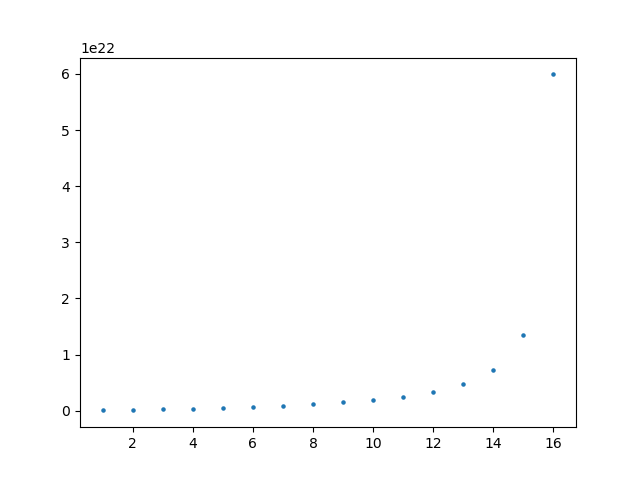

In [28]:
plt.scatter(np.linspace(1,16,16),output[23],s=5)

In [16]:
Mcloud,Pressure,Metallicity,RadField,redshift =  2287325.88926933, 817277.5032954299, 0.0120266085272009, 1.38921887268225, 2.26

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)
print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000004327103333 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48662858364432227 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.40810375763558904 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4803798789184761 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.43654837158198345 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.574633193572287 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7496144416117729 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 107

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.064640e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.777262e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.052859e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 20.477505, Td = 10.851431, residual = 5.116592e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.016696344497792004 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.027539838763809277 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03982478116651844 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.053876886351907016 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5027855322230557 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.49796842758545723 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 356.7335399822938 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6282.457203329714 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.086473e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.802206e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.552682e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 20.464175, Td = 10.851431, residual = 6.513848e-04
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000002431396273 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4871193034467395 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.40905970495246635 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4840826669038284 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.43728668790989056 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5415364946834182 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.035784e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.830886e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.862730e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 19.403923, Td = 10.834403, residual = 4.846403e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0361286112435073 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04196978196016421 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08234229508802571 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.233568710749779 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5005922860025986 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4778436696949879 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 183.47703009829343 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2466.157201178611 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.295725e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.831622e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.106218e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 19.396805, Td = 10.834403, residual = 3.669664e-04
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999992940761184 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4874405486713622 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4097003763439455 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4864118111738892 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.439858787718985 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5102218433633638 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.050376e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.874814e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.823480e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 19.587704, Td = 10.817062, residual = 4.894757e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03154303891882282 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03832762593292094 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.06575505845865315 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04318275319874465 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06806775463520276 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5011082973633418 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2671224893429913 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.14638970069520774 for species CO
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.133094e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.297565e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.785758e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 18.876255, Td = 10.817062, residual = 3.769017e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.001835159191922786 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0024127648977476657 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.006269959236938849 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04195183554359605 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.005934418850560119 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5007134016321055 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 103.44669934313066 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 728.7493338119411 for species HCO+
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.101588e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.297557e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.754495e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 18.876595, Td = 10.817062, residual = 1.799485e-05
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999993863381794 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48764787737842263 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41012800385172177 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.48717368058962507 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.44239402427272423 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4872086649502675 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.622829e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.590147e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.722701e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 18.233025, Td = 10.799568, residual = 4.515447e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.031123029257244972 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03926636321918808 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0777109073997223 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.2439704915063263 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5005912859541979 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07673585248728276 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 42.2060376047751 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.04814666550896485 for species CO
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.619032e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.651149e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.848525e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 18.230706, Td = 10.799569, residual = 1.272017e-04
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999984605506883 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4877506325771962 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4103539044015123 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.48622143848431965 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.44358122275919976 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4757919520049152 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.617997e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.796291e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.596715e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 17.106643, Td = 10.782144, residual = 4.154318e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03162817890243885 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.04027072323952552 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08783185276547145 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04244693675041189 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5024753699461979 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.15456710481379066 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 98.29265954478693 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17852529192715427 for species H3+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.406782e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.796346e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.731171e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 17.118941, Td = 10.782145, residual = 7.183813e-04
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999691627573994 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.487763593928921 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4103670686573908 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3759626955884171 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.44298492696204006 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4753777917036477 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.519990e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.739828e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.206101e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 16.239379, Td = 10.765090, residual = 3.842129e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03044423769534177 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03976701463343124 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08753022334850014 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04083507759881555 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5021218148991535 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.02163572277877801 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9363075784430442 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 13678.228340648013 for species HCO+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.369546e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.155130e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.350819e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 16.267768, Td = 10.765091, residual = 1.745136e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00011220799058997422 for species HCO+
setChemEquil: abundances converged: {'H+': 1.3695462610318364e-07, 'H2': 0.4998921642358542, 'H3+': 2.2586494224541296e-09, 'He+': 2.985153171874226e-08, 'OHx': 6.600102516035859e-10, 'CHx': 1.3817256704260104e-08, 'CO': 5.2824493421471384e-08, 'C': 3.521228707328416e-07, 'C+': 1.9865567231329935e-06, 'HCO+': 3.609163549773616e-13, 'O': 4.757158545972949e-06, 'M+': 1.9519738446786152e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.155133e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 16.267768, Td = 10.765091, residual = 1.907247e-09
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.74976474898822 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48766308702884975 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41013600908666425 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.37555206166604604 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.44074176753312777 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4858477038307314 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.912312e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.893149e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.566675e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 15.203970, Td = 10.748799, residual = 3.422771e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02483923288391321 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.033000808328606746 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0728814781693754 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.033474144040176346 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5022052842883662 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.010496176214882524 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9657047467320301 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0563571508700933 for species HCO+
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.531962e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.281348e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.715357e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 15.203636, Td = 10.748800, residual = 2.201183e-05
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.749738924341687 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48743253182852087 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.40960982421614134 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3746069374053641 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3523715670774351 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.507952106696433 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.74

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.138563e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.449241e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.195870e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 14.127490, Td = 10.733774, residual = 2.921602e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01606228082743899 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.021167477063992468 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03958777540271452 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.02186118810798998 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4011408661538972 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.016067071094134522 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 41.646200890381955 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4992002573651052 for species HCO+
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.294241e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.674358e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.134769e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 14.055201, Td = 10.733774, residual = 5.143274e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002427898328127842 for species HCO+
setChemEquil: abundances converged: {'H+': 7.294234790652543e-08, 'H2': 0.4961627656573221, 'H3+': 3.233331198940513e-09, 'He+': 1.713013743627806e-08, 'OHx': 4.988445154835332e-09, 'CHx': 2.2553066412862842e-08, 'CO': 2.1504386005873144e-07, 'C': 1.5330159130645852e-06, 'C+': 6.34706427847638e-07, 'HCO+': 2.438203891117666e-12, 'O': 4.590608667491557e-06, 'M+': 1.8546138807864757e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.294235e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.134761e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.294235e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14.055201, Td = 10.733774, residual = 4.331054e-09
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6494216100804596 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.45927976056788133 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4045740327932189 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.37218351111911674 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3498577637626771 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5245634234278767 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 1.597265680287673 for species CO
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.3149007913687001 for species CO
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.12492570066641884 for species CO
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.03589628405598644 for species CO
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residual = 0.0006353270648339349 for species CO
setChemEquil: abundances converged: {'H+': 3.56333208722778e-08, 'H2': 0.4998984247878678, 'H3+': 3.940491982709916e-09, 'He+': 1.1597885744918487e-08, 'OHx': 2.2179625562205953e-08, 'CHx': 2.21194356814973e-08, 'CO': 2.7732736643025074e-07, 'C': 1.923942167663513e-06, 'C+': 1.819267071811673e-07, 'HCO+': 6.028552239414991e-12, 'O': 4.511130390266511e-06, 'M+': 1.685359526483416e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.563332e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.030587e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.016404e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 13.225886, Td = 10.720607, residual = 2.439070e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009060509905856606 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01324272090367895 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.020654041889397123 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04766371677710546 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02151481686091239 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8325879302827726 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.01287476593690351 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 7.915981640474791 for species HCO+
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.428382e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.073101e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.299565e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 13.052846, Td = 10.720607, residual = 1.325691e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0004271979322005848 for species HCO+
setChemEquil: abundances converged: {'H+': 4.428369798694249e-08, 'H2': 0.49979629205353826, 'H3+': 4.8767898582532066e-09, 'He+': 1.1839948528760966e-08, 'OHx': 2.414878803457398e-08, 'CHx': 2.249512983223969e-08, 'CO': 3.2386786057458006e-07, 'C': 1.864765151766508e-06, 'C+': 1.941851449735994e-07, 'HCO+': 8.418519556056415e-12, 'O': 4.462618343859984e-06, 'M+': 1.7476052804933088e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.428370e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.073103e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.299545e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 13.052846, Td = 10.720607, residual = 9.295641e-09
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6492262861691098 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.45871046777516433 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.40314201824864315 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.36964102433409085 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34635931995840896 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3332320965157508 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.571575e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.629785e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.840358e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 11.398496, Td = 10.709918, residual = 1.226912e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004521529489318166 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0066662903219735226 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.011167347234767422 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.02475875759845525 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.011001358754857749 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8580104691700993 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 58.17067371080922 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 9.237056249062686 for species HCO+
setChemEquil: evolved from t =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.794788e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.631662e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.946455e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 11.360279, Td = 10.709918, residual = 3.364095e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001163278755638153 for species HCO+
setChemEquil: abundances converged: {'H+': 1.794786554211733e-08, 'H2': 0.4981841091257597, 'H3+': 4.524292083858101e-09, 'He+': 5.274495149254713e-09, 'OHx': 5.4272694054301026e-08, 'CHx': 3.4112040423740356e-08, 'CO': 9.176444383225452e-07, 'C': 1.3173882772113078e-06, 'C+': 1.3615504901782714e-07, 'HCO+': 2.1901429264382677e-11, 'O': 3.8387043775061686e-06, 'M+': 1.3072137362804198e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.794787e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.946450e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.794787e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 11.360279, Td = 10.709918, residual = 6.309815e-10
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6489091590809386 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4577864991436429 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.40086716580986315 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3658017906936859 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3512980466734178 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.318050838650354 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.975

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.357178e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.535404e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.016570e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.312353, Td = 10.702228, residual = 6.561513e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0011458957829605376 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.001696582435268712 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0030514340367115977 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0055057255055620535 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2968800595851444 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8675594669934622 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 7.45073177813818 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.4878374210826175 for species HCO+
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.596041e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.535408e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.026788e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.312634, Td = 10.702228, residual = 2.719822e-05
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6483656960376083 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4246727979479865 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.36616264420901734 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.31657466319102323 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3113542338370322 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9547478214424739 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.612204e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.649945e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.500216e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.091871, Td = 10.697704, residual = 6.522002e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003823937798621557 for species HCO+
setChemEquil: abundances converged: {'H+': 3.612218742078387e-09, 'H2': 0.49917495539056833, 'H3+': 3.610885121884379e-09, 'He+': 1.2133156505929321e-09, 'OHx': 1.0142979706420018e-07, 'CHx': 2.8384410953983807e-08, 'CO': 2.2536666426924795e-06, 'C': 5.480789078297394e-08, 'C+': 6.840581508822563e-08, 'HCO+': 5.694735084595842e-11, 'O': 2.4554900239145702e-06, 'M+': 7.312372249445897e-08}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.612219e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.500229e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.612219e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10.091871, Td = 10.697704, residual = 6.289915e-10
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6473384925469736 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.42168084193653554 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3554465961345473 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.419370553349674 for species C+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9309503125189709 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6231086809885518 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 171

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.053904e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.637871e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.151671e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.023077, Td = 10.695852, residual = 6.505808e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00012032831287211998 for species HCO+
setChemEquil: abundances converged: {'H+': 2.053907261009783e-09, 'H2': 0.4995180243807473, 'H3+': 2.7681217639186843e-09, 'He+': 7.137053938776628e-10, 'OHx': 1.3756954236850577e-07, 'CHx': 1.6176987139584726e-08, 'CO': 2.3315181329257305e-06, 'C': 2.0208144682470044e-08, 'C+': 3.7360941207898464e-08, 'HCO+': 5.7499473655529677e-11, 'O': 2.341498232039626e-06, 'M+': 7.221328864915076e-08}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.053907e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.151675e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.053907e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10.023077, Td = 10.695852, residual = 2.933116e-10
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6451116370852549 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4137708294558914 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.32777009283774927 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9243675595674686 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9661467912995123 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4346428793669257 for species C+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 40

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.009018e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.688551e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.594970e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.033061, Td = 10.695483, residual = 6.502583e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002401802658120733 for species HCO+
setChemEquil: abundances converged: {'H+': 1.0090229020742534e-09, 'H2': 0.49976546594762583, 'H3+': 1.8204947097229204e-09, 'He+': 3.5870279487360903e-10, 'OHx': 1.991820220716275e-07, 'CHx': 7.3146979524560475e-09, 'CO': 2.3743321961129313e-06, 'C': 7.3875028419251705e-09, 'C+': 1.6236694330446244e-08, 'HCO+': 5.061906083108565e-11, 'O': 2.2370785737191973e-06, 'M+': 6.647464705715329e-08}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.009023e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 8.595018e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.009023e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10.033061, Td = 10.695483, residual = 4.989836e-10
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6403391623067629 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3779124622960244 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5005905156080411 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.986429510561116 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8882678361566196 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 416.1436086470992 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.550928e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.540460e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.868010e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.196469, Td = 10.695476, residual = 6.502521e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0021536971426892038 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.005074069593517638 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11019787887076093 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8233081201778321 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 39.44231171919206 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 6.187142358642731 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4210834879563792 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0012509506484124078 for species He+
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.642286e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.540564e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.886784e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.196479, Td = 10.695476, residual = 9.810806e-07
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7455218082782948 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 712.6810065180894 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 114.18029877962817 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.612934963314447 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5694674234812387 for species C+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 12.546320390311987 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.911024e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.410431e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.717245e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 11.095635, Td = 10.695638, residual = 9.874471e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06670688887904752 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.059996283184310495 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 19.89315028262057 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 5.876503093110689 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3590491928582472 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.00930116904938183 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 10.644550785405233 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0021490256499272498 for species CHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.493966e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.427416e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.872077e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 11.095627, Td = 10.695638, residual = 7.326932e-07
Temperature converged!
Mass of cloud: 2287325.88926933
Pressure of cloud: 817277.5032954299
Metallicity of cloud: 0.0120266085272009
Radiation field of cloud in Habing units: 1.38921887268225
Redshift of cloud: 2.26
H2_lcii: 2.075573158661877e+35
Line Luminosity of CO(1-0): 3.698443369582537e+33
Line Luminosity of CO(2-1): 3.720320807699489e+34
Line Luminosity of CO(3-2): 6.542875108922097e+34
Line Luminosity of CO(4-3): 4.184130341940427e+34
Line Luminosity of CO(5-4): 1.1899096999260103e+34
Line Luminosity of CI(1-0): 2.2949018291449775e+34
Line Luminosity of CI(2-1): 1.4712357666245879e+34
Line Luminosity of CO(6-5): 1.485824445615469e+33
Line Luminosity of CO(7-6): 9.145600562958793e+31
Line Luminosity of CO(8-7): 3.1147038925578507e+30
Line Luminosity of CO(9-8): 6.072257693285955e+28
Line Luminosity of OI(1): 1.6454366617770807e+32
Line Luminosity of OI(2): 1.7755606399800037e+24
Line Lu

In [26]:
Mcloud,Pressure,Metallicity,RadField,redshift =  2387312.52680094, 0.00000000001112683886/kB.value, 0.121734195331834, 0.0605998526098119, 2.26

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)
print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5002003678043208 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28628158860050223 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4159803501684096 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3872288312233255 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.37541802150455617 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.47969436677219546 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4312959270242611 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.55

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.601238e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.890719e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.375306e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 14.970698, Td = 10.768420, residual = 3.320285e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01808986524146361 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02297152493246657 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04225065238139314 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.02508044580955171 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.04213920854198927 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5007618492490721 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.04871338224158195 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 635.1515881919552 for species HCO+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.353423e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.891610e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.402886e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 15.052464, Td = 10.768420, residual = 5.432082e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00022367804106793177 for species HCO+
setChemEquil: abundances converged: {'H+': 3.353423711032588e-08, 'H2': 0.3554194656128672, 'H3+': 1.175885684320936e-10, 'He+': 3.185914152163038e-08, 'OHx': 5.391932222343414e-11, 'CHx': 2.5491932478288035e-08, 'CO': 1.3581711704463084e-08, 'C': 5.370899546181337e-07, 'C+': 2.3770675189085507e-05, 'HCO+': 2.844332510196328e-14, 'O': 4.868004246587194e-05, 'M+': 1.926769970566848e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.353424e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.353424e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 15.052464, Td = 10.768420, residual = 9.593693e-09
Temperature converged!
Finding equilibrium for zone 2 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5002013325182257 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2862844345210144 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41599681905734176 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.38724994681478575 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.37546285064389706 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4792301399256257 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.656836e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.030961e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.324861e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 14.974081, Td = 10.765774, residual = 3.321794e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.021792789274552304 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026557951826059245 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05728317389163795 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1.1211989971944125 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5004074253058395 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03213597127099255 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 134.89940553080908 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5001529594315064 for species HCO+
setChemEquil: evolved from t = 25

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.535366e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.021664e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.364542e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 15.085905, Td = 10.765774, residual = 7.412479e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003719477739083654 for species HCO+
setChemEquil: abundances converged: {'H+': 6.535369773318214e-09, 'H2': 0.49959888893397997, 'H3+': 1.320454281797919e-10, 'He+': 1.8069745110352786e-08, 'OHx': 7.602704612840689e-11, 'CHx': 4.715733932864072e-08, 'CO': 4.1754289427371374e-08, 'C': 8.272989511791227e-07, 'C+': 2.3430628439007723e-05, 'HCO+': 4.0327523079521276e-14, 'O': 4.865184777500752e-05, 'M+': 1.9005571189542585e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.535370e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.021680e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.535370e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 15.085905, Td = 10.765774, residual = 1.469812e-08
Temperature converged!
Finding equilibrium for zone 3 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5001992143517844 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28627855396122714 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41599646856946204 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.38725026201279256 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3754629093085494 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4787749025610426 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.246630e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.287772e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.283761e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 13.969937, Td = 10.762851, residual = 2.841772e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.020681718919028702 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02527604051119181 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.061177525661015864 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.02673744422123958 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5021178697634283 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.009115497252869087 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 118.93600341312538 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5001985648243557 for species HCO+
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.145841e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.288032e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.327472e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 14.103280, Td = 10.762851, residual = 9.454765e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0005557755114852236 for species HCO+
setChemEquil: abundances converged: {'H+': 8.145846956845332e-09, 'H2': 0.4735598065645152, 'H3+': 1.0492295490387248e-10, 'He+': 1.600444006021172e-08, 'OHx': 7.114927385172272e-11, 'CHx': 5.4616654704841765e-08, 'CO': 8.818231065602908e-08, 'C': 1.1404438857505758e-06, 'C+': 2.306359621295346e-05, 'HCO+': 3.62790771455388e-14, 'O': 4.860542463639981e-05, 'M+': 1.8686857391215894e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.145847e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.145847e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 14.103281, Td = 10.762851, residual = 2.622201e-08
Temperature converged!
Finding equilibrium for zone 4 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5001933130168827 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2862619590399268 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4159789942141221 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.38721568542542495 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3753952646165045 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4782980258505033 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.628283e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.811490e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.206217e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 13.085483, Td = 10.759608, residual = 2.357944e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.019351823945430446 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024740943204899946 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.056569645226931975 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.025565001974674373 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5014699580609915 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.02483537600745067 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 375.87941004538595 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5002041519413818 for species HCO+
setChemEquil: evolved from t =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.857765e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.811632e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.257820e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 13.245264, Td = 10.759609, residual = 1.206321e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0008423626232202386 for species HCO+
setChemEquil: abundances converged: {'H+': 4.857770726736405e-09, 'H2': 0.48594180066232223, 'H3+': 8.814856994652216e-11, 'He+': 1.144498483487291e-08, 'OHx': 7.18704333733873e-11, 'CHx': 7.025228337876408e-08, 'CO': 2.3119695098543094e-07, 'C': 1.665684516641809e-06, 'C+': 2.237970530802442e-05, 'HCO+': 3.5603700584994613e-14, 'O': 4.846240927626723e-05, 'M+': 1.8210195311022814e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.857771e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.857771e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13.245264, Td = 10.759609, residual = 4.310117e-08
Temperature converged!
Finding equilibrium for zone 5 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5001828948795167 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28623256255307583 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4159422000769176 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.38714172533921964 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3752512505559392 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4777434999390504 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.690658e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.566175e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.058507e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 11.938444, Td = 10.755995, residual = 1.623699e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014789108592592082 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.021247815254447855 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.013659476953853944 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.02118529471374153 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5007681607477255 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.02659771554163215 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5000492871272919 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.28467017971785125 for species HCO+
setChemEquil: evolved from t =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.202854e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.565947e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.111511e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 12.094406, Td = 10.755995, residual = 1.289534e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.001066020239966381 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0012564686801463942 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.004337185390838272 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.3680448341074523 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5003721699331656 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0022405362096797887 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.002522002596667461 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2283.696691712262 for species HCO+
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.232728e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.565943e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.114035e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 12.101732, Td = 10.755995, residual = 6.054048e-04
Temperature converged!
Finding equilibrium for zone 6 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5001672840355815 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28618843358372403 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.415883809473785 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.387023632716749 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3750214053387051 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.47700239650065357 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.575204e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.382007e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.492003e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.110763, Td = 10.751950, residual = 6.993619e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009551404776133587 for species HCO+
setChemEquil: abundances converged: {'H+': 4.5752100861613396e-10, 'H2': 0.4958089518002843, 'H3+': 7.220788214905667e-11, 'He+': 8.110566563224989e-10, 'OHx': 9.158634337523489e-11, 'CHx': 8.855038324266932e-08, 'CO': 7.02432033830944e-06, 'C': 2.4854635081550726e-06, 'C+': 1.4748504782242891e-05, 'HCO+': 6.109895283514629e-14, 'O': 4.166926614751451e-05, 'M+': 1.7018326524143442e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.575210e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.575210e-10) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 10.110763, Td = 10.751950, residual = 1.189901e-08
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5001460359180088 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28612828666244083 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4158022093492626 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.38685788168792234 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3746982140351057 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.47587271528488573 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.779646e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.850009e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.471295e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 9.351667, Td = 10.747407, residual = 6.954305e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004163742265410386 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.005977482187464744 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01567878258159383 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.19411562783750325 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.014325966823462544 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6656995828065166 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.6276314032007684 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2952140994554303 for species HCO+
setChemEquil: evolved from t = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.654023e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.846775e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 7.154943e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 9.343723, Td = 10.747407, residual = 8.501297e-04
Temperature converged!
Finding equilibrium for zone 8 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5001192348979591 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2860523226370282 for species CHx
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41569778091452747 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4030017675194709 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3565225309218857 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.34938769784170687 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.354474e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.524508e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.927255e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 9.120774, Td = 10.742286, residual = 9.639812e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0030589985719204904 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.005149510733875928 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.008184521255403698 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.019111086066339267 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2373525852130408 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.020995166110942876 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 22.335127276790967 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.10282541004167611 for species H3+
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.511961e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.522871e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.745794e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 9.119030, Td = 10.742286, residual = 1.913069e-04
Temperature converged!
Finding equilibrium for zone 9 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000879445623903 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48993992182588886 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41557475689278955 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.40272009606286574 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3559289623250389 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.34456246654228284 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.818247e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.412496e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.033059e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 9.018260, Td = 10.736501, residual = 1.088613e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0016270176988331109 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0030044346356923324 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.004639372996766866 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.008676866215529433 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.020265033567397728 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.20673220785225666 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.02290501349989338 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.566803954591893 for species HCO+
setChemEquil: evolved from

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.214480e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.404158e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.704670e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 9.017970, Td = 10.736501, residual = 3.222573e-05
Temperature converged!
Finding equilibrium for zone 10 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000547498392061 for species CHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4943120349948197 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41607516299005753 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.40249498717436516 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.35529106256136356 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3432666050864853 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.231180e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.856783e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.275537e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.963431, Td = 10.729978, residual = 1.156442e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0009665802744758256 for species HCO+
setChemEquil: abundances converged: {'H+': 3.2310832098982556e-11, 'H2': 0.49990715266442204, 'H3+': 7.171685073204702e-10, 'He+': 9.616281327795832e-11, 'OHx': 8.577111157655387e-09, 'CHx': 5.610749769420628e-09, 'CO': 2.3950886610049568e-05, 'C': 1.5478480056131458e-07, 'C+': 2.3552693522185584e-07, 'HCO+': 2.9936097710918766e-11, 'O': 2.473418447913963e-05, 'M+': 1.9115031032582835e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.231083e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.275528e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.231083e-11) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8.963431, Td = 10.729978, residual = 7.124784e-11
Temperature converged!
Finding equilibrium for zone 11 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000286769654241 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49426175456079235 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41595266852593193 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.40220772519333936 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3546489611514497 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.34191580303827285 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.145602e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.230048e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.706466e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.934152, Td = 10.722686, residual = 1.193004e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0008844478497647135 for species HCO+
setChemEquil: abundances converged: {'H+': 2.1455113465730007e-11, 'H2': 0.49996383716366316, 'H3+': 7.025120967088417e-10, 'He+': 6.825687456202004e-11, 'OHx': 2.0401205859203442e-08, 'CHx': 2.6183379818667125e-09, 'CO': 2.415446602282878e-05, 'C': 1.0598496066806338e-07, 'C+': 8.37234499366586e-08, 'HCO+': 4.6298576019316144e-11, 'O': 2.4518764605343563e-05, 'M+': 1.8608386693645967e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.145511e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.706458e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.145511e-11) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 8.934152, Td = 10.722686, residual = 7.547599e-11
Temperature converged!
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000484100731312 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49422433234394314 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4159125680945035 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3636039863042966 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34646376687805636 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3388142225583769 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.347533e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.871980e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.038626e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.920706, Td = 10.714732, residual = 1.209875e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0010085689509367057 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0019372534902242222 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.003305891873019773 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0055793006237701 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.010894733819299951 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.018790699779039688 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.21983977264032561 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.012539677335282162 for species He+
setChemEquil: evolved fr

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.143766e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.875195e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.989973e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.920705, Td = 10.714732, residual = 1.392790e-07
Temperature converged!
Finding equilibrium for zone 13 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000852827338208 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49420359732255303 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41585639347876546 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3633997946235169 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3458423950715098 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.33704472383056294 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.788649e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.726746e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.256110e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.916672, Td = 10.706574, residual = 1.214947e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0010321706193008318 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0019848272189453287 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.00339575350060084 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.00571039494266623 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.010866911549674452 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.023869631452489548 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.19382176991118705 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.04537222346546388 for species He+
setChemEquil: evolved from

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.620035e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.731299e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.204676e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.916671, Td = 10.706574, residual = 3.048503e-08
Temperature converged!
Finding equilibrium for zone 14 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5001722488938614 for species OHx
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4941864252371855 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.415778645163312 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.36296224877371586 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.34428868961181036 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3316376825759455 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.01

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.027820e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.128910e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.604995e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.918568, Td = 10.699471, residual = 1.212562e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0018413056737855982 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.003434968305981334 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.005259033669610114 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.008577484388071044 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.022641385158164162 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03609028058307007 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.16923309173987744 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.269002117716538 for species He+
setChemEquil: evolved from t = 25

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.022685e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.126640e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.346850e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.918568, Td = 10.699471, residual = 2.932882e-09
Temperature converged!
Finding equilibrium for zone 15 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.749990473196026 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4474112225640713 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3850455536394122 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3547298029423458 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.33092298410634724 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4421328665538027 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.955

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.640021e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.039108e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.510948e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.932891, Td = 10.695737, residual = 1.194584e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.004838301404304746 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0072277316219351295 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.01199733360080768 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.036812691097744876 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.2752879435161889 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.481532634380766 for species C+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.8422891102227243 for species He+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 16.40573091197559 for species He+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.639482e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.033816e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.363384e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.932891, Td = 10.695737, residual = 4.173673e-09
Temperature converged!
Finding equilibrium for zone 16 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6480006243140594 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.42544207791796207 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.3994674750077043 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 6.46020963946791 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.317029788287719 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5002388205245327 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.47

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.758300e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.075420e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.292262e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 9.222062, Td = 10.695181, residual = 8.435622e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.018863284007172743 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.12501908244569182 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4912967093450168 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 11.941990901787861 for species C+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 162.5621626788373 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.500057055432449 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.020563835396578356 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.49683469532102664 for species He+
setChemEquil: evolved from t = 2550000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.758297e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.091923e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.252750e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 9.222066, Td = 10.695181, residual = 4.473776e-07
Temperature converged!
Mass of cloud: 2387312.52680094
Pressure of cloud: 80588.38893314985
Metallicity of cloud: 0.121734195331834
Radiation field of cloud in Habing units: 0.0605998526098119
Redshift of cloud: 2.26
H2_lcii: 6.68125493963838e+34
Line Luminosity of CO(1-0): 3.349449900640279e+33
Line Luminosity of CO(2-1): 1.6099716808803657e+34
Line Luminosity of CO(3-2): 1.6156116190864444e+34
Line Luminosity of CO(4-3): 9.177619735336516e+33
Line Luminosity of CO(5-4): 3.277395399241482e+33
Line Luminosity of CI(1-0): 1.331172143878929e+34
Line Luminosity of CI(2-1): 5.192954250662199e+33
Line Luminosity of CO(6-5): 3.0610875746310178e+32
Line Luminosity of CO(7-6): 1.051312018298323e+31
Line Luminosity of CO(8-7): 1.6984864083250034e+29
Line Luminosity of CO(9-8): 1.3653584907077272e+27
Line Luminosity of OI(1): 2.16395861484151e+30
Line Luminosity of OI(2): 8.720241131963567e+21
Line Lumin

In [25]:
Mcloud,Pressure,Metallicity,RadField,redshift =  2288637.48762866, 74876.45795610923, 0.039951686333979, 0, 2.26

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift],NZONES=16)
print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])

Finding equilibrium for zone 1 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 57532310448148.89 sec
setChemEquil: evolved from t = 0.0 to 57532310448148.89 sec, residual = 0.1426084977624924 for species M+
setChemEquil: evolved from t = 57532310448148.89 to 172596931344446.7 sec, residual = 0.19619750276511083 for species M+
setChemEquil: evolved from t = 172596931344446.7 to 402726173137042.25 sec, residual = 0.21217322951209638 for species M+
setChemEquil: evolved from t = 402726173137042.25 to 862984656722233.4 sec, residual = 0.15609837515770986 for species M+
setChemEquil: evolved from t = 862984656722233.4 to 1783501623892615.5 sec, residual = 0.265411820735616 for species M+
setChemEquil: evolved from t = 1783501623892615.5 to 3624535558233380.0 sec, residual = 0.25752299319910343 for species M+
setChemEquil: evolved from t = 3624535558233380.0 to 7306603426914909.0 sec, residual = 0.8762049667162226 for 

setChemEquil: updated temperatures to Tg = 8.901386, Td = 10.695460, residual = 1.234205e-01
setChemEquil: evolved from t = 0.0 to 4386012837827.874 sec, residual = 0.0001 for species H+
setChemEquil: abundances converged: {'H+': 2.7214174933309206e-18, 'H2': 0.49999999999999856, 'H3+': -1.2528904445302246e-17, 'He+': 9.478975561584083e-19, 'OHx': -3.497158825339427e-18, 'CHx': -5.981446334447173e-17, 'CO': 1.2441926144925456e-15, 'C': 7.990337267611425e-06, 'C+': -4.916889184974878e-22, 'HCO+': 2.7524086668693716e-21, 'O': 1.5980674534350887e-05, 'M+': 1.6565119479854118e-07}
setChemEquil: updated temperatures to Tg = 8.901386, Td = 10.695460, residual = 3.241047e-12
Temperature converged!
Finding equilibrium for zone 7 / 16
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 21612033373342.098 sec
setChemEquil: evolved from t = 0.0 to 21612033373342.098 sec, residual = 0.16754632199333064 for species M+
setChemEquil: ev

setChemEquil: evolved from t = 306871714537821.0 to 614946847564025.5 sec, residual = 0.21538823874996327 for species M+
setChemEquil: evolved from t = 614946847564025.5 to 1231097113616434.5 sec, residual = 0.5002439022327723 for species CHx
setChemEquil: evolved from t = 1231097113616434.5 to 2463397645721253.0 sec, residual = 0.17403487099241421 for species M+
setChemEquil: evolved from t = 2463397645721253.0 to 4927998709930890.0 sec, residual = 0.3986518469070375 for species M+
setChemEquil: evolved from t = 4927998709930890.0 to 9857200838350164.0 sec, residual = 0.5002442154634463 for species CO
setChemEquil: evolved from t = 9857200838350164.0 to 1.971560509518871e+16 sec, residual = 0.14755738066754054 for species M+
setChemEquil: evolved from t = 9857200838350164.0 to 1e+16 sec, residual = 0.002930607585906353 for species M+
setChemEquil: reached maximum time of 1e+16 sec without converging
Finding equilibrium for zone 12 / 16
setChemEquil: estimating characteristic equilibra

ValueError: array must not contain infs or NaNs

In [9]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1.e4, 1.e3, 1.0,1.0, 0.0

output=submm_luminosity([Mcloud,Pressure,Metallicity,RadField,redshift])
print("Mass of cloud:",output[0])
print("Pressure of cloud:",output[1])
print("Metallicity of cloud:",output[2])
print("Radiation field of cloud in Habing units:",output[3])
print("Redshift of cloud:",output[4])
print("H2_lcii:",output[5])
print("Line Luminosity of CO(1-0):",output[6])
print("Line Luminosity of CO(2-1):",output[7])
print("Line Luminosity of CO(3-2):",output[8])
print("Line Luminosity of CO(4-3):",output[9])
print("Line Luminosity of CO(5-4):",output[10])
print("Line Luminosity of CI(1-0):",output[11])
print("Line Luminosity of CI(2-1):",output[12])
print("Line Luminosity of CO(6-5):",output[13])
print("Line Luminosity of CO(7-6):",output[14])
print("Line Luminosity of CO(8-7):",output[15])
print("Line Luminosity of CO(9-8):",output[16])
print("Line Luminosity of OI(1):",output[17])
print("Line Luminosity of OI(2):",output[18])
print("Line Luminosity of OI(3):",output[19])
print("Fraction of H_2:",output[20])

Finding equilibrium for zone 1 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999998987864547 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48795107970215823 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41081929166028 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5085236511149873 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.45174318721125806 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.39502970906431856 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.33768625645552286 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.96

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/chemistry/NL99_GC.py:257: RuntimeWarning: divide by zero encountered in log
  (n/ncr) / (1.0+n/ncr) * np.log(kHh) +
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/chemistry/NL99_GC.py:258: RuntimeWarning: divide by zero encountered in log
  1.0 / (1.0+n/ncr) * np.log(kHl))
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/chemistry/NL99_GC.py:263: RuntimeWarning: divide by zero encountered in log
  (n/ncr) / (1.0+n/ncr) * np.log(kH2h) +
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/chemistry/NL99_GC.py:264: RuntimeWarning: divide by zero encountered in log
  1.0 / (1.0+n/ncr) * np.log(kH2l))


setChemEquil: evolved from t = 20470000000.0 to 40950000000.0 sec, residual = 0.18876740890569976 for species H+
setChemEquil: evolved from t = 40950000000.0 to 81910000000.0 sec, residual = 19.40051099786643 for species HCO+
setChemEquil: evolved from t = 81910000000.0 to 163830000000.0 sec, residual = 0.1578255881625833 for species H+
setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.12731915862314613 for species H+
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.07140765223866019 for species H+
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.04920324669419385 for species He+
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.06805659530087338 for species He+
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.12340501806957471 for species H+
setChemEquil: evolved from t = 5242870000000.0 to 10485750000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.567491e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999841e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.080165e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 92.430728, Td = 14.575239, residual = 8.918109e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009332189744726715 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.01771123064342328 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03211249553729967 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.05395584354459981 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08104145508601202 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10560195326171662 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11711886035596863 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12280718377189614 for species OHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.425098e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999640e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.566973e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 90.620682, Td = 14.575239, residual = 1.997387e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CO
setChemEquil: abundances converged: {'H+': 2.4250978524020133e-05, 'H2': 5.867041544672517e-06, 'H3+': 2.0462698300273416e-13, 'He+': 3.227488419176006e-05, 'OHx': 2.3334696668581028e-15, 'CHx': 8.406809928538661e-15, 'CO': 1.1531351736108584e-16, 'C': 2.855132565074507e-08, 'C+': 0.00019997144846748734, 'HCO+': 2.9363276092134035e-18, 'O': 0.0003999999999974932, 'M+': 1.9994568228577043e-07}
setChemEquil: updated temperatures to Tg = 90.620682, Td = 14.575239, residual = 5.520853e-09
Temperature converged!
Finding equilibrium for zone 2 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999986816490727 for species H+
setChemEquil: evolved from t = 1000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.175940e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999799e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.072652e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 84.441615, Td = 14.569698, residual = 8.815750e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.009971277202698192 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.018845982968187402 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.033921689946257216 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.056332656712629325 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08321809145694081 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10615684272935133 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11443021438377876 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12607493199773145 for species OHx
setChemEquil: evolved from t = 25

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.994084e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999648e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.484113e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 83.024013, Td = 14.569698, residual = 1.707461e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CO
setChemEquil: abundances converged: {'H+': 1.9940836863953832e-05, 'H2': 7.612541022951154e-06, 'H3+': 2.3534846245738876e-13, 'He+': 2.8303257009281997e-05, 'OHx': 3.0001937284188747e-15, 'CHx': 1.219354125103636e-14, 'CO': 1.8094738889350518e-16, 'C': 3.277986733541334e-08, 'C+': 0.00019996721979182434, 'HCO+': 3.707353630217181e-18, 'O': 0.0003999999999967103, 'M+': 1.9993759022844203e-07}
setChemEquil: updated temperatures to Tg = 83.024013, Td = 14.569698, residual = 5.098834e-09
Temperature converged!
Finding equilibrium for zone 3 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999998110067728 for species H+
setChemEquil: evolved from t = 10000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.806072e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.969698e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.065348e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 77.398065, Td = 14.563668, residual = 8.707978e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010691077448745534 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.020113166651087533 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.035911407739422474 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.05888008629471331 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08544667282419194 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.106578234052642 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11143156421487532 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12986027691234536 for species OHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.630575e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.975269e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.407535e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 76.291153, Td = 14.563668, residual = 1.450904e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species HCO+
setChemEquil: abundances converged: {'H+': 1.630574920156812e-05, 'H2': 0.0012283730072565281, 'H3+': 3.3534025847096495e-11, 'He+': 2.4285629372977412e-05, 'OHx': 4.800002048425739e-13, 'CHx': 2.209321394932906e-12, 'CO': 3.660686634581261e-14, 'C': 3.78105040058465e-08, 'C+': 0.00019996218723522587, 'HCO+': 5.824139760519427e-16, 'O': 0.0003999999994830281, 'M+': 1.9992800756554763e-07}
setChemEquil: updated temperatures to Tg = 76.291154, Td = 14.563668, residual = 4.626972e-09
Temperature converged!
Finding equilibrium for zone 4 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999976409944835 for species H+
setChemEquil: evolved from t = 10000000.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.468169e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.937738e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.058458e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 71.060902, Td = 14.557080, residual = 8.592756e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01149687777756947 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.021514326797355765 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03806074369293 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.061509960256532326 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08749599990115065 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10636987755120131 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.10705544523642241 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.13308912814629092 for species OHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.322893e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.941918e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.340123e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 70.218695, Td = 14.557080, residual = 1.199406e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.987755578433344e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 1.3228933763031487e-05, 'H2': 0.0028974819242458183, 'H3+': 6.938907682417508e-11, 'He+': 2.0627303889336358e-05, 'OHx': 1.1207882956155705e-12, 'CHx': 5.8811857188830634e-12, 'CO': 1.0688608008235247e-13, 'C': 4.3943981952759464e-08, 'C+': 0.0001999560497909719, 'HCO+': 1.3321475866079967e-15, 'O': 0.0003999999987709363, 'M+': 1.999163678133039e-07}
setChemEquil: updated temperatures to Tg = 70.218696, Td = 14.557080, residual = 4.120188e-09
Temperature converged!
Finding equilibrium for zone 5 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999997178833099 for species H+
setChemEquil: evolved 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.157929e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.892267e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.051906e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 65.318498, Td = 14.549855, residual = 8.469040e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.012403257401638723 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.023069694835823107 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04038874674335435 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06422778049599898 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08936199527439481 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10555846167941829 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.10135100876888958 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.17228512899293114 for species CO
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.064123e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.897716e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.281207e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 64.674870, Td = 14.549855, residual = 9.951756e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.600572242152161e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 1.064122677736863e-05, 'H2': 0.0051088711787687785, 'H3+': 1.0654199600693083e-10, 'He+': 1.7330939572346705e-05, 'OHx': 1.9526716979188933e-12, 'CHx': 1.1768486303587626e-11, 'CO': 2.3600358068442354e-13, 'C': 5.150925822173548e-08, 'C+': 0.00019994847873316694, 'HCO+': 2.267394174686102e-15, 'O': 0.0003999999978100086, 'M+': 1.999020707013959e-07}
setChemEquil: updated temperatures to Tg = 64.674870, Td = 14.549855, residual = 3.699840e-09
Temperature converged!
Finding equilibrium for zone 6 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999966822543906 for species H+
setChemEquil: evolved 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.871954e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.822831e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.045630e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 60.168932, Td = 14.541894, residual = 8.338013e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013435523001102512 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024814874252952035 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.042929815742229094 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08175059161858556 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09100182537400237 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10403692770687734 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09394936238166407 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.455964449108775 for species CO
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.487739e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.830911e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.229638e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 59.688473, Td = 14.541894, residual = 8.049434e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.048162342861765e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 8.487738693154117e-06, 'H2': 0.008450218072336159, 'H3+': 1.52412786337558e-10, 'He+': 1.4336914142510061e-05, 'OHx': 3.1881626121739478e-12, 'CHx': 2.222279482567468e-11, 'CO': 4.959623720245553e-13, 'C': 6.087297166667137e-08, 'C+': 0.0001999391042014994, 'HCO+': 3.610129679494815e-15, 'O': 0.00039999999631225595, 'M+': 1.99884475703894e-07}
setChemEquil: updated temperatures to Tg = 59.688473, Td = 14.541894, residual = 3.156179e-09
Temperature converged!
Finding equilibrium for zone 7 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999996121304021 for species H+
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.607553e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.714675e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.039573e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 55.637606, Td = 14.533080, residual = 8.202655e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014628534173758756 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.055713002478670726 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07424685449117585 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07987240864092371 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09237368298381443 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10168677475372745 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.08432002315081155 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6714201625188899 for species CO
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.713161e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.727165e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.184773e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 55.273847, Td = 14.533080, residual = 6.581049e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 8.659882727868329e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 6.713160431129546e-06, 'H2': 0.013638404389336707, 'H3+': 2.1147499428451968e-10, 'He+': 1.1636596864738848e-05, 'OHx': 5.0794394040454945e-12, 'CHx': 4.120202853011464e-11, 'CO': 1.0334485765470551e-12, 'C': 7.248298755184998e-08, 'C+': 0.00019992747480517063, 'HCO+': 5.605309705638107e-15, 'O': 0.00039999999388133834, 'M+': 1.9986282875112362e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.713160e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.713160e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 55.273847, Td = 14.533080, residual = 2.772381e-09
Temperature converged!
Finding equilibrium for zone 8 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999954657294965 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4883767319166298 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41181786505570783 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5002788565751006 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4332947367581602 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.38724821377238405 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.362556e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.544715e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.033686e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 51.589206, Td = 14.523268, residual = 8.061610e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.03943282067576559 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0595421883697802 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07609036713546657 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07658190909354567 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09333420337817766 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.23195720379640883 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.07139548160763287 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7376760498788566 for species CO
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.247277e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.564230e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.145668e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 51.307957, Td = 14.523268, residual = 5.481583e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 8.494077381948628e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 5.247276741048276e-06, 'H2': 0.021785853831947005, 'H3+': 2.882438898373038e-10, 'He+': 9.206596597991834e-06, 'OHx': 8.007918969484172e-12, 'CHx': 7.617369191674067e-11, 'CO': 2.1719031356691297e-12, 'C': 8.713016833879252e-08, 'C+': 0.00019991279148588059, 'HCO+': 8.603351294523617e-15, 'O': 0.0003999999898112315, 'M+': 1.9983577035605861e-07}
setChemEquil: updated temperatures to Tg = 51.307957, Td = 14.523268, residual = 2.491995e-09
Temperature converged!
Finding equilibrium for zone 9 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999946789131533 for species H+
setChemEquil: evolved from

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.132957e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.275943e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.027864e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 47.992905, Td = 14.512277, residual = 7.916359e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04360990982290158 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06356794587131165 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07736713504026127 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0759820958542059 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09378592655802631 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.7303116813645714 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.07202648407099232 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9155314475917089 for species CO
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.036488e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.306996e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.111852e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 47.765891, Td = 14.512277, residual = 4.752649e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 8.727986785239672e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 4.036487266378872e-06, 'H2': 0.034648203848011726, 'H3+': 3.879631223509265e-10, 'He+': 7.054501697866051e-06, 'OHx': 1.2572397016152054e-11, 'CHx': 1.4143939513129693e-10, 'CO': 4.644616710344585e-12, 'C': 1.0586408252717036e-07, 'C+': 0.0001998939899259616, 'HCO+': 1.3142933342267421e-14, 'O': 0.00039999998276969576, 'M+': 1.9980156883877798e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.036487e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.036487e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 47.765891, Td = 14.512277, residual = 2.337182e-09
Temperature converged!
Finding equilibrium for zone 10 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999993712166809 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48857603172724284 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5555605516807365 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4962029154562204 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4319679849542365 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3975114498069945 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.161464e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.853604e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.022022e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 44.839593, Td = 14.499883, residual = 7.769828e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.048483804138026665 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06777605787108898 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0778591306692965 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07907836937287172 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09356828995575373 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08633313862448544 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2518766707187923 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 4.709035403357161 for species CO
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.034999e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.903616e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.083098e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 44.641138, Td = 14.499883, residual = 4.445564e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.738284941529507e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 3.0349985898777227e-06, 'H2': 0.054817664716417004, 'H3+': 5.147866442034288e-10, 'He+': 5.204979869518706e-06, 'OHx': 1.9651702329937507e-11, 'CHx': 2.6394406128203463e-10, 'CO': 1.0133499571734746e-11, 'C': 1.3019884189710434e-07, 'C+': 0.00019986952667731337, 'HCO+': 1.9991676772845688e-14, 'O': 0.0003999999701948316, 'M+': 1.9975781287531248e-07}
setChemEquil: updated temperatures to Tg = 44.641138, Td = 14.499883, residual = 2.396169e-09
Temperature converged!
Finding equilibrium for zone 11 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999924970910037 for species H+
setChemEquil: evolve

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.119527e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.210348e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.016109e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 42.124306, Td = 14.485797, residual = 7.626074e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05426317228244493 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07213683216457367 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0772375196711994 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08214857358041872 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09372888016447534 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07635226405934525 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5878061304245833 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 179.0073103553237 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.205717e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.287144e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.059316e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 41.932379, Td = 14.485797, residual = 4.577059e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00012048455477509101 for species HCO+
setChemEquil: abundances converged: {'H+': 2.2057167092506475e-06, 'H2': 0.0856416747988631, 'H3+': 6.674891301852187e-10, 'He+': 3.6884254340547533e-06, 'OHx': 3.037510400130564e-11, 'CHx': 4.924614520865404e-10, 'CO': 2.273787508479871e-11, 'C': 1.6244361558325265e-07, 'C+': 0.00019983704116255423, 'HCO+': 3.0095827906167525e-14, 'O': 0.00039999994685667933, 'M+': 1.9970093621444474e-07}
setChemEquil: updated temperatures to Tg = 41.932379, Td = 14.485797, residual = 2.724219e-09
Temperature converged!
Finding equilibrium for zone 12 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999909336510606 for species H+
setChemEquil: evolved 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.224250e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.288383e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.010079e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 39.827217, Td = 14.469649, residual = 7.489154e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06122383406409215 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07655578711459188 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07491467334719848 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08512634304744959 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.3849934047889676 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.06152634471740437 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7525950185724137 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 26.971930863435084 for species CO
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.526622e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.399642e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.040448e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 39.625035, Td = 14.469649, residual = 5.102368e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001627445534255756 for species HCO+
setChemEquil: abundances converged: {'H+': 1.5266213456744355e-06, 'H2': 0.13001714333713935, 'H3+': 8.305870654234393e-10, 'He+': 2.5249179185633978e-06, 'OHx': 4.570555467476522e-11, 'CHx': 9.064518837916702e-10, 'CO': 5.247668789119472e-11, 'C': 2.0620379000582842e-07, 'C+': 0.00019979283674946753, 'HCO+': 4.4166129818291374e-14, 'O': 0.0003999999017742366, 'M+': 1.996254939116247e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.526621e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.526621e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 39.625035, Td = 14.469649, residual = 3.365056e-09
Temperature converged!
Finding equilibrium for zone 13 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499175215822322 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4890081052588957 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5538115759430656 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.48740105788476273 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4348010853804065 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.45076004200732833 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.570058e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.104648e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.003988e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 37.874901, Td = 14.450948, residual = 7.359729e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06964639762665759 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08073878445675209 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07125134108526243 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08763211684300098 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08502811307607028 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03828871246887211 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.28543424121027794 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.06847177098196044 for species C
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.710746e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.115888e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.025604e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 37.804050, Td = 14.450948, residual = 1.874157e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 7.325897087717692e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 9.71074552660203e-07, 'H2': 0.19420512764972359, 'H3+': 9.993248190321935e-10, 'He+': 1.6586370040986699e-06, 'OHx': 6.777796541745447e-11, 'CHx': 1.6755780877346917e-09, 'CO': 1.2478242098492825e-10, 'C': 2.68080346938638e-07, 'C+': 0.00019973011939351858, 'HCO+': 6.399459260950692e-14, 'O': 0.00039999980737588783, 'M+': 1.995217096513841e-07}
setChemEquil: updated temperatures to Tg = 37.804050, Td = 14.450948, residual = 1.269038e-09
Temperature converged!
Finding equilibrium for zone 14 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.749940590733397 for species CO
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.262804e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.787188e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.997824e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 36.045791, Td = 14.429036, residual = 7.225751e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07962130746097007 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0839097919822932 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07717693360105848 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08880713581054822 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0759869927092387 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.26736046816349524 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 184.27656995037376 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 338.05624118201 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.832276e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.793284e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.015450e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 35.984929, Td = 14.429036, residual = 1.691317e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 8.191095280118965e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 5.832275664603439e-07, 'H2': 0.2603355257847066, 'H3+': 1.0591484218854461e-09, 'He+': 1.1215532224570862e-06, 'OHx': 9.007819070839126e-11, 'CHx': 2.832909139375676e-09, 'CO': 2.7673118074311556e-10, 'C': 3.570658743195764e-07, 'C+': 0.00019963982261496613, 'HCO+': 8.289442451826094e-14, 'O': 0.0003999996331076054, 'M+': 1.9937552129839944e-07}
setChemEquil: updated temperatures to Tg = 35.984929, Td = 14.429036, residual = 1.446110e-09
Temperature converged!
Finding equilibrium for zone 15 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499682298910431 for species CO
setChemEquil: evolved from

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.339402e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.516957e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.991284e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 34.118378, Td = 14.403009, residual = 7.069028e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0859325505393631 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09299562039095943 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16598308289654928 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.42014749034892007 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7496166952708643 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9714302582857111 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.141177927677885 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 53.19247299345997 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.289024e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.522942e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.008085e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 34.057123, Td = 14.403009, residual = 1.798585e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00010942468338970279 for species HCO+
setChemEquil: abundances converged: {'H+': 3.289022999361602e-07, 'H2': 0.32385275417459536, 'H3+': 1.0169081541039065e-09, 'He+': 7.752871679490757e-07, 'OHx': 1.1063009606256174e-10, 'CHx': 4.546611665663397e-09, 'CO': 5.984552638536915e-10, 'C': 4.907021121160161e-07, 'C+': 0.0001995041532450476, 'HCO+': 9.869522939463328e-14, 'O': 0.0003999992908160768, 'M+': 1.9916029527370266e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.289023e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.289023e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 34.057123, Td = 14.403009, residual = 1.981769e-09
Temperature converged!
Finding equilibrium for zone 16 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500017151367244 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4897484375646367 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5508055057956818 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4737685794613067 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5002026577668999 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6783592708166579 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.532727e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.436561e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.983728e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 31.936036, Td = 14.371585, residual = 6.868741e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09622190755980053 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11252173789033992 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12026016493367842 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11256739190186749 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10445376864067724 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 107.62662989197413 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1401.4615423138416 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 264.5655263822335 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.766295e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.439155e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.002175e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 31.876495, Td = 14.371585, residual = 1.867890e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001444694035921401 for species HCO+
setChemEquil: abundances converged: {'H+': 1.7662947477571003e-07, 'H2': 0.37804214646823453, 'H3+': 8.907998335443524e-10, 'He+': 5.49424581928359e-07, 'OHx': 1.2656872683405948e-10, 'CHx': 7.020460669002589e-09, 'CO': 1.3476664860205065e-09, 'C': 6.999306817276961e-07, 'C+': 0.00019929170106051952, 'HCO+': 1.085397500773093e-13, 'O': 0.00039999852565610045, 'M+': 1.988300468998193e-07}
setChemEquil: updated temperatures to Tg = 31.876495, Td = 14.371585, residual = 2.715414e-09
Temperature converged!
Finding equilibrium for zone 17 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500429301349449 for species CO
setChemEquil: evolved from

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.064780e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.593273e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.973904e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 29.490201, Td = 14.332888, residual = 6.609043e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.10582674529551639 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.15210370203489054 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08569531156216803 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5025637449302179 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.24881892304885223 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 151.0737258288804 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.04426055465935119 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07710676089136859 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.166359e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.595242e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.996288e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 29.430642, Td = 14.332888, residual = 2.023694e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00020020587228808395 for species HCO+
setChemEquil: abundances converged: {'H+': 9.166355981066892e-08, 'H2': 0.42023785521095747, 'H3+': 7.201155341607298e-10, 'He+': 3.950210392050522e-07, 'OHx': 1.3658856735778242e-10, 'CHx': 1.0620166453741317e-08, 'CO': 3.1645568551701178e-09, 'C': 1.0431032448740668e-06, 'C+': 0.00019894311228478087, 'HCO+': 1.1151540516535007e-13, 'O': 0.0003999966987438036, 'M+': 1.9830162412418888e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.166356e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 9.166356e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 29.430642, Td = 14.332888, residual = 3.656789e-09
Temperature converged!
Finding equilibrium for zone 18 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500945248392894 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4905561176434433 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5475224728134962 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.46180003527369984 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5610456504686936 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7461678759341528 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.127396e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.797111e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.959655e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 26.869115, Td = 14.284056, residual = 6.278255e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11408690221596585 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.21811525362538653 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09946461769305959 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.501225677021333 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 80.36683465566502 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5471284963359702 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.06423448878972526 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.30022373453185525 for species H3+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.655674e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.809651e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.988669e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 26.813892, Td = 14.284057, residual = 2.059469e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002593097936967048 for species HCO+
setChemEquil: abundances converged: {'H+': 4.655671483292634e-08, 'H2': 0.45095171387687905, 'H3+': 5.426002148095401e-10, 'He+': 2.8489596081746575e-07, 'OHx': 1.4062882292903758e-10, 'CHx': 1.6039041518791417e-08, 'CO': 7.770478319203401e-09, 'C': 1.638698690877132e-06, 'C+': 0.00019833749169227368, 'HCO+': 1.0831209632938686e-13, 'O': 0.00039999208878432603, 'M+': 1.9741481386887772e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.655671e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.655671e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 26.813893, Td = 14.284057, residual = 4.283767e-09
Temperature converged!
Finding equilibrium for zone 19 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7501602792508414 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49112442112543875 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5453531606699691 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4558587412463041 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5921621320517176 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8832216729578931 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.090688e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.618180e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.936718e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 24.188195, Td = 14.220497, residual = 5.865752e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12480875825811755 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2630598558014302 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1319285103033151 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 14.28433086727025 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.01651648283445306 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 742.2145776140833 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 168.77008494494316 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 6.691967535583563 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.335008e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.620831e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.976258e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 24.145704, Td = 14.220498, residual = 1.759759e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.000276760765242523 for species HCO+
setChemEquil: abundances converged: {'H+': 2.3350067117555675e-08, 'H2': 0.47189581791446483, 'H3+': 3.82954436365976e-10, 'He+': 2.0220073857971576e-07, 'OHx': 1.389651801429829e-10, 'CHx': 2.461411391051389e-08, 'CO': 2.1090298132526647e-08, 'C': 2.7502498203356375e-06, 'C+': 0.0001972040462138208, 'HCO+': 1.0017861009263271e-13, 'O': 0.00039997877063572374, 'M+': 1.9583597804046153e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.335007e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.335007e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 24.145705, Td = 14.220498, residual = 3.554731e-09
Temperature converged!
Finding equilibrium for zone 20 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7502456338510957 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49185734634985 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5428109423083124 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45134810690426774 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6191645985240288 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9361474109826544 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.436335e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.975545e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.895462e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 21.529894, Td = 14.134334, residual = 5.355295e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.18238100610752317 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0961627983783524 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5009384663701737 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10856212197393234 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.04600529967194111 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.5672320536357258 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7096559028162773 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5321223236862184 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.148042e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.974901e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.951911e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 21.516193, Td = 14.134338, residual = 6.367604e-04
Temperature converged!
Finding equilibrium for zone 21 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7503535669510569 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4928155870076939 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5401240666249967 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44987996035744837 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6397911223272543 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9543359583360131 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.083278e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.463787e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.807909e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 18.888356, Td = 14.010828, residual = 4.705733e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49985162666909844 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.13547076135692349 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 67.01566196698079 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 394.9105950952769 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08060920400304594 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 14584.098368032972 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.823859101298405 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.601152751771347 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.860447e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.460642e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.893468e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 18.941681, Td = 14.010835, residual = 2.815181e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.008010735069222452 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.00038002268259462735 for species H3+
setChemEquil: abundances converged: {'H+': 4.86050006409071e-09, 'H2': 0.49269675290517956, 'H3+': 1.559020928065057e-10, 'He+': 7.347686582186935e-08, 'OHx': 1.184607842141481e-10, 'CHx': 6.489800628673356e-08, 'CO': 4.676815696883577e-07, 'C': 1.0385405483751691e-05, 'C+': 0.00018908204678249276, 'HCO+': -3.170312446809924e-11, 'O': 0.0003995322316732134, 'M+': 1.863580578591869e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.860500e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.893469e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.860500e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 18.941680, Td = 14.010835, residual = 2.795289e-08
Temperature converged!
Finding equilibrium for zone 22 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.750510881289902 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49408749786229034 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5382540854269467 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4514500711188525 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6528451157662274 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9644686229844829 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.131756e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.978052e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.181867e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 14.958656, Td = 13.818702, residual = 3.314908e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7143929287932669 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1479621332294364 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 250.83841986093856 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5001671068767255 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 91.61334811181507 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.02207422761365252 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 189.7565558494616 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.02911684836311912 for species He+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.083158e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.076839e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.402439e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 15.346374, Td = 13.818719, residual = 2.526443e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.39626631724551586 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.017462268752296284 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 228.49132733296057 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5001362786777741 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02428860611637107 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 27.388523882015082 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.02493356706997152 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 14349.704405212899 for species HCO+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.149214e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.076800e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.406170e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 15.354330, Td = 13.818719, residual = 5.181998e-04
Temperature converged!
Finding equilibrium for zone 23 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.750733770441375 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4958670547911035 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5402818499644315 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44960862910529154 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6477524724966952 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.964261982904452 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.087240e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.215733e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.574509e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.502159, Td = 13.478130, residual = 2.580573e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01259379540643013 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07812370824495685 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4960488046200421 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 27.948415589421412 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4949009268868325 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03473655017149513 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.2416818834574643 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.002519398514782889 for species H+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.169601e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.216382e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.583399e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.504133, Td = 13.478130, residual = 1.879127e-04
Temperature converged!
Finding equilibrium for zone 24 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6533454394355638 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4361963401846938 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4392387838389854 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.37195536429154785 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.36276928288576715 for species CHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9238928233168596 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.116808e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.026833e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.906861e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.075188, Td = 12.705396, residual = 4.133900e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02485765120840555 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.038917633175222566 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14590109718701472 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4205189065428192 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.59422860018303 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.326091423836416 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.94831859845879 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.47425721025396017 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.987910e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.066962e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not availa

setChemEquil: evolved from t = 163830000000.0 to 327670000000.0 sec, residual = 0.03782530977550369 for species CHx
setChemEquil: evolved from t = 327670000000.0 to 655350000000.0 sec, residual = 0.025099275264355292 for species CHx
setChemEquil: evolved from t = 655350000000.0 to 1310710000000.0 sec, residual = 0.014292709005516935 for species CHx
setChemEquil: evolved from t = 1310710000000.0 to 2621430000000.0 sec, residual = 0.005215111833099195 for species C
setChemEquil: evolved from t = 2621430000000.0 to 5242870000000.0 sec, residual = 0.0002773441902303997 for species C
setChemEquil: abundances converged: {'H+': 1.987910455772552e-12, 'H2': 0.49997964620498897, 'H3+': 7.55475067791193e-10, 'He+': 3.576279835008252e-11, 'OHx': 3.385096966589423e-08, 'CHx': 1.705050879842255e-09, 'CO': 0.00019946684889253103, 'C': 1.2008589864868063e-07, 'C+': 4.112131873371873e-07, 'HCO+': 1.4705720344590383e-10, 'O': 0.00020049915309368961, 'M+': 1.925160369249156e-07}
setChemEquil: updated te

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.554350e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.581959e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.853459e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.013977, Td = 10.194848, residual = 4.257247e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 1.3944413863527791 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.5014140462535692 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 9.012256264472876 for species H+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 3.3479761135976056 for species H+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.01781710103794909 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.26788634712949544 for species C+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.24229313519509277 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.987015444128484 for species He+
setChemEquil: evolved from t = 2550000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.552969e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.559090e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.367316e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.014087, Td = 10.194847, residual = 1.570929e-05
Temperature converged!
<class 'numpy.ndarray'>
Mass of cloud: 10000.0
Pressure of cloud: 1000.0
Metallicity of cloud: 1.0
Radiation field of cloud in Habing units: 1.0
Redshift of cloud: 0.0
H2_lcii: 1.3464946527697215e+35
Line Luminosity of CO(1-0): 1.2719728393064632e+32
Line Luminosity of CO(2-1): 7.61411952113716e+32
Line Luminosity of CO(3-2): 1.2488553827278235e+33
Line Luminosity of CO(4-3): 7.089449578574744e+32
Line Luminosity of CO(5-4): 9.153839065443316e+31
Line Luminosity of CI(1-0): 5.944081848568936e+32
Line Luminosity of CI(2-1): 3.52371709447723e+32
Line Luminosity of CO(6-5): 3.247532140936986e+30
Line Luminosity of CO(7-6): 9.04451031508061e+28
Line Luminosity of CO(8-7): 2.564716314119072e+27
Line Luminosity of CO(9-8): 5.965417601194641e+25
Line Luminosity of OI(1): 5.957195101685235e+33
Line Luminosity of OI(2): 4.375107040910173e+27
Line Luminosity of OI(3): 1.72975813650

/tmp/ipykernel_19877/2520693666.py:243: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([Mcloud.value, Pressure, Metallicity, RadField, redshift,H2_lcii.value[0],CO10.value, CO21.value, CO32.value, CO43.value, CO54.value, CI10.value, CI21.value, CO65.value, CO76.value, CO87.value, CO98.value,OI1.value, OI2.value, OI3.value, fH2, gas_temp, dust_temp, column_density, density])


In [6]:
Mcloud_new,Pressure_new,Metallicity_new,RadField_new,redshift_new =  1.e4, 1.e3, 1.0,2.0, 0.0

output_new=submm_luminosity([Mcloud_new,Pressure_new,Metallicity_new,RadField_new,redshift_new])
print("Mass of cloud:",output_new[0])
print("Pressure of cloud:",output_new[1])
print("Metallicity of cloud:",output_new[2])
print("Radiation field of cloud in Habing units:",output_new[3])
print("Redshift of cloud:",output_new[4])
print("H2_lcii:",output_new[5])
print("Line Luminosity of CO(1-0):",output_new[6])
print("Line Luminosity of CO(2-1):",output_new[7])
print("Line Luminosity of CO(3-2):",output_new[8])
print("Line Luminosity of CO(4-3):",output_new[9])
print("Line Luminosity of CO(5-4):",output_new[10])
print("Line Luminosity of CI(1-0):",output_new[11])
print("Line Luminosity of CI(2-1):",output_new[12])
print("Line Luminosity of CO(6-5):",output_new[13])
print("Line Luminosity of CO(7-6):",output_new[14])
print("Line Luminosity of CO(8-7):",output_new[15])
print("Line Luminosity of CO(9-8):",output_new[16])
print("Line Luminosity of OI(1):",output_new[17])
print("Line Luminosity of OI(2):",output_new[18])
print("Line Luminosity of OI(3):",output_new[19])
print("Fraction of H_2:",output_new[20])

Finding equilibrium for zone 1 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5000001989288093 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4858002432445816 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5509659004609608 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.48784166508410975 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4287260385787929 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.34402705440592807 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.4851490845534323 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.99

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.564461e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999845e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.181431e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 220.613915, Td = 16.214699, residual = 9.546719e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.010504237887053014 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.019878892003543758 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03587803671677103 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.059928861405837086 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08964415688897887 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.11742545386882464 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.13397861738030548 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2788396029331053 for species CHx
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.111284e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.998839e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.981739e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 210.293691, Td = 16.214698, residual = 4.907529e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CO
setChemEquil: abundances converged: {'H+': 0.00011112836911747542, 'H2': 2.5075036267078603e-06, 'H3+': 2.1052068755369332e-13, 'He+': 8.685656203490811e-05, 'OHx': 1.014821658885318e-15, 'CHx': 1.5139009003266072e-15, 'CO': 1.375167048250754e-17, 'C': 1.1063964834722942e-08, 'C+': 0.000199988935973157, 'HCO+': 1.3202425456552191e-18, 'O': 0.0003999999999990332, 'M+': 1.9997984486191377e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.981738e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 210.293694, Td = 16.214698, residual = 1.184128e-08
Temperature converged!
Finding equilibrium for zone 2 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999999777514198 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48585729508429554 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5506736634174066 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.48646672311520045 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4264856775700394 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.34415948903287985 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.463542e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999843e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.164166e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 193.441135, Td = 16.208197, residual = 9.483047e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.011223431129871009 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.021153953912288137 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03791220651534566 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06263919597532197 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09233185191571225 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1188742020558059 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1329566710542902 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.25894152232599466 for species CHx
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.267247e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999013e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.701280e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 184.829204, Td = 16.208196, residual = 4.659400e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CO
setChemEquil: abundances converged: {'H+': 9.267246062101617e-05, 'H2': 3.0031758080895333e-06, 'H3+': 2.283464184438235e-13, 'He+': 7.726806993844754e-05, 'OHx': 1.2277380472397454e-15, 'CHx': 2.021501152702786e-15, 'CO': 1.9541871227302566e-17, 'C': 1.247138215898039e-08, 'C+': 0.00019998752874558447, 'HCO+': 1.6035767413047811e-18, 'O': 0.000399999999998777, 'M+': 1.9997721668993142e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.267246e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 9.267246e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 184.829206, Td = 16.208196, residual = 1.300505e-08
Temperature converged!
Finding equilibrium for zone 3 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999998893098838 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48592023117892025 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5503454800637545 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.484897075528699 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.42406853203531913 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.34418779902503094 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.441035e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999833e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.147753e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 169.229443, Td = 16.201120, residual = 9.409086e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01203713427887143 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.022582244621666137 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.040149959300202376 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0655273273200726 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09502429176868044 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12000979314344196 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.131180327797341 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2408770524411914 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.629472e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999163e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.446295e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 162.436308, Td = 16.201119, residual = 4.182030e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CO
setChemEquil: abundances converged: {'H+': 7.629471037037306e-05, 'H2': 3.710082151445167e-06, 'H3+': 2.5325967541175534e-13, 'He+': 6.814899651362211e-05, 'OHx': 1.5284658462697715e-15, 'CHx': 2.8020273267925783e-15, 'CO': 2.8861799144760294e-17, 'C': 1.4196878030069066e-08, 'C+': 0.00019998580288332427, 'HCO+': 1.997019313301515e-18, 'O': 0.000399999999998078, 'M+': 1.9997399686077569e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.629471e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.629471e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 162.436310, Td = 16.201119, residual = 1.304435e-08
Temperature converged!
Finding equilibrium for zone 4 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999998258235986 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48599582926515406 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5499754640252382 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.48309917326948837 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.421478007283145 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3441886707890415 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.519198e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.988840e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.132581e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 148.409135, Td = 16.193388, residual = 9.326187e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.012926634423237604 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.024131297513737993 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04254605545992962 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06856813278309426 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0978294610857855 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12130776565822499 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12991321751716955 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.23252769186309674 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.210591e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999282e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.219790e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 142.918095, Td = 16.193387, residual = 3.842089e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CO
setChemEquil: abundances converged: {'H+': 6.210590856592832e-05, 'H2': 4.853760285714461e-06, 'H3+': 2.9519579966560723e-13, 'He+': 5.968942983146803e-05, 'OHx': 2.0118882853101836e-15, 'CHx': 4.137921625118783e-15, 'CO': 4.562909948361871e-17, 'C': 1.6299101828934307e-08, 'C+': 0.00019998370083902244, 'HCO+': 2.6222759707801365e-18, 'O': 0.0003999999999979257, 'M+': 1.999700835866634e-07}
setChemEquil: updated temperatures to Tg = 142.918097, Td = 16.193387, residual = 1.356368e-08
Temperature converged!
Finding equilibrium for zone 5 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999997692513387 for species H+
setChemEquil: evolved from t = 10000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.669112e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.974868e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.118204e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 130.111483, Td = 16.184905, residual = 9.231428e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013940011225317628 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02586789250677124 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04515116619345749 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07167890872521576 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10028271857424353 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12148892717539916 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12624624330240153 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.22364298092789925 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.995688e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.980183e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.010767e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 125.937475, Td = 16.184904, residual = 3.314350e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species HCO+
setChemEquil: abundances converged: {'H+': 4.995687647793415e-05, 'H2': 0.00096587874645506, 'H3+': 5.19397232535507e-11, 'He+': 5.09387036065052e-05, 'OHx': 4.02636304438313e-13, 'CHx': 9.361817203447672e-13, 'CO': 1.1452815098361592e-14, 'C': 1.8881707656156457e-08, 'C+': 0.00019998111729739243, 'HCO+': 5.224901483653496e-16, 'O': 0.00039999999958529876, 'M+': 1.9996529083629283e-07}
setChemEquil: updated temperatures to Tg = 125.937477, Td = 16.184904, residual = 1.322586e-08
Temperature converged!
Finding equilibrium for zone 6 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999997127488821 for species H+
setChemEquil: evolved from t = 10000000.0 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.898883e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.956735e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.104785e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 114.260160, Td = 16.175557, residual = 9.124804e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01508511370866994 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02780125264008959 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04797459726117248 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07488880185290103 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10252345186434764 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.12100365604937913 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.12126080830908159 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.21425819692385062 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.961007e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.961696e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.829406e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 111.140220, Td = 16.175556, residual = 2.807210e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002223298127808082 for species HCO+
setChemEquil: abundances converged: {'H+': 3.961006825996943e-05, 'H2': 0.001895374555482883, 'H3+': 8.916861486221074e-11, 'He+': 4.315264676861801e-05, 'OHx': 7.918763821138205e-13, 'CHx': 2.103668471151118e-12, 'CO': 2.7989335401599127e-14, 'C': 2.2134546737517407e-08, 'C+': 0.00019997786389160593, 'HCO+': 1.0182208350578788e-15, 'O': 0.00039999999917984846, 'M+': 1.9995927324356317e-07}
setChemEquil: updated temperatures to Tg = 111.140222, Td = 16.175556, residual = 1.254199e-08
Temperature converged!
Finding equilibrium for zone 7 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999996522288507 for species H+
setChemEquil: evolved 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.201654e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.929270e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.092238e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 100.599353, Td = 16.165204, residual = 9.005958e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.016390028704062587 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02996705862581872 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05104145272191585 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07818040710918295 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10447055400515637 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.11969992559584453 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11461281194652395 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.20445681474587452 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.096964e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.935276e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.671854e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 98.282291, Td = 16.165203, residual = 2.357558e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00021882645636872589 for species HCO+
setChemEquil: abundances converged: {'H+': 3.096963401771296e-05, 'H2': 0.0032207094829572918, 'H3+': 1.3120006064078498e-10, 'He+': 3.604191206060312e-05, 'OHx': 1.3449614802952478e-12, 'CHx': 4.1246010375841776e-12, 'CO': 6.013781674055534e-14, 'C': 2.625520399003137e-08, 'C+': 0.0001999737407613934, 'HCO+': 1.7064659867688563e-15, 'O': 0.0003999999985931236, 'M+': 1.999516836224095e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.096963e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.096963e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 98.282293, Td = 16.165203, residual = 1.192537e-08
Temperature converged!
Finding equilibrium for zone 8 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7496220670924707 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4863624763459995 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5479087018924318 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.47366913535529387 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4096229804762821 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.34200768903156886 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.572240e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.885862e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.080499e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 88.722729, Td = 16.153677, residual = 8.872893e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.017885048324972952 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03239881799363831 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05436138688731984 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08149889256422127 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10598095237084437 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.11732583349234349 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11734760542507772 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.4423155857912633 for species CO
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.384223e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.893899e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.535394e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 87.056467, Td = 16.153676, residual = 1.914001e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00021040943634487164 for species HCO+
setChemEquil: abundances converged: {'H+': 2.3842221745151266e-05, 'H2': 0.005293142493799067, 'H3+': 1.8455509738160674e-10, 'He+': 2.9528592968222066e-05, 'OHx': 2.2025519610010038e-12, 'CHx': 7.88859090449929e-12, 'CO': 1.2730129175446834e-13, 'C': 3.156528966700505e-08, 'C+': 0.00019996842697523847, 'HCO+': 2.7443877636663983e-15, 'O': 0.000399999997667357, 'M+': 1.9994195367988176e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.384222e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.384222e-05) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 87.056468, Td = 16.153676, residual = 1.079076e-08
Temperature converged!
Finding equilibrium for zone 9 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7496354730738147 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48648039306206825 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5471848129501764 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4706425986085465 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.40683770503547756 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.340635350129448 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.005660e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.815478e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.069504e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 78.549779, Td = 16.140762, residual = 8.726922e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.019613784016587754 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03514544769780137 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08552776049846866 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08938441714666046 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10691702356419142 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.11362578835340287 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1220261793838685 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6842027713989531 for species CO
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.807944e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.826864e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.418820e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 77.384264, Td = 16.140761, residual = 1.506140e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00019797826302858645 for species HCO+
setChemEquil: abundances converged: {'H+': 1.8079435083721798e-05, 'H2': 0.00864776268007439, 'H3+': 2.5520824525647436e-10, 'He+': 2.3640831918620747e-05, 'OHx': 3.5773341951293793e-12, 'CHx': 1.5132393494470966e-11, 'CO': 2.7324432577265806e-13, 'C': 3.845661805261261e-08, 'C+': 0.0001999615279181991, 'HCO+': 4.359955637132396e-15, 'O': 0.000399999996144782, 'M+': 1.9992941622985787e-07}
setChemEquil: updated temperatures to Tg = 77.384264, Td = 16.140761, residual = 9.378028e-09
Temperature converged!
Finding equilibrium for zone 10 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.749650651112175 for species CO
setChemEquil: evolved fr

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.494325e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.698526e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.059130e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 69.903802, Td = 16.126194, residual = 8.569463e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.049359337875479414 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07154380963888785 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08742045574446367 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08801728111237328 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1071213862635243 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.24426711998580086 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1265688993200219 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7435110177975961 for species CO
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.349194e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.715668e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.320310e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 69.079836, Td = 16.126194, residual = 1.192773e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00018916270034963212 for species HCO+
setChemEquil: abundances converged: {'H+': 1.3491937217962514e-05, 'H2': 0.014209846903554181, 'H3+': 3.510022135602957e-10, 'He+': 1.8386371341838636e-05, 'OHx': 5.8342712095917976e-12, 'CHx': 2.947761308963433e-11, 'CO': 6.056823805469167e-13, 'C': 4.7499015248708516e-08, 'C+': 0.00019995247085954177, 'HCO+': 6.932306673400215e-15, 'O': 0.0003999999935523105, 'M+': 1.999131201710755e-07}
setChemEquil: updated temperatures to Tg = 69.079837, Td = 16.126194, residual = 8.361727e-09
Temperature converged!
Finding equilibrium for zone 11 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7496679919846715 for species CO
setChemEquil: evolved f

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.030861e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.499831e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.049242e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 62.485086, Td = 16.109634, residual = 8.399618e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0552223478391245 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0765482385119457 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08823182550379338 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09105771547330277 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10631843668582974 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10048521410754674 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.1979678103722844 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9283235092263868 for species CO
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.865191e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.527002e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.237581e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 61.907810, Td = 16.109634, residual = 9.324776e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00018025878743910262 for species HCO+
setChemEquil: abundances converged: {'H+': 9.865189505284108e-06, 'H2': 0.02364497971963586, 'H3+': 4.826096391954605e-10, 'He+': 1.3752253404815282e-05, 'OHx': 9.62017429124126e-12, 'CHx': 5.88162898011928e-11, 'CO': 1.3973184165252465e-12, 'C': 5.962779150542839e-08, 'C+': 0.00019994031204635304, 'HCO+': 1.11053387975766e-14, 'O': 0.00039999998897148907, 'M+': 1.998915197856341e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.865190e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 9.865190e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 61.907810, Td = 16.109634, residual = 7.268510e-09
Temperature converged!
Finding equilibrium for zone 12 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.749687991919538 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48694026455920203 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5441961832843727 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4616215796053984 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.40471714851453666 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.42345116094803303 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.608022e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.157610e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.039694e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 56.311483, Td = 16.090643, residual = 8.224163e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06206872301798105 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08154728188305671 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08758346196282485 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09383174796920157 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10424507851492215 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0893940163955872 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5780420334625103 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2.2350452242504235 for species CO
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.036447e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.202434e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.169617e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 55.892981, Td = 16.090643, residual = 7.487565e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00017786016786325298 for species HCO+
setChemEquil: abundances converged: {'H+': 7.036445554575023e-06, 'H2': 0.03987479137782398, 'H3+': 6.645159500098593e-10, 'He+': 9.800907544139839e-06, 'OHx': 1.6082580096150538e-11, 'CHx': 1.2043565378966432e-10, 'CO': 3.3755165358104353e-12, 'C': 7.606456447264141e-08, 'C+': 0.0001999238116678743, 'HCO+': 1.801358036826378e-14, 'O': 0.00039999998052325076, 'M+': 1.9986273398367424e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.036446e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.036446e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 55.892981, Td = 16.090643, residual = 6.454490e-09
Temperature converged!
Finding equilibrium for zone 13 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7497112922264646 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48714329885833696 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.542817576814802 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4567904830749877 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4113470807172852 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.608002447160115 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.216952e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.569843e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.030271e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 51.230627, Td = 16.068643, residual = 8.048043e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0701867740388058 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08638000574070193 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08482099300208545 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09623211095192852 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.21487296400076694 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07295888656722571 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7313028538094424 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.36766960216700495 for species CO
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.829552e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.645374e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.115151e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 50.883592, Td = 16.068643, residual = 6.820174e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00020090659490867857 for species HCO+
setChemEquil: abundances converged: {'H+': 4.8295504888812025e-06, 'H2': 0.06772888880245398, 'H3+': 9.088716910363032e-10, 'He+': 6.583977742287414e-06, 'OHx': 2.7116662221307014e-11, 'CHx': 2.522852621097867e-10, 'CO': 8.678946025627855e-12, 'C': 9.892993228304919e-08, 'C+': 0.0001999008088989975, 'HCO+': 2.9458428366862636e-14, 'O': 0.0003999999641757301, 'M+': 1.9982357251032262e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.829550e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.829550e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 50.883592, Td = 16.068643, residual = 6.664243e-09
Temperature converged!
Finding equilibrium for zone 14 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7497398233144781 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48739167743030953 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5411691461185713 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45191252479148025 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.42479985258429254 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7853199464430622 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, resid

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.576029e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.610684e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.020917e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 47.123591, Td = 16.042856, residual = 7.877921e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0799951753138557 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09077441750141357 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08183422399223095 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09799060227376444 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09402533474878827 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.06975624649630341 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.9119106747997874 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.12739498624056367 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.118624e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.733827e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.073578e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 46.781655, Td = 16.042856, residual = 7.309183e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002696453971340329 for species HCO+
setChemEquil: abundances converged: {'H+': 3.1186229162635113e-06, 'H2': 0.11330708821201413, 'H3+': 1.2038339232878329e-09, 'He+': 4.170568254227366e-06, 'OHx': 4.5135386870793275e-11, 'CHx': 5.308949945467128e-10, 'CO': 2.3579902851954506e-11, 'C': 1.3181501600046573e-07, 'C+': 0.00019986763041575717, 'HCO+': 4.758012403818436e-14, 'O': 0.000399999931237395, 'M+': 1.9976884127720543e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.118623e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.118623e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 46.781655, Td = 16.042856, residual = 8.463619e-09
Temperature converged!
Finding equilibrium for zone 15 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.749773599630547 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48768460004791925 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5391840953764602 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4484795796478581 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4473060363245036 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.2502199803492675 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.465069e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.235545e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.011826e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 43.818872, Td = 16.012211, residual = 7.717878e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09194200304482592 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09409164802651204 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08820180540185008 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09841957396541656 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08294285906878651 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.43235962176798526 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 119.82946318984192 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1373.9154815839563 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.796557e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.254356e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.042873e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 43.692651, Td = 16.012211, residual = 2.888838e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00013547112287626284 for species HCO+
setChemEquil: abundances converged: {'H+': 1.7965565411828601e-06, 'H2': 0.18728129131349797, 'H3+': 1.537859807865267e-09, 'He+': 2.4725221318877904e-06, 'OHx': 7.444851129159565e-11, 'CHx': 1.1355251976111037e-09, 'CO': 6.765043493396265e-11, 'C': 1.8178665077317245e-07, 'C+': 0.0001998170099735185, 'HCO+': 7.629917006574196e-14, 'O': 0.00039999985782467534, 'M+': 1.9968863485828417e-07}
setChemEquil: updated temperatures to Tg = 43.692652, Td = 16.012211, residual = 3.597201e-09
Temperature converged!
Finding equilibrium for zone 16 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7498139758786599 for species CO
setChemEquil: evolved f

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.111541e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.628927e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.003268e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 40.887224, Td = 15.975189, residual = 7.554248e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.10049746941779081 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09677282966606005 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09431879577425806 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4607224956654632 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06230606391255977 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6996777632290265 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.20491616209352348 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 199.3989163801099 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.413010e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.639228e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.024001e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 40.789520, Td = 15.975189, residual = 2.395323e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00014477284812386415 for species HCO+
setChemEquil: abundances converged: {'H+': 9.413007936047631e-07, 'H2': 0.26803813929946463, 'H3+': 1.6533700775610158e-09, 'He+': 1.5204795648801357e-06, 'OHx': 1.0620624314438034e-10, 'CHx': 2.164747423439497e-09, 'CO': 1.7872371961507846e-10, 'C': 2.6051389512506366e-07, 'C+': 0.0001997371423452229, 'HCO+': 1.0533227373392351e-13, 'O': 0.0003999997149644939, 'M+': 1.9956598437365757e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.413008e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 9.413008e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 40.789521, Td = 15.975189, residual = 3.900269e-09
Temperature converged!
Finding equilibrium for zone 17 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7498630509643005 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48845462185619015 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.533852992140452 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4475489927625027 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5284247033365757 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.8993174385737304 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.606415e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.118225e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.994878e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 37.801739, Td = 15.929566, residual = 7.354619e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11388500670801016 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.12944161896768913 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1005850156291902 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 11.269459748401825 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0367182193162614 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 128.04245572215112 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 5624.514476478999 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7502528966487518 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.490059e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.123044e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.012255e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 37.715345, Td = 15.929566, residual = 2.290700e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00018145068966779476 for species HCO+
setChemEquil: abundances converged: {'H+': 4.4900581138350827e-07, 'H2': 0.3438475716781118, 'H3+': 1.534317978038806e-09, 'He+': 9.726476995471478e-07, 'OHx': 1.3504742189519716e-10, 'CHx': 3.83126591553332e-09, 'CO': 4.895203547371099e-10, 'C': 3.926909100817537e-07, 'C+': 0.00019960298817753048, 'HCO+': 1.282912746985032e-13, 'O': 0.000399999375303028, 'M+': 1.9936565128988339e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.490058e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.490058e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 37.715345, Td = 15.929566, residual = 5.131963e-09
Temperature converged!
Finding equilibrium for zone 18 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499237676373085 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4889730363698642 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5302974293968539 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45336999197298433 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5876358399271133 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7968266533111494 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.711594e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.921097e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.985267e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 34.262330, Td = 15.871940, residual = 7.081343e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.12619595100631398 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18355275902233892 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.10051154429322118 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06746035560504604 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 30.37653206449633 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 569.5782633543913 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.05655315264445282 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.087994641607966 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.005913e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.923011e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.004090e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 34.177426, Td = 15.871941, residual = 2.484240e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00026054635026451223 for species HCO+
setChemEquil: abundances converged: {'H+': 2.0059123154619743e-07, 'H2': 0.4038493542877261, 'H3+': 1.2457931174250427e-09, 'He+': 6.46338061038936e-07, 'OHx': 1.5567179212190726e-10, 'CHx': 6.466249598223093e-09, 'CO': 1.377933669677e-09, 'C': 6.303936851223848e-07, 'C+': 0.00019936176180653978, 'HCO+': 1.3945780033048785e-13, 'O': 0.0003999984662560151, 'M+': 1.9901586026828668e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.005912e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.005912e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 34.177426, Td = 15.871941, residual = 7.704523e-09
Temperature converged!
Finding equilibrium for zone 19 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500003198776628 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6305724089806009 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.526028022903918 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4663659182820613 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6590940069550848 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9394369378492105 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.531283e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.083020e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.971759e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 30.380194, Td = 15.796843, residual = 6.708382e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.13673012337995272 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2638501319545754 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12484836536760113 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9373678570281978 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.029248014140087486 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1020.3889793877754 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1627.9322408325802 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07454025100662887 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.653185e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.084211e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.996149e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 30.295762, Td = 15.796844, residual = 2.786900e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003837147433547461 for species HCO+
setChemEquil: abundances converged: {'H+': 8.653177155649582e-08, 'H2': 0.44578939929381795, 'H3+': 9.038246545297569e-10, 'He+': 4.366981328716539e-07, 'OHx': 1.6675965013635932e-10, 'CHx': 1.0770300050372116e-08, 'CO': 4.076975832214648e-09, 'C': 1.0927789181126934e-06, 'C+': 0.00019889237360044728, 'HCO+': 1.3866268346487618e-13, 'O': 0.0003999957561245281, 'M+': 1.983623399299378e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.653177e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.653177e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 30.295763, Td = 15.796844, residual = 1.118980e-08
Temperature converged!
Finding equilibrium for zone 20 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500987606499678 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6296675829981708 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5210597718333881 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.48773891027457217 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7157398138030203 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 41.036461941593736 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, resid

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.574440e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.511988e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.948563e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 26.464024, Td = 15.694869, residual = 6.221285e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.16471800634605993 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3726340957221308 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4993327279042393 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.06557197721275365 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02854221682555036 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 12359.21688955819 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 366.4233638187182 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.05897200520333934 for species C
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.689753e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.514335e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.984061e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 26.387480, Td = 15.694870, residual = 2.900770e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0005091985810083965 for species HCO+
setChemEquil: abundances converged: {'H+': 3.6897468198714194e-08, 'H2': 0.472428295709844, 'H3+': 5.951431023409024e-10, 'He+': 2.9136988782730683e-07, 'OHx': 1.6934051650227014e-10, 'CHx': 1.8317656292331546e-08, 'CO': 1.3605323094584854e-08, 'C': 2.0879265555852975e-06, 'C+': 0.00019788015034395424, 'HCO+': 1.2909895236293177e-13, 'O': 0.00039998622520730215, 'M+': 1.9703793690029295e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.689747e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.689747e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 26.387480, Td = 15.694870, residual = 1.355470e-08
Temperature converged!
Finding equilibrium for zone 21 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7502279337428115 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6291940856920675 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5159155456592597 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5148302969495889 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7377504860852355 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 61.22699482710097 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.841874e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.502753e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.900367e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 22.741446, Td = 15.548335, residual = 5.602742e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.40075377732141526 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1396097216219827 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 34.044627369084694 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.012680709561439518 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2071.7711480409685 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 6119.35328325601 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.04119300535320347 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.05627592972851181 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.563526e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.501907e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.957309e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 22.690535, Td = 15.548338, residual = 2.243696e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.002989866756893944 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.25251989754015847 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0026056954674555932 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 20.315765659868614 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4999817138669649 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0027253310798502905 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 76.17281920332387 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.004531403255976896 for species HCO+
setChemEquil: evolved from t 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.561068e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.501894e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.957212e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 22.690620, Td = 15.548338, residual = 3.738606e-06
Temperature converged!
Finding equilibrium for zone 22 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7504016225018181 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6289703587901997 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5122585247551432 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5374535173195245 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2.017998583054059 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1382.1588455336496 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.273713e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.041002e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.747890e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 19.156556, Td = 15.319525, residual = 4.779855e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.8308390525745749 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.22920794738759542 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 43.98160760699452 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08744390218049258 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 11.037322012470064 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 12.502063546266971 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2476017016594707 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03688837854026983 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.936025e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.031185e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.871727e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 19.234709, Td = 15.319537, residual = 4.063132e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1335712367485663 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.003186586937704794 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0021245759150435584 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10263266603419674 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4994156727528769 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0001544530771313557 for species OHx
setChemEquil: abundances converged: {'H+': 4.93826368137453e-09, 'H2': 0.49484404652389374, 'H3+': 1.9407172479921965e-10, 'He+': 7.608575329009005e-08, 'OHx': 1.4996422533818444e-10, 'CHx': 6.422208822679664e-08, 'CO': 8.645880377620945e-07, 'C': 1.21615

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.938264e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.031184e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.871769e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 19.234721, Td = 15.319537, residual = 6.218767e-07
Temperature converged!
Finding equilibrium for zone 23 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7506535212550054 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.6298503838555118 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5153553023556108 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5288852745679857 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7445216750022938 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 56.93682701082716 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.436695e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.186782e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 4.435598e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 13.880504, Td = 14.910616, residual = 3.293369e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4412292232270546 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09311449654736137 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 84.43046926848479 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1143.758842177302 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4998467447261239 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.4999728180763614 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.016542941361420094 for species H+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.017547699052482657 for species H+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.123732e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.324804e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.533339e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 13.909745, Td = 14.910619, residual = 2.102256e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.020976256166183482 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.001158291840988701 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.7787560073517988 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.04462791956641943 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4879752346957882 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.023330611998141126 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.013976335163553122 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0005960929817216964 for species He+
setChemEquil: abundances con

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.124874e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.533545e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.124874e-10) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 13.909801, Td = 14.910619, residual = 3.974833e-06
Temperature converged!
Finding equilibrium for zone 24 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6532136970197994 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4775521351908524 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4195132466029823 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.3685604964414534 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.8595959594662504 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.3171875161243505 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.735371e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.061512e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.408899e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.695366, Td = 13.963632, residual = 2.838540e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.012913424393206085 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02437047188212027 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.045491810613043304 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.011811724812945457 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.0978127934620465 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 16.00999351294452 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.17818274468427842 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.25499812111223985 for species H+
setChemEquil: evolved from t = 25

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.697975e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.067507e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.310731e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.695306, Td = 13.963632, residual = 6.936179e-06
Temperature converged!
Finding equilibrium for zone 25 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6475795409689022 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.44044448317171425 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5660879187908461 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.8415944356237963 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 19.60443007791147 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.4931392167401065 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.504983e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.249603e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.917651e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.490633, Td = 10.373470, residual = 3.350007e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.5012524886297174 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.497794386802208 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 11.488498032150641 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9120364656670819 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 24.14892732363527 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.015496369947688216 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.917250504063361 for species He+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0054961382940036385 for species C
setChemEquil: evolved from t = 2550000000.0 t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.502894e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.225598e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.380731e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.490743, Td = 10.373470, residual = 1.475522e-05
Temperature converged!
Mass of cloud: 10000.0
Pressure of cloud: 1000.0
Metallicity of cloud: 1.0
Radiation field of cloud in Habing units: 2.0
Redshift of cloud: 0.0
H2_lcii: 2.4957245608723476e+35
Line Luminosity of CO(1-0): 8.997770996810119e+31
Line Luminosity of CO(2-1): 5.904381126121813e+32
Line Luminosity of CO(3-2): 1.264466543827867e+33
Line Luminosity of CO(4-3): 1.1110184588855633e+33
Line Luminosity of CO(5-4): 2.4123132833493294e+32
Line Luminosity of CI(1-0): 4.684317309084236e+32
Line Luminosity of CI(2-1): 3.498825645359472e+32
Line Luminosity of CO(6-5): 1.385924823480045e+31
Line Luminosity of CO(7-6): 4.567974870638951e+29
Line Luminosity of CO(8-7): 1.2253117630189352e+28
Line Luminosity of CO(9-8): 2.2575717188766392e+26
Line Luminosity of OI(1): 3.3756601146396685e+34
Line Luminosity of OI(2): 4.384993820648838e+28
Line Luminosity of OI(3): 1.7336674975364704e+33
Fraction

In [7]:
Mcloud_new1,Pressure_new1,Metallicity_new1,RadField_new1,redshift_new1 =  1.e4, 1.e3, 1.5,1.0, 0.0

output_new1=submm_luminosity([Mcloud_new1,Pressure_new1,Metallicity_new1,RadField_new1,redshift_new1])
print("Mass of cloud:",output_new1[0])
print("Pressure of cloud:",output_new1[1])
print("Metallicity of cloud:",output_new1[2])
print("Radiation field of cloud in Habing units:",output_new1[3])
print("Redshift of cloud:",output_new1[4])
print("H2_lcii:",output_new1[5])
print("Line Luminosity of CO(1-0):",output_new1[6])
print("Line Luminosity of CO(2-1):",output_new1[7])
print("Line Luminosity of CO(3-2):",output_new1[8])
print("Line Luminosity of CO(4-3):",output_new1[9])
print("Line Luminosity of CO(5-4):",output_new1[10])
print("Line Luminosity of CI(1-0):",output_new1[11])
print("Line Luminosity of CI(2-1):",output_new1[12])
print("Line Luminosity of CO(6-5):",output_new1[13])
print("Line Luminosity of CO(7-6):",output_new1[14])
print("Line Luminosity of CO(8-7):",output_new1[15])
print("Line Luminosity of CO(9-8):",output_new1[16])
print("Line Luminosity of OI(1):",output_new1[17])
print("Line Luminosity of OI(2):",output_new1[18])
print("Line Luminosity of OI(3):",output_new1[19])
print("Fraction of H_2:",output_new1[20])

Finding equilibrium for zone 1 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999986400947305 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4881286399886342 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.41124279303565703 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5030585981318367 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.44111133820169635 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.37466441921608495 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.37605502685093395 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.066288e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999786e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.048638e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 88.867652, Td = 15.502500, residual = 8.874731e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.013478406427412715 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.025000114984906174 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04358520543490674 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0689791782091691 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09576624508381415 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.11396345235732974 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.11340982174529102 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.1439482362478316 for species OHx
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.305435e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999688e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.369408e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 87.686366, Td = 15.502500, residual = 1.347173e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CO
setChemEquil: abundances converged: {'H+': 1.3054346001519281e-05, 'H2': 9.077346069975187e-06, 'H3+': 2.3369807558349565e-13, 'He+': 2.374468380287688e-05, 'OHx': 4.022630347596994e-15, 'CHx': 1.9689494322132056e-14, 'CO': 3.6686949222777606e-16, 'C': 5.812804643891272e-08, 'C+': 0.0002999418721627763, 'HCO+': 5.720260430465726e-18, 'O': 0.0005999999999958523, 'M+': 1.9992613450036248e-07}
setChemEquil: updated temperatures to Tg = 87.686366, Td = 15.502500, residual = 5.248429e-09
Temperature converged!
Finding equilibrium for zone 2 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999997289080895 for species H+
setChemEquil: evolved from t = 10000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.843244e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.976470e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.043561e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 81.270093, Td = 15.496394, residual = 8.769535e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.014419934257436151 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.026587438054175405 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04589176341043599 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07155420251101996 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09740988245435778 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.11310619287026491 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.10827620257151882 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.14555153642508334 for species OHx
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.065309e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999629e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.312836e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 80.246455, Td = 15.496394, residual = 1.275618e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CO
setChemEquil: abundances converged: {'H+': 1.0653088904101865e-05, 'H2': 1.3230563472810178e-05, 'H3+': 2.9733816639262555e-13, 'He+': 2.049837321556163e-05, 'OHx': 5.719992510980445e-15, 'CHx': 3.2083019255421883e-14, 'CO': 6.497551965300569e-16, 'C': 6.77744805914332e-08, 'C+': 0.0002999322257206254, 'HCO+': 7.856805693558734e-18, 'O': 0.0005999999999919146, 'M+': 1.99913816148796e-07}
setChemEquil: updated temperatures to Tg = 80.246456, Td = 15.496394, residual = 5.460606e-09
Temperature converged!
Finding equilibrium for zone 3 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999996561056794 for species H+
setChemEquil: evolved from t = 10000000.0 to

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.632487e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.923616e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.038588e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 74.587817, Td = 15.489748, residual = 8.659298e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01547796948631508 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.02834446782592226 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04837499104824694 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0741793753939769 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09880259605736541 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.111548046214905 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.10153106206325535 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.25894884029913534 for species CO
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.636844e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.929753e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.257775e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 73.869615, Td = 15.489748, residual = 9.722564e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.828007479195655e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 8.636842797453854e-06, 'H2': 0.003508015437495066, 'H3+': 6.862440958386621e-11, 'He+': 1.7019982595145783e-05, 'OHx': 1.4824889648358854e-12, 'CHx': 9.556767390858436e-12, 'CO': 2.1796234541911386e-13, 'C': 7.932531089356428e-08, 'C+': 0.00029992066500193976, 'HCO+': 1.969832617560829e-15, 'O': 0.0005999999982973467, 'M+': 1.9989914964787374e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.636843e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 8.636843e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 73.869616, Td = 15.489748, residual = 4.530342e-09
Temperature converged!
Finding equilibrium for zone 4 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999995907679964 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4883191112423938 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4116897963259962 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49902283701843997 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.433429635362917 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3667551217144073 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.437614e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.857043e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.033776e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 68.574266, Td = 15.482487, residual = 8.541727e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.016664989185949053 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03028281149320422 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.051031492547880974 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07682089310018247 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09988768882386978 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10922917493549156 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09293454301585591 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5360838332471773 for species CO
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.961322e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.865100e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.212354e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 68.014360, Td = 15.482487, residual = 8.232169e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.694195466747324e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 6.9613217311178484e-06, 'H2': 0.006741505149785589, 'H3+': 1.1408670170953373e-10, 'He+': 1.4167639977834348e-05, 'OHx': 2.780729144472637e-12, 'CHx': 2.0732635790632753e-11, 'CO': 5.213018847637443e-13, 'C': 9.349815404547008e-08, 'C+': 0.0002999064806817047, 'HCO+': 3.566419920799944e-15, 'O': 0.0005999999966963947, 'M+': 1.9988120612000193e-07}
setChemEquil: updated temperatures to Tg = 68.014361, Td = 15.482487, residual = 4.239636e-09
Temperature converged!
Finding equilibrium for zone 5 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999995226444568 for species H+
setChemEquil: evolved fro

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.256057e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.757212e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.029069e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 63.183172, Td = 15.474523, residual = 8.417300e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01800245444371218 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06409914045740717 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08212218778832459 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0845380536932886 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1005749915045221 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.11978344270250907 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.08181144592528711 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.697137791749288 for species CO
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.570150e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.769419e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.172928e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 62.746849, Td = 15.474523, residual = 6.953714e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.580931801012049e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 5.570149468668508e-06, 'H2': 0.011526279440481978, 'H3+': 1.6780355756047265e-10, 'He+': 1.1633630429798138e-05, 'OHx': 4.639497721537257e-12, 'CHx': 4.023862644702668e-11, 'CO': 1.1244378104235195e-12, 'C': 1.1094680303899698e-07, 'C+': 0.0002998890118162095, 'HCO+': 5.7387643807730145e-15, 'O': 0.000599999994231038, 'M+': 1.9985922331758373e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.570149e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.570149e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 62.746849, Td = 15.474523, residual = 3.917630e-09
Temperature converged!
Finding equilibrium for zone 6 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999994466881674 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48848552167476333 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5553593872582758 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49546820760136157 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4291771320365694 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.36411574649930045 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.084944e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.604663e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.024393e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 58.431282, Td = 15.465747, residual = 8.288588e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.046421905059964685 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06783255622445672 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08340703861634025 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08206519487520025 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.1008351549998503 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.39059624734631426 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.0792683408100352 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7418837227724298 for species CO
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.421298e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.623735e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.138822e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 58.088644, Td = 15.465747, residual = 5.898537e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.540452006651101e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 4.421297269463335e-06, 'H2': 0.01881104361031132, 'H3+': 2.344435679243864e-10, 'He+': 9.393348610794032e-06, 'OHx': 7.394314852073927e-12, 'CHx': 7.498232112633098e-11, 'CO': 2.350604075461748e-12, 'C': 1.3246383204872238e-07, 'C+': 0.000299867458933626, 'HCO+': 8.823674330646612e-15, 'O': 0.0005999999902457611, 'M+': 1.9983229753048096e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.421297e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.421297e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 58.088644, Td = 15.465747, residual = 3.573693e-09
Temperature converged!
Finding equilibrium for zone 7 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999993586767635 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48858343111118396 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5549440438070112 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4933489618209115 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4281522719648708 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3642746944776618 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.231225e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.371701e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.019668e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 54.276163, Td = 15.456030, residual = 8.157571e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05079540997118537 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07166836922338038 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0840864935835357 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08465251277871166 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.10055060376053138 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0958736458842987 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.08291479445339145 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9255907356257514 for species CO
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.472078e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.401480e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.109411e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 53.990289, Td = 15.456030, residual = 5.294923e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00010083577024189161 for species HCO+
setChemEquil: abundances converged: {'H+': 3.472077906825948e-06, 'H2': 0.029924265680439124, 'H3+': 3.176921808975923e-10, 'He+': 7.428252056906855e-06, 'OHx': 1.1501971005118118e-11, 'CHx': 1.3708671515595804e-10, 'CO': 4.8718406199997396e-12, 'C': 1.5918383125268017e-07, 'C+': 0.000299840674302238, 'HCO+': 1.3253700987405045e-14, 'O': 0.0005999999836130706, 'M+': 1.9979915114937142e-07}
setChemEquil: updated temperatures to Tg = 53.990289, Td = 15.456030, residual = 3.535295e-09
Temperature converged!
Finding equilibrium for zone 8 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999925391099886 for species H+
setChemEquil: evolved f

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.684774e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.018413e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.014826e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 50.628959, Td = 15.445211, residual = 8.024846e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0557791732722408 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07556684826116067 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08395178351422816 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08717816708932447 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09957648963751486 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08816458337675437 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.3018805089412758 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6260370882617742 for species CO
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.682592e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.064810e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.084146e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 50.374378, Td = 15.445211, residual = 5.053774e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00011377986619609537 for species HCO+
setChemEquil: abundances converged: {'H+': 2.6825914054359187e-06, 'H2': 0.04675814879935045, 'H3+': 4.202389907924804e-10, 'He+': 5.724946988037027e-06, 'OHx': 1.7597169643890065e-11, 'CHx': 2.481354822494858e-10, 'CO': 1.0117223873841095e-11, 'C': 1.9286462191053014e-07, 'C+': 0.000299806876930781, 'HCO+': 1.9599846448426943e-14, 'O': 0.0005999999722660043, 'M+': 1.997578140343672e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.682591e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.682591e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 50.374379, Td = 15.445211, residual = 3.723682e-09
Temperature converged!
Finding equilibrium for zone 9 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999991264037915 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4888198065454744 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5539184490200524 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4882427728023606 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.43163772495853503 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.37031013678722646 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.203111e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.494791e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.009765e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 47.458854, Td = 15.433091, residual = 7.892912e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.061523414945139465 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07947371558173155 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08271747808976604 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08958834117977876 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11117563935676533 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07762758550661242 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6089574182340671 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 144.26873893880853 for species HCO+
setChemEquil: evolved from t = 255

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.024119e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.566225e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.062769e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 47.210423, Td = 15.433091, residual = 5.262219e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001406427096257712 for species HCO+
setChemEquil: abundances converged: {'H+': 2.024118970019987e-06, 'H2': 0.07168774075451977, 'H3+': 5.415753876969687e-10, 'He+': 4.288916269251731e-06, 'OHx': 2.6461392464044553e-11, 'CHx': 4.448126240847958e-10, 'CO': 2.1091619727551405e-11, 'C': 2.3590061732226973e-07, 'C+': 0.0002997636335869022, 'HCO+': 2.853131446268706e-14, 'O': 0.0005999999524187756, 'M+': 1.9970569196375164e-07}
setChemEquil: updated temperatures to Tg = 47.210423, Td = 15.433091, residual = 4.377245e-09
Temperature converged!
Finding equilibrium for zone 10 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499128395543905 for species CO
setChemEquil: evolved from

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.798826e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.753723e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.004389e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 44.740321, Td = 15.419422, residual = 7.764880e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06821860718397665 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08329596819579543 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07992338844265556 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09178293137738203 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4215708329327814 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.06275430485885847 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7553148756267096 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 382.09710677198734 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.476354e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.858683e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.045107e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 44.477708, Td = 15.419422, residual = 5.904372e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00018826779633229762 for species HCO+
setChemEquil: abundances converged: {'H+': 1.4763538545371574e-06, 'H2': 0.1070651120223307, 'H3+': 6.742000520832829e-10, 'He+': 3.126631161793773e-06, 'OHx': 3.884226812652856e-11, 'CHx': 7.854783044024461e-10, 'CO': 4.4605389196009224e-11, 'C': 2.9181911909988224e-07, 'C+': 0.0002997073507870651, 'HCO+': 4.0625681875919577e-14, 'O': 0.0005999999165107601, 'M+': 1.996390403548197e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.045106e-04) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 44.477708, Td = 15.419422, residual = 5.577215e-09
Temperature converged!
Finding equilibrium for zone 11 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499318212789087 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48913126518536554 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5525367664222757 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.481681769774601 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.45114646019328053 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4095124089924551 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.517473e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.783698e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.998616e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 42.402927, Td = 15.403884, residual = 7.641672e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07606600246843886 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08681231886957219 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07749847289637835 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09350161846630689 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08950312187846743 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.04146098511469909 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.0451659398236761 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 115.72534517849117 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.009790e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.797915e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.030246e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 42.288065, Td = 15.403884, residual = 2.716181e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00010413261950503738 for species HCO+
setChemEquil: abundances converged: {'H+': 1.0097894206211824e-06, 'H2': 0.16010376334898802, 'H3+': 8.298545112005518e-10, 'He+': 2.1830575687675585e-06, 'OHx': 5.719974097383708e-11, 'CHx': 1.4108135659053108e-09, 'CO': 9.965992723790364e-11, 'C': 3.670801855421871e-07, 'C+': 0.0002996314090444985, 'HCO+': 5.818465539082657e-14, 'O': 0.0005999998430817212, 'M+': 1.9955110601660446e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.009789e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.009789e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 42.288065, Td = 15.403884, residual = 2.694903e-09
Temperature converged!
Finding equilibrium for zone 12 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.74995402674874 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48932632259047515 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5516615382474558 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.47773934659161976 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4715527594497798 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4787956721653297 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.426798e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.643640e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.992344e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 40.307653, Td = 15.386067, residual = 7.519082e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08517002389516948 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08954171630445495 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08263419897397939 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.09420758897340809 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08124619399302269 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.1934244574846553 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 132.86673376313075 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.8788021083911657 for species CO
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.619333e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.659272e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.019396e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 40.196977, Td = 15.386067, residual = 2.753331e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001277235699339574 for species HCO+
setChemEquil: abundances converged: {'H+': 6.619331941017275e-07, 'H2': 0.2170360623161569, 'H3+': 9.147095957000915e-10, 'He+': 1.5489295324484615e-06, 'OHx': 7.637886829525531e-11, 'CHx': 2.328979249467318e-09, 'CO': 2.0729828230232813e-10, 'C': 4.690877393063128e-07, 'C+': 0.00029952837568405724, 'HCO+': 7.555788681891876e-14, 'O': 0.0005999997162465052, 'M+': 1.9943384633405585e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.619332e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.619332e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 40.196977, Td = 15.386067, residual = 3.289693e-09
Temperature converged!
Finding equilibrium for zone 13 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499802618839254 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4895562461247943 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5506249971050277 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.47331096129792405 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.49986946046750835 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5922928215274168 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.577781e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.455140e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.985349e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 38.282840, Td = 15.365429, residual = 7.387864e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09544699923522026 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09057208845724396 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08745920860453782 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.21948285338029194 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.0674846181211004 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.2760196306132283 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 626.8689507535915 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3221.288201411074 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.102279e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.463332e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.011008e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 38.182295, Td = 15.365429, residual = 2.633305e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001490780817741122 for species HCO+
setChemEquil: abundances converged: {'H+': 4.102278171215224e-07, 'H2': 0.2768332145322868, 'H3+': 9.330283079505252e-10, 'He+': 1.106876984934207e-06, 'OHx': 9.580489653413265e-11, 'CHx': 3.679585206199667e-09, 'CO': 4.2065766869043023e-10, 'C': 6.123653553503605e-07, 'C+': 0.0002993835340359066, 'HCO+': 9.201316898747384e-14, 'O': 0.0005999994834455516, 'M+': 1.9927183863885896e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.102278e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.102278e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 38.182295, Td = 15.365429, residual = 3.974532e-09
Temperature converged!
Finding equilibrium for zone 14 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500121382664444 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4898350705494675 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.549388412371076 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.46840574146705827 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5241056781117883 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6830869003467457 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.734661e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.345931e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.977159e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 36.135809, Td = 15.341242, residual = 7.232662e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.10021933822987972 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09090854391614256 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0913374581707379 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08875407009085912 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.043830123457056946 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.27105782127642 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.06552616580067339 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 18.63301155681665 for species HCO+
setChemEquil: evolved from t = 2550000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.425585e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.353670e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.004196e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 36.031308, Td = 15.341242, residual = 2.900275e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00020230321032754794 for species HCO+
setChemEquil: abundances converged: {'H+': 2.4255837823858003e-07, 'H2': 0.3323163964124842, 'H3+': 8.777068598379031e-10, 'He+': 8.03940300110142e-07, 'OHx': 1.1256565770187102e-10, 'CHx': 5.572833859605366e-09, 'CO': 8.363532537819356e-10, 'C': 8.203851014165443e-07, 'C+': 0.00029917320547038833, 'HCO+': 1.0443963939922918e-13, 'O': 0.0005999990509769704, 'M+': 1.9904017328422758e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.425584e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.425584e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 36.031308, Td = 15.341242, residual = 5.589914e-09
Temperature converged!
Finding equilibrium for zone 15 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500505392464918 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49016985416803927 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5479026332446244 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4631177186513855 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5509085002742213 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7293764089119997 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.750088e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.399376e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.966970e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 33.782281, Td = 15.312502, residual = 7.039868e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1096678524395226 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08342251927696553 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09303215478623295 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07905592804480888 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07427043487567875 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 202.56368709319665 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 28.54337025113705 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7502425605862468 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.378554e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.402787e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.997868e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 33.677423, Td = 15.312502, residual = 3.113589e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002694435582664134 for species HCO+
setChemEquil: abundances converged: {'H+': 1.3785534504202315e-07, 'H2': 0.3798605789274839, 'H3+': 7.682054291011552e-10, 'He+': 5.922872735427396e-07, 'OHx': 1.2504673633845248e-10, 'CHx': 8.200800062516841e-09, 'CO': 1.6700496947391416e-09, 'C': 1.1329890757357113e-06, 'C+': 0.00029885713970953336, 'HCO+': 1.1131101579167481e-13, 'O': 0.0005999982047914377, 'M+': 1.9869778981850948e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.378553e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.997867e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.378553e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 33.677423, Td = 15.312502, residual = 7.743121e-09
Temperature converged!
Finding equilibrium for zone 16 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500973453917165 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4905762633104518 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5461061979850473 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.457711091492764 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5784737811393033 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.745668645159659 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.273203e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.644379e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.953416e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 31.245414, Td = 15.277790, residual = 6.799530e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1181755245102104 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.18058907518511214 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09551907428515327 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.0625367735855562 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 36.274615912532674 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1180.4861389149487 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.04737918171259059 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.5099329761961195 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.612410e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.647097e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.990791e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 31.137612, Td = 15.277790, residual = 3.462089e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0003720962526854166 for species HCO+
setChemEquil: abundances converged: {'H+': 7.61240497578125e-08, 'H2': 0.4176451038676259, 'H3+': 6.306090742741569e-10, 'He+': 4.3948447770193494e-07, 'OHx': 1.3242888037896249e-10, 'CHx': 1.1869752931975812e-08, 'CO': 3.5858157627410053e-09, 'C': 1.6198986762180322e-06, 'C+': 0.00029836464620200517, 'HCO+': 1.1225762560812852e-13, 'O': 0.0005999962816432786, 'M+': 1.9817541789219568e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.612405e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.612405e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 31.137613, Td = 15.277790, residual = 1.070178e-08
Temperature converged!
Finding equilibrium for zone 17 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7501552855938487 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4910768863026663 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5439252224524196 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4527667192601894 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6028815160155216 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7499444830324701 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.810229e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.075612e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.934267e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 28.610266, Td = 15.235023, residual = 6.504751e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1256892780090494 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.24652591535191493 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11204375969064906 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9275292838647476 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.018943793991754054 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7502387999605826 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.2401676890649178 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.8129033427007746 for species HCO+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.118049e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.077484e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.981290e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 28.503816, Td = 15.235024, residual = 3.734603e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0004945019400486306 for species HCO+
setChemEquil: abundances converged: {'H+': 4.118044508142965e-08, 'H2': 0.4461257919363946, 'H3+': 4.893111669595394e-10, 'He+': 3.261100135999587e-07, 'OHx': 1.347917857798688e-10, 'CHx': 1.712387085094645e-08, 'CO': 7.942175617347189e-09, 'C': 2.41104103975833e-06, 'C+': 0.00029756389270018307, 'HCO+': 1.0806649250828243e-13, 'O': 0.0005999919229236067, 'M+': 1.9734969052279587e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.118045e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.118045e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 28.503816, Td = 15.235024, residual = 1.386339e-08
Temperature converged!
Finding equilibrium for zone 18 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7502282112453544 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49169857908292824 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5412513254584139 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4493931820790591 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.627815043250082 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9945293213153248 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.762383e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.668706e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.905239e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 25.976450, Td = 15.181022, residual = 6.150359e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.13717713733599646 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.28114829970134525 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.14499981076157487 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 16.212357688064316 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1339.1740623322862 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2071.8625908089216 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 6181.422054751904 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.044963664470785036 for species OHx
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.192750e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.678981e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.966476e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 25.877712, Td = 15.181024, residual = 3.815575e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0006117478176337343 for species HCO+
setChemEquil: abundances converged: {'H+': 2.1927466970657923e-08, 'H2': 0.46660507023230263, 'H3+': 3.605295817373398e-10, 'He+': 2.3879118534757213e-07, 'OHx': 1.3247280820952896e-10, 'CHx': 2.492919467727152e-08, 'CO': 1.8645157701626646e-08, 'C': 3.765882427001433e-06, 'C+': 0.00029619054283342426, 'HCO+': 9.988473852663272e-14, 'O': 0.0005999812222685115, 'M+': 1.9598764987998906e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.192747e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.192747e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.877712, Td = 15.181024, residual = 1.602257e-08
Temperature converged!
Finding equilibrium for zone 19 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.750321636158543 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49249275864616093 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.53808060656268 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4494222597135443 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6471589500179312 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.6847085581473626 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.146724e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.889585e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.857873e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 23.413218, Td = 15.110678, residual = 5.728908e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1910274945334246 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.10431068209636851 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5009724703795716 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11531159776254873 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1221.338600357622 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3703.913096139979 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 13715.401682570386 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6743313074912674 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.148859e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.890815e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.940338e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 23.333197, Td = 15.110681, residual = 3.429501e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0006544165316244577 for species HCO+
setChemEquil: abundances converged: {'H+': 1.1488566296127822e-08, 'H2': 0.480545899738811, 'H3+': 2.5236618036233046e-10, 'He+': 1.6917519519673756e-07, 'OHx': 1.2566040405242633e-10, 'CHx': 3.704959092850548e-08, 'CO': 5.309163383426923e-08, 'C': 6.250647116095261e-06, 'C+': 0.0002936592110934337, 'HCO+': 8.871603593321185e-14, 'O': 0.0005999467826164817, 'M+': 1.93615719944196e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.148857e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.940337e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 1.148857e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 23.333197, Td = 15.110681, residual = 1.431845e-08
Temperature converged!
Finding equilibrium for zone 20 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7504435366582142 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4935180858296141 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5344261941145733 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45510636769917867 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6651982075518192 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9696832498709747 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.499190e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.127388e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.772669e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 20.943354, Td = 15.015212, residual = 5.225216e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4419667599084707 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.13787589230585795 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 45.116368698649005 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.011220990960195243 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 2985.176263543677 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 8973.8141525478 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.036645891217725435 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.29964184142986583 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.762357e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.126267e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.888220e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 20.902748, Td = 15.015217, residual = 1.942582e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0004159595529202864 for species HCO+
setChemEquil: abundances converged: {'H+': 5.762345297735671e-09, 'H2': 0.4893686354955447, 'H3+': 1.672863852800602e-10, 'He+': 1.1027122697765105e-07, 'OHx': 1.1437362766514886e-10, 'CHx': 5.6775972172062854e-08, 'CO': 1.9118228553628083e-07, 'C': 1.1235512956862936e-05, 'C+': 0.00028851652875305415, 'HCO+': 7.539150995097862e-14, 'O': 0.0005998087032654381, 'M+': 1.8919202029495012e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.762345e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.888219e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 5.762345e-09) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 20.902748, Td = 15.015217, residual = 5.036877e-09
Temperature converged!
Finding equilibrium for zone 21 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7506055765786702 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49485974183841674 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5306758058150517 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4672403228169759 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6882204403655755 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 199.967654658283 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.517785e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.098495e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.546672e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 18.464945, Td = 14.878142, residual = 4.584332e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7855287743964079 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.20374541241361732 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 646.8362324495984 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5002026284412953 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 88.29205648239565 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.29937582864738466 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7780969102140003 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03337642504813865 for species OHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.849614e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.085211e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.758206e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 18.542353, Td = 14.878154, residual = 4.174676e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09564468726016706 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.002828284675348236 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 993.5695820949286 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 76137.60878410807 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.500197480748003 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0015277728085454356 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 3.0175053647248253 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1259.5517347258883 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.853689e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.085205e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.758576e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 18.542450, Td = 14.878154, residual = 5.230620e-06
Temperature converged!
Finding equilibrium for zone 22 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7508258934157922 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49662167682172154 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5282609744490274 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4799495539415305 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7105744521905158 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 293.55396325721523 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.002949e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.973973e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.174140e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 15.065039, Td = 14.664360, residual = 3.362115e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6930880389888685 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.14824913244612403 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 2.3817802549413822 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 2.1050907447907288 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.029044217206132483 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 8589.855413639845 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.01912757812100918 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6204580027388089 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.236248e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.185327e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.492239e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 15.153373, Td = 14.664371, residual = 5.829292e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.17237007889518918 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.005032182827263476 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 20.41380705375572 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.499908992214248 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.005770028327238053 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 46.76107103016769 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.007925048649967792 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 500.7578561257806 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.240302e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.185326e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.492582e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 15.153914, Td = 14.664371, residual = 3.574127e-05
Temperature converged!
Finding equilibrium for zone 23 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7511334449624709 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.499043301927631 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5315546943112135 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.47059334766631533 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7026498262750721 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.3750448943410367 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.901092e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.720149e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.353912e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 11.502632, Td = 14.283530, residual = 2.998930e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0265684109806823 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06242195534912298 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.03273109789071127 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 25.79986288866875 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 20.226826962585953 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.48351997379813805 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.02270257071735382 for species He+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.5966812649182895 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.015654e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.899520e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.489709e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 11.504371, Td = 14.283530, residual = 1.512120e-04
Temperature converged!
Finding equilibrium for zone 24 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6546515277461393 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.43887600301321417 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4364431464705336 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.36304482690590956 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 6.401084443135011 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 3.3634221265564257 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.649486e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.269075e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 6.602861e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.696506, Td = 13.407829, residual = 2.992910e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.02513807071354024 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.044332403534332654 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.12472991244117071 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4728418935285382 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.678138878085595 for species H+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 13.234974263556182 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 20.54275003026967 for species He+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.48114407452188224 for species HCO+
setChemEquil: evolved from t = 2550000000.0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.158212e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.301455e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 5.999879e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.696486, Td = 13.407829, residual = 2.564932e-06
Temperature converged!
Finding equilibrium for zone 25 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6297443034474781 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.42463441563091253 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.8103834555121334 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 7.911500617251846 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 8.219070772120858 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.4944630774611044 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.068471e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.097143e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.446770e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.334971, Td = 10.285524, residual = 3.633319e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09442597211457615 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07905974819569805 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 28.109180362485585 for species H+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 1010.9594993019775 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 23.68300120692578 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.5666007657757328 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2393365772090179 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.835679837281056 for species H+
setChemEquil: evolved from t = 2550000000.0 to 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.067583e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 6.008642e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.075199e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.335011, Td = 10.285524, residual = 5.464884e-06
Temperature converged!
Mass of cloud: 10000.0
Pressure of cloud: 1000.0
Metallicity of cloud: 1.5
Radiation field of cloud in Habing units: 1.0
Redshift of cloud: 0.0
H2_lcii: 2.0169692275883293e+35
Line Luminosity of CO(1-0): 1.6799830634794225e+32
Line Luminosity of CO(2-1): 1.0582959788741273e+33
Line Luminosity of CO(3-2): 2.0241466714601946e+33
Line Luminosity of CO(4-3): 1.502702179176738e+33
Line Luminosity of CO(5-4): 2.7915526632482518e+32
Line Luminosity of CI(1-0): 9.919686282283042e+32
Line Luminosity of CI(2-1): 6.043278606167421e+32
Line Luminosity of CO(6-5): 1.4038549964211172e+31
Line Luminosity of CO(7-6): 4.28188407407925e+29
Line Luminosity of CO(8-7): 1.1724461530836706e+28
Line Luminosity of CO(9-8): 2.4576313457210145e+26
Line Luminosity of OI(1): 7.992771196472937e+33
Line Luminosity of OI(2): 5.729499468817468e+27
Line Luminosity of OI(3): 2.2652356180521134e+32
Fractio

In [9]:
Mcloud_new2,Pressure_new2,Metallicity_new2,RadField_new2,redshift_new2 =  1.e4, 2.e3, 1.0,1.0, 0.0

output_new2=submm_luminosity([Mcloud_new2,Pressure_new2,Metallicity_new2,RadField_new2,redshift_new2])
print("Mass of cloud:",output_new2[0])
print("Pressure of cloud:",output_new2[1])
print("Metallicity of cloud:",output_new2[2])
print("Radiation field of cloud in Habing units:",output_new2[3])
print("Redshift of cloud:",output_new2[4])
print("H2_lcii:",output_new2[5])
print("Line Luminosity of CO(1-0):",output_new2[6])
print("Line Luminosity of CO(2-1):",output_new2[7])
print("Line Luminosity of CO(3-2):",output_new2[8])
print("Line Luminosity of CO(4-3):",output_new2[9])
print("Line Luminosity of CO(5-4):",output_new2[10])
print("Line Luminosity of CI(1-0):",output_new2[11])
print("Line Luminosity of CI(2-1):",output_new2[12])
print("Line Luminosity of CO(6-5):",output_new2[13])
print("Line Luminosity of CO(7-6):",output_new2[14])
print("Line Luminosity of CO(8-7):",output_new2[15])
print("Line Luminosity of CO(9-8):",output_new2[16])
print("Line Luminosity of OI(1):",output_new2[17])
print("Line Luminosity of OI(2):",output_new2[18])
print("Line Luminosity of OI(3):",output_new2[19])
print("Fraction of H_2:",output_new2[20])

Finding equilibrium for zone 1 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999997369388042 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4882420611573992 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4115145342895584 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.499349765892217 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.43284089540054294 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3758788902221045 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6696904979143689 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 19.70

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.589139e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999729e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.039141e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 56.396658, Td = 14.574138, residual = 8.226845e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.015267111285187762 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.027884232608240245 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04735550388835563 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07197111840312798 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09432421759588527 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10310722343459344 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.08485627083026848 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.6796519338101983 for species CO
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.804716e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.999697e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.203613e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 56.015143, Td = 14.574138, residual = 6.810915e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001 for species CO
setChemEquil: abundances converged: {'H+': 6.804715475100163e-06, 'H2': 1.1762963929957045e-05, 'H3+': 1.8068552786418292e-13, 'He+': 1.342433891218759e-05, 'OHx': 4.192737892641019e-15, 'CHx': 3.449087776281024e-14, 'CO': 7.524114987796778e-16, 'C': 6.76306122320758e-08, 'C+': 0.0001999323688848793, 'HCO+': 4.62167477635471e-18, 'O': 0.0003999999999950317, 'M+': 1.9986824164626703e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.804715e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.804715e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 56.015144, Td = 14.574138, residual = 3.034092e-09
Temperature converged!
Finding equilibrium for zone 2 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999996061960599 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4883096940258961 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4116723595185089 for species CO
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49799790825527335 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.43134583000630466 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.37643912744874286 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.415204e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.925686e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.034981e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 53.070802, Td = 14.566303, residual = 8.115725e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.016290575624036796 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.029543539375712746 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04959259730679655 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07409370521447645 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09492267317907965 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.10044900062578643 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.07539063595085282 for species H3+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7320066587648654 for species CO
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.663118e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.934160e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.171674e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 52.754544, Td = 14.566303, residual = 5.994906e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.002577485683894e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 5.663117668032488e-06, 'H2': 0.0032891654688859385, 'H3+': 4.47392302222084e-11, 'He+': 1.138226996125807e-05, 'OHx': 1.1602280321130766e-12, 'CHx': 1.0782369864019043e-11, 'CO': 2.688061738320945e-13, 'C': 7.790455710200633e-08, 'C+': 0.00019992208435407272, 'HCO+': 1.2518546539205395e-15, 'O': 0.00039999999856956737, 'M+': 1.9984864312712843e-07}
setChemEquil: updated temperatures to Tg = 52.754544, Td = 14.566303, residual = 2.819370e-09
Temperature converged!
Finding equilibrium for zone 3 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.499999524848616 for species H+
setChemEquil: evolved fro

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.250357e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.830215e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.030871e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 49.997189, Td = 14.557779, residual = 7.999888e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.01746404418145453 for species H3+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03141284759960006 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.05203160449167166 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07624688715081207 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09519063396371141 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0968425935031314 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.07300122620040161 for species OHx
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.7469741658107193 for species CO
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.684185e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.844371e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.143294e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 49.738140, Td = 14.557779, residual = 5.208258e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 8.905127961700288e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 4.68418413639568e-06, 'H2': 0.007779103494331216, 'H3+': 9.32367757518652e-11, 'He+': 9.535674196304076e-06, 'OHx': 2.714446151072795e-12, 'CHx': 2.8642889896470348e-11, 'CO': 7.972484103046042e-13, 'C': 9.030306107180078e-08, 'C+': 0.00019990966751280722, 'HCO+': 2.863905097044117e-15, 'O': 0.0003999999964854275, 'M+': 1.998251559519869e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.684184e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.684184e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 49.738140, Td = 14.557779, residual = 2.589616e-09
Temperature converged!
Finding equilibrium for zone 4 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999944598288126 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48847368967287863 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5551749098567361 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4948590039527556 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.4305796141879843 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.38059504429594726 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.094595e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.686725e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.026811e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 47.180790, Td = 14.548470, residual = 7.880493e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.04529196010048364 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06511516692641006 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07776514292225145 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07834871018226808 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09503886551303398 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.09217048887968493 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.09626523979253632 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.9298251175784815 for species CO
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.845572e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.711118e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.117875e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 46.961287, Td = 14.548470, residual = 4.674124e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.131964601039044e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 3.845571171294392e-06, 'H2': 0.014442161217606993, 'H3+': 1.5178806189023182e-10, 'He+': 7.847398926080342e-06, 'OHx': 4.985762186827474e-12, 'CHx': 6.003623509200685e-11, 'CO': 1.87626968569709e-12, 'C': 1.053495951573325e-07, 'C+': 0.00019989458842161633, 'HCO+': 5.141411689993664e-15, 'O': 0.0003999999931327075, 'M+': 1.997969032833587e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.845571e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.845571e-06) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 46.961287, Td = 14.548470, residual = 2.458255e-09
Temperature converged!
Finding equilibrium for zone 5 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999993599642528 for species H+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4885663444204268 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5548190832567592 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.49303437277282336 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.43221946379140563 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.3847291108159395 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 9.446669e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.466092e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.022705e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 44.628263, Td = 14.538263, residual = 7.759267e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.049034332190416974 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.06821052328813348 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07781993321661018 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08043732282647764 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09443524185127405 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.08616661424770933 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.2966922404128206 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0852671052232028 for species C
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.124931e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.506311e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.095043e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 44.432534, Td = 14.538263, residual = 4.405084e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.868076841934581e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 3.1249311196120027e-06, 'H2': 0.02468288543708459, 'H3+': 2.263512573036428e-10, 'He+': 6.303260268348331e-06, 'OHx': 8.435676416141618e-12, 'CHx': 1.165227733203292e-10, 'CO': 4.121652239441501e-12, 'C': 1.2375131268120955e-07, 'C+': 0.00019987612796706247, 'HCO+': 8.503538646026404e-15, 'O': 0.0003999999874341637, 'M+': 1.9976273546217535e-07}
setChemEquil: updated temperatures to Tg = 44.432534, Td = 14.538263, residual = 2.460611e-09
Temperature converged!
Finding equilibrium for zone 6 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999992612048977 for species H+
setChemEquil: evolved from 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 8.000726e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.131330e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.018527e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 42.340710, Td = 14.527022, residual = 7.638207e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.05325895931562141 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07133816815693761 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.077170161495272 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08244515043833767 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09322387730788984 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0783272382216138 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.5632373362018883 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 185.20639611487087 for species HCO+
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.501747e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 9.193917e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.074723e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 42.154610, Td = 14.527022, residual = 4.414696e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00011382366157786095 for species HCO+
setChemEquil: abundances converged: {'H+': 2.501746881459516e-06, 'H2': 0.040302879605569095, 'H3+': 3.20695544767627e-10, 'He+': 4.917236841273333e-06, 'OHx': 1.3649455319224264e-11, 'CHx': 2.1754799246811835e-10, 'CO': 8.793414104600484e-12, 'C': 1.465114706643627e-07, 'C+': 0.00019985326228383102, 'HCO+': 1.3457348061201413e-14, 'O': 0.0003999999775435728, 'M+': 1.9972105691891392e-07}
setChemEquil: updated temperatures to Tg = 42.154610, Td = 14.527022, residual = 2.619326e-09
Temperature converged!
Finding equilibrium for zone 7 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.49999914433656534 for species H+
setChemEquil: evolved fr

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.588363e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.634307e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.014188e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 40.325462, Td = 14.514581, residual = 7.520177e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0580864464834856 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07447533121752004 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07559309271409964 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08440507325521518 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.21182606095702394 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.06793719449548496 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.7066585783734205 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 3.6785884759300793 for species CO
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.959693e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.728481e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.057002e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 40.133254, Td = 14.514581, residual = 4.789232e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001426512862479079 for species HCO+
setChemEquil: abundances converged: {'H+': 1.959692687329508e-06, 'H2': 0.0635749798183589, 'H3+': 4.3621573673915137e-10, 'He+': 3.7157943128586163e-06, 'OHx': 2.1365590015946672e-11, 'CHx': 3.9553574782213897e-10, 'CO': 1.847362316117147e-11, 'C': 1.7502646445497762e-07, 'C+': 0.00019982455951150538, 'HCO+': 2.0623443195539455e-14, 'O': 0.00039999996014010165, 'M+': 1.9966972109186843e-07}
setChemEquil: updated temperatures to Tg = 40.133254, Td = 14.514581, residual = 3.084538e-09
Temperature converged!
Finding equilibrium for zone 8 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.4999990029037199 for species H+
setChemEquil: evolved f

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.221815e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.929923e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.009664e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 38.604513, Td = 14.500738, residual = 7.409629e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.06368059521138891 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.07758481301633535 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07274773226755527 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08626818432548733 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.9970193355196957 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.0538153889544607 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.872776967480974 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07534253455745255 for species C
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.488227e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.063607e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.042015e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 38.395668, Td = 14.500738, residual = 5.439277e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00018794398588495298 for species HCO+
setChemEquil: abundances converged: {'H+': 1.4882266351345477e-06, 'H2': 0.09681892744627833, 'H3+': 5.688491391390178e-10, 'He+': 2.7250820409415945e-06, 'OHx': 3.23500553726366e-11, 'CHx': 7.008882515319635e-10, 'CO': 3.860774120238052e-11, 'C': 2.1124642234090096e-07, 'C+': 0.0001997880142311525, 'HCO+': 3.062525305629481e-14, 'O': 0.00039999992901091323, 'M+': 1.996058352547381e-07}
setChemEquil: updated temperatures to Tg = 38.395668, Td = 14.500738, residual = 3.765024e-09
Temperature converged!
Finding equilibrium for zone 9 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499225765235484 for species CO
setChemEquil: evolved from 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.949227e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.007541e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.004996e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 37.122579, Td = 14.485241, residual = 7.306222e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07019964779721632 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08051458024446811 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07197646393554846 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08778384924126514 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08394108924651777 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.058577103171882916 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.6037261562161107 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.07216876889431822 for species C
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.059781e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.024450e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.028943e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 37.049320, Td = 14.485241, residual = 1.977355e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 7.989654335993635e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 1.0597809718666916e-06, 'H2': 0.1487769699841776, 'H3+': 7.397023900415654e-10, 'He+': 1.8948573398745442e-06, 'OHx': 4.9509822633654974e-11, 'CHx': 1.2715773421195548e-09, 'CO': 8.635673082947235e-11, 'C': 2.592616387367102e-07, 'C+': 0.00019973938065109506, 'HCO+': 4.6070231781397595e-14, 'O': 0.0003999998640873931, 'M+': 1.99523323425894e-07}
setChemEquil: updated temperatures to Tg = 37.049320, Td = 14.485241, residual = 1.231577e-09
Temperature converged!
Finding equilibrium for zone 10 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499409043004519 for species CO
setChemEquil: evolved from

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.826227e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.911286e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.000171e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 35.805620, Td = 14.467775, residual = 7.207142e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07773584126600508 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.08294623141659652 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.07647368935134335 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.08868155584487536 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07710243272711459 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.24648456228445403 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 142.7214661425804 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 2556.466146995234 for species HCO+
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.285598e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.928882e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.019567e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 35.736532, Td = 14.467775, residual = 1.933257e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.176718882386581e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 7.285596945625578e-07, 'H2': 0.2035555493164572, 'H3+': 8.48272993141601e-10, 'He+': 1.3524264171351257e-06, 'OHx': 6.747789535616105e-11, 'CHx': 2.0760956757622504e-09, 'CO': 1.7509394485258583e-10, 'C': 3.22338979990227e-07, 'C+': 0.00019967540961789715, 'HCO+': 6.168939949106513e-14, 'O': 0.00039999975736576, 'M+': 1.9941698242929406e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.285597e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 7.285597e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 35.736532, Td = 14.467775, residual = 1.397358e-09
Temperature converged!
Finding equilibrium for zone 11 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499618548622946 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4893961831827247 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5514540226761824 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4770232342610423 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.46101928326399544 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.5542127130517132 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.915638e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.749873e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.995152e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 34.532087, Td = 14.447938, residual = 7.104143e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08176423829025303 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.0858765884096826 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.0810409681019203 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.19617306511761634 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.06634023371585307 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.26956526032335415 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 459.652638137559 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 618.1514474893033 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.757062e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.758928e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.012394e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 34.472519, Td = 14.447938, residual = 1.727986e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 9.703875727384847e-05 for species HCO+
setChemEquil: abundances converged: {'H+': 4.7570610236070184e-07, 'H2': 0.26205338039508963, 'H3+': 9.030975685201797e-10, 'He+': 9.751139321933657e-07, 'OHx': 8.644942325363579e-11, 'CHx': 3.2342430889702678e-09, 'CO': 3.437518860129475e-10, 'C': 4.0803297155713673e-07, 'C+': 0.00019958838873077505, 'HCO+': 7.754160748701383e-14, 'O': 0.00039999956972075945, 'M+': 1.9927532176829826e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.757061e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 4.757061e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 34.472519, Td = 14.447938, residual = 1.560183e-09
Temperature converged!
Finding equilibrium for zone 12 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7499865626029675 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4896131541045189 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5505810073234887 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4733002110632245 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.48653782133083756 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.6426703773734832 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.244948e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.654011e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.989810e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 33.161235, Td = 14.425212, residual = 6.984431e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08982336718421813 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09904912420274459 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.16769297920506887 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5473902592699345 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7513063093975183 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1.1703394458696765 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.23606939208978028 for species CO
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.0904868994010789 for species CO
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.985489e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.662385e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.006855e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 33.100699, Td = 14.425212, residual = 1.828835e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0001224626470976986 for species HCO+
setChemEquil: abundances converged: {'H+': 2.985488019223351e-07, 'H2': 0.3168806171996692, 'H3+': 8.89358864030466e-10, 'He+': 7.194422361090987e-07, 'OHx': 1.0370386379471203e-10, 'CHx': 4.800200703974539e-09, 'CO': 6.532356244858189e-10, 'C': 5.270519852636166e-07, 'C+': 0.00019946749332385883, 'HCO+': 9.09059589498736e-14, 'O': 0.0003999992429689693, 'M+': 1.9908186445279882e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.985488e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.985488e-07) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 33.100699, Td = 14.425212, residual = 2.079256e-09
Temperature converged!
Finding equilibrium for zone 13 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500149876225121 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.48986212880361457 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5495745957894305 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.46926904206004305 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5204519029397547 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7078733074287329 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.819317e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.702153e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.983746e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 31.611217, Td = 14.398918, residual = 6.836566e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.09790793846173007 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11718926726813261 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08109824818803457 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.11719572056929872 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.09200175246947828 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 122.6926110945397 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 952.3244726793663 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.19650810166270283 for species CO
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.814070e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 2.705833e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.002183e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 31.552904, Td = 14.398918, residual = 1.848097e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00014847571902598666 for species HCO+
setChemEquil: abundances converged: {'H+': 1.8140698131082588e-07, 'H2': 0.3647082736158232, 'H3+': 8.194237506680398e-10, 'He+': 5.420368119451939e-07, 'OHx': 1.178349381221671e-10, 'CHx': 6.8842723605328115e-09, 'CO': 1.2257746367094689e-09, 'C': 6.967119488247821e-07, 'C+': 0.0001992951773470399, 'HCO+': 1.0039175411996339e-13, 'O': 0.0003999986562896664, 'M+': 1.988108068769889e-07}
setChemEquil: updated temperatures to Tg = 31.552904, Td = 14.398918, residual = 2.696130e-09
Temperature converged!
Finding equilibrium for zone 14 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.75004799711121 for species CO
setChemEquil: evolved from t

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.788562e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.927110e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.976365e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 29.863197, Td = 14.368141, residual = 6.651397e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.10549338453491552 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.14786196335289892 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.08588360078132606 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5025211267051147 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.18459411401458703 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 116.01135359417812 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.878157881628266 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.2624371433232269 for species HCO+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.079510e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.930088e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.997645e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 29.803727, Td = 14.368141, residual = 1.995384e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00019299208138279234 for species HCO+
setChemEquil: abundances converged: {'H+': 1.0795100933644526e-07, 'H2': 0.4034955206160167, 'H3+': 7.124119606116105e-10, 'He+': 4.148156791904849e-07, 'OHx': 1.2792395576956482e-10, 'CHx': 9.646928923011997e-09, 'CO': 2.4450583613332447e-09, 'C': 9.452896099394803e-07, 'C+': 0.00019904261838600416, 'HCO+': 1.0525006573246351e-13, 'O': 0.0003999974269121981, 'M+': 1.9842141039344363e-07}
setChemEquil: updated temperatures to Tg = 29.803727, Td = 14.368141, residual = 3.538742e-09
Temperature converged!
Finding equilibrium for zone 15 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7500866910680645 for species CO
setChemEquil: evolved fr

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.878450e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.325546e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.966746e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 27.955444, Td = 14.331629, residual = 6.422879e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11219093677100822 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.19500412638548748 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.09446540723234198 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5016653169581243 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.08316171590400656 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.47968089201701636 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.4280796342703495 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.31439001718783777 for species H3+
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.340213e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.327773e-01) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.992427e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 27.897031, Td = 14.331630, residual = 2.093869e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002433822114786821 for species HCO+
setChemEquil: abundances converged: {'H+': 6.340209939289455e-08, 'H2': 0.43361129053351655, 'H3+': 5.897272467746177e-10, 'He+': 3.205566190795999e-07, 'OHx': 1.3394714250800096e-10, 'CHx': 1.3374801814450526e-08, 'CO': 4.929729140298215e-09, 'C': 1.3213728273842279e-06, 'C+': 0.00019866032157161338, 'HCO+': 1.0576202617735158e-13, 'O': 0.00039999493621740723, 'M+': 1.9784666038279825e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.340210e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 6.340210e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 27.897031, Td = 14.331630, residual = 4.320422e-09
Temperature converged!
Finding equilibrium for zone 16 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7501324749550757 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4908818224959567 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5455054187989226 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45639782126836514 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.5872127756907448 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.7492572061493012 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.711894e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.780805e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.953442e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 25.950502, Td = 14.287612, residual = 6.146510e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.11849900619205977 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2479094574367452 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.11155743254243466 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.9377977659087514 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.016509568459979862 for species OHx
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 1427.2002738497956 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 4817.0621243384585 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 5733.752773222919 for species HCO+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.700762e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 8.788132e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.985412e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 25.897513, Td = 14.287613, residual = 2.046111e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.0002835104327842952 for species HCO+
setChemEquil: abundances converged: {'H+': 3.700759166008984e-08, 'H2': 0.4560593109106054, 'H3+': 4.675299203518774e-10, 'He+': 2.4798263704088534e-07, 'OHx': 1.3612884605802234e-10, 'CHx': 1.8539027993489417e-08, 'CO': 1.0250480016839725e-08, 'C': 1.912438425408235e-06, 'C+': 0.00019805877173255867, 'HCO+': 1.0257331243482179e-13, 'O': 0.00039998961328853997, 'M+': 1.9697168633766227e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.700759e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 3.700759e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 25.897513, Td = 14.287613, residual = 4.612069e-09
Temperature converged!
Finding equilibrium for zone 17 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7501871505594462 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49135296326797484 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5437618969207846 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45276236199359954 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.607595076980985 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9101289947798118 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.010081e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.574776e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.933785e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 23.911835, Td = 14.233507, residual = 5.817971e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1295080633390916 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.2482796298013077 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.1411297144886713 for species H3+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 18.18297222463288 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.016543943339953016 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.07288831152123754 for species CO
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1.6487457654896644 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.043068035272059824 for species OHx
setChemEquil: evolved from t = 25500000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.154506e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.578500e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.974723e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 23.869401, Td = 14.233509, residual = 1.777755e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.00028972238885627277 for species HCO+
setChemEquil: abundances converged: {'H+': 2.154504103044327e-08, 'H2': 0.47210747576485274, 'H3+': 3.561020661277363e-10, 'He+': 1.8958736305535877e-07, 'OHx': 1.34723855954055e-10, 'CHx': 2.5932961243308823e-08, 'CO': 2.2913733017159025e-08, 'C': 2.8859125696894564e-06, 'C+': 0.00019706524104205728, 'HCO+': 9.641719094594508e-14, 'O': 0.0003999769514464207, 'M+': 1.9558923572311573e-07}


/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.154504e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species H+ (fractional abundance 2.154504e-08) will be omitted from calculation
  warnings.warn("collision rates not "


setChemEquil: updated temperatures to Tg = 23.869402, Td = 14.233509, residual = 3.796116e-09
Temperature converged!
Finding equilibrium for zone 18 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.75025302653943 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.491917706910613 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5418428469865295 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.4503005897780613 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6252329754366313 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.941409159717105 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.892270e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.380609e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.902824e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 21.881575, Td = 14.165395, residual = 5.429945e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.1741566666680363 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.09603956593983187 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5009953547905761 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.10746419335007973 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7502086046914145 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 22.02603115472482 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 23.91897930005423 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 1.174752330283922 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.244716e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 3.381182e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.956627e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 21.859966, Td = 14.165398, residual = 9.885351e-04
Temperature converged!
Finding equilibrium for zone 19 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7503330605789472 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4925993903468142 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5398642027959157 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.44962517611389485 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6396162241113311 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9520936430289846 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 3.114670e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.962918e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.849304e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 19.867784, Td = 14.077015, residual = 4.966726e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.3586451375443388 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.11933584032106015 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 32.25079749811896 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.007502723034183312 for species OHx
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.07371631691085967 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.022810439951549077 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6992495395298275 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.03164526138477064 for species OHx
setChemEquil: evolved from t = 2550

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.891326e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.961916e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.922534e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 19.885970, Td = 14.077020, residual = 9.144759e-04
Temperature converged!
Finding equilibrium for zone 20 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7504255107123226 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4934251141184812 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5381395728193044 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.450846117582861 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6506459883342245 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9623453422685816 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 7.811021e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.101037e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.714005e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 17.734310, Td = 13.957714, residual = 4.361213e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6782182005069386 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1642717239483844 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 213.19256948800955 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5001654732918925 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 3.8359574298396772 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 4.751331897742057 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 2.0189414513433905 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.030927148077236954 for species OHx
setChemEquil: evolved from t = 2550000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.621355e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.090415e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.844087e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 17.897654, Td = 13.957727, residual = 9.126558e-03
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.08719217057819728 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.004477455442076783 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 288.93978455987514 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5001052122651035 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02548547875633944 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.030308283881842257 for species OHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.004589510746812575 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 516.3816818023339 for species HCO+
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.638556e-09) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.090407e-02) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.844858e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 17.898338, Td = 13.957727, residual = 3.824703e-05
Temperature converged!
Finding equilibrium for zone 21 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7505533126002945 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.49443531668267837 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5374243461755488 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45244749044023325 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6571581721616946 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9671845434564329 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residu

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.569297e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 4.919480e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 9.863385e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 14.027132, Td = 13.787741, residual = 2.870959e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6823781673110199 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.1289721765581855 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 180.3486002490302 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.5001411962108353 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 1.1187682991342638 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 11136.32776238281 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 1358.363100793207 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.24141879366476382 for species HCO+
setChemEquil: evolved from t = 255000000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.094427e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.079876e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.175343e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 14.350197, Td = 13.787751, residual = 2.251295e-02
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.35983081287871044 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.015515883281694953 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 174.94875208010654 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 21.397327239105387 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.02179327777236062 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 18.125175189614986 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 420.29264753589314 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.001063713315397452 for species H+
setChemEquil: evolved from t = 25500

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.130546e-10) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 5.079843e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.178217e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 14.357668, Td = 13.787751, residual = 5.203577e-04
Temperature converged!
Finding equilibrium for zone 22 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.7507160756514335 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4957334382074313 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.5393439214796246 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.45046340635130444 for species HCO+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.6518981585012196 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9661879493219139 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residua

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.654923e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.163112e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.057848e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.629350, Td = 13.526212, residual = 2.606947e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.022660552854603777 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.008770831078747765 for species H3+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.9284311908884517 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.004975401211889774 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.01278171743964518 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.04416910204170188 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.02603198363596748 for species He+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 18.835726304467617 for species HCO+
setChemEquil: evolved from t = 2

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 2.779451e-11) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.163168e-03) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.072643e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 10.632736, Td = 13.526212, residual = 3.184807e-04
Temperature converged!
Finding equilibrium for zone 23 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6527799655924644 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.4349783792635311 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.43494784809171483 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.37548446569659444 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.28255362865180655 for species CO
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.9766067495336198 for species HCO+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual 

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 5.231560e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.414656e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.907890e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.151636, Td = 13.071627, residual = 2.349843e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.017883279225005655 for species HCO+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.03482385555376566 for species HCO+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.04526688820956348 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.07784101707051971 for species He+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.11324488785153775 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.03312612180753671 for species H+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 9.58650279570756 for species HCO+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.01597429140262019 for species H+
setChemEquil: evolved from t = 255000

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 4.166419e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.411268e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.699491e-06) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 8.151160, Td = 13.071627, residual = 5.829813e-05
Temperature converged!
Finding equilibrium for zone 24 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6544789376358011 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.43882993216966026 for species CO
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.4331211083171568 for species HCO+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.34095435942052565 for species CO
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 0.7480097453230228 for species HCO+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2.0202772517161014 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual =

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.234313e-12) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.057677e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 3.336727e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 5.776477, Td = 12.095243, residual = 7.311590e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.07170250373329745 for species He+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.3229595367592246 for species He+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 0.469030634611206 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.7211236887568324 for species H+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 11.32428098904983 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 2803.1229781132915 for species He+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 5.640265315632226 for species He+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 0.41574551531711645 for species He+
setChemEquil: evolved from t = 2550000000.0 to 5

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 6.053288e-13) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 1.126642e-05) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.920087e-07) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 5.776426, Td = 12.095243, residual = 8.750344e-06
Temperature converged!
Finding equilibrium for zone 25 / 25
setChemEquil: estimating characteristic equilibration timescale...
setChemEquil: estimated equilibration timescale = 10000000.0 sec
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.6269702139358453 for species CO
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 0.47465460105928114 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 26.7491690237556 for species CHx
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 712.735257796604 for species H3+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 9.079659394648788 for species H3+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.45293950939665373 for species H3+
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.418

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.414991e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.754082e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 2.171908e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.753531, Td = 10.033844, residual = 2.897349e-01
setChemEquil: evolved from t = 0.0 to 10000000.0 sec, residual = 0.25177613738073323 for species C+
setChemEquil: evolved from t = 10000000.0 to 30000000.0 sec, residual = 37.97845134374219 for species C+
setChemEquil: evolved from t = 30000000.0 to 70000000.0 sec, residual = 101.65879395555382 for species He+
setChemEquil: evolved from t = 70000000.0 to 150000000.0 sec, residual = 0.270230490478359 for species C+
setChemEquil: evolved from t = 150000000.0 to 310000000.0 sec, residual = 4.42854817211753 for species He+
setChemEquil: evolved from t = 310000000.0 to 630000000.0 sec, residual = 0.007925821557712709 for species CHx
setChemEquil: evolved from t = 630000000.0 to 1270000000.0 sec, residual = 0.6000795640847638 for species He+
setChemEquil: evolved from t = 1270000000.0 to 2550000000.0 sec, residual = 14.571195728818763 for species He+
setChemEquil: evolved from t = 2550000000.0 to 511

/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for c+ with species H+ (fractional abundance 1.414917e-04) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species HI (fractional abundance 7.648258e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWarning: collision rates not available for co with species e (fractional abundance 1.895210e-08) will be omitted from calculation
  warnings.warn("collision rates not "
/home/ani_boi/miniconda3/lib/python3.9/site-packages/DESPOTIC-2.1-py3.9-linux-x86_64.egg/despotic/emitterData.py:572: UserWar

setChemEquil: updated temperatures to Tg = 7.753575, Td = 10.033844, residual = 5.689987e-06
Temperature converged!
Mass of cloud: 10000.0
Pressure of cloud: 2000.0
Metallicity of cloud: 1.0
Radiation field of cloud in Habing units: 1.0
Redshift of cloud: 0.0
H2_lcii: 1.2563419721061699e+35
Line Luminosity of CO(1-0): 1.6668109405543525e+32
Line Luminosity of CO(2-1): 1.011467256313713e+33
Line Luminosity of CO(3-2): 1.7096762836641002e+33
Line Luminosity of CO(4-3): 9.282722757573302e+32
Line Luminosity of CO(5-4): 1.3528424751830478e+32
Line Luminosity of CI(1-0): 7.678897072488867e+32
Line Luminosity of CI(2-1): 4.5364189897037134e+32
Line Luminosity of CO(6-5): 6.640642867811409e+30
Line Luminosity of CO(7-6): 1.3510862863723759e+29
Line Luminosity of CO(8-7): 2.6897679457573073e+27
Line Luminosity of CO(9-8): 5.134681386454883e+25
Line Luminosity of OI(1): 2.1990721785066823e+33
Line Luminosity of OI(2): 8.735057460277693e+26
Line Luminosity of OI(3): 3.4535238532635353e+31
Fracti

In [10]:
print(output)
print(output_new2)

[1.00000000e+04 1.00000000e+03 1.00000000e+00 1.00000000e+00
 0.00000000e+00 1.34649465e+35 1.27197284e+32 7.61411952e+32
 1.24885538e+33 7.08944958e+32 9.15383907e+31 5.94408185e+32
 3.52371709e+32 3.24753214e+30 9.04451032e+28 2.56471631e+27
 5.96541760e+25 5.95719510e+33 4.37510704e+27 1.72975814e+32
 4.74947618e-01]
[1.00000000e+04 2.00000000e+03 1.00000000e+00 1.00000000e+00
 0.00000000e+00 1.25634197e+35 1.66681094e+32 1.01146726e+33
 1.70967628e+33 9.28272276e+32 1.35284248e+32 7.67889707e+32
 4.53641899e+32 6.64064287e+30 1.35108629e+29 2.68976795e+27
 5.13468139e+25 2.19907218e+33 8.73505746e+26 3.45352385e+31
 5.88730074e-01]


In [29]:
Mcloud,Pressure,Metallicity,RadField,redshift =  1.e4, 1.e3, 1.0,1.0, 0.0
Rcloud =  (Pressure/1.e4)**(-0.25) * (Mcloud/290)**0.5 * u.pc
Radii = np.linspace(0*u.pc,Rcloud,26)
radii = (Radii[1:]+ Radii[:-1])/2
density, dR = densityProfile(Mcloud, Rcloud, NZONES=25, ProfileType = "Powerlaw")

<IPython.core.display.Javascript object>


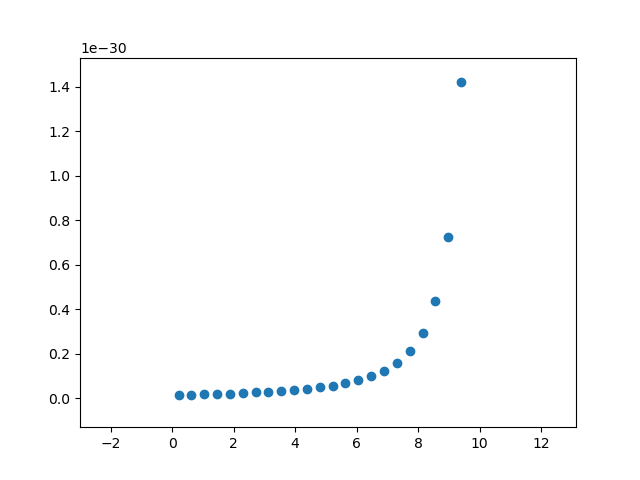

In [34]:
plt.scatter(radii,density)

In [56]:
density

<Quantity [1.48076302e-32, 1.60946674e-32, 1.75570964e-32, 1.92282965e-32,
           2.11499823e-32, 2.33748325e-32, 2.59701389e-32, 2.90229552e-32,
           3.26474933e-32, 3.69959627e-32, 4.22748159e-32, 4.87697122e-32,
           5.68849923e-32, 6.72081667e-32, 8.06193201e-32, 9.84850975e-32,
           1.23021177e-31, 1.58013867e-31, 2.10373492e-31, 2.93827440e-31,
           4.38927410e-31, 7.25573881e-31, 1.42212481e-30, 3.95034669e-30,
           3.55531202e-29] 1 / (cm3 g)>

In [52]:
a = np.linspace(0,1,2)    #this is Radii, linspace second argument is R_MC, third argument is NZONES+1
print(a,a[1:],a[:-1])
print(a[1:]-a[:-1],(a[1:]+a[:-1])/2)   #the difference is dR, the 1/2 output is radii

[0. 1.] [1.] [0.]
[1.] [0.5]


In [39]:
print(a[::-1],a[::-2],a[::-3],a[::2])
print(np.cumsum(a),a)

[10.          8.88888889  7.77777778  6.66666667  5.55555556  4.44444444
  3.33333333  2.22222222  1.11111111  0.        ] [10.          7.77777778  5.55555556  3.33333333  1.11111111] [10.          6.66666667  3.33333333  0.        ] [0.         2.22222222 4.44444444 6.66666667 8.88888889]
[ 0.          1.11111111  3.33333333  6.66666667 11.11111111 16.66666667
 23.33333333 31.11111111 40.         50.        ] [ 0.          1.11111111  2.22222222  3.33333333  4.44444444  5.55555556
  6.66666667  7.77777778  8.88888889 10.        ]
